In [1]:
# To support both python 2 and python 3
from __future__ import division, print_function, unicode_literals

# Common imports
import numpy as np
import os
import pandas as pd
import time

# To plot pretty figures
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

In [2]:
import sys
sys.path.append('../../../')

from dataset_loader import DatasetLoader
from random_search_tensorflow import RandomSearchDNN
from tools import leaky_relu
import tensorflow as tf

In [3]:
loader = DatasetLoader(preprocess_type='fft', window='hamming')
dataset = loader.load_dataset(file='samples_allGuitar_20480_Mm7_R1D.csv', csv=True)

C:\Users\Denis\Dropbox\Github_Projects\TCC\TCC_app\server_Universal_Tuner\api\ML_models/dataset/
0 processed rows
1000 processed rows
2000 processed rows
3000 processed rows
This loading/preprocessing took 295.77 seconds


In [4]:
print(dataset.y);print(dataset.y.shape)
n_each_k = np.zeros(48)
for k in range(48):
    for m in dataset.y:
        if m == k:
            n_each_k[k] += 1
for i, n_recordings in enumerate(n_each_k):
    print("Class", i,":", n_recordings)

total = 0
for item in n_each_k:
    total = total + item

mean_classes = total/48
print("Average of recordings per class:", mean_classes) #media de gravacoes por classe

[ 16.  29.  23. ...,  26.  28.  10.]
(3214,)
Class 0 : 82.0
Class 1 : 68.0
Class 2 : 64.0
Class 3 : 68.0
Class 4 : 58.0
Class 5 : 57.0
Class 6 : 56.0
Class 7 : 67.0
Class 8 : 76.0
Class 9 : 108.0
Class 10 : 58.0
Class 11 : 60.0
Class 12 : 46.0
Class 13 : 57.0
Class 14 : 55.0
Class 15 : 57.0
Class 16 : 72.0
Class 17 : 66.0
Class 18 : 69.0
Class 19 : 70.0
Class 20 : 76.0
Class 21 : 68.0
Class 22 : 60.0
Class 23 : 62.0
Class 24 : 71.0
Class 25 : 49.0
Class 26 : 61.0
Class 27 : 62.0
Class 28 : 101.0
Class 29 : 107.0
Class 30 : 75.0
Class 31 : 47.0
Class 32 : 103.0
Class 33 : 72.0
Class 34 : 57.0
Class 35 : 67.0
Class 36 : 74.0
Class 37 : 63.0
Class 38 : 73.0
Class 39 : 46.0
Class 40 : 43.0
Class 41 : 77.0
Class 42 : 54.0
Class 43 : 58.0
Class 44 : 62.0
Class 45 : 73.0
Class 46 : 72.0
Class 47 : 67.0
Average of recordings per class: 66.9583333333


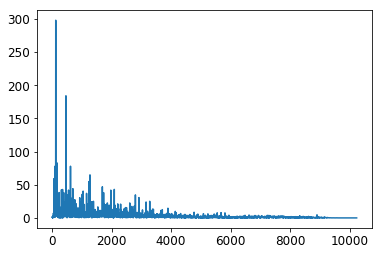

In [5]:
plt.plot(dataset.X_train[0])
plt.show()

In [6]:
params = {'n_hidden_layers': [1,2,3],
	'n_neurons' : [50, 150, 250, 300],
	'optimizer_class' : [tf.train.AdamOptimizer, tf.train.AdagradOptimizer],
	'learning_rate' : [0.01, 0.05, 0.1, 0.025],
	'batch_size' : [300, 400, 600],
	'activation' : [leaky_relu(), tf.nn.elu],
	'dropout_rate' : [0.000001, 0.1, 0.2],
}

model = RandomSearchDNN(params, k_fold=5, num_random_combinations=100)

time_initial = time.time()
model.fit(dataset.X_train, dataset.y_train, dataset.X_test,
        dataset.y_test, X_valid=dataset.X_valid, y_valid=dataset.y_valid)
time_final = time.time()

print ("This training took %.2f seconds" % (time_final - time_initial))

Trining DNN with parameters: n_hidden_layers: 1, n_neurons: 50, optimizer_class: <class 'tensorflow.python.training.adagrad.AdagradOptimizer'>, learning_rate: 0, dropout_rate: 0, batch_size: 300, activation: <function elu at 0x000001D852AEB2F0>, 
Training and testing fold 0
ranges:
2568 3210
shapes:
(2575, 10241) (642, 10241)
(2575,) (642,)
48
0	Validation loss: 4.268856	Best loss: 4.268856	Accuracy: 3.74%
1	Validation loss: 3.904392	Best loss: 3.904392	Accuracy: 6.54%
2	Validation loss: 3.773860	Best loss: 3.773860	Accuracy: 8.72%
3	Validation loss: 3.689210	Best loss: 3.689210	Accuracy: 9.03%
4	Validation loss: 3.603705	Best loss: 3.603705	Accuracy: 10.59%
5	Validation loss: 3.497094	Best loss: 3.497094	Accuracy: 11.84%
6	Validation loss: 3.424892	Best loss: 3.424892	Accuracy: 14.33%
7	Validation loss: 3.352760	Best loss: 3.352760	Accuracy: 13.40%
8	Validation loss: 3.329221	Best loss: 3.329221	Accuracy: 17.76%
9	Validation loss: 3.156904	Best loss: 3.156904	Accuracy: 21.50%
10	Valid

119	Validation loss: 0.419771	Best loss: 0.419771	Accuracy: 85.67%
120	Validation loss: 0.417342	Best loss: 0.417342	Accuracy: 88.16%
121	Validation loss: 0.430128	Best loss: 0.417342	Accuracy: 87.54%
122	Validation loss: 0.429643	Best loss: 0.417342	Accuracy: 86.92%
123	Validation loss: 0.396758	Best loss: 0.396758	Accuracy: 88.79%
124	Validation loss: 0.401395	Best loss: 0.396758	Accuracy: 88.16%
125	Validation loss: 0.416749	Best loss: 0.396758	Accuracy: 87.54%
126	Validation loss: 0.393228	Best loss: 0.393228	Accuracy: 88.79%
127	Validation loss: 0.386553	Best loss: 0.386553	Accuracy: 89.10%
128	Validation loss: 0.370791	Best loss: 0.370791	Accuracy: 90.34%
129	Validation loss: 0.364953	Best loss: 0.364953	Accuracy: 90.65%
130	Validation loss: 0.373523	Best loss: 0.364953	Accuracy: 90.65%
131	Validation loss: 0.369014	Best loss: 0.364953	Accuracy: 90.97%
132	Validation loss: 0.367813	Best loss: 0.364953	Accuracy: 89.72%
133	Validation loss: 0.367784	Best loss: 0.364953	Accuracy: 89

91	Validation loss: 0.164193	Best loss: 0.164193	Accuracy: 94.08%
92	Validation loss: 0.167617	Best loss: 0.164193	Accuracy: 94.08%
93	Validation loss: 0.160989	Best loss: 0.160989	Accuracy: 94.08%
94	Validation loss: 0.163339	Best loss: 0.160989	Accuracy: 94.39%
95	Validation loss: 0.159677	Best loss: 0.159677	Accuracy: 94.39%
96	Validation loss: 0.158490	Best loss: 0.158490	Accuracy: 94.08%
97	Validation loss: 0.155624	Best loss: 0.155624	Accuracy: 94.70%
98	Validation loss: 0.151489	Best loss: 0.151489	Accuracy: 94.39%
99	Validation loss: 0.152360	Best loss: 0.151489	Accuracy: 94.39%
100	Validation loss: 0.152966	Best loss: 0.151489	Accuracy: 95.02%
101	Validation loss: 0.148192	Best loss: 0.148192	Accuracy: 94.70%
102	Validation loss: 0.146088	Best loss: 0.146088	Accuracy: 94.70%
103	Validation loss: 0.145396	Best loss: 0.145396	Accuracy: 94.70%
104	Validation loss: 0.143882	Best loss: 0.143882	Accuracy: 94.70%
105	Validation loss: 0.141338	Best loss: 0.141338	Accuracy: 95.33%
106	

63	Validation loss: 0.041141	Best loss: 0.041141	Accuracy: 99.38%
64	Validation loss: 0.042095	Best loss: 0.041141	Accuracy: 99.07%
65	Validation loss: 0.044800	Best loss: 0.041141	Accuracy: 99.07%
66	Validation loss: 0.040848	Best loss: 0.040848	Accuracy: 99.07%
67	Validation loss: 0.039788	Best loss: 0.039788	Accuracy: 99.07%
68	Validation loss: 0.037286	Best loss: 0.037286	Accuracy: 99.38%
69	Validation loss: 0.037216	Best loss: 0.037216	Accuracy: 99.38%
70	Validation loss: 0.037164	Best loss: 0.037164	Accuracy: 99.38%
71	Validation loss: 0.037307	Best loss: 0.037164	Accuracy: 99.69%
72	Validation loss: 0.035905	Best loss: 0.035905	Accuracy: 99.69%
73	Validation loss: 0.034464	Best loss: 0.034464	Accuracy: 99.38%
74	Validation loss: 0.036111	Best loss: 0.034464	Accuracy: 99.38%
75	Validation loss: 0.032996	Best loss: 0.032996	Accuracy: 99.69%
76	Validation loss: 0.032942	Best loss: 0.032942	Accuracy: 99.38%
77	Validation loss: 0.034227	Best loss: 0.032942	Accuracy: 99.07%
78	Validat

35	Validation loss: 0.780771	Best loss: 0.780771	Accuracy: 73.83%
36	Validation loss: 0.780877	Best loss: 0.780771	Accuracy: 71.96%
37	Validation loss: 0.746836	Best loss: 0.746836	Accuracy: 73.21%
38	Validation loss: 0.738957	Best loss: 0.738957	Accuracy: 74.45%
39	Validation loss: 0.731350	Best loss: 0.731350	Accuracy: 73.52%
40	Validation loss: 0.643097	Best loss: 0.643097	Accuracy: 79.13%
41	Validation loss: 0.629828	Best loss: 0.629828	Accuracy: 79.13%
42	Validation loss: 0.603729	Best loss: 0.603729	Accuracy: 80.69%
43	Validation loss: 0.567359	Best loss: 0.567359	Accuracy: 81.00%
44	Validation loss: 0.526509	Best loss: 0.526509	Accuracy: 82.87%
45	Validation loss: 0.517909	Best loss: 0.517909	Accuracy: 83.18%
46	Validation loss: 0.492553	Best loss: 0.492553	Accuracy: 84.42%
47	Validation loss: 0.463904	Best loss: 0.463904	Accuracy: 84.11%
48	Validation loss: 0.457092	Best loss: 0.457092	Accuracy: 85.67%
49	Validation loss: 0.446596	Best loss: 0.446596	Accuracy: 84.42%
50	Validat

7	Validation loss: 2.843566	Best loss: 2.843566	Accuracy: 23.36%
8	Validation loss: 2.614876	Best loss: 2.614876	Accuracy: 25.55%
9	Validation loss: 2.470848	Best loss: 2.470848	Accuracy: 26.48%
10	Validation loss: 2.305148	Best loss: 2.305148	Accuracy: 32.71%
11	Validation loss: 2.134023	Best loss: 2.134023	Accuracy: 35.20%
12	Validation loss: 2.018846	Best loss: 2.018846	Accuracy: 38.94%
13	Validation loss: 1.898737	Best loss: 1.898737	Accuracy: 43.61%
14	Validation loss: 1.796111	Best loss: 1.796111	Accuracy: 45.17%
15	Validation loss: 1.716597	Best loss: 1.716597	Accuracy: 47.98%
16	Validation loss: 1.631968	Best loss: 1.631968	Accuracy: 49.22%
17	Validation loss: 1.562762	Best loss: 1.562762	Accuracy: 51.71%
18	Validation loss: 1.478696	Best loss: 1.478696	Accuracy: 52.65%
19	Validation loss: 1.395944	Best loss: 1.395944	Accuracy: 56.07%
20	Validation loss: 1.398530	Best loss: 1.395944	Accuracy: 53.58%
21	Validation loss: 1.295971	Best loss: 1.295971	Accuracy: 59.19%
22	Validation

131	Validation loss: 0.065313	Best loss: 0.064769	Accuracy: 98.44%
132	Validation loss: 0.060982	Best loss: 0.060982	Accuracy: 98.75%
133	Validation loss: 0.062534	Best loss: 0.060982	Accuracy: 99.07%
134	Validation loss: 0.060514	Best loss: 0.060514	Accuracy: 99.07%
135	Validation loss: 0.063505	Best loss: 0.060514	Accuracy: 98.44%
136	Validation loss: 0.060562	Best loss: 0.060514	Accuracy: 98.75%
137	Validation loss: 0.059381	Best loss: 0.059381	Accuracy: 99.07%
138	Validation loss: 0.059346	Best loss: 0.059346	Accuracy: 98.75%
139	Validation loss: 0.058823	Best loss: 0.058823	Accuracy: 98.75%
140	Validation loss: 0.057934	Best loss: 0.057934	Accuracy: 99.07%
141	Validation loss: 0.057774	Best loss: 0.057774	Accuracy: 98.75%
142	Validation loss: 0.056207	Best loss: 0.056207	Accuracy: 99.07%
143	Validation loss: 0.059656	Best loss: 0.056207	Accuracy: 98.44%
144	Validation loss: 0.056032	Best loss: 0.056032	Accuracy: 98.44%
145	Validation loss: 0.054619	Best loss: 0.054619	Accuracy: 99

94	Validation loss: 0.345791	Best loss: 0.269678	Accuracy: 89.41%
95	Validation loss: 0.279705	Best loss: 0.269678	Accuracy: 92.52%
96	Validation loss: 0.300511	Best loss: 0.269678	Accuracy: 90.34%
97	Validation loss: 0.342380	Best loss: 0.269678	Accuracy: 89.72%
98	Validation loss: 0.295606	Best loss: 0.269678	Accuracy: 90.97%
99	Validation loss: 0.287565	Best loss: 0.269678	Accuracy: 92.52%
100	Validation loss: 0.607534	Best loss: 0.269678	Accuracy: 88.79%
101	Validation loss: 0.276683	Best loss: 0.269678	Accuracy: 91.59%
102	Validation loss: 0.308567	Best loss: 0.269678	Accuracy: 90.65%
103	Validation loss: 0.402733	Best loss: 0.269678	Accuracy: 87.23%
104	Validation loss: 0.341168	Best loss: 0.269678	Accuracy: 90.34%
105	Validation loss: 0.279797	Best loss: 0.269678	Accuracy: 90.65%
106	Validation loss: 0.292825	Best loss: 0.269678	Accuracy: 91.90%
107	Validation loss: 0.261114	Best loss: 0.261114	Accuracy: 92.21%
108	Validation loss: 0.283382	Best loss: 0.261114	Accuracy: 90.03%
1

66	Validation loss: 0.190584	Best loss: 0.171812	Accuracy: 95.64%
67	Validation loss: 0.156121	Best loss: 0.156121	Accuracy: 96.57%
68	Validation loss: 0.182483	Best loss: 0.156121	Accuracy: 95.33%
69	Validation loss: 0.156532	Best loss: 0.156121	Accuracy: 97.51%
70	Validation loss: 0.148944	Best loss: 0.148944	Accuracy: 96.57%
71	Validation loss: 0.125599	Best loss: 0.125599	Accuracy: 98.44%
72	Validation loss: 0.175735	Best loss: 0.125599	Accuracy: 95.33%
73	Validation loss: 0.163922	Best loss: 0.125599	Accuracy: 97.20%
74	Validation loss: 0.158587	Best loss: 0.125599	Accuracy: 97.51%
75	Validation loss: 0.111226	Best loss: 0.111226	Accuracy: 97.82%
76	Validation loss: 0.121329	Best loss: 0.111226	Accuracy: 97.82%
77	Validation loss: 0.122213	Best loss: 0.111226	Accuracy: 97.51%
78	Validation loss: 0.109394	Best loss: 0.109394	Accuracy: 98.75%
79	Validation loss: 0.127061	Best loss: 0.109394	Accuracy: 97.51%
80	Validation loss: 0.151796	Best loss: 0.109394	Accuracy: 96.26%
81	Validat

38	Validation loss: 0.203699	Best loss: 0.203699	Accuracy: 95.33%
39	Validation loss: 0.241972	Best loss: 0.203699	Accuracy: 95.64%
40	Validation loss: 0.326711	Best loss: 0.203699	Accuracy: 93.15%
41	Validation loss: 0.282777	Best loss: 0.203699	Accuracy: 92.52%
42	Validation loss: 0.321273	Best loss: 0.203699	Accuracy: 93.15%
43	Validation loss: 0.291524	Best loss: 0.203699	Accuracy: 91.90%
44	Validation loss: 0.211083	Best loss: 0.203699	Accuracy: 95.02%
45	Validation loss: 0.252381	Best loss: 0.203699	Accuracy: 95.02%
46	Validation loss: 0.256366	Best loss: 0.203699	Accuracy: 93.77%
47	Validation loss: 0.376947	Best loss: 0.203699	Accuracy: 87.54%
48	Validation loss: 0.212159	Best loss: 0.203699	Accuracy: 95.95%
49	Validation loss: 0.266841	Best loss: 0.203699	Accuracy: 94.39%
50	Validation loss: 0.203307	Best loss: 0.203307	Accuracy: 95.95%
51	Validation loss: 0.179416	Best loss: 0.179416	Accuracy: 96.88%
52	Validation loss: 0.170890	Best loss: 0.170890	Accuracy: 97.51%
53	Validat

16	Validation loss: 0.507523	Best loss: 0.471703	Accuracy: 87.54%
17	Validation loss: 0.476890	Best loss: 0.471703	Accuracy: 87.54%
18	Validation loss: 0.494058	Best loss: 0.471703	Accuracy: 85.05%
19	Validation loss: 0.420658	Best loss: 0.420658	Accuracy: 88.16%
20	Validation loss: 0.439541	Best loss: 0.420658	Accuracy: 87.54%
21	Validation loss: 0.511919	Best loss: 0.420658	Accuracy: 86.29%
22	Validation loss: 0.363677	Best loss: 0.363677	Accuracy: 92.21%
23	Validation loss: 0.358694	Best loss: 0.358694	Accuracy: 90.97%
24	Validation loss: 0.430187	Best loss: 0.358694	Accuracy: 90.03%
25	Validation loss: 0.334446	Best loss: 0.334446	Accuracy: 91.90%
26	Validation loss: 0.294023	Best loss: 0.294023	Accuracy: 94.39%
27	Validation loss: 0.317978	Best loss: 0.294023	Accuracy: 91.28%
28	Validation loss: 0.326263	Best loss: 0.294023	Accuracy: 91.90%
29	Validation loss: 0.301016	Best loss: 0.294023	Accuracy: 93.46%
30	Validation loss: 0.289486	Best loss: 0.289486	Accuracy: 92.52%
31	Validat

16	Validation loss: 0.660884	Best loss: 0.639002	Accuracy: 81.00%
17	Validation loss: 0.583371	Best loss: 0.583371	Accuracy: 84.74%
18	Validation loss: 0.478691	Best loss: 0.478691	Accuracy: 87.23%
19	Validation loss: 0.455537	Best loss: 0.455537	Accuracy: 88.47%
20	Validation loss: 0.423097	Best loss: 0.423097	Accuracy: 88.79%
21	Validation loss: 0.397022	Best loss: 0.397022	Accuracy: 90.34%
22	Validation loss: 0.363729	Best loss: 0.363729	Accuracy: 90.34%
23	Validation loss: 0.362109	Best loss: 0.362109	Accuracy: 92.52%
24	Validation loss: 0.348315	Best loss: 0.348315	Accuracy: 90.65%
25	Validation loss: 0.283996	Best loss: 0.283996	Accuracy: 92.21%
26	Validation loss: 0.303779	Best loss: 0.283996	Accuracy: 90.97%
27	Validation loss: 0.301365	Best loss: 0.283996	Accuracy: 91.59%
28	Validation loss: 0.257082	Best loss: 0.257082	Accuracy: 94.39%
29	Validation loss: 0.238191	Best loss: 0.238191	Accuracy: 95.02%
30	Validation loss: 0.261082	Best loss: 0.238191	Accuracy: 92.83%
31	Validat

24	Validation loss: 1.854090	Best loss: 1.139608	Accuracy: 84.11%
25	Validation loss: 3.947656	Best loss: 1.139608	Accuracy: 80.37%
26	Validation loss: 3.614301	Best loss: 1.139608	Accuracy: 79.13%
27	Validation loss: 2.246006	Best loss: 1.139608	Accuracy: 86.92%
28	Validation loss: 2.680805	Best loss: 1.139608	Accuracy: 81.31%
29	Validation loss: 1.903180	Best loss: 1.139608	Accuracy: 85.05%
30	Validation loss: 1.378314	Best loss: 1.139608	Accuracy: 87.23%
31	Validation loss: 1.753351	Best loss: 1.139608	Accuracy: 86.29%
32	Validation loss: 1.923664	Best loss: 1.139608	Accuracy: 88.47%
33	Validation loss: 2.303476	Best loss: 1.139608	Accuracy: 84.11%
34	Validation loss: 2.374816	Best loss: 1.139608	Accuracy: 87.85%
35	Validation loss: 2.896987	Best loss: 1.139608	Accuracy: 87.23%
36	Validation loss: 1.853195	Best loss: 1.139608	Accuracy: 86.92%
37	Validation loss: 1.016656	Best loss: 1.016656	Accuracy: 90.03%
38	Validation loss: 2.520806	Best loss: 1.016656	Accuracy: 87.54%
39	Validat

67	Validation loss: 0.042253	Best loss: 0.034356	Accuracy: 98.44%
68	Validation loss: 0.122927	Best loss: 0.034356	Accuracy: 96.26%
69	Validation loss: 0.159442	Best loss: 0.034356	Accuracy: 96.57%
70	Validation loss: 1.423702	Best loss: 0.034356	Accuracy: 95.02%
71	Validation loss: 4.000814	Best loss: 0.034356	Accuracy: 88.79%
72	Validation loss: 1.848067	Best loss: 0.034356	Accuracy: 84.74%
73	Validation loss: 2.635624	Best loss: 0.034356	Accuracy: 86.60%
74	Validation loss: 1.152773	Best loss: 0.034356	Accuracy: 84.42%
75	Validation loss: 1.059057	Best loss: 0.034356	Accuracy: 87.85%
76	Validation loss: 2.564366	Best loss: 0.034356	Accuracy: 88.79%
77	Validation loss: 1.356955	Best loss: 0.034356	Accuracy: 85.98%
78	Validation loss: 0.542249	Best loss: 0.034356	Accuracy: 91.59%
79	Validation loss: 0.618092	Best loss: 0.034356	Accuracy: 94.39%
80	Validation loss: 0.185822	Best loss: 0.034356	Accuracy: 96.57%
81	Validation loss: 0.659187	Best loss: 0.034356	Accuracy: 90.34%
82	Validat

82	Validation loss: 1.638910	Best loss: 0.025107	Accuracy: 87.23%
83	Validation loss: 1.316997	Best loss: 0.025107	Accuracy: 85.98%
84	Validation loss: 3.682076	Best loss: 0.025107	Accuracy: 88.16%
85	Validation loss: 4.839235	Best loss: 0.025107	Accuracy: 83.18%
86	Validation loss: 2.454191	Best loss: 0.025107	Accuracy: 88.47%
87	Validation loss: 3.772744	Best loss: 0.025107	Accuracy: 89.41%
88	Validation loss: 1.728200	Best loss: 0.025107	Accuracy: 90.97%
89	Validation loss: 3.910512	Best loss: 0.025107	Accuracy: 87.85%
90	Validation loss: 1.632674	Best loss: 0.025107	Accuracy: 90.03%
Early stopping!
Final accuracy on test set: 0.971963
Training and testing fold 3
ranges:
642 1284
shapes:
(4501, 10241) (642, 10241)
(4501,) (642,)
48
0	Validation loss: 418.181824	Best loss: 418.181824	Accuracy: 14.33%
1	Validation loss: 94.578186	Best loss: 94.578186	Accuracy: 35.20%
2	Validation loss: 26.500978	Best loss: 26.500978	Accuracy: 50.78%
3	Validation loss: 10.726055	Best loss: 10.726055	Ac

113	Validation loss: 9.420876	Best loss: 0.126959	Accuracy: 89.41%
114	Validation loss: 7.944977	Best loss: 0.126959	Accuracy: 94.70%
115	Validation loss: 3.238008	Best loss: 0.126959	Accuracy: 93.46%
116	Validation loss: 1.951174	Best loss: 0.126959	Accuracy: 95.02%
117	Validation loss: 2.354801	Best loss: 0.126959	Accuracy: 95.02%
118	Validation loss: 1.283721	Best loss: 0.126959	Accuracy: 94.08%
119	Validation loss: 1.146584	Best loss: 0.126959	Accuracy: 94.39%
120	Validation loss: 0.406058	Best loss: 0.126959	Accuracy: 98.13%
121	Validation loss: 1.945376	Best loss: 0.126959	Accuracy: 97.51%
122	Validation loss: 2.275201	Best loss: 0.126959	Accuracy: 96.57%
123	Validation loss: 0.699216	Best loss: 0.126959	Accuracy: 96.26%
124	Validation loss: 0.428524	Best loss: 0.126959	Accuracy: 98.13%
125	Validation loss: 2.234516	Best loss: 0.126959	Accuracy: 95.33%
126	Validation loss: 0.774005	Best loss: 0.126959	Accuracy: 96.88%
127	Validation loss: 0.739454	Best loss: 0.126959	Accuracy: 96

94	Validation loss: 0.690229	Best loss: 0.114798	Accuracy: 97.51%
95	Validation loss: 0.894648	Best loss: 0.114798	Accuracy: 98.44%
96	Validation loss: 3.215178	Best loss: 0.114798	Accuracy: 95.02%
97	Validation loss: 2.006333	Best loss: 0.114798	Accuracy: 93.15%
98	Validation loss: 1.544927	Best loss: 0.114798	Accuracy: 95.95%
99	Validation loss: 4.161138	Best loss: 0.114798	Accuracy: 94.08%
100	Validation loss: 0.425006	Best loss: 0.114798	Accuracy: 97.82%
101	Validation loss: 0.457394	Best loss: 0.114798	Accuracy: 97.51%
102	Validation loss: 0.183250	Best loss: 0.114798	Accuracy: 99.07%
103	Validation loss: 0.321038	Best loss: 0.114798	Accuracy: 98.44%
104	Validation loss: 0.617646	Best loss: 0.114798	Accuracy: 96.26%
105	Validation loss: 1.262833	Best loss: 0.114798	Accuracy: 97.20%
106	Validation loss: 1.275612	Best loss: 0.114798	Accuracy: 98.44%
107	Validation loss: 0.272463	Best loss: 0.114798	Accuracy: 98.13%
108	Validation loss: 0.865514	Best loss: 0.114798	Accuracy: 97.51%
1

56	Validation loss: 0.824840	Best loss: 0.106504	Accuracy: 91.59%
57	Validation loss: 0.499084	Best loss: 0.106504	Accuracy: 93.77%
58	Validation loss: 0.343882	Best loss: 0.106504	Accuracy: 92.52%
59	Validation loss: 0.615970	Best loss: 0.106504	Accuracy: 91.28%
60	Validation loss: 0.629791	Best loss: 0.106504	Accuracy: 91.59%
61	Validation loss: 0.515296	Best loss: 0.106504	Accuracy: 92.83%
Early stopping!
Final accuracy on test set: 0.959502
Training and testing fold 1
ranges:
1926 2568
shapes:
(3217, 10241) (642, 10241)
(3217,) (642,)
48
0	Validation loss: 85.625320	Best loss: 85.625320	Accuracy: 28.66%
1	Validation loss: 6.558291	Best loss: 6.558291	Accuracy: 50.16%
2	Validation loss: 1.779001	Best loss: 1.779001	Accuracy: 66.36%
3	Validation loss: 0.763724	Best loss: 0.763724	Accuracy: 78.82%
4	Validation loss: 0.433686	Best loss: 0.433686	Accuracy: 86.92%
5	Validation loss: 0.287838	Best loss: 0.287838	Accuracy: 91.90%
6	Validation loss: 0.221823	Best loss: 0.221823	Accuracy: 91

115	Validation loss: 0.000807	Best loss: 0.000806	Accuracy: 100.00%
116	Validation loss: 0.000790	Best loss: 0.000790	Accuracy: 100.00%
117	Validation loss: 0.000775	Best loss: 0.000775	Accuracy: 100.00%
118	Validation loss: 0.000730	Best loss: 0.000730	Accuracy: 100.00%
119	Validation loss: 0.000729	Best loss: 0.000729	Accuracy: 100.00%
120	Validation loss: 0.000709	Best loss: 0.000709	Accuracy: 100.00%
121	Validation loss: 0.000705	Best loss: 0.000705	Accuracy: 100.00%
122	Validation loss: 0.000713	Best loss: 0.000705	Accuracy: 100.00%
123	Validation loss: 0.000674	Best loss: 0.000674	Accuracy: 100.00%
124	Validation loss: 0.000687	Best loss: 0.000674	Accuracy: 100.00%
125	Validation loss: 0.000668	Best loss: 0.000668	Accuracy: 100.00%
126	Validation loss: 0.000675	Best loss: 0.000668	Accuracy: 100.00%
127	Validation loss: 0.000632	Best loss: 0.000632	Accuracy: 100.00%
128	Validation loss: 0.000643	Best loss: 0.000632	Accuracy: 100.00%
129	Validation loss: 0.000599	Best loss: 0.00059

86	Validation loss: 0.000484	Best loss: 0.000484	Accuracy: 100.00%
87	Validation loss: 0.000488	Best loss: 0.000484	Accuracy: 100.00%
88	Validation loss: 0.000465	Best loss: 0.000465	Accuracy: 100.00%
89	Validation loss: 0.000465	Best loss: 0.000465	Accuracy: 100.00%
90	Validation loss: 0.000451	Best loss: 0.000451	Accuracy: 100.00%
91	Validation loss: 0.000438	Best loss: 0.000438	Accuracy: 100.00%
92	Validation loss: 0.000424	Best loss: 0.000424	Accuracy: 100.00%
93	Validation loss: 0.000410	Best loss: 0.000410	Accuracy: 100.00%
94	Validation loss: 0.000422	Best loss: 0.000410	Accuracy: 100.00%
95	Validation loss: 0.000401	Best loss: 0.000401	Accuracy: 100.00%
96	Validation loss: 0.000389	Best loss: 0.000389	Accuracy: 100.00%
97	Validation loss: 0.000380	Best loss: 0.000380	Accuracy: 100.00%
98	Validation loss: 0.000359	Best loss: 0.000359	Accuracy: 100.00%
99	Validation loss: 0.000380	Best loss: 0.000359	Accuracy: 100.00%
100	Validation loss: 0.000372	Best loss: 0.000359	Accuracy: 10

57	Validation loss: 0.002059	Best loss: 0.001768	Accuracy: 100.00%
58	Validation loss: 0.001790	Best loss: 0.001768	Accuracy: 100.00%
59	Validation loss: 0.001643	Best loss: 0.001643	Accuracy: 100.00%
60	Validation loss: 0.001504	Best loss: 0.001504	Accuracy: 100.00%
61	Validation loss: 0.001408	Best loss: 0.001408	Accuracy: 100.00%
62	Validation loss: 0.001406	Best loss: 0.001406	Accuracy: 100.00%
63	Validation loss: 0.001427	Best loss: 0.001406	Accuracy: 100.00%
64	Validation loss: 0.001280	Best loss: 0.001280	Accuracy: 100.00%
65	Validation loss: 0.001307	Best loss: 0.001280	Accuracy: 100.00%
66	Validation loss: 0.001160	Best loss: 0.001160	Accuracy: 100.00%
67	Validation loss: 0.001165	Best loss: 0.001160	Accuracy: 100.00%
68	Validation loss: 0.001104	Best loss: 0.001104	Accuracy: 100.00%
69	Validation loss: 0.001002	Best loss: 0.001002	Accuracy: 100.00%
70	Validation loss: 0.001058	Best loss: 0.001002	Accuracy: 100.00%
71	Validation loss: 0.000942	Best loss: 0.000942	Accuracy: 100

28	Validation loss: 0.007249	Best loss: 0.007249	Accuracy: 100.00%
29	Validation loss: 0.007156	Best loss: 0.007156	Accuracy: 100.00%
30	Validation loss: 0.007065	Best loss: 0.007065	Accuracy: 100.00%
31	Validation loss: 0.006099	Best loss: 0.006099	Accuracy: 100.00%
32	Validation loss: 0.005735	Best loss: 0.005735	Accuracy: 100.00%
33	Validation loss: 0.005128	Best loss: 0.005128	Accuracy: 100.00%
34	Validation loss: 0.004930	Best loss: 0.004930	Accuracy: 100.00%
35	Validation loss: 0.004664	Best loss: 0.004664	Accuracy: 100.00%
36	Validation loss: 0.004437	Best loss: 0.004437	Accuracy: 100.00%
37	Validation loss: 0.004350	Best loss: 0.004350	Accuracy: 100.00%
38	Validation loss: 0.003980	Best loss: 0.003980	Accuracy: 100.00%
39	Validation loss: 0.003698	Best loss: 0.003698	Accuracy: 100.00%
40	Validation loss: 0.003540	Best loss: 0.003540	Accuracy: 100.00%
41	Validation loss: 0.003337	Best loss: 0.003337	Accuracy: 100.00%
42	Validation loss: 0.003272	Best loss: 0.003272	Accuracy: 100

Trining DNN with parameters: n_hidden_layers: 2, n_neurons: 300, optimizer_class: <class 'tensorflow.python.training.adam.AdamOptimizer'>, learning_rate: 0, dropout_rate: 0, batch_size: 400, activation: <function leaky_relu.<locals>.parametrized_leaky_relu at 0x000001D80EA920D0>, 
Training and testing fold 0
ranges:
2568 3210
shapes:
(2575, 10241) (642, 10241)
(2575,) (642,)
48
0	Validation loss: 849.812866	Best loss: 849.812866	Accuracy: 1.56%
1	Validation loss: 63.780067	Best loss: 63.780067	Accuracy: 10.90%
2	Validation loss: 34.319828	Best loss: 34.319828	Accuracy: 9.66%
3	Validation loss: 18.636616	Best loss: 18.636616	Accuracy: 21.18%
4	Validation loss: 10.605523	Best loss: 10.605523	Accuracy: 19.00%
5	Validation loss: 12.831625	Best loss: 10.605523	Accuracy: 23.99%
6	Validation loss: 12.988445	Best loss: 10.605523	Accuracy: 24.30%
7	Validation loss: 9.719664	Best loss: 9.719664	Accuracy: 29.91%
8	Validation loss: 5.327008	Best loss: 5.327008	Accuracy: 33.96%
9	Validation loss: 4

119	Validation loss: 0.302531	Best loss: 0.175946	Accuracy: 93.46%
120	Validation loss: 0.493736	Best loss: 0.175946	Accuracy: 88.79%
121	Validation loss: 0.357100	Best loss: 0.175946	Accuracy: 91.59%
122	Validation loss: 0.344099	Best loss: 0.175946	Accuracy: 92.21%
123	Validation loss: 0.301647	Best loss: 0.175946	Accuracy: 92.52%
124	Validation loss: 0.496254	Best loss: 0.175946	Accuracy: 87.54%
125	Validation loss: 0.363101	Best loss: 0.175946	Accuracy: 91.28%
126	Validation loss: 0.310435	Best loss: 0.175946	Accuracy: 92.21%
127	Validation loss: 0.333554	Best loss: 0.175946	Accuracy: 90.65%
128	Validation loss: 0.393020	Best loss: 0.175946	Accuracy: 90.65%
129	Validation loss: 0.309958	Best loss: 0.175946	Accuracy: 92.21%
130	Validation loss: 0.344670	Best loss: 0.175946	Accuracy: 90.97%
131	Validation loss: 0.285343	Best loss: 0.175946	Accuracy: 93.15%
132	Validation loss: 0.423939	Best loss: 0.175946	Accuracy: 90.65%
133	Validation loss: 0.338223	Best loss: 0.175946	Accuracy: 89

91	Validation loss: 0.218281	Best loss: 0.074838	Accuracy: 93.46%
92	Validation loss: 0.112724	Best loss: 0.074838	Accuracy: 96.88%
93	Validation loss: 0.126637	Best loss: 0.074838	Accuracy: 96.88%
94	Validation loss: 0.197034	Best loss: 0.074838	Accuracy: 94.08%
95	Validation loss: 0.280464	Best loss: 0.074838	Accuracy: 91.90%
96	Validation loss: 0.286933	Best loss: 0.074838	Accuracy: 94.39%
97	Validation loss: 0.187948	Best loss: 0.074838	Accuracy: 95.64%
98	Validation loss: 0.122002	Best loss: 0.074838	Accuracy: 95.64%
99	Validation loss: 0.351919	Best loss: 0.074838	Accuracy: 92.83%
100	Validation loss: 0.204300	Best loss: 0.074838	Accuracy: 93.15%
101	Validation loss: 0.184624	Best loss: 0.074838	Accuracy: 93.46%
102	Validation loss: 0.102373	Best loss: 0.074838	Accuracy: 96.26%
103	Validation loss: 0.258529	Best loss: 0.074838	Accuracy: 96.26%
104	Validation loss: 0.249973	Best loss: 0.074838	Accuracy: 94.70%
105	Validation loss: 0.176399	Best loss: 0.074838	Accuracy: 95.02%
106	

82	Validation loss: 0.272109	Best loss: 0.117243	Accuracy: 92.83%
83	Validation loss: 0.425758	Best loss: 0.117243	Accuracy: 90.65%
84	Validation loss: 0.236117	Best loss: 0.117243	Accuracy: 94.39%
85	Validation loss: 0.269419	Best loss: 0.117243	Accuracy: 93.46%
86	Validation loss: 0.256557	Best loss: 0.117243	Accuracy: 91.90%
87	Validation loss: 0.280031	Best loss: 0.117243	Accuracy: 90.97%
88	Validation loss: 0.336918	Best loss: 0.117243	Accuracy: 91.28%
89	Validation loss: 0.267597	Best loss: 0.117243	Accuracy: 92.52%
90	Validation loss: 0.319121	Best loss: 0.117243	Accuracy: 91.90%
91	Validation loss: 0.283084	Best loss: 0.117243	Accuracy: 90.34%
92	Validation loss: 0.970396	Best loss: 0.117243	Accuracy: 90.34%
93	Validation loss: 0.516804	Best loss: 0.117243	Accuracy: 87.54%
94	Validation loss: 0.600542	Best loss: 0.117243	Accuracy: 85.36%
95	Validation loss: 0.356943	Best loss: 0.117243	Accuracy: 93.15%
96	Validation loss: 0.298393	Best loss: 0.117243	Accuracy: 92.21%
97	Validat

106	Validation loss: 22.236313	Best loss: 0.158501	Accuracy: 63.86%
107	Validation loss: 7.524295	Best loss: 0.158501	Accuracy: 74.77%
108	Validation loss: 18.157848	Best loss: 0.158501	Accuracy: 60.75%
109	Validation loss: 23.678070	Best loss: 0.158501	Accuracy: 55.76%
110	Validation loss: 18.758459	Best loss: 0.158501	Accuracy: 68.22%
111	Validation loss: 19.445421	Best loss: 0.158501	Accuracy: 60.75%
112	Validation loss: 8.750504	Best loss: 0.158501	Accuracy: 77.26%
113	Validation loss: 19.440323	Best loss: 0.158501	Accuracy: 70.72%
114	Validation loss: 4.874762	Best loss: 0.158501	Accuracy: 79.13%
115	Validation loss: 1.262130	Best loss: 0.158501	Accuracy: 90.34%
116	Validation loss: 2.814266	Best loss: 0.158501	Accuracy: 85.98%
117	Validation loss: 2.306587	Best loss: 0.158501	Accuracy: 87.54%
Early stopping!
Final accuracy on test set: 0.94081
Training and testing fold 4
ranges:
0 642
shapes:
(5143, 10241) (642, 10241)
(5143,) (642,)
48
0	Validation loss: 24.962692	Best loss: 24.

0	Validation loss: 6267.154785	Best loss: 6267.154785	Accuracy: 2.49%
1	Validation loss: 180.001556	Best loss: 180.001556	Accuracy: 2.18%
2	Validation loss: 39.897652	Best loss: 39.897652	Accuracy: 2.80%
3	Validation loss: 6.364155	Best loss: 6.364155	Accuracy: 3.74%
4	Validation loss: 4.899268	Best loss: 4.899268	Accuracy: 8.41%
5	Validation loss: 4.532260	Best loss: 4.532260	Accuracy: 7.17%
6	Validation loss: 4.534771	Best loss: 4.532260	Accuracy: 10.28%
7	Validation loss: 4.037411	Best loss: 4.037411	Accuracy: 8.10%
8	Validation loss: 3.911493	Best loss: 3.911493	Accuracy: 11.21%
9	Validation loss: 3.827035	Best loss: 3.827035	Accuracy: 9.66%
10	Validation loss: 4.199811	Best loss: 3.827035	Accuracy: 7.17%
11	Validation loss: 3.987038	Best loss: 3.827035	Accuracy: 9.03%
12	Validation loss: 3.588901	Best loss: 3.588901	Accuracy: 15.26%
13	Validation loss: 3.390971	Best loss: 3.390971	Accuracy: 18.07%
14	Validation loss: 3.746977	Best loss: 3.390971	Accuracy: 13.08%
15	Validation loss

124	Validation loss: 1.286433	Best loss: 1.276783	Accuracy: 64.49%
125	Validation loss: 1.340410	Best loss: 1.276783	Accuracy: 62.62%
126	Validation loss: 1.266615	Best loss: 1.266615	Accuracy: 63.24%
127	Validation loss: 1.278023	Best loss: 1.266615	Accuracy: 62.31%
128	Validation loss: 1.321148	Best loss: 1.266615	Accuracy: 61.68%
129	Validation loss: 1.314266	Best loss: 1.266615	Accuracy: 64.80%
130	Validation loss: 1.221480	Best loss: 1.221480	Accuracy: 63.86%
131	Validation loss: 1.268674	Best loss: 1.221480	Accuracy: 64.80%
132	Validation loss: 1.273347	Best loss: 1.221480	Accuracy: 61.06%
133	Validation loss: 3.334496	Best loss: 1.221480	Accuracy: 29.28%
134	Validation loss: 1.204198	Best loss: 1.204198	Accuracy: 62.93%
135	Validation loss: 1.146014	Best loss: 1.146014	Accuracy: 67.29%
136	Validation loss: 1.135394	Best loss: 1.135394	Accuracy: 65.42%
137	Validation loss: 1.130349	Best loss: 1.130349	Accuracy: 67.60%
138	Validation loss: 1.120354	Best loss: 1.120354	Accuracy: 67

97	Validation loss: 1.142566	Best loss: 0.896332	Accuracy: 64.80%
98	Validation loss: 0.795588	Best loss: 0.795588	Accuracy: 76.64%
99	Validation loss: 0.772488	Best loss: 0.772488	Accuracy: 78.82%
100	Validation loss: 0.752324	Best loss: 0.752324	Accuracy: 75.39%
101	Validation loss: 1.395830	Best loss: 0.752324	Accuracy: 56.39%
102	Validation loss: 0.669901	Best loss: 0.669901	Accuracy: 81.62%
103	Validation loss: 0.683659	Best loss: 0.669901	Accuracy: 80.69%
104	Validation loss: 1.101654	Best loss: 0.669901	Accuracy: 61.99%
105	Validation loss: 1.818821	Best loss: 0.669901	Accuracy: 44.55%
106	Validation loss: 0.832766	Best loss: 0.669901	Accuracy: 72.90%
107	Validation loss: 0.624086	Best loss: 0.624086	Accuracy: 85.36%
108	Validation loss: 0.581206	Best loss: 0.581206	Accuracy: 86.29%
109	Validation loss: 0.581619	Best loss: 0.581206	Accuracy: 83.80%
110	Validation loss: 0.540357	Best loss: 0.540357	Accuracy: 86.92%
111	Validation loss: 0.675585	Best loss: 0.540357	Accuracy: 78.19

69	Validation loss: 0.618746	Best loss: 0.618746	Accuracy: 80.06%
70	Validation loss: 3.984652	Best loss: 0.618746	Accuracy: 42.68%
71	Validation loss: 1.115049	Best loss: 0.618746	Accuracy: 62.62%
72	Validation loss: 0.647561	Best loss: 0.618746	Accuracy: 78.82%
73	Validation loss: 0.585851	Best loss: 0.585851	Accuracy: 84.11%
74	Validation loss: 0.597498	Best loss: 0.585851	Accuracy: 82.24%
75	Validation loss: 0.554689	Best loss: 0.554689	Accuracy: 85.05%
76	Validation loss: 0.524224	Best loss: 0.524224	Accuracy: 85.36%
77	Validation loss: 0.510634	Best loss: 0.510634	Accuracy: 82.87%
78	Validation loss: 0.707074	Best loss: 0.510634	Accuracy: 76.32%
79	Validation loss: 0.490716	Best loss: 0.490716	Accuracy: 88.16%
80	Validation loss: 0.467234	Best loss: 0.467234	Accuracy: 87.85%
81	Validation loss: 0.465718	Best loss: 0.465718	Accuracy: 87.23%
82	Validation loss: 0.491215	Best loss: 0.465718	Accuracy: 86.92%
83	Validation loss: 0.452871	Best loss: 0.452871	Accuracy: 87.85%
84	Validat

41	Validation loss: 0.778864	Best loss: 0.778864	Accuracy: 76.95%
42	Validation loss: 0.818180	Best loss: 0.778864	Accuracy: 74.77%
43	Validation loss: 0.946144	Best loss: 0.778864	Accuracy: 70.09%
44	Validation loss: 0.696648	Best loss: 0.696648	Accuracy: 80.37%
45	Validation loss: 0.696962	Best loss: 0.696648	Accuracy: 81.31%
46	Validation loss: 0.679825	Best loss: 0.679825	Accuracy: 80.69%
47	Validation loss: 0.641531	Best loss: 0.641531	Accuracy: 80.69%
48	Validation loss: 0.649039	Best loss: 0.641531	Accuracy: 80.69%
49	Validation loss: 0.648829	Best loss: 0.641531	Accuracy: 81.62%
50	Validation loss: 0.592871	Best loss: 0.592871	Accuracy: 83.18%
51	Validation loss: 0.612282	Best loss: 0.592871	Accuracy: 81.93%
52	Validation loss: 0.634193	Best loss: 0.592871	Accuracy: 81.62%
53	Validation loss: 0.563647	Best loss: 0.563647	Accuracy: 85.05%
54	Validation loss: 0.542043	Best loss: 0.542043	Accuracy: 85.67%
55	Validation loss: 0.559757	Best loss: 0.542043	Accuracy: 83.80%
56	Validat

13	Validation loss: 3.912337	Best loss: 3.887194	Accuracy: 6.85%
14	Validation loss: 3.744452	Best loss: 3.744452	Accuracy: 8.41%
15	Validation loss: 3.790190	Best loss: 3.744452	Accuracy: 6.23%
16	Validation loss: 3.751368	Best loss: 3.744452	Accuracy: 6.23%
17	Validation loss: 3.789769	Best loss: 3.744452	Accuracy: 6.54%
18	Validation loss: 3.864085	Best loss: 3.744452	Accuracy: 7.17%
19	Validation loss: 3.707268	Best loss: 3.707268	Accuracy: 8.41%
20	Validation loss: 3.675092	Best loss: 3.675092	Accuracy: 9.35%
21	Validation loss: 3.632992	Best loss: 3.632992	Accuracy: 9.66%
22	Validation loss: 3.605620	Best loss: 3.605620	Accuracy: 11.21%
23	Validation loss: 3.591589	Best loss: 3.591589	Accuracy: 11.21%
24	Validation loss: 3.592336	Best loss: 3.591589	Accuracy: 9.97%
25	Validation loss: 3.565805	Best loss: 3.565805	Accuracy: 9.97%
26	Validation loss: 3.530429	Best loss: 3.530429	Accuracy: 10.59%
27	Validation loss: 3.542529	Best loss: 3.530429	Accuracy: 10.90%
28	Validation loss: 3

137	Validation loss: 0.442460	Best loss: 0.442460	Accuracy: 88.16%
138	Validation loss: 0.420342	Best loss: 0.420342	Accuracy: 89.41%
139	Validation loss: 0.419772	Best loss: 0.419772	Accuracy: 89.41%
140	Validation loss: 0.416559	Best loss: 0.416559	Accuracy: 90.65%
141	Validation loss: 0.403200	Best loss: 0.403200	Accuracy: 90.03%
142	Validation loss: 0.399119	Best loss: 0.399119	Accuracy: 90.34%
143	Validation loss: 0.396349	Best loss: 0.396349	Accuracy: 89.41%
144	Validation loss: 0.387669	Best loss: 0.387669	Accuracy: 90.03%
145	Validation loss: 0.386018	Best loss: 0.386018	Accuracy: 89.41%
146	Validation loss: 0.373845	Best loss: 0.373845	Accuracy: 91.28%
147	Validation loss: 0.368983	Best loss: 0.368983	Accuracy: 90.03%
148	Validation loss: 0.366769	Best loss: 0.366769	Accuracy: 90.65%
149	Validation loss: 0.356417	Best loss: 0.356417	Accuracy: 92.21%
Final accuracy on test set: 0.901869
******************************************
{'n_hidden_layers': 3, 'n_neurons': 300, 'optimiz

100	Validation loss: 0.115673	Best loss: 0.101019	Accuracy: 98.13%
101	Validation loss: 0.104152	Best loss: 0.101019	Accuracy: 97.20%
102	Validation loss: 0.110886	Best loss: 0.101019	Accuracy: 97.20%
103	Validation loss: 0.106799	Best loss: 0.101019	Accuracy: 97.20%
104	Validation loss: 0.105727	Best loss: 0.101019	Accuracy: 96.88%
105	Validation loss: 0.109217	Best loss: 0.101019	Accuracy: 97.20%
106	Validation loss: 0.112389	Best loss: 0.101019	Accuracy: 97.82%
107	Validation loss: 0.122017	Best loss: 0.101019	Accuracy: 97.51%
108	Validation loss: 0.114863	Best loss: 0.101019	Accuracy: 97.20%
109	Validation loss: 0.113179	Best loss: 0.101019	Accuracy: 97.51%
110	Validation loss: 0.120705	Best loss: 0.101019	Accuracy: 96.88%
111	Validation loss: 0.109563	Best loss: 0.101019	Accuracy: 97.20%
112	Validation loss: 0.110995	Best loss: 0.101019	Accuracy: 97.20%
113	Validation loss: 0.108232	Best loss: 0.101019	Accuracy: 97.51%
114	Validation loss: 0.116167	Best loss: 0.101019	Accuracy: 97

92	Validation loss: 0.010678	Best loss: 0.010678	Accuracy: 100.00%
93	Validation loss: 0.011235	Best loss: 0.010678	Accuracy: 100.00%
94	Validation loss: 0.012101	Best loss: 0.010678	Accuracy: 100.00%
95	Validation loss: 0.011783	Best loss: 0.010678	Accuracy: 100.00%
96	Validation loss: 0.013139	Best loss: 0.010678	Accuracy: 100.00%
97	Validation loss: 0.011276	Best loss: 0.010678	Accuracy: 100.00%
98	Validation loss: 0.012197	Best loss: 0.010678	Accuracy: 100.00%
99	Validation loss: 0.010511	Best loss: 0.010511	Accuracy: 100.00%
100	Validation loss: 0.011590	Best loss: 0.010511	Accuracy: 100.00%
101	Validation loss: 0.010140	Best loss: 0.010140	Accuracy: 100.00%
102	Validation loss: 0.010301	Best loss: 0.010140	Accuracy: 100.00%
103	Validation loss: 0.009117	Best loss: 0.009117	Accuracy: 100.00%
104	Validation loss: 0.010273	Best loss: 0.009117	Accuracy: 100.00%
105	Validation loss: 0.009543	Best loss: 0.009117	Accuracy: 100.00%
106	Validation loss: 0.009179	Best loss: 0.009117	Accura

63	Validation loss: 0.016915	Best loss: 0.015366	Accuracy: 100.00%
64	Validation loss: 0.018269	Best loss: 0.015366	Accuracy: 99.69%
65	Validation loss: 0.016552	Best loss: 0.015366	Accuracy: 100.00%
66	Validation loss: 0.014991	Best loss: 0.014991	Accuracy: 100.00%
67	Validation loss: 0.015620	Best loss: 0.014991	Accuracy: 100.00%
68	Validation loss: 0.014028	Best loss: 0.014028	Accuracy: 100.00%
69	Validation loss: 0.012921	Best loss: 0.012921	Accuracy: 100.00%
70	Validation loss: 0.013889	Best loss: 0.012921	Accuracy: 100.00%
71	Validation loss: 0.015215	Best loss: 0.012921	Accuracy: 99.69%
72	Validation loss: 0.012703	Best loss: 0.012703	Accuracy: 100.00%
73	Validation loss: 0.012836	Best loss: 0.012703	Accuracy: 100.00%
74	Validation loss: 0.013035	Best loss: 0.012703	Accuracy: 100.00%
75	Validation loss: 0.011742	Best loss: 0.011742	Accuracy: 100.00%
76	Validation loss: 0.012272	Best loss: 0.011742	Accuracy: 100.00%
77	Validation loss: 0.012627	Best loss: 0.011742	Accuracy: 100.0

34	Validation loss: 0.033580	Best loss: 0.031636	Accuracy: 99.38%
35	Validation loss: 0.029435	Best loss: 0.029435	Accuracy: 100.00%
36	Validation loss: 0.028854	Best loss: 0.028854	Accuracy: 99.38%
37	Validation loss: 0.025237	Best loss: 0.025237	Accuracy: 99.69%
38	Validation loss: 0.027195	Best loss: 0.025237	Accuracy: 99.38%
39	Validation loss: 0.030271	Best loss: 0.025237	Accuracy: 99.38%
40	Validation loss: 0.028667	Best loss: 0.025237	Accuracy: 99.69%
41	Validation loss: 0.025241	Best loss: 0.025237	Accuracy: 100.00%
42	Validation loss: 0.040537	Best loss: 0.025237	Accuracy: 99.38%
43	Validation loss: 0.022157	Best loss: 0.022157	Accuracy: 100.00%
44	Validation loss: 0.025458	Best loss: 0.022157	Accuracy: 99.69%
45	Validation loss: 0.023424	Best loss: 0.022157	Accuracy: 99.69%
46	Validation loss: 0.022028	Best loss: 0.022028	Accuracy: 100.00%
47	Validation loss: 0.021595	Best loss: 0.021595	Accuracy: 100.00%
48	Validation loss: 0.019717	Best loss: 0.019717	Accuracy: 100.00%
49	V

4	Validation loss: 0.329986	Best loss: 0.329986	Accuracy: 91.59%
5	Validation loss: 0.252511	Best loss: 0.252511	Accuracy: 93.15%
6	Validation loss: 0.237422	Best loss: 0.237422	Accuracy: 93.46%
7	Validation loss: 0.198274	Best loss: 0.198274	Accuracy: 94.39%
8	Validation loss: 0.170488	Best loss: 0.170488	Accuracy: 95.33%
9	Validation loss: 0.144438	Best loss: 0.144438	Accuracy: 95.95%
10	Validation loss: 0.146728	Best loss: 0.144438	Accuracy: 95.02%
11	Validation loss: 0.133669	Best loss: 0.133669	Accuracy: 96.88%
12	Validation loss: 0.109677	Best loss: 0.109677	Accuracy: 97.20%
13	Validation loss: 0.121366	Best loss: 0.109677	Accuracy: 96.88%
14	Validation loss: 0.106607	Best loss: 0.106607	Accuracy: 97.20%
15	Validation loss: 0.091679	Best loss: 0.091679	Accuracy: 97.51%
16	Validation loss: 0.086528	Best loss: 0.086528	Accuracy: 97.20%
17	Validation loss: 0.083294	Best loss: 0.083294	Accuracy: 98.13%
18	Validation loss: 0.077088	Best loss: 0.077088	Accuracy: 97.51%
19	Validation lo

127	Validation loss: 0.004377	Best loss: 0.004377	Accuracy: 100.00%
128	Validation loss: 0.004905	Best loss: 0.004377	Accuracy: 100.00%
129	Validation loss: 0.004194	Best loss: 0.004194	Accuracy: 100.00%
130	Validation loss: 0.003758	Best loss: 0.003758	Accuracy: 100.00%
131	Validation loss: 0.004423	Best loss: 0.003758	Accuracy: 100.00%
132	Validation loss: 0.004791	Best loss: 0.003758	Accuracy: 100.00%
133	Validation loss: 0.004176	Best loss: 0.003758	Accuracy: 100.00%
134	Validation loss: 0.004269	Best loss: 0.003758	Accuracy: 100.00%
135	Validation loss: 0.004170	Best loss: 0.003758	Accuracy: 100.00%
136	Validation loss: 0.004708	Best loss: 0.003758	Accuracy: 100.00%
137	Validation loss: 0.004302	Best loss: 0.003758	Accuracy: 100.00%
138	Validation loss: 0.004117	Best loss: 0.003758	Accuracy: 100.00%
139	Validation loss: 0.004792	Best loss: 0.003758	Accuracy: 100.00%
140	Validation loss: 0.004222	Best loss: 0.003758	Accuracy: 100.00%
141	Validation loss: 0.004393	Best loss: 0.00375

0	Validation loss: 3490.094238	Best loss: 3490.094238	Accuracy: 1.25%
1	Validation loss: 195.657806	Best loss: 195.657806	Accuracy: 14.64%
2	Validation loss: 185.210236	Best loss: 185.210236	Accuracy: 8.10%
3	Validation loss: 42.484913	Best loss: 42.484913	Accuracy: 10.90%
4	Validation loss: 34.244053	Best loss: 34.244053	Accuracy: 5.30%
5	Validation loss: 24.386415	Best loss: 24.386415	Accuracy: 5.30%
6	Validation loss: 15.716260	Best loss: 15.716260	Accuracy: 5.30%
7	Validation loss: 13.915281	Best loss: 13.915281	Accuracy: 4.05%
8	Validation loss: 16.799362	Best loss: 13.915281	Accuracy: 5.92%
9	Validation loss: 11.376490	Best loss: 11.376490	Accuracy: 4.67%
10	Validation loss: 9.752116	Best loss: 9.752116	Accuracy: 6.85%
11	Validation loss: 9.316282	Best loss: 9.316282	Accuracy: 5.61%
12	Validation loss: 7.375121	Best loss: 7.375121	Accuracy: 6.85%
13	Validation loss: 6.398611	Best loss: 6.398611	Accuracy: 6.54%
14	Validation loss: 5.369128	Best loss: 5.369128	Accuracy: 5.30%
15	Va

125	Validation loss: 2.994455	Best loss: 2.917264	Accuracy: 9.03%
126	Validation loss: 2.964074	Best loss: 2.917264	Accuracy: 11.53%
127	Validation loss: 2.923765	Best loss: 2.917264	Accuracy: 13.40%
128	Validation loss: 3.033503	Best loss: 2.917264	Accuracy: 11.84%
129	Validation loss: 3.006214	Best loss: 2.917264	Accuracy: 9.35%
130	Validation loss: 3.040788	Best loss: 2.917264	Accuracy: 9.97%
131	Validation loss: 3.049118	Best loss: 2.917264	Accuracy: 9.66%
132	Validation loss: 3.061309	Best loss: 2.917264	Accuracy: 10.90%
133	Validation loss: 2.980443	Best loss: 2.917264	Accuracy: 13.40%
134	Validation loss: 3.059067	Best loss: 2.917264	Accuracy: 10.28%
135	Validation loss: 2.952550	Best loss: 2.917264	Accuracy: 10.28%
136	Validation loss: 3.009607	Best loss: 2.917264	Accuracy: 11.21%
137	Validation loss: 3.066130	Best loss: 2.917264	Accuracy: 9.03%
138	Validation loss: 2.943920	Best loss: 2.917264	Accuracy: 14.95%
139	Validation loss: 3.053649	Best loss: 2.917264	Accuracy: 10.59%


99	Validation loss: 4.683651	Best loss: 3.506235	Accuracy: 2.18%
100	Validation loss: 4.232642	Best loss: 3.506235	Accuracy: 2.49%
101	Validation loss: 4.218757	Best loss: 3.506235	Accuracy: 5.61%
102	Validation loss: 3.887300	Best loss: 3.506235	Accuracy: 3.74%
103	Validation loss: 3.751953	Best loss: 3.506235	Accuracy: 3.43%
104	Validation loss: 3.720168	Best loss: 3.506235	Accuracy: 4.98%
105	Validation loss: 3.550125	Best loss: 3.506235	Accuracy: 6.85%
106	Validation loss: 3.617781	Best loss: 3.506235	Accuracy: 5.61%
107	Validation loss: 3.547375	Best loss: 3.506235	Accuracy: 5.92%
108	Validation loss: 3.546310	Best loss: 3.506235	Accuracy: 4.67%
109	Validation loss: 3.510308	Best loss: 3.506235	Accuracy: 4.36%
110	Validation loss: 3.506803	Best loss: 3.506235	Accuracy: 4.36%
111	Validation loss: 3.556684	Best loss: 3.506235	Accuracy: 5.30%
112	Validation loss: 3.485125	Best loss: 3.485125	Accuracy: 7.79%
113	Validation loss: 3.458473	Best loss: 3.458473	Accuracy: 5.61%
114	Validat

73	Validation loss: 3.873960	Best loss: 3.830621	Accuracy: 4.05%
74	Validation loss: 3.883779	Best loss: 3.830621	Accuracy: 4.36%
75	Validation loss: 3.894997	Best loss: 3.830621	Accuracy: 3.43%
76	Validation loss: 3.875143	Best loss: 3.830621	Accuracy: 3.12%
77	Validation loss: 3.878283	Best loss: 3.830621	Accuracy: 4.05%
78	Validation loss: 3.849966	Best loss: 3.830621	Accuracy: 4.36%
79	Validation loss: 3.878133	Best loss: 3.830621	Accuracy: 4.67%
80	Validation loss: 3.834105	Best loss: 3.830621	Accuracy: 3.43%
81	Validation loss: 3.839506	Best loss: 3.830621	Accuracy: 4.05%
82	Validation loss: 3.868174	Best loss: 3.830621	Accuracy: 4.36%
83	Validation loss: 3.836415	Best loss: 3.830621	Accuracy: 4.05%
84	Validation loss: 3.901737	Best loss: 3.830621	Accuracy: 3.43%
85	Validation loss: 3.863767	Best loss: 3.830621	Accuracy: 4.36%
86	Validation loss: 3.868575	Best loss: 3.830621	Accuracy: 4.05%
87	Validation loss: 3.888186	Best loss: 3.830621	Accuracy: 2.80%
88	Validation loss: 3.872

88	Validation loss: 3.314996	Best loss: 3.165388	Accuracy: 4.05%
89	Validation loss: 3.221661	Best loss: 3.165388	Accuracy: 7.48%
90	Validation loss: 3.198395	Best loss: 3.165388	Accuracy: 8.72%
91	Validation loss: 3.185782	Best loss: 3.165388	Accuracy: 6.23%
92	Validation loss: 3.206980	Best loss: 3.165388	Accuracy: 6.23%
93	Validation loss: 3.251228	Best loss: 3.165388	Accuracy: 9.97%
94	Validation loss: 3.249259	Best loss: 3.165388	Accuracy: 9.97%
95	Validation loss: 3.190444	Best loss: 3.165388	Accuracy: 6.85%
96	Validation loss: 3.221428	Best loss: 3.165388	Accuracy: 6.54%
97	Validation loss: 3.220954	Best loss: 3.165388	Accuracy: 8.41%
98	Validation loss: 3.187840	Best loss: 3.165388	Accuracy: 9.66%
99	Validation loss: 3.210166	Best loss: 3.165388	Accuracy: 8.41%
100	Validation loss: 3.277812	Best loss: 3.165388	Accuracy: 7.79%
101	Validation loss: 3.218488	Best loss: 3.165388	Accuracy: 8.41%
102	Validation loss: 3.224906	Best loss: 3.165388	Accuracy: 9.35%
103	Validation loss: 3

52	Validation loss: 0.325868	Best loss: 0.319177	Accuracy: 92.52%
53	Validation loss: 0.310339	Best loss: 0.310339	Accuracy: 92.21%
54	Validation loss: 0.314817	Best loss: 0.310339	Accuracy: 92.52%
55	Validation loss: 0.311714	Best loss: 0.310339	Accuracy: 92.83%
56	Validation loss: 0.320521	Best loss: 0.310339	Accuracy: 92.21%
57	Validation loss: 0.312347	Best loss: 0.310339	Accuracy: 92.21%
58	Validation loss: 0.314276	Best loss: 0.310339	Accuracy: 92.52%
59	Validation loss: 0.315056	Best loss: 0.310339	Accuracy: 92.52%
60	Validation loss: 0.310835	Best loss: 0.310339	Accuracy: 92.83%
61	Validation loss: 0.308955	Best loss: 0.308955	Accuracy: 92.83%
62	Validation loss: 0.315287	Best loss: 0.308955	Accuracy: 92.83%
63	Validation loss: 0.319145	Best loss: 0.308955	Accuracy: 93.15%
64	Validation loss: 0.315728	Best loss: 0.308955	Accuracy: 92.83%
65	Validation loss: 0.318678	Best loss: 0.308955	Accuracy: 92.52%
66	Validation loss: 0.316380	Best loss: 0.308955	Accuracy: 93.15%
67	Validat

63	Validation loss: 0.009037	Best loss: 0.009037	Accuracy: 100.00%
64	Validation loss: 0.009306	Best loss: 0.009037	Accuracy: 100.00%
65	Validation loss: 0.008737	Best loss: 0.008737	Accuracy: 100.00%
66	Validation loss: 0.008710	Best loss: 0.008710	Accuracy: 100.00%
67	Validation loss: 0.008705	Best loss: 0.008705	Accuracy: 100.00%
68	Validation loss: 0.008592	Best loss: 0.008592	Accuracy: 100.00%
69	Validation loss: 0.008055	Best loss: 0.008055	Accuracy: 100.00%
70	Validation loss: 0.007791	Best loss: 0.007791	Accuracy: 100.00%
71	Validation loss: 0.007548	Best loss: 0.007548	Accuracy: 100.00%
72	Validation loss: 0.007197	Best loss: 0.007197	Accuracy: 100.00%
73	Validation loss: 0.007569	Best loss: 0.007197	Accuracy: 100.00%
74	Validation loss: 0.007387	Best loss: 0.007197	Accuracy: 100.00%
75	Validation loss: 0.006762	Best loss: 0.006762	Accuracy: 100.00%
76	Validation loss: 0.006814	Best loss: 0.006762	Accuracy: 100.00%
77	Validation loss: 0.006557	Best loss: 0.006557	Accuracy: 100

34	Validation loss: 0.024403	Best loss: 0.023382	Accuracy: 99.38%
35	Validation loss: 0.023719	Best loss: 0.023382	Accuracy: 99.69%
36	Validation loss: 0.022108	Best loss: 0.022108	Accuracy: 99.69%
37	Validation loss: 0.021361	Best loss: 0.021361	Accuracy: 100.00%
38	Validation loss: 0.020646	Best loss: 0.020646	Accuracy: 100.00%
39	Validation loss: 0.022950	Best loss: 0.020646	Accuracy: 99.69%
40	Validation loss: 0.018957	Best loss: 0.018957	Accuracy: 100.00%
41	Validation loss: 0.020289	Best loss: 0.018957	Accuracy: 100.00%
42	Validation loss: 0.018345	Best loss: 0.018345	Accuracy: 100.00%
43	Validation loss: 0.017854	Best loss: 0.017854	Accuracy: 99.69%
44	Validation loss: 0.020130	Best loss: 0.017854	Accuracy: 99.69%
45	Validation loss: 0.018039	Best loss: 0.017854	Accuracy: 99.69%
46	Validation loss: 0.016507	Best loss: 0.016507	Accuracy: 100.00%
47	Validation loss: 0.014581	Best loss: 0.014581	Accuracy: 100.00%
48	Validation loss: 0.014197	Best loss: 0.014197	Accuracy: 100.00%
49

4	Validation loss: 1.536889	Best loss: 1.536889	Accuracy: 56.39%
5	Validation loss: 0.859516	Best loss: 0.859516	Accuracy: 72.59%
6	Validation loss: 1.429217	Best loss: 0.859516	Accuracy: 65.42%
7	Validation loss: 0.431312	Best loss: 0.431312	Accuracy: 88.47%
8	Validation loss: 0.330398	Best loss: 0.330398	Accuracy: 89.41%
9	Validation loss: 0.215728	Best loss: 0.215728	Accuracy: 94.08%
10	Validation loss: 0.177890	Best loss: 0.177890	Accuracy: 95.02%
11	Validation loss: 0.161764	Best loss: 0.161764	Accuracy: 94.70%
12	Validation loss: 0.132584	Best loss: 0.132584	Accuracy: 96.26%
13	Validation loss: 0.119919	Best loss: 0.119919	Accuracy: 96.57%
14	Validation loss: 0.103226	Best loss: 0.103226	Accuracy: 97.51%
15	Validation loss: 1.168677	Best loss: 0.103226	Accuracy: 77.57%
16	Validation loss: 0.314904	Best loss: 0.103226	Accuracy: 90.03%
17	Validation loss: 0.193535	Best loss: 0.103226	Accuracy: 93.77%
18	Validation loss: 0.162276	Best loss: 0.103226	Accuracy: 94.70%
19	Validation lo

127	Validation loss: 0.004303	Best loss: 0.004208	Accuracy: 100.00%
128	Validation loss: 0.004020	Best loss: 0.004020	Accuracy: 100.00%
129	Validation loss: 0.004273	Best loss: 0.004020	Accuracy: 100.00%
130	Validation loss: 0.004268	Best loss: 0.004020	Accuracy: 100.00%
131	Validation loss: 0.004111	Best loss: 0.004020	Accuracy: 100.00%
132	Validation loss: 0.004028	Best loss: 0.004020	Accuracy: 100.00%
133	Validation loss: 0.004092	Best loss: 0.004020	Accuracy: 100.00%
134	Validation loss: 0.003788	Best loss: 0.003788	Accuracy: 100.00%
135	Validation loss: 0.003901	Best loss: 0.003788	Accuracy: 100.00%
136	Validation loss: 0.003783	Best loss: 0.003783	Accuracy: 100.00%
137	Validation loss: 0.003714	Best loss: 0.003714	Accuracy: 100.00%
138	Validation loss: 0.003683	Best loss: 0.003683	Accuracy: 100.00%
139	Validation loss: 0.003679	Best loss: 0.003679	Accuracy: 100.00%
140	Validation loss: 0.003650	Best loss: 0.003650	Accuracy: 100.00%
141	Validation loss: 0.003616	Best loss: 0.00361

98	Validation loss: 0.003215	Best loss: 0.003215	Accuracy: 100.00%
99	Validation loss: 0.003261	Best loss: 0.003215	Accuracy: 100.00%
100	Validation loss: 0.003165	Best loss: 0.003165	Accuracy: 100.00%
101	Validation loss: 0.003121	Best loss: 0.003121	Accuracy: 100.00%
102	Validation loss: 0.003097	Best loss: 0.003097	Accuracy: 100.00%
103	Validation loss: 0.003003	Best loss: 0.003003	Accuracy: 100.00%
104	Validation loss: 0.002970	Best loss: 0.002970	Accuracy: 100.00%
105	Validation loss: 0.002859	Best loss: 0.002859	Accuracy: 100.00%
106	Validation loss: 0.002858	Best loss: 0.002858	Accuracy: 100.00%
107	Validation loss: 0.002864	Best loss: 0.002858	Accuracy: 100.00%
108	Validation loss: 0.002790	Best loss: 0.002790	Accuracy: 100.00%
109	Validation loss: 0.002736	Best loss: 0.002736	Accuracy: 100.00%
110	Validation loss: 0.002693	Best loss: 0.002693	Accuracy: 100.00%
111	Validation loss: 0.002671	Best loss: 0.002671	Accuracy: 100.00%
112	Validation loss: 0.002671	Best loss: 0.002671	

60	Validation loss: 0.189272	Best loss: 0.112703	Accuracy: 95.33%
61	Validation loss: 0.147639	Best loss: 0.112703	Accuracy: 95.64%
62	Validation loss: 0.166703	Best loss: 0.112703	Accuracy: 95.64%
63	Validation loss: 0.157049	Best loss: 0.112703	Accuracy: 95.02%
64	Validation loss: 0.145278	Best loss: 0.112703	Accuracy: 93.46%
65	Validation loss: 0.109403	Best loss: 0.109403	Accuracy: 95.95%
66	Validation loss: 0.088158	Best loss: 0.088158	Accuracy: 95.95%
67	Validation loss: 0.157630	Best loss: 0.088158	Accuracy: 94.70%
68	Validation loss: 0.124746	Best loss: 0.088158	Accuracy: 96.26%
69	Validation loss: 0.153095	Best loss: 0.088158	Accuracy: 94.39%
70	Validation loss: 0.119831	Best loss: 0.088158	Accuracy: 96.26%
71	Validation loss: 0.131414	Best loss: 0.088158	Accuracy: 95.95%
72	Validation loss: 0.169279	Best loss: 0.088158	Accuracy: 95.02%
73	Validation loss: 0.141555	Best loss: 0.088158	Accuracy: 95.95%
74	Validation loss: 0.138163	Best loss: 0.088158	Accuracy: 95.02%
75	Validat

74	Validation loss: 0.018093	Best loss: 0.009495	Accuracy: 99.69%
75	Validation loss: 0.013453	Best loss: 0.009495	Accuracy: 99.69%
76	Validation loss: 0.012120	Best loss: 0.009495	Accuracy: 99.69%
77	Validation loss: 0.012790	Best loss: 0.009495	Accuracy: 99.38%
78	Validation loss: 0.020601	Best loss: 0.009495	Accuracy: 99.38%
79	Validation loss: 0.015107	Best loss: 0.009495	Accuracy: 100.00%
80	Validation loss: 0.012923	Best loss: 0.009495	Accuracy: 100.00%
81	Validation loss: 0.031003	Best loss: 0.009495	Accuracy: 99.07%
82	Validation loss: 0.017559	Best loss: 0.009495	Accuracy: 99.69%
83	Validation loss: 0.013287	Best loss: 0.009495	Accuracy: 99.69%
84	Validation loss: 0.013867	Best loss: 0.009495	Accuracy: 100.00%
85	Validation loss: 0.012442	Best loss: 0.009495	Accuracy: 99.69%
86	Validation loss: 0.004631	Best loss: 0.004631	Accuracy: 100.00%
87	Validation loss: 0.011788	Best loss: 0.004631	Accuracy: 99.69%
88	Validation loss: 0.016641	Best loss: 0.004631	Accuracy: 99.69%
89	Val

46	Validation loss: 0.078361	Best loss: 0.057912	Accuracy: 97.51%
47	Validation loss: 0.063594	Best loss: 0.057912	Accuracy: 98.44%
48	Validation loss: 0.090650	Best loss: 0.057912	Accuracy: 96.88%
49	Validation loss: 0.082706	Best loss: 0.057912	Accuracy: 98.13%
50	Validation loss: 0.550428	Best loss: 0.057912	Accuracy: 95.02%
51	Validation loss: 0.104318	Best loss: 0.057912	Accuracy: 96.88%
52	Validation loss: 0.089456	Best loss: 0.057912	Accuracy: 97.51%
53	Validation loss: 0.074837	Best loss: 0.057912	Accuracy: 97.51%
54	Validation loss: 0.060997	Best loss: 0.057912	Accuracy: 98.13%
55	Validation loss: 0.049617	Best loss: 0.049617	Accuracy: 99.07%
56	Validation loss: 0.063989	Best loss: 0.049617	Accuracy: 98.44%
57	Validation loss: 0.103724	Best loss: 0.049617	Accuracy: 97.20%
58	Validation loss: 0.060388	Best loss: 0.049617	Accuracy: 98.13%
59	Validation loss: 0.054396	Best loss: 0.049617	Accuracy: 99.07%
60	Validation loss: 0.035541	Best loss: 0.035541	Accuracy: 99.07%
61	Validat

41	Validation loss: 0.110116	Best loss: 0.083780	Accuracy: 97.20%
42	Validation loss: 0.097812	Best loss: 0.083780	Accuracy: 97.51%
43	Validation loss: 0.098809	Best loss: 0.083780	Accuracy: 96.88%
44	Validation loss: 0.083478	Best loss: 0.083478	Accuracy: 98.44%
45	Validation loss: 0.088700	Best loss: 0.083478	Accuracy: 97.51%
46	Validation loss: 0.091274	Best loss: 0.083478	Accuracy: 97.20%
47	Validation loss: 0.091453	Best loss: 0.083478	Accuracy: 97.51%
48	Validation loss: 0.077566	Best loss: 0.077566	Accuracy: 98.13%
49	Validation loss: 0.070758	Best loss: 0.070758	Accuracy: 97.20%
50	Validation loss: 0.090182	Best loss: 0.070758	Accuracy: 97.51%
51	Validation loss: 0.058932	Best loss: 0.058932	Accuracy: 98.44%
52	Validation loss: 0.069737	Best loss: 0.058932	Accuracy: 97.82%
53	Validation loss: 0.106043	Best loss: 0.058932	Accuracy: 97.51%
54	Validation loss: 0.066007	Best loss: 0.058932	Accuracy: 99.38%
55	Validation loss: 0.103802	Best loss: 0.058932	Accuracy: 96.57%
56	Validat

52	Validation loss: 0.029303	Best loss: 0.016876	Accuracy: 98.75%
53	Validation loss: 0.034272	Best loss: 0.016876	Accuracy: 98.44%
54	Validation loss: 0.052415	Best loss: 0.016876	Accuracy: 98.13%
55	Validation loss: 0.019746	Best loss: 0.016876	Accuracy: 99.69%
56	Validation loss: 0.018282	Best loss: 0.016876	Accuracy: 99.07%
57	Validation loss: 0.028308	Best loss: 0.016876	Accuracy: 99.07%
58	Validation loss: 0.012302	Best loss: 0.012302	Accuracy: 99.69%
59	Validation loss: 0.020952	Best loss: 0.012302	Accuracy: 99.69%
60	Validation loss: 0.013546	Best loss: 0.012302	Accuracy: 99.38%
61	Validation loss: 0.043069	Best loss: 0.012302	Accuracy: 97.82%
62	Validation loss: 0.023791	Best loss: 0.012302	Accuracy: 99.38%
63	Validation loss: 0.038585	Best loss: 0.012302	Accuracy: 98.75%
64	Validation loss: 0.008179	Best loss: 0.008179	Accuracy: 100.00%
65	Validation loss: 0.018594	Best loss: 0.008179	Accuracy: 99.07%
66	Validation loss: 0.020357	Best loss: 0.008179	Accuracy: 99.38%
67	Valida

59	Validation loss: 1.857086	Best loss: 1.844817	Accuracy: 46.11%
60	Validation loss: 1.868156	Best loss: 1.844817	Accuracy: 41.12%
61	Validation loss: 1.809311	Best loss: 1.809311	Accuracy: 42.37%
62	Validation loss: 1.790742	Best loss: 1.790742	Accuracy: 45.79%
63	Validation loss: 1.742051	Best loss: 1.742051	Accuracy: 44.55%
64	Validation loss: 1.759706	Best loss: 1.742051	Accuracy: 46.42%
65	Validation loss: 1.681948	Best loss: 1.681948	Accuracy: 45.79%
66	Validation loss: 1.692304	Best loss: 1.681948	Accuracy: 47.04%
67	Validation loss: 1.674736	Best loss: 1.674736	Accuracy: 49.53%
68	Validation loss: 1.705661	Best loss: 1.674736	Accuracy: 43.30%
69	Validation loss: 1.660227	Best loss: 1.660227	Accuracy: 49.53%
70	Validation loss: 1.611072	Best loss: 1.611072	Accuracy: 48.60%
71	Validation loss: 1.625750	Best loss: 1.611072	Accuracy: 50.16%
72	Validation loss: 1.633153	Best loss: 1.611072	Accuracy: 51.09%
73	Validation loss: 1.539890	Best loss: 1.539890	Accuracy: 52.34%
74	Validat

31	Validation loss: 1.398698	Best loss: 1.398698	Accuracy: 60.75%
32	Validation loss: 1.400341	Best loss: 1.398698	Accuracy: 58.57%
33	Validation loss: 1.388401	Best loss: 1.388401	Accuracy: 57.94%
34	Validation loss: 1.362037	Best loss: 1.362037	Accuracy: 61.99%
35	Validation loss: 1.349716	Best loss: 1.349716	Accuracy: 61.06%
36	Validation loss: 1.239994	Best loss: 1.239994	Accuracy: 68.22%
37	Validation loss: 1.237598	Best loss: 1.237598	Accuracy: 60.75%
38	Validation loss: 1.150732	Best loss: 1.150732	Accuracy: 65.73%
39	Validation loss: 1.173130	Best loss: 1.150732	Accuracy: 67.29%
40	Validation loss: 1.075641	Best loss: 1.075641	Accuracy: 75.08%
41	Validation loss: 1.084571	Best loss: 1.075641	Accuracy: 72.27%
42	Validation loss: 1.048939	Best loss: 1.048939	Accuracy: 69.47%
43	Validation loss: 1.093977	Best loss: 1.048939	Accuracy: 66.67%
44	Validation loss: 1.022210	Best loss: 1.022210	Accuracy: 74.45%
45	Validation loss: 0.953527	Best loss: 0.953527	Accuracy: 75.70%
46	Validat

7	Validation loss: 3.685154	Best loss: 3.685154	Accuracy: 8.10%
8	Validation loss: 3.641998	Best loss: 3.641998	Accuracy: 6.54%
9	Validation loss: 3.597973	Best loss: 3.597973	Accuracy: 8.41%
10	Validation loss: 3.559148	Best loss: 3.559148	Accuracy: 8.10%
11	Validation loss: 3.494569	Best loss: 3.494569	Accuracy: 10.28%
12	Validation loss: 3.444669	Best loss: 3.444669	Accuracy: 9.35%
13	Validation loss: 3.404667	Best loss: 3.404667	Accuracy: 9.35%
14	Validation loss: 3.375134	Best loss: 3.375134	Accuracy: 10.28%
15	Validation loss: 3.286288	Best loss: 3.286288	Accuracy: 10.90%
16	Validation loss: 3.236617	Best loss: 3.236617	Accuracy: 13.08%
17	Validation loss: 3.187725	Best loss: 3.187725	Accuracy: 14.02%
18	Validation loss: 3.154494	Best loss: 3.154494	Accuracy: 14.33%
19	Validation loss: 3.071727	Best loss: 3.071727	Accuracy: 14.95%
20	Validation loss: 3.022534	Best loss: 3.022534	Accuracy: 14.64%
21	Validation loss: 3.015332	Best loss: 3.015332	Accuracy: 18.69%
22	Validation loss:

131	Validation loss: 1.068831	Best loss: 1.068831	Accuracy: 65.11%
132	Validation loss: 1.049559	Best loss: 1.049559	Accuracy: 66.98%
133	Validation loss: 1.037670	Best loss: 1.037670	Accuracy: 69.47%
134	Validation loss: 1.137025	Best loss: 1.037670	Accuracy: 65.73%
135	Validation loss: 1.079301	Best loss: 1.037670	Accuracy: 66.36%
136	Validation loss: 1.115655	Best loss: 1.037670	Accuracy: 64.49%
137	Validation loss: 2.273972	Best loss: 1.037670	Accuracy: 30.84%
138	Validation loss: 2.936745	Best loss: 1.037670	Accuracy: 20.56%
139	Validation loss: 2.547401	Best loss: 1.037670	Accuracy: 26.48%
140	Validation loss: 2.058694	Best loss: 1.037670	Accuracy: 33.02%
141	Validation loss: 2.081753	Best loss: 1.037670	Accuracy: 29.28%
142	Validation loss: 2.083714	Best loss: 1.037670	Accuracy: 29.60%
143	Validation loss: 1.813116	Best loss: 1.037670	Accuracy: 37.07%
144	Validation loss: 1.642948	Best loss: 1.037670	Accuracy: 44.24%
145	Validation loss: 1.793420	Best loss: 1.037670	Accuracy: 42

1	Validation loss: 4.578644	Best loss: 4.578644	Accuracy: 1.25%
2	Validation loss: 4.174239	Best loss: 4.174239	Accuracy: 3.43%
3	Validation loss: 3.964981	Best loss: 3.964981	Accuracy: 2.80%
4	Validation loss: 3.882577	Best loss: 3.882577	Accuracy: 3.74%
5	Validation loss: 3.825399	Best loss: 3.825399	Accuracy: 5.61%
6	Validation loss: 3.785887	Best loss: 3.785887	Accuracy: 5.61%
7	Validation loss: 3.740680	Best loss: 3.740680	Accuracy: 6.85%
8	Validation loss: 3.676006	Best loss: 3.676006	Accuracy: 8.72%
9	Validation loss: 3.569182	Best loss: 3.569182	Accuracy: 8.72%
10	Validation loss: 3.480955	Best loss: 3.480955	Accuracy: 8.41%
11	Validation loss: 3.333217	Best loss: 3.333217	Accuracy: 11.21%
12	Validation loss: 3.281633	Best loss: 3.281633	Accuracy: 11.21%
13	Validation loss: 3.239034	Best loss: 3.239034	Accuracy: 14.64%
14	Validation loss: 3.155979	Best loss: 3.155979	Accuracy: 14.95%
15	Validation loss: 2.977650	Best loss: 2.977650	Accuracy: 15.89%
16	Validation loss: 2.842656	

5	Validation loss: 3.467905	Best loss: 3.467905	Accuracy: 68.85%
6	Validation loss: 1.896276	Best loss: 1.896276	Accuracy: 79.13%
7	Validation loss: 1.130668	Best loss: 1.130668	Accuracy: 82.55%
8	Validation loss: 0.965728	Best loss: 0.965728	Accuracy: 85.98%
9	Validation loss: 0.538419	Best loss: 0.538419	Accuracy: 88.47%
10	Validation loss: 0.338712	Best loss: 0.338712	Accuracy: 91.90%
11	Validation loss: 0.383379	Best loss: 0.338712	Accuracy: 92.52%
12	Validation loss: 0.411839	Best loss: 0.338712	Accuracy: 93.15%
13	Validation loss: 0.270280	Best loss: 0.270280	Accuracy: 94.39%
14	Validation loss: 0.317775	Best loss: 0.270280	Accuracy: 94.70%
15	Validation loss: 0.323824	Best loss: 0.270280	Accuracy: 93.46%
16	Validation loss: 0.244625	Best loss: 0.244625	Accuracy: 94.39%
17	Validation loss: 0.187012	Best loss: 0.187012	Accuracy: 95.33%
18	Validation loss: 0.177890	Best loss: 0.177890	Accuracy: 95.64%
19	Validation loss: 0.170412	Best loss: 0.170412	Accuracy: 95.02%
20	Validation l

56	Validation loss: 0.012150	Best loss: 0.011397	Accuracy: 100.00%
57	Validation loss: 0.010577	Best loss: 0.010577	Accuracy: 100.00%
58	Validation loss: 0.010656	Best loss: 0.010577	Accuracy: 100.00%
59	Validation loss: 0.013733	Best loss: 0.010577	Accuracy: 99.69%
60	Validation loss: 0.012554	Best loss: 0.010577	Accuracy: 99.69%
61	Validation loss: 0.008819	Best loss: 0.008819	Accuracy: 100.00%
62	Validation loss: 0.008692	Best loss: 0.008692	Accuracy: 100.00%
63	Validation loss: 0.012002	Best loss: 0.008692	Accuracy: 99.69%
64	Validation loss: 0.009265	Best loss: 0.008692	Accuracy: 99.69%
65	Validation loss: 0.007435	Best loss: 0.007435	Accuracy: 100.00%
66	Validation loss: 0.008028	Best loss: 0.007435	Accuracy: 100.00%
67	Validation loss: 0.011146	Best loss: 0.007435	Accuracy: 99.69%
68	Validation loss: 0.008271	Best loss: 0.007435	Accuracy: 99.69%
69	Validation loss: 0.011440	Best loss: 0.007435	Accuracy: 100.00%
70	Validation loss: 0.009611	Best loss: 0.007435	Accuracy: 100.00%
7

27	Validation loss: 0.034041	Best loss: 0.034041	Accuracy: 99.38%
28	Validation loss: 0.031919	Best loss: 0.031919	Accuracy: 99.69%
29	Validation loss: 0.030350	Best loss: 0.030350	Accuracy: 99.69%
30	Validation loss: 0.029178	Best loss: 0.029178	Accuracy: 99.69%
31	Validation loss: 0.029244	Best loss: 0.029178	Accuracy: 99.69%
32	Validation loss: 0.025411	Best loss: 0.025411	Accuracy: 99.69%
33	Validation loss: 0.026472	Best loss: 0.025411	Accuracy: 99.38%
34	Validation loss: 0.022360	Best loss: 0.022360	Accuracy: 99.69%
35	Validation loss: 0.024283	Best loss: 0.022360	Accuracy: 99.69%
36	Validation loss: 0.021522	Best loss: 0.021522	Accuracy: 99.69%
37	Validation loss: 0.019191	Best loss: 0.019191	Accuracy: 99.69%
38	Validation loss: 0.016936	Best loss: 0.016936	Accuracy: 100.00%
39	Validation loss: 0.014587	Best loss: 0.014587	Accuracy: 99.69%
40	Validation loss: 0.017576	Best loss: 0.014587	Accuracy: 99.69%
41	Validation loss: 0.015810	Best loss: 0.014587	Accuracy: 99.69%
42	Valida

shapes:
(4501, 10241) (642, 10241)
(4501,) (642,)
48
0	Validation loss: 198.345886	Best loss: 198.345886	Accuracy: 12.15%
1	Validation loss: 47.301712	Best loss: 47.301712	Accuracy: 45.17%
2	Validation loss: 7.847346	Best loss: 7.847346	Accuracy: 60.75%
3	Validation loss: 3.255573	Best loss: 3.255573	Accuracy: 67.91%
4	Validation loss: 0.839314	Best loss: 0.839314	Accuracy: 85.36%
5	Validation loss: 0.406574	Best loss: 0.406574	Accuracy: 89.72%
6	Validation loss: 0.299832	Best loss: 0.299832	Accuracy: 92.21%
7	Validation loss: 0.220279	Best loss: 0.220279	Accuracy: 93.77%
8	Validation loss: 0.160148	Best loss: 0.160148	Accuracy: 95.33%
9	Validation loss: 0.108907	Best loss: 0.108907	Accuracy: 95.95%
10	Validation loss: 0.092549	Best loss: 0.092549	Accuracy: 97.20%
11	Validation loss: 0.096275	Best loss: 0.092549	Accuracy: 97.82%
12	Validation loss: 0.071767	Best loss: 0.071767	Accuracy: 98.13%
13	Validation loss: 0.065361	Best loss: 0.065361	Accuracy: 98.75%
14	Validation loss: 0.05352

123	Validation loss: 0.003614	Best loss: 0.001356	Accuracy: 100.00%
124	Validation loss: 0.002617	Best loss: 0.001356	Accuracy: 100.00%
125	Validation loss: 0.001522	Best loss: 0.001356	Accuracy: 100.00%
126	Validation loss: 0.001997	Best loss: 0.001356	Accuracy: 100.00%
127	Validation loss: 0.001910	Best loss: 0.001356	Accuracy: 100.00%
128	Validation loss: 0.001059	Best loss: 0.001059	Accuracy: 100.00%
129	Validation loss: 0.000889	Best loss: 0.000889	Accuracy: 100.00%
130	Validation loss: 0.001149	Best loss: 0.000889	Accuracy: 100.00%
131	Validation loss: 0.000965	Best loss: 0.000889	Accuracy: 100.00%
132	Validation loss: 0.000751	Best loss: 0.000751	Accuracy: 100.00%
133	Validation loss: 0.000814	Best loss: 0.000751	Accuracy: 100.00%
134	Validation loss: 0.000859	Best loss: 0.000751	Accuracy: 100.00%
135	Validation loss: 0.001963	Best loss: 0.000751	Accuracy: 100.00%
136	Validation loss: 0.001233	Best loss: 0.000751	Accuracy: 100.00%
137	Validation loss: 0.009071	Best loss: 0.00075

95	Validation loss: 0.002763	Best loss: 0.000665	Accuracy: 100.00%
96	Validation loss: 0.015660	Best loss: 0.000665	Accuracy: 99.38%
97	Validation loss: 0.004528	Best loss: 0.000665	Accuracy: 99.69%
98	Validation loss: 0.001638	Best loss: 0.000665	Accuracy: 100.00%
99	Validation loss: 0.003581	Best loss: 0.000665	Accuracy: 99.69%
100	Validation loss: 0.001457	Best loss: 0.000665	Accuracy: 100.00%
101	Validation loss: 0.002124	Best loss: 0.000665	Accuracy: 100.00%
102	Validation loss: 0.002094	Best loss: 0.000665	Accuracy: 100.00%
103	Validation loss: 0.003311	Best loss: 0.000665	Accuracy: 100.00%
104	Validation loss: 0.000728	Best loss: 0.000665	Accuracy: 100.00%
105	Validation loss: 0.000284	Best loss: 0.000284	Accuracy: 100.00%
106	Validation loss: 0.000363	Best loss: 0.000284	Accuracy: 100.00%
107	Validation loss: 0.000321	Best loss: 0.000284	Accuracy: 100.00%
108	Validation loss: 0.005326	Best loss: 0.000284	Accuracy: 99.69%
109	Validation loss: 0.002336	Best loss: 0.000284	Accurac

57	Validation loss: 3.033925	Best loss: 3.033925	Accuracy: 16.20%
58	Validation loss: 3.011289	Best loss: 3.011289	Accuracy: 17.76%
59	Validation loss: 3.051239	Best loss: 3.011289	Accuracy: 13.71%
60	Validation loss: 3.221497	Best loss: 3.011289	Accuracy: 15.26%
61	Validation loss: 3.047469	Best loss: 3.011289	Accuracy: 18.07%
62	Validation loss: 3.167530	Best loss: 3.011289	Accuracy: 14.02%
63	Validation loss: 3.005970	Best loss: 3.005970	Accuracy: 14.64%
64	Validation loss: 2.955847	Best loss: 2.955847	Accuracy: 19.63%
65	Validation loss: 2.983532	Best loss: 2.955847	Accuracy: 17.13%
66	Validation loss: 2.954249	Best loss: 2.954249	Accuracy: 19.63%
67	Validation loss: 2.984330	Best loss: 2.954249	Accuracy: 18.07%
68	Validation loss: 2.992763	Best loss: 2.954249	Accuracy: 16.20%
69	Validation loss: 3.164454	Best loss: 2.954249	Accuracy: 15.26%
70	Validation loss: 3.048309	Best loss: 2.954249	Accuracy: 16.51%
71	Validation loss: 2.958107	Best loss: 2.954249	Accuracy: 16.20%
72	Validat

29	Validation loss: 3.799312	Best loss: 3.794797	Accuracy: 4.05%
30	Validation loss: 3.784006	Best loss: 3.784006	Accuracy: 4.67%
31	Validation loss: 3.774501	Best loss: 3.774501	Accuracy: 5.92%
32	Validation loss: 3.767891	Best loss: 3.767891	Accuracy: 5.30%
33	Validation loss: 3.801101	Best loss: 3.767891	Accuracy: 5.61%
34	Validation loss: 3.809763	Best loss: 3.767891	Accuracy: 4.36%
35	Validation loss: 3.795413	Best loss: 3.767891	Accuracy: 3.74%
36	Validation loss: 3.781627	Best loss: 3.767891	Accuracy: 4.98%
37	Validation loss: 3.782745	Best loss: 3.767891	Accuracy: 5.92%
38	Validation loss: 3.777558	Best loss: 3.767891	Accuracy: 3.43%
39	Validation loss: 3.777037	Best loss: 3.767891	Accuracy: 6.54%
40	Validation loss: 3.765625	Best loss: 3.765625	Accuracy: 5.61%
41	Validation loss: 3.772041	Best loss: 3.765625	Accuracy: 4.98%
42	Validation loss: 3.794530	Best loss: 3.765625	Accuracy: 5.30%
43	Validation loss: 3.771037	Best loss: 3.765625	Accuracy: 6.54%
44	Validation loss: 3.766

2	Validation loss: 3.954381	Best loss: 3.954381	Accuracy: 5.30%
3	Validation loss: 3.781794	Best loss: 3.781794	Accuracy: 5.61%
4	Validation loss: 3.769503	Best loss: 3.769503	Accuracy: 5.30%
5	Validation loss: 3.779426	Best loss: 3.769503	Accuracy: 5.92%
6	Validation loss: 3.723600	Best loss: 3.723600	Accuracy: 7.17%
7	Validation loss: 3.725662	Best loss: 3.723600	Accuracy: 6.85%
8	Validation loss: 3.766787	Best loss: 3.723600	Accuracy: 3.12%
9	Validation loss: 3.806006	Best loss: 3.723600	Accuracy: 5.30%
10	Validation loss: 3.722812	Best loss: 3.722812	Accuracy: 6.54%
11	Validation loss: 3.755916	Best loss: 3.722812	Accuracy: 7.17%
12	Validation loss: 3.722224	Best loss: 3.722224	Accuracy: 6.23%
13	Validation loss: 3.774557	Best loss: 3.722224	Accuracy: 4.98%
14	Validation loss: 3.796713	Best loss: 3.722224	Accuracy: 8.10%
15	Validation loss: 3.719810	Best loss: 3.719810	Accuracy: 7.17%
16	Validation loss: 3.730859	Best loss: 3.719810	Accuracy: 6.23%
17	Validation loss: 3.729168	Best

127	Validation loss: 2.920692	Best loss: 2.917267	Accuracy: 23.05%
128	Validation loss: 2.880714	Best loss: 2.880714	Accuracy: 24.30%
129	Validation loss: 2.880005	Best loss: 2.880005	Accuracy: 25.55%
130	Validation loss: 2.894588	Best loss: 2.880005	Accuracy: 23.68%
131	Validation loss: 2.806972	Best loss: 2.806972	Accuracy: 25.23%
132	Validation loss: 2.826955	Best loss: 2.806972	Accuracy: 25.23%
133	Validation loss: 2.823529	Best loss: 2.806972	Accuracy: 26.17%
134	Validation loss: 2.819233	Best loss: 2.806972	Accuracy: 23.68%
135	Validation loss: 2.769832	Best loss: 2.769832	Accuracy: 22.43%
136	Validation loss: 2.748363	Best loss: 2.748363	Accuracy: 26.79%
137	Validation loss: 2.733230	Best loss: 2.733230	Accuracy: 28.35%
138	Validation loss: 2.688054	Best loss: 2.688054	Accuracy: 30.22%
139	Validation loss: 2.684721	Best loss: 2.684721	Accuracy: 26.17%
140	Validation loss: 2.648998	Best loss: 2.648998	Accuracy: 27.73%
141	Validation loss: 2.675834	Best loss: 2.648998	Accuracy: 28

100	Validation loss: 2.810287	Best loss: 2.770382	Accuracy: 23.36%
101	Validation loss: 2.754886	Best loss: 2.754886	Accuracy: 23.36%
102	Validation loss: 2.746664	Best loss: 2.746664	Accuracy: 25.55%
103	Validation loss: 2.830764	Best loss: 2.746664	Accuracy: 21.81%
104	Validation loss: 2.744643	Best loss: 2.744643	Accuracy: 24.30%
105	Validation loss: 2.749498	Best loss: 2.744643	Accuracy: 22.12%
106	Validation loss: 2.790896	Best loss: 2.744643	Accuracy: 23.68%
107	Validation loss: 2.717583	Best loss: 2.717583	Accuracy: 25.23%
108	Validation loss: 2.723350	Best loss: 2.717583	Accuracy: 23.68%
109	Validation loss: 2.715451	Best loss: 2.715451	Accuracy: 25.23%
110	Validation loss: 2.661753	Best loss: 2.661753	Accuracy: 25.55%
111	Validation loss: 3.023402	Best loss: 2.661753	Accuracy: 20.25%
112	Validation loss: 2.613053	Best loss: 2.613053	Accuracy: 26.17%
113	Validation loss: 2.598552	Best loss: 2.598552	Accuracy: 28.66%
114	Validation loss: 2.633614	Best loss: 2.598552	Accuracy: 24

73	Validation loss: 3.786455	Best loss: 3.786455	Accuracy: 5.30%
74	Validation loss: 3.799709	Best loss: 3.786455	Accuracy: 2.49%
75	Validation loss: 3.772216	Best loss: 3.772216	Accuracy: 6.23%
76	Validation loss: 3.766330	Best loss: 3.766330	Accuracy: 5.61%
77	Validation loss: 3.760021	Best loss: 3.760021	Accuracy: 6.54%
78	Validation loss: 3.746890	Best loss: 3.746890	Accuracy: 5.30%
79	Validation loss: 3.748528	Best loss: 3.746890	Accuracy: 4.98%
80	Validation loss: 3.770494	Best loss: 3.746890	Accuracy: 4.36%
81	Validation loss: 3.755704	Best loss: 3.746890	Accuracy: 5.61%
82	Validation loss: 3.762639	Best loss: 3.746890	Accuracy: 5.92%
83	Validation loss: 3.780472	Best loss: 3.746890	Accuracy: 4.67%
84	Validation loss: 3.739586	Best loss: 3.739586	Accuracy: 6.23%
85	Validation loss: 3.756591	Best loss: 3.739586	Accuracy: 4.67%
86	Validation loss: 3.773309	Best loss: 3.739586	Accuracy: 5.92%
87	Validation loss: 3.770084	Best loss: 3.739586	Accuracy: 5.30%
88	Validation loss: 3.762

37	Validation loss: 7.109210	Best loss: 4.098301	Accuracy: 2.18%
38	Validation loss: 7.761901	Best loss: 4.098301	Accuracy: 0.93%
39	Validation loss: 9.412432	Best loss: 4.098301	Accuracy: 4.36%
40	Validation loss: 9.929827	Best loss: 4.098301	Accuracy: 3.43%
41	Validation loss: 5.523271	Best loss: 4.098301	Accuracy: 0.93%
42	Validation loss: 5.665949	Best loss: 4.098301	Accuracy: 2.18%
43	Validation loss: 4.344350	Best loss: 4.098301	Accuracy: 3.74%
44	Validation loss: 30.617271	Best loss: 4.098301	Accuracy: 2.49%
45	Validation loss: 28.987663	Best loss: 4.098301	Accuracy: 2.49%
46	Validation loss: 11.480352	Best loss: 4.098301	Accuracy: 3.43%
47	Validation loss: 9.396185	Best loss: 4.098301	Accuracy: 3.74%
48	Validation loss: 8.358044	Best loss: 4.098301	Accuracy: 2.18%
49	Validation loss: 7.669406	Best loss: 4.098301	Accuracy: 3.12%
50	Validation loss: 6.837440	Best loss: 4.098301	Accuracy: 1.25%
51	Validation loss: 6.269794	Best loss: 4.098301	Accuracy: 1.56%
52	Validation loss: 5.

11	Validation loss: 11.271129	Best loss: 7.938682	Accuracy: 1.87%
12	Validation loss: 11.196604	Best loss: 7.938682	Accuracy: 3.74%
13	Validation loss: 9.336311	Best loss: 7.938682	Accuracy: 3.74%
14	Validation loss: 7.184374	Best loss: 7.184374	Accuracy: 2.80%
15	Validation loss: 9.317581	Best loss: 7.184374	Accuracy: 2.80%
16	Validation loss: 14.321905	Best loss: 7.184374	Accuracy: 1.56%
17	Validation loss: 11.982629	Best loss: 7.184374	Accuracy: 2.18%
18	Validation loss: 8.896751	Best loss: 7.184374	Accuracy: 1.87%
19	Validation loss: 10.603188	Best loss: 7.184374	Accuracy: 1.25%
20	Validation loss: 7.038095	Best loss: 7.038095	Accuracy: 2.49%
21	Validation loss: 5.902573	Best loss: 5.902573	Accuracy: 1.87%
22	Validation loss: 6.414665	Best loss: 5.902573	Accuracy: 2.49%
23	Validation loss: 8.325397	Best loss: 5.902573	Accuracy: 3.12%
24	Validation loss: 9.042706	Best loss: 5.902573	Accuracy: 2.49%
25	Validation loss: 7.282781	Best loss: 5.902573	Accuracy: 3.74%
26	Validation loss: 

36	Validation loss: 7.220270	Best loss: 4.509085	Accuracy: 1.87%
37	Validation loss: 8.700561	Best loss: 4.509085	Accuracy: 1.25%
38	Validation loss: 6.544808	Best loss: 4.509085	Accuracy: 1.56%
39	Validation loss: 4.621484	Best loss: 4.509085	Accuracy: 3.12%
40	Validation loss: 4.601674	Best loss: 4.509085	Accuracy: 3.43%
41	Validation loss: 4.384731	Best loss: 4.384731	Accuracy: 3.43%
42	Validation loss: 5.845450	Best loss: 4.384731	Accuracy: 2.18%
43	Validation loss: 5.417769	Best loss: 4.384731	Accuracy: 2.18%
44	Validation loss: 4.554109	Best loss: 4.384731	Accuracy: 2.18%
45	Validation loss: 4.352824	Best loss: 4.352824	Accuracy: 2.18%
46	Validation loss: 4.074096	Best loss: 4.074096	Accuracy: 2.18%
47	Validation loss: 4.186229	Best loss: 4.074096	Accuracy: 3.74%
48	Validation loss: 4.649802	Best loss: 4.074096	Accuracy: 2.18%
49	Validation loss: 4.976470	Best loss: 4.074096	Accuracy: 0.93%
50	Validation loss: 6.755257	Best loss: 4.074096	Accuracy: 1.25%
51	Validation loss: 10.12

57	Validation loss: 3.923370	Best loss: 3.903795	Accuracy: 3.12%
58	Validation loss: 3.940405	Best loss: 3.903795	Accuracy: 2.18%
59	Validation loss: 3.988549	Best loss: 3.903795	Accuracy: 3.43%
60	Validation loss: 4.007992	Best loss: 3.903795	Accuracy: 3.12%
61	Validation loss: 3.925123	Best loss: 3.903795	Accuracy: 3.43%
62	Validation loss: 4.027475	Best loss: 3.903795	Accuracy: 2.49%
63	Validation loss: 3.960636	Best loss: 3.903795	Accuracy: 3.12%
64	Validation loss: 4.006366	Best loss: 3.903795	Accuracy: 2.18%
65	Validation loss: 3.968575	Best loss: 3.903795	Accuracy: 2.18%
66	Validation loss: 3.917017	Best loss: 3.903795	Accuracy: 2.49%
67	Validation loss: 4.016348	Best loss: 3.903795	Accuracy: 1.56%
68	Validation loss: 4.040116	Best loss: 3.903795	Accuracy: 3.74%
69	Validation loss: 4.085175	Best loss: 3.903795	Accuracy: 3.43%
70	Validation loss: 4.156363	Best loss: 3.903795	Accuracy: 0.93%
71	Validation loss: 3.943688	Best loss: 3.903795	Accuracy: 3.74%
Early stopping!
Final acc

109	Validation loss: 4.009461	Best loss: 3.888699	Accuracy: 4.98%
110	Validation loss: 5.615165	Best loss: 3.888699	Accuracy: 6.23%
111	Validation loss: 4.820117	Best loss: 3.888699	Accuracy: 3.12%
112	Validation loss: 4.833333	Best loss: 3.888699	Accuracy: 2.80%
113	Validation loss: 4.805993	Best loss: 3.888699	Accuracy: 4.05%
114	Validation loss: 3.988844	Best loss: 3.888699	Accuracy: 6.23%
115	Validation loss: 3.912988	Best loss: 3.888699	Accuracy: 4.05%
116	Validation loss: 4.532908	Best loss: 3.888699	Accuracy: 3.43%
117	Validation loss: 3.863347	Best loss: 3.863347	Accuracy: 4.98%
118	Validation loss: 3.951551	Best loss: 3.863347	Accuracy: 5.61%
119	Validation loss: 3.887825	Best loss: 3.863347	Accuracy: 3.12%
120	Validation loss: 181.653778	Best loss: 3.863347	Accuracy: 2.49%
121	Validation loss: 157.099854	Best loss: 3.863347	Accuracy: 2.49%
122	Validation loss: 103.073517	Best loss: 3.863347	Accuracy: 2.49%
123	Validation loss: 61.894245	Best loss: 3.863347	Accuracy: 2.49%
124

72	Validation loss: 3.225437	Best loss: 2.787988	Accuracy: 22.43%
73	Validation loss: 3.206905	Best loss: 2.787988	Accuracy: 26.17%
74	Validation loss: 3.086356	Best loss: 2.787988	Accuracy: 25.86%
75	Validation loss: 2.997771	Best loss: 2.787988	Accuracy: 25.23%
76	Validation loss: 2.930823	Best loss: 2.787988	Accuracy: 24.61%
77	Validation loss: 2.822672	Best loss: 2.787988	Accuracy: 23.68%
78	Validation loss: 2.744004	Best loss: 2.744004	Accuracy: 27.41%
79	Validation loss: 2.770767	Best loss: 2.744004	Accuracy: 25.23%
80	Validation loss: 2.897358	Best loss: 2.744004	Accuracy: 25.86%
81	Validation loss: 3.341789	Best loss: 2.744004	Accuracy: 26.79%
82	Validation loss: 2.782049	Best loss: 2.744004	Accuracy: 24.92%
83	Validation loss: 2.916533	Best loss: 2.744004	Accuracy: 26.48%
84	Validation loss: 2.834160	Best loss: 2.744004	Accuracy: 25.23%
85	Validation loss: 2.795988	Best loss: 2.744004	Accuracy: 24.61%
86	Validation loss: 2.672392	Best loss: 2.672392	Accuracy: 26.79%
87	Validat

44	Validation loss: 3.473886	Best loss: 3.458846	Accuracy: 11.21%
45	Validation loss: 3.501464	Best loss: 3.458846	Accuracy: 12.77%
46	Validation loss: 3.436296	Best loss: 3.436296	Accuracy: 12.46%
47	Validation loss: 3.420204	Best loss: 3.420204	Accuracy: 12.15%
48	Validation loss: 3.510371	Best loss: 3.420204	Accuracy: 10.59%
49	Validation loss: 3.469976	Best loss: 3.420204	Accuracy: 13.08%
50	Validation loss: 3.375242	Best loss: 3.375242	Accuracy: 12.77%
51	Validation loss: 3.563433	Best loss: 3.375242	Accuracy: 14.95%
52	Validation loss: 3.391670	Best loss: 3.375242	Accuracy: 16.82%
53	Validation loss: 3.418331	Best loss: 3.375242	Accuracy: 14.02%
54	Validation loss: 3.470795	Best loss: 3.375242	Accuracy: 14.64%
55	Validation loss: 3.422391	Best loss: 3.375242	Accuracy: 14.64%
56	Validation loss: 3.385908	Best loss: 3.375242	Accuracy: 14.95%
57	Validation loss: 3.386736	Best loss: 3.375242	Accuracy: 11.21%
58	Validation loss: 3.540740	Best loss: 3.375242	Accuracy: 13.40%
59	Validat

16	Validation loss: 3.818137	Best loss: 3.752631	Accuracy: 4.98%
17	Validation loss: 3.778425	Best loss: 3.752631	Accuracy: 6.54%
18	Validation loss: 3.763226	Best loss: 3.752631	Accuracy: 5.30%
19	Validation loss: 3.755423	Best loss: 3.752631	Accuracy: 7.17%
20	Validation loss: 3.747576	Best loss: 3.747576	Accuracy: 7.48%
21	Validation loss: 3.726576	Best loss: 3.726576	Accuracy: 6.85%
22	Validation loss: 3.751803	Best loss: 3.726576	Accuracy: 7.79%
23	Validation loss: 3.744136	Best loss: 3.726576	Accuracy: 6.85%
24	Validation loss: 3.723460	Best loss: 3.723460	Accuracy: 6.23%
25	Validation loss: 3.737432	Best loss: 3.723460	Accuracy: 8.10%
26	Validation loss: 3.741486	Best loss: 3.723460	Accuracy: 8.41%
27	Validation loss: 3.755029	Best loss: 3.723460	Accuracy: 6.85%
28	Validation loss: 3.741597	Best loss: 3.723460	Accuracy: 7.79%
29	Validation loss: 3.754163	Best loss: 3.723460	Accuracy: 6.85%
30	Validation loss: 3.826005	Best loss: 3.723460	Accuracy: 6.23%
31	Validation loss: 3.740

56	Validation loss: 3.130651	Best loss: 3.090345	Accuracy: 18.69%
57	Validation loss: 3.188883	Best loss: 3.090345	Accuracy: 17.45%
58	Validation loss: 3.281560	Best loss: 3.090345	Accuracy: 17.76%
59	Validation loss: 3.097646	Best loss: 3.090345	Accuracy: 20.56%
60	Validation loss: 3.183189	Best loss: 3.090345	Accuracy: 18.38%
61	Validation loss: 3.474469	Best loss: 3.090345	Accuracy: 12.77%
62	Validation loss: 3.287678	Best loss: 3.090345	Accuracy: 16.20%
63	Validation loss: 3.219551	Best loss: 3.090345	Accuracy: 19.00%
64	Validation loss: 3.494962	Best loss: 3.090345	Accuracy: 15.58%
65	Validation loss: 3.315255	Best loss: 3.090345	Accuracy: 17.13%
66	Validation loss: 3.188560	Best loss: 3.090345	Accuracy: 19.63%
67	Validation loss: 3.109052	Best loss: 3.090345	Accuracy: 20.25%
68	Validation loss: 3.155400	Best loss: 3.090345	Accuracy: 18.07%
69	Validation loss: 3.276689	Best loss: 3.090345	Accuracy: 16.82%
70	Validation loss: 3.103798	Best loss: 3.090345	Accuracy: 18.07%
71	Validat

83	Validation loss: 3.503744	Best loss: 3.308924	Accuracy: 14.02%
84	Validation loss: 3.576520	Best loss: 3.308924	Accuracy: 13.40%
85	Validation loss: 3.503030	Best loss: 3.308924	Accuracy: 13.71%
86	Validation loss: 3.395621	Best loss: 3.308924	Accuracy: 16.82%
87	Validation loss: 3.415696	Best loss: 3.308924	Accuracy: 14.64%
88	Validation loss: 3.389289	Best loss: 3.308924	Accuracy: 14.95%
89	Validation loss: 3.359825	Best loss: 3.308924	Accuracy: 16.20%
90	Validation loss: 3.492591	Best loss: 3.308924	Accuracy: 13.08%
91	Validation loss: 3.485092	Best loss: 3.308924	Accuracy: 14.64%
92	Validation loss: 3.515857	Best loss: 3.308924	Accuracy: 14.02%
93	Validation loss: 3.542798	Best loss: 3.308924	Accuracy: 13.08%
94	Validation loss: 3.549051	Best loss: 3.308924	Accuracy: 9.97%
95	Validation loss: 3.559891	Best loss: 3.308924	Accuracy: 12.46%
96	Validation loss: 3.607227	Best loss: 3.308924	Accuracy: 10.59%
97	Validation loss: 3.480339	Best loss: 3.308924	Accuracy: 12.46%
98	Validati

25	Validation loss: 5.219066	Best loss: 1.163870	Accuracy: 95.95%
26	Validation loss: 14.804277	Best loss: 1.163870	Accuracy: 94.39%
27	Validation loss: 4.271317	Best loss: 1.163870	Accuracy: 97.20%
28	Validation loss: 13.345387	Best loss: 1.163870	Accuracy: 96.26%
29	Validation loss: 1.250839	Best loss: 1.163870	Accuracy: 98.13%
30	Validation loss: 2.190224	Best loss: 1.163870	Accuracy: 96.88%
31	Validation loss: 3.093779	Best loss: 1.163870	Accuracy: 98.44%
32	Validation loss: 9.793964	Best loss: 1.163870	Accuracy: 96.26%
33	Validation loss: 5.434361	Best loss: 1.163870	Accuracy: 96.88%
34	Validation loss: 3.103793	Best loss: 1.163870	Accuracy: 97.82%
35	Validation loss: 5.080711	Best loss: 1.163870	Accuracy: 97.20%
36	Validation loss: 3.879739	Best loss: 1.163870	Accuracy: 97.82%
37	Validation loss: 0.679549	Best loss: 0.679549	Accuracy: 98.75%
38	Validation loss: 8.839870	Best loss: 0.679549	Accuracy: 97.20%
39	Validation loss: 3.332684	Best loss: 0.679549	Accuracy: 98.13%
40	Valid

8	Validation loss: 5.588250	Best loss: 5.588250	Accuracy: 95.33%
9	Validation loss: 4.997311	Best loss: 4.997311	Accuracy: 93.15%
10	Validation loss: 5.060548	Best loss: 4.997311	Accuracy: 96.26%
11	Validation loss: 1.303842	Best loss: 1.303842	Accuracy: 97.82%
12	Validation loss: 3.724882	Best loss: 1.303842	Accuracy: 95.02%
13	Validation loss: 4.874111	Best loss: 1.303842	Accuracy: 94.70%
14	Validation loss: 2.707627	Best loss: 1.303842	Accuracy: 96.57%
15	Validation loss: 3.028763	Best loss: 1.303842	Accuracy: 97.20%
16	Validation loss: 4.447740	Best loss: 1.303842	Accuracy: 96.26%
17	Validation loss: 2.310766	Best loss: 1.303842	Accuracy: 96.57%
18	Validation loss: 6.168182	Best loss: 1.303842	Accuracy: 95.95%
19	Validation loss: 6.787897	Best loss: 1.303842	Accuracy: 95.02%
20	Validation loss: 3.656333	Best loss: 1.303842	Accuracy: 96.57%
21	Validation loss: 7.522713	Best loss: 1.303842	Accuracy: 96.88%
22	Validation loss: 6.304493	Best loss: 1.303842	Accuracy: 96.57%
23	Validatio

77	Validation loss: 9.018468	Best loss: 0.000000	Accuracy: 98.75%
78	Validation loss: 6.166826	Best loss: 0.000000	Accuracy: 98.44%
79	Validation loss: 61.082691	Best loss: 0.000000	Accuracy: 97.20%
80	Validation loss: 5.604925	Best loss: 0.000000	Accuracy: 99.07%
81	Validation loss: 3.690595	Best loss: 0.000000	Accuracy: 98.75%
82	Validation loss: 5.784392	Best loss: 0.000000	Accuracy: 98.75%
83	Validation loss: 0.398759	Best loss: 0.000000	Accuracy: 99.69%
84	Validation loss: 0.000000	Best loss: 0.000000	Accuracy: 100.00%
85	Validation loss: 1.247728	Best loss: 0.000000	Accuracy: 99.69%
86	Validation loss: 0.000930	Best loss: 0.000000	Accuracy: 100.00%
87	Validation loss: 0.000000	Best loss: 0.000000	Accuracy: 100.00%
88	Validation loss: 17.032234	Best loss: 0.000000	Accuracy: 97.20%
89	Validation loss: 24.276253	Best loss: 0.000000	Accuracy: 98.13%
90	Validation loss: 2.861298	Best loss: 0.000000	Accuracy: 99.69%
91	Validation loss: 3.652028	Best loss: 0.000000	Accuracy: 99.07%
92	V

4	Validation loss: 4.541251	Best loss: 4.541251	Accuracy: 6.85%
5	Validation loss: 4.205067	Best loss: 4.205067	Accuracy: 2.80%
6	Validation loss: 3.993223	Best loss: 3.993223	Accuracy: 4.67%
7	Validation loss: 3.784557	Best loss: 3.784557	Accuracy: 7.79%
8	Validation loss: 3.531431	Best loss: 3.531431	Accuracy: 9.03%
9	Validation loss: 3.354711	Best loss: 3.354711	Accuracy: 8.10%
10	Validation loss: 3.264763	Best loss: 3.264763	Accuracy: 12.77%
11	Validation loss: 3.044833	Best loss: 3.044833	Accuracy: 16.51%
12	Validation loss: 2.954492	Best loss: 2.954492	Accuracy: 14.33%
13	Validation loss: 2.809269	Best loss: 2.809269	Accuracy: 18.38%
14	Validation loss: 2.700778	Best loss: 2.700778	Accuracy: 24.30%
15	Validation loss: 2.634082	Best loss: 2.634082	Accuracy: 21.18%
16	Validation loss: 2.499207	Best loss: 2.499207	Accuracy: 26.48%
17	Validation loss: 2.415365	Best loss: 2.415365	Accuracy: 33.64%
18	Validation loss: 2.315524	Best loss: 2.315524	Accuracy: 33.64%
19	Validation loss: 2.

128	Validation loss: 0.899461	Best loss: 0.830537	Accuracy: 69.16%
129	Validation loss: 0.892462	Best loss: 0.830537	Accuracy: 72.27%
130	Validation loss: 0.889450	Best loss: 0.830537	Accuracy: 71.34%
131	Validation loss: 0.898698	Best loss: 0.830537	Accuracy: 72.59%
132	Validation loss: 0.880131	Best loss: 0.830537	Accuracy: 74.45%
133	Validation loss: 0.844035	Best loss: 0.830537	Accuracy: 71.65%
134	Validation loss: 0.851204	Best loss: 0.830537	Accuracy: 73.83%
135	Validation loss: 0.870891	Best loss: 0.830537	Accuracy: 73.83%
136	Validation loss: 0.879330	Best loss: 0.830537	Accuracy: 70.40%
137	Validation loss: 0.814040	Best loss: 0.814040	Accuracy: 74.77%
138	Validation loss: 0.814219	Best loss: 0.814040	Accuracy: 74.14%
139	Validation loss: 0.797081	Best loss: 0.797081	Accuracy: 75.08%
140	Validation loss: 0.860271	Best loss: 0.797081	Accuracy: 69.16%
141	Validation loss: 0.778408	Best loss: 0.778408	Accuracy: 77.26%
142	Validation loss: 0.853661	Best loss: 0.778408	Accuracy: 72

100	Validation loss: 0.239394	Best loss: 0.214013	Accuracy: 92.52%
101	Validation loss: 0.258294	Best loss: 0.214013	Accuracy: 91.59%
102	Validation loss: 0.248879	Best loss: 0.214013	Accuracy: 92.83%
103	Validation loss: 0.237261	Best loss: 0.214013	Accuracy: 93.77%
104	Validation loss: 0.227990	Best loss: 0.214013	Accuracy: 92.83%
105	Validation loss: 0.219170	Best loss: 0.214013	Accuracy: 93.77%
106	Validation loss: 0.250104	Best loss: 0.214013	Accuracy: 92.83%
107	Validation loss: 0.247978	Best loss: 0.214013	Accuracy: 91.90%
108	Validation loss: 0.254321	Best loss: 0.214013	Accuracy: 93.15%
109	Validation loss: 0.259042	Best loss: 0.214013	Accuracy: 91.90%
110	Validation loss: 0.321087	Best loss: 0.214013	Accuracy: 88.79%
111	Validation loss: 0.332802	Best loss: 0.214013	Accuracy: 88.16%
112	Validation loss: 0.345302	Best loss: 0.214013	Accuracy: 88.47%
113	Validation loss: 0.370016	Best loss: 0.214013	Accuracy: 87.23%
114	Validation loss: 0.304739	Best loss: 0.214013	Accuracy: 88

72	Validation loss: 1.551769	Best loss: 1.551769	Accuracy: 42.37%
73	Validation loss: 1.540739	Best loss: 1.540739	Accuracy: 45.17%
74	Validation loss: 1.555153	Best loss: 1.540739	Accuracy: 46.11%
75	Validation loss: 1.520787	Best loss: 1.520787	Accuracy: 44.55%
76	Validation loss: 1.503737	Best loss: 1.503737	Accuracy: 46.73%
77	Validation loss: 1.458906	Best loss: 1.458906	Accuracy: 46.11%
78	Validation loss: 1.492206	Best loss: 1.458906	Accuracy: 47.04%
79	Validation loss: 1.483082	Best loss: 1.458906	Accuracy: 46.73%
80	Validation loss: 1.508262	Best loss: 1.458906	Accuracy: 46.11%
81	Validation loss: 1.408584	Best loss: 1.408584	Accuracy: 47.04%
82	Validation loss: 1.495775	Best loss: 1.408584	Accuracy: 46.73%
83	Validation loss: 1.420442	Best loss: 1.408584	Accuracy: 47.66%
84	Validation loss: 1.464948	Best loss: 1.408584	Accuracy: 46.73%
85	Validation loss: 1.411360	Best loss: 1.408584	Accuracy: 47.35%
86	Validation loss: 1.486078	Best loss: 1.408584	Accuracy: 48.29%
87	Validat

44	Validation loss: 0.447672	Best loss: 0.447672	Accuracy: 88.16%
45	Validation loss: 0.477114	Best loss: 0.447672	Accuracy: 87.85%
46	Validation loss: 0.463937	Best loss: 0.447672	Accuracy: 87.23%
47	Validation loss: 0.475241	Best loss: 0.447672	Accuracy: 85.05%
48	Validation loss: 0.389051	Best loss: 0.389051	Accuracy: 87.85%
49	Validation loss: 0.412564	Best loss: 0.389051	Accuracy: 88.16%
50	Validation loss: 0.442723	Best loss: 0.389051	Accuracy: 87.54%
51	Validation loss: 0.387623	Best loss: 0.387623	Accuracy: 88.79%
52	Validation loss: 0.416044	Best loss: 0.387623	Accuracy: 88.16%
53	Validation loss: 0.391198	Best loss: 0.387623	Accuracy: 88.47%
54	Validation loss: 0.435468	Best loss: 0.387623	Accuracy: 87.23%
55	Validation loss: 0.475019	Best loss: 0.387623	Accuracy: 85.05%
56	Validation loss: 0.388957	Best loss: 0.387623	Accuracy: 87.85%
57	Validation loss: 0.382536	Best loss: 0.382536	Accuracy: 87.85%
58	Validation loss: 0.376875	Best loss: 0.376875	Accuracy: 88.47%
59	Validat

16	Validation loss: 1.431255	Best loss: 1.431255	Accuracy: 53.89%
17	Validation loss: 1.388584	Best loss: 1.388584	Accuracy: 55.14%
18	Validation loss: 1.306293	Best loss: 1.306293	Accuracy: 55.45%
19	Validation loss: 1.264158	Best loss: 1.264158	Accuracy: 58.26%
20	Validation loss: 1.178884	Best loss: 1.178884	Accuracy: 64.17%
21	Validation loss: 1.081528	Best loss: 1.081528	Accuracy: 66.98%
22	Validation loss: 1.082201	Best loss: 1.081528	Accuracy: 67.60%
23	Validation loss: 1.034684	Best loss: 1.034684	Accuracy: 68.85%
24	Validation loss: 0.970237	Best loss: 0.970237	Accuracy: 66.98%
25	Validation loss: 0.916579	Best loss: 0.916579	Accuracy: 70.72%
26	Validation loss: 0.896795	Best loss: 0.896795	Accuracy: 71.65%
27	Validation loss: 0.828601	Best loss: 0.828601	Accuracy: 75.70%
28	Validation loss: 0.803991	Best loss: 0.803991	Accuracy: 71.65%
29	Validation loss: 0.766100	Best loss: 0.766100	Accuracy: 76.01%
30	Validation loss: 0.694703	Best loss: 0.694703	Accuracy: 77.26%
31	Validat

140	Validation loss: 0.236654	Best loss: 0.129579	Accuracy: 93.46%
141	Validation loss: 0.176171	Best loss: 0.129579	Accuracy: 94.70%
142	Validation loss: 0.180277	Best loss: 0.129579	Accuracy: 95.33%
143	Validation loss: 0.129941	Best loss: 0.129579	Accuracy: 96.88%
144	Validation loss: 0.198124	Best loss: 0.129579	Accuracy: 93.46%
145	Validation loss: 0.196236	Best loss: 0.129579	Accuracy: 95.64%
146	Validation loss: 0.133566	Best loss: 0.129579	Accuracy: 95.95%
147	Validation loss: 0.155407	Best loss: 0.129579	Accuracy: 95.95%
148	Validation loss: 0.135107	Best loss: 0.129579	Accuracy: 96.88%
149	Validation loss: 0.117268	Best loss: 0.117268	Accuracy: 97.20%
Final accuracy on test set: 0.965732
******************************************
{'n_hidden_layers': 3, 'n_neurons': 250, 'optimizer_class': <class 'tensorflow.python.training.adam.AdamOptimizer'>, 'learning_rate': 0.025, 'batch_size': 600, 'activation': <function elu at 0x000001D852AEB2F0>, 'dropout_rate': 0.1, 'accuracy_rate': 

0	Validation loss: 4.915690	Best loss: 4.915690	Accuracy: 40.81%
1	Validation loss: 1.286764	Best loss: 1.286764	Accuracy: 67.60%
2	Validation loss: 0.857204	Best loss: 0.857204	Accuracy: 78.82%
3	Validation loss: 0.566490	Best loss: 0.566490	Accuracy: 84.74%
4	Validation loss: 0.494895	Best loss: 0.494895	Accuracy: 85.98%
5	Validation loss: 0.390611	Best loss: 0.390611	Accuracy: 90.65%
6	Validation loss: 0.391772	Best loss: 0.390611	Accuracy: 89.72%
7	Validation loss: 0.314072	Best loss: 0.314072	Accuracy: 92.52%
8	Validation loss: 0.282809	Best loss: 0.282809	Accuracy: 91.90%
9	Validation loss: 0.252116	Best loss: 0.252116	Accuracy: 92.21%
10	Validation loss: 0.262996	Best loss: 0.252116	Accuracy: 93.15%
11	Validation loss: 0.201741	Best loss: 0.201741	Accuracy: 94.39%
12	Validation loss: 0.184439	Best loss: 0.184439	Accuracy: 94.70%
13	Validation loss: 0.157702	Best loss: 0.157702	Accuracy: 96.57%
14	Validation loss: 0.158475	Best loss: 0.157702	Accuracy: 95.95%
15	Validation loss: 

123	Validation loss: 0.010001	Best loss: 0.008789	Accuracy: 100.00%
124	Validation loss: 0.009506	Best loss: 0.008789	Accuracy: 100.00%
125	Validation loss: 0.010330	Best loss: 0.008789	Accuracy: 100.00%
126	Validation loss: 0.008450	Best loss: 0.008450	Accuracy: 100.00%
127	Validation loss: 0.008824	Best loss: 0.008450	Accuracy: 100.00%
128	Validation loss: 0.009140	Best loss: 0.008450	Accuracy: 100.00%
129	Validation loss: 0.010482	Best loss: 0.008450	Accuracy: 100.00%
130	Validation loss: 0.008832	Best loss: 0.008450	Accuracy: 100.00%
131	Validation loss: 0.008422	Best loss: 0.008422	Accuracy: 100.00%
132	Validation loss: 0.010227	Best loss: 0.008422	Accuracy: 100.00%
133	Validation loss: 0.008383	Best loss: 0.008383	Accuracy: 100.00%
134	Validation loss: 0.009088	Best loss: 0.008383	Accuracy: 100.00%
135	Validation loss: 0.008267	Best loss: 0.008267	Accuracy: 100.00%
136	Validation loss: 0.007744	Best loss: 0.007744	Accuracy: 100.00%
137	Validation loss: 0.008856	Best loss: 0.00774

94	Validation loss: 0.013894	Best loss: 0.012935	Accuracy: 100.00%
95	Validation loss: 0.012413	Best loss: 0.012413	Accuracy: 100.00%
96	Validation loss: 0.012536	Best loss: 0.012413	Accuracy: 100.00%
97	Validation loss: 0.012670	Best loss: 0.012413	Accuracy: 100.00%
98	Validation loss: 0.011807	Best loss: 0.011807	Accuracy: 100.00%
99	Validation loss: 0.011923	Best loss: 0.011807	Accuracy: 100.00%
100	Validation loss: 0.011640	Best loss: 0.011640	Accuracy: 100.00%
101	Validation loss: 0.012529	Best loss: 0.011640	Accuracy: 100.00%
102	Validation loss: 0.015209	Best loss: 0.011640	Accuracy: 100.00%
103	Validation loss: 0.012482	Best loss: 0.011640	Accuracy: 100.00%
104	Validation loss: 0.012101	Best loss: 0.011640	Accuracy: 100.00%
105	Validation loss: 0.012034	Best loss: 0.011640	Accuracy: 100.00%
106	Validation loss: 0.011524	Best loss: 0.011524	Accuracy: 100.00%
107	Validation loss: 0.014380	Best loss: 0.011524	Accuracy: 99.69%
108	Validation loss: 0.011296	Best loss: 0.011296	Accur

65	Validation loss: 0.028298	Best loss: 0.024296	Accuracy: 99.69%
66	Validation loss: 0.024088	Best loss: 0.024088	Accuracy: 100.00%
67	Validation loss: 0.025438	Best loss: 0.024088	Accuracy: 100.00%
68	Validation loss: 0.024138	Best loss: 0.024088	Accuracy: 99.69%
69	Validation loss: 0.024459	Best loss: 0.024088	Accuracy: 100.00%
70	Validation loss: 0.022254	Best loss: 0.022254	Accuracy: 100.00%
71	Validation loss: 0.020606	Best loss: 0.020606	Accuracy: 100.00%
72	Validation loss: 0.021810	Best loss: 0.020606	Accuracy: 100.00%
73	Validation loss: 0.021263	Best loss: 0.020606	Accuracy: 100.00%
74	Validation loss: 0.021425	Best loss: 0.020606	Accuracy: 100.00%
75	Validation loss: 0.022445	Best loss: 0.020606	Accuracy: 100.00%
76	Validation loss: 0.018884	Best loss: 0.018884	Accuracy: 100.00%
77	Validation loss: 0.020761	Best loss: 0.018884	Accuracy: 100.00%
78	Validation loss: 0.020822	Best loss: 0.018884	Accuracy: 100.00%
79	Validation loss: 0.019386	Best loss: 0.018884	Accuracy: 100.0

36	Validation loss: 0.031571	Best loss: 0.031571	Accuracy: 99.38%
37	Validation loss: 0.031322	Best loss: 0.031322	Accuracy: 99.07%
38	Validation loss: 0.029567	Best loss: 0.029567	Accuracy: 99.38%
39	Validation loss: 0.033863	Best loss: 0.029567	Accuracy: 99.07%
40	Validation loss: 0.030685	Best loss: 0.029567	Accuracy: 98.75%
41	Validation loss: 0.029104	Best loss: 0.029104	Accuracy: 99.38%
42	Validation loss: 0.030105	Best loss: 0.029104	Accuracy: 99.38%
43	Validation loss: 0.029767	Best loss: 0.029104	Accuracy: 99.07%
44	Validation loss: 0.024314	Best loss: 0.024314	Accuracy: 99.38%
45	Validation loss: 0.024702	Best loss: 0.024314	Accuracy: 99.38%
46	Validation loss: 0.023672	Best loss: 0.023672	Accuracy: 99.38%
47	Validation loss: 0.023395	Best loss: 0.023395	Accuracy: 100.00%
48	Validation loss: 0.022544	Best loss: 0.022544	Accuracy: 99.69%
49	Validation loss: 0.022145	Best loss: 0.022145	Accuracy: 100.00%
50	Validation loss: 0.019109	Best loss: 0.019109	Accuracy: 100.00%
51	Vali

shapes:
(2575, 10241) (642, 10241)
(2575,) (642,)
48
0	Validation loss: 79.429840	Best loss: 79.429840	Accuracy: 7.48%
1	Validation loss: 11.005611	Best loss: 11.005611	Accuracy: 6.85%
2	Validation loss: 5.613102	Best loss: 5.613102	Accuracy: 7.79%
3	Validation loss: 4.708875	Best loss: 4.708875	Accuracy: 9.03%
4	Validation loss: 4.576819	Best loss: 4.576819	Accuracy: 9.35%
5	Validation loss: 4.167516	Best loss: 4.167516	Accuracy: 9.97%
6	Validation loss: 4.082010	Best loss: 4.082010	Accuracy: 9.97%
7	Validation loss: 4.152552	Best loss: 4.082010	Accuracy: 12.15%
8	Validation loss: 3.989900	Best loss: 3.989900	Accuracy: 10.59%
9	Validation loss: 4.235641	Best loss: 3.989900	Accuracy: 9.97%
10	Validation loss: 4.060243	Best loss: 3.989900	Accuracy: 13.08%
11	Validation loss: 3.753636	Best loss: 3.753636	Accuracy: 14.02%
12	Validation loss: 3.868902	Best loss: 3.753636	Accuracy: 12.15%
13	Validation loss: 3.923948	Best loss: 3.753636	Accuracy: 13.40%
14	Validation loss: 3.686758	Best los

124	Validation loss: 1.135275	Best loss: 1.099283	Accuracy: 65.11%
125	Validation loss: 1.191143	Best loss: 1.099283	Accuracy: 63.86%
126	Validation loss: 1.108851	Best loss: 1.099283	Accuracy: 63.86%
127	Validation loss: 1.067527	Best loss: 1.067527	Accuracy: 65.73%
128	Validation loss: 1.059169	Best loss: 1.059169	Accuracy: 66.36%
129	Validation loss: 1.159605	Best loss: 1.059169	Accuracy: 64.80%
130	Validation loss: 1.167473	Best loss: 1.059169	Accuracy: 66.04%
131	Validation loss: 1.073869	Best loss: 1.059169	Accuracy: 66.36%
132	Validation loss: 1.031878	Best loss: 1.031878	Accuracy: 67.60%
133	Validation loss: 1.081206	Best loss: 1.031878	Accuracy: 66.67%
134	Validation loss: 1.052095	Best loss: 1.031878	Accuracy: 66.67%
135	Validation loss: 1.099739	Best loss: 1.031878	Accuracy: 66.98%
136	Validation loss: 1.236586	Best loss: 1.031878	Accuracy: 64.80%
137	Validation loss: 1.276312	Best loss: 1.031878	Accuracy: 63.24%
138	Validation loss: 1.123049	Best loss: 1.031878	Accuracy: 66

96	Validation loss: 0.582798	Best loss: 0.582798	Accuracy: 81.00%
97	Validation loss: 0.635254	Best loss: 0.582798	Accuracy: 79.75%
98	Validation loss: 0.635502	Best loss: 0.582798	Accuracy: 77.26%
99	Validation loss: 0.508834	Best loss: 0.508834	Accuracy: 82.24%
100	Validation loss: 0.533578	Best loss: 0.508834	Accuracy: 81.00%
101	Validation loss: 0.488395	Best loss: 0.488395	Accuracy: 82.24%
102	Validation loss: 0.446519	Best loss: 0.446519	Accuracy: 84.42%
103	Validation loss: 0.602212	Best loss: 0.446519	Accuracy: 80.37%
104	Validation loss: 0.467438	Best loss: 0.446519	Accuracy: 82.55%
105	Validation loss: 0.479391	Best loss: 0.446519	Accuracy: 83.18%
106	Validation loss: 0.440868	Best loss: 0.440868	Accuracy: 85.36%
107	Validation loss: 0.440392	Best loss: 0.440392	Accuracy: 84.74%
108	Validation loss: 0.478547	Best loss: 0.440392	Accuracy: 82.87%
109	Validation loss: 0.405331	Best loss: 0.405331	Accuracy: 86.60%
110	Validation loss: 0.391212	Best loss: 0.391212	Accuracy: 86.60%

68	Validation loss: 0.831437	Best loss: 0.767594	Accuracy: 72.59%
69	Validation loss: 0.753539	Best loss: 0.753539	Accuracy: 73.83%
70	Validation loss: 0.679606	Best loss: 0.679606	Accuracy: 77.88%
71	Validation loss: 0.684652	Best loss: 0.679606	Accuracy: 76.95%
72	Validation loss: 0.674453	Best loss: 0.674453	Accuracy: 78.50%
73	Validation loss: 0.716035	Best loss: 0.674453	Accuracy: 76.32%
74	Validation loss: 0.782122	Best loss: 0.674453	Accuracy: 74.45%
75	Validation loss: 0.695717	Best loss: 0.674453	Accuracy: 75.39%
76	Validation loss: 0.686210	Best loss: 0.674453	Accuracy: 74.14%
77	Validation loss: 0.628321	Best loss: 0.628321	Accuracy: 77.88%
78	Validation loss: 1.031608	Best loss: 0.628321	Accuracy: 71.96%
79	Validation loss: 0.757631	Best loss: 0.628321	Accuracy: 75.08%
80	Validation loss: 0.734437	Best loss: 0.628321	Accuracy: 74.45%
81	Validation loss: 0.591875	Best loss: 0.591875	Accuracy: 79.13%
82	Validation loss: 0.658601	Best loss: 0.591875	Accuracy: 77.57%
83	Validat

40	Validation loss: 2.136587	Best loss: 2.083430	Accuracy: 42.06%
41	Validation loss: 2.124323	Best loss: 2.083430	Accuracy: 41.43%
42	Validation loss: 2.010752	Best loss: 2.010752	Accuracy: 43.61%
43	Validation loss: 2.001508	Best loss: 2.001508	Accuracy: 44.86%
44	Validation loss: 2.014711	Best loss: 2.001508	Accuracy: 43.30%
45	Validation loss: 1.872421	Best loss: 1.872421	Accuracy: 47.35%
46	Validation loss: 2.012872	Best loss: 1.872421	Accuracy: 44.86%
47	Validation loss: 2.083604	Best loss: 1.872421	Accuracy: 41.12%
48	Validation loss: 1.851712	Best loss: 1.851712	Accuracy: 47.66%
49	Validation loss: 1.870846	Best loss: 1.851712	Accuracy: 46.11%
50	Validation loss: 1.723655	Best loss: 1.723655	Accuracy: 48.91%
51	Validation loss: 1.706008	Best loss: 1.706008	Accuracy: 48.91%
52	Validation loss: 1.625528	Best loss: 1.625528	Accuracy: 53.58%
53	Validation loss: 1.851360	Best loss: 1.625528	Accuracy: 47.04%
54	Validation loss: 1.782692	Best loss: 1.625528	Accuracy: 46.73%
55	Validat

12	Validation loss: 3.496820	Best loss: 3.430328	Accuracy: 12.77%
13	Validation loss: 3.324740	Best loss: 3.324740	Accuracy: 14.02%
14	Validation loss: 3.272769	Best loss: 3.272769	Accuracy: 13.71%
15	Validation loss: 3.238648	Best loss: 3.238648	Accuracy: 15.58%
16	Validation loss: 3.165166	Best loss: 3.165166	Accuracy: 16.20%
17	Validation loss: 3.002975	Best loss: 3.002975	Accuracy: 20.87%
18	Validation loss: 2.929234	Best loss: 2.929234	Accuracy: 23.68%
19	Validation loss: 2.841436	Best loss: 2.841436	Accuracy: 26.17%
20	Validation loss: 3.005574	Best loss: 2.841436	Accuracy: 22.74%
21	Validation loss: 3.040735	Best loss: 2.841436	Accuracy: 22.43%
22	Validation loss: 2.986175	Best loss: 2.841436	Accuracy: 25.86%
23	Validation loss: 2.779390	Best loss: 2.779390	Accuracy: 27.10%
24	Validation loss: 2.757659	Best loss: 2.757659	Accuracy: 27.73%
25	Validation loss: 2.819560	Best loss: 2.757659	Accuracy: 26.17%
26	Validation loss: 2.901472	Best loss: 2.757659	Accuracy: 31.15%
27	Validat

136	Validation loss: 0.198354	Best loss: 0.168079	Accuracy: 93.77%
137	Validation loss: 0.159038	Best loss: 0.159038	Accuracy: 95.02%
138	Validation loss: 0.194676	Best loss: 0.159038	Accuracy: 93.77%
139	Validation loss: 0.149649	Best loss: 0.149649	Accuracy: 95.02%
140	Validation loss: 0.186884	Best loss: 0.149649	Accuracy: 93.46%
141	Validation loss: 0.161952	Best loss: 0.149649	Accuracy: 94.39%
142	Validation loss: 0.138453	Best loss: 0.138453	Accuracy: 96.26%
143	Validation loss: 0.128850	Best loss: 0.128850	Accuracy: 96.26%
144	Validation loss: 0.325686	Best loss: 0.128850	Accuracy: 94.08%
145	Validation loss: 0.132142	Best loss: 0.128850	Accuracy: 95.33%
146	Validation loss: 0.144438	Best loss: 0.128850	Accuracy: 96.26%
147	Validation loss: 0.181125	Best loss: 0.128850	Accuracy: 94.08%
148	Validation loss: 0.195107	Best loss: 0.128850	Accuracy: 94.08%
149	Validation loss: 0.160777	Best loss: 0.128850	Accuracy: 95.33%
Final accuracy on test set: 0.948598
*************************

99	Validation loss: 0.227483	Best loss: 0.211089	Accuracy: 95.95%
100	Validation loss: 0.276823	Best loss: 0.211089	Accuracy: 94.39%
101	Validation loss: 0.258277	Best loss: 0.211089	Accuracy: 95.64%
102	Validation loss: 0.277322	Best loss: 0.211089	Accuracy: 95.33%
103	Validation loss: 0.255318	Best loss: 0.211089	Accuracy: 95.95%
104	Validation loss: 0.341982	Best loss: 0.211089	Accuracy: 93.77%
105	Validation loss: 0.298205	Best loss: 0.211089	Accuracy: 94.70%
106	Validation loss: 0.264805	Best loss: 0.211089	Accuracy: 95.02%
107	Validation loss: 0.352877	Best loss: 0.211089	Accuracy: 92.52%
108	Validation loss: 0.345698	Best loss: 0.211089	Accuracy: 91.59%
109	Validation loss: 0.281163	Best loss: 0.211089	Accuracy: 94.70%
110	Validation loss: 0.260610	Best loss: 0.211089	Accuracy: 95.95%
111	Validation loss: 0.232364	Best loss: 0.211089	Accuracy: 96.88%
112	Validation loss: 0.213215	Best loss: 0.211089	Accuracy: 95.95%
113	Validation loss: 0.237834	Best loss: 0.211089	Accuracy: 95.

71	Validation loss: 0.116408	Best loss: 0.116408	Accuracy: 98.44%
72	Validation loss: 0.110942	Best loss: 0.110942	Accuracy: 99.38%
73	Validation loss: 0.109217	Best loss: 0.109217	Accuracy: 99.38%
74	Validation loss: 0.106349	Best loss: 0.106349	Accuracy: 99.38%
75	Validation loss: 0.120252	Best loss: 0.106349	Accuracy: 98.75%
76	Validation loss: 0.154439	Best loss: 0.106349	Accuracy: 97.20%
77	Validation loss: 0.121678	Best loss: 0.106349	Accuracy: 98.75%
78	Validation loss: 0.102483	Best loss: 0.102483	Accuracy: 98.75%
79	Validation loss: 0.104778	Best loss: 0.102483	Accuracy: 99.38%
80	Validation loss: 0.101248	Best loss: 0.101248	Accuracy: 99.07%
81	Validation loss: 0.099306	Best loss: 0.099306	Accuracy: 99.69%
82	Validation loss: 0.101421	Best loss: 0.099306	Accuracy: 99.07%
83	Validation loss: 0.110041	Best loss: 0.099306	Accuracy: 100.00%
84	Validation loss: 0.093655	Best loss: 0.093655	Accuracy: 99.69%
85	Validation loss: 0.092840	Best loss: 0.092840	Accuracy: 99.69%
86	Valida

43	Validation loss: 0.201472	Best loss: 0.157750	Accuracy: 95.95%
44	Validation loss: 0.162450	Best loss: 0.157750	Accuracy: 97.20%
45	Validation loss: 0.147455	Best loss: 0.147455	Accuracy: 99.07%
46	Validation loss: 0.142054	Best loss: 0.142054	Accuracy: 98.75%
47	Validation loss: 0.132188	Best loss: 0.132188	Accuracy: 99.38%
48	Validation loss: 0.127360	Best loss: 0.127360	Accuracy: 99.07%
49	Validation loss: 0.120582	Best loss: 0.120582	Accuracy: 98.44%
50	Validation loss: 0.122381	Best loss: 0.120582	Accuracy: 98.75%
51	Validation loss: 0.112348	Best loss: 0.112348	Accuracy: 99.38%
52	Validation loss: 0.110105	Best loss: 0.110105	Accuracy: 99.38%
53	Validation loss: 0.109611	Best loss: 0.109611	Accuracy: 99.07%
54	Validation loss: 0.152431	Best loss: 0.109611	Accuracy: 99.07%
55	Validation loss: 0.102486	Best loss: 0.102486	Accuracy: 99.07%
56	Validation loss: 0.101193	Best loss: 0.101193	Accuracy: 99.07%
57	Validation loss: 0.096742	Best loss: 0.096742	Accuracy: 99.69%
58	Validat

14	Validation loss: 0.412836	Best loss: 0.412836	Accuracy: 95.02%
15	Validation loss: 0.388243	Best loss: 0.388243	Accuracy: 95.33%
16	Validation loss: 0.366361	Best loss: 0.366361	Accuracy: 94.08%
17	Validation loss: 0.324500	Best loss: 0.324500	Accuracy: 95.64%
18	Validation loss: 0.312774	Best loss: 0.312774	Accuracy: 95.64%
19	Validation loss: 0.279075	Best loss: 0.279075	Accuracy: 96.26%
20	Validation loss: 0.339322	Best loss: 0.279075	Accuracy: 93.15%
21	Validation loss: 0.298195	Best loss: 0.279075	Accuracy: 95.33%
22	Validation loss: 0.275691	Best loss: 0.275691	Accuracy: 96.26%
23	Validation loss: 0.245044	Best loss: 0.245044	Accuracy: 97.20%
24	Validation loss: 0.219074	Best loss: 0.219074	Accuracy: 98.44%
25	Validation loss: 0.213462	Best loss: 0.213462	Accuracy: 98.13%
26	Validation loss: 0.199284	Best loss: 0.199284	Accuracy: 99.07%
27	Validation loss: 0.197019	Best loss: 0.197019	Accuracy: 97.82%
28	Validation loss: 0.181521	Best loss: 0.181521	Accuracy: 97.20%
29	Validat

138	Validation loss: 0.020048	Best loss: 0.017386	Accuracy: 99.69%
139	Validation loss: 0.014579	Best loss: 0.014579	Accuracy: 99.69%
140	Validation loss: 0.022115	Best loss: 0.014579	Accuracy: 99.38%
141	Validation loss: 0.017944	Best loss: 0.014579	Accuracy: 99.69%
142	Validation loss: 0.016233	Best loss: 0.014579	Accuracy: 99.69%
143	Validation loss: 0.013848	Best loss: 0.013848	Accuracy: 99.69%
144	Validation loss: 0.017584	Best loss: 0.013848	Accuracy: 100.00%
145	Validation loss: 0.029815	Best loss: 0.013848	Accuracy: 99.38%
146	Validation loss: 0.024123	Best loss: 0.013848	Accuracy: 99.38%
147	Validation loss: 0.016969	Best loss: 0.013848	Accuracy: 100.00%
148	Validation loss: 0.025438	Best loss: 0.013848	Accuracy: 99.38%
149	Validation loss: 0.012933	Best loss: 0.012933	Accuracy: 100.00%
Final accuracy on test set: 0.996885
Training and testing fold 4
ranges:
0 642
shapes:
(5143, 10241) (642, 10241)
(5143,) (642,)
48
0	Validation loss: 4.311376	Best loss: 4.311376	Accuracy: 14.

110	Validation loss: 0.169738	Best loss: 0.029118	Accuracy: 96.88%
111	Validation loss: 0.071009	Best loss: 0.029118	Accuracy: 97.82%
112	Validation loss: 0.044073	Best loss: 0.029118	Accuracy: 98.75%
113	Validation loss: 0.046793	Best loss: 0.029118	Accuracy: 99.07%
114	Validation loss: 0.034985	Best loss: 0.029118	Accuracy: 99.07%
115	Validation loss: 0.031242	Best loss: 0.029118	Accuracy: 99.69%
116	Validation loss: 0.029373	Best loss: 0.029118	Accuracy: 99.69%
117	Validation loss: 0.022720	Best loss: 0.022720	Accuracy: 100.00%
118	Validation loss: 0.019480	Best loss: 0.019480	Accuracy: 100.00%
119	Validation loss: 0.026452	Best loss: 0.019480	Accuracy: 99.07%
120	Validation loss: 0.040331	Best loss: 0.019480	Accuracy: 98.44%
121	Validation loss: 0.029797	Best loss: 0.019480	Accuracy: 99.38%
122	Validation loss: 0.019211	Best loss: 0.019211	Accuracy: 100.00%
123	Validation loss: 0.030112	Best loss: 0.019211	Accuracy: 99.38%
124	Validation loss: 0.024698	Best loss: 0.019211	Accuracy:

72	Validation loss: 0.503923	Best loss: 0.503923	Accuracy: 85.98%
73	Validation loss: 0.507490	Best loss: 0.503923	Accuracy: 86.29%
74	Validation loss: 0.514531	Best loss: 0.503923	Accuracy: 86.92%
75	Validation loss: 0.490985	Best loss: 0.490985	Accuracy: 86.60%
76	Validation loss: 0.486128	Best loss: 0.486128	Accuracy: 86.29%
77	Validation loss: 0.481146	Best loss: 0.481146	Accuracy: 85.67%
78	Validation loss: 0.463540	Best loss: 0.463540	Accuracy: 87.23%
79	Validation loss: 0.459605	Best loss: 0.459605	Accuracy: 87.54%
80	Validation loss: 0.440573	Best loss: 0.440573	Accuracy: 89.10%
81	Validation loss: 0.446337	Best loss: 0.440573	Accuracy: 88.47%
82	Validation loss: 0.426841	Best loss: 0.426841	Accuracy: 89.10%
83	Validation loss: 0.413790	Best loss: 0.413790	Accuracy: 88.47%
84	Validation loss: 0.408130	Best loss: 0.408130	Accuracy: 89.41%
85	Validation loss: 0.409666	Best loss: 0.408130	Accuracy: 90.34%
86	Validation loss: 0.391891	Best loss: 0.391891	Accuracy: 91.28%
87	Validat

44	Validation loss: 0.185914	Best loss: 0.185914	Accuracy: 96.57%
45	Validation loss: 0.175936	Best loss: 0.175936	Accuracy: 96.88%
46	Validation loss: 0.176587	Best loss: 0.175936	Accuracy: 96.88%
47	Validation loss: 0.167836	Best loss: 0.167836	Accuracy: 96.57%
48	Validation loss: 0.166462	Best loss: 0.166462	Accuracy: 96.88%
49	Validation loss: 0.160970	Best loss: 0.160970	Accuracy: 97.20%
50	Validation loss: 0.155165	Best loss: 0.155165	Accuracy: 96.88%
51	Validation loss: 0.157337	Best loss: 0.155165	Accuracy: 96.88%
52	Validation loss: 0.152686	Best loss: 0.152686	Accuracy: 97.20%
53	Validation loss: 0.148476	Best loss: 0.148476	Accuracy: 96.88%
54	Validation loss: 0.146831	Best loss: 0.146831	Accuracy: 97.20%
55	Validation loss: 0.142879	Best loss: 0.142879	Accuracy: 96.88%
56	Validation loss: 0.139714	Best loss: 0.139714	Accuracy: 97.20%
57	Validation loss: 0.133992	Best loss: 0.133992	Accuracy: 97.51%
58	Validation loss: 0.129569	Best loss: 0.129569	Accuracy: 97.82%
59	Validat

15	Validation loss: 0.619846	Best loss: 0.619846	Accuracy: 86.60%
16	Validation loss: 0.544747	Best loss: 0.544747	Accuracy: 91.28%
17	Validation loss: 0.496937	Best loss: 0.496937	Accuracy: 90.97%
18	Validation loss: 0.438557	Best loss: 0.438557	Accuracy: 90.97%
19	Validation loss: 0.405042	Best loss: 0.405042	Accuracy: 92.21%
20	Validation loss: 0.356022	Best loss: 0.356022	Accuracy: 93.77%
21	Validation loss: 0.335201	Best loss: 0.335201	Accuracy: 94.08%
22	Validation loss: 0.310339	Best loss: 0.310339	Accuracy: 94.08%
23	Validation loss: 0.284343	Best loss: 0.284343	Accuracy: 93.77%
24	Validation loss: 0.271660	Best loss: 0.271660	Accuracy: 94.39%
25	Validation loss: 0.251634	Best loss: 0.251634	Accuracy: 94.39%
26	Validation loss: 0.241417	Best loss: 0.241417	Accuracy: 95.02%
27	Validation loss: 0.233457	Best loss: 0.233457	Accuracy: 94.39%
28	Validation loss: 0.221124	Best loss: 0.221124	Accuracy: 94.70%
29	Validation loss: 0.223096	Best loss: 0.221124	Accuracy: 95.33%
30	Validat

139	Validation loss: 0.039057	Best loss: 0.038880	Accuracy: 100.00%
140	Validation loss: 0.038501	Best loss: 0.038501	Accuracy: 100.00%
141	Validation loss: 0.037796	Best loss: 0.037796	Accuracy: 100.00%
142	Validation loss: 0.039271	Best loss: 0.037796	Accuracy: 99.69%
143	Validation loss: 0.038407	Best loss: 0.037796	Accuracy: 100.00%
144	Validation loss: 0.037934	Best loss: 0.037796	Accuracy: 100.00%
145	Validation loss: 0.037637	Best loss: 0.037637	Accuracy: 100.00%
146	Validation loss: 0.036630	Best loss: 0.036630	Accuracy: 100.00%
147	Validation loss: 0.036626	Best loss: 0.036626	Accuracy: 100.00%
148	Validation loss: 0.036938	Best loss: 0.036626	Accuracy: 99.69%
149	Validation loss: 0.036385	Best loss: 0.036385	Accuracy: 100.00%
Final accuracy on test set: 0.982866
Training and testing fold 3
ranges:
642 1284
shapes:
(4501, 10241) (642, 10241)
(4501,) (642,)
48
0	Validation loss: 4.308560	Best loss: 4.308560	Accuracy: 4.05%
1	Validation loss: 3.958804	Best loss: 3.958804	Accurac

111	Validation loss: 0.040368	Best loss: 0.040368	Accuracy: 99.69%
112	Validation loss: 0.039715	Best loss: 0.039715	Accuracy: 99.69%
113	Validation loss: 0.039173	Best loss: 0.039173	Accuracy: 99.69%
114	Validation loss: 0.037963	Best loss: 0.037963	Accuracy: 99.69%
115	Validation loss: 0.037759	Best loss: 0.037759	Accuracy: 99.69%
116	Validation loss: 0.038210	Best loss: 0.037759	Accuracy: 99.69%
117	Validation loss: 0.039022	Best loss: 0.037759	Accuracy: 99.69%
118	Validation loss: 0.037228	Best loss: 0.037228	Accuracy: 99.69%
119	Validation loss: 0.036562	Best loss: 0.036562	Accuracy: 99.69%
120	Validation loss: 0.036107	Best loss: 0.036107	Accuracy: 99.69%
121	Validation loss: 0.036129	Best loss: 0.036107	Accuracy: 99.69%
122	Validation loss: 0.036386	Best loss: 0.036107	Accuracy: 99.69%
123	Validation loss: 0.035702	Best loss: 0.035702	Accuracy: 99.69%
124	Validation loss: 0.036154	Best loss: 0.035702	Accuracy: 99.69%
125	Validation loss: 0.034966	Best loss: 0.034966	Accuracy: 99

83	Validation loss: 0.033611	Best loss: 0.032461	Accuracy: 99.69%
84	Validation loss: 0.033527	Best loss: 0.032461	Accuracy: 99.69%
85	Validation loss: 0.031653	Best loss: 0.031653	Accuracy: 99.69%
86	Validation loss: 0.031512	Best loss: 0.031512	Accuracy: 99.69%
87	Validation loss: 0.031765	Best loss: 0.031512	Accuracy: 99.69%
88	Validation loss: 0.031331	Best loss: 0.031331	Accuracy: 99.69%
89	Validation loss: 0.030458	Best loss: 0.030458	Accuracy: 99.69%
90	Validation loss: 0.029734	Best loss: 0.029734	Accuracy: 99.69%
91	Validation loss: 0.029148	Best loss: 0.029148	Accuracy: 99.69%
92	Validation loss: 0.029357	Best loss: 0.029148	Accuracy: 99.69%
93	Validation loss: 0.028187	Best loss: 0.028187	Accuracy: 99.69%
94	Validation loss: 0.027714	Best loss: 0.027714	Accuracy: 99.69%
95	Validation loss: 0.027713	Best loss: 0.027713	Accuracy: 99.69%
96	Validation loss: 0.027446	Best loss: 0.027446	Accuracy: 99.69%
97	Validation loss: 0.027134	Best loss: 0.027134	Accuracy: 99.69%
98	Validat

46	Validation loss: 0.774515	Best loss: 0.774515	Accuracy: 71.96%
47	Validation loss: 0.681576	Best loss: 0.681576	Accuracy: 76.95%
48	Validation loss: 0.666682	Best loss: 0.666682	Accuracy: 77.26%
49	Validation loss: 1.931052	Best loss: 0.666682	Accuracy: 57.63%
50	Validation loss: 1.016474	Best loss: 0.666682	Accuracy: 65.73%
51	Validation loss: 1.022713	Best loss: 0.666682	Accuracy: 66.04%
52	Validation loss: 0.846255	Best loss: 0.666682	Accuracy: 71.03%
53	Validation loss: 0.953807	Best loss: 0.666682	Accuracy: 66.98%
54	Validation loss: 0.878641	Best loss: 0.666682	Accuracy: 71.34%
55	Validation loss: 0.814785	Best loss: 0.666682	Accuracy: 71.65%
56	Validation loss: 0.760142	Best loss: 0.666682	Accuracy: 72.90%
57	Validation loss: 0.711954	Best loss: 0.666682	Accuracy: 74.14%
58	Validation loss: 0.869372	Best loss: 0.666682	Accuracy: 70.72%
59	Validation loss: 1.192291	Best loss: 0.666682	Accuracy: 64.49%
60	Validation loss: 0.914930	Best loss: 0.666682	Accuracy: 71.65%
61	Validat

35	Validation loss: 1.119475	Best loss: 1.096871	Accuracy: 63.86%
36	Validation loss: 0.779730	Best loss: 0.779730	Accuracy: 75.08%
37	Validation loss: 0.905856	Best loss: 0.779730	Accuracy: 71.96%
38	Validation loss: 2.516073	Best loss: 0.779730	Accuracy: 48.29%
39	Validation loss: 0.748475	Best loss: 0.748475	Accuracy: 76.95%
40	Validation loss: 0.619559	Best loss: 0.619559	Accuracy: 79.13%
41	Validation loss: 0.557907	Best loss: 0.557907	Accuracy: 80.69%
42	Validation loss: 0.530784	Best loss: 0.530784	Accuracy: 82.55%
43	Validation loss: 0.486727	Best loss: 0.486727	Accuracy: 84.74%
44	Validation loss: 0.541109	Best loss: 0.486727	Accuracy: 82.55%
45	Validation loss: 0.416096	Best loss: 0.416096	Accuracy: 86.92%
46	Validation loss: 0.464270	Best loss: 0.416096	Accuracy: 85.05%
47	Validation loss: 0.434907	Best loss: 0.416096	Accuracy: 85.98%
48	Validation loss: 0.327259	Best loss: 0.327259	Accuracy: 89.41%
49	Validation loss: 0.282773	Best loss: 0.282773	Accuracy: 90.97%
50	Validat

6	Validation loss: 2.761107	Best loss: 2.761107	Accuracy: 28.35%
7	Validation loss: 2.606088	Best loss: 2.606088	Accuracy: 30.22%
8	Validation loss: 2.353251	Best loss: 2.353251	Accuracy: 33.33%
9	Validation loss: 2.366831	Best loss: 2.353251	Accuracy: 34.89%
10	Validation loss: 2.114561	Best loss: 2.114561	Accuracy: 38.32%
11	Validation loss: 2.160585	Best loss: 2.114561	Accuracy: 39.56%
12	Validation loss: 2.555748	Best loss: 2.114561	Accuracy: 31.78%
13	Validation loss: 2.331902	Best loss: 2.114561	Accuracy: 36.14%
14	Validation loss: 2.026211	Best loss: 2.026211	Accuracy: 42.99%
15	Validation loss: 1.776014	Best loss: 1.776014	Accuracy: 43.93%
16	Validation loss: 2.396408	Best loss: 1.776014	Accuracy: 39.25%
17	Validation loss: 1.911682	Best loss: 1.776014	Accuracy: 45.48%
18	Validation loss: 1.374726	Best loss: 1.374726	Accuracy: 55.76%
19	Validation loss: 1.398013	Best loss: 1.374726	Accuracy: 55.45%
20	Validation loss: 2.613757	Best loss: 1.374726	Accuracy: 42.37%
21	Validation 

130	Validation loss: 0.012213	Best loss: 0.012213	Accuracy: 100.00%
131	Validation loss: 0.012499	Best loss: 0.012213	Accuracy: 100.00%
132	Validation loss: 0.012129	Best loss: 0.012129	Accuracy: 100.00%
133	Validation loss: 0.012000	Best loss: 0.012000	Accuracy: 100.00%
134	Validation loss: 0.013619	Best loss: 0.012000	Accuracy: 100.00%
135	Validation loss: 0.011664	Best loss: 0.011664	Accuracy: 100.00%
136	Validation loss: 0.012432	Best loss: 0.011664	Accuracy: 100.00%
137	Validation loss: 0.011448	Best loss: 0.011448	Accuracy: 100.00%
138	Validation loss: 0.012134	Best loss: 0.011448	Accuracy: 100.00%
139	Validation loss: 0.011306	Best loss: 0.011306	Accuracy: 100.00%
140	Validation loss: 0.010668	Best loss: 0.010668	Accuracy: 100.00%
141	Validation loss: 0.010817	Best loss: 0.010668	Accuracy: 100.00%
142	Validation loss: 0.010945	Best loss: 0.010668	Accuracy: 100.00%
143	Validation loss: 0.010574	Best loss: 0.010574	Accuracy: 100.00%
144	Validation loss: 0.012698	Best loss: 0.01057

101	Validation loss: 0.007581	Best loss: 0.007581	Accuracy: 100.00%
102	Validation loss: 0.007077	Best loss: 0.007077	Accuracy: 100.00%
103	Validation loss: 0.006877	Best loss: 0.006877	Accuracy: 100.00%
104	Validation loss: 0.006202	Best loss: 0.006202	Accuracy: 100.00%
105	Validation loss: 0.006659	Best loss: 0.006202	Accuracy: 100.00%
106	Validation loss: 0.007077	Best loss: 0.006202	Accuracy: 100.00%
107	Validation loss: 0.006875	Best loss: 0.006202	Accuracy: 100.00%
108	Validation loss: 0.006976	Best loss: 0.006202	Accuracy: 100.00%
109	Validation loss: 0.006519	Best loss: 0.006202	Accuracy: 100.00%
110	Validation loss: 0.006288	Best loss: 0.006202	Accuracy: 100.00%
111	Validation loss: 0.006093	Best loss: 0.006093	Accuracy: 100.00%
112	Validation loss: 0.006113	Best loss: 0.006093	Accuracy: 100.00%
113	Validation loss: 0.005850	Best loss: 0.005850	Accuracy: 100.00%
114	Validation loss: 0.005571	Best loss: 0.005571	Accuracy: 100.00%
115	Validation loss: 0.005916	Best loss: 0.00557

72	Validation loss: 0.011201	Best loss: 0.011201	Accuracy: 100.00%
73	Validation loss: 0.010533	Best loss: 0.010533	Accuracy: 100.00%
74	Validation loss: 0.010698	Best loss: 0.010533	Accuracy: 100.00%
75	Validation loss: 0.011195	Best loss: 0.010533	Accuracy: 100.00%
76	Validation loss: 0.010106	Best loss: 0.010106	Accuracy: 100.00%
77	Validation loss: 0.009787	Best loss: 0.009787	Accuracy: 100.00%
78	Validation loss: 0.010037	Best loss: 0.009787	Accuracy: 100.00%
79	Validation loss: 0.009728	Best loss: 0.009728	Accuracy: 100.00%
80	Validation loss: 0.009187	Best loss: 0.009187	Accuracy: 100.00%
81	Validation loss: 0.009645	Best loss: 0.009187	Accuracy: 100.00%
82	Validation loss: 0.009070	Best loss: 0.009070	Accuracy: 100.00%
83	Validation loss: 0.008785	Best loss: 0.008785	Accuracy: 100.00%
84	Validation loss: 0.008523	Best loss: 0.008523	Accuracy: 100.00%
85	Validation loss: 0.008312	Best loss: 0.008312	Accuracy: 100.00%
86	Validation loss: 0.007963	Best loss: 0.007963	Accuracy: 100

34	Validation loss: 0.374397	Best loss: 0.367930	Accuracy: 89.10%
35	Validation loss: 0.331358	Best loss: 0.331358	Accuracy: 91.90%
36	Validation loss: 0.345322	Best loss: 0.331358	Accuracy: 89.72%
37	Validation loss: 0.328528	Best loss: 0.328528	Accuracy: 91.59%
38	Validation loss: 0.313971	Best loss: 0.313971	Accuracy: 89.72%
39	Validation loss: 0.393123	Best loss: 0.313971	Accuracy: 88.16%
40	Validation loss: 0.299338	Best loss: 0.299338	Accuracy: 93.15%
41	Validation loss: 0.316867	Best loss: 0.299338	Accuracy: 91.28%
42	Validation loss: 0.312371	Best loss: 0.299338	Accuracy: 90.97%
43	Validation loss: 0.279546	Best loss: 0.279546	Accuracy: 90.65%
44	Validation loss: 0.268681	Best loss: 0.268681	Accuracy: 92.83%
45	Validation loss: 0.259748	Best loss: 0.259748	Accuracy: 92.83%
46	Validation loss: 0.247376	Best loss: 0.247376	Accuracy: 94.08%
47	Validation loss: 0.258698	Best loss: 0.247376	Accuracy: 94.39%
48	Validation loss: 0.255560	Best loss: 0.247376	Accuracy: 93.46%
49	Validat

6	Validation loss: 1.025641	Best loss: 1.004575	Accuracy: 67.60%
7	Validation loss: 0.720591	Best loss: 0.720591	Accuracy: 76.95%
8	Validation loss: 0.691100	Best loss: 0.691100	Accuracy: 76.32%
9	Validation loss: 0.475978	Best loss: 0.475978	Accuracy: 85.67%
10	Validation loss: 0.556873	Best loss: 0.475978	Accuracy: 82.87%
11	Validation loss: 0.388100	Best loss: 0.388100	Accuracy: 88.16%
12	Validation loss: 0.332642	Best loss: 0.332642	Accuracy: 89.41%
13	Validation loss: 0.270249	Best loss: 0.270249	Accuracy: 93.15%
14	Validation loss: 0.237293	Best loss: 0.237293	Accuracy: 94.39%
15	Validation loss: 0.292921	Best loss: 0.237293	Accuracy: 91.28%
16	Validation loss: 0.250928	Best loss: 0.237293	Accuracy: 92.21%
17	Validation loss: 0.212201	Best loss: 0.212201	Accuracy: 94.08%
18	Validation loss: 0.176132	Best loss: 0.176132	Accuracy: 95.64%
19	Validation loss: 0.181776	Best loss: 0.176132	Accuracy: 94.39%
20	Validation loss: 0.159907	Best loss: 0.159907	Accuracy: 95.02%
21	Validation 

130	Validation loss: 0.008456	Best loss: 0.006804	Accuracy: 100.00%
131	Validation loss: 0.007507	Best loss: 0.006804	Accuracy: 100.00%
132	Validation loss: 0.007361	Best loss: 0.006804	Accuracy: 100.00%
133	Validation loss: 0.006796	Best loss: 0.006796	Accuracy: 100.00%
134	Validation loss: 0.006175	Best loss: 0.006175	Accuracy: 100.00%
135	Validation loss: 0.007888	Best loss: 0.006175	Accuracy: 100.00%
136	Validation loss: 0.007333	Best loss: 0.006175	Accuracy: 100.00%
137	Validation loss: 0.006129	Best loss: 0.006129	Accuracy: 100.00%
138	Validation loss: 0.005383	Best loss: 0.005383	Accuracy: 100.00%
139	Validation loss: 0.005585	Best loss: 0.005383	Accuracy: 100.00%
140	Validation loss: 0.006252	Best loss: 0.005383	Accuracy: 100.00%
141	Validation loss: 0.006869	Best loss: 0.005383	Accuracy: 100.00%
142	Validation loss: 0.009828	Best loss: 0.005383	Accuracy: 99.69%
143	Validation loss: 0.006541	Best loss: 0.005383	Accuracy: 100.00%
144	Validation loss: 0.005239	Best loss: 0.005239

102	Validation loss: 0.025416	Best loss: 0.025225	Accuracy: 99.69%
103	Validation loss: 0.021732	Best loss: 0.021732	Accuracy: 99.38%
104	Validation loss: 0.023648	Best loss: 0.021732	Accuracy: 99.69%
105	Validation loss: 0.023024	Best loss: 0.021732	Accuracy: 99.69%
106	Validation loss: 0.022012	Best loss: 0.021732	Accuracy: 99.69%
107	Validation loss: 0.022510	Best loss: 0.021732	Accuracy: 99.38%
108	Validation loss: 0.023300	Best loss: 0.021732	Accuracy: 99.69%
109	Validation loss: 0.020859	Best loss: 0.020859	Accuracy: 99.69%
110	Validation loss: 0.022175	Best loss: 0.020859	Accuracy: 99.07%
111	Validation loss: 0.024985	Best loss: 0.020859	Accuracy: 98.75%
112	Validation loss: 0.021954	Best loss: 0.020859	Accuracy: 99.69%
113	Validation loss: 0.020144	Best loss: 0.020144	Accuracy: 99.38%
114	Validation loss: 0.020221	Best loss: 0.020144	Accuracy: 99.38%
115	Validation loss: 0.017901	Best loss: 0.017901	Accuracy: 99.38%
116	Validation loss: 0.021032	Best loss: 0.017901	Accuracy: 99

74	Validation loss: 0.032053	Best loss: 0.032053	Accuracy: 98.75%
75	Validation loss: 0.039034	Best loss: 0.032053	Accuracy: 98.75%
76	Validation loss: 0.034763	Best loss: 0.032053	Accuracy: 98.75%
77	Validation loss: 0.035467	Best loss: 0.032053	Accuracy: 98.44%
78	Validation loss: 0.031119	Best loss: 0.031119	Accuracy: 98.75%
79	Validation loss: 0.044594	Best loss: 0.031119	Accuracy: 98.44%
80	Validation loss: 0.031471	Best loss: 0.031119	Accuracy: 99.07%
81	Validation loss: 0.039181	Best loss: 0.031119	Accuracy: 98.44%
82	Validation loss: 0.031405	Best loss: 0.031119	Accuracy: 98.75%
83	Validation loss: 0.026728	Best loss: 0.026728	Accuracy: 99.07%
84	Validation loss: 0.033246	Best loss: 0.026728	Accuracy: 98.75%
85	Validation loss: 0.024838	Best loss: 0.024838	Accuracy: 99.07%
86	Validation loss: 0.026082	Best loss: 0.024838	Accuracy: 99.07%
87	Validation loss: 0.023648	Best loss: 0.023648	Accuracy: 99.07%
88	Validation loss: 0.022587	Best loss: 0.022587	Accuracy: 99.38%
89	Validat

46	Validation loss: 0.045844	Best loss: 0.045844	Accuracy: 98.44%
47	Validation loss: 0.053133	Best loss: 0.045844	Accuracy: 98.75%
48	Validation loss: 0.048777	Best loss: 0.045844	Accuracy: 98.75%
49	Validation loss: 0.046589	Best loss: 0.045844	Accuracy: 98.75%
50	Validation loss: 0.043796	Best loss: 0.043796	Accuracy: 99.07%
51	Validation loss: 0.048551	Best loss: 0.043796	Accuracy: 98.44%
52	Validation loss: 0.044500	Best loss: 0.043796	Accuracy: 98.75%
53	Validation loss: 0.048166	Best loss: 0.043796	Accuracy: 98.75%
54	Validation loss: 0.046120	Best loss: 0.043796	Accuracy: 99.07%
55	Validation loss: 0.039008	Best loss: 0.039008	Accuracy: 99.07%
56	Validation loss: 0.038775	Best loss: 0.038775	Accuracy: 98.75%
57	Validation loss: 0.039392	Best loss: 0.038775	Accuracy: 99.07%
58	Validation loss: 0.037620	Best loss: 0.037620	Accuracy: 99.07%
59	Validation loss: 0.037880	Best loss: 0.037620	Accuracy: 98.75%
60	Validation loss: 0.037310	Best loss: 0.037310	Accuracy: 99.38%
61	Validat

7	Validation loss: 3.363547	Best loss: 3.363547	Accuracy: 82.87%
8	Validation loss: 2.552267	Best loss: 2.552267	Accuracy: 88.79%
9	Validation loss: 1.974240	Best loss: 1.974240	Accuracy: 87.54%
10	Validation loss: 1.407970	Best loss: 1.407970	Accuracy: 90.03%
11	Validation loss: 1.164392	Best loss: 1.164392	Accuracy: 90.34%
12	Validation loss: 1.517324	Best loss: 1.164392	Accuracy: 90.97%
13	Validation loss: 0.819472	Best loss: 0.819472	Accuracy: 93.46%
14	Validation loss: 0.790982	Best loss: 0.790982	Accuracy: 91.28%
15	Validation loss: 0.723586	Best loss: 0.723586	Accuracy: 91.59%
16	Validation loss: 0.589702	Best loss: 0.589702	Accuracy: 94.08%
17	Validation loss: 0.734756	Best loss: 0.589702	Accuracy: 92.21%
18	Validation loss: 0.734465	Best loss: 0.589702	Accuracy: 92.52%
19	Validation loss: 0.798789	Best loss: 0.589702	Accuracy: 92.52%
20	Validation loss: 0.699243	Best loss: 0.589702	Accuracy: 93.15%
21	Validation loss: 0.663164	Best loss: 0.589702	Accuracy: 93.15%
22	Validation

36	Validation loss: 0.073833	Best loss: 0.062932	Accuracy: 97.82%
37	Validation loss: 0.059129	Best loss: 0.059129	Accuracy: 98.44%
38	Validation loss: 0.051986	Best loss: 0.051986	Accuracy: 98.44%
39	Validation loss: 0.050826	Best loss: 0.050826	Accuracy: 97.82%
40	Validation loss: 0.052657	Best loss: 0.050826	Accuracy: 98.44%
41	Validation loss: 0.072470	Best loss: 0.050826	Accuracy: 97.82%
42	Validation loss: 0.054549	Best loss: 0.050826	Accuracy: 99.07%
43	Validation loss: 0.075414	Best loss: 0.050826	Accuracy: 97.51%
44	Validation loss: 0.116896	Best loss: 0.050826	Accuracy: 98.13%
45	Validation loss: 0.043674	Best loss: 0.043674	Accuracy: 98.44%
46	Validation loss: 0.062553	Best loss: 0.043674	Accuracy: 97.51%
47	Validation loss: 0.137067	Best loss: 0.043674	Accuracy: 97.20%
48	Validation loss: 0.112934	Best loss: 0.043674	Accuracy: 97.82%
49	Validation loss: 0.092654	Best loss: 0.043674	Accuracy: 97.82%
50	Validation loss: 0.098406	Best loss: 0.043674	Accuracy: 97.51%
51	Validat

12	Validation loss: 0.198437	Best loss: 0.149686	Accuracy: 95.02%
13	Validation loss: 0.126679	Best loss: 0.126679	Accuracy: 96.88%
14	Validation loss: 0.098030	Best loss: 0.098030	Accuracy: 96.57%
15	Validation loss: 0.096393	Best loss: 0.096393	Accuracy: 97.82%
16	Validation loss: 0.045093	Best loss: 0.045093	Accuracy: 98.44%
17	Validation loss: 0.051518	Best loss: 0.045093	Accuracy: 97.51%
18	Validation loss: 0.169157	Best loss: 0.045093	Accuracy: 97.82%
19	Validation loss: 0.393058	Best loss: 0.045093	Accuracy: 97.51%
20	Validation loss: 0.178403	Best loss: 0.045093	Accuracy: 97.20%
21	Validation loss: 0.046473	Best loss: 0.045093	Accuracy: 97.51%
22	Validation loss: 0.043813	Best loss: 0.043813	Accuracy: 97.82%
23	Validation loss: 0.044783	Best loss: 0.043813	Accuracy: 98.44%
24	Validation loss: 0.028525	Best loss: 0.028525	Accuracy: 98.75%
25	Validation loss: 0.031006	Best loss: 0.028525	Accuracy: 99.07%
26	Validation loss: 0.040647	Best loss: 0.028525	Accuracy: 98.13%
27	Validat

136	Validation loss: 0.319226	Best loss: 0.000039	Accuracy: 98.44%
137	Validation loss: 0.036156	Best loss: 0.000039	Accuracy: 99.07%
138	Validation loss: 0.191455	Best loss: 0.000039	Accuracy: 98.75%
139	Validation loss: 0.174574	Best loss: 0.000039	Accuracy: 98.75%
140	Validation loss: 0.009820	Best loss: 0.000039	Accuracy: 99.69%
141	Validation loss: 0.223904	Best loss: 0.000039	Accuracy: 98.44%
142	Validation loss: 0.110411	Best loss: 0.000039	Accuracy: 98.44%
143	Validation loss: 0.056543	Best loss: 0.000039	Accuracy: 99.07%
144	Validation loss: 0.052230	Best loss: 0.000039	Accuracy: 99.07%
145	Validation loss: 0.016894	Best loss: 0.000039	Accuracy: 99.38%
146	Validation loss: 0.236849	Best loss: 0.000039	Accuracy: 98.44%
147	Validation loss: 0.116125	Best loss: 0.000039	Accuracy: 98.44%
148	Validation loss: 0.048211	Best loss: 0.000039	Accuracy: 99.07%
149	Validation loss: 0.320562	Best loss: 0.000039	Accuracy: 98.13%
Final accuracy on test set: 0.992212
Training and testing fold

108	Validation loss: 0.064240	Best loss: 0.003526	Accuracy: 99.38%
109	Validation loss: 0.005486	Best loss: 0.003526	Accuracy: 100.00%
110	Validation loss: 0.034882	Best loss: 0.003526	Accuracy: 99.69%
111	Validation loss: 0.056850	Best loss: 0.003526	Accuracy: 99.38%
112	Validation loss: 0.018724	Best loss: 0.003526	Accuracy: 99.69%
113	Validation loss: 0.050792	Best loss: 0.003526	Accuracy: 99.38%
114	Validation loss: 0.081040	Best loss: 0.003526	Accuracy: 99.07%
115	Validation loss: 0.261945	Best loss: 0.003526	Accuracy: 99.07%
116	Validation loss: 0.030080	Best loss: 0.003526	Accuracy: 99.38%
117	Validation loss: 0.173454	Best loss: 0.003526	Accuracy: 98.75%
118	Validation loss: 0.051331	Best loss: 0.003526	Accuracy: 99.07%
Early stopping!
Final accuracy on test set: 0.982866
Training and testing fold 4
ranges:
0 642
shapes:
(5143, 10241) (642, 10241)
(5143,) (642,)
48
0	Validation loss: 152.050186	Best loss: 152.050186	Accuracy: 29.28%
1	Validation loss: 20.201122	Best loss: 20.20

12	Validation loss: 4.035636	Best loss: 3.882920	Accuracy: 4.98%
13	Validation loss: 3.904360	Best loss: 3.882920	Accuracy: 6.23%
14	Validation loss: 3.865153	Best loss: 3.865153	Accuracy: 8.41%
15	Validation loss: 3.798434	Best loss: 3.798434	Accuracy: 10.90%
16	Validation loss: 3.804937	Best loss: 3.798434	Accuracy: 9.03%
17	Validation loss: 3.857828	Best loss: 3.798434	Accuracy: 4.05%
18	Validation loss: 3.805064	Best loss: 3.798434	Accuracy: 5.30%
19	Validation loss: 3.770652	Best loss: 3.770652	Accuracy: 4.98%
20	Validation loss: 3.735713	Best loss: 3.735713	Accuracy: 6.54%
21	Validation loss: 3.793946	Best loss: 3.735713	Accuracy: 4.36%
22	Validation loss: 3.765566	Best loss: 3.735713	Accuracy: 5.61%
23	Validation loss: 3.653833	Best loss: 3.653833	Accuracy: 8.72%
24	Validation loss: 3.737805	Best loss: 3.653833	Accuracy: 4.36%
25	Validation loss: 3.656654	Best loss: 3.653833	Accuracy: 7.48%
26	Validation loss: 3.616494	Best loss: 3.616494	Accuracy: 7.79%
27	Validation loss: 3.61

136	Validation loss: 1.447170	Best loss: 0.935878	Accuracy: 58.26%
137	Validation loss: 1.412816	Best loss: 0.935878	Accuracy: 65.42%
138	Validation loss: 1.342276	Best loss: 0.935878	Accuracy: 67.29%
139	Validation loss: 1.121633	Best loss: 0.935878	Accuracy: 63.24%
140	Validation loss: 1.349949	Best loss: 0.935878	Accuracy: 57.32%
141	Validation loss: 1.206027	Best loss: 0.935878	Accuracy: 62.62%
142	Validation loss: 1.142260	Best loss: 0.935878	Accuracy: 68.22%
143	Validation loss: 1.045973	Best loss: 0.935878	Accuracy: 71.65%
144	Validation loss: 1.155840	Best loss: 0.935878	Accuracy: 73.52%
145	Validation loss: 1.277873	Best loss: 0.935878	Accuracy: 71.34%
146	Validation loss: 1.302208	Best loss: 0.935878	Accuracy: 70.40%
147	Validation loss: 1.023322	Best loss: 0.935878	Accuracy: 71.34%
148	Validation loss: 1.105643	Best loss: 0.935878	Accuracy: 73.21%
149	Validation loss: 0.958226	Best loss: 0.935878	Accuracy: 75.70%
Final accuracy on test set: 0.811526
Training and testing fold

109	Validation loss: 1.389569	Best loss: 1.036994	Accuracy: 54.21%
110	Validation loss: 0.975323	Best loss: 0.975323	Accuracy: 69.47%
111	Validation loss: 0.920596	Best loss: 0.920596	Accuracy: 73.52%
112	Validation loss: 0.904520	Best loss: 0.904520	Accuracy: 75.08%
113	Validation loss: 0.951342	Best loss: 0.904520	Accuracy: 70.72%
114	Validation loss: 0.937879	Best loss: 0.904520	Accuracy: 69.78%
115	Validation loss: 1.092599	Best loss: 0.904520	Accuracy: 63.55%
116	Validation loss: 3.125734	Best loss: 0.904520	Accuracy: 33.02%
117	Validation loss: 0.919354	Best loss: 0.904520	Accuracy: 76.01%
118	Validation loss: 0.866817	Best loss: 0.866817	Accuracy: 77.88%
119	Validation loss: 0.839849	Best loss: 0.839849	Accuracy: 76.64%
120	Validation loss: 0.828041	Best loss: 0.828041	Accuracy: 78.82%
121	Validation loss: 0.806333	Best loss: 0.806333	Accuracy: 78.19%
122	Validation loss: 0.804227	Best loss: 0.804227	Accuracy: 76.64%
123	Validation loss: 0.808774	Best loss: 0.804227	Accuracy: 75

81	Validation loss: 1.697134	Best loss: 1.697134	Accuracy: 39.25%
82	Validation loss: 1.710194	Best loss: 1.697134	Accuracy: 42.06%
83	Validation loss: 1.907522	Best loss: 1.697134	Accuracy: 33.33%
84	Validation loss: 1.734108	Best loss: 1.697134	Accuracy: 40.19%
85	Validation loss: 1.601408	Best loss: 1.601408	Accuracy: 47.04%
86	Validation loss: 2.323191	Best loss: 1.601408	Accuracy: 24.92%
87	Validation loss: 1.662503	Best loss: 1.601408	Accuracy: 45.48%
88	Validation loss: 1.600391	Best loss: 1.600391	Accuracy: 47.66%
89	Validation loss: 1.476720	Best loss: 1.476720	Accuracy: 51.71%
90	Validation loss: 2.056958	Best loss: 1.476720	Accuracy: 32.09%
91	Validation loss: 2.202882	Best loss: 1.476720	Accuracy: 25.86%
92	Validation loss: 1.870679	Best loss: 1.476720	Accuracy: 33.64%
93	Validation loss: 1.503744	Best loss: 1.476720	Accuracy: 47.66%
94	Validation loss: 1.477699	Best loss: 1.476720	Accuracy: 49.84%
95	Validation loss: 1.743478	Best loss: 1.476720	Accuracy: 35.51%
96	Validat

53	Validation loss: 3.038511	Best loss: 2.700723	Accuracy: 15.58%
54	Validation loss: 2.692225	Best loss: 2.692225	Accuracy: 21.50%
55	Validation loss: 2.791969	Best loss: 2.692225	Accuracy: 16.51%
56	Validation loss: 2.655161	Best loss: 2.655161	Accuracy: 22.43%
57	Validation loss: 2.792954	Best loss: 2.655161	Accuracy: 17.76%
58	Validation loss: 2.604520	Best loss: 2.604520	Accuracy: 22.12%
59	Validation loss: 2.364746	Best loss: 2.364746	Accuracy: 29.60%
60	Validation loss: 2.855793	Best loss: 2.364746	Accuracy: 18.07%
61	Validation loss: 2.343407	Best loss: 2.343407	Accuracy: 33.64%
62	Validation loss: 2.297021	Best loss: 2.297021	Accuracy: 30.53%
63	Validation loss: 3.032918	Best loss: 2.297021	Accuracy: 18.69%
64	Validation loss: 2.196914	Best loss: 2.196914	Accuracy: 35.20%
65	Validation loss: 2.363626	Best loss: 2.196914	Accuracy: 26.17%
66	Validation loss: 2.179544	Best loss: 2.179544	Accuracy: 32.09%
67	Validation loss: 2.352814	Best loss: 2.179544	Accuracy: 28.97%
68	Validat

25	Validation loss: 1.892722	Best loss: 1.892722	Accuracy: 37.69%
26	Validation loss: 2.315076	Best loss: 1.892722	Accuracy: 32.40%
27	Validation loss: 1.785284	Best loss: 1.785284	Accuracy: 39.25%
28	Validation loss: 1.927900	Best loss: 1.785284	Accuracy: 39.56%
29	Validation loss: 1.555681	Best loss: 1.555681	Accuracy: 48.91%
30	Validation loss: 1.674556	Best loss: 1.555681	Accuracy: 47.04%
31	Validation loss: 1.584106	Best loss: 1.555681	Accuracy: 46.73%
32	Validation loss: 1.503447	Best loss: 1.503447	Accuracy: 50.78%
33	Validation loss: 1.920172	Best loss: 1.503447	Accuracy: 36.76%
34	Validation loss: 1.398237	Best loss: 1.398237	Accuracy: 53.89%
35	Validation loss: 1.316142	Best loss: 1.316142	Accuracy: 56.39%
36	Validation loss: 1.395815	Best loss: 1.316142	Accuracy: 50.78%
37	Validation loss: 1.532155	Best loss: 1.316142	Accuracy: 49.22%
38	Validation loss: 1.268154	Best loss: 1.268154	Accuracy: 61.37%
39	Validation loss: 1.448631	Best loss: 1.268154	Accuracy: 52.65%
40	Validat

149	Validation loss: 0.206766	Best loss: 0.206634	Accuracy: 94.70%
Final accuracy on test set: 0.953271
******************************************
{'n_hidden_layers': 3, 'n_neurons': 250, 'optimizer_class': <class 'tensorflow.python.training.adagrad.AdagradOptimizer'>, 'learning_rate': 0.1, 'batch_size': 600, 'activation': <function leaky_relu.<locals>.parametrized_leaky_relu at 0x000001D80EA920D0>, 'dropout_rate': 1e-06, 'accuracy_rate': 0.79470400810241704}
******************************************
Trining DNN with parameters: n_hidden_layers: 2, n_neurons: 300, optimizer_class: <class 'tensorflow.python.training.adagrad.AdagradOptimizer'>, learning_rate: 0, dropout_rate: 0, batch_size: 300, activation: <function leaky_relu.<locals>.parametrized_leaky_relu at 0x000001D80EA920D0>, 
Training and testing fold 0
ranges:
2568 3210
shapes:
(2575, 10241) (642, 10241)
(2575,) (642,)
48
0	Validation loss: 163.373917	Best loss: 163.373917	Accuracy: 3.43%
1	Validation loss: 22.327681	Best loss

111	Validation loss: 0.255351	Best loss: 0.252136	Accuracy: 92.21%
112	Validation loss: 0.285207	Best loss: 0.252136	Accuracy: 91.59%
113	Validation loss: 0.283348	Best loss: 0.252136	Accuracy: 90.65%
114	Validation loss: 0.240507	Best loss: 0.240507	Accuracy: 93.46%
115	Validation loss: 0.264879	Best loss: 0.240507	Accuracy: 93.77%
116	Validation loss: 0.256114	Best loss: 0.240507	Accuracy: 93.46%
117	Validation loss: 0.240928	Best loss: 0.240507	Accuracy: 93.15%
118	Validation loss: 0.285329	Best loss: 0.240507	Accuracy: 92.52%
119	Validation loss: 0.238575	Best loss: 0.238575	Accuracy: 92.21%
120	Validation loss: 0.248644	Best loss: 0.238575	Accuracy: 92.83%
121	Validation loss: 0.248118	Best loss: 0.238575	Accuracy: 92.83%
122	Validation loss: 0.253266	Best loss: 0.238575	Accuracy: 95.02%
123	Validation loss: 0.244433	Best loss: 0.238575	Accuracy: 92.21%
124	Validation loss: 0.230697	Best loss: 0.230697	Accuracy: 94.08%
125	Validation loss: 0.242755	Best loss: 0.230697	Accuracy: 92

83	Validation loss: 0.154752	Best loss: 0.145033	Accuracy: 96.88%
84	Validation loss: 0.181675	Best loss: 0.145033	Accuracy: 95.95%
85	Validation loss: 0.184145	Best loss: 0.145033	Accuracy: 95.33%
86	Validation loss: 0.140660	Best loss: 0.140660	Accuracy: 97.51%
87	Validation loss: 0.139040	Best loss: 0.139040	Accuracy: 96.88%
88	Validation loss: 0.133672	Best loss: 0.133672	Accuracy: 96.88%
89	Validation loss: 0.125916	Best loss: 0.125916	Accuracy: 97.82%
90	Validation loss: 0.121703	Best loss: 0.121703	Accuracy: 98.44%
91	Validation loss: 0.137773	Best loss: 0.121703	Accuracy: 97.20%
92	Validation loss: 0.114014	Best loss: 0.114014	Accuracy: 98.75%
93	Validation loss: 0.113185	Best loss: 0.113185	Accuracy: 98.44%
94	Validation loss: 0.130656	Best loss: 0.113185	Accuracy: 97.51%
95	Validation loss: 0.108446	Best loss: 0.108446	Accuracy: 98.13%
96	Validation loss: 0.122036	Best loss: 0.108446	Accuracy: 98.44%
97	Validation loss: 0.115947	Best loss: 0.108446	Accuracy: 98.44%
98	Validat

55	Validation loss: 0.219059	Best loss: 0.204507	Accuracy: 95.02%
56	Validation loss: 0.219721	Best loss: 0.204507	Accuracy: 95.02%
57	Validation loss: 0.212524	Best loss: 0.204507	Accuracy: 94.08%
58	Validation loss: 0.250280	Best loss: 0.204507	Accuracy: 93.15%
59	Validation loss: 0.216376	Best loss: 0.204507	Accuracy: 95.33%
60	Validation loss: 0.218121	Best loss: 0.204507	Accuracy: 94.70%
61	Validation loss: 0.211749	Best loss: 0.204507	Accuracy: 94.39%
62	Validation loss: 0.174824	Best loss: 0.174824	Accuracy: 96.26%
63	Validation loss: 0.232420	Best loss: 0.174824	Accuracy: 95.64%
64	Validation loss: 0.174006	Best loss: 0.174006	Accuracy: 96.26%
65	Validation loss: 0.218936	Best loss: 0.174006	Accuracy: 94.70%
66	Validation loss: 0.211440	Best loss: 0.174006	Accuracy: 96.26%
67	Validation loss: 0.214540	Best loss: 0.174006	Accuracy: 94.08%
68	Validation loss: 0.184550	Best loss: 0.174006	Accuracy: 94.70%
69	Validation loss: 0.194429	Best loss: 0.174006	Accuracy: 96.57%
70	Validat

27	Validation loss: 0.471075	Best loss: 0.471075	Accuracy: 89.10%
28	Validation loss: 0.479229	Best loss: 0.471075	Accuracy: 87.54%
29	Validation loss: 0.429600	Best loss: 0.429600	Accuracy: 89.72%
30	Validation loss: 0.431640	Best loss: 0.429600	Accuracy: 89.72%
31	Validation loss: 0.456554	Best loss: 0.429600	Accuracy: 86.29%
32	Validation loss: 0.443137	Best loss: 0.429600	Accuracy: 89.10%
33	Validation loss: 0.411694	Best loss: 0.411694	Accuracy: 89.41%
34	Validation loss: 0.420426	Best loss: 0.411694	Accuracy: 91.90%
35	Validation loss: 0.374912	Best loss: 0.374912	Accuracy: 90.65%
36	Validation loss: 0.378934	Best loss: 0.374912	Accuracy: 89.10%
37	Validation loss: 0.383320	Best loss: 0.374912	Accuracy: 90.65%
38	Validation loss: 0.341075	Best loss: 0.341075	Accuracy: 91.28%
39	Validation loss: 0.331791	Best loss: 0.331791	Accuracy: 89.41%
40	Validation loss: 0.294413	Best loss: 0.294413	Accuracy: 93.15%
41	Validation loss: 0.324739	Best loss: 0.294413	Accuracy: 90.65%
42	Validat

shapes:
(5143, 10241) (642, 10241)
(5143,) (642,)
48
0	Validation loss: 13.154788	Best loss: 13.154788	Accuracy: 13.40%
1	Validation loss: 4.531003	Best loss: 4.531003	Accuracy: 16.51%
2	Validation loss: 3.499452	Best loss: 3.499452	Accuracy: 22.74%
3	Validation loss: 2.958301	Best loss: 2.958301	Accuracy: 28.66%
4	Validation loss: 2.468899	Best loss: 2.468899	Accuracy: 29.91%
5	Validation loss: 2.193299	Best loss: 2.193299	Accuracy: 38.01%
6	Validation loss: 2.074398	Best loss: 2.074398	Accuracy: 39.25%
7	Validation loss: 1.775451	Best loss: 1.775451	Accuracy: 47.35%
8	Validation loss: 1.575701	Best loss: 1.575701	Accuracy: 54.83%
9	Validation loss: 1.735647	Best loss: 1.575701	Accuracy: 48.60%
10	Validation loss: 1.386320	Best loss: 1.386320	Accuracy: 57.01%
11	Validation loss: 1.193099	Best loss: 1.193099	Accuracy: 63.86%
12	Validation loss: 1.075794	Best loss: 1.075794	Accuracy: 67.60%
13	Validation loss: 1.018613	Best loss: 1.018613	Accuracy: 68.22%
14	Validation loss: 0.914700	Be

124	Validation loss: 0.067496	Best loss: 0.058061	Accuracy: 97.51%
125	Validation loss: 0.052320	Best loss: 0.052320	Accuracy: 98.75%
126	Validation loss: 0.053541	Best loss: 0.052320	Accuracy: 98.75%
127	Validation loss: 0.055379	Best loss: 0.052320	Accuracy: 98.44%
128	Validation loss: 0.058289	Best loss: 0.052320	Accuracy: 98.75%
129	Validation loss: 0.053021	Best loss: 0.052320	Accuracy: 98.75%
130	Validation loss: 0.052718	Best loss: 0.052320	Accuracy: 99.07%
131	Validation loss: 0.059465	Best loss: 0.052320	Accuracy: 98.44%
132	Validation loss: 0.059562	Best loss: 0.052320	Accuracy: 98.75%
133	Validation loss: 0.057163	Best loss: 0.052320	Accuracy: 98.75%
134	Validation loss: 0.060741	Best loss: 0.052320	Accuracy: 98.13%
135	Validation loss: 0.051505	Best loss: 0.051505	Accuracy: 99.07%
136	Validation loss: 0.077401	Best loss: 0.051505	Accuracy: 97.51%
137	Validation loss: 0.054244	Best loss: 0.051505	Accuracy: 98.75%
138	Validation loss: 0.044110	Best loss: 0.044110	Accuracy: 99

28	Validation loss: 3.878316	Best loss: 3.856786	Accuracy: 3.74%
29	Validation loss: 3.905839	Best loss: 3.856786	Accuracy: 3.43%
30	Validation loss: 3.876701	Best loss: 3.856786	Accuracy: 2.49%
31	Validation loss: 3.870814	Best loss: 3.856786	Accuracy: 3.12%
32	Validation loss: 3.899690	Best loss: 3.856786	Accuracy: 3.74%
33	Validation loss: 3.882148	Best loss: 3.856786	Accuracy: 3.43%
34	Validation loss: 3.886495	Best loss: 3.856786	Accuracy: 1.56%
35	Validation loss: 3.904474	Best loss: 3.856786	Accuracy: 3.74%
36	Validation loss: 3.931488	Best loss: 3.856786	Accuracy: 3.12%
37	Validation loss: 3.881981	Best loss: 3.856786	Accuracy: 3.74%
38	Validation loss: 3.895454	Best loss: 3.856786	Accuracy: 2.49%
39	Validation loss: 3.899170	Best loss: 3.856786	Accuracy: 3.43%
40	Validation loss: 3.874236	Best loss: 3.856786	Accuracy: 3.12%
41	Validation loss: 3.883488	Best loss: 3.856786	Accuracy: 3.43%
42	Validation loss: 3.934733	Best loss: 3.856786	Accuracy: 3.74%
43	Validation loss: 3.900

3	Validation loss: 3.889101	Best loss: 3.889101	Accuracy: 3.12%
4	Validation loss: 3.899959	Best loss: 3.889101	Accuracy: 1.25%
5	Validation loss: 3.905515	Best loss: 3.889101	Accuracy: 3.43%
6	Validation loss: 3.882408	Best loss: 3.882408	Accuracy: 1.87%
7	Validation loss: 3.902095	Best loss: 3.882408	Accuracy: 1.25%
8	Validation loss: 3.917804	Best loss: 3.882408	Accuracy: 2.18%
9	Validation loss: 3.884091	Best loss: 3.882408	Accuracy: 3.43%
10	Validation loss: 3.891084	Best loss: 3.882408	Accuracy: 3.12%
11	Validation loss: 3.900013	Best loss: 3.882408	Accuracy: 3.74%
12	Validation loss: 3.920684	Best loss: 3.882408	Accuracy: 3.12%
13	Validation loss: 3.905231	Best loss: 3.882408	Accuracy: 1.56%
14	Validation loss: 3.926257	Best loss: 3.882408	Accuracy: 3.12%
15	Validation loss: 3.937211	Best loss: 3.882408	Accuracy: 3.74%
16	Validation loss: 3.933277	Best loss: 3.882408	Accuracy: 2.18%
17	Validation loss: 3.938835	Best loss: 3.882408	Accuracy: 3.43%
18	Validation loss: 3.952110	Bes

69	Validation loss: 0.344335	Best loss: 0.298398	Accuracy: 90.97%
70	Validation loss: 0.343499	Best loss: 0.298398	Accuracy: 89.41%
71	Validation loss: 0.264377	Best loss: 0.264377	Accuracy: 94.39%
72	Validation loss: 0.306903	Best loss: 0.264377	Accuracy: 91.59%
73	Validation loss: 0.276930	Best loss: 0.264377	Accuracy: 92.83%
74	Validation loss: 0.264904	Best loss: 0.264377	Accuracy: 92.83%
75	Validation loss: 0.247404	Best loss: 0.247404	Accuracy: 92.83%
76	Validation loss: 0.268956	Best loss: 0.247404	Accuracy: 93.77%
77	Validation loss: 0.240200	Best loss: 0.240200	Accuracy: 93.77%
78	Validation loss: 0.221523	Best loss: 0.221523	Accuracy: 95.64%
79	Validation loss: 0.260433	Best loss: 0.221523	Accuracy: 93.15%
80	Validation loss: 0.299806	Best loss: 0.221523	Accuracy: 92.21%
81	Validation loss: 0.278771	Best loss: 0.221523	Accuracy: 93.46%
82	Validation loss: 0.266145	Best loss: 0.221523	Accuracy: 92.83%
83	Validation loss: 0.257733	Best loss: 0.221523	Accuracy: 92.52%
84	Validat

41	Validation loss: 0.322198	Best loss: 0.306795	Accuracy: 91.28%
42	Validation loss: 0.314132	Best loss: 0.306795	Accuracy: 91.59%
43	Validation loss: 0.319934	Best loss: 0.306795	Accuracy: 91.90%
44	Validation loss: 0.279479	Best loss: 0.279479	Accuracy: 94.39%
45	Validation loss: 0.283312	Best loss: 0.279479	Accuracy: 93.77%
46	Validation loss: 0.265566	Best loss: 0.265566	Accuracy: 93.77%
47	Validation loss: 0.249915	Best loss: 0.249915	Accuracy: 94.39%
48	Validation loss: 0.303921	Best loss: 0.249915	Accuracy: 91.90%
49	Validation loss: 0.231836	Best loss: 0.231836	Accuracy: 94.39%
50	Validation loss: 0.301726	Best loss: 0.231836	Accuracy: 92.52%
51	Validation loss: 0.236241	Best loss: 0.231836	Accuracy: 94.39%
52	Validation loss: 0.252795	Best loss: 0.231836	Accuracy: 91.59%
53	Validation loss: 0.218759	Best loss: 0.218759	Accuracy: 95.02%
54	Validation loss: 0.212888	Best loss: 0.212888	Accuracy: 94.08%
55	Validation loss: 0.223095	Best loss: 0.212888	Accuracy: 95.33%
56	Validat

13	Validation loss: 1.014981	Best loss: 1.008903	Accuracy: 76.01%
14	Validation loss: 0.899350	Best loss: 0.899350	Accuracy: 78.19%
15	Validation loss: 0.746209	Best loss: 0.746209	Accuracy: 78.50%
16	Validation loss: 0.710945	Best loss: 0.710945	Accuracy: 84.11%
17	Validation loss: 0.714106	Best loss: 0.710945	Accuracy: 81.31%
18	Validation loss: 0.637064	Best loss: 0.637064	Accuracy: 84.74%
19	Validation loss: 0.655277	Best loss: 0.637064	Accuracy: 83.49%
20	Validation loss: 0.561970	Best loss: 0.561970	Accuracy: 85.36%
21	Validation loss: 0.532980	Best loss: 0.532980	Accuracy: 86.60%
22	Validation loss: 0.490294	Best loss: 0.490294	Accuracy: 86.60%
23	Validation loss: 0.527258	Best loss: 0.490294	Accuracy: 87.54%
24	Validation loss: 0.432257	Best loss: 0.432257	Accuracy: 88.79%
25	Validation loss: 0.452132	Best loss: 0.432257	Accuracy: 89.41%
26	Validation loss: 0.379767	Best loss: 0.379767	Accuracy: 91.59%
27	Validation loss: 0.419769	Best loss: 0.379767	Accuracy: 92.52%
28	Validat

137	Validation loss: 0.121863	Best loss: 0.070194	Accuracy: 96.88%
138	Validation loss: 0.101262	Best loss: 0.070194	Accuracy: 98.44%
139	Validation loss: 0.115621	Best loss: 0.070194	Accuracy: 97.20%
140	Validation loss: 0.072182	Best loss: 0.070194	Accuracy: 98.75%
141	Validation loss: 0.129391	Best loss: 0.070194	Accuracy: 97.51%
142	Validation loss: 0.074631	Best loss: 0.070194	Accuracy: 98.44%
143	Validation loss: 0.080562	Best loss: 0.070194	Accuracy: 98.75%
144	Validation loss: 0.131999	Best loss: 0.070194	Accuracy: 95.64%
145	Validation loss: 0.090376	Best loss: 0.070194	Accuracy: 97.51%
146	Validation loss: 0.096219	Best loss: 0.070194	Accuracy: 97.51%
147	Validation loss: 0.070429	Best loss: 0.070194	Accuracy: 98.13%
148	Validation loss: 0.078973	Best loss: 0.070194	Accuracy: 97.82%
149	Validation loss: 0.137439	Best loss: 0.070194	Accuracy: 97.51%
Final accuracy on test set: 0.964174
Training and testing fold 3
ranges:
642 1284
shapes:
(4501, 10241) (642, 10241)
(4501,) (642

109	Validation loss: 0.108245	Best loss: 0.077663	Accuracy: 96.88%
110	Validation loss: 0.156731	Best loss: 0.077663	Accuracy: 96.88%
111	Validation loss: 0.098824	Best loss: 0.077663	Accuracy: 98.13%
112	Validation loss: 0.111649	Best loss: 0.077663	Accuracy: 97.20%
113	Validation loss: 0.113296	Best loss: 0.077663	Accuracy: 96.88%
114	Validation loss: 0.118984	Best loss: 0.077663	Accuracy: 96.88%
115	Validation loss: 0.089670	Best loss: 0.077663	Accuracy: 97.51%
116	Validation loss: 0.087841	Best loss: 0.077663	Accuracy: 97.51%
117	Validation loss: 0.068914	Best loss: 0.068914	Accuracy: 97.82%
118	Validation loss: 0.070072	Best loss: 0.068914	Accuracy: 98.44%
119	Validation loss: 0.088895	Best loss: 0.068914	Accuracy: 97.51%
120	Validation loss: 0.096087	Best loss: 0.068914	Accuracy: 97.20%
121	Validation loss: 0.091084	Best loss: 0.068914	Accuracy: 97.82%
122	Validation loss: 0.076319	Best loss: 0.068914	Accuracy: 98.44%
123	Validation loss: 0.100162	Best loss: 0.068914	Accuracy: 96

81	Validation loss: 0.089718	Best loss: 0.071526	Accuracy: 98.13%
82	Validation loss: 0.079484	Best loss: 0.071526	Accuracy: 97.82%
83	Validation loss: 0.074580	Best loss: 0.071526	Accuracy: 98.44%
84	Validation loss: 0.078273	Best loss: 0.071526	Accuracy: 98.75%
85	Validation loss: 0.080025	Best loss: 0.071526	Accuracy: 97.51%
86	Validation loss: 0.099245	Best loss: 0.071526	Accuracy: 97.82%
87	Validation loss: 0.084950	Best loss: 0.071526	Accuracy: 97.51%
88	Validation loss: 0.065952	Best loss: 0.065952	Accuracy: 98.75%
89	Validation loss: 0.107314	Best loss: 0.065952	Accuracy: 96.57%
90	Validation loss: 0.081628	Best loss: 0.065952	Accuracy: 98.13%
91	Validation loss: 0.115012	Best loss: 0.065952	Accuracy: 96.26%
92	Validation loss: 0.086313	Best loss: 0.065952	Accuracy: 97.20%
93	Validation loss: 0.070199	Best loss: 0.065952	Accuracy: 98.44%
94	Validation loss: 0.069670	Best loss: 0.065952	Accuracy: 98.44%
95	Validation loss: 0.086520	Best loss: 0.065952	Accuracy: 97.51%
96	Validat

44	Validation loss: 2.665692	Best loss: 2.665692	Accuracy: 20.25%
45	Validation loss: 2.637925	Best loss: 2.637925	Accuracy: 18.69%
46	Validation loss: 2.635747	Best loss: 2.635747	Accuracy: 18.69%
47	Validation loss: 2.594923	Best loss: 2.594923	Accuracy: 17.45%
48	Validation loss: 2.548875	Best loss: 2.548875	Accuracy: 20.56%
49	Validation loss: 2.547681	Best loss: 2.547681	Accuracy: 18.69%
50	Validation loss: 2.489736	Best loss: 2.489736	Accuracy: 22.43%
51	Validation loss: 2.566250	Best loss: 2.489736	Accuracy: 21.18%
52	Validation loss: 2.520466	Best loss: 2.489736	Accuracy: 22.74%
53	Validation loss: 2.494309	Best loss: 2.489736	Accuracy: 20.87%
54	Validation loss: 2.438223	Best loss: 2.438223	Accuracy: 23.05%
55	Validation loss: 2.409037	Best loss: 2.409037	Accuracy: 22.74%
56	Validation loss: 2.399048	Best loss: 2.399048	Accuracy: 26.17%
57	Validation loss: 2.355113	Best loss: 2.355113	Accuracy: 24.30%
58	Validation loss: 2.348345	Best loss: 2.348345	Accuracy: 26.79%
59	Validat

16	Validation loss: 3.667603	Best loss: 3.667603	Accuracy: 8.10%
17	Validation loss: 3.619642	Best loss: 3.619642	Accuracy: 8.72%
18	Validation loss: 3.625145	Best loss: 3.619642	Accuracy: 9.35%
19	Validation loss: 3.662773	Best loss: 3.619642	Accuracy: 7.17%
20	Validation loss: 3.621346	Best loss: 3.619642	Accuracy: 9.97%
21	Validation loss: 3.619478	Best loss: 3.619478	Accuracy: 8.41%
22	Validation loss: 3.610145	Best loss: 3.610145	Accuracy: 8.10%
23	Validation loss: 3.615553	Best loss: 3.610145	Accuracy: 9.03%
24	Validation loss: 3.583660	Best loss: 3.583660	Accuracy: 9.03%
25	Validation loss: 3.574659	Best loss: 3.574659	Accuracy: 10.59%
26	Validation loss: 3.531007	Best loss: 3.531007	Accuracy: 10.59%
27	Validation loss: 3.478365	Best loss: 3.478365	Accuracy: 9.66%
28	Validation loss: 3.422297	Best loss: 3.422297	Accuracy: 11.21%
29	Validation loss: 3.388030	Best loss: 3.388030	Accuracy: 9.97%
30	Validation loss: 3.337786	Best loss: 3.337786	Accuracy: 11.21%
31	Validation loss: 3

140	Validation loss: 1.823289	Best loss: 1.775018	Accuracy: 39.25%
141	Validation loss: 1.803272	Best loss: 1.775018	Accuracy: 35.51%
142	Validation loss: 1.886034	Best loss: 1.775018	Accuracy: 33.33%
143	Validation loss: 1.848579	Best loss: 1.775018	Accuracy: 32.09%
144	Validation loss: 1.796205	Best loss: 1.775018	Accuracy: 37.69%
145	Validation loss: 1.782679	Best loss: 1.775018	Accuracy: 35.20%
146	Validation loss: 1.816342	Best loss: 1.775018	Accuracy: 37.38%
147	Validation loss: 1.813382	Best loss: 1.775018	Accuracy: 36.14%
148	Validation loss: 1.797585	Best loss: 1.775018	Accuracy: 40.50%
149	Validation loss: 1.778600	Best loss: 1.775018	Accuracy: 36.14%
Final accuracy on test set: 0.38162
Training and testing fold 2
ranges:
1284 1926
shapes:
(3859, 10241) (642, 10241)
(3859,) (642,)
48
0	Validation loss: 5.272565	Best loss: 5.272565	Accuracy: 12.46%
1	Validation loss: 3.245290	Best loss: 3.245290	Accuracy: 15.89%
2	Validation loss: 2.387168	Best loss: 2.387168	Accuracy: 39.88%


112	Validation loss: 0.023924	Best loss: 0.018195	Accuracy: 99.69%
113	Validation loss: 0.053614	Best loss: 0.018195	Accuracy: 98.13%
114	Validation loss: 0.035260	Best loss: 0.018195	Accuracy: 99.38%
115	Validation loss: 0.020703	Best loss: 0.018195	Accuracy: 99.69%
116	Validation loss: 0.021405	Best loss: 0.018195	Accuracy: 99.07%
117	Validation loss: 0.024849	Best loss: 0.018195	Accuracy: 99.38%
118	Validation loss: 0.024293	Best loss: 0.018195	Accuracy: 99.38%
119	Validation loss: 0.019094	Best loss: 0.018195	Accuracy: 99.38%
120	Validation loss: 0.022787	Best loss: 0.018195	Accuracy: 99.69%
121	Validation loss: 0.016423	Best loss: 0.016423	Accuracy: 100.00%
122	Validation loss: 0.024981	Best loss: 0.016423	Accuracy: 99.07%
123	Validation loss: 0.013144	Best loss: 0.013144	Accuracy: 100.00%
124	Validation loss: 0.023467	Best loss: 0.013144	Accuracy: 98.75%
125	Validation loss: 0.027669	Best loss: 0.013144	Accuracy: 100.00%
126	Validation loss: 0.024129	Best loss: 0.013144	Accuracy:

84	Validation loss: 0.568200	Best loss: 0.498648	Accuracy: 80.37%
85	Validation loss: 0.538295	Best loss: 0.498648	Accuracy: 81.62%
86	Validation loss: 0.542701	Best loss: 0.498648	Accuracy: 80.37%
87	Validation loss: 0.503686	Best loss: 0.498648	Accuracy: 83.49%
88	Validation loss: 0.462531	Best loss: 0.462531	Accuracy: 83.18%
89	Validation loss: 0.490754	Best loss: 0.462531	Accuracy: 83.18%
90	Validation loss: 0.650496	Best loss: 0.462531	Accuracy: 76.64%
91	Validation loss: 0.555359	Best loss: 0.462531	Accuracy: 81.62%
92	Validation loss: 0.502778	Best loss: 0.462531	Accuracy: 82.55%
93	Validation loss: 0.486018	Best loss: 0.462531	Accuracy: 83.18%
94	Validation loss: 0.451481	Best loss: 0.451481	Accuracy: 85.05%
95	Validation loss: 0.414972	Best loss: 0.414972	Accuracy: 86.60%
96	Validation loss: 0.447643	Best loss: 0.414972	Accuracy: 86.29%
97	Validation loss: 0.427080	Best loss: 0.414972	Accuracy: 87.23%
98	Validation loss: 0.400966	Best loss: 0.400966	Accuracy: 86.60%
99	Validat

56	Validation loss: 1.039701	Best loss: 0.940774	Accuracy: 61.68%
57	Validation loss: 0.973960	Best loss: 0.940774	Accuracy: 63.24%
58	Validation loss: 0.996659	Best loss: 0.940774	Accuracy: 60.44%
59	Validation loss: 1.076136	Best loss: 0.940774	Accuracy: 60.44%
60	Validation loss: 0.981675	Best loss: 0.940774	Accuracy: 64.17%
61	Validation loss: 0.939476	Best loss: 0.939476	Accuracy: 65.11%
62	Validation loss: 1.015340	Best loss: 0.939476	Accuracy: 59.50%
63	Validation loss: 0.868405	Best loss: 0.868405	Accuracy: 67.29%
64	Validation loss: 0.889246	Best loss: 0.868405	Accuracy: 67.60%
65	Validation loss: 0.891072	Best loss: 0.868405	Accuracy: 66.04%
66	Validation loss: 1.024750	Best loss: 0.868405	Accuracy: 61.99%
67	Validation loss: 0.925627	Best loss: 0.868405	Accuracy: 66.98%
68	Validation loss: 1.033934	Best loss: 0.868405	Accuracy: 57.63%
69	Validation loss: 0.946094	Best loss: 0.868405	Accuracy: 65.42%
70	Validation loss: 0.892431	Best loss: 0.868405	Accuracy: 67.60%
71	Validat

19	Validation loss: 3.743443	Best loss: 3.703958	Accuracy: 7.79%
20	Validation loss: 3.729681	Best loss: 3.703958	Accuracy: 7.48%
21	Validation loss: 3.741938	Best loss: 3.703958	Accuracy: 8.10%
22	Validation loss: 3.723530	Best loss: 3.703958	Accuracy: 8.10%
23	Validation loss: 3.746310	Best loss: 3.703958	Accuracy: 8.41%
24	Validation loss: 3.693450	Best loss: 3.693450	Accuracy: 9.66%
25	Validation loss: 3.708535	Best loss: 3.693450	Accuracy: 9.03%
26	Validation loss: 3.805856	Best loss: 3.693450	Accuracy: 8.72%
27	Validation loss: 3.722262	Best loss: 3.693450	Accuracy: 9.35%
28	Validation loss: 3.733065	Best loss: 3.693450	Accuracy: 8.72%
29	Validation loss: 3.705139	Best loss: 3.693450	Accuracy: 9.35%
30	Validation loss: 3.707390	Best loss: 3.693450	Accuracy: 7.79%
31	Validation loss: 3.735825	Best loss: 3.693450	Accuracy: 9.35%
32	Validation loss: 3.672849	Best loss: 3.672849	Accuracy: 9.03%
33	Validation loss: 3.628527	Best loss: 3.628527	Accuracy: 9.35%
34	Validation loss: 3.589

143	Validation loss: 2.747288	Best loss: 2.684789	Accuracy: 26.17%
144	Validation loss: 2.737813	Best loss: 2.684789	Accuracy: 23.36%
145	Validation loss: 2.753444	Best loss: 2.684789	Accuracy: 22.43%
146	Validation loss: 2.756923	Best loss: 2.684789	Accuracy: 25.86%
147	Validation loss: 2.743832	Best loss: 2.684789	Accuracy: 27.41%
148	Validation loss: 2.653377	Best loss: 2.653377	Accuracy: 24.61%
149	Validation loss: 2.647991	Best loss: 2.647991	Accuracy: 24.92%
Final accuracy on test set: 0.23053
Training and testing fold 1
ranges:
1926 2568
shapes:
(3217, 10241) (642, 10241)
(3217,) (642,)
48
0	Validation loss: 5.228229	Best loss: 5.228229	Accuracy: 5.30%
1	Validation loss: 3.870389	Best loss: 3.870389	Accuracy: 7.17%
2	Validation loss: 3.810555	Best loss: 3.810555	Accuracy: 7.48%
3	Validation loss: 3.767631	Best loss: 3.767631	Accuracy: 6.85%
4	Validation loss: 3.709457	Best loss: 3.709457	Accuracy: 7.79%
5	Validation loss: 3.582233	Best loss: 3.582233	Accuracy: 9.03%
6	Validation

116	Validation loss: 0.223038	Best loss: 0.220332	Accuracy: 91.28%
117	Validation loss: 0.215205	Best loss: 0.215205	Accuracy: 91.28%
118	Validation loss: 0.225037	Best loss: 0.215205	Accuracy: 91.28%
119	Validation loss: 0.214921	Best loss: 0.214921	Accuracy: 89.72%
120	Validation loss: 0.228893	Best loss: 0.214921	Accuracy: 89.72%
121	Validation loss: 0.216402	Best loss: 0.214921	Accuracy: 90.65%
122	Validation loss: 0.207309	Best loss: 0.207309	Accuracy: 92.21%
123	Validation loss: 0.190643	Best loss: 0.190643	Accuracy: 91.90%
124	Validation loss: 0.184567	Best loss: 0.184567	Accuracy: 91.90%
125	Validation loss: 0.186113	Best loss: 0.184567	Accuracy: 92.21%
126	Validation loss: 0.188175	Best loss: 0.184567	Accuracy: 91.59%
127	Validation loss: 0.182324	Best loss: 0.182324	Accuracy: 92.83%
128	Validation loss: 0.237315	Best loss: 0.182324	Accuracy: 89.41%
129	Validation loss: 0.174256	Best loss: 0.174256	Accuracy: 93.15%
130	Validation loss: 0.178742	Best loss: 0.174256	Accuracy: 92

88	Validation loss: 0.244956	Best loss: 0.213398	Accuracy: 91.59%
89	Validation loss: 0.245483	Best loss: 0.213398	Accuracy: 89.41%
90	Validation loss: 0.279065	Best loss: 0.213398	Accuracy: 87.23%
91	Validation loss: 0.956752	Best loss: 0.213398	Accuracy: 69.16%
92	Validation loss: 0.248711	Best loss: 0.213398	Accuracy: 90.34%
93	Validation loss: 0.194499	Best loss: 0.194499	Accuracy: 93.77%
94	Validation loss: 0.198867	Best loss: 0.194499	Accuracy: 90.65%
95	Validation loss: 0.189994	Best loss: 0.189994	Accuracy: 93.46%
96	Validation loss: 0.174518	Best loss: 0.174518	Accuracy: 92.52%
97	Validation loss: 0.197021	Best loss: 0.174518	Accuracy: 91.28%
98	Validation loss: 0.175529	Best loss: 0.174518	Accuracy: 93.77%
99	Validation loss: 0.157840	Best loss: 0.157840	Accuracy: 93.77%
100	Validation loss: 0.166444	Best loss: 0.157840	Accuracy: 93.77%
101	Validation loss: 0.141805	Best loss: 0.141805	Accuracy: 94.70%
102	Validation loss: 0.137933	Best loss: 0.137933	Accuracy: 95.33%
103	Val

60	Validation loss: 2.113245	Best loss: 2.113245	Accuracy: 32.40%
61	Validation loss: 2.057348	Best loss: 2.057348	Accuracy: 32.40%
62	Validation loss: 2.078243	Best loss: 2.057348	Accuracy: 35.51%
63	Validation loss: 2.048764	Best loss: 2.048764	Accuracy: 34.58%
64	Validation loss: 1.986779	Best loss: 1.986779	Accuracy: 36.76%
65	Validation loss: 1.955190	Best loss: 1.955190	Accuracy: 37.69%
66	Validation loss: 1.959044	Best loss: 1.955190	Accuracy: 37.38%
67	Validation loss: 1.909507	Best loss: 1.909507	Accuracy: 37.69%
68	Validation loss: 1.961882	Best loss: 1.909507	Accuracy: 38.94%
69	Validation loss: 1.890128	Best loss: 1.890128	Accuracy: 39.25%
70	Validation loss: 1.885556	Best loss: 1.885556	Accuracy: 40.19%
71	Validation loss: 1.933676	Best loss: 1.885556	Accuracy: 40.19%
72	Validation loss: 1.967522	Best loss: 1.885556	Accuracy: 36.76%
73	Validation loss: 1.891241	Best loss: 1.885556	Accuracy: 40.19%
74	Validation loss: 1.826945	Best loss: 1.826945	Accuracy: 42.68%
75	Validat

32	Validation loss: 2.092837	Best loss: 2.092837	Accuracy: 38.63%
33	Validation loss: 2.003821	Best loss: 2.003821	Accuracy: 39.88%
34	Validation loss: 1.994414	Best loss: 1.994414	Accuracy: 39.88%
35	Validation loss: 1.894302	Best loss: 1.894302	Accuracy: 40.19%
36	Validation loss: 1.887805	Best loss: 1.887805	Accuracy: 42.06%
37	Validation loss: 1.858136	Best loss: 1.858136	Accuracy: 42.06%
38	Validation loss: 2.207807	Best loss: 1.858136	Accuracy: 34.89%
39	Validation loss: 1.728649	Best loss: 1.728649	Accuracy: 43.30%
40	Validation loss: 1.686728	Best loss: 1.686728	Accuracy: 45.17%
41	Validation loss: 1.662229	Best loss: 1.662229	Accuracy: 44.86%
42	Validation loss: 1.640093	Best loss: 1.640093	Accuracy: 47.66%
43	Validation loss: 1.526121	Best loss: 1.526121	Accuracy: 50.16%
44	Validation loss: 1.556365	Best loss: 1.526121	Accuracy: 46.73%
45	Validation loss: 1.474095	Best loss: 1.474095	Accuracy: 50.16%
46	Validation loss: 1.447589	Best loss: 1.447589	Accuracy: 50.47%
47	Validat

shapes:
(2575, 10241) (642, 10241)
(2575,) (642,)
48
0	Validation loss: 6.527400	Best loss: 6.527400	Accuracy: 17.76%
1	Validation loss: 1.471473	Best loss: 1.471473	Accuracy: 58.57%
2	Validation loss: 0.912033	Best loss: 0.912033	Accuracy: 74.45%
3	Validation loss: 0.589817	Best loss: 0.589817	Accuracy: 82.55%
4	Validation loss: 0.477874	Best loss: 0.477874	Accuracy: 87.23%
5	Validation loss: 0.412360	Best loss: 0.412360	Accuracy: 89.41%
6	Validation loss: 0.370227	Best loss: 0.370227	Accuracy: 90.65%
7	Validation loss: 0.298654	Best loss: 0.298654	Accuracy: 92.52%
8	Validation loss: 0.280464	Best loss: 0.280464	Accuracy: 92.21%
9	Validation loss: 0.267062	Best loss: 0.267062	Accuracy: 92.21%
10	Validation loss: 0.246700	Best loss: 0.246700	Accuracy: 92.52%
11	Validation loss: 0.237001	Best loss: 0.237001	Accuracy: 93.15%
12	Validation loss: 0.215620	Best loss: 0.215620	Accuracy: 93.77%
13	Validation loss: 0.207188	Best loss: 0.207188	Accuracy: 93.77%
14	Validation loss: 0.203117	Best

0	Validation loss: 2.085262	Best loss: 2.085262	Accuracy: 50.16%
1	Validation loss: 0.764317	Best loss: 0.764317	Accuracy: 78.82%
2	Validation loss: 0.481584	Best loss: 0.481584	Accuracy: 86.92%
3	Validation loss: 0.367180	Best loss: 0.367180	Accuracy: 89.41%
4	Validation loss: 0.267478	Best loss: 0.267478	Accuracy: 92.83%
5	Validation loss: 0.214307	Best loss: 0.214307	Accuracy: 95.64%
6	Validation loss: 0.192014	Best loss: 0.192014	Accuracy: 95.64%
7	Validation loss: 0.183789	Best loss: 0.183789	Accuracy: 96.57%
8	Validation loss: 0.164185	Best loss: 0.164185	Accuracy: 96.88%
9	Validation loss: 0.156224	Best loss: 0.156224	Accuracy: 96.88%
10	Validation loss: 0.140659	Best loss: 0.140659	Accuracy: 97.82%
11	Validation loss: 0.129093	Best loss: 0.129093	Accuracy: 97.51%
12	Validation loss: 0.132540	Best loss: 0.129093	Accuracy: 97.51%
13	Validation loss: 0.114747	Best loss: 0.114747	Accuracy: 97.20%
14	Validation loss: 0.116433	Best loss: 0.114747	Accuracy: 97.82%
15	Validation loss: 

123	Validation loss: 0.009087	Best loss: 0.009087	Accuracy: 100.00%
124	Validation loss: 0.009214	Best loss: 0.009087	Accuracy: 100.00%
125	Validation loss: 0.008839	Best loss: 0.008839	Accuracy: 100.00%
126	Validation loss: 0.008658	Best loss: 0.008658	Accuracy: 100.00%
127	Validation loss: 0.008848	Best loss: 0.008658	Accuracy: 100.00%
128	Validation loss: 0.008964	Best loss: 0.008658	Accuracy: 100.00%
129	Validation loss: 0.008749	Best loss: 0.008658	Accuracy: 100.00%
130	Validation loss: 0.008866	Best loss: 0.008658	Accuracy: 100.00%
131	Validation loss: 0.008951	Best loss: 0.008658	Accuracy: 100.00%
132	Validation loss: 0.009081	Best loss: 0.008658	Accuracy: 100.00%
133	Validation loss: 0.008948	Best loss: 0.008658	Accuracy: 100.00%
134	Validation loss: 0.008337	Best loss: 0.008337	Accuracy: 100.00%
135	Validation loss: 0.008392	Best loss: 0.008337	Accuracy: 100.00%
136	Validation loss: 0.008061	Best loss: 0.008061	Accuracy: 100.00%
137	Validation loss: 0.008044	Best loss: 0.00804

94	Validation loss: 0.015844	Best loss: 0.015145	Accuracy: 100.00%
95	Validation loss: 0.016749	Best loss: 0.015145	Accuracy: 100.00%
96	Validation loss: 0.015084	Best loss: 0.015084	Accuracy: 100.00%
97	Validation loss: 0.015253	Best loss: 0.015084	Accuracy: 100.00%
98	Validation loss: 0.015130	Best loss: 0.015084	Accuracy: 100.00%
99	Validation loss: 0.014390	Best loss: 0.014390	Accuracy: 100.00%
100	Validation loss: 0.013596	Best loss: 0.013596	Accuracy: 100.00%
101	Validation loss: 0.013002	Best loss: 0.013002	Accuracy: 100.00%
102	Validation loss: 0.012621	Best loss: 0.012621	Accuracy: 100.00%
103	Validation loss: 0.013234	Best loss: 0.012621	Accuracy: 100.00%
104	Validation loss: 0.013183	Best loss: 0.012621	Accuracy: 100.00%
105	Validation loss: 0.013338	Best loss: 0.012621	Accuracy: 100.00%
106	Validation loss: 0.013332	Best loss: 0.012621	Accuracy: 100.00%
107	Validation loss: 0.012785	Best loss: 0.012621	Accuracy: 100.00%
108	Validation loss: 0.012371	Best loss: 0.012371	Accu

65	Validation loss: 0.022604	Best loss: 0.022604	Accuracy: 99.69%
66	Validation loss: 0.022102	Best loss: 0.022102	Accuracy: 99.69%
67	Validation loss: 0.020923	Best loss: 0.020923	Accuracy: 99.69%
68	Validation loss: 0.019468	Best loss: 0.019468	Accuracy: 99.69%
69	Validation loss: 0.021038	Best loss: 0.019468	Accuracy: 99.69%
70	Validation loss: 0.021740	Best loss: 0.019468	Accuracy: 99.69%
71	Validation loss: 0.023483	Best loss: 0.019468	Accuracy: 99.69%
72	Validation loss: 0.020044	Best loss: 0.019468	Accuracy: 100.00%
73	Validation loss: 0.020593	Best loss: 0.019468	Accuracy: 100.00%
74	Validation loss: 0.018885	Best loss: 0.018885	Accuracy: 100.00%
75	Validation loss: 0.018925	Best loss: 0.018885	Accuracy: 100.00%
76	Validation loss: 0.017938	Best loss: 0.017938	Accuracy: 100.00%
77	Validation loss: 0.018315	Best loss: 0.017938	Accuracy: 99.69%
78	Validation loss: 0.018995	Best loss: 0.017938	Accuracy: 99.69%
79	Validation loss: 0.019225	Best loss: 0.017938	Accuracy: 99.69%
80	Va

36	Validation loss: 0.047520	Best loss: 0.043171	Accuracy: 99.07%
37	Validation loss: 0.046534	Best loss: 0.043171	Accuracy: 99.07%
38	Validation loss: 0.043576	Best loss: 0.043171	Accuracy: 99.38%
39	Validation loss: 0.040084	Best loss: 0.040084	Accuracy: 99.38%
40	Validation loss: 0.037683	Best loss: 0.037683	Accuracy: 99.38%
41	Validation loss: 0.038413	Best loss: 0.037683	Accuracy: 99.69%
42	Validation loss: 0.035141	Best loss: 0.035141	Accuracy: 99.69%
43	Validation loss: 0.034458	Best loss: 0.034458	Accuracy: 99.69%
44	Validation loss: 0.032509	Best loss: 0.032509	Accuracy: 100.00%
45	Validation loss: 0.031890	Best loss: 0.031890	Accuracy: 99.69%
46	Validation loss: 0.032729	Best loss: 0.031890	Accuracy: 100.00%
47	Validation loss: 0.029044	Best loss: 0.029044	Accuracy: 100.00%
48	Validation loss: 0.028410	Best loss: 0.028410	Accuracy: 99.69%
49	Validation loss: 0.030667	Best loss: 0.028410	Accuracy: 99.69%
50	Validation loss: 0.026141	Best loss: 0.026141	Accuracy: 100.00%
51	Val

120	Validation loss: 1.699510	Best loss: 1.662544	Accuracy: 45.48%
121	Validation loss: 1.782501	Best loss: 1.662544	Accuracy: 43.61%
122	Validation loss: 1.872624	Best loss: 1.662544	Accuracy: 41.43%
123	Validation loss: 1.907482	Best loss: 1.662544	Accuracy: 43.30%
124	Validation loss: 1.717979	Best loss: 1.662544	Accuracy: 47.98%
125	Validation loss: 1.736238	Best loss: 1.662544	Accuracy: 45.48%
126	Validation loss: 1.739643	Best loss: 1.662544	Accuracy: 43.61%
127	Validation loss: 1.668093	Best loss: 1.662544	Accuracy: 46.73%
128	Validation loss: 1.776309	Best loss: 1.662544	Accuracy: 42.06%
129	Validation loss: 1.746334	Best loss: 1.662544	Accuracy: 45.79%
130	Validation loss: 1.710035	Best loss: 1.662544	Accuracy: 47.04%
131	Validation loss: 1.644371	Best loss: 1.644371	Accuracy: 47.66%
132	Validation loss: 1.694266	Best loss: 1.644371	Accuracy: 45.79%
133	Validation loss: 1.768348	Best loss: 1.644371	Accuracy: 43.93%
134	Validation loss: 1.708220	Best loss: 1.644371	Accuracy: 44

93	Validation loss: 1.602956	Best loss: 1.602956	Accuracy: 47.04%
94	Validation loss: 1.551725	Best loss: 1.551725	Accuracy: 51.40%
95	Validation loss: 1.840453	Best loss: 1.551725	Accuracy: 43.61%
96	Validation loss: 1.619955	Best loss: 1.551725	Accuracy: 48.29%
97	Validation loss: 1.525638	Best loss: 1.525638	Accuracy: 51.71%
98	Validation loss: 1.412026	Best loss: 1.412026	Accuracy: 53.89%
99	Validation loss: 1.456878	Best loss: 1.412026	Accuracy: 51.71%
100	Validation loss: 1.389843	Best loss: 1.389843	Accuracy: 50.47%
101	Validation loss: 1.452855	Best loss: 1.389843	Accuracy: 52.34%
102	Validation loss: 1.399387	Best loss: 1.389843	Accuracy: 51.09%
103	Validation loss: 1.318920	Best loss: 1.318920	Accuracy: 54.52%
104	Validation loss: 1.399767	Best loss: 1.318920	Accuracy: 53.27%
105	Validation loss: 1.494929	Best loss: 1.318920	Accuracy: 53.89%
106	Validation loss: 1.284775	Best loss: 1.284775	Accuracy: 57.94%
107	Validation loss: 1.552441	Best loss: 1.284775	Accuracy: 53.27%
10

65	Validation loss: 2.711946	Best loss: 2.544400	Accuracy: 23.36%
66	Validation loss: 2.694646	Best loss: 2.544400	Accuracy: 25.23%
67	Validation loss: 2.716308	Best loss: 2.544400	Accuracy: 23.05%
68	Validation loss: 2.584552	Best loss: 2.544400	Accuracy: 26.17%
69	Validation loss: 2.664041	Best loss: 2.544400	Accuracy: 23.36%
70	Validation loss: 2.653955	Best loss: 2.544400	Accuracy: 25.55%
71	Validation loss: 2.837319	Best loss: 2.544400	Accuracy: 24.92%
72	Validation loss: 2.437718	Best loss: 2.437718	Accuracy: 31.15%
73	Validation loss: 2.274776	Best loss: 2.274776	Accuracy: 32.71%
74	Validation loss: 2.410333	Best loss: 2.274776	Accuracy: 28.35%
75	Validation loss: 2.327543	Best loss: 2.274776	Accuracy: 28.97%
76	Validation loss: 2.259894	Best loss: 2.259894	Accuracy: 35.51%
77	Validation loss: 2.125625	Best loss: 2.125625	Accuracy: 36.14%
78	Validation loss: 2.153435	Best loss: 2.125625	Accuracy: 36.14%
79	Validation loss: 2.437474	Best loss: 2.125625	Accuracy: 28.97%
80	Validat

37	Validation loss: 2.791946	Best loss: 2.791946	Accuracy: 26.17%
38	Validation loss: 2.770714	Best loss: 2.770714	Accuracy: 28.04%
39	Validation loss: 2.714449	Best loss: 2.714449	Accuracy: 28.04%
40	Validation loss: 2.835770	Best loss: 2.714449	Accuracy: 26.79%
41	Validation loss: 2.793703	Best loss: 2.714449	Accuracy: 27.10%
42	Validation loss: 2.655404	Best loss: 2.655404	Accuracy: 29.60%
43	Validation loss: 2.563695	Best loss: 2.563695	Accuracy: 28.66%
44	Validation loss: 2.668679	Best loss: 2.563695	Accuracy: 29.28%
45	Validation loss: 2.655216	Best loss: 2.563695	Accuracy: 32.09%
46	Validation loss: 2.750727	Best loss: 2.563695	Accuracy: 30.22%
47	Validation loss: 2.497780	Best loss: 2.497780	Accuracy: 33.33%
48	Validation loss: 2.522598	Best loss: 2.497780	Accuracy: 29.60%
49	Validation loss: 2.534797	Best loss: 2.497780	Accuracy: 28.04%
50	Validation loss: 2.376522	Best loss: 2.376522	Accuracy: 33.02%
51	Validation loss: 2.408347	Best loss: 2.376522	Accuracy: 32.40%
52	Validat

9	Validation loss: 3.716111	Best loss: 3.707264	Accuracy: 5.30%
10	Validation loss: 3.711859	Best loss: 3.707264	Accuracy: 4.36%
11	Validation loss: 3.635422	Best loss: 3.635422	Accuracy: 7.48%
12	Validation loss: 3.599438	Best loss: 3.599438	Accuracy: 8.41%
13	Validation loss: 3.518245	Best loss: 3.518245	Accuracy: 10.28%
14	Validation loss: 3.419518	Best loss: 3.419518	Accuracy: 13.40%
15	Validation loss: 3.522025	Best loss: 3.419518	Accuracy: 13.71%
16	Validation loss: 3.241012	Best loss: 3.241012	Accuracy: 14.95%
17	Validation loss: 3.272095	Best loss: 3.241012	Accuracy: 14.02%
18	Validation loss: 3.272610	Best loss: 3.241012	Accuracy: 11.53%
19	Validation loss: 3.166469	Best loss: 3.166469	Accuracy: 15.26%
20	Validation loss: 3.101455	Best loss: 3.101455	Accuracy: 19.31%
21	Validation loss: 3.097502	Best loss: 3.097502	Accuracy: 17.45%
22	Validation loss: 3.252834	Best loss: 3.097502	Accuracy: 16.82%
23	Validation loss: 3.002553	Best loss: 3.002553	Accuracy: 18.38%
24	Validation l

133	Validation loss: 0.347142	Best loss: 0.347142	Accuracy: 90.97%
134	Validation loss: 0.331263	Best loss: 0.331263	Accuracy: 90.03%
135	Validation loss: 0.355057	Best loss: 0.331263	Accuracy: 89.41%
136	Validation loss: 0.355463	Best loss: 0.331263	Accuracy: 89.41%
137	Validation loss: 0.362436	Best loss: 0.331263	Accuracy: 87.54%
138	Validation loss: 0.328603	Best loss: 0.328603	Accuracy: 90.65%
139	Validation loss: 0.365992	Best loss: 0.328603	Accuracy: 88.47%
140	Validation loss: 0.312859	Best loss: 0.312859	Accuracy: 91.28%
141	Validation loss: 0.333642	Best loss: 0.312859	Accuracy: 90.03%
142	Validation loss: 0.311577	Best loss: 0.311577	Accuracy: 90.97%
143	Validation loss: 0.314979	Best loss: 0.311577	Accuracy: 89.72%
144	Validation loss: 0.307398	Best loss: 0.307398	Accuracy: 91.28%
145	Validation loss: 0.316878	Best loss: 0.307398	Accuracy: 90.03%
146	Validation loss: 0.290312	Best loss: 0.290312	Accuracy: 91.28%
147	Validation loss: 0.274540	Best loss: 0.274540	Accuracy: 91

96	Validation loss: 35.699112	Best loss: 0.497471	Accuracy: 14.95%
97	Validation loss: 63.987263	Best loss: 0.497471	Accuracy: 5.61%
98	Validation loss: 38.305927	Best loss: 0.497471	Accuracy: 9.35%
99	Validation loss: 45.590904	Best loss: 0.497471	Accuracy: 10.28%
100	Validation loss: 26.856163	Best loss: 0.497471	Accuracy: 8.41%
101	Validation loss: 21.235432	Best loss: 0.497471	Accuracy: 12.77%
102	Validation loss: 18.927917	Best loss: 0.497471	Accuracy: 9.03%
103	Validation loss: 13.436512	Best loss: 0.497471	Accuracy: 12.77%
104	Validation loss: 12.558178	Best loss: 0.497471	Accuracy: 9.66%
105	Validation loss: 8.250167	Best loss: 0.497471	Accuracy: 12.15%
106	Validation loss: 7.434424	Best loss: 0.497471	Accuracy: 14.33%
107	Validation loss: 5.906326	Best loss: 0.497471	Accuracy: 13.08%
108	Validation loss: 5.136461	Best loss: 0.497471	Accuracy: 15.58%
109	Validation loss: 5.475354	Best loss: 0.497471	Accuracy: 11.53%
110	Validation loss: 5.424020	Best loss: 0.497471	Accuracy: 14

91	Validation loss: 0.046085	Best loss: 0.046085	Accuracy: 99.07%
92	Validation loss: 0.044627	Best loss: 0.044627	Accuracy: 99.38%
93	Validation loss: 0.042866	Best loss: 0.042866	Accuracy: 99.69%
94	Validation loss: 0.041493	Best loss: 0.041493	Accuracy: 99.69%
95	Validation loss: 0.039158	Best loss: 0.039158	Accuracy: 99.69%
96	Validation loss: 0.038557	Best loss: 0.038557	Accuracy: 99.69%
97	Validation loss: 0.037566	Best loss: 0.037566	Accuracy: 99.69%
98	Validation loss: 0.036768	Best loss: 0.036768	Accuracy: 99.69%
99	Validation loss: 0.034942	Best loss: 0.034942	Accuracy: 99.69%
100	Validation loss: 0.033882	Best loss: 0.033882	Accuracy: 99.69%
101	Validation loss: 0.032984	Best loss: 0.032984	Accuracy: 99.69%
102	Validation loss: 0.031359	Best loss: 0.031359	Accuracy: 99.69%
103	Validation loss: 0.030379	Best loss: 0.030379	Accuracy: 99.69%
104	Validation loss: 0.029878	Best loss: 0.029878	Accuracy: 100.00%
105	Validation loss: 0.028706	Best loss: 0.028706	Accuracy: 99.69%
106

63	Validation loss: 1.265042	Best loss: 0.165734	Accuracy: 60.44%
64	Validation loss: 1.058690	Best loss: 0.165734	Accuracy: 65.73%
65	Validation loss: 0.994323	Best loss: 0.165734	Accuracy: 68.54%
66	Validation loss: 0.877809	Best loss: 0.165734	Accuracy: 71.65%
67	Validation loss: 0.808071	Best loss: 0.165734	Accuracy: 75.70%
68	Validation loss: 0.632640	Best loss: 0.165734	Accuracy: 82.55%
69	Validation loss: 0.600346	Best loss: 0.165734	Accuracy: 81.62%
70	Validation loss: 0.439874	Best loss: 0.165734	Accuracy: 86.60%
71	Validation loss: 0.422858	Best loss: 0.165734	Accuracy: 86.60%
72	Validation loss: 0.486444	Best loss: 0.165734	Accuracy: 85.67%
73	Validation loss: 0.357538	Best loss: 0.165734	Accuracy: 87.85%
74	Validation loss: 0.351349	Best loss: 0.165734	Accuracy: 88.16%
75	Validation loss: 0.306121	Best loss: 0.165734	Accuracy: 89.10%
76	Validation loss: 0.267482	Best loss: 0.165734	Accuracy: 91.90%
77	Validation loss: 0.296166	Best loss: 0.165734	Accuracy: 90.34%
78	Validat

35	Validation loss: 0.048704	Best loss: 0.048704	Accuracy: 98.75%
36	Validation loss: 1.572114	Best loss: 0.048704	Accuracy: 74.45%
37	Validation loss: 2.341777	Best loss: 0.048704	Accuracy: 66.36%
38	Validation loss: 1.180659	Best loss: 0.048704	Accuracy: 72.59%
39	Validation loss: 0.700552	Best loss: 0.048704	Accuracy: 81.00%
40	Validation loss: 0.412596	Best loss: 0.048704	Accuracy: 89.10%
41	Validation loss: 0.294121	Best loss: 0.048704	Accuracy: 90.97%
42	Validation loss: 0.497898	Best loss: 0.048704	Accuracy: 92.21%
43	Validation loss: 0.232630	Best loss: 0.048704	Accuracy: 95.02%
44	Validation loss: 0.155064	Best loss: 0.048704	Accuracy: 95.02%
45	Validation loss: 0.171271	Best loss: 0.048704	Accuracy: 94.08%
46	Validation loss: 0.118051	Best loss: 0.048704	Accuracy: 96.57%
47	Validation loss: 0.169009	Best loss: 0.048704	Accuracy: 97.51%
48	Validation loss: 0.105715	Best loss: 0.048704	Accuracy: 96.57%
49	Validation loss: 0.055340	Best loss: 0.048704	Accuracy: 98.75%
50	Validat

6	Validation loss: 1.897541	Best loss: 1.897541	Accuracy: 47.35%
7	Validation loss: 1.620287	Best loss: 1.620287	Accuracy: 55.45%
8	Validation loss: 1.352156	Best loss: 1.352156	Accuracy: 62.93%
9	Validation loss: 1.052526	Best loss: 1.052526	Accuracy: 70.09%
10	Validation loss: 0.924988	Best loss: 0.924988	Accuracy: 71.96%
11	Validation loss: 0.741389	Best loss: 0.741389	Accuracy: 78.82%
12	Validation loss: 0.643066	Best loss: 0.643066	Accuracy: 81.62%
13	Validation loss: 0.586212	Best loss: 0.586212	Accuracy: 82.55%
14	Validation loss: 0.490261	Best loss: 0.490261	Accuracy: 85.05%
15	Validation loss: 0.555736	Best loss: 0.490261	Accuracy: 81.00%
16	Validation loss: 0.440986	Best loss: 0.440986	Accuracy: 86.92%
17	Validation loss: 0.384336	Best loss: 0.384336	Accuracy: 88.16%
18	Validation loss: 0.372009	Best loss: 0.372009	Accuracy: 89.10%
19	Validation loss: 0.326006	Best loss: 0.326006	Accuracy: 88.47%
20	Validation loss: 0.261246	Best loss: 0.261246	Accuracy: 92.21%
21	Validation 

23	Validation loss: 3.875620	Best loss: 3.868414	Accuracy: 3.12%
24	Validation loss: 3.883711	Best loss: 3.868414	Accuracy: 3.74%
25	Validation loss: 3.875675	Best loss: 3.868414	Accuracy: 3.43%
26	Validation loss: 3.872331	Best loss: 3.868414	Accuracy: 3.12%
27	Validation loss: 3.887223	Best loss: 3.868414	Accuracy: 3.74%
28	Validation loss: 3.874433	Best loss: 3.868414	Accuracy: 3.12%
29	Validation loss: 3.879796	Best loss: 3.868414	Accuracy: 3.74%
30	Validation loss: 3.867847	Best loss: 3.867847	Accuracy: 3.74%
31	Validation loss: 3.894649	Best loss: 3.867847	Accuracy: 3.74%
32	Validation loss: 3.877451	Best loss: 3.867847	Accuracy: 3.74%
33	Validation loss: 3.883449	Best loss: 3.867847	Accuracy: 3.74%
34	Validation loss: 3.873342	Best loss: 3.867847	Accuracy: 3.74%
35	Validation loss: 3.883904	Best loss: 3.867847	Accuracy: 3.74%
36	Validation loss: 3.876645	Best loss: 3.867847	Accuracy: 3.12%
37	Validation loss: 3.876520	Best loss: 3.867847	Accuracy: 3.74%
38	Validation loss: 3.885

26	Validation loss: 3.846174	Best loss: 3.841820	Accuracy: 3.74%
27	Validation loss: 3.891536	Best loss: 3.841820	Accuracy: 3.43%
28	Validation loss: 3.892260	Best loss: 3.841820	Accuracy: 4.36%
29	Validation loss: 3.836055	Best loss: 3.836055	Accuracy: 3.74%
30	Validation loss: 3.846237	Best loss: 3.836055	Accuracy: 4.36%
31	Validation loss: 3.847571	Best loss: 3.836055	Accuracy: 4.36%
32	Validation loss: 3.846933	Best loss: 3.836055	Accuracy: 3.74%
33	Validation loss: 3.843431	Best loss: 3.836055	Accuracy: 4.67%
34	Validation loss: 3.824835	Best loss: 3.824835	Accuracy: 4.05%
35	Validation loss: 3.796510	Best loss: 3.796510	Accuracy: 4.67%
36	Validation loss: 3.800616	Best loss: 3.796510	Accuracy: 4.36%
37	Validation loss: 3.777846	Best loss: 3.777846	Accuracy: 5.61%
38	Validation loss: 3.786344	Best loss: 3.777846	Accuracy: 4.98%
39	Validation loss: 3.764519	Best loss: 3.764519	Accuracy: 5.61%
40	Validation loss: 3.769582	Best loss: 3.764519	Accuracy: 5.61%
41	Validation loss: 3.758

(3859,) (642,)
48
0	Validation loss: 57.052597	Best loss: 57.052597	Accuracy: 1.87%
1	Validation loss: 7.087448	Best loss: 7.087448	Accuracy: 1.87%
2	Validation loss: 4.872155	Best loss: 4.872155	Accuracy: 2.49%
3	Validation loss: 4.284417	Best loss: 4.284417	Accuracy: 1.25%
4	Validation loss: 4.234803	Best loss: 4.234803	Accuracy: 2.49%
5	Validation loss: 3.982339	Best loss: 3.982339	Accuracy: 3.12%
6	Validation loss: 3.931509	Best loss: 3.931509	Accuracy: 3.74%
7	Validation loss: 3.845153	Best loss: 3.845153	Accuracy: 4.05%
8	Validation loss: 3.827029	Best loss: 3.827029	Accuracy: 4.67%
9	Validation loss: 3.832816	Best loss: 3.827029	Accuracy: 2.18%
10	Validation loss: 3.767937	Best loss: 3.767937	Accuracy: 2.80%
11	Validation loss: 3.694223	Best loss: 3.694223	Accuracy: 4.67%
12	Validation loss: 3.626371	Best loss: 3.626371	Accuracy: 4.98%
13	Validation loss: 3.552567	Best loss: 3.552567	Accuracy: 4.98%
14	Validation loss: 3.487274	Best loss: 3.487274	Accuracy: 5.61%
15	Validation l

125	Validation loss: 1.875161	Best loss: 1.875161	Accuracy: 33.33%
126	Validation loss: 1.958505	Best loss: 1.875161	Accuracy: 28.66%
127	Validation loss: 1.984551	Best loss: 1.875161	Accuracy: 28.66%
128	Validation loss: 1.990266	Best loss: 1.875161	Accuracy: 27.10%
129	Validation loss: 1.963042	Best loss: 1.875161	Accuracy: 28.35%
130	Validation loss: 1.968716	Best loss: 1.875161	Accuracy: 25.23%
131	Validation loss: 1.933096	Best loss: 1.875161	Accuracy: 31.15%
132	Validation loss: 2.036838	Best loss: 1.875161	Accuracy: 25.23%
133	Validation loss: 2.057214	Best loss: 1.875161	Accuracy: 25.55%
134	Validation loss: 2.027882	Best loss: 1.875161	Accuracy: 27.73%
135	Validation loss: 1.945816	Best loss: 1.875161	Accuracy: 29.91%
136	Validation loss: 1.935181	Best loss: 1.875161	Accuracy: 28.35%
137	Validation loss: 2.018517	Best loss: 1.875161	Accuracy: 29.28%
138	Validation loss: 1.982347	Best loss: 1.875161	Accuracy: 28.35%
139	Validation loss: 1.939563	Best loss: 1.875161	Accuracy: 30

99	Validation loss: 3.102625	Best loss: 3.035331	Accuracy: 5.30%
100	Validation loss: 3.076363	Best loss: 3.035331	Accuracy: 5.92%
101	Validation loss: 3.070741	Best loss: 3.035331	Accuracy: 4.67%
102	Validation loss: 3.066396	Best loss: 3.035331	Accuracy: 9.03%
103	Validation loss: 3.048340	Best loss: 3.035331	Accuracy: 6.54%
104	Validation loss: 3.061949	Best loss: 3.035331	Accuracy: 7.48%
105	Validation loss: 3.060656	Best loss: 3.035331	Accuracy: 8.41%
106	Validation loss: 3.077112	Best loss: 3.035331	Accuracy: 6.85%
107	Validation loss: 3.078543	Best loss: 3.035331	Accuracy: 8.10%
108	Validation loss: 3.057671	Best loss: 3.035331	Accuracy: 8.41%
109	Validation loss: 3.021990	Best loss: 3.021990	Accuracy: 8.72%
110	Validation loss: 3.008376	Best loss: 3.008376	Accuracy: 8.10%
111	Validation loss: 3.038947	Best loss: 3.008376	Accuracy: 7.79%
112	Validation loss: 3.036460	Best loss: 3.008376	Accuracy: 7.79%
113	Validation loss: 3.056343	Best loss: 3.008376	Accuracy: 8.72%
114	Validat

72	Validation loss: 2.367623	Best loss: 2.355060	Accuracy: 18.38%
73	Validation loss: 2.427083	Best loss: 2.355060	Accuracy: 15.89%
74	Validation loss: 2.354814	Best loss: 2.354814	Accuracy: 15.89%
75	Validation loss: 2.388258	Best loss: 2.354814	Accuracy: 18.38%
76	Validation loss: 2.346778	Best loss: 2.346778	Accuracy: 19.31%
77	Validation loss: 2.378996	Best loss: 2.346778	Accuracy: 19.63%
78	Validation loss: 2.469901	Best loss: 2.346778	Accuracy: 15.89%
79	Validation loss: 2.444128	Best loss: 2.346778	Accuracy: 16.82%
80	Validation loss: 2.362881	Best loss: 2.346778	Accuracy: 19.00%
81	Validation loss: 2.494561	Best loss: 2.346778	Accuracy: 17.76%
82	Validation loss: 2.384044	Best loss: 2.346778	Accuracy: 19.00%
83	Validation loss: 2.344851	Best loss: 2.344851	Accuracy: 22.12%
84	Validation loss: 2.444380	Best loss: 2.344851	Accuracy: 15.89%
85	Validation loss: 2.507150	Best loss: 2.344851	Accuracy: 19.00%
86	Validation loss: 2.401767	Best loss: 2.344851	Accuracy: 19.31%
87	Validat

34	Validation loss: 0.333520	Best loss: 0.333520	Accuracy: 92.21%
35	Validation loss: 0.342807	Best loss: 0.333520	Accuracy: 92.52%
36	Validation loss: 0.327925	Best loss: 0.327925	Accuracy: 92.52%
37	Validation loss: 0.324349	Best loss: 0.324349	Accuracy: 92.83%
38	Validation loss: 0.315427	Best loss: 0.315427	Accuracy: 93.15%
39	Validation loss: 0.322041	Best loss: 0.315427	Accuracy: 93.15%
40	Validation loss: 0.320123	Best loss: 0.315427	Accuracy: 92.83%
41	Validation loss: 0.321652	Best loss: 0.315427	Accuracy: 92.83%
42	Validation loss: 0.318863	Best loss: 0.315427	Accuracy: 92.83%
43	Validation loss: 0.318094	Best loss: 0.315427	Accuracy: 92.83%
44	Validation loss: 0.305109	Best loss: 0.305109	Accuracy: 93.46%
45	Validation loss: 0.323331	Best loss: 0.305109	Accuracy: 93.15%
46	Validation loss: 0.306610	Best loss: 0.305109	Accuracy: 93.46%
47	Validation loss: 0.312021	Best loss: 0.305109	Accuracy: 93.15%
48	Validation loss: 0.306887	Best loss: 0.305109	Accuracy: 93.15%
49	Validat

48	Validation loss: 0.043306	Best loss: 0.043306	Accuracy: 99.38%
49	Validation loss: 0.042086	Best loss: 0.042086	Accuracy: 99.38%
50	Validation loss: 0.040998	Best loss: 0.040998	Accuracy: 99.38%
51	Validation loss: 0.040504	Best loss: 0.040504	Accuracy: 99.38%
52	Validation loss: 0.038610	Best loss: 0.038610	Accuracy: 99.38%
53	Validation loss: 0.038202	Best loss: 0.038202	Accuracy: 99.38%
54	Validation loss: 0.036834	Best loss: 0.036834	Accuracy: 99.69%
55	Validation loss: 0.035372	Best loss: 0.035372	Accuracy: 100.00%
56	Validation loss: 0.035499	Best loss: 0.035372	Accuracy: 100.00%
57	Validation loss: 0.034034	Best loss: 0.034034	Accuracy: 100.00%
58	Validation loss: 0.033425	Best loss: 0.033425	Accuracy: 99.69%
59	Validation loss: 0.032541	Best loss: 0.032541	Accuracy: 100.00%
60	Validation loss: 0.031691	Best loss: 0.031691	Accuracy: 100.00%
61	Validation loss: 0.030752	Best loss: 0.030752	Accuracy: 99.69%
62	Validation loss: 0.030192	Best loss: 0.030192	Accuracy: 100.00%
63	V

19	Validation loss: 0.089328	Best loss: 0.089328	Accuracy: 97.82%
20	Validation loss: 0.086019	Best loss: 0.086019	Accuracy: 98.13%
21	Validation loss: 0.084396	Best loss: 0.084396	Accuracy: 98.44%
22	Validation loss: 0.078776	Best loss: 0.078776	Accuracy: 98.75%
23	Validation loss: 0.073644	Best loss: 0.073644	Accuracy: 98.75%
24	Validation loss: 0.071189	Best loss: 0.071189	Accuracy: 98.75%
25	Validation loss: 0.067062	Best loss: 0.067062	Accuracy: 98.75%
26	Validation loss: 0.062656	Best loss: 0.062656	Accuracy: 99.07%
27	Validation loss: 0.061747	Best loss: 0.061747	Accuracy: 98.75%
28	Validation loss: 0.058658	Best loss: 0.058658	Accuracy: 99.07%
29	Validation loss: 0.056269	Best loss: 0.056269	Accuracy: 98.75%
30	Validation loss: 0.054356	Best loss: 0.054356	Accuracy: 99.38%
31	Validation loss: 0.052089	Best loss: 0.052089	Accuracy: 99.07%
32	Validation loss: 0.050423	Best loss: 0.050423	Accuracy: 99.07%
33	Validation loss: 0.046953	Best loss: 0.046953	Accuracy: 99.07%
34	Validat

142	Validation loss: 0.007548	Best loss: 0.007548	Accuracy: 100.00%
143	Validation loss: 0.007552	Best loss: 0.007548	Accuracy: 100.00%
144	Validation loss: 0.007452	Best loss: 0.007452	Accuracy: 100.00%
145	Validation loss: 0.007305	Best loss: 0.007305	Accuracy: 100.00%
146	Validation loss: 0.007400	Best loss: 0.007305	Accuracy: 100.00%
147	Validation loss: 0.007258	Best loss: 0.007258	Accuracy: 100.00%
148	Validation loss: 0.007255	Best loss: 0.007255	Accuracy: 100.00%
149	Validation loss: 0.007137	Best loss: 0.007137	Accuracy: 100.00%
Final accuracy on test set: 0.996885
Training and testing fold 3
ranges:
642 1284
shapes:
(4501, 10241) (642, 10241)
(4501,) (642,)
48
0	Validation loss: 2.402314	Best loss: 2.402314	Accuracy: 41.12%
1	Validation loss: 0.864480	Best loss: 0.864480	Accuracy: 76.64%
2	Validation loss: 0.499447	Best loss: 0.499447	Accuracy: 89.72%
3	Validation loss: 0.369492	Best loss: 0.369492	Accuracy: 91.59%
4	Validation loss: 0.298304	Best loss: 0.298304	Accuracy: 93.

114	Validation loss: 0.013475	Best loss: 0.013475	Accuracy: 99.69%
115	Validation loss: 0.013352	Best loss: 0.013352	Accuracy: 100.00%
116	Validation loss: 0.013274	Best loss: 0.013274	Accuracy: 99.69%
117	Validation loss: 0.013008	Best loss: 0.013008	Accuracy: 100.00%
118	Validation loss: 0.012804	Best loss: 0.012804	Accuracy: 100.00%
119	Validation loss: 0.012710	Best loss: 0.012710	Accuracy: 100.00%
120	Validation loss: 0.012609	Best loss: 0.012609	Accuracy: 100.00%
121	Validation loss: 0.012337	Best loss: 0.012337	Accuracy: 100.00%
122	Validation loss: 0.012215	Best loss: 0.012215	Accuracy: 100.00%
123	Validation loss: 0.012099	Best loss: 0.012099	Accuracy: 100.00%
124	Validation loss: 0.012132	Best loss: 0.012099	Accuracy: 100.00%
125	Validation loss: 0.011873	Best loss: 0.011873	Accuracy: 100.00%
126	Validation loss: 0.011683	Best loss: 0.011683	Accuracy: 100.00%
127	Validation loss: 0.011590	Best loss: 0.011590	Accuracy: 100.00%
128	Validation loss: 0.011449	Best loss: 0.011449	

85	Validation loss: 0.008528	Best loss: 0.008528	Accuracy: 100.00%
86	Validation loss: 0.008354	Best loss: 0.008354	Accuracy: 100.00%
87	Validation loss: 0.008597	Best loss: 0.008354	Accuracy: 100.00%
88	Validation loss: 0.008113	Best loss: 0.008113	Accuracy: 100.00%
89	Validation loss: 0.008101	Best loss: 0.008101	Accuracy: 100.00%
90	Validation loss: 0.008117	Best loss: 0.008101	Accuracy: 100.00%
91	Validation loss: 0.007914	Best loss: 0.007914	Accuracy: 100.00%
92	Validation loss: 0.008045	Best loss: 0.007914	Accuracy: 100.00%
93	Validation loss: 0.007600	Best loss: 0.007600	Accuracy: 100.00%
94	Validation loss: 0.007659	Best loss: 0.007600	Accuracy: 100.00%
95	Validation loss: 0.007495	Best loss: 0.007495	Accuracy: 100.00%
96	Validation loss: 0.007527	Best loss: 0.007495	Accuracy: 100.00%
97	Validation loss: 0.007292	Best loss: 0.007292	Accuracy: 100.00%
98	Validation loss: 0.007239	Best loss: 0.007239	Accuracy: 100.00%
99	Validation loss: 0.006862	Best loss: 0.006862	Accuracy: 100

46	Validation loss: 3.943386	Best loss: 3.128789	Accuracy: 14.64%
47	Validation loss: 4.009458	Best loss: 3.128789	Accuracy: 17.13%
48	Validation loss: 3.445979	Best loss: 3.128789	Accuracy: 16.51%
49	Validation loss: 3.759307	Best loss: 3.128789	Accuracy: 16.82%
50	Validation loss: 3.449590	Best loss: 3.128789	Accuracy: 19.31%
51	Validation loss: 4.336610	Best loss: 3.128789	Accuracy: 22.12%
52	Validation loss: 10.064203	Best loss: 3.128789	Accuracy: 6.23%
53	Validation loss: 17.363880	Best loss: 3.128789	Accuracy: 9.66%
54	Validation loss: 48.842793	Best loss: 3.128789	Accuracy: 3.74%
55	Validation loss: 201.122375	Best loss: 3.128789	Accuracy: 4.36%
56	Validation loss: 222.213440	Best loss: 3.128789	Accuracy: 1.56%
57	Validation loss: 336.469269	Best loss: 3.128789	Accuracy: 4.98%
58	Validation loss: 321.875854	Best loss: 3.128789	Accuracy: 0.93%
59	Validation loss: 253.479843	Best loss: 3.128789	Accuracy: 2.49%
60	Validation loss: 202.677078	Best loss: 3.128789	Accuracy: 2.18%
61	V

87	Validation loss: 1.505446	Best loss: 1.170148	Accuracy: 57.94%
88	Validation loss: 1.518534	Best loss: 1.170148	Accuracy: 52.65%
89	Validation loss: 1.454620	Best loss: 1.170148	Accuracy: 59.81%
90	Validation loss: 2.901034	Best loss: 1.170148	Accuracy: 47.66%
91	Validation loss: 2.322901	Best loss: 1.170148	Accuracy: 51.40%
92	Validation loss: 2.122735	Best loss: 1.170148	Accuracy: 44.24%
93	Validation loss: 2.394145	Best loss: 1.170148	Accuracy: 43.61%
94	Validation loss: 4.143391	Best loss: 1.170148	Accuracy: 35.51%
95	Validation loss: 3.165466	Best loss: 1.170148	Accuracy: 41.12%
96	Validation loss: 3.416216	Best loss: 1.170148	Accuracy: 41.43%
97	Validation loss: 6.903636	Best loss: 1.170148	Accuracy: 28.04%
98	Validation loss: 24.094696	Best loss: 1.170148	Accuracy: 23.68%
99	Validation loss: 13.413898	Best loss: 1.170148	Accuracy: 21.81%
100	Validation loss: 52.617485	Best loss: 1.170148	Accuracy: 11.21%
101	Validation loss: 74.664017	Best loss: 1.170148	Accuracy: 9.35%
102	V

88	Validation loss: 3.693348	Best loss: 1.696899	Accuracy: 54.83%
89	Validation loss: 2.722780	Best loss: 1.696899	Accuracy: 53.58%
90	Validation loss: 2.055881	Best loss: 1.696899	Accuracy: 57.63%
91	Validation loss: 2.354841	Best loss: 1.696899	Accuracy: 57.94%
92	Validation loss: 2.934971	Best loss: 1.696899	Accuracy: 61.99%
93	Validation loss: 2.713944	Best loss: 1.696899	Accuracy: 57.32%
94	Validation loss: 1.757756	Best loss: 1.696899	Accuracy: 63.55%
95	Validation loss: 9.381886	Best loss: 1.696899	Accuracy: 49.84%
96	Validation loss: 3.094345	Best loss: 1.696899	Accuracy: 50.47%
97	Validation loss: 4.278002	Best loss: 1.696899	Accuracy: 52.34%
98	Validation loss: 3.368913	Best loss: 1.696899	Accuracy: 45.79%
99	Validation loss: 5.254499	Best loss: 1.696899	Accuracy: 48.91%
100	Validation loss: 3.814358	Best loss: 1.696899	Accuracy: 61.68%
101	Validation loss: 5.379745	Best loss: 1.696899	Accuracy: 46.42%
102	Validation loss: 8.362037	Best loss: 1.696899	Accuracy: 38.63%
103	Val

24	Validation loss: 5.245926	Best loss: 2.721135	Accuracy: 17.13%
25	Validation loss: 4.615244	Best loss: 2.721135	Accuracy: 22.43%
26	Validation loss: 4.085584	Best loss: 2.721135	Accuracy: 24.30%
27	Validation loss: 5.465535	Best loss: 2.721135	Accuracy: 19.00%
28	Validation loss: 3.690961	Best loss: 2.721135	Accuracy: 21.50%
29	Validation loss: 3.482179	Best loss: 2.721135	Accuracy: 25.23%
30	Validation loss: 3.748879	Best loss: 2.721135	Accuracy: 21.81%
31	Validation loss: 24.642815	Best loss: 2.721135	Accuracy: 13.71%
32	Validation loss: 9.195846	Best loss: 2.721135	Accuracy: 11.53%
33	Validation loss: 10.900494	Best loss: 2.721135	Accuracy: 8.10%
34	Validation loss: 18.982565	Best loss: 2.721135	Accuracy: 8.41%
35	Validation loss: 11.823835	Best loss: 2.721135	Accuracy: 16.20%
36	Validation loss: 6.919215	Best loss: 2.721135	Accuracy: 16.82%
37	Validation loss: 10.053634	Best loss: 2.721135	Accuracy: 13.08%
38	Validation loss: 47.664570	Best loss: 2.721135	Accuracy: 4.67%
39	Vali

75	Validation loss: 1.460750	Best loss: 1.460750	Accuracy: 66.04%
76	Validation loss: 1.398863	Best loss: 1.398863	Accuracy: 67.60%
77	Validation loss: 1.381773	Best loss: 1.381773	Accuracy: 69.78%
78	Validation loss: 1.327910	Best loss: 1.327910	Accuracy: 69.16%
79	Validation loss: 1.327581	Best loss: 1.327581	Accuracy: 70.72%
80	Validation loss: 1.290902	Best loss: 1.290902	Accuracy: 70.09%
81	Validation loss: 1.300841	Best loss: 1.290902	Accuracy: 73.21%
82	Validation loss: 1.328181	Best loss: 1.290902	Accuracy: 70.72%
83	Validation loss: 1.248505	Best loss: 1.248505	Accuracy: 71.03%
84	Validation loss: 1.306528	Best loss: 1.248505	Accuracy: 70.40%
85	Validation loss: 1.198281	Best loss: 1.198281	Accuracy: 76.01%
86	Validation loss: 1.155941	Best loss: 1.155941	Accuracy: 77.57%
87	Validation loss: 1.191313	Best loss: 1.155941	Accuracy: 74.45%
88	Validation loss: 1.118902	Best loss: 1.118902	Accuracy: 76.95%
89	Validation loss: 1.193691	Best loss: 1.118902	Accuracy: 71.34%
90	Validat

47	Validation loss: 1.571598	Best loss: 1.568236	Accuracy: 60.44%
48	Validation loss: 1.548181	Best loss: 1.548181	Accuracy: 66.04%
49	Validation loss: 1.503841	Best loss: 1.503841	Accuracy: 66.04%
50	Validation loss: 1.474811	Best loss: 1.474811	Accuracy: 66.36%
51	Validation loss: 1.388671	Best loss: 1.388671	Accuracy: 71.03%
52	Validation loss: 1.377132	Best loss: 1.377132	Accuracy: 68.85%
53	Validation loss: 1.366815	Best loss: 1.366815	Accuracy: 72.59%
54	Validation loss: 1.387259	Best loss: 1.366815	Accuracy: 70.72%
55	Validation loss: 1.334334	Best loss: 1.334334	Accuracy: 68.22%
56	Validation loss: 1.295557	Best loss: 1.295557	Accuracy: 70.72%
57	Validation loss: 1.275611	Best loss: 1.275611	Accuracy: 73.52%
58	Validation loss: 1.187347	Best loss: 1.187347	Accuracy: 76.64%
59	Validation loss: 1.172378	Best loss: 1.172378	Accuracy: 74.77%
60	Validation loss: 1.245251	Best loss: 1.172378	Accuracy: 75.08%
61	Validation loss: 1.206561	Best loss: 1.172378	Accuracy: 71.34%
62	Validat

19	Validation loss: 3.002253	Best loss: 3.002253	Accuracy: 21.18%
20	Validation loss: 2.938271	Best loss: 2.938271	Accuracy: 23.99%
21	Validation loss: 2.936081	Best loss: 2.936081	Accuracy: 23.05%
22	Validation loss: 2.906295	Best loss: 2.906295	Accuracy: 23.99%
23	Validation loss: 2.874560	Best loss: 2.874560	Accuracy: 25.55%
24	Validation loss: 2.808147	Best loss: 2.808147	Accuracy: 28.04%
25	Validation loss: 2.749665	Best loss: 2.749665	Accuracy: 30.22%
26	Validation loss: 2.693101	Best loss: 2.693101	Accuracy: 32.09%
27	Validation loss: 2.633090	Best loss: 2.633090	Accuracy: 32.09%
28	Validation loss: 2.558744	Best loss: 2.558744	Accuracy: 33.02%
29	Validation loss: 2.501267	Best loss: 2.501267	Accuracy: 37.69%
30	Validation loss: 2.497880	Best loss: 2.497880	Accuracy: 40.50%
31	Validation loss: 2.404402	Best loss: 2.404402	Accuracy: 41.43%
32	Validation loss: 2.361061	Best loss: 2.361061	Accuracy: 38.32%
33	Validation loss: 2.290490	Best loss: 2.290490	Accuracy: 41.43%
34	Validat

143	Validation loss: 0.268960	Best loss: 0.257813	Accuracy: 94.70%
144	Validation loss: 0.263444	Best loss: 0.257813	Accuracy: 96.57%
145	Validation loss: 0.269058	Best loss: 0.257813	Accuracy: 94.70%
146	Validation loss: 0.253914	Best loss: 0.253914	Accuracy: 95.02%
147	Validation loss: 0.255117	Best loss: 0.253914	Accuracy: 95.33%
148	Validation loss: 0.241814	Best loss: 0.241814	Accuracy: 95.33%
149	Validation loss: 0.245107	Best loss: 0.241814	Accuracy: 96.57%
Final accuracy on test set: 0.948598
Training and testing fold 3
ranges:
642 1284
shapes:
(4501, 10241) (642, 10241)
(4501,) (642,)
48
0	Validation loss: 3.756685	Best loss: 3.756685	Accuracy: 2.18%
1	Validation loss: 3.664312	Best loss: 3.664312	Accuracy: 7.17%
2	Validation loss: 3.590612	Best loss: 3.590612	Accuracy: 10.28%
3	Validation loss: 3.420254	Best loss: 3.420254	Accuracy: 16.51%
4	Validation loss: 3.347595	Best loss: 3.347595	Accuracy: 17.76%
5	Validation loss: 3.261832	Best loss: 3.261832	Accuracy: 21.50%
6	Valida

115	Validation loss: 0.160728	Best loss: 0.160728	Accuracy: 97.82%
116	Validation loss: 0.154860	Best loss: 0.154860	Accuracy: 98.44%
117	Validation loss: 0.157217	Best loss: 0.154860	Accuracy: 97.51%
118	Validation loss: 0.159296	Best loss: 0.154860	Accuracy: 97.51%
119	Validation loss: 0.170831	Best loss: 0.154860	Accuracy: 97.82%
120	Validation loss: 0.150731	Best loss: 0.150731	Accuracy: 98.13%
121	Validation loss: 0.158851	Best loss: 0.150731	Accuracy: 97.82%
122	Validation loss: 0.157345	Best loss: 0.150731	Accuracy: 97.51%
123	Validation loss: 0.148743	Best loss: 0.148743	Accuracy: 97.51%
124	Validation loss: 0.141407	Best loss: 0.141407	Accuracy: 98.44%
125	Validation loss: 0.156085	Best loss: 0.141407	Accuracy: 98.44%
126	Validation loss: 0.137501	Best loss: 0.137501	Accuracy: 98.44%
127	Validation loss: 0.139774	Best loss: 0.137501	Accuracy: 98.44%
128	Validation loss: 0.141822	Best loss: 0.137501	Accuracy: 98.13%
129	Validation loss: 0.149424	Best loss: 0.137501	Accuracy: 98

87	Validation loss: 0.250610	Best loss: 0.250610	Accuracy: 96.57%
88	Validation loss: 0.246913	Best loss: 0.246913	Accuracy: 96.88%
89	Validation loss: 0.256884	Best loss: 0.246913	Accuracy: 95.64%
90	Validation loss: 0.232675	Best loss: 0.232675	Accuracy: 97.20%
91	Validation loss: 0.233679	Best loss: 0.232675	Accuracy: 96.57%
92	Validation loss: 0.241305	Best loss: 0.232675	Accuracy: 97.20%
93	Validation loss: 0.238950	Best loss: 0.232675	Accuracy: 96.26%
94	Validation loss: 0.222070	Best loss: 0.222070	Accuracy: 97.51%
95	Validation loss: 0.280606	Best loss: 0.222070	Accuracy: 95.02%
96	Validation loss: 0.220269	Best loss: 0.220269	Accuracy: 96.57%
97	Validation loss: 0.219292	Best loss: 0.219292	Accuracy: 96.88%
98	Validation loss: 0.218601	Best loss: 0.218601	Accuracy: 96.88%
99	Validation loss: 0.211023	Best loss: 0.211023	Accuracy: 97.20%
100	Validation loss: 0.208934	Best loss: 0.208934	Accuracy: 97.20%
101	Validation loss: 0.193511	Best loss: 0.193511	Accuracy: 96.88%
102	Vali

49	Validation loss: 0.152579	Best loss: 0.137127	Accuracy: 95.95%
50	Validation loss: 0.155915	Best loss: 0.137127	Accuracy: 95.95%
51	Validation loss: 0.157367	Best loss: 0.137127	Accuracy: 95.64%
52	Validation loss: 0.136060	Best loss: 0.136060	Accuracy: 96.88%
53	Validation loss: 0.146384	Best loss: 0.136060	Accuracy: 97.20%
54	Validation loss: 0.154873	Best loss: 0.136060	Accuracy: 96.57%
55	Validation loss: 0.122170	Best loss: 0.122170	Accuracy: 97.82%
56	Validation loss: 0.126825	Best loss: 0.122170	Accuracy: 97.20%
57	Validation loss: 0.126846	Best loss: 0.122170	Accuracy: 96.88%
58	Validation loss: 0.127964	Best loss: 0.122170	Accuracy: 96.88%
59	Validation loss: 0.151435	Best loss: 0.122170	Accuracy: 96.26%
60	Validation loss: 0.122713	Best loss: 0.122170	Accuracy: 97.20%
61	Validation loss: 0.125740	Best loss: 0.122170	Accuracy: 96.88%
62	Validation loss: 0.127159	Best loss: 0.122170	Accuracy: 97.20%
63	Validation loss: 0.126498	Best loss: 0.122170	Accuracy: 97.20%
64	Validat

21	Validation loss: 0.112735	Best loss: 0.112735	Accuracy: 97.51%
22	Validation loss: 0.108812	Best loss: 0.108812	Accuracy: 96.88%
23	Validation loss: 0.104339	Best loss: 0.104339	Accuracy: 97.51%
24	Validation loss: 0.097547	Best loss: 0.097547	Accuracy: 98.44%
25	Validation loss: 0.091816	Best loss: 0.091816	Accuracy: 98.13%
26	Validation loss: 0.087410	Best loss: 0.087410	Accuracy: 98.44%
27	Validation loss: 0.089056	Best loss: 0.087410	Accuracy: 97.51%
28	Validation loss: 0.077531	Best loss: 0.077531	Accuracy: 98.44%
29	Validation loss: 0.078396	Best loss: 0.077531	Accuracy: 98.44%
30	Validation loss: 0.076038	Best loss: 0.076038	Accuracy: 99.07%
31	Validation loss: 0.074943	Best loss: 0.074943	Accuracy: 98.13%
32	Validation loss: 0.071407	Best loss: 0.071407	Accuracy: 98.75%
33	Validation loss: 0.072226	Best loss: 0.071407	Accuracy: 99.38%
34	Validation loss: 0.068276	Best loss: 0.068276	Accuracy: 99.07%
35	Validation loss: 0.064591	Best loss: 0.064591	Accuracy: 99.38%
36	Validat

144	Validation loss: 0.008474	Best loss: 0.008474	Accuracy: 100.00%
145	Validation loss: 0.009007	Best loss: 0.008474	Accuracy: 100.00%
146	Validation loss: 0.008106	Best loss: 0.008106	Accuracy: 100.00%
147	Validation loss: 0.008112	Best loss: 0.008106	Accuracy: 100.00%
148	Validation loss: 0.008266	Best loss: 0.008106	Accuracy: 99.69%
149	Validation loss: 0.008349	Best loss: 0.008106	Accuracy: 100.00%
Final accuracy on test set: 1.0
Training and testing fold 2
ranges:
1284 1926
shapes:
(3859, 10241) (642, 10241)
(3859,) (642,)
48
0	Validation loss: 3.574582	Best loss: 3.574582	Accuracy: 25.86%
1	Validation loss: 2.076116	Best loss: 2.076116	Accuracy: 47.66%
2	Validation loss: 1.304981	Best loss: 1.304981	Accuracy: 67.91%
3	Validation loss: 0.971459	Best loss: 0.971459	Accuracy: 72.59%
4	Validation loss: 0.737040	Best loss: 0.737040	Accuracy: 81.93%
5	Validation loss: 0.507858	Best loss: 0.507858	Accuracy: 90.34%
6	Validation loss: 0.418600	Best loss: 0.418600	Accuracy: 91.28%
7	Valid

116	Validation loss: 0.015343	Best loss: 0.014904	Accuracy: 100.00%
117	Validation loss: 0.014520	Best loss: 0.014520	Accuracy: 100.00%
118	Validation loss: 0.013322	Best loss: 0.013322	Accuracy: 100.00%
119	Validation loss: 0.013851	Best loss: 0.013322	Accuracy: 100.00%
120	Validation loss: 0.013092	Best loss: 0.013092	Accuracy: 100.00%
121	Validation loss: 0.013222	Best loss: 0.013092	Accuracy: 100.00%
122	Validation loss: 0.012873	Best loss: 0.012873	Accuracy: 100.00%
123	Validation loss: 0.012315	Best loss: 0.012315	Accuracy: 100.00%
124	Validation loss: 0.013832	Best loss: 0.012315	Accuracy: 100.00%
125	Validation loss: 0.013376	Best loss: 0.012315	Accuracy: 100.00%
126	Validation loss: 0.012656	Best loss: 0.012315	Accuracy: 100.00%
127	Validation loss: 0.012723	Best loss: 0.012315	Accuracy: 100.00%
128	Validation loss: 0.013100	Best loss: 0.012315	Accuracy: 100.00%
129	Validation loss: 0.010638	Best loss: 0.010638	Accuracy: 100.00%
130	Validation loss: 0.011394	Best loss: 0.01063

88	Validation loss: 0.013869	Best loss: 0.013869	Accuracy: 99.69%
89	Validation loss: 0.014388	Best loss: 0.013869	Accuracy: 100.00%
90	Validation loss: 0.014187	Best loss: 0.013869	Accuracy: 100.00%
91	Validation loss: 0.012988	Best loss: 0.012988	Accuracy: 100.00%
92	Validation loss: 0.012459	Best loss: 0.012459	Accuracy: 100.00%
93	Validation loss: 0.013722	Best loss: 0.012459	Accuracy: 99.69%
94	Validation loss: 0.013353	Best loss: 0.012459	Accuracy: 99.69%
95	Validation loss: 0.011766	Best loss: 0.011766	Accuracy: 100.00%
96	Validation loss: 0.012348	Best loss: 0.011766	Accuracy: 100.00%
97	Validation loss: 0.013208	Best loss: 0.011766	Accuracy: 99.69%
98	Validation loss: 0.011488	Best loss: 0.011488	Accuracy: 99.69%
99	Validation loss: 0.011588	Best loss: 0.011488	Accuracy: 100.00%
100	Validation loss: 0.011836	Best loss: 0.011488	Accuracy: 100.00%
101	Validation loss: 0.011854	Best loss: 0.011488	Accuracy: 100.00%
102	Validation loss: 0.011041	Best loss: 0.011041	Accuracy: 100.0

59	Validation loss: 0.027359	Best loss: 0.027118	Accuracy: 99.69%
60	Validation loss: 0.027449	Best loss: 0.027118	Accuracy: 99.69%
61	Validation loss: 0.030695	Best loss: 0.027118	Accuracy: 99.38%
62	Validation loss: 0.027602	Best loss: 0.027118	Accuracy: 99.69%
63	Validation loss: 0.025739	Best loss: 0.025739	Accuracy: 99.38%
64	Validation loss: 0.025291	Best loss: 0.025291	Accuracy: 99.69%
65	Validation loss: 0.026175	Best loss: 0.025291	Accuracy: 99.69%
66	Validation loss: 0.025129	Best loss: 0.025129	Accuracy: 99.69%
67	Validation loss: 0.024523	Best loss: 0.024523	Accuracy: 99.69%
68	Validation loss: 0.023624	Best loss: 0.023624	Accuracy: 99.69%
69	Validation loss: 0.024665	Best loss: 0.023624	Accuracy: 99.69%
70	Validation loss: 0.022691	Best loss: 0.022691	Accuracy: 99.69%
71	Validation loss: 0.023871	Best loss: 0.022691	Accuracy: 99.69%
72	Validation loss: 0.023319	Best loss: 0.022691	Accuracy: 99.69%
73	Validation loss: 0.020860	Best loss: 0.020860	Accuracy: 99.69%
74	Validat

20	Validation loss: 0.385051	Best loss: 0.385051	Accuracy: 89.41%
21	Validation loss: 0.373017	Best loss: 0.373017	Accuracy: 90.34%
22	Validation loss: 0.357944	Best loss: 0.357944	Accuracy: 91.28%
23	Validation loss: 0.341354	Best loss: 0.341354	Accuracy: 93.15%
24	Validation loss: 0.322356	Best loss: 0.322356	Accuracy: 92.83%
25	Validation loss: 0.302417	Best loss: 0.302417	Accuracy: 93.77%
26	Validation loss: 0.293888	Best loss: 0.293888	Accuracy: 94.39%
27	Validation loss: 0.313497	Best loss: 0.293888	Accuracy: 93.77%
28	Validation loss: 0.329983	Best loss: 0.293888	Accuracy: 93.77%
29	Validation loss: 0.319980	Best loss: 0.293888	Accuracy: 94.08%
30	Validation loss: 0.331425	Best loss: 0.293888	Accuracy: 93.15%
31	Validation loss: 0.312032	Best loss: 0.293888	Accuracy: 93.77%
32	Validation loss: 0.309576	Best loss: 0.293888	Accuracy: 94.39%
33	Validation loss: 0.330335	Best loss: 0.293888	Accuracy: 94.08%
34	Validation loss: 0.334811	Best loss: 0.293888	Accuracy: 93.77%
35	Validat

74	Validation loss: 0.043366	Best loss: 0.042624	Accuracy: 99.38%
75	Validation loss: 0.040992	Best loss: 0.040992	Accuracy: 99.38%
76	Validation loss: 0.038814	Best loss: 0.038814	Accuracy: 99.38%
77	Validation loss: 0.040059	Best loss: 0.038814	Accuracy: 99.69%
78	Validation loss: 0.039157	Best loss: 0.038814	Accuracy: 99.38%
79	Validation loss: 0.038270	Best loss: 0.038270	Accuracy: 99.38%
80	Validation loss: 0.040624	Best loss: 0.038270	Accuracy: 99.38%
81	Validation loss: 0.037348	Best loss: 0.037348	Accuracy: 99.69%
82	Validation loss: 0.035457	Best loss: 0.035457	Accuracy: 99.69%
83	Validation loss: 0.035105	Best loss: 0.035105	Accuracy: 99.69%
84	Validation loss: 0.036403	Best loss: 0.035105	Accuracy: 99.69%
85	Validation loss: 0.035790	Best loss: 0.035105	Accuracy: 99.69%
86	Validation loss: 0.035143	Best loss: 0.035105	Accuracy: 99.38%
87	Validation loss: 0.034085	Best loss: 0.034085	Accuracy: 99.69%
88	Validation loss: 0.032753	Best loss: 0.032753	Accuracy: 99.69%
89	Validat

46	Validation loss: 0.020966	Best loss: 0.020966	Accuracy: 99.38%
47	Validation loss: 0.020970	Best loss: 0.020966	Accuracy: 99.38%
48	Validation loss: 0.020303	Best loss: 0.020303	Accuracy: 99.38%
49	Validation loss: 0.019578	Best loss: 0.019578	Accuracy: 99.69%
50	Validation loss: 0.020123	Best loss: 0.019578	Accuracy: 99.38%
51	Validation loss: 0.023648	Best loss: 0.019578	Accuracy: 99.07%
52	Validation loss: 0.039195	Best loss: 0.019578	Accuracy: 98.75%
53	Validation loss: 0.051449	Best loss: 0.019578	Accuracy: 98.75%
54	Validation loss: 0.043921	Best loss: 0.019578	Accuracy: 99.07%
55	Validation loss: 0.078295	Best loss: 0.019578	Accuracy: 97.20%
56	Validation loss: 0.025778	Best loss: 0.019578	Accuracy: 99.38%
57	Validation loss: 0.034530	Best loss: 0.019578	Accuracy: 98.75%
58	Validation loss: 0.025015	Best loss: 0.019578	Accuracy: 99.07%
59	Validation loss: 0.045789	Best loss: 0.019578	Accuracy: 98.44%
60	Validation loss: 0.026418	Best loss: 0.019578	Accuracy: 99.07%
61	Validat

17	Validation loss: 0.080680	Best loss: 0.080680	Accuracy: 98.44%
18	Validation loss: 0.075482	Best loss: 0.075482	Accuracy: 98.44%
19	Validation loss: 0.074123	Best loss: 0.074123	Accuracy: 98.75%
20	Validation loss: 0.067360	Best loss: 0.067360	Accuracy: 98.75%
21	Validation loss: 0.067555	Best loss: 0.067360	Accuracy: 98.75%
22	Validation loss: 0.063474	Best loss: 0.063474	Accuracy: 98.44%
23	Validation loss: 0.064481	Best loss: 0.063474	Accuracy: 98.44%
24	Validation loss: 0.073146	Best loss: 0.063474	Accuracy: 97.82%
25	Validation loss: 0.058991	Best loss: 0.058991	Accuracy: 98.44%
26	Validation loss: 0.057261	Best loss: 0.057261	Accuracy: 98.44%
27	Validation loss: 0.055298	Best loss: 0.055298	Accuracy: 98.75%
28	Validation loss: 0.053592	Best loss: 0.053592	Accuracy: 98.75%
29	Validation loss: 0.052062	Best loss: 0.052062	Accuracy: 99.38%
30	Validation loss: 0.051346	Best loss: 0.051346	Accuracy: 98.75%
31	Validation loss: 0.046815	Best loss: 0.046815	Accuracy: 99.38%
32	Validat

140	Validation loss: 0.002452	Best loss: 0.002452	Accuracy: 100.00%
141	Validation loss: 0.002415	Best loss: 0.002415	Accuracy: 100.00%
142	Validation loss: 0.002421	Best loss: 0.002415	Accuracy: 100.00%
143	Validation loss: 0.002393	Best loss: 0.002393	Accuracy: 100.00%
144	Validation loss: 0.002360	Best loss: 0.002360	Accuracy: 100.00%
145	Validation loss: 0.002283	Best loss: 0.002283	Accuracy: 100.00%
146	Validation loss: 0.002227	Best loss: 0.002227	Accuracy: 100.00%
147	Validation loss: 0.002265	Best loss: 0.002227	Accuracy: 100.00%
148	Validation loss: 0.002214	Best loss: 0.002214	Accuracy: 100.00%
149	Validation loss: 0.002123	Best loss: 0.002123	Accuracy: 100.00%
Final accuracy on test set: 1.0
Training and testing fold 4
ranges:
0 642
shapes:
(5143, 10241) (642, 10241)
(5143,) (642,)
48
0	Validation loss: 303.877167	Best loss: 303.877167	Accuracy: 21.50%
1	Validation loss: 36.716507	Best loss: 36.716507	Accuracy: 32.40%
2	Validation loss: 8.834064	Best loss: 8.834064	Accuracy:

112	Validation loss: 0.001430	Best loss: 0.001430	Accuracy: 100.00%
113	Validation loss: 0.001406	Best loss: 0.001406	Accuracy: 100.00%
114	Validation loss: 0.001368	Best loss: 0.001368	Accuracy: 100.00%
115	Validation loss: 0.001381	Best loss: 0.001368	Accuracy: 100.00%
116	Validation loss: 0.001341	Best loss: 0.001341	Accuracy: 100.00%
117	Validation loss: 0.001252	Best loss: 0.001252	Accuracy: 100.00%
118	Validation loss: 0.001278	Best loss: 0.001252	Accuracy: 100.00%
119	Validation loss: 0.001240	Best loss: 0.001240	Accuracy: 100.00%
120	Validation loss: 0.001177	Best loss: 0.001177	Accuracy: 100.00%
121	Validation loss: 0.001149	Best loss: 0.001149	Accuracy: 100.00%
122	Validation loss: 0.001177	Best loss: 0.001149	Accuracy: 100.00%
123	Validation loss: 0.001157	Best loss: 0.001149	Accuracy: 100.00%
124	Validation loss: 0.001080	Best loss: 0.001080	Accuracy: 100.00%
125	Validation loss: 0.001044	Best loss: 0.001044	Accuracy: 100.00%
126	Validation loss: 0.001030	Best loss: 0.00103

73	Validation loss: 0.185119	Best loss: 0.168594	Accuracy: 95.02%
74	Validation loss: 0.178230	Best loss: 0.168594	Accuracy: 95.33%
75	Validation loss: 0.169740	Best loss: 0.168594	Accuracy: 95.33%
76	Validation loss: 0.176587	Best loss: 0.168594	Accuracy: 95.33%
77	Validation loss: 0.168074	Best loss: 0.168074	Accuracy: 95.33%
78	Validation loss: 0.174210	Best loss: 0.168074	Accuracy: 95.64%
79	Validation loss: 0.169401	Best loss: 0.168074	Accuracy: 95.64%
80	Validation loss: 0.165339	Best loss: 0.165339	Accuracy: 95.95%
81	Validation loss: 0.168173	Best loss: 0.165339	Accuracy: 95.33%
82	Validation loss: 0.166959	Best loss: 0.165339	Accuracy: 95.64%
83	Validation loss: 0.167782	Best loss: 0.165339	Accuracy: 95.33%
84	Validation loss: 0.171819	Best loss: 0.165339	Accuracy: 95.33%
85	Validation loss: 0.164018	Best loss: 0.164018	Accuracy: 95.64%
86	Validation loss: 0.163318	Best loss: 0.163318	Accuracy: 95.64%
87	Validation loss: 0.165258	Best loss: 0.163318	Accuracy: 95.02%
88	Validat

45	Validation loss: 0.165343	Best loss: 0.165343	Accuracy: 97.51%
46	Validation loss: 0.162937	Best loss: 0.162937	Accuracy: 97.82%
47	Validation loss: 0.155434	Best loss: 0.155434	Accuracy: 97.51%
48	Validation loss: 0.155339	Best loss: 0.155339	Accuracy: 97.51%
49	Validation loss: 0.154438	Best loss: 0.154438	Accuracy: 97.82%
50	Validation loss: 0.151100	Best loss: 0.151100	Accuracy: 97.20%
51	Validation loss: 0.144047	Best loss: 0.144047	Accuracy: 98.13%
52	Validation loss: 0.144313	Best loss: 0.144047	Accuracy: 97.51%
53	Validation loss: 0.139793	Best loss: 0.139793	Accuracy: 97.82%
54	Validation loss: 0.135131	Best loss: 0.135131	Accuracy: 98.44%
55	Validation loss: 0.136242	Best loss: 0.135131	Accuracy: 98.13%
56	Validation loss: 0.133371	Best loss: 0.133371	Accuracy: 98.13%
57	Validation loss: 0.127379	Best loss: 0.127379	Accuracy: 98.44%
58	Validation loss: 0.125538	Best loss: 0.125538	Accuracy: 98.13%
59	Validation loss: 0.124392	Best loss: 0.124392	Accuracy: 97.51%
60	Validat

17	Validation loss: 0.270583	Best loss: 0.270583	Accuracy: 95.64%
18	Validation loss: 0.252748	Best loss: 0.252748	Accuracy: 96.88%
19	Validation loss: 0.240004	Best loss: 0.240004	Accuracy: 97.20%
20	Validation loss: 0.239811	Best loss: 0.239811	Accuracy: 96.88%
21	Validation loss: 0.222232	Best loss: 0.222232	Accuracy: 96.88%
22	Validation loss: 0.237693	Best loss: 0.222232	Accuracy: 96.88%
23	Validation loss: 0.208274	Best loss: 0.208274	Accuracy: 97.82%
24	Validation loss: 0.198568	Best loss: 0.198568	Accuracy: 97.51%
25	Validation loss: 0.197425	Best loss: 0.197425	Accuracy: 97.82%
26	Validation loss: 0.182671	Best loss: 0.182671	Accuracy: 96.88%
27	Validation loss: 0.167548	Best loss: 0.167548	Accuracy: 97.82%
28	Validation loss: 0.171247	Best loss: 0.167548	Accuracy: 97.20%
29	Validation loss: 0.163401	Best loss: 0.163401	Accuracy: 97.82%
30	Validation loss: 0.163059	Best loss: 0.163059	Accuracy: 98.13%
31	Validation loss: 0.155739	Best loss: 0.155739	Accuracy: 97.82%
32	Validat

141	Validation loss: 0.028370	Best loss: 0.028370	Accuracy: 100.00%
142	Validation loss: 0.028934	Best loss: 0.028370	Accuracy: 100.00%
143	Validation loss: 0.028462	Best loss: 0.028370	Accuracy: 100.00%
144	Validation loss: 0.027850	Best loss: 0.027850	Accuracy: 99.69%
145	Validation loss: 0.027722	Best loss: 0.027722	Accuracy: 100.00%
146	Validation loss: 0.026695	Best loss: 0.026695	Accuracy: 100.00%
147	Validation loss: 0.028176	Best loss: 0.026695	Accuracy: 99.69%
148	Validation loss: 0.028567	Best loss: 0.026695	Accuracy: 100.00%
149	Validation loss: 0.028230	Best loss: 0.026695	Accuracy: 100.00%
Final accuracy on test set: 0.990654
Training and testing fold 3
ranges:
642 1284
shapes:
(4501, 10241) (642, 10241)
(4501,) (642,)
48
0	Validation loss: 5.720951	Best loss: 5.720951	Accuracy: 21.50%
1	Validation loss: 1.952007	Best loss: 1.952007	Accuracy: 50.47%
2	Validation loss: 1.339489	Best loss: 1.339489	Accuracy: 67.91%
3	Validation loss: 0.936576	Best loss: 0.936576	Accuracy: 80

113	Validation loss: 0.042394	Best loss: 0.041892	Accuracy: 99.69%
114	Validation loss: 0.039712	Best loss: 0.039712	Accuracy: 99.69%
115	Validation loss: 0.038091	Best loss: 0.038091	Accuracy: 99.69%
116	Validation loss: 0.043545	Best loss: 0.038091	Accuracy: 99.38%
117	Validation loss: 0.041160	Best loss: 0.038091	Accuracy: 99.69%
118	Validation loss: 0.043442	Best loss: 0.038091	Accuracy: 99.69%
119	Validation loss: 0.040328	Best loss: 0.038091	Accuracy: 99.69%
120	Validation loss: 0.041948	Best loss: 0.038091	Accuracy: 99.69%
121	Validation loss: 0.041022	Best loss: 0.038091	Accuracy: 99.69%
122	Validation loss: 0.039327	Best loss: 0.038091	Accuracy: 99.69%
123	Validation loss: 0.039629	Best loss: 0.038091	Accuracy: 99.69%
124	Validation loss: 0.038143	Best loss: 0.038091	Accuracy: 99.69%
125	Validation loss: 0.036818	Best loss: 0.036818	Accuracy: 100.00%
126	Validation loss: 0.036719	Best loss: 0.036719	Accuracy: 99.69%
127	Validation loss: 0.036265	Best loss: 0.036265	Accuracy: 9

85	Validation loss: 0.063363	Best loss: 0.062764	Accuracy: 98.75%
86	Validation loss: 0.061950	Best loss: 0.061950	Accuracy: 98.75%
87	Validation loss: 0.061864	Best loss: 0.061864	Accuracy: 98.75%
88	Validation loss: 0.060048	Best loss: 0.060048	Accuracy: 98.75%
89	Validation loss: 0.058839	Best loss: 0.058839	Accuracy: 98.44%
90	Validation loss: 0.057906	Best loss: 0.057906	Accuracy: 98.44%
91	Validation loss: 0.057694	Best loss: 0.057694	Accuracy: 98.75%
92	Validation loss: 0.054910	Best loss: 0.054910	Accuracy: 98.75%
93	Validation loss: 0.058083	Best loss: 0.054910	Accuracy: 98.75%
94	Validation loss: 0.057387	Best loss: 0.054910	Accuracy: 98.75%
95	Validation loss: 0.055801	Best loss: 0.054910	Accuracy: 99.07%
96	Validation loss: 0.054867	Best loss: 0.054867	Accuracy: 98.75%
97	Validation loss: 0.054664	Best loss: 0.054664	Accuracy: 98.75%
98	Validation loss: 0.051964	Best loss: 0.051964	Accuracy: 98.75%
99	Validation loss: 0.054258	Best loss: 0.051964	Accuracy: 98.44%
100	Valida

47	Validation loss: 3.337913	Best loss: 3.243942	Accuracy: 15.89%
48	Validation loss: 3.229073	Best loss: 3.229073	Accuracy: 19.94%
49	Validation loss: 3.202096	Best loss: 3.202096	Accuracy: 18.07%
50	Validation loss: 3.343121	Best loss: 3.202096	Accuracy: 14.95%
51	Validation loss: 3.578329	Best loss: 3.202096	Accuracy: 15.89%
52	Validation loss: 3.195379	Best loss: 3.195379	Accuracy: 18.69%
53	Validation loss: 3.409255	Best loss: 3.195379	Accuracy: 19.63%
54	Validation loss: 3.204963	Best loss: 3.195379	Accuracy: 18.69%
55	Validation loss: 3.233296	Best loss: 3.195379	Accuracy: 18.69%
56	Validation loss: 3.170246	Best loss: 3.170246	Accuracy: 19.00%
57	Validation loss: 3.209256	Best loss: 3.170246	Accuracy: 20.87%
58	Validation loss: 3.188362	Best loss: 3.170246	Accuracy: 18.69%
59	Validation loss: 3.437748	Best loss: 3.170246	Accuracy: 19.00%
60	Validation loss: 3.261444	Best loss: 3.170246	Accuracy: 22.12%
61	Validation loss: 3.400151	Best loss: 3.170246	Accuracy: 19.63%
62	Validat

19	Validation loss: 2.775039	Best loss: 2.771240	Accuracy: 27.73%
20	Validation loss: 2.587065	Best loss: 2.587065	Accuracy: 32.09%
21	Validation loss: 2.772331	Best loss: 2.587065	Accuracy: 27.73%
22	Validation loss: 2.681306	Best loss: 2.587065	Accuracy: 30.84%
23	Validation loss: 2.663065	Best loss: 2.587065	Accuracy: 30.84%
24	Validation loss: 3.058756	Best loss: 2.587065	Accuracy: 31.15%
25	Validation loss: 2.991810	Best loss: 2.587065	Accuracy: 21.18%
26	Validation loss: 2.750745	Best loss: 2.587065	Accuracy: 26.79%
27	Validation loss: 2.513909	Best loss: 2.513909	Accuracy: 32.09%
28	Validation loss: 2.540421	Best loss: 2.513909	Accuracy: 33.96%
29	Validation loss: 2.459585	Best loss: 2.459585	Accuracy: 34.58%
30	Validation loss: 2.356882	Best loss: 2.356882	Accuracy: 35.83%
31	Validation loss: 2.573224	Best loss: 2.356882	Accuracy: 33.64%
32	Validation loss: 2.484559	Best loss: 2.356882	Accuracy: 33.33%
33	Validation loss: 4.323134	Best loss: 2.356882	Accuracy: 28.66%
34	Validat

143	Validation loss: 0.242472	Best loss: 0.242472	Accuracy: 91.59%
144	Validation loss: 0.313505	Best loss: 0.242472	Accuracy: 89.10%
145	Validation loss: 0.241434	Best loss: 0.241434	Accuracy: 91.28%
146	Validation loss: 0.299040	Best loss: 0.241434	Accuracy: 89.41%
147	Validation loss: 0.246467	Best loss: 0.241434	Accuracy: 91.90%
148	Validation loss: 0.203256	Best loss: 0.203256	Accuracy: 92.83%
149	Validation loss: 0.174960	Best loss: 0.174960	Accuracy: 93.46%
Final accuracy on test set: 0.942368
Training and testing fold 2
ranges:
1284 1926
shapes:
(3859, 10241) (642, 10241)
(3859,) (642,)
48
0	Validation loss: 14.000810	Best loss: 14.000810	Accuracy: 5.61%
1	Validation loss: 7.390177	Best loss: 7.390177	Accuracy: 9.97%
2	Validation loss: 4.322697	Best loss: 4.322697	Accuracy: 9.03%
3	Validation loss: 3.549455	Best loss: 3.549455	Accuracy: 14.02%
4	Validation loss: 3.408097	Best loss: 3.408097	Accuracy: 15.26%
5	Validation loss: 3.513734	Best loss: 3.408097	Accuracy: 14.64%
6	Vali

115	Validation loss: 0.287085	Best loss: 0.287085	Accuracy: 90.03%
116	Validation loss: 0.327996	Best loss: 0.287085	Accuracy: 89.41%
117	Validation loss: 0.348149	Best loss: 0.287085	Accuracy: 88.79%
118	Validation loss: 0.261251	Best loss: 0.261251	Accuracy: 91.90%
119	Validation loss: 0.262032	Best loss: 0.261251	Accuracy: 90.65%
120	Validation loss: 0.270897	Best loss: 0.261251	Accuracy: 90.34%
121	Validation loss: 0.249160	Best loss: 0.249160	Accuracy: 91.90%
122	Validation loss: 0.268771	Best loss: 0.249160	Accuracy: 90.34%
123	Validation loss: 0.239027	Best loss: 0.239027	Accuracy: 91.59%
124	Validation loss: 0.259220	Best loss: 0.239027	Accuracy: 90.65%
125	Validation loss: 0.235039	Best loss: 0.235039	Accuracy: 91.59%
126	Validation loss: 0.224451	Best loss: 0.224451	Accuracy: 91.90%
127	Validation loss: 0.215752	Best loss: 0.215752	Accuracy: 92.21%
128	Validation loss: 0.206756	Best loss: 0.206756	Accuracy: 92.52%
129	Validation loss: 0.203365	Best loss: 0.203365	Accuracy: 92

87	Validation loss: 1.792552	Best loss: 1.709416	Accuracy: 47.66%
88	Validation loss: 1.743626	Best loss: 1.709416	Accuracy: 47.35%
89	Validation loss: 1.666408	Best loss: 1.666408	Accuracy: 50.47%
90	Validation loss: 1.531874	Best loss: 1.531874	Accuracy: 51.40%
91	Validation loss: 1.642412	Best loss: 1.531874	Accuracy: 50.16%
92	Validation loss: 1.539362	Best loss: 1.531874	Accuracy: 51.40%
93	Validation loss: 2.215932	Best loss: 1.531874	Accuracy: 41.74%
94	Validation loss: 1.836716	Best loss: 1.531874	Accuracy: 49.53%
95	Validation loss: 1.491403	Best loss: 1.491403	Accuracy: 52.65%
96	Validation loss: 1.456432	Best loss: 1.456432	Accuracy: 52.02%
97	Validation loss: 1.352976	Best loss: 1.352976	Accuracy: 55.76%
98	Validation loss: 1.476119	Best loss: 1.352976	Accuracy: 52.96%
99	Validation loss: 1.453208	Best loss: 1.352976	Accuracy: 53.89%
100	Validation loss: 1.338207	Best loss: 1.338207	Accuracy: 55.76%
101	Validation loss: 1.289544	Best loss: 1.289544	Accuracy: 57.63%
102	Vali

59	Validation loss: 1.544396	Best loss: 1.544396	Accuracy: 51.09%
60	Validation loss: 1.558300	Best loss: 1.544396	Accuracy: 51.40%
61	Validation loss: 1.913473	Best loss: 1.544396	Accuracy: 47.98%
62	Validation loss: 1.482057	Best loss: 1.482057	Accuracy: 51.71%
63	Validation loss: 1.608262	Best loss: 1.482057	Accuracy: 50.16%
64	Validation loss: 1.507177	Best loss: 1.482057	Accuracy: 47.66%
65	Validation loss: 1.433060	Best loss: 1.433060	Accuracy: 52.96%
66	Validation loss: 1.499135	Best loss: 1.433060	Accuracy: 50.16%
67	Validation loss: 1.390774	Best loss: 1.390774	Accuracy: 52.65%
68	Validation loss: 2.056559	Best loss: 1.390774	Accuracy: 45.17%
69	Validation loss: 1.734772	Best loss: 1.390774	Accuracy: 50.47%
70	Validation loss: 1.483283	Best loss: 1.390774	Accuracy: 48.91%
71	Validation loss: 1.314605	Best loss: 1.314605	Accuracy: 56.39%
72	Validation loss: 1.359042	Best loss: 1.314605	Accuracy: 52.96%
73	Validation loss: 2.727322	Best loss: 1.314605	Accuracy: 33.64%
74	Validat

22	Validation loss: 2.507111	Best loss: 2.507111	Accuracy: 35.20%
23	Validation loss: 2.503830	Best loss: 2.503830	Accuracy: 37.38%
24	Validation loss: 2.495701	Best loss: 2.495701	Accuracy: 39.56%
25	Validation loss: 2.440148	Best loss: 2.440148	Accuracy: 39.25%
26	Validation loss: 2.261281	Best loss: 2.261281	Accuracy: 38.94%
27	Validation loss: 2.316234	Best loss: 2.261281	Accuracy: 42.99%
28	Validation loss: 2.138932	Best loss: 2.138932	Accuracy: 41.74%
29	Validation loss: 1.977312	Best loss: 1.977312	Accuracy: 46.42%
30	Validation loss: 2.014387	Best loss: 1.977312	Accuracy: 47.98%
31	Validation loss: 1.802973	Best loss: 1.802973	Accuracy: 49.22%
32	Validation loss: 1.681006	Best loss: 1.681006	Accuracy: 54.83%
33	Validation loss: 1.695452	Best loss: 1.681006	Accuracy: 50.47%
34	Validation loss: 1.491509	Best loss: 1.491509	Accuracy: 57.32%
35	Validation loss: 1.522847	Best loss: 1.491509	Accuracy: 55.45%
36	Validation loss: 1.427557	Best loss: 1.427557	Accuracy: 59.50%
37	Validat

30	Validation loss: 0.482579	Best loss: 0.482579	Accuracy: 81.93%
31	Validation loss: 0.530711	Best loss: 0.482579	Accuracy: 82.55%
32	Validation loss: 0.504669	Best loss: 0.482579	Accuracy: 81.62%
33	Validation loss: 0.470309	Best loss: 0.470309	Accuracy: 83.49%
34	Validation loss: 0.414981	Best loss: 0.414981	Accuracy: 84.74%
35	Validation loss: 0.452493	Best loss: 0.414981	Accuracy: 85.36%
36	Validation loss: 0.506981	Best loss: 0.414981	Accuracy: 82.55%
37	Validation loss: 0.477639	Best loss: 0.414981	Accuracy: 85.05%
38	Validation loss: 0.411329	Best loss: 0.411329	Accuracy: 83.80%
39	Validation loss: 0.388404	Best loss: 0.388404	Accuracy: 84.74%
40	Validation loss: 0.381374	Best loss: 0.381374	Accuracy: 85.98%
41	Validation loss: 0.588268	Best loss: 0.381374	Accuracy: 85.67%
42	Validation loss: 0.323904	Best loss: 0.323904	Accuracy: 89.10%
43	Validation loss: 0.394125	Best loss: 0.323904	Accuracy: 86.92%
44	Validation loss: 0.368757	Best loss: 0.323904	Accuracy: 83.49%
45	Validat

2	Validation loss: 4.684198	Best loss: 4.684198	Accuracy: 20.87%
3	Validation loss: 3.678408	Best loss: 3.678408	Accuracy: 23.68%
4	Validation loss: 3.122747	Best loss: 3.122747	Accuracy: 23.68%
5	Validation loss: 2.831666	Best loss: 2.831666	Accuracy: 30.53%
6	Validation loss: 2.646732	Best loss: 2.646732	Accuracy: 33.33%
7	Validation loss: 2.320078	Best loss: 2.320078	Accuracy: 41.43%
8	Validation loss: 2.076379	Best loss: 2.076379	Accuracy: 43.30%
9	Validation loss: 1.847727	Best loss: 1.847727	Accuracy: 48.29%
10	Validation loss: 1.773740	Best loss: 1.773740	Accuracy: 53.58%
11	Validation loss: 1.702216	Best loss: 1.702216	Accuracy: 57.01%
12	Validation loss: 1.417358	Best loss: 1.417358	Accuracy: 60.75%
13	Validation loss: 1.353481	Best loss: 1.353481	Accuracy: 66.67%
14	Validation loss: 1.351286	Best loss: 1.351286	Accuracy: 64.17%
15	Validation loss: 1.200786	Best loss: 1.200786	Accuracy: 70.40%
16	Validation loss: 0.996774	Best loss: 0.996774	Accuracy: 69.16%
17	Validation loss

126	Validation loss: 0.328702	Best loss: 0.102067	Accuracy: 94.08%
127	Validation loss: 0.563877	Best loss: 0.102067	Accuracy: 96.26%
128	Validation loss: 0.368285	Best loss: 0.102067	Accuracy: 95.64%
129	Validation loss: 0.399631	Best loss: 0.102067	Accuracy: 95.64%
130	Validation loss: 0.107776	Best loss: 0.102067	Accuracy: 98.13%
131	Validation loss: 0.131673	Best loss: 0.102067	Accuracy: 98.44%
132	Validation loss: 0.275195	Best loss: 0.102067	Accuracy: 97.51%
133	Validation loss: 0.220544	Best loss: 0.102067	Accuracy: 97.51%
134	Validation loss: 0.214062	Best loss: 0.102067	Accuracy: 96.57%
135	Validation loss: 0.122031	Best loss: 0.102067	Accuracy: 97.82%
136	Validation loss: 0.051635	Best loss: 0.051635	Accuracy: 98.13%
137	Validation loss: 0.061258	Best loss: 0.051635	Accuracy: 97.51%
138	Validation loss: 0.074129	Best loss: 0.051635	Accuracy: 97.82%
139	Validation loss: 0.192268	Best loss: 0.051635	Accuracy: 96.88%
140	Validation loss: 0.745804	Best loss: 0.051635	Accuracy: 97

98	Validation loss: 0.191815	Best loss: 0.027539	Accuracy: 96.88%
99	Validation loss: 0.188564	Best loss: 0.027539	Accuracy: 97.82%
100	Validation loss: 0.167222	Best loss: 0.027539	Accuracy: 97.82%
101	Validation loss: 0.117420	Best loss: 0.027539	Accuracy: 98.44%
102	Validation loss: 0.170781	Best loss: 0.027539	Accuracy: 97.51%
103	Validation loss: 0.199144	Best loss: 0.027539	Accuracy: 98.13%
104	Validation loss: 0.818751	Best loss: 0.027539	Accuracy: 95.64%
105	Validation loss: 0.428263	Best loss: 0.027539	Accuracy: 93.46%
106	Validation loss: 1.583223	Best loss: 0.027539	Accuracy: 91.28%
107	Validation loss: 0.165518	Best loss: 0.027539	Accuracy: 96.88%
108	Validation loss: 0.289359	Best loss: 0.027539	Accuracy: 96.57%
109	Validation loss: 0.245010	Best loss: 0.027539	Accuracy: 97.20%
110	Validation loss: 0.218234	Best loss: 0.027539	Accuracy: 96.57%
111	Validation loss: 0.613548	Best loss: 0.027539	Accuracy: 95.02%
112	Validation loss: 0.430895	Best loss: 0.027539	Accuracy: 96.2

97	Validation loss: 0.570384	Best loss: 0.104420	Accuracy: 91.59%
98	Validation loss: 0.484167	Best loss: 0.104420	Accuracy: 91.59%
99	Validation loss: 0.390925	Best loss: 0.104420	Accuracy: 92.83%
100	Validation loss: 0.537163	Best loss: 0.104420	Accuracy: 93.15%
101	Validation loss: 0.207903	Best loss: 0.104420	Accuracy: 93.46%
102	Validation loss: 0.317057	Best loss: 0.104420	Accuracy: 93.15%
103	Validation loss: 0.123096	Best loss: 0.104420	Accuracy: 95.95%
104	Validation loss: 0.155846	Best loss: 0.104420	Accuracy: 95.33%
105	Validation loss: 0.421690	Best loss: 0.104420	Accuracy: 92.83%
106	Validation loss: 0.196487	Best loss: 0.104420	Accuracy: 93.77%
107	Validation loss: 0.299981	Best loss: 0.104420	Accuracy: 93.15%
108	Validation loss: 0.410887	Best loss: 0.104420	Accuracy: 93.15%
109	Validation loss: 0.178956	Best loss: 0.104420	Accuracy: 94.08%
110	Validation loss: 0.159683	Best loss: 0.104420	Accuracy: 95.64%
111	Validation loss: 0.493232	Best loss: 0.104420	Accuracy: 93.15

84	Validation loss: 3.286373	Best loss: 3.229772	Accuracy: 9.03%
85	Validation loss: 3.464596	Best loss: 3.229772	Accuracy: 6.23%
86	Validation loss: 3.386577	Best loss: 3.229772	Accuracy: 6.85%
87	Validation loss: 3.190375	Best loss: 3.190375	Accuracy: 12.46%
88	Validation loss: 3.267488	Best loss: 3.190375	Accuracy: 9.66%
89	Validation loss: 3.262131	Best loss: 3.190375	Accuracy: 9.66%
90	Validation loss: 3.209910	Best loss: 3.190375	Accuracy: 9.35%
91	Validation loss: 3.161105	Best loss: 3.161105	Accuracy: 10.28%
92	Validation loss: 3.217897	Best loss: 3.161105	Accuracy: 8.72%
93	Validation loss: 3.391925	Best loss: 3.161105	Accuracy: 6.85%
94	Validation loss: 3.264856	Best loss: 3.161105	Accuracy: 9.97%
95	Validation loss: 3.171590	Best loss: 3.161105	Accuracy: 11.21%
96	Validation loss: 3.166407	Best loss: 3.161105	Accuracy: 10.59%
97	Validation loss: 3.275294	Best loss: 3.161105	Accuracy: 9.66%
98	Validation loss: 3.528882	Best loss: 3.161105	Accuracy: 6.54%
99	Validation loss: 3

57	Validation loss: 2.012480	Best loss: 2.012480	Accuracy: 38.94%
58	Validation loss: 2.123757	Best loss: 2.012480	Accuracy: 34.27%
59	Validation loss: 1.810131	Best loss: 1.810131	Accuracy: 46.73%
60	Validation loss: 1.727773	Best loss: 1.727773	Accuracy: 47.66%
61	Validation loss: 1.817626	Best loss: 1.727773	Accuracy: 46.11%
62	Validation loss: 1.657943	Best loss: 1.657943	Accuracy: 47.35%
63	Validation loss: 1.641367	Best loss: 1.641367	Accuracy: 49.53%
64	Validation loss: 2.043450	Best loss: 1.641367	Accuracy: 40.50%
65	Validation loss: 1.566886	Best loss: 1.566886	Accuracy: 49.53%
66	Validation loss: 1.394916	Best loss: 1.394916	Accuracy: 58.26%
67	Validation loss: 1.381790	Best loss: 1.381790	Accuracy: 52.96%
68	Validation loss: 1.272668	Best loss: 1.272668	Accuracy: 58.26%
69	Validation loss: 1.582429	Best loss: 1.272668	Accuracy: 50.47%
70	Validation loss: 1.612097	Best loss: 1.272668	Accuracy: 47.35%
71	Validation loss: 1.156870	Best loss: 1.156870	Accuracy: 59.81%
72	Validat

29	Validation loss: 3.459491	Best loss: 3.436856	Accuracy: 11.84%
30	Validation loss: 3.408502	Best loss: 3.408502	Accuracy: 11.21%
31	Validation loss: 3.392741	Best loss: 3.392741	Accuracy: 11.53%
32	Validation loss: 3.558969	Best loss: 3.392741	Accuracy: 11.84%
33	Validation loss: 3.361341	Best loss: 3.361341	Accuracy: 13.40%
34	Validation loss: 3.343852	Best loss: 3.343852	Accuracy: 12.77%
35	Validation loss: 3.303801	Best loss: 3.303801	Accuracy: 10.59%
36	Validation loss: 3.220693	Best loss: 3.220693	Accuracy: 12.15%
37	Validation loss: 3.246272	Best loss: 3.220693	Accuracy: 12.77%
38	Validation loss: 3.109775	Best loss: 3.109775	Accuracy: 14.02%
39	Validation loss: 3.316567	Best loss: 3.109775	Accuracy: 12.46%
40	Validation loss: 3.164313	Best loss: 3.109775	Accuracy: 15.26%
41	Validation loss: 3.171288	Best loss: 3.109775	Accuracy: 13.08%
42	Validation loss: 2.977858	Best loss: 2.977858	Accuracy: 14.95%
43	Validation loss: 2.982005	Best loss: 2.977858	Accuracy: 17.45%
44	Validat

1	Validation loss: 4.995526	Best loss: 4.995526	Accuracy: 5.30%
2	Validation loss: 3.962591	Best loss: 3.962591	Accuracy: 5.92%
3	Validation loss: 3.760073	Best loss: 3.760073	Accuracy: 6.54%
4	Validation loss: 3.579587	Best loss: 3.579587	Accuracy: 11.53%
5	Validation loss: 3.461246	Best loss: 3.461246	Accuracy: 14.33%
6	Validation loss: 3.334303	Best loss: 3.334303	Accuracy: 15.89%
7	Validation loss: 3.274850	Best loss: 3.274850	Accuracy: 17.13%
8	Validation loss: 3.183443	Best loss: 3.183443	Accuracy: 19.00%
9	Validation loss: 3.118860	Best loss: 3.118860	Accuracy: 21.18%
10	Validation loss: 3.118268	Best loss: 3.118268	Accuracy: 15.89%
11	Validation loss: 3.075368	Best loss: 3.075368	Accuracy: 19.94%
12	Validation loss: 2.948578	Best loss: 2.948578	Accuracy: 19.63%
13	Validation loss: 3.043751	Best loss: 2.948578	Accuracy: 16.51%
14	Validation loss: 2.822414	Best loss: 2.822414	Accuracy: 20.56%
15	Validation loss: 2.854194	Best loss: 2.822414	Accuracy: 20.87%
16	Validation loss: 2.

125	Validation loss: 0.225047	Best loss: 0.225047	Accuracy: 92.21%
126	Validation loss: 0.216451	Best loss: 0.216451	Accuracy: 93.46%
127	Validation loss: 0.218019	Best loss: 0.216451	Accuracy: 93.15%
128	Validation loss: 0.210071	Best loss: 0.210071	Accuracy: 93.46%
129	Validation loss: 0.208224	Best loss: 0.208224	Accuracy: 92.83%
130	Validation loss: 0.210360	Best loss: 0.208224	Accuracy: 93.46%
131	Validation loss: 0.209661	Best loss: 0.208224	Accuracy: 93.15%
132	Validation loss: 0.203633	Best loss: 0.203633	Accuracy: 92.83%
133	Validation loss: 0.194079	Best loss: 0.194079	Accuracy: 93.46%
134	Validation loss: 0.202440	Best loss: 0.194079	Accuracy: 93.46%
135	Validation loss: 0.193639	Best loss: 0.193639	Accuracy: 93.77%
136	Validation loss: 0.189969	Best loss: 0.189969	Accuracy: 93.46%
137	Validation loss: 0.182287	Best loss: 0.182287	Accuracy: 93.46%
138	Validation loss: 0.188452	Best loss: 0.182287	Accuracy: 93.46%
139	Validation loss: 0.187139	Best loss: 0.182287	Accuracy: 93

98	Validation loss: 1.826220	Best loss: 1.826220	Accuracy: 37.69%
99	Validation loss: 1.823546	Best loss: 1.823546	Accuracy: 37.69%
100	Validation loss: 1.971372	Best loss: 1.823546	Accuracy: 34.89%
101	Validation loss: 1.804742	Best loss: 1.804742	Accuracy: 38.32%
102	Validation loss: 1.731968	Best loss: 1.731968	Accuracy: 40.19%
103	Validation loss: 1.708476	Best loss: 1.708476	Accuracy: 40.81%
104	Validation loss: 1.743263	Best loss: 1.708476	Accuracy: 42.68%
105	Validation loss: 1.644942	Best loss: 1.644942	Accuracy: 42.06%
106	Validation loss: 1.903773	Best loss: 1.644942	Accuracy: 37.38%
107	Validation loss: 1.626719	Best loss: 1.626719	Accuracy: 45.48%
108	Validation loss: 1.647340	Best loss: 1.626719	Accuracy: 42.68%
109	Validation loss: 1.595934	Best loss: 1.595934	Accuracy: 42.99%
110	Validation loss: 1.669710	Best loss: 1.595934	Accuracy: 42.37%
111	Validation loss: 1.868016	Best loss: 1.595934	Accuracy: 38.32%
112	Validation loss: 1.808250	Best loss: 1.595934	Accuracy: 38.0

60	Validation loss: 6.818730	Best loss: 0.959472	Accuracy: 76.01%
61	Validation loss: 13.810226	Best loss: 0.959472	Accuracy: 75.08%
62	Validation loss: 68.351486	Best loss: 0.959472	Accuracy: 47.35%
63	Validation loss: 25.983635	Best loss: 0.959472	Accuracy: 56.07%
64	Validation loss: 64.067352	Best loss: 0.959472	Accuracy: 47.04%
65	Validation loss: 45.399521	Best loss: 0.959472	Accuracy: 53.27%
Early stopping!
Final accuracy on test set: 0.922118
Training and testing fold 1
ranges:
1926 2568
shapes:
(3217, 10241) (642, 10241)
(3217,) (642,)
48
0	Validation loss: 780.523376	Best loss: 780.523376	Accuracy: 8.41%
1	Validation loss: 125.987190	Best loss: 125.987190	Accuracy: 18.07%
2	Validation loss: 209.303299	Best loss: 125.987190	Accuracy: 15.89%
3	Validation loss: 280.079346	Best loss: 125.987190	Accuracy: 17.76%
4	Validation loss: 158.530869	Best loss: 125.987190	Accuracy: 32.71%
5	Validation loss: 76.940857	Best loss: 76.940857	Accuracy: 45.79%
6	Validation loss: 46.619080	Best lo

(3859, 10241) (642, 10241)
(3859,) (642,)
48
0	Validation loss: 766.640625	Best loss: 766.640625	Accuracy: 5.61%
1	Validation loss: 253.991119	Best loss: 253.991119	Accuracy: 9.66%
2	Validation loss: 105.290100	Best loss: 105.290100	Accuracy: 20.87%
3	Validation loss: 33.653393	Best loss: 33.653393	Accuracy: 39.56%
4	Validation loss: 16.171980	Best loss: 16.171980	Accuracy: 47.98%
5	Validation loss: 7.763241	Best loss: 7.763241	Accuracy: 61.37%
6	Validation loss: 2.884048	Best loss: 2.884048	Accuracy: 69.47%
7	Validation loss: 1.855715	Best loss: 1.855715	Accuracy: 77.88%
8	Validation loss: 1.701540	Best loss: 1.701540	Accuracy: 76.01%
9	Validation loss: 0.896588	Best loss: 0.896588	Accuracy: 85.36%
10	Validation loss: 0.904015	Best loss: 0.896588	Accuracy: 86.29%
11	Validation loss: 0.910002	Best loss: 0.896588	Accuracy: 90.03%
12	Validation loss: 0.587669	Best loss: 0.587669	Accuracy: 89.72%
13	Validation loss: 0.657670	Best loss: 0.587669	Accuracy: 89.41%
14	Validation loss: 0.41438

59	Validation loss: 1.915073	Best loss: 0.056278	Accuracy: 95.33%
60	Validation loss: 0.862851	Best loss: 0.056278	Accuracy: 95.33%
61	Validation loss: 2.229366	Best loss: 0.056278	Accuracy: 95.64%
62	Validation loss: 1.165749	Best loss: 0.056278	Accuracy: 95.02%
63	Validation loss: 0.693882	Best loss: 0.056278	Accuracy: 97.51%
64	Validation loss: 0.355789	Best loss: 0.056278	Accuracy: 98.13%
Early stopping!
Final accuracy on test set: 0.954829
Training and testing fold 4
ranges:
0 642
shapes:
(5143, 10241) (642, 10241)
(5143,) (642,)
48
0	Validation loss: 193.670380	Best loss: 193.670380	Accuracy: 8.72%
1	Validation loss: 105.969231	Best loss: 105.969231	Accuracy: 23.99%
2	Validation loss: 29.871677	Best loss: 29.871677	Accuracy: 42.06%
3	Validation loss: 21.123989	Best loss: 21.123989	Accuracy: 51.71%
4	Validation loss: 8.255364	Best loss: 8.255364	Accuracy: 63.24%
5	Validation loss: 7.144277	Best loss: 7.144277	Accuracy: 67.29%
6	Validation loss: 4.870600	Best loss: 4.870600	Accurac

45	Validation loss: 3.321550	Best loss: 3.253069	Accuracy: 7.48%
46	Validation loss: 3.327271	Best loss: 3.253069	Accuracy: 7.79%
47	Validation loss: 3.231702	Best loss: 3.231702	Accuracy: 10.28%
48	Validation loss: 3.232418	Best loss: 3.231702	Accuracy: 8.10%
49	Validation loss: 3.228438	Best loss: 3.228438	Accuracy: 8.10%
50	Validation loss: 3.311156	Best loss: 3.228438	Accuracy: 9.03%
51	Validation loss: 3.346844	Best loss: 3.228438	Accuracy: 4.98%
52	Validation loss: 3.275633	Best loss: 3.228438	Accuracy: 9.97%
53	Validation loss: 3.234041	Best loss: 3.228438	Accuracy: 10.90%
54	Validation loss: 3.251187	Best loss: 3.228438	Accuracy: 10.28%
55	Validation loss: 3.266201	Best loss: 3.228438	Accuracy: 11.53%
56	Validation loss: 3.290121	Best loss: 3.228438	Accuracy: 9.03%
57	Validation loss: 3.267834	Best loss: 3.228438	Accuracy: 9.35%
58	Validation loss: 3.217131	Best loss: 3.217131	Accuracy: 10.28%
59	Validation loss: 3.267133	Best loss: 3.217131	Accuracy: 9.03%
60	Validation loss: 

17	Validation loss: 3.757499	Best loss: 3.757499	Accuracy: 6.23%
18	Validation loss: 3.765662	Best loss: 3.757499	Accuracy: 6.23%
19	Validation loss: 3.763868	Best loss: 3.757499	Accuracy: 6.23%
20	Validation loss: 3.755597	Best loss: 3.755597	Accuracy: 7.17%
21	Validation loss: 3.706599	Best loss: 3.706599	Accuracy: 6.54%
22	Validation loss: 3.782830	Best loss: 3.706599	Accuracy: 4.98%
23	Validation loss: 3.804091	Best loss: 3.706599	Accuracy: 5.61%
24	Validation loss: 3.869368	Best loss: 3.706599	Accuracy: 3.74%
25	Validation loss: 3.852913	Best loss: 3.706599	Accuracy: 3.12%
26	Validation loss: 3.791078	Best loss: 3.706599	Accuracy: 5.61%
27	Validation loss: 3.767239	Best loss: 3.706599	Accuracy: 5.92%
28	Validation loss: 3.750795	Best loss: 3.706599	Accuracy: 5.30%
29	Validation loss: 3.765169	Best loss: 3.706599	Accuracy: 6.23%
30	Validation loss: 3.746461	Best loss: 3.706599	Accuracy: 6.54%
31	Validation loss: 3.752160	Best loss: 3.706599	Accuracy: 5.30%
32	Validation loss: 3.758

41	Validation loss: 1.470258	Best loss: 1.457770	Accuracy: 45.79%
42	Validation loss: 1.451061	Best loss: 1.451061	Accuracy: 47.35%
43	Validation loss: 1.427455	Best loss: 1.427455	Accuracy: 45.48%
44	Validation loss: 1.542484	Best loss: 1.427455	Accuracy: 41.74%
45	Validation loss: 1.771060	Best loss: 1.427455	Accuracy: 36.14%
46	Validation loss: 1.602731	Best loss: 1.427455	Accuracy: 41.74%
47	Validation loss: 1.589896	Best loss: 1.427455	Accuracy: 40.50%
48	Validation loss: 1.502359	Best loss: 1.427455	Accuracy: 44.24%
49	Validation loss: 1.542439	Best loss: 1.427455	Accuracy: 42.68%
50	Validation loss: 1.501563	Best loss: 1.427455	Accuracy: 42.37%
51	Validation loss: 1.419176	Best loss: 1.419176	Accuracy: 43.93%
52	Validation loss: 1.438509	Best loss: 1.419176	Accuracy: 44.86%
53	Validation loss: 1.399148	Best loss: 1.399148	Accuracy: 44.86%
54	Validation loss: 1.380054	Best loss: 1.380054	Accuracy: 47.04%
55	Validation loss: 1.524462	Best loss: 1.380054	Accuracy: 42.99%
56	Validat

13	Validation loss: 2.289277	Best loss: 2.289277	Accuracy: 28.04%
14	Validation loss: 2.296476	Best loss: 2.289277	Accuracy: 27.10%
15	Validation loss: 2.257067	Best loss: 2.257067	Accuracy: 24.61%
16	Validation loss: 2.075247	Best loss: 2.075247	Accuracy: 35.20%
17	Validation loss: 2.135844	Best loss: 2.075247	Accuracy: 32.09%
18	Validation loss: 2.092322	Best loss: 2.075247	Accuracy: 33.96%
19	Validation loss: 2.158454	Best loss: 2.075247	Accuracy: 31.15%
20	Validation loss: 2.018247	Best loss: 2.018247	Accuracy: 33.64%
21	Validation loss: 1.990247	Best loss: 1.990247	Accuracy: 33.64%
22	Validation loss: 2.077448	Best loss: 1.990247	Accuracy: 31.46%
23	Validation loss: 2.002846	Best loss: 1.990247	Accuracy: 34.58%
24	Validation loss: 2.026863	Best loss: 1.990247	Accuracy: 37.69%
25	Validation loss: 2.002528	Best loss: 1.990247	Accuracy: 40.81%
26	Validation loss: 1.949847	Best loss: 1.949847	Accuracy: 36.14%
27	Validation loss: 1.944521	Best loss: 1.944521	Accuracy: 33.33%
28	Validat

137	Validation loss: 1.340229	Best loss: 1.164226	Accuracy: 52.34%
138	Validation loss: 1.329267	Best loss: 1.164226	Accuracy: 55.14%
139	Validation loss: 1.311338	Best loss: 1.164226	Accuracy: 52.96%
140	Validation loss: 1.130910	Best loss: 1.130910	Accuracy: 59.81%
141	Validation loss: 1.314563	Best loss: 1.130910	Accuracy: 54.83%
142	Validation loss: 1.260855	Best loss: 1.130910	Accuracy: 57.01%
143	Validation loss: 1.319245	Best loss: 1.130910	Accuracy: 55.76%
144	Validation loss: 1.241484	Best loss: 1.130910	Accuracy: 54.52%
145	Validation loss: 1.239337	Best loss: 1.130910	Accuracy: 57.32%
146	Validation loss: 1.168717	Best loss: 1.130910	Accuracy: 61.06%
147	Validation loss: 1.215112	Best loss: 1.130910	Accuracy: 55.45%
148	Validation loss: 1.245347	Best loss: 1.130910	Accuracy: 55.45%
149	Validation loss: 1.306603	Best loss: 1.130910	Accuracy: 55.45%
Final accuracy on test set: 0.543614
Training and testing fold 4
ranges:
0 642
shapes:
(5143, 10241) (642, 10241)
(5143,) (642,)


0	Validation loss: 221.631378	Best loss: 221.631378	Accuracy: 15.89%
1	Validation loss: 208.702042	Best loss: 208.702042	Accuracy: 21.50%
2	Validation loss: 109.975365	Best loss: 109.975365	Accuracy: 29.60%
3	Validation loss: 37.195423	Best loss: 37.195423	Accuracy: 37.69%
4	Validation loss: 13.103729	Best loss: 13.103729	Accuracy: 48.60%
5	Validation loss: 6.286413	Best loss: 6.286413	Accuracy: 53.27%
6	Validation loss: 4.034028	Best loss: 4.034028	Accuracy: 51.09%
7	Validation loss: 3.052080	Best loss: 3.052080	Accuracy: 54.21%
8	Validation loss: 2.308050	Best loss: 2.308050	Accuracy: 56.39%
9	Validation loss: 1.674802	Best loss: 1.674802	Accuracy: 63.86%
10	Validation loss: 1.548174	Best loss: 1.548174	Accuracy: 68.54%
11	Validation loss: 1.402755	Best loss: 1.402755	Accuracy: 70.09%
12	Validation loss: 1.285945	Best loss: 1.285945	Accuracy: 72.27%
13	Validation loss: 1.194747	Best loss: 1.194747	Accuracy: 72.59%
14	Validation loss: 1.023679	Best loss: 1.023679	Accuracy: 76.64%
15	V

3	Validation loss: 6.539747	Best loss: 6.539747	Accuracy: 65.42%
4	Validation loss: 2.781046	Best loss: 2.781046	Accuracy: 71.96%
5	Validation loss: 1.184657	Best loss: 1.184657	Accuracy: 80.69%
6	Validation loss: 0.858987	Best loss: 0.858987	Accuracy: 81.31%
7	Validation loss: 0.496191	Best loss: 0.496191	Accuracy: 85.98%
8	Validation loss: 0.352969	Best loss: 0.352969	Accuracy: 89.72%
9	Validation loss: 0.294116	Best loss: 0.294116	Accuracy: 90.34%
10	Validation loss: 0.240307	Best loss: 0.240307	Accuracy: 92.83%
11	Validation loss: 0.214992	Best loss: 0.214992	Accuracy: 94.39%
12	Validation loss: 0.162441	Best loss: 0.162441	Accuracy: 95.33%
13	Validation loss: 0.122955	Best loss: 0.122955	Accuracy: 96.57%
14	Validation loss: 0.102294	Best loss: 0.102294	Accuracy: 97.51%
15	Validation loss: 0.087667	Best loss: 0.087667	Accuracy: 98.13%
16	Validation loss: 0.069732	Best loss: 0.069732	Accuracy: 98.44%
17	Validation loss: 0.056641	Best loss: 0.056641	Accuracy: 98.75%
18	Validation los

126	Validation loss: 0.000930	Best loss: 0.000930	Accuracy: 100.00%
127	Validation loss: 0.000909	Best loss: 0.000909	Accuracy: 100.00%
128	Validation loss: 0.000883	Best loss: 0.000883	Accuracy: 100.00%
129	Validation loss: 0.000869	Best loss: 0.000869	Accuracy: 100.00%
130	Validation loss: 0.000857	Best loss: 0.000857	Accuracy: 100.00%
131	Validation loss: 0.000850	Best loss: 0.000850	Accuracy: 100.00%
132	Validation loss: 0.000825	Best loss: 0.000825	Accuracy: 100.00%
133	Validation loss: 0.000822	Best loss: 0.000822	Accuracy: 100.00%
134	Validation loss: 0.000807	Best loss: 0.000807	Accuracy: 100.00%
135	Validation loss: 0.000798	Best loss: 0.000798	Accuracy: 100.00%
136	Validation loss: 0.000789	Best loss: 0.000789	Accuracy: 100.00%
137	Validation loss: 0.000766	Best loss: 0.000766	Accuracy: 100.00%
138	Validation loss: 0.000758	Best loss: 0.000758	Accuracy: 100.00%
139	Validation loss: 0.000747	Best loss: 0.000747	Accuracy: 100.00%
140	Validation loss: 0.000742	Best loss: 0.00074

97	Validation loss: 0.004146	Best loss: 0.003984	Accuracy: 100.00%
98	Validation loss: 0.004088	Best loss: 0.003984	Accuracy: 100.00%
99	Validation loss: 0.003762	Best loss: 0.003762	Accuracy: 100.00%
100	Validation loss: 0.003702	Best loss: 0.003702	Accuracy: 100.00%
101	Validation loss: 0.003762	Best loss: 0.003702	Accuracy: 100.00%
102	Validation loss: 0.003545	Best loss: 0.003545	Accuracy: 100.00%
103	Validation loss: 0.003628	Best loss: 0.003545	Accuracy: 100.00%
104	Validation loss: 0.003442	Best loss: 0.003442	Accuracy: 100.00%
105	Validation loss: 0.003339	Best loss: 0.003339	Accuracy: 100.00%
106	Validation loss: 0.003363	Best loss: 0.003339	Accuracy: 100.00%
107	Validation loss: 0.003336	Best loss: 0.003336	Accuracy: 100.00%
108	Validation loss: 0.003356	Best loss: 0.003336	Accuracy: 100.00%
109	Validation loss: 0.003071	Best loss: 0.003071	Accuracy: 100.00%
110	Validation loss: 0.002865	Best loss: 0.002865	Accuracy: 100.00%
111	Validation loss: 0.003061	Best loss: 0.002865	A

68	Validation loss: 0.003297	Best loss: 0.003297	Accuracy: 100.00%
69	Validation loss: 0.002988	Best loss: 0.002988	Accuracy: 100.00%
70	Validation loss: 0.003381	Best loss: 0.002988	Accuracy: 100.00%
71	Validation loss: 0.003080	Best loss: 0.002988	Accuracy: 100.00%
72	Validation loss: 0.003062	Best loss: 0.002988	Accuracy: 100.00%
73	Validation loss: 0.002764	Best loss: 0.002764	Accuracy: 100.00%
74	Validation loss: 0.002713	Best loss: 0.002713	Accuracy: 100.00%
75	Validation loss: 0.002685	Best loss: 0.002685	Accuracy: 100.00%
76	Validation loss: 0.002833	Best loss: 0.002685	Accuracy: 100.00%
77	Validation loss: 0.002539	Best loss: 0.002539	Accuracy: 100.00%
78	Validation loss: 0.002513	Best loss: 0.002513	Accuracy: 100.00%
79	Validation loss: 0.002654	Best loss: 0.002513	Accuracy: 100.00%
80	Validation loss: 0.002609	Best loss: 0.002513	Accuracy: 100.00%
81	Validation loss: 0.002296	Best loss: 0.002296	Accuracy: 100.00%
82	Validation loss: 0.002239	Best loss: 0.002239	Accuracy: 100

38	Validation loss: 0.007545	Best loss: 0.007545	Accuracy: 100.00%
39	Validation loss: 0.007543	Best loss: 0.007543	Accuracy: 100.00%
40	Validation loss: 0.006847	Best loss: 0.006847	Accuracy: 100.00%
41	Validation loss: 0.006595	Best loss: 0.006595	Accuracy: 100.00%
42	Validation loss: 0.006754	Best loss: 0.006595	Accuracy: 100.00%
43	Validation loss: 0.006089	Best loss: 0.006089	Accuracy: 100.00%
44	Validation loss: 0.006094	Best loss: 0.006089	Accuracy: 100.00%
45	Validation loss: 0.005899	Best loss: 0.005899	Accuracy: 100.00%
46	Validation loss: 0.005443	Best loss: 0.005443	Accuracy: 100.00%
47	Validation loss: 0.005328	Best loss: 0.005328	Accuracy: 100.00%
48	Validation loss: 0.005131	Best loss: 0.005131	Accuracy: 100.00%
49	Validation loss: 0.004896	Best loss: 0.004896	Accuracy: 100.00%
50	Validation loss: 0.004916	Best loss: 0.004896	Accuracy: 100.00%
51	Validation loss: 0.004792	Best loss: 0.004792	Accuracy: 100.00%
52	Validation loss: 0.004419	Best loss: 0.004419	Accuracy: 100

shapes:
(2575, 10241) (642, 10241)
(2575,) (642,)
48
0	Validation loss: 137.806763	Best loss: 137.806763	Accuracy: 7.48%
1	Validation loss: 20.579342	Best loss: 20.579342	Accuracy: 47.04%
2	Validation loss: 6.909852	Best loss: 6.909852	Accuracy: 58.26%
3	Validation loss: 3.085389	Best loss: 3.085389	Accuracy: 65.11%
4	Validation loss: 1.977182	Best loss: 1.977182	Accuracy: 70.40%
5	Validation loss: 1.561341	Best loss: 1.561341	Accuracy: 74.45%
6	Validation loss: 1.131261	Best loss: 1.131261	Accuracy: 76.95%
7	Validation loss: 0.857554	Best loss: 0.857554	Accuracy: 81.31%
8	Validation loss: 0.709346	Best loss: 0.709346	Accuracy: 83.18%
9	Validation loss: 0.624329	Best loss: 0.624329	Accuracy: 85.05%
10	Validation loss: 0.555486	Best loss: 0.555486	Accuracy: 86.60%
11	Validation loss: 0.458149	Best loss: 0.458149	Accuracy: 90.03%
12	Validation loss: 0.443784	Best loss: 0.443784	Accuracy: 90.03%
13	Validation loss: 0.425878	Best loss: 0.425878	Accuracy: 90.97%
14	Validation loss: 0.388565

124	Validation loss: 0.151237	Best loss: 0.151175	Accuracy: 95.33%
125	Validation loss: 0.147946	Best loss: 0.147946	Accuracy: 95.95%
126	Validation loss: 0.145329	Best loss: 0.145329	Accuracy: 95.64%
127	Validation loss: 0.150919	Best loss: 0.145329	Accuracy: 95.33%
128	Validation loss: 0.154212	Best loss: 0.145329	Accuracy: 95.33%
129	Validation loss: 0.155643	Best loss: 0.145329	Accuracy: 95.33%
130	Validation loss: 0.163749	Best loss: 0.145329	Accuracy: 95.02%
131	Validation loss: 0.162395	Best loss: 0.145329	Accuracy: 95.33%
132	Validation loss: 0.158359	Best loss: 0.145329	Accuracy: 95.33%
133	Validation loss: 0.151399	Best loss: 0.145329	Accuracy: 95.95%
134	Validation loss: 0.151422	Best loss: 0.145329	Accuracy: 95.95%
135	Validation loss: 0.147336	Best loss: 0.145329	Accuracy: 95.95%
136	Validation loss: 0.144990	Best loss: 0.144990	Accuracy: 95.64%
137	Validation loss: 0.139067	Best loss: 0.139067	Accuracy: 95.33%
138	Validation loss: 0.161818	Best loss: 0.139067	Accuracy: 95

96	Validation loss: 0.021519	Best loss: 0.020977	Accuracy: 99.69%
97	Validation loss: 0.021031	Best loss: 0.020977	Accuracy: 99.69%
98	Validation loss: 0.020674	Best loss: 0.020674	Accuracy: 99.69%
99	Validation loss: 0.020925	Best loss: 0.020674	Accuracy: 99.69%
100	Validation loss: 0.020238	Best loss: 0.020238	Accuracy: 99.69%
101	Validation loss: 0.019645	Best loss: 0.019645	Accuracy: 99.69%
102	Validation loss: 0.020063	Best loss: 0.019645	Accuracy: 99.69%
103	Validation loss: 0.019947	Best loss: 0.019645	Accuracy: 99.69%
104	Validation loss: 0.019075	Best loss: 0.019075	Accuracy: 99.69%
105	Validation loss: 0.018651	Best loss: 0.018651	Accuracy: 99.69%
106	Validation loss: 0.018570	Best loss: 0.018570	Accuracy: 99.69%
107	Validation loss: 0.018986	Best loss: 0.018570	Accuracy: 99.69%
108	Validation loss: 0.017929	Best loss: 0.017929	Accuracy: 99.69%
109	Validation loss: 0.018610	Best loss: 0.017929	Accuracy: 99.69%
110	Validation loss: 0.018091	Best loss: 0.017929	Accuracy: 99.69%

68	Validation loss: 0.037616	Best loss: 0.037588	Accuracy: 100.00%
69	Validation loss: 0.038577	Best loss: 0.037588	Accuracy: 99.38%
70	Validation loss: 0.037358	Best loss: 0.037358	Accuracy: 99.69%
71	Validation loss: 0.035255	Best loss: 0.035255	Accuracy: 99.69%
72	Validation loss: 0.033717	Best loss: 0.033717	Accuracy: 99.69%
73	Validation loss: 0.033451	Best loss: 0.033451	Accuracy: 100.00%
74	Validation loss: 0.031768	Best loss: 0.031768	Accuracy: 99.69%
75	Validation loss: 0.032142	Best loss: 0.031768	Accuracy: 100.00%
76	Validation loss: 0.031259	Best loss: 0.031259	Accuracy: 99.69%
77	Validation loss: 0.030927	Best loss: 0.030927	Accuracy: 99.69%
78	Validation loss: 0.031858	Best loss: 0.030927	Accuracy: 99.38%
79	Validation loss: 0.030284	Best loss: 0.030284	Accuracy: 99.69%
80	Validation loss: 0.029002	Best loss: 0.029002	Accuracy: 99.69%
81	Validation loss: 0.028065	Best loss: 0.028065	Accuracy: 99.69%
82	Validation loss: 0.028356	Best loss: 0.028065	Accuracy: 99.69%
83	Vali

39	Validation loss: 0.058682	Best loss: 0.058682	Accuracy: 98.75%
40	Validation loss: 0.060029	Best loss: 0.058682	Accuracy: 98.75%
41	Validation loss: 0.056090	Best loss: 0.056090	Accuracy: 99.07%
42	Validation loss: 0.054750	Best loss: 0.054750	Accuracy: 99.38%
43	Validation loss: 0.053117	Best loss: 0.053117	Accuracy: 99.07%
44	Validation loss: 0.053141	Best loss: 0.053117	Accuracy: 99.07%
45	Validation loss: 0.049495	Best loss: 0.049495	Accuracy: 99.38%
46	Validation loss: 0.049603	Best loss: 0.049495	Accuracy: 99.38%
47	Validation loss: 0.048756	Best loss: 0.048756	Accuracy: 99.07%
48	Validation loss: 0.050223	Best loss: 0.048756	Accuracy: 99.07%
49	Validation loss: 0.048891	Best loss: 0.048756	Accuracy: 99.38%
50	Validation loss: 0.044015	Best loss: 0.044015	Accuracy: 99.69%
51	Validation loss: 0.043188	Best loss: 0.043188	Accuracy: 99.38%
52	Validation loss: 0.042366	Best loss: 0.042366	Accuracy: 99.38%
53	Validation loss: 0.043630	Best loss: 0.042366	Accuracy: 99.38%
54	Validat

11	Validation loss: 0.181985	Best loss: 0.181985	Accuracy: 95.64%
12	Validation loss: 0.168647	Best loss: 0.168647	Accuracy: 95.64%
13	Validation loss: 0.152511	Best loss: 0.152511	Accuracy: 96.26%
14	Validation loss: 0.140349	Best loss: 0.140349	Accuracy: 96.57%
15	Validation loss: 0.135540	Best loss: 0.135540	Accuracy: 96.88%
16	Validation loss: 0.127863	Best loss: 0.127863	Accuracy: 96.88%
17	Validation loss: 0.119151	Best loss: 0.119151	Accuracy: 96.88%
18	Validation loss: 0.119657	Best loss: 0.119151	Accuracy: 96.88%
19	Validation loss: 0.108023	Best loss: 0.108023	Accuracy: 97.20%
20	Validation loss: 0.106926	Best loss: 0.106926	Accuracy: 97.51%
21	Validation loss: 0.104788	Best loss: 0.104788	Accuracy: 97.51%
22	Validation loss: 0.096468	Best loss: 0.096468	Accuracy: 97.51%
23	Validation loss: 0.094457	Best loss: 0.094457	Accuracy: 97.51%
24	Validation loss: 0.087556	Best loss: 0.087556	Accuracy: 97.51%
25	Validation loss: 0.082254	Best loss: 0.082254	Accuracy: 98.44%
26	Validat

135	Validation loss: 0.013212	Best loss: 0.012282	Accuracy: 99.69%
136	Validation loss: 0.012225	Best loss: 0.012225	Accuracy: 99.69%
137	Validation loss: 0.011798	Best loss: 0.011798	Accuracy: 99.69%
138	Validation loss: 0.011971	Best loss: 0.011798	Accuracy: 99.69%
139	Validation loss: 0.012103	Best loss: 0.011798	Accuracy: 99.69%
140	Validation loss: 0.012780	Best loss: 0.011798	Accuracy: 99.69%
141	Validation loss: 0.012257	Best loss: 0.011798	Accuracy: 99.69%
142	Validation loss: 0.012744	Best loss: 0.011798	Accuracy: 99.69%
143	Validation loss: 0.012022	Best loss: 0.011798	Accuracy: 99.69%
144	Validation loss: 0.012358	Best loss: 0.011798	Accuracy: 99.69%
145	Validation loss: 0.012328	Best loss: 0.011798	Accuracy: 99.69%
146	Validation loss: 0.011896	Best loss: 0.011798	Accuracy: 99.69%
147	Validation loss: 0.011532	Best loss: 0.011532	Accuracy: 99.69%
148	Validation loss: 0.011879	Best loss: 0.011532	Accuracy: 99.69%
149	Validation loss: 0.011777	Best loss: 0.011532	Accuracy: 99

97	Validation loss: 0.296987	Best loss: 0.255388	Accuracy: 90.97%
98	Validation loss: 0.305319	Best loss: 0.255388	Accuracy: 91.59%
99	Validation loss: 0.307521	Best loss: 0.255388	Accuracy: 91.59%
100	Validation loss: 0.304561	Best loss: 0.255388	Accuracy: 91.59%
101	Validation loss: 0.310709	Best loss: 0.255388	Accuracy: 91.59%
102	Validation loss: 0.318634	Best loss: 0.255388	Accuracy: 91.28%
103	Validation loss: 0.321137	Best loss: 0.255388	Accuracy: 91.28%
104	Validation loss: 0.321084	Best loss: 0.255388	Accuracy: 91.28%
105	Validation loss: 0.324382	Best loss: 0.255388	Accuracy: 91.59%
106	Validation loss: 0.326663	Best loss: 0.255388	Accuracy: 91.28%
107	Validation loss: 0.329068	Best loss: 0.255388	Accuracy: 91.59%
108	Validation loss: 0.334432	Best loss: 0.255388	Accuracy: 91.28%
109	Validation loss: 0.340307	Best loss: 0.255388	Accuracy: 91.28%
110	Validation loss: 0.343807	Best loss: 0.255388	Accuracy: 91.28%
111	Validation loss: 0.351429	Best loss: 0.255388	Accuracy: 91.59

91	Validation loss: 0.044481	Best loss: 0.044481	Accuracy: 99.69%
92	Validation loss: 0.042704	Best loss: 0.042704	Accuracy: 99.38%
93	Validation loss: 0.039394	Best loss: 0.039394	Accuracy: 99.38%
94	Validation loss: 0.038821	Best loss: 0.038821	Accuracy: 99.69%
95	Validation loss: 0.038005	Best loss: 0.038005	Accuracy: 99.38%
96	Validation loss: 0.036276	Best loss: 0.036276	Accuracy: 99.69%
97	Validation loss: 0.034737	Best loss: 0.034737	Accuracy: 99.69%
98	Validation loss: 0.034107	Best loss: 0.034107	Accuracy: 99.38%
99	Validation loss: 0.033586	Best loss: 0.033586	Accuracy: 99.69%
100	Validation loss: 0.032906	Best loss: 0.032906	Accuracy: 99.69%
101	Validation loss: 0.031718	Best loss: 0.031718	Accuracy: 99.69%
102	Validation loss: 0.030222	Best loss: 0.030222	Accuracy: 99.69%
103	Validation loss: 0.029725	Best loss: 0.029725	Accuracy: 99.69%
104	Validation loss: 0.028185	Best loss: 0.028185	Accuracy: 99.69%
105	Validation loss: 0.026998	Best loss: 0.026998	Accuracy: 99.69%
106	

63	Validation loss: 0.036009	Best loss: 0.036009	Accuracy: 100.00%
64	Validation loss: 0.034785	Best loss: 0.034785	Accuracy: 100.00%
65	Validation loss: 0.033220	Best loss: 0.033220	Accuracy: 100.00%
66	Validation loss: 0.031145	Best loss: 0.031145	Accuracy: 100.00%
67	Validation loss: 0.029558	Best loss: 0.029558	Accuracy: 100.00%
68	Validation loss: 0.028512	Best loss: 0.028512	Accuracy: 100.00%
69	Validation loss: 0.029196	Best loss: 0.028512	Accuracy: 100.00%
70	Validation loss: 0.026423	Best loss: 0.026423	Accuracy: 100.00%
71	Validation loss: 0.025778	Best loss: 0.025778	Accuracy: 100.00%
72	Validation loss: 0.025575	Best loss: 0.025575	Accuracy: 100.00%
73	Validation loss: 0.022243	Best loss: 0.022243	Accuracy: 100.00%
74	Validation loss: 0.022359	Best loss: 0.022243	Accuracy: 100.00%
75	Validation loss: 0.020808	Best loss: 0.020808	Accuracy: 100.00%
76	Validation loss: 0.020580	Best loss: 0.020580	Accuracy: 100.00%
77	Validation loss: 0.018662	Best loss: 0.018662	Accuracy: 100

62	Validation loss: 286081.500000	Best loss: 0.104421	Accuracy: 2.18%
63	Validation loss: 224166.000000	Best loss: 0.104421	Accuracy: 1.25%
64	Validation loss: 179612.250000	Best loss: 0.104421	Accuracy: 2.80%
65	Validation loss: 219802.781250	Best loss: 0.104421	Accuracy: 2.49%
66	Validation loss: 116138.882812	Best loss: 0.104421	Accuracy: 2.18%
67	Validation loss: 82224.257812	Best loss: 0.104421	Accuracy: 3.12%
68	Validation loss: 41807.207031	Best loss: 0.104421	Accuracy: 4.36%
69	Validation loss: 22191.890625	Best loss: 0.104421	Accuracy: 2.80%
70	Validation loss: 45490.175781	Best loss: 0.104421	Accuracy: 0.93%
71	Validation loss: 33263.328125	Best loss: 0.104421	Accuracy: 2.18%
72	Validation loss: 32233.197266	Best loss: 0.104421	Accuracy: 2.49%
73	Validation loss: 29653.031250	Best loss: 0.104421	Accuracy: 1.56%
74	Validation loss: 23289.785156	Best loss: 0.104421	Accuracy: 1.87%
75	Validation loss: 18497.343750	Best loss: 0.104421	Accuracy: 2.80%
76	Validation loss: 18052.818

106	Validation loss: 0.414147	Best loss: 0.005570	Accuracy: 93.15%
107	Validation loss: 0.257792	Best loss: 0.005570	Accuracy: 93.77%
108	Validation loss: 0.106064	Best loss: 0.005570	Accuracy: 96.26%
109	Validation loss: 0.414463	Best loss: 0.005570	Accuracy: 94.08%
110	Validation loss: 0.484313	Best loss: 0.005570	Accuracy: 93.77%
111	Validation loss: 0.961145	Best loss: 0.005570	Accuracy: 87.23%
112	Validation loss: 0.715352	Best loss: 0.005570	Accuracy: 89.41%
113	Validation loss: 1.127870	Best loss: 0.005570	Accuracy: 85.05%
114	Validation loss: 4.401682	Best loss: 0.005570	Accuracy: 73.52%
115	Validation loss: 2.243196	Best loss: 0.005570	Accuracy: 78.19%
116	Validation loss: 0.426280	Best loss: 0.005570	Accuracy: 88.79%
117	Validation loss: 10.236200	Best loss: 0.005570	Accuracy: 76.95%
118	Validation loss: 57.190556	Best loss: 0.005570	Accuracy: 28.66%
119	Validation loss: 888.933777	Best loss: 0.005570	Accuracy: 1.87%
120	Validation loss: 20871.783203	Best loss: 0.005570	Accur

78	Validation loss: 0.971961	Best loss: 0.905464	Accuracy: 71.96%
79	Validation loss: 0.901843	Best loss: 0.901843	Accuracy: 69.47%
80	Validation loss: 0.870184	Best loss: 0.870184	Accuracy: 71.34%
81	Validation loss: 0.844741	Best loss: 0.844741	Accuracy: 74.77%
82	Validation loss: 1.074619	Best loss: 0.844741	Accuracy: 67.60%
83	Validation loss: 2.233961	Best loss: 0.844741	Accuracy: 41.43%
84	Validation loss: 0.982691	Best loss: 0.844741	Accuracy: 67.29%
85	Validation loss: 0.875142	Best loss: 0.844741	Accuracy: 70.09%
86	Validation loss: 0.782623	Best loss: 0.782623	Accuracy: 75.70%
87	Validation loss: 0.716868	Best loss: 0.716868	Accuracy: 77.57%
88	Validation loss: 0.764515	Best loss: 0.716868	Accuracy: 76.95%
89	Validation loss: 0.693197	Best loss: 0.693197	Accuracy: 76.32%
90	Validation loss: 0.656505	Best loss: 0.656505	Accuracy: 78.82%
91	Validation loss: 0.694268	Best loss: 0.656505	Accuracy: 78.19%
92	Validation loss: 0.695686	Best loss: 0.656505	Accuracy: 78.50%
93	Validat

50	Validation loss: 1.772734	Best loss: 1.772734	Accuracy: 46.73%
51	Validation loss: 1.714683	Best loss: 1.714683	Accuracy: 46.11%
52	Validation loss: 1.671838	Best loss: 1.671838	Accuracy: 51.40%
53	Validation loss: 1.658357	Best loss: 1.658357	Accuracy: 50.78%
54	Validation loss: 1.593603	Best loss: 1.593603	Accuracy: 51.71%
55	Validation loss: 1.517645	Best loss: 1.517645	Accuracy: 52.96%
56	Validation loss: 1.459029	Best loss: 1.459029	Accuracy: 56.70%
57	Validation loss: 1.539945	Best loss: 1.459029	Accuracy: 48.60%
58	Validation loss: 1.460493	Best loss: 1.459029	Accuracy: 55.14%
59	Validation loss: 1.579772	Best loss: 1.459029	Accuracy: 51.71%
60	Validation loss: 1.378603	Best loss: 1.378603	Accuracy: 57.63%
61	Validation loss: 1.456383	Best loss: 1.378603	Accuracy: 55.14%
62	Validation loss: 1.326012	Best loss: 1.326012	Accuracy: 59.19%
63	Validation loss: 1.261879	Best loss: 1.261879	Accuracy: 60.12%
64	Validation loss: 1.258402	Best loss: 1.258402	Accuracy: 61.37%
65	Validat

22	Validation loss: 2.311115	Best loss: 2.264418	Accuracy: 32.40%
23	Validation loss: 2.144154	Best loss: 2.144154	Accuracy: 38.32%
24	Validation loss: 2.210084	Best loss: 2.144154	Accuracy: 36.14%
25	Validation loss: 2.084291	Best loss: 2.084291	Accuracy: 38.63%
26	Validation loss: 2.051716	Best loss: 2.051716	Accuracy: 39.88%
27	Validation loss: 1.956290	Best loss: 1.956290	Accuracy: 43.30%
28	Validation loss: 1.953910	Best loss: 1.953910	Accuracy: 42.37%
29	Validation loss: 2.147832	Best loss: 1.953910	Accuracy: 39.88%
30	Validation loss: 1.869683	Best loss: 1.869683	Accuracy: 46.42%
31	Validation loss: 1.913260	Best loss: 1.869683	Accuracy: 44.24%
32	Validation loss: 1.875791	Best loss: 1.869683	Accuracy: 45.79%
33	Validation loss: 1.792934	Best loss: 1.792934	Accuracy: 48.29%
34	Validation loss: 1.760403	Best loss: 1.760403	Accuracy: 48.60%
35	Validation loss: 1.677517	Best loss: 1.677517	Accuracy: 52.02%
36	Validation loss: 1.998688	Best loss: 1.677517	Accuracy: 43.93%
37	Validat

146	Validation loss: 0.190864	Best loss: 0.189695	Accuracy: 93.46%
147	Validation loss: 0.193404	Best loss: 0.189695	Accuracy: 94.39%
148	Validation loss: 0.181986	Best loss: 0.181986	Accuracy: 93.77%
149	Validation loss: 0.184368	Best loss: 0.181986	Accuracy: 93.77%
Final accuracy on test set: 0.926791
Training and testing fold 3
ranges:
642 1284
shapes:
(4501, 10241) (642, 10241)
(4501,) (642,)
48
0	Validation loss: 4.724135	Best loss: 4.724135	Accuracy: 3.43%
1	Validation loss: 4.031397	Best loss: 4.031397	Accuracy: 6.23%
2	Validation loss: 3.781691	Best loss: 3.781691	Accuracy: 8.10%
3	Validation loss: 3.621778	Best loss: 3.621778	Accuracy: 9.35%
4	Validation loss: 3.526099	Best loss: 3.526099	Accuracy: 10.59%
5	Validation loss: 3.457668	Best loss: 3.457668	Accuracy: 10.59%
6	Validation loss: 3.340409	Best loss: 3.340409	Accuracy: 12.77%
7	Validation loss: 3.290296	Best loss: 3.290296	Accuracy: 13.40%
8	Validation loss: 3.184285	Best loss: 3.184285	Accuracy: 16.20%
9	Validation los

118	Validation loss: 0.346577	Best loss: 0.346577	Accuracy: 85.67%
119	Validation loss: 0.350788	Best loss: 0.346577	Accuracy: 86.29%
120	Validation loss: 0.333640	Best loss: 0.333640	Accuracy: 86.92%
121	Validation loss: 0.329545	Best loss: 0.329545	Accuracy: 85.67%
122	Validation loss: 0.346571	Best loss: 0.329545	Accuracy: 85.67%
123	Validation loss: 0.325284	Best loss: 0.325284	Accuracy: 86.29%
124	Validation loss: 0.324143	Best loss: 0.324143	Accuracy: 86.60%
125	Validation loss: 0.324755	Best loss: 0.324143	Accuracy: 86.29%
126	Validation loss: 0.316363	Best loss: 0.316363	Accuracy: 86.29%
127	Validation loss: 0.323526	Best loss: 0.316363	Accuracy: 85.67%
128	Validation loss: 0.308777	Best loss: 0.308777	Accuracy: 86.60%
129	Validation loss: 0.303802	Best loss: 0.303802	Accuracy: 87.23%
130	Validation loss: 0.296859	Best loss: 0.296859	Accuracy: 87.54%
131	Validation loss: 0.296812	Best loss: 0.296812	Accuracy: 87.54%
132	Validation loss: 0.291247	Best loss: 0.291247	Accuracy: 88

90	Validation loss: 0.273530	Best loss: 0.272688	Accuracy: 90.34%
91	Validation loss: 0.257110	Best loss: 0.257110	Accuracy: 90.97%
92	Validation loss: 0.259452	Best loss: 0.257110	Accuracy: 90.97%
93	Validation loss: 0.253782	Best loss: 0.253782	Accuracy: 91.59%
94	Validation loss: 0.239598	Best loss: 0.239598	Accuracy: 92.83%
95	Validation loss: 0.257902	Best loss: 0.239598	Accuracy: 92.83%
96	Validation loss: 0.236060	Best loss: 0.236060	Accuracy: 91.90%
97	Validation loss: 0.232141	Best loss: 0.232141	Accuracy: 93.46%
98	Validation loss: 0.223814	Best loss: 0.223814	Accuracy: 93.77%
99	Validation loss: 0.222819	Best loss: 0.222819	Accuracy: 94.08%
100	Validation loss: 0.213621	Best loss: 0.213621	Accuracy: 93.46%
101	Validation loss: 0.206778	Best loss: 0.206778	Accuracy: 94.08%
102	Validation loss: 0.216937	Best loss: 0.206778	Accuracy: 93.15%
103	Validation loss: 0.211137	Best loss: 0.206778	Accuracy: 92.21%
104	Validation loss: 0.192867	Best loss: 0.192867	Accuracy: 95.95%
105	V

0	Validation loss: 17.804386	Best loss: 17.804386	Accuracy: 1.25%
1	Validation loss: 8.038446	Best loss: 8.038446	Accuracy: 4.36%
2	Validation loss: 4.558133	Best loss: 4.558133	Accuracy: 2.18%
3	Validation loss: 4.243024	Best loss: 4.243024	Accuracy: 2.18%
4	Validation loss: 3.910595	Best loss: 3.910595	Accuracy: 8.10%
5	Validation loss: 3.811951	Best loss: 3.811951	Accuracy: 2.49%
6	Validation loss: 3.792958	Best loss: 3.792958	Accuracy: 4.36%
7	Validation loss: 3.743121	Best loss: 3.743121	Accuracy: 4.67%
8	Validation loss: 3.644095	Best loss: 3.644095	Accuracy: 5.30%
9	Validation loss: 3.591077	Best loss: 3.591077	Accuracy: 8.10%
10	Validation loss: 3.454909	Best loss: 3.454909	Accuracy: 7.17%
11	Validation loss: 3.396562	Best loss: 3.396562	Accuracy: 9.03%
12	Validation loss: 3.338521	Best loss: 3.338521	Accuracy: 10.28%
13	Validation loss: 3.279757	Best loss: 3.279757	Accuracy: 12.46%
14	Validation loss: 3.273147	Best loss: 3.273147	Accuracy: 8.72%
15	Validation loss: 3.193965	Be

125	Validation loss: 1.991205	Best loss: 1.784103	Accuracy: 23.99%
126	Validation loss: 1.913300	Best loss: 1.784103	Accuracy: 28.04%
127	Validation loss: 1.922339	Best loss: 1.784103	Accuracy: 34.58%
128	Validation loss: 2.008679	Best loss: 1.784103	Accuracy: 30.53%
129	Validation loss: 1.970089	Best loss: 1.784103	Accuracy: 23.68%
130	Validation loss: 2.109831	Best loss: 1.784103	Accuracy: 23.05%
131	Validation loss: 2.053176	Best loss: 1.784103	Accuracy: 29.28%
132	Validation loss: 1.959622	Best loss: 1.784103	Accuracy: 35.83%
133	Validation loss: 1.951016	Best loss: 1.784103	Accuracy: 31.78%
134	Validation loss: 1.921178	Best loss: 1.784103	Accuracy: 28.66%
135	Validation loss: 1.965518	Best loss: 1.784103	Accuracy: 29.91%
136	Validation loss: 2.114142	Best loss: 1.784103	Accuracy: 28.35%
137	Validation loss: 1.932057	Best loss: 1.784103	Accuracy: 28.66%
138	Validation loss: 1.939719	Best loss: 1.784103	Accuracy: 32.09%
139	Validation loss: 2.116708	Best loss: 1.784103	Accuracy: 32

99	Validation loss: 2.943606	Best loss: 2.943606	Accuracy: 11.53%
100	Validation loss: 2.906320	Best loss: 2.906320	Accuracy: 9.35%
101	Validation loss: 2.904086	Best loss: 2.904086	Accuracy: 10.90%
102	Validation loss: 2.918261	Best loss: 2.904086	Accuracy: 5.30%
103	Validation loss: 3.024387	Best loss: 2.904086	Accuracy: 10.28%
104	Validation loss: 2.962768	Best loss: 2.904086	Accuracy: 9.03%
105	Validation loss: 2.864962	Best loss: 2.864962	Accuracy: 14.33%
106	Validation loss: 2.861497	Best loss: 2.861497	Accuracy: 12.46%
107	Validation loss: 2.989740	Best loss: 2.861497	Accuracy: 12.15%
108	Validation loss: 3.021613	Best loss: 2.861497	Accuracy: 10.59%
109	Validation loss: 2.878102	Best loss: 2.861497	Accuracy: 10.90%
110	Validation loss: 2.734711	Best loss: 2.734711	Accuracy: 9.35%
111	Validation loss: 2.884643	Best loss: 2.734711	Accuracy: 12.46%
112	Validation loss: 2.785657	Best loss: 2.734711	Accuracy: 10.59%
113	Validation loss: 2.885638	Best loss: 2.734711	Accuracy: 9.97%
1

72	Validation loss: 2.504822	Best loss: 2.500379	Accuracy: 17.76%
73	Validation loss: 2.460803	Best loss: 2.460803	Accuracy: 14.64%
74	Validation loss: 4.838166	Best loss: 2.460803	Accuracy: 10.59%
75	Validation loss: 4.960474	Best loss: 2.460803	Accuracy: 6.23%
76	Validation loss: 4.986291	Best loss: 2.460803	Accuracy: 9.66%
77	Validation loss: 4.027483	Best loss: 2.460803	Accuracy: 4.05%
78	Validation loss: 3.500441	Best loss: 2.460803	Accuracy: 9.35%
79	Validation loss: 3.357681	Best loss: 2.460803	Accuracy: 7.17%
80	Validation loss: 3.298379	Best loss: 2.460803	Accuracy: 9.35%
81	Validation loss: 3.196795	Best loss: 2.460803	Accuracy: 12.15%
82	Validation loss: 3.147589	Best loss: 2.460803	Accuracy: 17.45%
83	Validation loss: 3.146360	Best loss: 2.460803	Accuracy: 14.33%
84	Validation loss: 3.133780	Best loss: 2.460803	Accuracy: 8.72%
85	Validation loss: 3.057573	Best loss: 2.460803	Accuracy: 12.46%
86	Validation loss: 3.122288	Best loss: 2.460803	Accuracy: 8.41%
87	Validation loss

45	Validation loss: 3.962617	Best loss: 3.912488	Accuracy: 3.43%
46	Validation loss: 4.053980	Best loss: 3.912488	Accuracy: 2.49%
47	Validation loss: 4.011140	Best loss: 3.912488	Accuracy: 1.56%
48	Validation loss: 4.035483	Best loss: 3.912488	Accuracy: 3.43%
49	Validation loss: 3.997873	Best loss: 3.912488	Accuracy: 2.49%
50	Validation loss: 4.069570	Best loss: 3.912488	Accuracy: 2.49%
51	Validation loss: 4.097403	Best loss: 3.912488	Accuracy: 2.49%
Early stopping!
Final accuracy on test set: 0.0389408
******************************************
{'n_hidden_layers': 3, 'n_neurons': 150, 'optimizer_class': <class 'tensorflow.python.training.adam.AdamOptimizer'>, 'learning_rate': 0.05, 'batch_size': 300, 'activation': <function elu at 0x000001D852AEB2F0>, 'dropout_rate': 0.1, 'accuracy_rate': 0.15545170605182648}
******************************************
Trining DNN with parameters: n_hidden_layers: 1, n_neurons: 50, optimizer_class: <class 'tensorflow.python.training.adam.AdamOptimizer'

29	Validation loss: 3.903756	Best loss: 3.846322	Accuracy: 2.49%
30	Validation loss: 3.897791	Best loss: 3.846322	Accuracy: 4.36%
31	Validation loss: 3.958970	Best loss: 3.846322	Accuracy: 4.36%
32	Validation loss: 3.869716	Best loss: 3.846322	Accuracy: 5.30%
33	Validation loss: 3.906585	Best loss: 3.846322	Accuracy: 3.74%
34	Validation loss: 3.907506	Best loss: 3.846322	Accuracy: 2.49%
35	Validation loss: 3.855462	Best loss: 3.846322	Accuracy: 4.98%
36	Validation loss: 3.894865	Best loss: 3.846322	Accuracy: 4.98%
37	Validation loss: 3.925087	Best loss: 3.846322	Accuracy: 4.36%
38	Validation loss: 3.860546	Best loss: 3.846322	Accuracy: 3.74%
39	Validation loss: 3.850444	Best loss: 3.846322	Accuracy: 4.67%
40	Validation loss: 3.842707	Best loss: 3.842707	Accuracy: 3.74%
41	Validation loss: 3.858526	Best loss: 3.842707	Accuracy: 3.74%
42	Validation loss: 3.875257	Best loss: 3.842707	Accuracy: 4.36%
43	Validation loss: 3.849113	Best loss: 3.842707	Accuracy: 4.36%
44	Validation loss: 3.864

50	Validation loss: 3.894151	Best loss: 3.822511	Accuracy: 4.36%
51	Validation loss: 3.898468	Best loss: 3.822511	Accuracy: 4.67%
52	Validation loss: 3.900639	Best loss: 3.822511	Accuracy: 3.43%
53	Validation loss: 3.874151	Best loss: 3.822511	Accuracy: 3.43%
54	Validation loss: 3.927964	Best loss: 3.822511	Accuracy: 2.18%
55	Validation loss: 3.919692	Best loss: 3.822511	Accuracy: 4.05%
Early stopping!
Final accuracy on test set: 0.0218069
Training and testing fold 3
ranges:
642 1284
shapes:
(4501, 10241) (642, 10241)
(4501,) (642,)
48
0	Validation loss: 10.251604	Best loss: 10.251604	Accuracy: 4.36%
1	Validation loss: 5.097338	Best loss: 5.097338	Accuracy: 2.49%
2	Validation loss: 4.275773	Best loss: 4.275773	Accuracy: 2.80%
3	Validation loss: 4.059352	Best loss: 4.059352	Accuracy: 1.56%
4	Validation loss: 3.923074	Best loss: 3.923074	Accuracy: 2.80%
5	Validation loss: 3.883975	Best loss: 3.883975	Accuracy: 4.05%
6	Validation loss: 3.883600	Best loss: 3.883600	Accuracy: 3.12%
7	Valida

118	Validation loss: 3.798095	Best loss: 3.732392	Accuracy: 6.54%
119	Validation loss: 3.801378	Best loss: 3.732392	Accuracy: 7.17%
Early stopping!
Final accuracy on test set: 0.0576324
Training and testing fold 4
ranges:
0 642
shapes:
(5143, 10241) (642, 10241)
(5143,) (642,)
48
0	Validation loss: 4.879240	Best loss: 4.879240	Accuracy: 3.12%
1	Validation loss: 4.318152	Best loss: 4.318152	Accuracy: 1.25%
2	Validation loss: 3.990697	Best loss: 3.990697	Accuracy: 2.49%
3	Validation loss: 3.929499	Best loss: 3.929499	Accuracy: 3.74%
4	Validation loss: 3.929780	Best loss: 3.929499	Accuracy: 3.43%
5	Validation loss: 3.923537	Best loss: 3.923537	Accuracy: 3.43%
6	Validation loss: 3.946552	Best loss: 3.923537	Accuracy: 3.74%
7	Validation loss: 3.939364	Best loss: 3.923537	Accuracy: 0.62%
8	Validation loss: 3.948622	Best loss: 3.923537	Accuracy: 2.49%
9	Validation loss: 3.919638	Best loss: 3.919638	Accuracy: 3.43%
10	Validation loss: 3.919747	Best loss: 3.919638	Accuracy: 2.80%
11	Validation 

37	Validation loss: 3.518990	Best loss: 3.518990	Accuracy: 9.35%
38	Validation loss: 3.523716	Best loss: 3.518990	Accuracy: 9.35%
39	Validation loss: 3.513983	Best loss: 3.513983	Accuracy: 8.72%
40	Validation loss: 3.463532	Best loss: 3.463532	Accuracy: 10.59%
41	Validation loss: 3.603401	Best loss: 3.463532	Accuracy: 8.72%
42	Validation loss: 3.479673	Best loss: 3.463532	Accuracy: 10.90%
43	Validation loss: 3.484491	Best loss: 3.463532	Accuracy: 10.90%
44	Validation loss: 3.439795	Best loss: 3.439795	Accuracy: 11.21%
45	Validation loss: 3.426802	Best loss: 3.426802	Accuracy: 12.15%
46	Validation loss: 3.502889	Best loss: 3.426802	Accuracy: 11.21%
47	Validation loss: 3.389164	Best loss: 3.389164	Accuracy: 11.21%
48	Validation loss: 3.376073	Best loss: 3.376073	Accuracy: 13.40%
49	Validation loss: 3.418789	Best loss: 3.376073	Accuracy: 11.84%
50	Validation loss: 3.394252	Best loss: 3.376073	Accuracy: 11.84%
51	Validation loss: 3.343368	Best loss: 3.343368	Accuracy: 13.71%
52	Validation 

9	Validation loss: 4.055784	Best loss: 4.055784	Accuracy: 9.35%
10	Validation loss: 4.183142	Best loss: 4.055784	Accuracy: 6.85%
11	Validation loss: 4.112902	Best loss: 4.055784	Accuracy: 9.66%
12	Validation loss: 4.166342	Best loss: 4.055784	Accuracy: 7.17%
13	Validation loss: 3.849423	Best loss: 3.849423	Accuracy: 9.35%
14	Validation loss: 3.824666	Best loss: 3.824666	Accuracy: 10.90%
15	Validation loss: 3.752671	Best loss: 3.752671	Accuracy: 9.35%
16	Validation loss: 3.753032	Best loss: 3.752671	Accuracy: 9.97%
17	Validation loss: 3.609917	Best loss: 3.609917	Accuracy: 11.21%
18	Validation loss: 3.589357	Best loss: 3.589357	Accuracy: 10.59%
19	Validation loss: 3.603490	Best loss: 3.589357	Accuracy: 13.08%
20	Validation loss: 3.601451	Best loss: 3.589357	Accuracy: 13.40%
21	Validation loss: 3.524548	Best loss: 3.524548	Accuracy: 13.40%
22	Validation loss: 3.523226	Best loss: 3.523226	Accuracy: 11.84%
23	Validation loss: 3.468503	Best loss: 3.468503	Accuracy: 12.46%
24	Validation loss

133	Validation loss: 2.211548	Best loss: 2.014678	Accuracy: 33.96%
134	Validation loss: 1.974846	Best loss: 1.974846	Accuracy: 42.37%
135	Validation loss: 2.022910	Best loss: 1.974846	Accuracy: 43.93%
136	Validation loss: 1.954655	Best loss: 1.954655	Accuracy: 47.04%
137	Validation loss: 2.315799	Best loss: 1.954655	Accuracy: 26.48%
138	Validation loss: 2.003734	Best loss: 1.954655	Accuracy: 42.06%
139	Validation loss: 2.250097	Best loss: 1.954655	Accuracy: 29.28%
140	Validation loss: 2.068323	Best loss: 1.954655	Accuracy: 40.50%
141	Validation loss: 2.030802	Best loss: 1.954655	Accuracy: 40.50%
142	Validation loss: 2.024897	Best loss: 1.954655	Accuracy: 38.01%
143	Validation loss: 1.859424	Best loss: 1.859424	Accuracy: 49.53%
144	Validation loss: 2.028266	Best loss: 1.859424	Accuracy: 36.14%
145	Validation loss: 1.938938	Best loss: 1.859424	Accuracy: 42.06%
146	Validation loss: 2.271527	Best loss: 1.859424	Accuracy: 28.35%
147	Validation loss: 1.989562	Best loss: 1.859424	Accuracy: 39

106	Validation loss: 3.440381	Best loss: 3.370321	Accuracy: 15.26%
107	Validation loss: 3.428291	Best loss: 3.370321	Accuracy: 16.20%
108	Validation loss: 3.440213	Best loss: 3.370321	Accuracy: 16.51%
109	Validation loss: 3.358678	Best loss: 3.358678	Accuracy: 19.00%
110	Validation loss: 3.359305	Best loss: 3.358678	Accuracy: 16.51%
111	Validation loss: 3.305514	Best loss: 3.305514	Accuracy: 18.38%
112	Validation loss: 3.340871	Best loss: 3.305514	Accuracy: 15.89%
113	Validation loss: 3.380737	Best loss: 3.305514	Accuracy: 15.58%
114	Validation loss: 3.303354	Best loss: 3.303354	Accuracy: 19.94%
115	Validation loss: 3.300832	Best loss: 3.300832	Accuracy: 18.38%
116	Validation loss: 3.266516	Best loss: 3.266516	Accuracy: 19.31%
117	Validation loss: 3.280179	Best loss: 3.266516	Accuracy: 19.31%
118	Validation loss: 3.255110	Best loss: 3.255110	Accuracy: 18.38%
119	Validation loss: 3.301216	Best loss: 3.255110	Accuracy: 16.20%
120	Validation loss: 3.272483	Best loss: 3.255110	Accuracy: 18

79	Validation loss: 3.129510	Best loss: 3.115060	Accuracy: 19.94%
80	Validation loss: 3.110187	Best loss: 3.110187	Accuracy: 23.99%
81	Validation loss: 3.085514	Best loss: 3.085514	Accuracy: 21.50%
82	Validation loss: 3.072301	Best loss: 3.072301	Accuracy: 22.12%
83	Validation loss: 3.018474	Best loss: 3.018474	Accuracy: 24.61%
84	Validation loss: 3.044982	Best loss: 3.018474	Accuracy: 21.81%
85	Validation loss: 2.984381	Best loss: 2.984381	Accuracy: 22.74%
86	Validation loss: 3.009147	Best loss: 2.984381	Accuracy: 23.99%
87	Validation loss: 2.953197	Best loss: 2.953197	Accuracy: 23.99%
88	Validation loss: 2.972588	Best loss: 2.953197	Accuracy: 21.81%
89	Validation loss: 3.148119	Best loss: 2.953197	Accuracy: 22.12%
90	Validation loss: 3.044786	Best loss: 2.953197	Accuracy: 22.43%
91	Validation loss: 2.982390	Best loss: 2.953197	Accuracy: 25.23%
92	Validation loss: 2.954513	Best loss: 2.953197	Accuracy: 24.92%
93	Validation loss: 2.983798	Best loss: 2.953197	Accuracy: 22.43%
94	Validat

51	Validation loss: 2.588102	Best loss: 2.582103	Accuracy: 25.55%
52	Validation loss: 2.500443	Best loss: 2.500443	Accuracy: 29.91%
53	Validation loss: 2.526720	Best loss: 2.500443	Accuracy: 26.17%
54	Validation loss: 2.493823	Best loss: 2.493823	Accuracy: 27.10%
55	Validation loss: 2.645074	Best loss: 2.493823	Accuracy: 20.87%
56	Validation loss: 2.473304	Best loss: 2.473304	Accuracy: 24.92%
57	Validation loss: 2.548520	Best loss: 2.473304	Accuracy: 25.86%
58	Validation loss: 2.444781	Best loss: 2.444781	Accuracy: 28.97%
59	Validation loss: 2.438583	Best loss: 2.438583	Accuracy: 29.28%
60	Validation loss: 2.591078	Best loss: 2.438583	Accuracy: 21.18%
61	Validation loss: 2.301884	Best loss: 2.301884	Accuracy: 33.02%
62	Validation loss: 2.264211	Best loss: 2.264211	Accuracy: 33.96%
63	Validation loss: 2.239772	Best loss: 2.239772	Accuracy: 34.89%
64	Validation loss: 2.320512	Best loss: 2.239772	Accuracy: 27.41%
65	Validation loss: 2.202666	Best loss: 2.202666	Accuracy: 33.64%
66	Validat

13	Validation loss: 1.090027	Best loss: 1.090027	Accuracy: 72.90%
14	Validation loss: 1.016217	Best loss: 1.016217	Accuracy: 73.21%
15	Validation loss: 0.931931	Best loss: 0.931931	Accuracy: 74.14%
16	Validation loss: 0.872359	Best loss: 0.872359	Accuracy: 74.45%
17	Validation loss: 0.750804	Best loss: 0.750804	Accuracy: 78.50%
18	Validation loss: 0.707168	Best loss: 0.707168	Accuracy: 82.87%
19	Validation loss: 0.607684	Best loss: 0.607684	Accuracy: 81.62%
20	Validation loss: 0.567487	Best loss: 0.567487	Accuracy: 85.67%
21	Validation loss: 0.634095	Best loss: 0.567487	Accuracy: 81.93%
22	Validation loss: 0.455761	Best loss: 0.455761	Accuracy: 89.10%
23	Validation loss: 0.448755	Best loss: 0.448755	Accuracy: 90.65%
24	Validation loss: 0.427216	Best loss: 0.427216	Accuracy: 90.34%
25	Validation loss: 0.399152	Best loss: 0.399152	Accuracy: 90.65%
26	Validation loss: 0.371549	Best loss: 0.371549	Accuracy: 92.21%
27	Validation loss: 0.363402	Best loss: 0.363402	Accuracy: 92.83%
28	Validat

11	Validation loss: 0.697278	Best loss: 0.543307	Accuracy: 81.00%
12	Validation loss: 0.432119	Best loss: 0.432119	Accuracy: 87.54%
13	Validation loss: 0.344930	Best loss: 0.344930	Accuracy: 90.34%
14	Validation loss: 0.296377	Best loss: 0.296377	Accuracy: 93.46%
15	Validation loss: 0.261206	Best loss: 0.261206	Accuracy: 94.39%
16	Validation loss: 0.240919	Best loss: 0.240919	Accuracy: 94.70%
17	Validation loss: 0.221592	Best loss: 0.221592	Accuracy: 95.02%
18	Validation loss: 0.203795	Best loss: 0.203795	Accuracy: 95.95%
19	Validation loss: 0.188701	Best loss: 0.188701	Accuracy: 95.64%
20	Validation loss: 0.176299	Best loss: 0.176299	Accuracy: 96.26%
21	Validation loss: 0.165843	Best loss: 0.165843	Accuracy: 96.57%
22	Validation loss: 0.157567	Best loss: 0.157567	Accuracy: 96.88%
23	Validation loss: 0.150395	Best loss: 0.150395	Accuracy: 96.57%
24	Validation loss: 0.138944	Best loss: 0.138944	Accuracy: 97.82%
25	Validation loss: 0.130361	Best loss: 0.130361	Accuracy: 96.88%
26	Validat

134	Validation loss: 0.009903	Best loss: 0.009812	Accuracy: 100.00%
135	Validation loss: 0.009789	Best loss: 0.009789	Accuracy: 100.00%
136	Validation loss: 0.009539	Best loss: 0.009539	Accuracy: 100.00%
137	Validation loss: 0.009285	Best loss: 0.009285	Accuracy: 100.00%
138	Validation loss: 0.009236	Best loss: 0.009236	Accuracy: 100.00%
139	Validation loss: 0.008893	Best loss: 0.008893	Accuracy: 100.00%
140	Validation loss: 0.009164	Best loss: 0.008893	Accuracy: 100.00%
141	Validation loss: 0.009021	Best loss: 0.008893	Accuracy: 100.00%
142	Validation loss: 0.008792	Best loss: 0.008792	Accuracy: 100.00%
143	Validation loss: 0.008718	Best loss: 0.008718	Accuracy: 100.00%
144	Validation loss: 0.008590	Best loss: 0.008590	Accuracy: 100.00%
145	Validation loss: 0.008364	Best loss: 0.008364	Accuracy: 100.00%
146	Validation loss: 0.008533	Best loss: 0.008364	Accuracy: 100.00%
147	Validation loss: 0.008140	Best loss: 0.008140	Accuracy: 100.00%
148	Validation loss: 0.008161	Best loss: 0.00814

106	Validation loss: 0.010971	Best loss: 0.010688	Accuracy: 99.69%
107	Validation loss: 0.010250	Best loss: 0.010250	Accuracy: 100.00%
108	Validation loss: 0.010268	Best loss: 0.010250	Accuracy: 100.00%
109	Validation loss: 0.010072	Best loss: 0.010072	Accuracy: 100.00%
110	Validation loss: 0.010450	Best loss: 0.010072	Accuracy: 99.69%
111	Validation loss: 0.009686	Best loss: 0.009686	Accuracy: 100.00%
112	Validation loss: 0.009764	Best loss: 0.009686	Accuracy: 100.00%
113	Validation loss: 0.009135	Best loss: 0.009135	Accuracy: 100.00%
114	Validation loss: 0.009357	Best loss: 0.009135	Accuracy: 100.00%
115	Validation loss: 0.009004	Best loss: 0.009004	Accuracy: 100.00%
116	Validation loss: 0.009020	Best loss: 0.009004	Accuracy: 100.00%
117	Validation loss: 0.009045	Best loss: 0.009004	Accuracy: 100.00%
118	Validation loss: 0.008921	Best loss: 0.008921	Accuracy: 100.00%
119	Validation loss: 0.008912	Best loss: 0.008912	Accuracy: 100.00%
120	Validation loss: 0.008318	Best loss: 0.008318	

77	Validation loss: 0.011362	Best loss: 0.011362	Accuracy: 100.00%
78	Validation loss: 0.010841	Best loss: 0.010841	Accuracy: 100.00%
79	Validation loss: 0.011077	Best loss: 0.010841	Accuracy: 100.00%
80	Validation loss: 0.010862	Best loss: 0.010841	Accuracy: 100.00%
81	Validation loss: 0.010501	Best loss: 0.010501	Accuracy: 100.00%
82	Validation loss: 0.010498	Best loss: 0.010498	Accuracy: 100.00%
83	Validation loss: 0.010160	Best loss: 0.010160	Accuracy: 100.00%
84	Validation loss: 0.010057	Best loss: 0.010057	Accuracy: 100.00%
85	Validation loss: 0.009993	Best loss: 0.009993	Accuracy: 100.00%
86	Validation loss: 0.009941	Best loss: 0.009941	Accuracy: 100.00%
87	Validation loss: 0.009784	Best loss: 0.009784	Accuracy: 100.00%
88	Validation loss: 0.009575	Best loss: 0.009575	Accuracy: 100.00%
89	Validation loss: 0.009299	Best loss: 0.009299	Accuracy: 100.00%
90	Validation loss: 0.009372	Best loss: 0.009299	Accuracy: 100.00%
91	Validation loss: 0.009018	Best loss: 0.009018	Accuracy: 100

48	Validation loss: 0.041577	Best loss: 0.041577	Accuracy: 99.07%
49	Validation loss: 0.041266	Best loss: 0.041266	Accuracy: 98.75%
50	Validation loss: 0.039479	Best loss: 0.039479	Accuracy: 99.38%
51	Validation loss: 0.039462	Best loss: 0.039462	Accuracy: 98.75%
52	Validation loss: 0.038361	Best loss: 0.038361	Accuracy: 99.07%
53	Validation loss: 0.036929	Best loss: 0.036929	Accuracy: 98.75%
54	Validation loss: 0.035222	Best loss: 0.035222	Accuracy: 99.38%
55	Validation loss: 0.033993	Best loss: 0.033993	Accuracy: 99.38%
56	Validation loss: 0.033425	Best loss: 0.033425	Accuracy: 99.38%
57	Validation loss: 0.032570	Best loss: 0.032570	Accuracy: 99.38%
58	Validation loss: 0.031099	Best loss: 0.031099	Accuracy: 99.38%
59	Validation loss: 0.031259	Best loss: 0.031099	Accuracy: 99.38%
60	Validation loss: 0.030042	Best loss: 0.030042	Accuracy: 99.07%
61	Validation loss: 0.028861	Best loss: 0.028861	Accuracy: 99.38%
62	Validation loss: 0.028754	Best loss: 0.028754	Accuracy: 99.38%
63	Validat

9	Validation loss: 3.454468	Best loss: 3.450012	Accuracy: 13.71%
10	Validation loss: 3.298182	Best loss: 3.298182	Accuracy: 17.45%
11	Validation loss: 3.228920	Best loss: 3.228920	Accuracy: 18.07%
12	Validation loss: 3.127635	Best loss: 3.127635	Accuracy: 18.07%
13	Validation loss: 3.016016	Best loss: 3.016016	Accuracy: 25.55%
14	Validation loss: 2.998523	Best loss: 2.998523	Accuracy: 18.07%
15	Validation loss: 2.923308	Best loss: 2.923308	Accuracy: 24.30%
16	Validation loss: 2.809209	Best loss: 2.809209	Accuracy: 20.56%
17	Validation loss: 2.520341	Best loss: 2.520341	Accuracy: 33.64%
18	Validation loss: 2.447231	Best loss: 2.447231	Accuracy: 29.28%
19	Validation loss: 2.688264	Best loss: 2.447231	Accuracy: 32.40%
20	Validation loss: 2.269478	Best loss: 2.269478	Accuracy: 36.45%
21	Validation loss: 2.195423	Best loss: 2.195423	Accuracy: 37.69%
22	Validation loss: 1.983931	Best loss: 1.983931	Accuracy: 45.79%
23	Validation loss: 1.994193	Best loss: 1.983931	Accuracy: 44.86%
24	Validati

133	Validation loss: 0.647824	Best loss: 0.355822	Accuracy: 80.06%
134	Validation loss: 0.587087	Best loss: 0.355822	Accuracy: 81.31%
135	Validation loss: 0.543744	Best loss: 0.355822	Accuracy: 85.98%
136	Validation loss: 0.440648	Best loss: 0.355822	Accuracy: 85.36%
137	Validation loss: 0.392140	Best loss: 0.355822	Accuracy: 90.34%
138	Validation loss: 0.344938	Best loss: 0.344938	Accuracy: 90.65%
139	Validation loss: 0.335486	Best loss: 0.335486	Accuracy: 91.28%
140	Validation loss: 0.462217	Best loss: 0.335486	Accuracy: 83.18%
141	Validation loss: 0.626239	Best loss: 0.335486	Accuracy: 81.31%
142	Validation loss: 0.687850	Best loss: 0.335486	Accuracy: 78.19%
143	Validation loss: 0.518140	Best loss: 0.335486	Accuracy: 82.24%
144	Validation loss: 0.519800	Best loss: 0.335486	Accuracy: 82.87%
145	Validation loss: 0.876794	Best loss: 0.335486	Accuracy: 72.27%
146	Validation loss: 1.397145	Best loss: 0.335486	Accuracy: 56.70%
147	Validation loss: 1.597588	Best loss: 0.335486	Accuracy: 53

105	Validation loss: 0.411559	Best loss: 0.258557	Accuracy: 88.79%
106	Validation loss: 0.367148	Best loss: 0.258557	Accuracy: 87.54%
107	Validation loss: 0.335845	Best loss: 0.258557	Accuracy: 92.52%
108	Validation loss: 0.961907	Best loss: 0.258557	Accuracy: 71.96%
109	Validation loss: 0.895773	Best loss: 0.258557	Accuracy: 70.40%
110	Validation loss: 1.017186	Best loss: 0.258557	Accuracy: 69.47%
111	Validation loss: 0.565701	Best loss: 0.258557	Accuracy: 81.00%
112	Validation loss: 0.408952	Best loss: 0.258557	Accuracy: 87.85%
113	Validation loss: 0.384957	Best loss: 0.258557	Accuracy: 90.34%
114	Validation loss: 0.323785	Best loss: 0.258557	Accuracy: 89.41%
115	Validation loss: 0.383661	Best loss: 0.258557	Accuracy: 90.65%
116	Validation loss: 0.404022	Best loss: 0.258557	Accuracy: 90.03%
117	Validation loss: 0.362302	Best loss: 0.258557	Accuracy: 88.47%
118	Validation loss: 0.329002	Best loss: 0.258557	Accuracy: 89.41%
119	Validation loss: 0.374594	Best loss: 0.258557	Accuracy: 89

6	Validation loss: 2.648871	Best loss: 2.648871	Accuracy: 32.71%
7	Validation loss: 2.380710	Best loss: 2.380710	Accuracy: 34.89%
8	Validation loss: 2.142898	Best loss: 2.142898	Accuracy: 42.06%
9	Validation loss: 2.002940	Best loss: 2.002940	Accuracy: 49.53%
10	Validation loss: 1.654267	Best loss: 1.654267	Accuracy: 60.75%
11	Validation loss: 1.549920	Best loss: 1.549920	Accuracy: 48.60%
12	Validation loss: 1.400383	Best loss: 1.400383	Accuracy: 63.86%
13	Validation loss: 1.285029	Best loss: 1.285029	Accuracy: 66.67%
14	Validation loss: 1.082586	Best loss: 1.082586	Accuracy: 71.03%
15	Validation loss: 0.918675	Best loss: 0.918675	Accuracy: 78.50%
16	Validation loss: 0.893155	Best loss: 0.893155	Accuracy: 78.50%
17	Validation loss: 1.013353	Best loss: 0.893155	Accuracy: 72.59%
18	Validation loss: 0.807092	Best loss: 0.807092	Accuracy: 80.37%
19	Validation loss: 0.728486	Best loss: 0.728486	Accuracy: 85.36%
20	Validation loss: 0.757353	Best loss: 0.728486	Accuracy: 81.00%
21	Validation 

130	Validation loss: 1321.879639	Best loss: 0.169399	Accuracy: 4.05%
131	Validation loss: 1766.533936	Best loss: 0.169399	Accuracy: 2.18%
132	Validation loss: 2010.551636	Best loss: 0.169399	Accuracy: 3.12%
133	Validation loss: 1063.257202	Best loss: 0.169399	Accuracy: 4.05%
134	Validation loss: 722.429382	Best loss: 0.169399	Accuracy: 3.12%
135	Validation loss: 465.605133	Best loss: 0.169399	Accuracy: 3.74%
Early stopping!
Final accuracy on test set: 0.928349
Training and testing fold 4
ranges:
0 642
shapes:
(5143, 10241) (642, 10241)
(5143,) (642,)
48
0	Validation loss: 5.422575	Best loss: 5.422575	Accuracy: 4.05%
1	Validation loss: 3.652671	Best loss: 3.652671	Accuracy: 12.15%
2	Validation loss: 3.108401	Best loss: 3.108401	Accuracy: 22.12%
3	Validation loss: 2.610046	Best loss: 2.610046	Accuracy: 31.15%
4	Validation loss: 2.161140	Best loss: 2.161140	Accuracy: 40.81%
5	Validation loss: 1.802230	Best loss: 1.802230	Accuracy: 49.84%
6	Validation loss: 1.545787	Best loss: 1.545787	Acc

22	Validation loss: 1.754814	Best loss: 1.754814	Accuracy: 60.12%
23	Validation loss: 1.735107	Best loss: 1.735107	Accuracy: 56.39%
24	Validation loss: 1.649660	Best loss: 1.649660	Accuracy: 59.81%
25	Validation loss: 1.650933	Best loss: 1.649660	Accuracy: 61.06%
26	Validation loss: 1.531178	Best loss: 1.531178	Accuracy: 67.60%
27	Validation loss: 1.581118	Best loss: 1.531178	Accuracy: 66.04%
28	Validation loss: 1.373605	Best loss: 1.373605	Accuracy: 69.47%
29	Validation loss: 1.351443	Best loss: 1.351443	Accuracy: 71.34%
30	Validation loss: 1.256501	Best loss: 1.256501	Accuracy: 76.64%
31	Validation loss: 1.191839	Best loss: 1.191839	Accuracy: 76.01%
32	Validation loss: 1.143757	Best loss: 1.143757	Accuracy: 80.37%
33	Validation loss: 1.056790	Best loss: 1.056790	Accuracy: 81.62%
34	Validation loss: 1.015721	Best loss: 1.015721	Accuracy: 82.24%
35	Validation loss: 1.064734	Best loss: 1.015721	Accuracy: 79.75%
36	Validation loss: 0.932254	Best loss: 0.932254	Accuracy: 82.55%
37	Validat

146	Validation loss: 0.150033	Best loss: 0.150033	Accuracy: 97.51%
147	Validation loss: 0.149286	Best loss: 0.149286	Accuracy: 97.20%
148	Validation loss: 0.150167	Best loss: 0.149286	Accuracy: 97.20%
149	Validation loss: 0.154928	Best loss: 0.149286	Accuracy: 97.51%
Final accuracy on test set: 0.968847
Training and testing fold 1
ranges:
1926 2568
shapes:
(3217, 10241) (642, 10241)
(3217,) (642,)
48
0	Validation loss: 21.418694	Best loss: 21.418694	Accuracy: 6.85%
1	Validation loss: 4.509876	Best loss: 4.509876	Accuracy: 9.97%
2	Validation loss: 3.685535	Best loss: 3.685535	Accuracy: 17.13%
3	Validation loss: 3.412639	Best loss: 3.412639	Accuracy: 24.92%
4	Validation loss: 3.158030	Best loss: 3.158030	Accuracy: 26.17%
5	Validation loss: 3.055452	Best loss: 3.055452	Accuracy: 31.15%
6	Validation loss: 2.882653	Best loss: 2.882653	Accuracy: 38.01%
7	Validation loss: 2.771661	Best loss: 2.771661	Accuracy: 49.53%
8	Validation loss: 2.838037	Best loss: 2.771661	Accuracy: 43.30%
9	Validatio

118	Validation loss: 0.111203	Best loss: 0.111203	Accuracy: 97.51%
119	Validation loss: 0.109272	Best loss: 0.109272	Accuracy: 97.82%
120	Validation loss: 0.109151	Best loss: 0.109151	Accuracy: 97.82%
121	Validation loss: 0.106568	Best loss: 0.106568	Accuracy: 97.51%
122	Validation loss: 0.103995	Best loss: 0.103995	Accuracy: 97.51%
123	Validation loss: 0.107842	Best loss: 0.103995	Accuracy: 97.20%
124	Validation loss: 0.105062	Best loss: 0.103995	Accuracy: 96.88%
125	Validation loss: 0.104007	Best loss: 0.103995	Accuracy: 97.51%
126	Validation loss: 0.104026	Best loss: 0.103995	Accuracy: 97.51%
127	Validation loss: 0.097756	Best loss: 0.097756	Accuracy: 97.82%
128	Validation loss: 0.098306	Best loss: 0.097756	Accuracy: 97.82%
129	Validation loss: 0.096508	Best loss: 0.096508	Accuracy: 97.82%
130	Validation loss: 0.096070	Best loss: 0.096070	Accuracy: 97.82%
131	Validation loss: 0.097169	Best loss: 0.096070	Accuracy: 98.13%
132	Validation loss: 0.095239	Best loss: 0.095239	Accuracy: 97

90	Validation loss: 0.042737	Best loss: 0.042737	Accuracy: 99.69%
91	Validation loss: 0.044041	Best loss: 0.042737	Accuracy: 99.69%
92	Validation loss: 0.047166	Best loss: 0.042737	Accuracy: 99.07%
93	Validation loss: 0.043659	Best loss: 0.042737	Accuracy: 100.00%
94	Validation loss: 0.041267	Best loss: 0.041267	Accuracy: 99.69%
95	Validation loss: 0.041496	Best loss: 0.041267	Accuracy: 99.69%
96	Validation loss: 0.041927	Best loss: 0.041267	Accuracy: 99.69%
97	Validation loss: 0.041328	Best loss: 0.041267	Accuracy: 99.38%
98	Validation loss: 0.040720	Best loss: 0.040720	Accuracy: 99.69%
99	Validation loss: 0.038731	Best loss: 0.038731	Accuracy: 99.38%
100	Validation loss: 0.041989	Best loss: 0.038731	Accuracy: 99.38%
101	Validation loss: 0.037892	Best loss: 0.037892	Accuracy: 99.38%
102	Validation loss: 0.036198	Best loss: 0.036198	Accuracy: 100.00%
103	Validation loss: 0.038170	Best loss: 0.036198	Accuracy: 99.69%
104	Validation loss: 0.036305	Best loss: 0.036198	Accuracy: 99.69%
105

62	Validation loss: 0.110906	Best loss: 0.110580	Accuracy: 98.44%
63	Validation loss: 0.110066	Best loss: 0.110066	Accuracy: 98.13%
64	Validation loss: 0.110582	Best loss: 0.110066	Accuracy: 98.13%
65	Validation loss: 0.104744	Best loss: 0.104744	Accuracy: 98.13%
66	Validation loss: 0.097551	Best loss: 0.097551	Accuracy: 98.44%
67	Validation loss: 0.101348	Best loss: 0.097551	Accuracy: 97.82%
68	Validation loss: 0.097876	Best loss: 0.097551	Accuracy: 98.44%
69	Validation loss: 0.094178	Best loss: 0.094178	Accuracy: 98.13%
70	Validation loss: 0.089483	Best loss: 0.089483	Accuracy: 98.13%
71	Validation loss: 0.090450	Best loss: 0.089483	Accuracy: 98.13%
72	Validation loss: 0.085449	Best loss: 0.085449	Accuracy: 98.75%
73	Validation loss: 0.081577	Best loss: 0.081577	Accuracy: 98.75%
74	Validation loss: 0.082890	Best loss: 0.081577	Accuracy: 98.75%
75	Validation loss: 0.081423	Best loss: 0.081423	Accuracy: 98.75%
76	Validation loss: 0.078193	Best loss: 0.078193	Accuracy: 99.07%
77	Validat

34	Validation loss: 0.227851	Best loss: 0.227851	Accuracy: 93.46%
35	Validation loss: 0.222180	Best loss: 0.222180	Accuracy: 94.08%
36	Validation loss: 0.206110	Best loss: 0.206110	Accuracy: 94.39%
37	Validation loss: 0.191838	Best loss: 0.191838	Accuracy: 95.64%
38	Validation loss: 0.193349	Best loss: 0.191838	Accuracy: 94.70%
39	Validation loss: 0.180112	Best loss: 0.180112	Accuracy: 95.02%
40	Validation loss: 0.178444	Best loss: 0.178444	Accuracy: 95.02%
41	Validation loss: 0.167876	Best loss: 0.167876	Accuracy: 95.64%
42	Validation loss: 0.160335	Best loss: 0.160335	Accuracy: 95.95%
43	Validation loss: 0.152932	Best loss: 0.152932	Accuracy: 95.95%
44	Validation loss: 0.143406	Best loss: 0.143406	Accuracy: 96.88%
45	Validation loss: 0.143344	Best loss: 0.143344	Accuracy: 96.57%
46	Validation loss: 0.144417	Best loss: 0.143344	Accuracy: 96.57%
47	Validation loss: 0.132005	Best loss: 0.132005	Accuracy: 96.26%
48	Validation loss: 0.124472	Best loss: 0.124472	Accuracy: 97.20%
49	Validat

shapes:
(2575, 10241) (642, 10241)
(2575,) (642,)
48
0	Validation loss: 45.281178	Best loss: 45.281178	Accuracy: 9.03%
1	Validation loss: 9.348859	Best loss: 9.348859	Accuracy: 21.81%
2	Validation loss: 5.360710	Best loss: 5.360710	Accuracy: 10.59%
3	Validation loss: 4.052409	Best loss: 4.052409	Accuracy: 12.15%
4	Validation loss: 3.986714	Best loss: 3.986714	Accuracy: 10.59%
5	Validation loss: 3.655549	Best loss: 3.655549	Accuracy: 10.90%
6	Validation loss: 3.331139	Best loss: 3.331139	Accuracy: 12.77%
7	Validation loss: 3.063514	Best loss: 3.063514	Accuracy: 18.07%
8	Validation loss: 2.903308	Best loss: 2.903308	Accuracy: 14.95%
9	Validation loss: 2.671616	Best loss: 2.671616	Accuracy: 23.05%
10	Validation loss: 2.564693	Best loss: 2.564693	Accuracy: 24.30%
11	Validation loss: 2.491298	Best loss: 2.491298	Accuracy: 24.61%
12	Validation loss: 2.501165	Best loss: 2.491298	Accuracy: 26.79%
13	Validation loss: 2.417220	Best loss: 2.417220	Accuracy: 30.22%
14	Validation loss: 2.281960	Bes

124	Validation loss: 0.523800	Best loss: 0.378842	Accuracy: 84.74%
125	Validation loss: 0.517230	Best loss: 0.378842	Accuracy: 84.42%
126	Validation loss: 0.482648	Best loss: 0.378842	Accuracy: 85.36%
127	Validation loss: 0.480376	Best loss: 0.378842	Accuracy: 85.98%
128	Validation loss: 0.470658	Best loss: 0.378842	Accuracy: 84.74%
129	Validation loss: 0.523864	Best loss: 0.378842	Accuracy: 82.24%
130	Validation loss: 0.424582	Best loss: 0.378842	Accuracy: 87.23%
131	Validation loss: 0.463996	Best loss: 0.378842	Accuracy: 87.85%
132	Validation loss: 0.433458	Best loss: 0.378842	Accuracy: 84.42%
133	Validation loss: 0.492543	Best loss: 0.378842	Accuracy: 83.80%
134	Validation loss: 0.447292	Best loss: 0.378842	Accuracy: 84.74%
135	Validation loss: 0.408125	Best loss: 0.378842	Accuracy: 87.85%
136	Validation loss: 0.502649	Best loss: 0.378842	Accuracy: 82.87%
137	Validation loss: 0.472246	Best loss: 0.378842	Accuracy: 85.67%
138	Validation loss: 0.497916	Best loss: 0.378842	Accuracy: 83

96	Validation loss: 0.040698	Best loss: 0.029810	Accuracy: 98.44%
97	Validation loss: 0.040065	Best loss: 0.029810	Accuracy: 99.07%
98	Validation loss: 0.036092	Best loss: 0.029810	Accuracy: 99.38%
99	Validation loss: 0.048102	Best loss: 0.029810	Accuracy: 98.75%
100	Validation loss: 0.043821	Best loss: 0.029810	Accuracy: 99.07%
101	Validation loss: 0.027096	Best loss: 0.027096	Accuracy: 99.69%
102	Validation loss: 0.022484	Best loss: 0.022484	Accuracy: 99.69%
103	Validation loss: 0.028459	Best loss: 0.022484	Accuracy: 99.38%
104	Validation loss: 0.031544	Best loss: 0.022484	Accuracy: 99.38%
105	Validation loss: 0.036519	Best loss: 0.022484	Accuracy: 98.75%
106	Validation loss: 0.040683	Best loss: 0.022484	Accuracy: 98.75%
107	Validation loss: 0.035294	Best loss: 0.022484	Accuracy: 99.38%
108	Validation loss: 0.029806	Best loss: 0.022484	Accuracy: 100.00%
109	Validation loss: 0.023787	Best loss: 0.022484	Accuracy: 100.00%
110	Validation loss: 0.032304	Best loss: 0.022484	Accuracy: 98.7

68	Validation loss: 0.468809	Best loss: 0.451694	Accuracy: 83.49%
69	Validation loss: 0.455140	Best loss: 0.451694	Accuracy: 86.60%
70	Validation loss: 0.420022	Best loss: 0.420022	Accuracy: 84.11%
71	Validation loss: 0.450031	Best loss: 0.420022	Accuracy: 85.98%
72	Validation loss: 0.447968	Best loss: 0.420022	Accuracy: 85.36%
73	Validation loss: 0.372539	Best loss: 0.372539	Accuracy: 86.60%
74	Validation loss: 0.399278	Best loss: 0.372539	Accuracy: 86.60%
75	Validation loss: 0.383083	Best loss: 0.372539	Accuracy: 86.60%
76	Validation loss: 0.435125	Best loss: 0.372539	Accuracy: 85.98%
77	Validation loss: 0.489629	Best loss: 0.372539	Accuracy: 83.80%
78	Validation loss: 0.416573	Best loss: 0.372539	Accuracy: 85.05%
79	Validation loss: 0.386989	Best loss: 0.372539	Accuracy: 88.47%
80	Validation loss: 0.442892	Best loss: 0.372539	Accuracy: 85.67%
81	Validation loss: 0.393711	Best loss: 0.372539	Accuracy: 85.05%
82	Validation loss: 0.401385	Best loss: 0.372539	Accuracy: 86.60%
83	Validat

40	Validation loss: 0.373636	Best loss: 0.315967	Accuracy: 88.47%
41	Validation loss: 0.358735	Best loss: 0.315967	Accuracy: 86.92%
42	Validation loss: 0.331742	Best loss: 0.315967	Accuracy: 87.85%
43	Validation loss: 0.312659	Best loss: 0.312659	Accuracy: 90.65%
44	Validation loss: 0.366665	Best loss: 0.312659	Accuracy: 86.29%
45	Validation loss: 0.256642	Best loss: 0.256642	Accuracy: 93.15%
46	Validation loss: 0.286396	Best loss: 0.256642	Accuracy: 91.59%
47	Validation loss: 0.293262	Best loss: 0.256642	Accuracy: 90.34%
48	Validation loss: 0.243754	Best loss: 0.243754	Accuracy: 93.15%
49	Validation loss: 0.310283	Best loss: 0.243754	Accuracy: 90.97%
50	Validation loss: 0.311422	Best loss: 0.243754	Accuracy: 92.21%
51	Validation loss: 0.289997	Best loss: 0.243754	Accuracy: 92.21%
52	Validation loss: 0.249317	Best loss: 0.243754	Accuracy: 91.59%
53	Validation loss: 0.233221	Best loss: 0.233221	Accuracy: 92.83%
54	Validation loss: 0.212557	Best loss: 0.212557	Accuracy: 94.39%
55	Validat

12	Validation loss: 0.838142	Best loss: 0.838142	Accuracy: 74.77%
13	Validation loss: 0.807088	Best loss: 0.807088	Accuracy: 72.90%
14	Validation loss: 0.765596	Best loss: 0.765596	Accuracy: 74.77%
15	Validation loss: 0.742099	Best loss: 0.742099	Accuracy: 77.88%
16	Validation loss: 0.707137	Best loss: 0.707137	Accuracy: 78.82%
17	Validation loss: 0.589947	Best loss: 0.589947	Accuracy: 83.18%
18	Validation loss: 0.531637	Best loss: 0.531637	Accuracy: 81.93%
19	Validation loss: 0.495435	Best loss: 0.495435	Accuracy: 82.24%
20	Validation loss: 0.535783	Best loss: 0.495435	Accuracy: 82.55%
21	Validation loss: 0.449339	Best loss: 0.449339	Accuracy: 83.49%
22	Validation loss: 0.520876	Best loss: 0.449339	Accuracy: 84.42%
23	Validation loss: 0.406104	Best loss: 0.406104	Accuracy: 85.36%
24	Validation loss: 0.416358	Best loss: 0.406104	Accuracy: 89.72%
25	Validation loss: 0.396874	Best loss: 0.396874	Accuracy: 87.85%
26	Validation loss: 0.326082	Best loss: 0.326082	Accuracy: 90.97%
27	Validat

136	Validation loss: 0.117299	Best loss: 0.048134	Accuracy: 95.64%
137	Validation loss: 0.084926	Best loss: 0.048134	Accuracy: 97.51%
138	Validation loss: 0.080241	Best loss: 0.048134	Accuracy: 98.13%
139	Validation loss: 0.093613	Best loss: 0.048134	Accuracy: 95.95%
140	Validation loss: 0.111678	Best loss: 0.048134	Accuracy: 96.88%
141	Validation loss: 0.091914	Best loss: 0.048134	Accuracy: 97.82%
142	Validation loss: 0.084078	Best loss: 0.048134	Accuracy: 97.51%
143	Validation loss: 0.084045	Best loss: 0.048134	Accuracy: 97.20%
144	Validation loss: 0.079514	Best loss: 0.048134	Accuracy: 97.51%
145	Validation loss: 0.087478	Best loss: 0.048134	Accuracy: 96.88%
146	Validation loss: 0.099849	Best loss: 0.048134	Accuracy: 97.20%
147	Validation loss: 0.078480	Best loss: 0.048134	Accuracy: 96.88%
148	Validation loss: 0.085386	Best loss: 0.048134	Accuracy: 98.44%
149	Validation loss: 0.078223	Best loss: 0.048134	Accuracy: 98.13%
Final accuracy on test set: 0.971963
*************************

21	Validation loss: 0.133959	Best loss: 0.133959	Accuracy: 97.51%
22	Validation loss: 0.147738	Best loss: 0.133959	Accuracy: 94.70%
23	Validation loss: 0.158799	Best loss: 0.133959	Accuracy: 95.64%
24	Validation loss: 0.116327	Best loss: 0.116327	Accuracy: 97.51%
25	Validation loss: 0.102028	Best loss: 0.102028	Accuracy: 97.20%
26	Validation loss: 0.092669	Best loss: 0.092669	Accuracy: 97.82%
27	Validation loss: 0.086528	Best loss: 0.086528	Accuracy: 97.20%
28	Validation loss: 0.075942	Best loss: 0.075942	Accuracy: 98.13%
29	Validation loss: 0.069976	Best loss: 0.069976	Accuracy: 98.44%
30	Validation loss: 0.068716	Best loss: 0.068716	Accuracy: 98.13%
31	Validation loss: 0.085883	Best loss: 0.068716	Accuracy: 97.82%
32	Validation loss: 0.071740	Best loss: 0.068716	Accuracy: 97.51%
33	Validation loss: 0.091293	Best loss: 0.068716	Accuracy: 97.20%
34	Validation loss: 0.078973	Best loss: 0.068716	Accuracy: 97.82%
35	Validation loss: 0.095157	Best loss: 0.068716	Accuracy: 96.26%
36	Validat

(3859, 10241) (642, 10241)
(3859,) (642,)
48
0	Validation loss: 16.170540	Best loss: 16.170540	Accuracy: 19.00%
1	Validation loss: 2.682467	Best loss: 2.682467	Accuracy: 62.93%
2	Validation loss: 1.022055	Best loss: 1.022055	Accuracy: 71.96%
3	Validation loss: 0.558818	Best loss: 0.558818	Accuracy: 83.18%
4	Validation loss: 0.390714	Best loss: 0.390714	Accuracy: 91.59%
5	Validation loss: 0.394830	Best loss: 0.390714	Accuracy: 88.47%
6	Validation loss: 0.260891	Best loss: 0.260891	Accuracy: 92.52%
7	Validation loss: 0.235154	Best loss: 0.235154	Accuracy: 94.70%
8	Validation loss: 0.215770	Best loss: 0.215770	Accuracy: 95.02%
9	Validation loss: 0.191989	Best loss: 0.191989	Accuracy: 94.39%
10	Validation loss: 0.170131	Best loss: 0.170131	Accuracy: 95.02%
11	Validation loss: 0.183883	Best loss: 0.170131	Accuracy: 94.70%
12	Validation loss: 0.148116	Best loss: 0.148116	Accuracy: 96.26%
13	Validation loss: 0.131179	Best loss: 0.131179	Accuracy: 97.82%
14	Validation loss: 0.146218	Best loss:

30	Validation loss: 0.050196	Best loss: 0.039506	Accuracy: 98.44%
31	Validation loss: 0.040583	Best loss: 0.039506	Accuracy: 99.07%
32	Validation loss: 0.046912	Best loss: 0.039506	Accuracy: 98.75%
33	Validation loss: 0.085128	Best loss: 0.039506	Accuracy: 96.57%
34	Validation loss: 0.114029	Best loss: 0.039506	Accuracy: 96.88%
35	Validation loss: 0.045472	Best loss: 0.039506	Accuracy: 99.07%
36	Validation loss: 0.084685	Best loss: 0.039506	Accuracy: 97.82%
37	Validation loss: 0.035113	Best loss: 0.035113	Accuracy: 99.38%
38	Validation loss: 0.048388	Best loss: 0.035113	Accuracy: 98.13%
39	Validation loss: 0.035508	Best loss: 0.035113	Accuracy: 99.38%
40	Validation loss: 0.039985	Best loss: 0.035113	Accuracy: 99.07%
41	Validation loss: 0.035588	Best loss: 0.035113	Accuracy: 99.07%
42	Validation loss: 0.047187	Best loss: 0.035113	Accuracy: 98.44%
43	Validation loss: 0.048357	Best loss: 0.035113	Accuracy: 98.75%
44	Validation loss: 0.074582	Best loss: 0.035113	Accuracy: 97.82%
45	Validat

38	Validation loss: 0.064202	Best loss: 0.059951	Accuracy: 98.75%
39	Validation loss: 0.111909	Best loss: 0.059951	Accuracy: 97.82%
40	Validation loss: 0.093612	Best loss: 0.059951	Accuracy: 97.20%
41	Validation loss: 0.087349	Best loss: 0.059951	Accuracy: 98.44%
42	Validation loss: 0.135736	Best loss: 0.059951	Accuracy: 96.88%
43	Validation loss: 0.101309	Best loss: 0.059951	Accuracy: 96.26%
44	Validation loss: 0.062188	Best loss: 0.059951	Accuracy: 98.75%
45	Validation loss: 0.075257	Best loss: 0.059951	Accuracy: 97.82%
46	Validation loss: 0.166936	Best loss: 0.059951	Accuracy: 96.26%
47	Validation loss: 0.064181	Best loss: 0.059951	Accuracy: 97.82%
48	Validation loss: 0.234395	Best loss: 0.059951	Accuracy: 94.70%
49	Validation loss: 0.072276	Best loss: 0.059951	Accuracy: 97.51%
50	Validation loss: 0.054502	Best loss: 0.054502	Accuracy: 98.13%
51	Validation loss: 0.046104	Best loss: 0.046104	Accuracy: 98.13%
52	Validation loss: 0.088296	Best loss: 0.046104	Accuracy: 98.13%
53	Validat

16	Validation loss: 0.282501	Best loss: 0.282501	Accuracy: 94.39%
17	Validation loss: 0.255100	Best loss: 0.255100	Accuracy: 94.08%
18	Validation loss: 0.248100	Best loss: 0.248100	Accuracy: 95.95%
19	Validation loss: 0.220356	Best loss: 0.220356	Accuracy: 95.95%
20	Validation loss: 0.224882	Best loss: 0.220356	Accuracy: 95.02%
21	Validation loss: 0.231719	Best loss: 0.220356	Accuracy: 95.02%
22	Validation loss: 0.226430	Best loss: 0.220356	Accuracy: 94.08%
23	Validation loss: 0.207769	Best loss: 0.207769	Accuracy: 95.64%
24	Validation loss: 0.202386	Best loss: 0.202386	Accuracy: 96.26%
25	Validation loss: 0.214427	Best loss: 0.202386	Accuracy: 95.33%
26	Validation loss: 0.221474	Best loss: 0.202386	Accuracy: 96.26%
27	Validation loss: 0.221435	Best loss: 0.202386	Accuracy: 95.02%
28	Validation loss: 0.190868	Best loss: 0.190868	Accuracy: 96.88%
29	Validation loss: 0.180190	Best loss: 0.180190	Accuracy: 96.57%
30	Validation loss: 0.187796	Best loss: 0.180190	Accuracy: 96.57%
31	Validat

140	Validation loss: 0.130167	Best loss: 0.105915	Accuracy: 97.51%
141	Validation loss: 0.136820	Best loss: 0.105915	Accuracy: 97.20%
142	Validation loss: 0.134854	Best loss: 0.105915	Accuracy: 97.82%
143	Validation loss: 0.129647	Best loss: 0.105915	Accuracy: 98.44%
144	Validation loss: 0.123710	Best loss: 0.105915	Accuracy: 98.13%
145	Validation loss: 0.112607	Best loss: 0.105915	Accuracy: 98.13%
146	Validation loss: 0.124421	Best loss: 0.105915	Accuracy: 97.82%
147	Validation loss: 0.130280	Best loss: 0.105915	Accuracy: 98.44%
148	Validation loss: 0.118676	Best loss: 0.105915	Accuracy: 98.13%
149	Validation loss: 0.130428	Best loss: 0.105915	Accuracy: 98.75%
Final accuracy on test set: 0.971963
Training and testing fold 1
ranges:
1926 2568
shapes:
(3217, 10241) (642, 10241)
(3217,) (642,)
48
0	Validation loss: 4.007838	Best loss: 4.007838	Accuracy: 14.95%
1	Validation loss: 2.230298	Best loss: 2.230298	Accuracy: 44.24%
2	Validation loss: 1.815319	Best loss: 1.815319	Accuracy: 52.34%

112	Validation loss: 0.015947	Best loss: 0.015947	Accuracy: 100.00%
113	Validation loss: 0.016038	Best loss: 0.015947	Accuracy: 100.00%
114	Validation loss: 0.016078	Best loss: 0.015947	Accuracy: 100.00%
115	Validation loss: 0.016075	Best loss: 0.015947	Accuracy: 100.00%
116	Validation loss: 0.015397	Best loss: 0.015397	Accuracy: 100.00%
117	Validation loss: 0.016934	Best loss: 0.015397	Accuracy: 100.00%
118	Validation loss: 0.016587	Best loss: 0.015397	Accuracy: 100.00%
119	Validation loss: 0.015459	Best loss: 0.015397	Accuracy: 99.69%
120	Validation loss: 0.017392	Best loss: 0.015397	Accuracy: 99.69%
121	Validation loss: 0.015450	Best loss: 0.015397	Accuracy: 100.00%
122	Validation loss: 0.016555	Best loss: 0.015397	Accuracy: 99.69%
123	Validation loss: 0.015465	Best loss: 0.015397	Accuracy: 100.00%
124	Validation loss: 0.014348	Best loss: 0.014348	Accuracy: 100.00%
125	Validation loss: 0.013407	Best loss: 0.013407	Accuracy: 100.00%
126	Validation loss: 0.014668	Best loss: 0.013407	A

83	Validation loss: 0.013271	Best loss: 0.013271	Accuracy: 100.00%
84	Validation loss: 0.015062	Best loss: 0.013271	Accuracy: 100.00%
85	Validation loss: 0.015088	Best loss: 0.013271	Accuracy: 99.69%
86	Validation loss: 0.014218	Best loss: 0.013271	Accuracy: 100.00%
87	Validation loss: 0.013147	Best loss: 0.013147	Accuracy: 100.00%
88	Validation loss: 0.013016	Best loss: 0.013016	Accuracy: 100.00%
89	Validation loss: 0.013486	Best loss: 0.013016	Accuracy: 100.00%
90	Validation loss: 0.012355	Best loss: 0.012355	Accuracy: 100.00%
91	Validation loss: 0.014031	Best loss: 0.012355	Accuracy: 100.00%
92	Validation loss: 0.014838	Best loss: 0.012355	Accuracy: 100.00%
93	Validation loss: 0.013168	Best loss: 0.012355	Accuracy: 100.00%
94	Validation loss: 0.012314	Best loss: 0.012314	Accuracy: 100.00%
95	Validation loss: 0.011760	Best loss: 0.011760	Accuracy: 100.00%
96	Validation loss: 0.012122	Best loss: 0.011760	Accuracy: 100.00%
97	Validation loss: 0.012323	Best loss: 0.011760	Accuracy: 100.

54	Validation loss: 0.031924	Best loss: 0.029443	Accuracy: 99.69%
55	Validation loss: 0.027246	Best loss: 0.027246	Accuracy: 99.69%
56	Validation loss: 0.031902	Best loss: 0.027246	Accuracy: 99.69%
57	Validation loss: 0.027088	Best loss: 0.027088	Accuracy: 99.69%
58	Validation loss: 0.026173	Best loss: 0.026173	Accuracy: 100.00%
59	Validation loss: 0.032456	Best loss: 0.026173	Accuracy: 99.38%
60	Validation loss: 0.025735	Best loss: 0.025735	Accuracy: 99.38%
61	Validation loss: 0.022963	Best loss: 0.022963	Accuracy: 99.69%
62	Validation loss: 0.026841	Best loss: 0.022963	Accuracy: 99.38%
63	Validation loss: 0.029576	Best loss: 0.022963	Accuracy: 99.07%
64	Validation loss: 0.025778	Best loss: 0.022963	Accuracy: 99.38%
65	Validation loss: 0.023489	Best loss: 0.022963	Accuracy: 99.38%
66	Validation loss: 0.023810	Best loss: 0.022963	Accuracy: 99.38%
67	Validation loss: 0.026017	Best loss: 0.022963	Accuracy: 99.38%
68	Validation loss: 0.019163	Best loss: 0.019163	Accuracy: 99.69%
69	Valida

26	Validation loss: 0.072888	Best loss: 0.072888	Accuracy: 98.75%
27	Validation loss: 0.063776	Best loss: 0.063776	Accuracy: 98.75%
28	Validation loss: 0.061858	Best loss: 0.061858	Accuracy: 98.44%
29	Validation loss: 0.064583	Best loss: 0.061858	Accuracy: 98.13%
30	Validation loss: 0.057744	Best loss: 0.057744	Accuracy: 99.38%
31	Validation loss: 0.060815	Best loss: 0.057744	Accuracy: 98.75%
32	Validation loss: 0.056177	Best loss: 0.056177	Accuracy: 98.13%
33	Validation loss: 0.049654	Best loss: 0.049654	Accuracy: 99.38%
34	Validation loss: 0.046341	Best loss: 0.046341	Accuracy: 99.69%
35	Validation loss: 0.052217	Best loss: 0.046341	Accuracy: 98.75%
36	Validation loss: 0.045497	Best loss: 0.045497	Accuracy: 99.07%
37	Validation loss: 0.045088	Best loss: 0.045088	Accuracy: 99.38%
38	Validation loss: 0.061244	Best loss: 0.045088	Accuracy: 98.13%
39	Validation loss: 0.043872	Best loss: 0.043872	Accuracy: 98.75%
40	Validation loss: 0.037268	Best loss: 0.037268	Accuracy: 99.69%
41	Validat

149	Validation loss: 0.005072	Best loss: 0.004009	Accuracy: 100.00%
Final accuracy on test set: 0.993769
******************************************
{'n_hidden_layers': 3, 'n_neurons': 250, 'optimizer_class': <class 'tensorflow.python.training.adagrad.AdagradOptimizer'>, 'learning_rate': 0.025, 'batch_size': 300, 'activation': <function leaky_relu.<locals>.parametrized_leaky_relu at 0x000001D80EA920D0>, 'dropout_rate': 0.1, 'accuracy_rate': 0.99065413475036623}
******************************************
Trining DNN with parameters: n_hidden_layers: 2, n_neurons: 50, optimizer_class: <class 'tensorflow.python.training.adagrad.AdagradOptimizer'>, learning_rate: 0, dropout_rate: 0, batch_size: 400, activation: <function leaky_relu.<locals>.parametrized_leaky_relu at 0x000001D80EA920D0>, 
Training and testing fold 0
ranges:
2568 3210
shapes:
(2575, 10241) (642, 10241)
(2575,) (642,)
48
0	Validation loss: 5.863862	Best loss: 5.863862	Accuracy: 1.25%
1	Validation loss: 3.834187	Best loss: 3.8

111	Validation loss: 0.223108	Best loss: 0.220203	Accuracy: 95.95%
112	Validation loss: 0.223711	Best loss: 0.220203	Accuracy: 95.95%
113	Validation loss: 0.218522	Best loss: 0.218522	Accuracy: 96.26%
114	Validation loss: 0.223860	Best loss: 0.218522	Accuracy: 95.64%
115	Validation loss: 0.228005	Best loss: 0.218522	Accuracy: 95.33%
116	Validation loss: 0.216601	Best loss: 0.216601	Accuracy: 95.33%
117	Validation loss: 0.224296	Best loss: 0.216601	Accuracy: 95.33%
118	Validation loss: 0.213163	Best loss: 0.213163	Accuracy: 95.95%
119	Validation loss: 0.214947	Best loss: 0.213163	Accuracy: 96.88%
120	Validation loss: 0.224531	Best loss: 0.213163	Accuracy: 96.26%
121	Validation loss: 0.215656	Best loss: 0.213163	Accuracy: 95.64%
122	Validation loss: 0.213540	Best loss: 0.213163	Accuracy: 95.95%
123	Validation loss: 0.211629	Best loss: 0.211629	Accuracy: 95.64%
124	Validation loss: 0.218663	Best loss: 0.211629	Accuracy: 95.33%
125	Validation loss: 0.208517	Best loss: 0.208517	Accuracy: 95

83	Validation loss: 0.167538	Best loss: 0.165507	Accuracy: 97.82%
84	Validation loss: 0.157210	Best loss: 0.157210	Accuracy: 98.44%
85	Validation loss: 0.163301	Best loss: 0.157210	Accuracy: 98.13%
86	Validation loss: 0.158215	Best loss: 0.157210	Accuracy: 97.20%
87	Validation loss: 0.163009	Best loss: 0.157210	Accuracy: 97.20%
88	Validation loss: 0.154490	Best loss: 0.154490	Accuracy: 97.20%
89	Validation loss: 0.150645	Best loss: 0.150645	Accuracy: 97.82%
90	Validation loss: 0.149437	Best loss: 0.149437	Accuracy: 98.44%
91	Validation loss: 0.151516	Best loss: 0.149437	Accuracy: 97.20%
92	Validation loss: 0.141526	Best loss: 0.141526	Accuracy: 98.44%
93	Validation loss: 0.136197	Best loss: 0.136197	Accuracy: 98.13%
94	Validation loss: 0.142074	Best loss: 0.136197	Accuracy: 98.13%
95	Validation loss: 0.136010	Best loss: 0.136010	Accuracy: 98.44%
96	Validation loss: 0.138232	Best loss: 0.136010	Accuracy: 97.51%
97	Validation loss: 0.136815	Best loss: 0.136010	Accuracy: 97.82%
98	Validat

55	Validation loss: 0.186315	Best loss: 0.184700	Accuracy: 97.51%
56	Validation loss: 0.170284	Best loss: 0.170284	Accuracy: 97.82%
57	Validation loss: 0.171982	Best loss: 0.170284	Accuracy: 97.51%
58	Validation loss: 0.170677	Best loss: 0.170284	Accuracy: 98.13%
59	Validation loss: 0.166840	Best loss: 0.166840	Accuracy: 98.44%
60	Validation loss: 0.161863	Best loss: 0.161863	Accuracy: 97.51%
61	Validation loss: 0.164190	Best loss: 0.161863	Accuracy: 98.75%
62	Validation loss: 0.156079	Best loss: 0.156079	Accuracy: 98.44%
63	Validation loss: 0.152361	Best loss: 0.152361	Accuracy: 98.13%
64	Validation loss: 0.149874	Best loss: 0.149874	Accuracy: 98.75%
65	Validation loss: 0.148682	Best loss: 0.148682	Accuracy: 98.44%
66	Validation loss: 0.143164	Best loss: 0.143164	Accuracy: 98.44%
67	Validation loss: 0.140063	Best loss: 0.140063	Accuracy: 98.75%
68	Validation loss: 0.143762	Best loss: 0.140063	Accuracy: 98.44%
69	Validation loss: 0.139138	Best loss: 0.139138	Accuracy: 98.44%
70	Validat

27	Validation loss: 0.657147	Best loss: 0.657147	Accuracy: 87.23%
28	Validation loss: 0.619683	Best loss: 0.619683	Accuracy: 87.85%
29	Validation loss: 0.570633	Best loss: 0.570633	Accuracy: 90.34%
30	Validation loss: 0.526975	Best loss: 0.526975	Accuracy: 89.72%
31	Validation loss: 0.496776	Best loss: 0.496776	Accuracy: 91.59%
32	Validation loss: 0.485238	Best loss: 0.485238	Accuracy: 91.90%
33	Validation loss: 0.457993	Best loss: 0.457993	Accuracy: 93.46%
34	Validation loss: 0.470484	Best loss: 0.457993	Accuracy: 91.59%
35	Validation loss: 0.424572	Best loss: 0.424572	Accuracy: 93.46%
36	Validation loss: 0.417782	Best loss: 0.417782	Accuracy: 92.21%
37	Validation loss: 0.383919	Best loss: 0.383919	Accuracy: 94.08%
38	Validation loss: 0.380524	Best loss: 0.380524	Accuracy: 94.70%
39	Validation loss: 0.363565	Best loss: 0.363565	Accuracy: 95.33%
40	Validation loss: 0.356964	Best loss: 0.356964	Accuracy: 95.02%
41	Validation loss: 0.333232	Best loss: 0.333232	Accuracy: 94.70%
42	Validat

shapes:
(5143, 10241) (642, 10241)
(5143,) (642,)
48
0	Validation loss: 3.910676	Best loss: 3.910676	Accuracy: 6.54%
1	Validation loss: 3.596923	Best loss: 3.596923	Accuracy: 9.35%
2	Validation loss: 3.262620	Best loss: 3.262620	Accuracy: 19.31%
3	Validation loss: 2.951946	Best loss: 2.951946	Accuracy: 23.99%
4	Validation loss: 2.644866	Best loss: 2.644866	Accuracy: 29.60%
5	Validation loss: 2.491383	Best loss: 2.491383	Accuracy: 33.96%
6	Validation loss: 2.134079	Best loss: 2.134079	Accuracy: 43.30%
7	Validation loss: 1.956370	Best loss: 1.956370	Accuracy: 47.66%
8	Validation loss: 1.740074	Best loss: 1.740074	Accuracy: 52.96%
9	Validation loss: 1.661922	Best loss: 1.661922	Accuracy: 52.34%
10	Validation loss: 1.456012	Best loss: 1.456012	Accuracy: 60.75%
11	Validation loss: 1.369364	Best loss: 1.369364	Accuracy: 63.86%
12	Validation loss: 1.158638	Best loss: 1.158638	Accuracy: 67.91%
13	Validation loss: 1.033623	Best loss: 1.033623	Accuracy: 75.39%
14	Validation loss: 0.909433	Best l

124	Validation loss: 0.063449	Best loss: 0.063449	Accuracy: 98.75%
125	Validation loss: 0.065107	Best loss: 0.063449	Accuracy: 98.75%
126	Validation loss: 0.066382	Best loss: 0.063449	Accuracy: 98.44%
127	Validation loss: 0.064798	Best loss: 0.063449	Accuracy: 98.75%
128	Validation loss: 0.063769	Best loss: 0.063449	Accuracy: 98.44%
129	Validation loss: 0.061673	Best loss: 0.061673	Accuracy: 98.75%
130	Validation loss: 0.059344	Best loss: 0.059344	Accuracy: 98.44%
131	Validation loss: 0.060268	Best loss: 0.059344	Accuracy: 98.75%
132	Validation loss: 0.058201	Best loss: 0.058201	Accuracy: 99.07%
133	Validation loss: 0.059573	Best loss: 0.058201	Accuracy: 99.38%
134	Validation loss: 0.062002	Best loss: 0.058201	Accuracy: 98.44%
135	Validation loss: 0.061100	Best loss: 0.058201	Accuracy: 98.44%
136	Validation loss: 0.059050	Best loss: 0.058201	Accuracy: 98.75%
137	Validation loss: 0.057683	Best loss: 0.057683	Accuracy: 98.44%
138	Validation loss: 0.059172	Best loss: 0.057683	Accuracy: 98

87	Validation loss: 0.114835	Best loss: 0.114835	Accuracy: 96.57%
88	Validation loss: 0.135601	Best loss: 0.114835	Accuracy: 96.88%
89	Validation loss: 0.125797	Best loss: 0.114835	Accuracy: 96.57%
90	Validation loss: 0.116361	Best loss: 0.114835	Accuracy: 96.57%
91	Validation loss: 0.116125	Best loss: 0.114835	Accuracy: 96.57%
92	Validation loss: 0.119706	Best loss: 0.114835	Accuracy: 97.20%
93	Validation loss: 0.123334	Best loss: 0.114835	Accuracy: 96.57%
94	Validation loss: 0.126158	Best loss: 0.114835	Accuracy: 96.57%
95	Validation loss: 0.112770	Best loss: 0.112770	Accuracy: 97.20%
96	Validation loss: 0.114124	Best loss: 0.112770	Accuracy: 96.88%
97	Validation loss: 0.111307	Best loss: 0.111307	Accuracy: 97.20%
98	Validation loss: 0.105613	Best loss: 0.105613	Accuracy: 97.20%
99	Validation loss: 0.121243	Best loss: 0.105613	Accuracy: 97.51%
100	Validation loss: 0.105767	Best loss: 0.105613	Accuracy: 97.51%
101	Validation loss: 0.108134	Best loss: 0.105613	Accuracy: 96.88%
102	Vali

59	Validation loss: 0.022499	Best loss: 0.020272	Accuracy: 99.69%
60	Validation loss: 0.019252	Best loss: 0.019252	Accuracy: 99.69%
61	Validation loss: 0.022748	Best loss: 0.019252	Accuracy: 99.69%
62	Validation loss: 0.024383	Best loss: 0.019252	Accuracy: 99.69%
63	Validation loss: 0.017910	Best loss: 0.017910	Accuracy: 100.00%
64	Validation loss: 0.021634	Best loss: 0.017910	Accuracy: 100.00%
65	Validation loss: 0.024944	Best loss: 0.017910	Accuracy: 99.69%
66	Validation loss: 0.021619	Best loss: 0.017910	Accuracy: 99.69%
67	Validation loss: 0.019011	Best loss: 0.017910	Accuracy: 99.69%
68	Validation loss: 0.020314	Best loss: 0.017910	Accuracy: 100.00%
69	Validation loss: 0.019829	Best loss: 0.017910	Accuracy: 99.69%
70	Validation loss: 0.018715	Best loss: 0.017910	Accuracy: 100.00%
71	Validation loss: 0.020897	Best loss: 0.017910	Accuracy: 99.69%
72	Validation loss: 0.018562	Best loss: 0.017910	Accuracy: 99.38%
73	Validation loss: 0.018466	Best loss: 0.017910	Accuracy: 100.00%
74	Va

30	Validation loss: 0.106056	Best loss: 0.098772	Accuracy: 97.82%
31	Validation loss: 0.091694	Best loss: 0.091694	Accuracy: 97.51%
32	Validation loss: 0.087059	Best loss: 0.087059	Accuracy: 97.51%
33	Validation loss: 0.098858	Best loss: 0.087059	Accuracy: 97.51%
34	Validation loss: 0.080542	Best loss: 0.080542	Accuracy: 98.13%
35	Validation loss: 0.077158	Best loss: 0.077158	Accuracy: 97.51%
36	Validation loss: 0.096425	Best loss: 0.077158	Accuracy: 97.51%
37	Validation loss: 0.070922	Best loss: 0.070922	Accuracy: 98.13%
38	Validation loss: 0.071909	Best loss: 0.070922	Accuracy: 98.13%
39	Validation loss: 0.066682	Best loss: 0.066682	Accuracy: 98.75%
40	Validation loss: 0.060334	Best loss: 0.060334	Accuracy: 98.13%
41	Validation loss: 0.060240	Best loss: 0.060240	Accuracy: 98.44%
42	Validation loss: 0.057922	Best loss: 0.057922	Accuracy: 98.75%
43	Validation loss: 0.065794	Best loss: 0.057922	Accuracy: 98.44%
44	Validation loss: 0.055607	Best loss: 0.055607	Accuracy: 98.13%
45	Validat

1	Validation loss: 3.075923	Best loss: 3.075923	Accuracy: 21.50%
2	Validation loss: 2.854252	Best loss: 2.854252	Accuracy: 25.23%
3	Validation loss: 2.795337	Best loss: 2.795337	Accuracy: 26.79%
4	Validation loss: 1.964349	Best loss: 1.964349	Accuracy: 46.11%
5	Validation loss: 2.197066	Best loss: 1.964349	Accuracy: 39.56%
6	Validation loss: 1.723579	Best loss: 1.723579	Accuracy: 47.98%
7	Validation loss: 1.807056	Best loss: 1.723579	Accuracy: 50.78%
8	Validation loss: 1.203322	Best loss: 1.203322	Accuracy: 64.80%
9	Validation loss: 1.109416	Best loss: 1.109416	Accuracy: 66.98%
10	Validation loss: 0.852923	Best loss: 0.852923	Accuracy: 75.08%
11	Validation loss: 0.977074	Best loss: 0.852923	Accuracy: 70.09%
12	Validation loss: 0.724290	Best loss: 0.724290	Accuracy: 77.26%
13	Validation loss: 0.553667	Best loss: 0.553667	Accuracy: 84.11%
14	Validation loss: 0.518211	Best loss: 0.518211	Accuracy: 83.18%
15	Validation loss: 0.476137	Best loss: 0.476137	Accuracy: 85.36%
16	Validation loss:

125	Validation loss: 0.017483	Best loss: 0.016539	Accuracy: 99.69%
126	Validation loss: 0.015000	Best loss: 0.015000	Accuracy: 99.69%
127	Validation loss: 0.015008	Best loss: 0.015000	Accuracy: 99.69%
128	Validation loss: 0.015353	Best loss: 0.015000	Accuracy: 99.69%
129	Validation loss: 0.014817	Best loss: 0.014817	Accuracy: 99.69%
130	Validation loss: 0.014370	Best loss: 0.014370	Accuracy: 99.69%
131	Validation loss: 0.014177	Best loss: 0.014177	Accuracy: 99.69%
132	Validation loss: 0.013833	Best loss: 0.013833	Accuracy: 99.69%
133	Validation loss: 0.014783	Best loss: 0.013833	Accuracy: 99.69%
134	Validation loss: 0.015683	Best loss: 0.013833	Accuracy: 99.69%
135	Validation loss: 0.014032	Best loss: 0.013833	Accuracy: 99.69%
136	Validation loss: 0.013795	Best loss: 0.013795	Accuracy: 99.69%
137	Validation loss: 0.016106	Best loss: 0.013795	Accuracy: 99.69%
138	Validation loss: 0.014364	Best loss: 0.013795	Accuracy: 99.69%
139	Validation loss: 0.013420	Best loss: 0.013420	Accuracy: 99

97	Validation loss: 0.010601	Best loss: 0.008456	Accuracy: 100.00%
98	Validation loss: 0.009819	Best loss: 0.008456	Accuracy: 100.00%
99	Validation loss: 0.010208	Best loss: 0.008456	Accuracy: 100.00%
100	Validation loss: 0.008339	Best loss: 0.008339	Accuracy: 100.00%
101	Validation loss: 0.010722	Best loss: 0.008339	Accuracy: 100.00%
102	Validation loss: 0.008401	Best loss: 0.008339	Accuracy: 100.00%
103	Validation loss: 0.009283	Best loss: 0.008339	Accuracy: 100.00%
104	Validation loss: 0.009590	Best loss: 0.008339	Accuracy: 100.00%
105	Validation loss: 0.010832	Best loss: 0.008339	Accuracy: 100.00%
106	Validation loss: 0.012896	Best loss: 0.008339	Accuracy: 99.69%
107	Validation loss: 0.008914	Best loss: 0.008339	Accuracy: 100.00%
108	Validation loss: 0.008282	Best loss: 0.008282	Accuracy: 100.00%
109	Validation loss: 0.007635	Best loss: 0.007635	Accuracy: 100.00%
110	Validation loss: 0.008435	Best loss: 0.007635	Accuracy: 100.00%
111	Validation loss: 0.007174	Best loss: 0.007174	Ac

58	Validation loss: 0.460293	Best loss: 0.448016	Accuracy: 87.54%
59	Validation loss: 0.421942	Best loss: 0.421942	Accuracy: 90.97%
60	Validation loss: 0.415828	Best loss: 0.415828	Accuracy: 90.34%
61	Validation loss: 0.458439	Best loss: 0.415828	Accuracy: 88.79%
62	Validation loss: 0.426720	Best loss: 0.415828	Accuracy: 90.34%
63	Validation loss: 0.393150	Best loss: 0.393150	Accuracy: 90.34%
64	Validation loss: 0.436635	Best loss: 0.393150	Accuracy: 90.65%
65	Validation loss: 0.385576	Best loss: 0.385576	Accuracy: 89.72%
66	Validation loss: 0.364460	Best loss: 0.364460	Accuracy: 90.97%
67	Validation loss: 0.347710	Best loss: 0.347710	Accuracy: 90.65%
68	Validation loss: 0.383637	Best loss: 0.347710	Accuracy: 90.34%
69	Validation loss: 0.379590	Best loss: 0.347710	Accuracy: 91.28%
70	Validation loss: 0.369472	Best loss: 0.347710	Accuracy: 91.28%
71	Validation loss: 0.383813	Best loss: 0.347710	Accuracy: 90.97%
72	Validation loss: 0.363091	Best loss: 0.347710	Accuracy: 91.90%
73	Validat

30	Validation loss: 0.665652	Best loss: 0.651165	Accuracy: 86.92%
31	Validation loss: 0.586765	Best loss: 0.586765	Accuracy: 90.97%
32	Validation loss: 0.555829	Best loss: 0.555829	Accuracy: 92.52%
33	Validation loss: 0.606594	Best loss: 0.555829	Accuracy: 88.16%
34	Validation loss: 0.529349	Best loss: 0.529349	Accuracy: 93.46%
35	Validation loss: 0.514973	Best loss: 0.514973	Accuracy: 92.21%
36	Validation loss: 0.518896	Best loss: 0.514973	Accuracy: 91.59%
37	Validation loss: 0.501005	Best loss: 0.501005	Accuracy: 91.90%
38	Validation loss: 0.469934	Best loss: 0.469934	Accuracy: 92.83%
39	Validation loss: 0.459264	Best loss: 0.459264	Accuracy: 92.52%
40	Validation loss: 0.423748	Best loss: 0.423748	Accuracy: 94.08%
41	Validation loss: 0.493244	Best loss: 0.423748	Accuracy: 90.34%
42	Validation loss: 0.399850	Best loss: 0.399850	Accuracy: 92.21%
43	Validation loss: 0.399254	Best loss: 0.399254	Accuracy: 92.21%
44	Validation loss: 0.364843	Best loss: 0.364843	Accuracy: 92.83%
45	Validat

2	Validation loss: 2.608328	Best loss: 2.608328	Accuracy: 37.69%
3	Validation loss: 2.365931	Best loss: 2.365931	Accuracy: 44.86%
4	Validation loss: 2.241036	Best loss: 2.241036	Accuracy: 50.16%
5	Validation loss: 2.132790	Best loss: 2.132790	Accuracy: 51.71%
6	Validation loss: 1.989328	Best loss: 1.989328	Accuracy: 58.88%
7	Validation loss: 1.848383	Best loss: 1.848383	Accuracy: 65.11%
8	Validation loss: 1.702527	Best loss: 1.702527	Accuracy: 66.67%
9	Validation loss: 1.653457	Best loss: 1.653457	Accuracy: 70.09%
10	Validation loss: 1.551878	Best loss: 1.551878	Accuracy: 68.54%
11	Validation loss: 1.420069	Best loss: 1.420069	Accuracy: 70.40%
12	Validation loss: 1.473871	Best loss: 1.420069	Accuracy: 70.09%
13	Validation loss: 1.179938	Best loss: 1.179938	Accuracy: 77.26%
14	Validation loss: 1.138708	Best loss: 1.138708	Accuracy: 76.01%
15	Validation loss: 1.118325	Best loss: 1.118325	Accuracy: 75.39%
16	Validation loss: 1.075194	Best loss: 1.075194	Accuracy: 77.26%
17	Validation loss

126	Validation loss: 0.051875	Best loss: 0.051875	Accuracy: 99.07%
127	Validation loss: 0.051797	Best loss: 0.051797	Accuracy: 99.38%
128	Validation loss: 0.049660	Best loss: 0.049660	Accuracy: 99.38%
129	Validation loss: 0.050625	Best loss: 0.049660	Accuracy: 99.38%
130	Validation loss: 0.051762	Best loss: 0.049660	Accuracy: 99.38%
131	Validation loss: 0.056809	Best loss: 0.049660	Accuracy: 98.75%
132	Validation loss: 0.049506	Best loss: 0.049506	Accuracy: 99.38%
133	Validation loss: 0.046593	Best loss: 0.046593	Accuracy: 99.38%
134	Validation loss: 0.053282	Best loss: 0.046593	Accuracy: 98.75%
135	Validation loss: 0.044467	Best loss: 0.044467	Accuracy: 99.38%
136	Validation loss: 0.046706	Best loss: 0.044467	Accuracy: 99.38%
137	Validation loss: 0.043100	Best loss: 0.043100	Accuracy: 99.38%
138	Validation loss: 0.043614	Best loss: 0.043100	Accuracy: 99.69%
139	Validation loss: 0.042701	Best loss: 0.042701	Accuracy: 99.38%
140	Validation loss: 0.037084	Best loss: 0.037084	Accuracy: 99

98	Validation loss: 0.069891	Best loss: 0.069891	Accuracy: 99.38%
99	Validation loss: 0.070429	Best loss: 0.069891	Accuracy: 99.69%
100	Validation loss: 0.070183	Best loss: 0.069891	Accuracy: 99.69%
101	Validation loss: 0.067270	Best loss: 0.067270	Accuracy: 99.69%
102	Validation loss: 0.066161	Best loss: 0.066161	Accuracy: 99.69%
103	Validation loss: 0.066133	Best loss: 0.066133	Accuracy: 99.69%
104	Validation loss: 0.066065	Best loss: 0.066065	Accuracy: 99.38%
105	Validation loss: 0.064567	Best loss: 0.064567	Accuracy: 99.07%
106	Validation loss: 0.065018	Best loss: 0.064567	Accuracy: 98.75%
107	Validation loss: 0.060518	Best loss: 0.060518	Accuracy: 99.38%
108	Validation loss: 0.061022	Best loss: 0.060518	Accuracy: 99.69%
109	Validation loss: 0.059494	Best loss: 0.059494	Accuracy: 99.69%
110	Validation loss: 0.059953	Best loss: 0.059494	Accuracy: 99.38%
111	Validation loss: 0.067153	Best loss: 0.059494	Accuracy: 99.07%
112	Validation loss: 0.053924	Best loss: 0.053924	Accuracy: 100.

70	Validation loss: 0.126970	Best loss: 0.121975	Accuracy: 96.88%
71	Validation loss: 0.125452	Best loss: 0.121975	Accuracy: 97.51%
72	Validation loss: 0.118313	Best loss: 0.118313	Accuracy: 98.44%
73	Validation loss: 0.117861	Best loss: 0.117861	Accuracy: 97.51%
74	Validation loss: 0.115592	Best loss: 0.115592	Accuracy: 97.51%
75	Validation loss: 0.110051	Best loss: 0.110051	Accuracy: 98.13%
76	Validation loss: 0.107349	Best loss: 0.107349	Accuracy: 98.75%
77	Validation loss: 0.112157	Best loss: 0.107349	Accuracy: 97.20%
78	Validation loss: 0.101461	Best loss: 0.101461	Accuracy: 98.75%
79	Validation loss: 0.102635	Best loss: 0.101461	Accuracy: 98.75%
80	Validation loss: 0.098407	Best loss: 0.098407	Accuracy: 98.44%
81	Validation loss: 0.099647	Best loss: 0.098407	Accuracy: 98.44%
82	Validation loss: 0.095411	Best loss: 0.095411	Accuracy: 98.44%
83	Validation loss: 0.093610	Best loss: 0.093610	Accuracy: 98.44%
84	Validation loss: 0.091649	Best loss: 0.091649	Accuracy: 99.07%
85	Validat

32	Validation loss: 0.707402	Best loss: 0.707402	Accuracy: 80.06%
33	Validation loss: 0.677163	Best loss: 0.677163	Accuracy: 81.31%
34	Validation loss: 0.648764	Best loss: 0.648764	Accuracy: 81.00%
35	Validation loss: 0.633261	Best loss: 0.633261	Accuracy: 80.69%
36	Validation loss: 0.590410	Best loss: 0.590410	Accuracy: 83.80%
37	Validation loss: 0.581275	Best loss: 0.581275	Accuracy: 83.80%
38	Validation loss: 0.549499	Best loss: 0.549499	Accuracy: 84.74%
39	Validation loss: 0.535112	Best loss: 0.535112	Accuracy: 85.05%
40	Validation loss: 0.513271	Best loss: 0.513271	Accuracy: 86.60%
41	Validation loss: 0.485284	Best loss: 0.485284	Accuracy: 87.54%
42	Validation loss: 0.479914	Best loss: 0.479914	Accuracy: 86.92%
43	Validation loss: 0.463587	Best loss: 0.463587	Accuracy: 87.85%
44	Validation loss: 0.470392	Best loss: 0.463587	Accuracy: 88.16%
45	Validation loss: 0.440624	Best loss: 0.440624	Accuracy: 89.10%
46	Validation loss: 0.436457	Best loss: 0.436457	Accuracy: 89.41%
47	Validat

4	Validation loss: 2.999104	Best loss: 2.999104	Accuracy: 27.41%
5	Validation loss: 2.760267	Best loss: 2.760267	Accuracy: 31.46%
6	Validation loss: 2.422898	Best loss: 2.422898	Accuracy: 37.38%
7	Validation loss: 2.261284	Best loss: 2.261284	Accuracy: 41.12%
8	Validation loss: 1.929311	Best loss: 1.929311	Accuracy: 49.84%
9	Validation loss: 1.706929	Best loss: 1.706929	Accuracy: 53.58%
10	Validation loss: 1.541920	Best loss: 1.541920	Accuracy: 60.75%
11	Validation loss: 1.443659	Best loss: 1.443659	Accuracy: 61.99%
12	Validation loss: 1.146089	Best loss: 1.146089	Accuracy: 71.65%
13	Validation loss: 1.007499	Best loss: 1.007499	Accuracy: 76.64%
14	Validation loss: 0.840620	Best loss: 0.840620	Accuracy: 80.69%
15	Validation loss: 0.757496	Best loss: 0.757496	Accuracy: 83.80%
16	Validation loss: 0.702866	Best loss: 0.702866	Accuracy: 83.49%
17	Validation loss: 0.651600	Best loss: 0.651600	Accuracy: 84.74%
18	Validation loss: 0.562467	Best loss: 0.562467	Accuracy: 86.92%
19	Validation lo

128	Validation loss: 0.038618	Best loss: 0.038618	Accuracy: 100.00%
129	Validation loss: 0.037996	Best loss: 0.037996	Accuracy: 100.00%
130	Validation loss: 0.038654	Best loss: 0.037996	Accuracy: 99.69%
131	Validation loss: 0.037382	Best loss: 0.037382	Accuracy: 100.00%
132	Validation loss: 0.036093	Best loss: 0.036093	Accuracy: 100.00%
133	Validation loss: 0.036696	Best loss: 0.036093	Accuracy: 100.00%
134	Validation loss: 0.036726	Best loss: 0.036093	Accuracy: 100.00%
135	Validation loss: 0.036868	Best loss: 0.036093	Accuracy: 100.00%
136	Validation loss: 0.037238	Best loss: 0.036093	Accuracy: 100.00%
137	Validation loss: 0.035969	Best loss: 0.035969	Accuracy: 100.00%
138	Validation loss: 0.035523	Best loss: 0.035523	Accuracy: 100.00%
139	Validation loss: 0.034834	Best loss: 0.034834	Accuracy: 100.00%
140	Validation loss: 0.034769	Best loss: 0.034769	Accuracy: 100.00%
141	Validation loss: 0.033598	Best loss: 0.033598	Accuracy: 100.00%
142	Validation loss: 0.033728	Best loss: 0.033598

100	Validation loss: 0.040979	Best loss: 0.040979	Accuracy: 99.69%
101	Validation loss: 0.041507	Best loss: 0.040979	Accuracy: 99.69%
102	Validation loss: 0.040260	Best loss: 0.040260	Accuracy: 99.69%
103	Validation loss: 0.039986	Best loss: 0.039986	Accuracy: 99.69%
104	Validation loss: 0.039480	Best loss: 0.039480	Accuracy: 99.69%
105	Validation loss: 0.039362	Best loss: 0.039362	Accuracy: 99.69%
106	Validation loss: 0.039072	Best loss: 0.039072	Accuracy: 99.69%
107	Validation loss: 0.038418	Best loss: 0.038418	Accuracy: 99.69%
108	Validation loss: 0.038091	Best loss: 0.038091	Accuracy: 99.69%
109	Validation loss: 0.036972	Best loss: 0.036972	Accuracy: 99.69%
110	Validation loss: 0.036817	Best loss: 0.036817	Accuracy: 99.69%
111	Validation loss: 0.036374	Best loss: 0.036374	Accuracy: 99.69%
112	Validation loss: 0.035784	Best loss: 0.035784	Accuracy: 99.69%
113	Validation loss: 0.035827	Best loss: 0.035784	Accuracy: 99.69%
114	Validation loss: 0.035080	Best loss: 0.035080	Accuracy: 99

72	Validation loss: 0.104635	Best loss: 0.104508	Accuracy: 97.20%
73	Validation loss: 0.102200	Best loss: 0.102200	Accuracy: 97.20%
74	Validation loss: 0.101142	Best loss: 0.101142	Accuracy: 97.20%
75	Validation loss: 0.099471	Best loss: 0.099471	Accuracy: 97.20%
76	Validation loss: 0.100866	Best loss: 0.099471	Accuracy: 97.51%
77	Validation loss: 0.096285	Best loss: 0.096285	Accuracy: 97.20%
78	Validation loss: 0.094638	Best loss: 0.094638	Accuracy: 97.51%
79	Validation loss: 0.092455	Best loss: 0.092455	Accuracy: 97.51%
80	Validation loss: 0.092568	Best loss: 0.092455	Accuracy: 97.51%
81	Validation loss: 0.091915	Best loss: 0.091915	Accuracy: 97.51%
82	Validation loss: 0.089472	Best loss: 0.089472	Accuracy: 97.51%
83	Validation loss: 0.091197	Best loss: 0.089472	Accuracy: 97.82%
84	Validation loss: 0.089001	Best loss: 0.089001	Accuracy: 97.82%
85	Validation loss: 0.087513	Best loss: 0.087513	Accuracy: 97.82%
86	Validation loss: 0.085168	Best loss: 0.085168	Accuracy: 97.82%
87	Validat

44	Validation loss: 0.257899	Best loss: 0.257899	Accuracy: 94.08%
45	Validation loss: 0.243832	Best loss: 0.243832	Accuracy: 94.39%
46	Validation loss: 0.237524	Best loss: 0.237524	Accuracy: 94.08%
47	Validation loss: 0.234955	Best loss: 0.234955	Accuracy: 94.39%
48	Validation loss: 0.217346	Best loss: 0.217346	Accuracy: 94.70%
49	Validation loss: 0.210317	Best loss: 0.210317	Accuracy: 94.70%
50	Validation loss: 0.205614	Best loss: 0.205614	Accuracy: 94.70%
51	Validation loss: 0.201307	Best loss: 0.201307	Accuracy: 95.33%
52	Validation loss: 0.191761	Best loss: 0.191761	Accuracy: 95.33%
53	Validation loss: 0.181206	Best loss: 0.181206	Accuracy: 95.95%
54	Validation loss: 0.181748	Best loss: 0.181206	Accuracy: 95.64%
55	Validation loss: 0.171263	Best loss: 0.171263	Accuracy: 96.26%
56	Validation loss: 0.164136	Best loss: 0.164136	Accuracy: 95.95%
57	Validation loss: 0.161844	Best loss: 0.161844	Accuracy: 95.95%
58	Validation loss: 0.153186	Best loss: 0.153186	Accuracy: 96.57%
59	Validat

6	Validation loss: 2.967503	Best loss: 2.967503	Accuracy: 74.14%
7	Validation loss: 1.911967	Best loss: 1.911967	Accuracy: 79.13%
8	Validation loss: 1.619472	Best loss: 1.619472	Accuracy: 80.69%
9	Validation loss: 1.282264	Best loss: 1.282264	Accuracy: 82.55%
10	Validation loss: 1.106131	Best loss: 1.106131	Accuracy: 84.74%
11	Validation loss: 0.929269	Best loss: 0.929269	Accuracy: 85.36%
12	Validation loss: 0.597500	Best loss: 0.597500	Accuracy: 90.34%
13	Validation loss: 0.968401	Best loss: 0.597500	Accuracy: 87.23%
14	Validation loss: 0.668632	Best loss: 0.597500	Accuracy: 87.54%
15	Validation loss: 0.832158	Best loss: 0.597500	Accuracy: 86.60%
16	Validation loss: 0.651247	Best loss: 0.597500	Accuracy: 90.65%
17	Validation loss: 1.178201	Best loss: 0.597500	Accuracy: 89.10%
18	Validation loss: 0.599113	Best loss: 0.597500	Accuracy: 91.28%
19	Validation loss: 0.462226	Best loss: 0.462226	Accuracy: 92.83%
20	Validation loss: 0.592476	Best loss: 0.462226	Accuracy: 90.34%
21	Validation 

50	Validation loss: 0.291935	Best loss: 0.025202	Accuracy: 96.26%
51	Validation loss: 0.232856	Best loss: 0.025202	Accuracy: 96.57%
52	Validation loss: 0.083792	Best loss: 0.025202	Accuracy: 98.13%
53	Validation loss: 0.058593	Best loss: 0.025202	Accuracy: 98.13%
54	Validation loss: 0.021852	Best loss: 0.021852	Accuracy: 99.38%
55	Validation loss: 0.018216	Best loss: 0.018216	Accuracy: 99.38%
56	Validation loss: 0.030500	Best loss: 0.018216	Accuracy: 99.38%
57	Validation loss: 0.000798	Best loss: 0.000798	Accuracy: 100.00%
58	Validation loss: 0.009228	Best loss: 0.000798	Accuracy: 99.69%
59	Validation loss: 0.019875	Best loss: 0.000798	Accuracy: 99.38%
60	Validation loss: 0.311713	Best loss: 0.000798	Accuracy: 97.20%
61	Validation loss: 0.022658	Best loss: 0.000798	Accuracy: 99.38%
62	Validation loss: 0.105900	Best loss: 0.000798	Accuracy: 98.44%
63	Validation loss: 0.741586	Best loss: 0.000798	Accuracy: 97.51%
64	Validation loss: 1.616531	Best loss: 0.000798	Accuracy: 94.08%
65	Valida

73	Validation loss: 0.062323	Best loss: 0.001302	Accuracy: 99.69%
74	Validation loss: 0.028887	Best loss: 0.001302	Accuracy: 99.07%
75	Validation loss: 0.031492	Best loss: 0.001302	Accuracy: 98.75%
76	Validation loss: 0.257751	Best loss: 0.001302	Accuracy: 96.88%
77	Validation loss: 0.238387	Best loss: 0.001302	Accuracy: 98.13%
78	Validation loss: 0.177407	Best loss: 0.001302	Accuracy: 99.07%
79	Validation loss: 0.019589	Best loss: 0.001302	Accuracy: 99.38%
80	Validation loss: 0.165534	Best loss: 0.001302	Accuracy: 98.13%
81	Validation loss: 0.099306	Best loss: 0.001302	Accuracy: 98.44%
82	Validation loss: 0.148849	Best loss: 0.001302	Accuracy: 98.13%
83	Validation loss: 0.055655	Best loss: 0.001302	Accuracy: 98.75%
84	Validation loss: 0.105909	Best loss: 0.001302	Accuracy: 98.44%
85	Validation loss: 0.182998	Best loss: 0.001302	Accuracy: 96.57%
86	Validation loss: 0.807518	Best loss: 0.001302	Accuracy: 96.88%
87	Validation loss: 0.255644	Best loss: 0.001302	Accuracy: 97.82%
88	Validat

91	Validation loss: 0.557518	Best loss: 0.000025	Accuracy: 97.51%
92	Validation loss: 0.139108	Best loss: 0.000025	Accuracy: 99.07%
93	Validation loss: 0.103145	Best loss: 0.000025	Accuracy: 98.75%
94	Validation loss: 0.097092	Best loss: 0.000025	Accuracy: 99.07%
95	Validation loss: 0.000984	Best loss: 0.000025	Accuracy: 100.00%
96	Validation loss: 0.187161	Best loss: 0.000025	Accuracy: 99.69%
97	Validation loss: 1.720443	Best loss: 0.000025	Accuracy: 96.88%
98	Validation loss: 0.183469	Best loss: 0.000025	Accuracy: 99.38%
99	Validation loss: 0.349225	Best loss: 0.000025	Accuracy: 98.75%
100	Validation loss: 0.627626	Best loss: 0.000025	Accuracy: 98.13%
101	Validation loss: 0.105158	Best loss: 0.000025	Accuracy: 98.75%
102	Validation loss: 0.022505	Best loss: 0.000025	Accuracy: 99.69%
103	Validation loss: 0.313683	Best loss: 0.000025	Accuracy: 97.51%
104	Validation loss: 0.564278	Best loss: 0.000025	Accuracy: 99.07%
105	Validation loss: 0.150897	Best loss: 0.000025	Accuracy: 98.75%
106

63	Validation loss: 0.686137	Best loss: 0.017467	Accuracy: 97.51%
64	Validation loss: 0.249218	Best loss: 0.017467	Accuracy: 98.75%
65	Validation loss: 0.234625	Best loss: 0.017467	Accuracy: 99.07%
66	Validation loss: 0.764826	Best loss: 0.017467	Accuracy: 97.51%
67	Validation loss: 0.126284	Best loss: 0.017467	Accuracy: 97.82%
68	Validation loss: 0.004450	Best loss: 0.004450	Accuracy: 100.00%
69	Validation loss: 0.009883	Best loss: 0.004450	Accuracy: 99.69%
70	Validation loss: 0.029682	Best loss: 0.004450	Accuracy: 99.38%
71	Validation loss: 0.322844	Best loss: 0.004450	Accuracy: 98.13%
72	Validation loss: 0.023352	Best loss: 0.004450	Accuracy: 99.38%
73	Validation loss: 0.067511	Best loss: 0.004450	Accuracy: 99.38%
74	Validation loss: 0.000048	Best loss: 0.000048	Accuracy: 100.00%
75	Validation loss: 0.000020	Best loss: 0.000020	Accuracy: 100.00%
76	Validation loss: 0.001384	Best loss: 0.000020	Accuracy: 100.00%
77	Validation loss: 0.140699	Best loss: 0.000020	Accuracy: 99.07%
78	Val

24	Validation loss: 0.270767	Best loss: 0.270767	Accuracy: 93.77%
25	Validation loss: 0.296529	Best loss: 0.270767	Accuracy: 92.21%
26	Validation loss: 0.264359	Best loss: 0.264359	Accuracy: 93.77%
27	Validation loss: 0.254233	Best loss: 0.254233	Accuracy: 94.39%
28	Validation loss: 0.262903	Best loss: 0.254233	Accuracy: 94.39%
29	Validation loss: 0.257534	Best loss: 0.254233	Accuracy: 93.15%
30	Validation loss: 0.249956	Best loss: 0.249956	Accuracy: 93.46%
31	Validation loss: 0.268570	Best loss: 0.249956	Accuracy: 93.77%
32	Validation loss: 0.260929	Best loss: 0.249956	Accuracy: 95.02%
33	Validation loss: 0.269811	Best loss: 0.249956	Accuracy: 94.39%
34	Validation loss: 0.269731	Best loss: 0.249956	Accuracy: 94.70%
35	Validation loss: 0.250703	Best loss: 0.249956	Accuracy: 95.33%
36	Validation loss: 0.230217	Best loss: 0.230217	Accuracy: 94.70%
37	Validation loss: 0.247133	Best loss: 0.230217	Accuracy: 94.39%
38	Validation loss: 0.284564	Best loss: 0.230217	Accuracy: 94.08%
39	Validat

20	Validation loss: 0.127380	Best loss: 0.114446	Accuracy: 97.20%
21	Validation loss: 0.120233	Best loss: 0.114446	Accuracy: 97.20%
22	Validation loss: 0.110156	Best loss: 0.110156	Accuracy: 97.82%
23	Validation loss: 0.117814	Best loss: 0.110156	Accuracy: 96.57%
24	Validation loss: 0.091095	Best loss: 0.091095	Accuracy: 98.44%
25	Validation loss: 0.126321	Best loss: 0.091095	Accuracy: 95.33%
26	Validation loss: 0.093073	Best loss: 0.091095	Accuracy: 97.51%
27	Validation loss: 0.082565	Best loss: 0.082565	Accuracy: 97.82%
28	Validation loss: 0.079391	Best loss: 0.079391	Accuracy: 97.20%
29	Validation loss: 0.070128	Best loss: 0.070128	Accuracy: 98.44%
30	Validation loss: 0.079409	Best loss: 0.070128	Accuracy: 96.57%
31	Validation loss: 0.073281	Best loss: 0.070128	Accuracy: 98.13%
32	Validation loss: 0.066587	Best loss: 0.066587	Accuracy: 97.20%
33	Validation loss: 0.069438	Best loss: 0.066587	Accuracy: 98.13%
34	Validation loss: 0.070411	Best loss: 0.066587	Accuracy: 98.44%
35	Validat

144	Validation loss: 0.009460	Best loss: 0.008433	Accuracy: 99.69%
145	Validation loss: 0.008637	Best loss: 0.008433	Accuracy: 99.69%
146	Validation loss: 0.010185	Best loss: 0.008433	Accuracy: 99.69%
147	Validation loss: 0.009555	Best loss: 0.008433	Accuracy: 99.69%
148	Validation loss: 0.008507	Best loss: 0.008433	Accuracy: 99.69%
149	Validation loss: 0.008816	Best loss: 0.008433	Accuracy: 99.69%
Final accuracy on test set: 0.996885
Training and testing fold 2
ranges:
1284 1926
shapes:
(3859, 10241) (642, 10241)
(3859,) (642,)
48
0	Validation loss: 28.075520	Best loss: 28.075520	Accuracy: 33.33%
1	Validation loss: 5.121018	Best loss: 5.121018	Accuracy: 65.73%
2	Validation loss: 1.112629	Best loss: 1.112629	Accuracy: 81.93%
3	Validation loss: 0.889181	Best loss: 0.889181	Accuracy: 81.93%
4	Validation loss: 0.464616	Best loss: 0.464616	Accuracy: 89.41%
5	Validation loss: 0.426953	Best loss: 0.426953	Accuracy: 88.79%
6	Validation loss: 0.354196	Best loss: 0.354196	Accuracy: 91.28%
7	Val

116	Validation loss: 0.009731	Best loss: 0.008830	Accuracy: 100.00%
117	Validation loss: 0.009894	Best loss: 0.008830	Accuracy: 100.00%
118	Validation loss: 0.010466	Best loss: 0.008830	Accuracy: 100.00%
119	Validation loss: 0.009138	Best loss: 0.008830	Accuracy: 100.00%
120	Validation loss: 0.008870	Best loss: 0.008830	Accuracy: 100.00%
121	Validation loss: 0.008920	Best loss: 0.008830	Accuracy: 100.00%
122	Validation loss: 0.010156	Best loss: 0.008830	Accuracy: 100.00%
123	Validation loss: 0.009410	Best loss: 0.008830	Accuracy: 99.69%
124	Validation loss: 0.009041	Best loss: 0.008830	Accuracy: 100.00%
125	Validation loss: 0.007814	Best loss: 0.007814	Accuracy: 100.00%
126	Validation loss: 0.009014	Best loss: 0.007814	Accuracy: 100.00%
127	Validation loss: 0.007467	Best loss: 0.007467	Accuracy: 100.00%
128	Validation loss: 0.011417	Best loss: 0.007467	Accuracy: 99.69%
129	Validation loss: 0.007646	Best loss: 0.007467	Accuracy: 100.00%
130	Validation loss: 0.012689	Best loss: 0.007467	

88	Validation loss: 0.006483	Best loss: 0.006483	Accuracy: 100.00%
89	Validation loss: 0.008191	Best loss: 0.006483	Accuracy: 100.00%
90	Validation loss: 0.008392	Best loss: 0.006483	Accuracy: 100.00%
91	Validation loss: 0.007969	Best loss: 0.006483	Accuracy: 100.00%
92	Validation loss: 0.010627	Best loss: 0.006483	Accuracy: 100.00%
93	Validation loss: 0.008643	Best loss: 0.006483	Accuracy: 100.00%
94	Validation loss: 0.008301	Best loss: 0.006483	Accuracy: 100.00%
95	Validation loss: 0.007417	Best loss: 0.006483	Accuracy: 100.00%
96	Validation loss: 0.006367	Best loss: 0.006367	Accuracy: 100.00%
97	Validation loss: 0.008343	Best loss: 0.006367	Accuracy: 100.00%
98	Validation loss: 0.006166	Best loss: 0.006166	Accuracy: 100.00%
99	Validation loss: 0.006591	Best loss: 0.006166	Accuracy: 100.00%
100	Validation loss: 0.005516	Best loss: 0.005516	Accuracy: 100.00%
101	Validation loss: 0.006861	Best loss: 0.005516	Accuracy: 100.00%
102	Validation loss: 0.005901	Best loss: 0.005516	Accuracy: 

59	Validation loss: 0.017909	Best loss: 0.017909	Accuracy: 100.00%
60	Validation loss: 0.025721	Best loss: 0.017909	Accuracy: 99.07%
61	Validation loss: 0.015404	Best loss: 0.015404	Accuracy: 100.00%
62	Validation loss: 0.013981	Best loss: 0.013981	Accuracy: 100.00%
63	Validation loss: 0.012905	Best loss: 0.012905	Accuracy: 100.00%
64	Validation loss: 0.016602	Best loss: 0.012905	Accuracy: 99.69%
65	Validation loss: 0.017818	Best loss: 0.012905	Accuracy: 99.69%
66	Validation loss: 0.013234	Best loss: 0.012905	Accuracy: 100.00%
67	Validation loss: 0.014746	Best loss: 0.012905	Accuracy: 100.00%
68	Validation loss: 0.013626	Best loss: 0.012905	Accuracy: 100.00%
69	Validation loss: 0.013951	Best loss: 0.012905	Accuracy: 99.69%
70	Validation loss: 0.012601	Best loss: 0.012601	Accuracy: 100.00%
71	Validation loss: 0.014041	Best loss: 0.012601	Accuracy: 100.00%
72	Validation loss: 0.011013	Best loss: 0.011013	Accuracy: 100.00%
73	Validation loss: 0.011392	Best loss: 0.011013	Accuracy: 100.00%

18	Validation loss: 651.822266	Best loss: 206.215851	Accuracy: 5.61%
19	Validation loss: 543.333191	Best loss: 206.215851	Accuracy: 5.92%
20	Validation loss: 439.419434	Best loss: 206.215851	Accuracy: 2.18%
21	Validation loss: 360.660980	Best loss: 206.215851	Accuracy: 2.18%
22	Validation loss: 215.789719	Best loss: 206.215851	Accuracy: 4.36%
23	Validation loss: 161.369751	Best loss: 161.369751	Accuracy: 5.92%
24	Validation loss: 120.777313	Best loss: 120.777313	Accuracy: 4.36%
25	Validation loss: 98.182060	Best loss: 98.182060	Accuracy: 4.36%
26	Validation loss: 100.209534	Best loss: 98.182060	Accuracy: 6.85%
27	Validation loss: 108.373619	Best loss: 98.182060	Accuracy: 7.79%
28	Validation loss: 160.954330	Best loss: 98.182060	Accuracy: 7.79%
29	Validation loss: 130.587173	Best loss: 98.182060	Accuracy: 6.23%
30	Validation loss: 81.842827	Best loss: 81.842827	Accuracy: 6.85%
31	Validation loss: 110.969246	Best loss: 81.842827	Accuracy: 7.17%
32	Validation loss: 103.214279	Best loss: 8

53	Validation loss: 98702.898438	Best loss: 8.767611	Accuracy: 2.49%
54	Validation loss: 87400.703125	Best loss: 8.767611	Accuracy: 2.18%
55	Validation loss: 65258.515625	Best loss: 8.767611	Accuracy: 4.36%
56	Validation loss: 56195.667969	Best loss: 8.767611	Accuracy: 3.43%
57	Validation loss: 41738.949219	Best loss: 8.767611	Accuracy: 3.43%
58	Validation loss: 27192.076172	Best loss: 8.767611	Accuracy: 3.74%
59	Validation loss: 19503.554688	Best loss: 8.767611	Accuracy: 4.05%
60	Validation loss: 17925.886719	Best loss: 8.767611	Accuracy: 3.74%
61	Validation loss: 15905.601562	Best loss: 8.767611	Accuracy: 4.67%
62	Validation loss: 17195.277344	Best loss: 8.767611	Accuracy: 2.49%
63	Validation loss: 17930.406250	Best loss: 8.767611	Accuracy: 1.87%
64	Validation loss: 18478.794922	Best loss: 8.767611	Accuracy: 4.36%
65	Validation loss: 18276.107422	Best loss: 8.767611	Accuracy: 5.30%
66	Validation loss: 26999.253906	Best loss: 8.767611	Accuracy: 3.43%
67	Validation loss: 30746.546875	B

90	Validation loss: 44947.585938	Best loss: 14.249205	Accuracy: 3.74%
91	Validation loss: 39472.972656	Best loss: 14.249205	Accuracy: 0.93%
92	Validation loss: 25982.845703	Best loss: 14.249205	Accuracy: 4.36%
93	Validation loss: 19920.300781	Best loss: 14.249205	Accuracy: 3.12%
94	Validation loss: 19994.064453	Best loss: 14.249205	Accuracy: 3.74%
95	Validation loss: 18728.654297	Best loss: 14.249205	Accuracy: 2.80%
96	Validation loss: 15943.138672	Best loss: 14.249205	Accuracy: 6.54%
97	Validation loss: 20062.158203	Best loss: 14.249205	Accuracy: 2.49%
98	Validation loss: 21501.583984	Best loss: 14.249205	Accuracy: 3.12%
99	Validation loss: 20687.593750	Best loss: 14.249205	Accuracy: 4.05%
100	Validation loss: 13909.594727	Best loss: 14.249205	Accuracy: 6.54%
101	Validation loss: 15041.898438	Best loss: 14.249205	Accuracy: 0.93%
102	Validation loss: 14323.613281	Best loss: 14.249205	Accuracy: 4.05%
Early stopping!
Final accuracy on test set: 0.123053
Training and testing fold 3
ranges

47	Validation loss: 1227805.625000	Best loss: 24.144110	Accuracy: 1.56%
48	Validation loss: 595153.937500	Best loss: 24.144110	Accuracy: 2.18%
49	Validation loss: 216435.359375	Best loss: 24.144110	Accuracy: 0.93%
50	Validation loss: 137522.109375	Best loss: 24.144110	Accuracy: 3.12%
51	Validation loss: 120542.390625	Best loss: 24.144110	Accuracy: 1.87%
52	Validation loss: 305406.000000	Best loss: 24.144110	Accuracy: 3.43%
53	Validation loss: 192193.750000	Best loss: 24.144110	Accuracy: 4.67%
54	Validation loss: 141455.218750	Best loss: 24.144110	Accuracy: 2.49%
55	Validation loss: 201679.515625	Best loss: 24.144110	Accuracy: 2.18%
56	Validation loss: 151935.468750	Best loss: 24.144110	Accuracy: 2.49%
57	Validation loss: 113216.929688	Best loss: 24.144110	Accuracy: 4.67%
58	Validation loss: 117065.078125	Best loss: 24.144110	Accuracy: 2.49%
59	Validation loss: 88114.140625	Best loss: 24.144110	Accuracy: 0.62%
60	Validation loss: 62379.890625	Best loss: 24.144110	Accuracy: 1.87%
61	Vali

82	Validation loss: 0.221004	Best loss: 0.204972	Accuracy: 93.46%
83	Validation loss: 0.263933	Best loss: 0.204972	Accuracy: 93.46%
84	Validation loss: 0.243603	Best loss: 0.204972	Accuracy: 92.83%
85	Validation loss: 0.294757	Best loss: 0.204972	Accuracy: 90.97%
86	Validation loss: 0.243214	Best loss: 0.204972	Accuracy: 94.08%
87	Validation loss: 0.431791	Best loss: 0.204972	Accuracy: 90.34%
88	Validation loss: 0.223680	Best loss: 0.204972	Accuracy: 93.77%
89	Validation loss: 0.237101	Best loss: 0.204972	Accuracy: 93.15%
90	Validation loss: 0.232270	Best loss: 0.204972	Accuracy: 92.21%
91	Validation loss: 0.314019	Best loss: 0.204972	Accuracy: 94.08%
92	Validation loss: 0.212402	Best loss: 0.204972	Accuracy: 93.77%
93	Validation loss: 0.193941	Best loss: 0.193941	Accuracy: 95.64%
94	Validation loss: 0.210549	Best loss: 0.193941	Accuracy: 93.46%
95	Validation loss: 0.204819	Best loss: 0.193941	Accuracy: 94.08%
96	Validation loss: 0.210717	Best loss: 0.193941	Accuracy: 94.39%
97	Validat

54	Validation loss: 0.100077	Best loss: 0.072304	Accuracy: 97.20%
55	Validation loss: 0.078918	Best loss: 0.072304	Accuracy: 99.07%
56	Validation loss: 0.092924	Best loss: 0.072304	Accuracy: 98.44%
57	Validation loss: 0.059881	Best loss: 0.059881	Accuracy: 99.38%
58	Validation loss: 0.104183	Best loss: 0.059881	Accuracy: 96.88%
59	Validation loss: 0.075592	Best loss: 0.059881	Accuracy: 98.13%
60	Validation loss: 0.118115	Best loss: 0.059881	Accuracy: 98.13%
61	Validation loss: 0.071576	Best loss: 0.059881	Accuracy: 99.07%
62	Validation loss: 0.125138	Best loss: 0.059881	Accuracy: 98.75%
63	Validation loss: 0.099707	Best loss: 0.059881	Accuracy: 97.51%
64	Validation loss: 0.116369	Best loss: 0.059881	Accuracy: 97.51%
65	Validation loss: 0.082165	Best loss: 0.059881	Accuracy: 98.44%
66	Validation loss: 0.085379	Best loss: 0.059881	Accuracy: 98.13%
67	Validation loss: 0.132741	Best loss: 0.059881	Accuracy: 97.20%
68	Validation loss: 0.089692	Best loss: 0.059881	Accuracy: 96.88%
69	Validat

58	Validation loss: 0.068812	Best loss: 0.067986	Accuracy: 98.13%
59	Validation loss: 0.088043	Best loss: 0.067986	Accuracy: 96.88%
60	Validation loss: 0.114861	Best loss: 0.067986	Accuracy: 96.88%
61	Validation loss: 0.070636	Best loss: 0.067986	Accuracy: 98.44%
62	Validation loss: 0.097245	Best loss: 0.067986	Accuracy: 96.88%
63	Validation loss: 0.091060	Best loss: 0.067986	Accuracy: 98.75%
64	Validation loss: 0.083508	Best loss: 0.067986	Accuracy: 98.75%
65	Validation loss: 0.088194	Best loss: 0.067986	Accuracy: 98.13%
66	Validation loss: 0.078341	Best loss: 0.067986	Accuracy: 97.82%
67	Validation loss: 0.063024	Best loss: 0.063024	Accuracy: 97.51%
68	Validation loss: 0.067907	Best loss: 0.063024	Accuracy: 97.82%
69	Validation loss: 0.111630	Best loss: 0.063024	Accuracy: 97.51%
70	Validation loss: 0.051022	Best loss: 0.051022	Accuracy: 98.44%
71	Validation loss: 0.065850	Best loss: 0.051022	Accuracy: 98.75%
72	Validation loss: 0.070290	Best loss: 0.051022	Accuracy: 98.13%
73	Validat

68	Validation loss: 0.093284	Best loss: 0.060828	Accuracy: 98.13%
69	Validation loss: 0.082474	Best loss: 0.060828	Accuracy: 98.13%
70	Validation loss: 0.074470	Best loss: 0.060828	Accuracy: 98.13%
71	Validation loss: 0.061348	Best loss: 0.060828	Accuracy: 98.75%
72	Validation loss: 0.131266	Best loss: 0.060828	Accuracy: 95.33%
73	Validation loss: 0.084351	Best loss: 0.060828	Accuracy: 97.82%
74	Validation loss: 0.071681	Best loss: 0.060828	Accuracy: 98.75%
75	Validation loss: 0.072624	Best loss: 0.060828	Accuracy: 99.07%
76	Validation loss: 0.067471	Best loss: 0.060828	Accuracy: 98.75%
77	Validation loss: 0.100498	Best loss: 0.060828	Accuracy: 97.82%
78	Validation loss: 0.087794	Best loss: 0.060828	Accuracy: 98.13%
79	Validation loss: 0.093133	Best loss: 0.060828	Accuracy: 99.07%
80	Validation loss: 0.085458	Best loss: 0.060828	Accuracy: 97.51%
81	Validation loss: 0.069382	Best loss: 0.060828	Accuracy: 98.75%
82	Validation loss: 0.087816	Best loss: 0.060828	Accuracy: 97.82%
83	Validat

86	Validation loss: 0.067828	Best loss: 0.050280	Accuracy: 99.07%
87	Validation loss: 0.068785	Best loss: 0.050280	Accuracy: 97.82%
88	Validation loss: 0.064940	Best loss: 0.050280	Accuracy: 98.75%
89	Validation loss: 0.055467	Best loss: 0.050280	Accuracy: 99.07%
90	Validation loss: 0.047569	Best loss: 0.047569	Accuracy: 99.38%
91	Validation loss: 0.055419	Best loss: 0.047569	Accuracy: 98.75%
92	Validation loss: 0.124113	Best loss: 0.047569	Accuracy: 96.88%
93	Validation loss: 0.072242	Best loss: 0.047569	Accuracy: 97.51%
94	Validation loss: 0.057931	Best loss: 0.047569	Accuracy: 97.82%
95	Validation loss: 0.067002	Best loss: 0.047569	Accuracy: 97.82%
96	Validation loss: 0.066661	Best loss: 0.047569	Accuracy: 97.82%
97	Validation loss: 0.058696	Best loss: 0.047569	Accuracy: 98.44%
98	Validation loss: 0.067826	Best loss: 0.047569	Accuracy: 98.13%
99	Validation loss: 0.053358	Best loss: 0.047569	Accuracy: 99.07%
100	Validation loss: 0.058411	Best loss: 0.047569	Accuracy: 99.07%
101	Valid

55	Validation loss: 0.616596	Best loss: 0.616596	Accuracy: 85.36%
56	Validation loss: 0.564739	Best loss: 0.564739	Accuracy: 85.67%
57	Validation loss: 0.558262	Best loss: 0.558262	Accuracy: 87.23%
58	Validation loss: 0.546068	Best loss: 0.546068	Accuracy: 86.92%
59	Validation loss: 0.627660	Best loss: 0.546068	Accuracy: 84.74%
60	Validation loss: 0.547252	Best loss: 0.546068	Accuracy: 85.98%
61	Validation loss: 0.575062	Best loss: 0.546068	Accuracy: 83.80%
62	Validation loss: 0.571665	Best loss: 0.546068	Accuracy: 84.11%
63	Validation loss: 0.515296	Best loss: 0.515296	Accuracy: 87.54%
64	Validation loss: 0.523375	Best loss: 0.515296	Accuracy: 89.10%
65	Validation loss: 0.447124	Best loss: 0.447124	Accuracy: 89.72%
66	Validation loss: 0.511675	Best loss: 0.447124	Accuracy: 87.85%
67	Validation loss: 0.515567	Best loss: 0.447124	Accuracy: 85.36%
68	Validation loss: 0.451970	Best loss: 0.447124	Accuracy: 90.03%
69	Validation loss: 0.594525	Best loss: 0.447124	Accuracy: 84.11%
70	Validat

27	Validation loss: 1.438340	Best loss: 1.203977	Accuracy: 61.99%
28	Validation loss: 1.234586	Best loss: 1.203977	Accuracy: 66.04%
29	Validation loss: 1.118412	Best loss: 1.118412	Accuracy: 70.40%
30	Validation loss: 0.930574	Best loss: 0.930574	Accuracy: 75.08%
31	Validation loss: 0.965081	Best loss: 0.930574	Accuracy: 75.39%
32	Validation loss: 1.087820	Best loss: 0.930574	Accuracy: 68.22%
33	Validation loss: 0.929134	Best loss: 0.929134	Accuracy: 73.52%
34	Validation loss: 0.931125	Best loss: 0.929134	Accuracy: 72.59%
35	Validation loss: 0.801838	Best loss: 0.801838	Accuracy: 80.37%
36	Validation loss: 0.868036	Best loss: 0.801838	Accuracy: 75.08%
37	Validation loss: 0.796547	Best loss: 0.796547	Accuracy: 80.69%
38	Validation loss: 0.766323	Best loss: 0.766323	Accuracy: 80.69%
39	Validation loss: 0.824263	Best loss: 0.766323	Accuracy: 77.88%
40	Validation loss: 0.798906	Best loss: 0.766323	Accuracy: 76.01%
41	Validation loss: 0.673269	Best loss: 0.673269	Accuracy: 83.80%
42	Validat

48
0	Validation loss: 23.091949	Best loss: 23.091949	Accuracy: 4.67%
1	Validation loss: 3.768265	Best loss: 3.768265	Accuracy: 8.10%
2	Validation loss: 3.591748	Best loss: 3.591748	Accuracy: 10.28%
3	Validation loss: 3.441924	Best loss: 3.441924	Accuracy: 14.33%
4	Validation loss: 3.242665	Best loss: 3.242665	Accuracy: 18.07%
5	Validation loss: 3.047053	Best loss: 3.047053	Accuracy: 23.36%
6	Validation loss: 2.883360	Best loss: 2.883360	Accuracy: 29.28%
7	Validation loss: 2.717508	Best loss: 2.717508	Accuracy: 30.84%
8	Validation loss: 2.605864	Best loss: 2.605864	Accuracy: 33.64%
9	Validation loss: 2.474052	Best loss: 2.474052	Accuracy: 34.27%
10	Validation loss: 2.084964	Best loss: 2.084964	Accuracy: 43.61%
11	Validation loss: 2.483128	Best loss: 2.084964	Accuracy: 36.14%
12	Validation loss: 2.108092	Best loss: 2.084964	Accuracy: 43.61%
13	Validation loss: 1.840069	Best loss: 1.840069	Accuracy: 50.78%
14	Validation loss: 1.508183	Best loss: 1.508183	Accuracy: 55.76%
15	Validation los

124	Validation loss: 0.057375	Best loss: 0.050182	Accuracy: 99.07%
125	Validation loss: 0.047543	Best loss: 0.047543	Accuracy: 99.07%
126	Validation loss: 0.049283	Best loss: 0.047543	Accuracy: 99.07%
127	Validation loss: 0.043227	Best loss: 0.043227	Accuracy: 99.38%
128	Validation loss: 0.045478	Best loss: 0.043227	Accuracy: 99.38%
129	Validation loss: 0.051457	Best loss: 0.043227	Accuracy: 98.75%
130	Validation loss: 0.051334	Best loss: 0.043227	Accuracy: 99.07%
131	Validation loss: 0.048736	Best loss: 0.043227	Accuracy: 99.38%
132	Validation loss: 0.049749	Best loss: 0.043227	Accuracy: 99.38%
133	Validation loss: 0.045309	Best loss: 0.043227	Accuracy: 99.38%
134	Validation loss: 0.046916	Best loss: 0.043227	Accuracy: 99.07%
135	Validation loss: 0.043836	Best loss: 0.043227	Accuracy: 99.69%
136	Validation loss: 0.045593	Best loss: 0.043227	Accuracy: 99.38%
137	Validation loss: 0.040688	Best loss: 0.040688	Accuracy: 99.07%
138	Validation loss: 0.041689	Best loss: 0.040688	Accuracy: 99

96	Validation loss: 0.058514	Best loss: 0.058514	Accuracy: 99.07%
97	Validation loss: 0.062037	Best loss: 0.058514	Accuracy: 97.82%
98	Validation loss: 0.059716	Best loss: 0.058514	Accuracy: 98.44%
99	Validation loss: 0.055816	Best loss: 0.055816	Accuracy: 99.07%
100	Validation loss: 0.064844	Best loss: 0.055816	Accuracy: 98.75%
101	Validation loss: 0.054520	Best loss: 0.054520	Accuracy: 98.44%
102	Validation loss: 0.054791	Best loss: 0.054520	Accuracy: 99.38%
103	Validation loss: 0.059093	Best loss: 0.054520	Accuracy: 98.75%
104	Validation loss: 0.059518	Best loss: 0.054520	Accuracy: 98.13%
105	Validation loss: 0.050320	Best loss: 0.050320	Accuracy: 99.38%
106	Validation loss: 0.056777	Best loss: 0.050320	Accuracy: 99.07%
107	Validation loss: 0.050711	Best loss: 0.050320	Accuracy: 99.07%
108	Validation loss: 0.047734	Best loss: 0.047734	Accuracy: 99.38%
109	Validation loss: 0.050320	Best loss: 0.047734	Accuracy: 99.69%
110	Validation loss: 0.051854	Best loss: 0.047734	Accuracy: 99.69%

68	Validation loss: 0.089163	Best loss: 0.088701	Accuracy: 98.75%
69	Validation loss: 0.089879	Best loss: 0.088701	Accuracy: 97.20%
70	Validation loss: 0.084724	Best loss: 0.084724	Accuracy: 98.13%
71	Validation loss: 0.085646	Best loss: 0.084724	Accuracy: 97.82%
72	Validation loss: 0.089448	Best loss: 0.084724	Accuracy: 97.20%
73	Validation loss: 0.087195	Best loss: 0.084724	Accuracy: 98.44%
74	Validation loss: 0.078975	Best loss: 0.078975	Accuracy: 98.13%
75	Validation loss: 0.081420	Best loss: 0.078975	Accuracy: 98.44%
76	Validation loss: 0.075940	Best loss: 0.075940	Accuracy: 98.44%
77	Validation loss: 0.074574	Best loss: 0.074574	Accuracy: 98.44%
78	Validation loss: 0.080593	Best loss: 0.074574	Accuracy: 98.13%
79	Validation loss: 0.079535	Best loss: 0.074574	Accuracy: 97.82%
80	Validation loss: 0.075532	Best loss: 0.074574	Accuracy: 98.13%
81	Validation loss: 0.076706	Best loss: 0.074574	Accuracy: 97.82%
82	Validation loss: 0.073906	Best loss: 0.073906	Accuracy: 97.82%
83	Validat

30	Validation loss: 0.269134	Best loss: 0.244841	Accuracy: 91.90%
31	Validation loss: 0.263260	Best loss: 0.244841	Accuracy: 92.83%
32	Validation loss: 0.252835	Best loss: 0.244841	Accuracy: 92.21%
33	Validation loss: 0.250905	Best loss: 0.244841	Accuracy: 92.52%
34	Validation loss: 0.297198	Best loss: 0.244841	Accuracy: 91.90%
35	Validation loss: 0.247174	Best loss: 0.244841	Accuracy: 92.21%
36	Validation loss: 0.257465	Best loss: 0.244841	Accuracy: 93.15%
37	Validation loss: 0.242272	Best loss: 0.242272	Accuracy: 93.77%
38	Validation loss: 0.264010	Best loss: 0.242272	Accuracy: 93.46%
39	Validation loss: 0.255045	Best loss: 0.242272	Accuracy: 92.52%
40	Validation loss: 0.262753	Best loss: 0.242272	Accuracy: 93.46%
41	Validation loss: 0.252928	Best loss: 0.242272	Accuracy: 92.21%
42	Validation loss: 0.264651	Best loss: 0.242272	Accuracy: 92.21%
43	Validation loss: 0.239977	Best loss: 0.239977	Accuracy: 93.77%
44	Validation loss: 0.223927	Best loss: 0.223927	Accuracy: 94.70%
45	Validat

66	Validation loss: 2.457099	Best loss: 0.005304	Accuracy: 46.73%
67	Validation loss: 1.363563	Best loss: 0.005304	Accuracy: 66.04%
68	Validation loss: 0.745017	Best loss: 0.005304	Accuracy: 78.19%
69	Validation loss: 0.453469	Best loss: 0.005304	Accuracy: 85.67%
70	Validation loss: 0.331331	Best loss: 0.005304	Accuracy: 89.72%
71	Validation loss: 0.273123	Best loss: 0.005304	Accuracy: 91.90%
72	Validation loss: 0.205156	Best loss: 0.005304	Accuracy: 93.46%
73	Validation loss: 0.169262	Best loss: 0.005304	Accuracy: 94.70%
74	Validation loss: 0.138846	Best loss: 0.005304	Accuracy: 95.95%
75	Validation loss: 0.129453	Best loss: 0.005304	Accuracy: 97.20%
76	Validation loss: 0.113143	Best loss: 0.005304	Accuracy: 96.88%
77	Validation loss: 0.092600	Best loss: 0.005304	Accuracy: 98.44%
78	Validation loss: 0.079735	Best loss: 0.005304	Accuracy: 98.44%
79	Validation loss: 0.074424	Best loss: 0.005304	Accuracy: 97.51%
80	Validation loss: 0.069875	Best loss: 0.005304	Accuracy: 98.44%
81	Validat

84	Validation loss: 0.023621	Best loss: 0.019236	Accuracy: 100.00%
85	Validation loss: 0.022327	Best loss: 0.019236	Accuracy: 100.00%
86	Validation loss: 0.021761	Best loss: 0.019236	Accuracy: 100.00%
87	Validation loss: 0.021555	Best loss: 0.019236	Accuracy: 100.00%
88	Validation loss: 0.020490	Best loss: 0.019236	Accuracy: 99.69%
89	Validation loss: 0.019360	Best loss: 0.019236	Accuracy: 100.00%
90	Validation loss: 0.019067	Best loss: 0.019067	Accuracy: 100.00%
91	Validation loss: 0.018399	Best loss: 0.018399	Accuracy: 100.00%
92	Validation loss: 0.018033	Best loss: 0.018033	Accuracy: 100.00%
93	Validation loss: 0.017005	Best loss: 0.017005	Accuracy: 100.00%
94	Validation loss: 0.016846	Best loss: 0.016846	Accuracy: 99.69%
95	Validation loss: 0.016679	Best loss: 0.016679	Accuracy: 99.69%
96	Validation loss: 0.015362	Best loss: 0.015362	Accuracy: 99.69%
97	Validation loss: 0.014701	Best loss: 0.014701	Accuracy: 100.00%
98	Validation loss: 0.014310	Best loss: 0.014310	Accuracy: 99.69%


55	Validation loss: 0.098646	Best loss: 0.015180	Accuracy: 96.26%
56	Validation loss: 0.080263	Best loss: 0.015180	Accuracy: 97.82%
57	Validation loss: 0.071951	Best loss: 0.015180	Accuracy: 99.07%
58	Validation loss: 0.066780	Best loss: 0.015180	Accuracy: 98.13%
59	Validation loss: 0.052910	Best loss: 0.015180	Accuracy: 98.75%
60	Validation loss: 0.047124	Best loss: 0.015180	Accuracy: 99.38%
61	Validation loss: 0.045279	Best loss: 0.015180	Accuracy: 99.38%
62	Validation loss: 0.037195	Best loss: 0.015180	Accuracy: 99.69%
63	Validation loss: 0.033414	Best loss: 0.015180	Accuracy: 99.69%
64	Validation loss: 0.031095	Best loss: 0.015180	Accuracy: 99.69%
65	Validation loss: 0.026901	Best loss: 0.015180	Accuracy: 100.00%
66	Validation loss: 0.024862	Best loss: 0.015180	Accuracy: 100.00%
67	Validation loss: 0.024374	Best loss: 0.015180	Accuracy: 100.00%
68	Validation loss: 0.021996	Best loss: 0.015180	Accuracy: 100.00%
69	Validation loss: 0.020101	Best loss: 0.015180	Accuracy: 100.00%
70	Va

26	Validation loss: 0.026402	Best loss: 0.026402	Accuracy: 99.69%
27	Validation loss: 0.021128	Best loss: 0.021128	Accuracy: 100.00%
28	Validation loss: 0.017899	Best loss: 0.017899	Accuracy: 100.00%
29	Validation loss: 0.015245	Best loss: 0.015245	Accuracy: 100.00%
30	Validation loss: 0.014126	Best loss: 0.014126	Accuracy: 100.00%
31	Validation loss: 0.012368	Best loss: 0.012368	Accuracy: 100.00%
32	Validation loss: 0.012637	Best loss: 0.012368	Accuracy: 100.00%
33	Validation loss: 0.010339	Best loss: 0.010339	Accuracy: 100.00%
34	Validation loss: 0.010378	Best loss: 0.010339	Accuracy: 100.00%
35	Validation loss: 0.011480	Best loss: 0.010339	Accuracy: 100.00%
36	Validation loss: 0.009941	Best loss: 0.009941	Accuracy: 100.00%
37	Validation loss: 0.008373	Best loss: 0.008373	Accuracy: 100.00%
38	Validation loss: 0.007778	Best loss: 0.007778	Accuracy: 100.00%
39	Validation loss: 0.007222	Best loss: 0.007222	Accuracy: 100.00%
40	Validation loss: 0.006323	Best loss: 0.006323	Accuracy: 100.

13	Validation loss: 2.344520	Best loss: 2.344520	Accuracy: 54.21%
14	Validation loss: 2.274786	Best loss: 2.274786	Accuracy: 52.96%
15	Validation loss: 2.243885	Best loss: 2.243885	Accuracy: 50.16%
16	Validation loss: 2.121346	Best loss: 2.121346	Accuracy: 53.58%
17	Validation loss: 2.011476	Best loss: 2.011476	Accuracy: 56.39%
18	Validation loss: 1.973245	Best loss: 1.973245	Accuracy: 56.39%
19	Validation loss: 1.814030	Best loss: 1.814030	Accuracy: 63.24%
20	Validation loss: 1.770758	Best loss: 1.770758	Accuracy: 61.37%
21	Validation loss: 1.657999	Best loss: 1.657999	Accuracy: 65.11%
22	Validation loss: 1.664763	Best loss: 1.657999	Accuracy: 63.24%
23	Validation loss: 1.493530	Best loss: 1.493530	Accuracy: 68.22%
24	Validation loss: 1.414522	Best loss: 1.414522	Accuracy: 69.47%
25	Validation loss: 1.368645	Best loss: 1.368645	Accuracy: 70.72%
26	Validation loss: 1.276843	Best loss: 1.276843	Accuracy: 74.77%
27	Validation loss: 1.128915	Best loss: 1.128915	Accuracy: 74.14%
28	Validat

137	Validation loss: 0.179130	Best loss: 0.172012	Accuracy: 95.64%
138	Validation loss: 0.182012	Best loss: 0.172012	Accuracy: 95.33%
139	Validation loss: 0.174300	Best loss: 0.172012	Accuracy: 95.64%
140	Validation loss: 0.184635	Best loss: 0.172012	Accuracy: 95.33%
141	Validation loss: 0.183747	Best loss: 0.172012	Accuracy: 95.02%
142	Validation loss: 0.179953	Best loss: 0.172012	Accuracy: 95.02%
143	Validation loss: 0.172868	Best loss: 0.172012	Accuracy: 95.95%
144	Validation loss: 0.173643	Best loss: 0.172012	Accuracy: 95.33%
145	Validation loss: 0.183555	Best loss: 0.172012	Accuracy: 95.02%
146	Validation loss: 0.181973	Best loss: 0.172012	Accuracy: 95.02%
147	Validation loss: 0.179637	Best loss: 0.172012	Accuracy: 95.02%
148	Validation loss: 0.179832	Best loss: 0.172012	Accuracy: 95.02%
149	Validation loss: 0.180569	Best loss: 0.172012	Accuracy: 95.02%
Final accuracy on test set: 0.956386
Training and testing fold 1
ranges:
1926 2568
shapes:
(3217, 10241) (642, 10241)
(3217,) (64

109	Validation loss: 0.105189	Best loss: 0.105189	Accuracy: 98.44%
110	Validation loss: 0.100672	Best loss: 0.100672	Accuracy: 98.44%
111	Validation loss: 0.102495	Best loss: 0.100672	Accuracy: 98.44%
112	Validation loss: 0.098424	Best loss: 0.098424	Accuracy: 98.44%
113	Validation loss: 0.100906	Best loss: 0.098424	Accuracy: 98.44%
114	Validation loss: 0.100649	Best loss: 0.098424	Accuracy: 98.44%
115	Validation loss: 0.096854	Best loss: 0.096854	Accuracy: 98.44%
116	Validation loss: 0.094104	Best loss: 0.094104	Accuracy: 98.44%
117	Validation loss: 0.094362	Best loss: 0.094104	Accuracy: 98.44%
118	Validation loss: 0.095345	Best loss: 0.094104	Accuracy: 98.44%
119	Validation loss: 0.096941	Best loss: 0.094104	Accuracy: 98.44%
120	Validation loss: 0.092126	Best loss: 0.092126	Accuracy: 98.44%
121	Validation loss: 0.090453	Best loss: 0.090453	Accuracy: 98.44%
122	Validation loss: 0.092274	Best loss: 0.090453	Accuracy: 98.44%
123	Validation loss: 0.089897	Best loss: 0.089897	Accuracy: 98

81	Validation loss: 0.173597	Best loss: 0.165158	Accuracy: 97.51%
82	Validation loss: 0.160702	Best loss: 0.160702	Accuracy: 97.82%
83	Validation loss: 0.155551	Best loss: 0.155551	Accuracy: 98.13%
84	Validation loss: 0.150373	Best loss: 0.150373	Accuracy: 98.13%
85	Validation loss: 0.155707	Best loss: 0.150373	Accuracy: 97.82%
86	Validation loss: 0.147206	Best loss: 0.147206	Accuracy: 97.82%
87	Validation loss: 0.142599	Best loss: 0.142599	Accuracy: 98.13%
88	Validation loss: 0.141139	Best loss: 0.141139	Accuracy: 98.13%
89	Validation loss: 0.136175	Best loss: 0.136175	Accuracy: 98.13%
90	Validation loss: 0.133825	Best loss: 0.133825	Accuracy: 98.13%
91	Validation loss: 0.127482	Best loss: 0.127482	Accuracy: 98.44%
92	Validation loss: 0.127412	Best loss: 0.127412	Accuracy: 98.13%
93	Validation loss: 0.125215	Best loss: 0.125215	Accuracy: 98.44%
94	Validation loss: 0.124684	Best loss: 0.124684	Accuracy: 98.13%
95	Validation loss: 0.123834	Best loss: 0.123834	Accuracy: 98.13%
96	Validat

53	Validation loss: 0.159183	Best loss: 0.158246	Accuracy: 96.57%
54	Validation loss: 0.152775	Best loss: 0.152775	Accuracy: 96.88%
55	Validation loss: 0.149394	Best loss: 0.149394	Accuracy: 96.88%
56	Validation loss: 0.150756	Best loss: 0.149394	Accuracy: 96.88%
57	Validation loss: 0.150743	Best loss: 0.149394	Accuracy: 95.95%
58	Validation loss: 0.140806	Best loss: 0.140806	Accuracy: 97.20%
59	Validation loss: 0.139108	Best loss: 0.139108	Accuracy: 96.57%
60	Validation loss: 0.132801	Best loss: 0.132801	Accuracy: 96.88%
61	Validation loss: 0.143798	Best loss: 0.132801	Accuracy: 96.57%
62	Validation loss: 0.127747	Best loss: 0.127747	Accuracy: 97.20%
63	Validation loss: 0.124429	Best loss: 0.124429	Accuracy: 96.88%
64	Validation loss: 0.122595	Best loss: 0.122595	Accuracy: 97.20%
65	Validation loss: 0.121813	Best loss: 0.121813	Accuracy: 97.20%
66	Validation loss: 0.122460	Best loss: 0.121813	Accuracy: 96.57%
67	Validation loss: 0.110716	Best loss: 0.110716	Accuracy: 96.88%
68	Validat

25	Validation loss: 0.458900	Best loss: 0.458900	Accuracy: 89.72%
26	Validation loss: 0.412882	Best loss: 0.412882	Accuracy: 92.21%
27	Validation loss: 0.374736	Best loss: 0.374736	Accuracy: 93.15%
28	Validation loss: 0.348147	Best loss: 0.348147	Accuracy: 92.52%
29	Validation loss: 0.312733	Best loss: 0.312733	Accuracy: 93.15%
30	Validation loss: 0.287557	Best loss: 0.287557	Accuracy: 95.02%
31	Validation loss: 0.277023	Best loss: 0.277023	Accuracy: 93.77%
32	Validation loss: 0.255652	Best loss: 0.255652	Accuracy: 94.70%
33	Validation loss: 0.248781	Best loss: 0.248781	Accuracy: 94.70%
34	Validation loss: 0.226221	Best loss: 0.226221	Accuracy: 95.95%
35	Validation loss: 0.223442	Best loss: 0.223442	Accuracy: 95.64%
36	Validation loss: 0.207630	Best loss: 0.207630	Accuracy: 97.20%
37	Validation loss: 0.197115	Best loss: 0.197115	Accuracy: 96.57%
38	Validation loss: 0.188809	Best loss: 0.188809	Accuracy: 96.26%
39	Validation loss: 0.183574	Best loss: 0.183574	Accuracy: 97.20%
40	Validat

149	Validation loss: 0.026170	Best loss: 0.025661	Accuracy: 99.69%
Final accuracy on test set: 0.990654
******************************************
{'n_hidden_layers': 1, 'n_neurons': 50, 'optimizer_class': <class 'tensorflow.python.training.adagrad.AdagradOptimizer'>, 'learning_rate': 0.025, 'batch_size': 600, 'activation': <function leaky_relu.<locals>.parametrized_leaky_relu at 0x000001D80EA920D0>, 'dropout_rate': 0.1, 'accuracy_rate': 0.97725851535797115}
******************************************
Trining DNN with parameters: n_hidden_layers: 2, n_neurons: 50, optimizer_class: <class 'tensorflow.python.training.adagrad.AdagradOptimizer'>, learning_rate: 0, dropout_rate: 0, batch_size: 400, activation: <function elu at 0x000001D852AEB2F0>, 
Training and testing fold 0
ranges:
2568 3210
shapes:
(2575, 10241) (642, 10241)
(2575,) (642,)
48
0	Validation loss: 16.831141	Best loss: 16.831141	Accuracy: 4.98%
1	Validation loss: 3.933910	Best loss: 3.933910	Accuracy: 7.79%
2	Validation loss:

112	Validation loss: 0.272622	Best loss: 0.270729	Accuracy: 90.97%
113	Validation loss: 0.273317	Best loss: 0.270729	Accuracy: 90.97%
114	Validation loss: 0.271307	Best loss: 0.270729	Accuracy: 90.65%
115	Validation loss: 0.266105	Best loss: 0.266105	Accuracy: 90.65%
116	Validation loss: 0.264783	Best loss: 0.264783	Accuracy: 90.65%
117	Validation loss: 0.257154	Best loss: 0.257154	Accuracy: 90.65%
118	Validation loss: 0.257225	Best loss: 0.257154	Accuracy: 90.97%
119	Validation loss: 0.257666	Best loss: 0.257154	Accuracy: 91.59%
120	Validation loss: 0.258798	Best loss: 0.257154	Accuracy: 90.65%
121	Validation loss: 0.264035	Best loss: 0.257154	Accuracy: 90.03%
122	Validation loss: 0.252545	Best loss: 0.252545	Accuracy: 90.97%
123	Validation loss: 0.251446	Best loss: 0.251446	Accuracy: 91.59%
124	Validation loss: 0.250928	Best loss: 0.250928	Accuracy: 91.28%
125	Validation loss: 0.245678	Best loss: 0.245678	Accuracy: 92.21%
126	Validation loss: 0.244985	Best loss: 0.244985	Accuracy: 91

84	Validation loss: 0.107665	Best loss: 0.106638	Accuracy: 98.13%
85	Validation loss: 0.108684	Best loss: 0.106638	Accuracy: 97.82%
86	Validation loss: 0.112298	Best loss: 0.106638	Accuracy: 97.51%
87	Validation loss: 0.107030	Best loss: 0.106638	Accuracy: 97.20%
88	Validation loss: 0.111117	Best loss: 0.106638	Accuracy: 97.51%
89	Validation loss: 0.105787	Best loss: 0.105787	Accuracy: 97.51%
90	Validation loss: 0.103813	Best loss: 0.103813	Accuracy: 97.51%
91	Validation loss: 0.099527	Best loss: 0.099527	Accuracy: 98.13%
92	Validation loss: 0.096921	Best loss: 0.096921	Accuracy: 97.82%
93	Validation loss: 0.096464	Best loss: 0.096464	Accuracy: 98.13%
94	Validation loss: 0.097118	Best loss: 0.096464	Accuracy: 97.51%
95	Validation loss: 0.095210	Best loss: 0.095210	Accuracy: 98.13%
96	Validation loss: 0.093700	Best loss: 0.093700	Accuracy: 98.13%
97	Validation loss: 0.090915	Best loss: 0.090915	Accuracy: 98.13%
98	Validation loss: 0.092402	Best loss: 0.090915	Accuracy: 98.13%
99	Validat

56	Validation loss: 0.166235	Best loss: 0.166235	Accuracy: 96.88%
57	Validation loss: 0.180581	Best loss: 0.166235	Accuracy: 95.33%
58	Validation loss: 0.168415	Best loss: 0.166235	Accuracy: 96.88%
59	Validation loss: 0.161771	Best loss: 0.161771	Accuracy: 96.88%
60	Validation loss: 0.162028	Best loss: 0.161771	Accuracy: 96.88%
61	Validation loss: 0.156987	Best loss: 0.156987	Accuracy: 96.88%
62	Validation loss: 0.157702	Best loss: 0.156987	Accuracy: 97.20%
63	Validation loss: 0.155746	Best loss: 0.155746	Accuracy: 96.57%
64	Validation loss: 0.160185	Best loss: 0.155746	Accuracy: 96.57%
65	Validation loss: 0.153020	Best loss: 0.153020	Accuracy: 96.57%
66	Validation loss: 0.148468	Best loss: 0.148468	Accuracy: 97.20%
67	Validation loss: 0.147701	Best loss: 0.147701	Accuracy: 96.88%
68	Validation loss: 0.148113	Best loss: 0.147701	Accuracy: 96.88%
69	Validation loss: 0.137841	Best loss: 0.137841	Accuracy: 96.57%
70	Validation loss: 0.144656	Best loss: 0.137841	Accuracy: 96.88%
71	Validat

28	Validation loss: 0.483010	Best loss: 0.481632	Accuracy: 90.34%
29	Validation loss: 0.457196	Best loss: 0.457196	Accuracy: 90.97%
30	Validation loss: 0.423896	Best loss: 0.423896	Accuracy: 91.59%
31	Validation loss: 0.417813	Best loss: 0.417813	Accuracy: 92.21%
32	Validation loss: 0.402442	Best loss: 0.402442	Accuracy: 92.83%
33	Validation loss: 0.400167	Best loss: 0.400167	Accuracy: 91.59%
34	Validation loss: 0.370671	Best loss: 0.370671	Accuracy: 92.83%
35	Validation loss: 0.360437	Best loss: 0.360437	Accuracy: 94.08%
36	Validation loss: 0.363265	Best loss: 0.360437	Accuracy: 93.77%
37	Validation loss: 0.370257	Best loss: 0.360437	Accuracy: 92.21%
38	Validation loss: 0.333536	Best loss: 0.333536	Accuracy: 94.08%
39	Validation loss: 0.331744	Best loss: 0.331744	Accuracy: 93.77%
40	Validation loss: 0.332391	Best loss: 0.331744	Accuracy: 93.15%
41	Validation loss: 0.329526	Best loss: 0.329526	Accuracy: 94.08%
42	Validation loss: 0.306390	Best loss: 0.306390	Accuracy: 95.02%
43	Validat

0	Validation loss: 4.259996	Best loss: 4.259996	Accuracy: 3.74%
1	Validation loss: 3.873889	Best loss: 3.873889	Accuracy: 4.67%
2	Validation loss: 3.597079	Best loss: 3.597079	Accuracy: 12.15%
3	Validation loss: 3.141979	Best loss: 3.141979	Accuracy: 19.00%
4	Validation loss: 2.852648	Best loss: 2.852648	Accuracy: 26.79%
5	Validation loss: 2.408413	Best loss: 2.408413	Accuracy: 36.76%
6	Validation loss: 2.335985	Best loss: 2.335985	Accuracy: 36.45%
7	Validation loss: 1.932649	Best loss: 1.932649	Accuracy: 47.66%
8	Validation loss: 1.768148	Best loss: 1.768148	Accuracy: 49.84%
9	Validation loss: 1.681961	Best loss: 1.681961	Accuracy: 54.21%
10	Validation loss: 1.565619	Best loss: 1.565619	Accuracy: 54.21%
11	Validation loss: 1.507853	Best loss: 1.507853	Accuracy: 54.83%
12	Validation loss: 1.404550	Best loss: 1.404550	Accuracy: 57.63%
13	Validation loss: 1.344949	Best loss: 1.344949	Accuracy: 59.50%
14	Validation loss: 1.254341	Best loss: 1.254341	Accuracy: 63.55%
15	Validation loss: 1.

124	Validation loss: 0.069884	Best loss: 0.064308	Accuracy: 99.38%
125	Validation loss: 0.064930	Best loss: 0.064308	Accuracy: 99.38%
126	Validation loss: 0.061142	Best loss: 0.061142	Accuracy: 99.69%
127	Validation loss: 0.064760	Best loss: 0.061142	Accuracy: 99.69%
128	Validation loss: 0.062814	Best loss: 0.061142	Accuracy: 99.69%
129	Validation loss: 0.059002	Best loss: 0.059002	Accuracy: 99.69%
130	Validation loss: 0.061035	Best loss: 0.059002	Accuracy: 99.38%
131	Validation loss: 0.061108	Best loss: 0.059002	Accuracy: 99.38%
132	Validation loss: 0.058270	Best loss: 0.058270	Accuracy: 99.69%
133	Validation loss: 0.059574	Best loss: 0.058270	Accuracy: 99.69%
134	Validation loss: 0.058318	Best loss: 0.058270	Accuracy: 99.69%
135	Validation loss: 0.058564	Best loss: 0.058270	Accuracy: 99.69%
136	Validation loss: 0.057888	Best loss: 0.057888	Accuracy: 99.69%
137	Validation loss: 0.058488	Best loss: 0.057888	Accuracy: 99.38%
138	Validation loss: 0.056945	Best loss: 0.056945	Accuracy: 99

87	Validation loss: 3.670124	Best loss: 3.580176	Accuracy: 17.13%
88	Validation loss: 3.602351	Best loss: 3.580176	Accuracy: 19.00%
89	Validation loss: 3.706517	Best loss: 3.580176	Accuracy: 17.76%
90	Validation loss: 3.517953	Best loss: 3.517953	Accuracy: 17.45%
91	Validation loss: 3.919426	Best loss: 3.517953	Accuracy: 15.58%
92	Validation loss: 4.838483	Best loss: 3.517953	Accuracy: 17.45%
93	Validation loss: 3.869981	Best loss: 3.517953	Accuracy: 17.45%
94	Validation loss: 4.621565	Best loss: 3.517953	Accuracy: 14.95%
95	Validation loss: 3.916360	Best loss: 3.517953	Accuracy: 16.51%
96	Validation loss: 3.717457	Best loss: 3.517953	Accuracy: 16.82%
97	Validation loss: 3.559514	Best loss: 3.517953	Accuracy: 17.76%
98	Validation loss: 5.317587	Best loss: 3.517953	Accuracy: 18.07%
99	Validation loss: 4.266960	Best loss: 3.517953	Accuracy: 19.63%
100	Validation loss: 4.245477	Best loss: 3.517953	Accuracy: 18.38%
101	Validation loss: 4.536514	Best loss: 3.517953	Accuracy: 17.13%
102	Vali

59	Validation loss: 3.108250	Best loss: 3.108250	Accuracy: 17.76%
60	Validation loss: 3.123313	Best loss: 3.108250	Accuracy: 15.89%
61	Validation loss: 3.053389	Best loss: 3.053389	Accuracy: 16.82%
62	Validation loss: 2.986422	Best loss: 2.986422	Accuracy: 17.13%
63	Validation loss: 3.118380	Best loss: 2.986422	Accuracy: 16.51%
64	Validation loss: 3.128441	Best loss: 2.986422	Accuracy: 17.76%
65	Validation loss: 3.137543	Best loss: 2.986422	Accuracy: 18.07%
66	Validation loss: 2.929641	Best loss: 2.929641	Accuracy: 19.31%
67	Validation loss: 2.974636	Best loss: 2.929641	Accuracy: 19.94%
68	Validation loss: 2.906198	Best loss: 2.906198	Accuracy: 20.25%
69	Validation loss: 3.038963	Best loss: 2.906198	Accuracy: 22.43%
70	Validation loss: 2.939611	Best loss: 2.906198	Accuracy: 21.18%
71	Validation loss: 2.868203	Best loss: 2.868203	Accuracy: 20.87%
72	Validation loss: 2.928118	Best loss: 2.868203	Accuracy: 20.56%
73	Validation loss: 3.049437	Best loss: 2.868203	Accuracy: 22.43%
74	Validat

31	Validation loss: 3.215107	Best loss: 3.164354	Accuracy: 12.15%
32	Validation loss: 3.277899	Best loss: 3.164354	Accuracy: 10.59%
33	Validation loss: 3.190850	Best loss: 3.164354	Accuracy: 13.08%
34	Validation loss: 3.280829	Best loss: 3.164354	Accuracy: 10.59%
35	Validation loss: 3.262753	Best loss: 3.164354	Accuracy: 10.28%
36	Validation loss: 3.282238	Best loss: 3.164354	Accuracy: 12.46%
37	Validation loss: 3.171137	Best loss: 3.164354	Accuracy: 11.53%
38	Validation loss: 3.147636	Best loss: 3.147636	Accuracy: 13.08%
39	Validation loss: 3.187648	Best loss: 3.147636	Accuracy: 13.71%
40	Validation loss: 3.314123	Best loss: 3.147636	Accuracy: 9.97%
41	Validation loss: 3.209485	Best loss: 3.147636	Accuracy: 9.03%
42	Validation loss: 3.084275	Best loss: 3.084275	Accuracy: 12.15%
43	Validation loss: 3.157284	Best loss: 3.084275	Accuracy: 9.35%
44	Validation loss: 3.264535	Best loss: 3.084275	Accuracy: 10.28%
45	Validation loss: 3.193601	Best loss: 3.084275	Accuracy: 9.35%
46	Validation 

3	Validation loss: 7.475163	Best loss: 7.475163	Accuracy: 9.35%
4	Validation loss: 6.577442	Best loss: 6.577442	Accuracy: 10.28%
5	Validation loss: 4.817419	Best loss: 4.817419	Accuracy: 7.79%
6	Validation loss: 4.074726	Best loss: 4.074726	Accuracy: 8.72%
7	Validation loss: 3.773135	Best loss: 3.773135	Accuracy: 12.15%
8	Validation loss: 3.751046	Best loss: 3.751046	Accuracy: 10.90%
9	Validation loss: 3.579890	Best loss: 3.579890	Accuracy: 9.66%
10	Validation loss: 3.570953	Best loss: 3.570953	Accuracy: 11.21%
11	Validation loss: 3.574013	Best loss: 3.570953	Accuracy: 12.77%
12	Validation loss: 3.653335	Best loss: 3.570953	Accuracy: 12.46%
13	Validation loss: 3.522897	Best loss: 3.522897	Accuracy: 14.64%
14	Validation loss: 3.433814	Best loss: 3.433814	Accuracy: 13.40%
15	Validation loss: 3.268582	Best loss: 3.268582	Accuracy: 17.13%
16	Validation loss: 3.268433	Best loss: 3.268433	Accuracy: 17.45%
17	Validation loss: 3.305707	Best loss: 3.268433	Accuracy: 16.20%
18	Validation loss: 3

127	Validation loss: 1.878003	Best loss: 1.218453	Accuracy: 47.98%
128	Validation loss: 1.526639	Best loss: 1.218453	Accuracy: 51.09%
129	Validation loss: 1.326618	Best loss: 1.218453	Accuracy: 52.34%
130	Validation loss: 1.658256	Best loss: 1.218453	Accuracy: 49.53%
131	Validation loss: 1.594942	Best loss: 1.218453	Accuracy: 51.40%
132	Validation loss: 1.954230	Best loss: 1.218453	Accuracy: 51.40%
133	Validation loss: 2.177837	Best loss: 1.218453	Accuracy: 45.48%
134	Validation loss: 2.009348	Best loss: 1.218453	Accuracy: 46.42%
135	Validation loss: 1.740692	Best loss: 1.218453	Accuracy: 48.60%
136	Validation loss: 1.891976	Best loss: 1.218453	Accuracy: 47.35%
137	Validation loss: 1.482228	Best loss: 1.218453	Accuracy: 55.14%
138	Validation loss: 1.463367	Best loss: 1.218453	Accuracy: 51.40%
139	Validation loss: 1.425303	Best loss: 1.218453	Accuracy: 56.07%
140	Validation loss: 1.314969	Best loss: 1.218453	Accuracy: 56.07%
141	Validation loss: 1.653917	Best loss: 1.218453	Accuracy: 54

36	Validation loss: 0.647181	Best loss: 0.593666	Accuracy: 90.03%
37	Validation loss: 0.610257	Best loss: 0.593666	Accuracy: 90.34%
38	Validation loss: 0.580804	Best loss: 0.580804	Accuracy: 90.65%
39	Validation loss: 0.567627	Best loss: 0.567627	Accuracy: 90.65%
40	Validation loss: 0.562581	Best loss: 0.562581	Accuracy: 90.65%
41	Validation loss: 0.556888	Best loss: 0.556888	Accuracy: 90.65%
42	Validation loss: 0.542461	Best loss: 0.542461	Accuracy: 90.34%
43	Validation loss: 0.557931	Best loss: 0.542461	Accuracy: 89.41%
44	Validation loss: 0.540706	Best loss: 0.540706	Accuracy: 90.65%
45	Validation loss: 0.551647	Best loss: 0.540706	Accuracy: 90.03%
46	Validation loss: 0.542433	Best loss: 0.540706	Accuracy: 90.34%
47	Validation loss: 0.533982	Best loss: 0.533982	Accuracy: 90.03%
48	Validation loss: 0.539393	Best loss: 0.533982	Accuracy: 90.03%
49	Validation loss: 0.526762	Best loss: 0.526762	Accuracy: 90.34%
50	Validation loss: 0.527363	Best loss: 0.526762	Accuracy: 90.03%
51	Validat

56	Validation loss: 0.039468	Best loss: 0.039468	Accuracy: 99.07%
57	Validation loss: 0.038882	Best loss: 0.038882	Accuracy: 99.07%
58	Validation loss: 0.038036	Best loss: 0.038036	Accuracy: 99.07%
59	Validation loss: 0.038030	Best loss: 0.038030	Accuracy: 99.38%
60	Validation loss: 0.034684	Best loss: 0.034684	Accuracy: 99.38%
61	Validation loss: 0.034813	Best loss: 0.034684	Accuracy: 99.38%
62	Validation loss: 0.034432	Best loss: 0.034432	Accuracy: 99.69%
63	Validation loss: 0.029859	Best loss: 0.029859	Accuracy: 99.38%
64	Validation loss: 0.034275	Best loss: 0.029859	Accuracy: 99.38%
65	Validation loss: 0.029880	Best loss: 0.029859	Accuracy: 99.69%
66	Validation loss: 0.031584	Best loss: 0.029859	Accuracy: 99.69%
67	Validation loss: 0.030754	Best loss: 0.029859	Accuracy: 99.69%
68	Validation loss: 0.033391	Best loss: 0.029859	Accuracy: 99.38%
69	Validation loss: 0.030592	Best loss: 0.029859	Accuracy: 99.38%
70	Validation loss: 0.029208	Best loss: 0.029208	Accuracy: 99.69%
71	Validat

27	Validation loss: 0.067362	Best loss: 0.067362	Accuracy: 98.44%
28	Validation loss: 0.067509	Best loss: 0.067362	Accuracy: 97.82%
29	Validation loss: 0.066318	Best loss: 0.066318	Accuracy: 98.44%
30	Validation loss: 0.062599	Best loss: 0.062599	Accuracy: 98.44%
31	Validation loss: 0.065769	Best loss: 0.062599	Accuracy: 98.13%
32	Validation loss: 0.060520	Best loss: 0.060520	Accuracy: 98.44%
33	Validation loss: 0.061940	Best loss: 0.060520	Accuracy: 98.75%
34	Validation loss: 0.056581	Best loss: 0.056581	Accuracy: 98.75%
35	Validation loss: 0.057270	Best loss: 0.056581	Accuracy: 98.75%
36	Validation loss: 0.055055	Best loss: 0.055055	Accuracy: 98.44%
37	Validation loss: 0.052568	Best loss: 0.052568	Accuracy: 99.38%
38	Validation loss: 0.051672	Best loss: 0.051672	Accuracy: 99.07%
39	Validation loss: 0.050112	Best loss: 0.050112	Accuracy: 99.07%
40	Validation loss: 0.049938	Best loss: 0.049938	Accuracy: 98.75%
41	Validation loss: 0.048898	Best loss: 0.048898	Accuracy: 99.07%
42	Validat

shapes:
(4501, 10241) (642, 10241)
(4501,) (642,)
48
0	Validation loss: 45.811707	Best loss: 45.811707	Accuracy: 28.97%
1	Validation loss: 4.545066	Best loss: 4.545066	Accuracy: 68.22%
2	Validation loss: 0.690565	Best loss: 0.690565	Accuracy: 85.36%
3	Validation loss: 0.438167	Best loss: 0.438167	Accuracy: 89.41%
4	Validation loss: 0.466052	Best loss: 0.438167	Accuracy: 87.85%
5	Validation loss: 0.287057	Best loss: 0.287057	Accuracy: 91.90%
6	Validation loss: 0.273493	Best loss: 0.273493	Accuracy: 93.15%
7	Validation loss: 0.271665	Best loss: 0.271665	Accuracy: 91.90%
8	Validation loss: 0.213918	Best loss: 0.213918	Accuracy: 94.08%
9	Validation loss: 0.196653	Best loss: 0.196653	Accuracy: 94.70%
10	Validation loss: 0.179110	Best loss: 0.179110	Accuracy: 95.02%
11	Validation loss: 0.159839	Best loss: 0.159839	Accuracy: 94.70%
12	Validation loss: 0.152930	Best loss: 0.152930	Accuracy: 95.33%
13	Validation loss: 0.139492	Best loss: 0.139492	Accuracy: 95.33%
14	Validation loss: 0.125260	Be

123	Validation loss: 0.019402	Best loss: 0.019402	Accuracy: 99.69%
124	Validation loss: 0.019003	Best loss: 0.019003	Accuracy: 100.00%
125	Validation loss: 0.018984	Best loss: 0.018984	Accuracy: 100.00%
126	Validation loss: 0.018917	Best loss: 0.018917	Accuracy: 100.00%
127	Validation loss: 0.018660	Best loss: 0.018660	Accuracy: 100.00%
128	Validation loss: 0.018589	Best loss: 0.018589	Accuracy: 100.00%
129	Validation loss: 0.018050	Best loss: 0.018050	Accuracy: 100.00%
130	Validation loss: 0.018033	Best loss: 0.018033	Accuracy: 100.00%
131	Validation loss: 0.018199	Best loss: 0.018033	Accuracy: 100.00%
132	Validation loss: 0.017608	Best loss: 0.017608	Accuracy: 100.00%
133	Validation loss: 0.017727	Best loss: 0.017608	Accuracy: 100.00%
134	Validation loss: 0.017503	Best loss: 0.017503	Accuracy: 100.00%
135	Validation loss: 0.017554	Best loss: 0.017503	Accuracy: 100.00%
136	Validation loss: 0.017135	Best loss: 0.017135	Accuracy: 100.00%
137	Validation loss: 0.017163	Best loss: 0.017135

95	Validation loss: 0.017463	Best loss: 0.017463	Accuracy: 99.69%
96	Validation loss: 0.017236	Best loss: 0.017236	Accuracy: 99.69%
97	Validation loss: 0.016656	Best loss: 0.016656	Accuracy: 99.69%
98	Validation loss: 0.015920	Best loss: 0.015920	Accuracy: 99.69%
99	Validation loss: 0.016305	Best loss: 0.015920	Accuracy: 99.38%
100	Validation loss: 0.015168	Best loss: 0.015168	Accuracy: 99.69%
101	Validation loss: 0.016921	Best loss: 0.015168	Accuracy: 99.38%
102	Validation loss: 0.015253	Best loss: 0.015168	Accuracy: 99.69%
103	Validation loss: 0.014876	Best loss: 0.014876	Accuracy: 99.69%
104	Validation loss: 0.016014	Best loss: 0.014876	Accuracy: 99.38%
105	Validation loss: 0.016619	Best loss: 0.014876	Accuracy: 99.38%
106	Validation loss: 0.015427	Best loss: 0.014876	Accuracy: 99.69%
107	Validation loss: 0.015809	Best loss: 0.014876	Accuracy: 99.38%
108	Validation loss: 0.015292	Best loss: 0.014876	Accuracy: 99.38%
109	Validation loss: 0.014278	Best loss: 0.014278	Accuracy: 99.69%


58	Validation loss: 4.051654	Best loss: 3.939672	Accuracy: 2.18%
59	Validation loss: 4.056105	Best loss: 3.939672	Accuracy: 3.43%
60	Validation loss: 4.037318	Best loss: 3.939672	Accuracy: 1.56%
61	Validation loss: 4.053454	Best loss: 3.939672	Accuracy: 2.18%
62	Validation loss: 4.077419	Best loss: 3.939672	Accuracy: 1.25%
63	Validation loss: 4.132582	Best loss: 3.939672	Accuracy: 3.43%
64	Validation loss: 4.136825	Best loss: 3.939672	Accuracy: 2.18%
65	Validation loss: 4.205532	Best loss: 3.939672	Accuracy: 1.87%
66	Validation loss: 4.154836	Best loss: 3.939672	Accuracy: 3.74%
Early stopping!
Final accuracy on test set: 0.0218069
Training and testing fold 1
ranges:
1926 2568
shapes:
(3217, 10241) (642, 10241)
(3217,) (642,)
48
0	Validation loss: 403.982452	Best loss: 403.982452	Accuracy: 6.85%
1	Validation loss: 57.419456	Best loss: 57.419456	Accuracy: 3.74%
2	Validation loss: 20.704735	Best loss: 20.704735	Accuracy: 2.80%
3	Validation loss: 15.834617	Best loss: 15.834617	Accuracy: 0.

33	Validation loss: 4.591500	Best loss: 3.889827	Accuracy: 2.49%
34	Validation loss: 4.420854	Best loss: 3.889827	Accuracy: 1.87%
35	Validation loss: 4.088444	Best loss: 3.889827	Accuracy: 2.49%
36	Validation loss: 4.445654	Best loss: 3.889827	Accuracy: 2.49%
37	Validation loss: 3.976266	Best loss: 3.889827	Accuracy: 3.74%
38	Validation loss: 4.909838	Best loss: 3.889827	Accuracy: 1.25%
39	Validation loss: 4.246971	Best loss: 3.889827	Accuracy: 2.49%
40	Validation loss: 4.177505	Best loss: 3.889827	Accuracy: 2.49%
41	Validation loss: 4.714643	Best loss: 3.889827	Accuracy: 2.49%
42	Validation loss: 4.084791	Best loss: 3.889827	Accuracy: 4.05%
43	Validation loss: 4.042027	Best loss: 3.889827	Accuracy: 2.49%
44	Validation loss: 3.995097	Best loss: 3.889827	Accuracy: 2.49%
45	Validation loss: 4.031149	Best loss: 3.889827	Accuracy: 2.18%
46	Validation loss: 4.369905	Best loss: 3.889827	Accuracy: 2.49%
47	Validation loss: 4.208542	Best loss: 3.889827	Accuracy: 1.87%
48	Validation loss: 4.299

14	Validation loss: 3.454912	Best loss: 3.138736	Accuracy: 6.85%
15	Validation loss: 3.104710	Best loss: 3.104710	Accuracy: 8.72%
16	Validation loss: 3.702157	Best loss: 3.104710	Accuracy: 7.79%
17	Validation loss: 3.150506	Best loss: 3.104710	Accuracy: 7.17%
18	Validation loss: 3.053170	Best loss: 3.053170	Accuracy: 10.28%
19	Validation loss: 3.076635	Best loss: 3.053170	Accuracy: 10.28%
20	Validation loss: 3.062280	Best loss: 3.053170	Accuracy: 8.41%
21	Validation loss: 3.100100	Best loss: 3.053170	Accuracy: 9.35%
22	Validation loss: 3.327366	Best loss: 3.053170	Accuracy: 7.17%
23	Validation loss: 3.480442	Best loss: 3.053170	Accuracy: 6.85%
24	Validation loss: 3.423378	Best loss: 3.053170	Accuracy: 8.72%
25	Validation loss: 3.370454	Best loss: 3.053170	Accuracy: 10.28%
26	Validation loss: 3.126569	Best loss: 3.053170	Accuracy: 9.66%
27	Validation loss: 3.131287	Best loss: 3.053170	Accuracy: 6.54%
28	Validation loss: 3.004493	Best loss: 3.004493	Accuracy: 11.53%
29	Validation loss: 3

139	Validation loss: 2.741522	Best loss: 2.211452	Accuracy: 22.12%
140	Validation loss: 2.872577	Best loss: 2.211452	Accuracy: 19.94%
141	Validation loss: 2.648522	Best loss: 2.211452	Accuracy: 20.87%
142	Validation loss: 2.393873	Best loss: 2.211452	Accuracy: 21.18%
143	Validation loss: 2.328177	Best loss: 2.211452	Accuracy: 26.48%
144	Validation loss: 2.247214	Best loss: 2.211452	Accuracy: 26.17%
145	Validation loss: 2.247889	Best loss: 2.211452	Accuracy: 30.22%
146	Validation loss: 2.159198	Best loss: 2.159198	Accuracy: 29.91%
147	Validation loss: 2.228712	Best loss: 2.159198	Accuracy: 26.17%
148	Validation loss: 2.373083	Best loss: 2.159198	Accuracy: 30.22%
149	Validation loss: 2.235379	Best loss: 2.159198	Accuracy: 29.91%
Final accuracy on test set: 0.292835
******************************************
{'n_hidden_layers': 2, 'n_neurons': 150, 'optimizer_class': <class 'tensorflow.python.training.adam.AdamOptimizer'>, 'learning_rate': 0.1, 'batch_size': 300, 'activation': <function e

102	Validation loss: 0.177288	Best loss: 0.107463	Accuracy: 95.02%
103	Validation loss: 0.120691	Best loss: 0.107463	Accuracy: 95.33%
104	Validation loss: 0.128305	Best loss: 0.107463	Accuracy: 96.26%
105	Validation loss: 0.114931	Best loss: 0.107463	Accuracy: 95.33%
106	Validation loss: 0.119451	Best loss: 0.107463	Accuracy: 95.64%
107	Validation loss: 0.115338	Best loss: 0.107463	Accuracy: 96.26%
108	Validation loss: 0.129298	Best loss: 0.107463	Accuracy: 95.64%
109	Validation loss: 0.119546	Best loss: 0.107463	Accuracy: 95.95%
110	Validation loss: 0.128220	Best loss: 0.107463	Accuracy: 95.95%
111	Validation loss: 0.105137	Best loss: 0.105137	Accuracy: 96.57%
112	Validation loss: 0.107222	Best loss: 0.105137	Accuracy: 96.57%
113	Validation loss: 0.097968	Best loss: 0.097968	Accuracy: 97.20%
114	Validation loss: 0.104967	Best loss: 0.097968	Accuracy: 96.88%
115	Validation loss: 0.117795	Best loss: 0.097968	Accuracy: 96.26%
116	Validation loss: 0.111594	Best loss: 0.097968	Accuracy: 96

74	Validation loss: 0.029052	Best loss: 0.027262	Accuracy: 99.69%
75	Validation loss: 0.038526	Best loss: 0.027262	Accuracy: 98.75%
76	Validation loss: 0.032275	Best loss: 0.027262	Accuracy: 99.69%
77	Validation loss: 0.023836	Best loss: 0.023836	Accuracy: 99.69%
78	Validation loss: 0.030134	Best loss: 0.023836	Accuracy: 99.69%
79	Validation loss: 0.027364	Best loss: 0.023836	Accuracy: 99.38%
80	Validation loss: 0.021575	Best loss: 0.021575	Accuracy: 99.69%
81	Validation loss: 0.021260	Best loss: 0.021260	Accuracy: 99.69%
82	Validation loss: 0.023876	Best loss: 0.021260	Accuracy: 99.69%
83	Validation loss: 0.018491	Best loss: 0.018491	Accuracy: 100.00%
84	Validation loss: 0.022045	Best loss: 0.018491	Accuracy: 99.69%
85	Validation loss: 0.023330	Best loss: 0.018491	Accuracy: 99.69%
86	Validation loss: 0.021661	Best loss: 0.018491	Accuracy: 99.69%
87	Validation loss: 0.020711	Best loss: 0.018491	Accuracy: 100.00%
88	Validation loss: 0.020999	Best loss: 0.018491	Accuracy: 99.38%
89	Valid

45	Validation loss: 0.046146	Best loss: 0.046146	Accuracy: 98.75%
46	Validation loss: 0.041932	Best loss: 0.041932	Accuracy: 99.38%
47	Validation loss: 0.046967	Best loss: 0.041932	Accuracy: 98.44%
48	Validation loss: 0.037134	Best loss: 0.037134	Accuracy: 99.07%
49	Validation loss: 0.037375	Best loss: 0.037134	Accuracy: 99.07%
50	Validation loss: 0.036280	Best loss: 0.036280	Accuracy: 99.07%
51	Validation loss: 0.035117	Best loss: 0.035117	Accuracy: 98.44%
52	Validation loss: 0.029819	Best loss: 0.029819	Accuracy: 99.69%
53	Validation loss: 0.032335	Best loss: 0.029819	Accuracy: 99.07%
54	Validation loss: 0.032570	Best loss: 0.029819	Accuracy: 99.38%
55	Validation loss: 0.037273	Best loss: 0.029819	Accuracy: 99.07%
56	Validation loss: 0.038848	Best loss: 0.029819	Accuracy: 99.38%
57	Validation loss: 0.039697	Best loss: 0.029819	Accuracy: 99.07%
58	Validation loss: 0.039009	Best loss: 0.029819	Accuracy: 99.38%
59	Validation loss: 0.028527	Best loss: 0.028527	Accuracy: 99.38%
60	Validat

16	Validation loss: 0.200149	Best loss: 0.200149	Accuracy: 93.77%
17	Validation loss: 0.153532	Best loss: 0.153532	Accuracy: 94.08%
18	Validation loss: 0.160838	Best loss: 0.153532	Accuracy: 95.02%
19	Validation loss: 0.122946	Best loss: 0.122946	Accuracy: 96.26%
20	Validation loss: 0.119706	Best loss: 0.119706	Accuracy: 95.95%
21	Validation loss: 0.118211	Best loss: 0.118211	Accuracy: 96.26%
22	Validation loss: 0.102652	Best loss: 0.102652	Accuracy: 96.57%
23	Validation loss: 0.092379	Best loss: 0.092379	Accuracy: 96.88%
24	Validation loss: 0.103700	Best loss: 0.092379	Accuracy: 96.57%
25	Validation loss: 0.092270	Best loss: 0.092270	Accuracy: 96.57%
26	Validation loss: 0.077797	Best loss: 0.077797	Accuracy: 97.51%
27	Validation loss: 0.079396	Best loss: 0.077797	Accuracy: 97.82%
28	Validation loss: 0.092421	Best loss: 0.077797	Accuracy: 96.88%
29	Validation loss: 0.073651	Best loss: 0.073651	Accuracy: 97.20%
30	Validation loss: 0.064670	Best loss: 0.064670	Accuracy: 97.82%
31	Validat

139	Validation loss: 0.005651	Best loss: 0.004255	Accuracy: 99.69%
140	Validation loss: 0.005543	Best loss: 0.004255	Accuracy: 100.00%
141	Validation loss: 0.005611	Best loss: 0.004255	Accuracy: 100.00%
142	Validation loss: 0.005143	Best loss: 0.004255	Accuracy: 100.00%
143	Validation loss: 0.005490	Best loss: 0.004255	Accuracy: 100.00%
144	Validation loss: 0.004512	Best loss: 0.004255	Accuracy: 100.00%
145	Validation loss: 0.003719	Best loss: 0.003719	Accuracy: 100.00%
146	Validation loss: 0.003886	Best loss: 0.003719	Accuracy: 100.00%
147	Validation loss: 0.004317	Best loss: 0.003719	Accuracy: 100.00%
148	Validation loss: 0.003528	Best loss: 0.003528	Accuracy: 100.00%
149	Validation loss: 0.004637	Best loss: 0.003528	Accuracy: 100.00%
Final accuracy on test set: 0.996885
Training and testing fold 4
ranges:
0 642
shapes:
(5143, 10241) (642, 10241)
(5143,) (642,)
48
0	Validation loss: 3.867171	Best loss: 3.867171	Accuracy: 18.07%
1	Validation loss: 3.063889	Best loss: 3.063889	Accuracy

111	Validation loss: 0.009369	Best loss: 0.008627	Accuracy: 100.00%
112	Validation loss: 0.009431	Best loss: 0.008627	Accuracy: 100.00%
113	Validation loss: 0.009925	Best loss: 0.008627	Accuracy: 100.00%
114	Validation loss: 0.012138	Best loss: 0.008627	Accuracy: 99.69%
115	Validation loss: 0.008992	Best loss: 0.008627	Accuracy: 100.00%
116	Validation loss: 0.008702	Best loss: 0.008627	Accuracy: 100.00%
117	Validation loss: 0.008265	Best loss: 0.008265	Accuracy: 100.00%
118	Validation loss: 0.008995	Best loss: 0.008265	Accuracy: 100.00%
119	Validation loss: 0.007885	Best loss: 0.007885	Accuracy: 100.00%
120	Validation loss: 0.010422	Best loss: 0.007885	Accuracy: 99.69%
121	Validation loss: 0.010141	Best loss: 0.007885	Accuracy: 100.00%
122	Validation loss: 0.009885	Best loss: 0.007885	Accuracy: 99.69%
123	Validation loss: 0.009062	Best loss: 0.007885	Accuracy: 100.00%
124	Validation loss: 0.009191	Best loss: 0.007885	Accuracy: 99.69%
125	Validation loss: 0.009011	Best loss: 0.007885	Ac

73	Validation loss: 0.153459	Best loss: 0.147339	Accuracy: 96.88%
74	Validation loss: 0.270136	Best loss: 0.147339	Accuracy: 94.08%
75	Validation loss: 0.221651	Best loss: 0.147339	Accuracy: 95.33%
76	Validation loss: 0.148385	Best loss: 0.147339	Accuracy: 96.26%
77	Validation loss: 0.157813	Best loss: 0.147339	Accuracy: 95.64%
78	Validation loss: 0.161989	Best loss: 0.147339	Accuracy: 95.95%
79	Validation loss: 0.168525	Best loss: 0.147339	Accuracy: 95.95%
80	Validation loss: 0.163802	Best loss: 0.147339	Accuracy: 96.26%
81	Validation loss: 0.161708	Best loss: 0.147339	Accuracy: 95.33%
82	Validation loss: 0.160739	Best loss: 0.147339	Accuracy: 95.95%
83	Validation loss: 0.156717	Best loss: 0.147339	Accuracy: 96.26%
84	Validation loss: 0.137941	Best loss: 0.137941	Accuracy: 96.26%
85	Validation loss: 0.138201	Best loss: 0.137941	Accuracy: 96.26%
86	Validation loss: 0.148290	Best loss: 0.137941	Accuracy: 95.64%
87	Validation loss: 0.151753	Best loss: 0.137941	Accuracy: 96.88%
88	Validat

47	Validation loss: 0.190218	Best loss: 0.168232	Accuracy: 95.02%
48	Validation loss: 0.173717	Best loss: 0.168232	Accuracy: 95.95%
49	Validation loss: 0.163324	Best loss: 0.163324	Accuracy: 96.88%
50	Validation loss: 0.181332	Best loss: 0.163324	Accuracy: 95.64%
51	Validation loss: 0.146915	Best loss: 0.146915	Accuracy: 96.26%
52	Validation loss: 0.141477	Best loss: 0.141477	Accuracy: 96.88%
53	Validation loss: 0.144072	Best loss: 0.141477	Accuracy: 95.95%
54	Validation loss: 0.140409	Best loss: 0.140409	Accuracy: 96.26%
55	Validation loss: 0.146219	Best loss: 0.140409	Accuracy: 96.57%
56	Validation loss: 0.159656	Best loss: 0.140409	Accuracy: 95.33%
57	Validation loss: 0.129803	Best loss: 0.129803	Accuracy: 97.20%
58	Validation loss: 0.118196	Best loss: 0.118196	Accuracy: 96.57%
59	Validation loss: 0.118060	Best loss: 0.118060	Accuracy: 96.88%
60	Validation loss: 0.119261	Best loss: 0.118060	Accuracy: 96.88%
61	Validation loss: 0.113311	Best loss: 0.113311	Accuracy: 97.51%
62	Validat

19	Validation loss: 0.329470	Best loss: 0.325864	Accuracy: 91.90%
20	Validation loss: 0.268025	Best loss: 0.268025	Accuracy: 92.83%
21	Validation loss: 0.266095	Best loss: 0.266095	Accuracy: 93.77%
22	Validation loss: 0.242568	Best loss: 0.242568	Accuracy: 95.33%
23	Validation loss: 0.275831	Best loss: 0.242568	Accuracy: 90.97%
24	Validation loss: 0.227627	Best loss: 0.227627	Accuracy: 94.39%
25	Validation loss: 0.197704	Best loss: 0.197704	Accuracy: 94.08%
26	Validation loss: 0.210809	Best loss: 0.197704	Accuracy: 94.70%
27	Validation loss: 0.187623	Best loss: 0.187623	Accuracy: 95.64%
28	Validation loss: 0.178968	Best loss: 0.178968	Accuracy: 95.33%
29	Validation loss: 0.202229	Best loss: 0.178968	Accuracy: 94.39%
30	Validation loss: 0.172423	Best loss: 0.172423	Accuracy: 95.64%
31	Validation loss: 0.190111	Best loss: 0.172423	Accuracy: 95.33%
32	Validation loss: 0.177727	Best loss: 0.172423	Accuracy: 95.33%
33	Validation loss: 0.164882	Best loss: 0.164882	Accuracy: 95.95%
34	Validat

143	Validation loss: 0.015628	Best loss: 0.015628	Accuracy: 100.00%
144	Validation loss: 0.020584	Best loss: 0.015628	Accuracy: 99.38%
145	Validation loss: 0.015918	Best loss: 0.015628	Accuracy: 100.00%
146	Validation loss: 0.018369	Best loss: 0.015628	Accuracy: 99.69%
147	Validation loss: 0.013861	Best loss: 0.013861	Accuracy: 100.00%
148	Validation loss: 0.013676	Best loss: 0.013676	Accuracy: 100.00%
149	Validation loss: 0.017071	Best loss: 0.013676	Accuracy: 99.38%
Final accuracy on test set: 0.995327
Training and testing fold 3
ranges:
642 1284
shapes:
(4501, 10241) (642, 10241)
(4501,) (642,)
48
0	Validation loss: 3.773463	Best loss: 3.773463	Accuracy: 4.98%
1	Validation loss: 3.542699	Best loss: 3.542699	Accuracy: 10.28%
2	Validation loss: 3.231829	Best loss: 3.231829	Accuracy: 15.89%
3	Validation loss: 2.993181	Best loss: 2.993181	Accuracy: 20.25%
4	Validation loss: 2.720299	Best loss: 2.720299	Accuracy: 23.36%
5	Validation loss: 2.900731	Best loss: 2.720299	Accuracy: 21.81%
6	V

115	Validation loss: 0.016593	Best loss: 0.015056	Accuracy: 99.69%
116	Validation loss: 0.014248	Best loss: 0.014248	Accuracy: 100.00%
117	Validation loss: 0.014794	Best loss: 0.014248	Accuracy: 99.69%
118	Validation loss: 0.029150	Best loss: 0.014248	Accuracy: 99.38%
119	Validation loss: 0.014709	Best loss: 0.014248	Accuracy: 100.00%
120	Validation loss: 0.014385	Best loss: 0.014248	Accuracy: 99.69%
121	Validation loss: 0.012329	Best loss: 0.012329	Accuracy: 100.00%
122	Validation loss: 0.023520	Best loss: 0.012329	Accuracy: 99.38%
123	Validation loss: 0.015980	Best loss: 0.012329	Accuracy: 99.38%
124	Validation loss: 0.017839	Best loss: 0.012329	Accuracy: 100.00%
125	Validation loss: 0.016771	Best loss: 0.012329	Accuracy: 99.69%
126	Validation loss: 0.016410	Best loss: 0.012329	Accuracy: 99.69%
127	Validation loss: 0.013485	Best loss: 0.012329	Accuracy: 100.00%
128	Validation loss: 0.016294	Best loss: 0.012329	Accuracy: 99.69%
129	Validation loss: 0.013593	Best loss: 0.012329	Accurac

87	Validation loss: 0.026427	Best loss: 0.022090	Accuracy: 99.69%
88	Validation loss: 0.023329	Best loss: 0.022090	Accuracy: 100.00%
89	Validation loss: 0.025878	Best loss: 0.022090	Accuracy: 99.38%
90	Validation loss: 0.020416	Best loss: 0.020416	Accuracy: 100.00%
91	Validation loss: 0.020693	Best loss: 0.020416	Accuracy: 100.00%
92	Validation loss: 0.016312	Best loss: 0.016312	Accuracy: 100.00%
93	Validation loss: 0.021922	Best loss: 0.016312	Accuracy: 100.00%
94	Validation loss: 0.020658	Best loss: 0.016312	Accuracy: 100.00%
95	Validation loss: 0.020289	Best loss: 0.016312	Accuracy: 99.69%
96	Validation loss: 0.019054	Best loss: 0.016312	Accuracy: 100.00%
97	Validation loss: 0.017610	Best loss: 0.016312	Accuracy: 100.00%
98	Validation loss: 0.021491	Best loss: 0.016312	Accuracy: 99.69%
99	Validation loss: 0.016886	Best loss: 0.016312	Accuracy: 100.00%
100	Validation loss: 0.015270	Best loss: 0.015270	Accuracy: 100.00%
101	Validation loss: 0.016570	Best loss: 0.015270	Accuracy: 100.0

48	Validation loss: 0.308599	Best loss: 0.289393	Accuracy: 92.52%
49	Validation loss: 0.353225	Best loss: 0.289393	Accuracy: 92.21%
50	Validation loss: 0.314966	Best loss: 0.289393	Accuracy: 91.90%
51	Validation loss: 0.387526	Best loss: 0.289393	Accuracy: 89.72%
52	Validation loss: 0.307211	Best loss: 0.289393	Accuracy: 92.52%
53	Validation loss: 0.301439	Best loss: 0.289393	Accuracy: 93.46%
54	Validation loss: 0.288458	Best loss: 0.288458	Accuracy: 93.77%
55	Validation loss: 0.278737	Best loss: 0.278737	Accuracy: 93.46%
56	Validation loss: 0.330164	Best loss: 0.278737	Accuracy: 90.34%
57	Validation loss: 0.296817	Best loss: 0.278737	Accuracy: 91.28%
58	Validation loss: 0.318046	Best loss: 0.278737	Accuracy: 92.21%
59	Validation loss: 0.284809	Best loss: 0.278737	Accuracy: 94.39%
60	Validation loss: 0.261572	Best loss: 0.261572	Accuracy: 93.46%
61	Validation loss: 0.308061	Best loss: 0.261572	Accuracy: 92.83%
62	Validation loss: 0.512432	Best loss: 0.261572	Accuracy: 91.59%
63	Validat

20	Validation loss: 1.051535	Best loss: 1.051535	Accuracy: 77.88%
21	Validation loss: 1.335172	Best loss: 1.051535	Accuracy: 67.60%
22	Validation loss: 0.781478	Best loss: 0.781478	Accuracy: 84.42%
23	Validation loss: 0.752301	Best loss: 0.752301	Accuracy: 84.11%
24	Validation loss: 0.920300	Best loss: 0.752301	Accuracy: 76.01%
25	Validation loss: 0.657472	Best loss: 0.657472	Accuracy: 85.05%
26	Validation loss: 0.772611	Best loss: 0.657472	Accuracy: 81.93%
27	Validation loss: 0.558698	Best loss: 0.558698	Accuracy: 89.10%
28	Validation loss: 0.613768	Best loss: 0.558698	Accuracy: 85.36%
29	Validation loss: 0.715992	Best loss: 0.558698	Accuracy: 79.13%
30	Validation loss: 0.611607	Best loss: 0.558698	Accuracy: 84.11%
31	Validation loss: 0.448827	Best loss: 0.448827	Accuracy: 89.41%
32	Validation loss: 0.464300	Best loss: 0.448827	Accuracy: 88.16%
33	Validation loss: 0.379634	Best loss: 0.379634	Accuracy: 90.97%
34	Validation loss: 0.370487	Best loss: 0.370487	Accuracy: 91.90%
35	Validat

144	Validation loss: 0.035327	Best loss: 0.035327	Accuracy: 99.69%
145	Validation loss: 0.039017	Best loss: 0.035327	Accuracy: 99.38%
146	Validation loss: 0.033539	Best loss: 0.033539	Accuracy: 99.69%
147	Validation loss: 0.033270	Best loss: 0.033270	Accuracy: 99.69%
148	Validation loss: 0.034525	Best loss: 0.033270	Accuracy: 100.00%
149	Validation loss: 0.034317	Best loss: 0.033270	Accuracy: 99.69%
Final accuracy on test set: 0.989097
Training and testing fold 2
ranges:
1284 1926
shapes:
(3859, 10241) (642, 10241)
(3859,) (642,)
48
0	Validation loss: 27.248758	Best loss: 27.248758	Accuracy: 8.72%
1	Validation loss: 8.930981	Best loss: 8.930981	Accuracy: 5.61%
2	Validation loss: 3.573799	Best loss: 3.573799	Accuracy: 17.45%
3	Validation loss: 2.728165	Best loss: 2.728165	Accuracy: 33.64%
4	Validation loss: 2.286335	Best loss: 2.286335	Accuracy: 42.06%
5	Validation loss: 2.130374	Best loss: 2.130374	Accuracy: 47.66%
6	Validation loss: 1.968915	Best loss: 1.968915	Accuracy: 50.47%
7	Vali

116	Validation loss: 0.030509	Best loss: 0.030509	Accuracy: 99.38%
117	Validation loss: 0.027138	Best loss: 0.027138	Accuracy: 99.69%
118	Validation loss: 0.031203	Best loss: 0.027138	Accuracy: 99.69%
119	Validation loss: 0.032576	Best loss: 0.027138	Accuracy: 99.38%
120	Validation loss: 0.030022	Best loss: 0.027138	Accuracy: 99.69%
121	Validation loss: 0.031022	Best loss: 0.027138	Accuracy: 99.07%
122	Validation loss: 0.028473	Best loss: 0.027138	Accuracy: 99.69%
123	Validation loss: 0.028592	Best loss: 0.027138	Accuracy: 99.38%
124	Validation loss: 0.029114	Best loss: 0.027138	Accuracy: 99.38%
125	Validation loss: 0.028907	Best loss: 0.027138	Accuracy: 99.69%
126	Validation loss: 0.026840	Best loss: 0.026840	Accuracy: 99.38%
127	Validation loss: 0.029584	Best loss: 0.026840	Accuracy: 99.69%
128	Validation loss: 0.028910	Best loss: 0.026840	Accuracy: 99.69%
129	Validation loss: 0.026748	Best loss: 0.026748	Accuracy: 99.69%
130	Validation loss: 0.030884	Best loss: 0.026748	Accuracy: 99

88	Validation loss: 0.058162	Best loss: 0.058162	Accuracy: 99.07%
89	Validation loss: 0.065756	Best loss: 0.058162	Accuracy: 99.07%
90	Validation loss: 0.067942	Best loss: 0.058162	Accuracy: 97.82%
91	Validation loss: 0.059566	Best loss: 0.058162	Accuracy: 99.07%
92	Validation loss: 0.064500	Best loss: 0.058162	Accuracy: 98.44%
93	Validation loss: 0.060867	Best loss: 0.058162	Accuracy: 98.75%
94	Validation loss: 0.070281	Best loss: 0.058162	Accuracy: 98.44%
95	Validation loss: 0.057294	Best loss: 0.057294	Accuracy: 99.07%
96	Validation loss: 0.060571	Best loss: 0.057294	Accuracy: 98.75%
97	Validation loss: 0.058803	Best loss: 0.057294	Accuracy: 98.75%
98	Validation loss: 0.056289	Best loss: 0.056289	Accuracy: 98.75%
99	Validation loss: 0.059362	Best loss: 0.056289	Accuracy: 98.75%
100	Validation loss: 0.056747	Best loss: 0.056289	Accuracy: 98.75%
101	Validation loss: 0.060981	Best loss: 0.056289	Accuracy: 98.13%
102	Validation loss: 0.053252	Best loss: 0.053252	Accuracy: 99.07%
103	Val

60	Validation loss: 0.103988	Best loss: 0.097617	Accuracy: 97.82%
61	Validation loss: 0.094039	Best loss: 0.094039	Accuracy: 97.20%
62	Validation loss: 0.080042	Best loss: 0.080042	Accuracy: 98.44%
63	Validation loss: 0.079882	Best loss: 0.079882	Accuracy: 98.44%
64	Validation loss: 0.079113	Best loss: 0.079113	Accuracy: 98.13%
65	Validation loss: 0.091627	Best loss: 0.079113	Accuracy: 97.82%
66	Validation loss: 0.078893	Best loss: 0.078893	Accuracy: 98.13%
67	Validation loss: 0.085074	Best loss: 0.078893	Accuracy: 97.51%
68	Validation loss: 0.070600	Best loss: 0.070600	Accuracy: 99.07%
69	Validation loss: 0.071407	Best loss: 0.070600	Accuracy: 98.75%
70	Validation loss: 0.088124	Best loss: 0.070600	Accuracy: 97.51%
71	Validation loss: 0.072356	Best loss: 0.070600	Accuracy: 98.44%
72	Validation loss: 0.072223	Best loss: 0.070600	Accuracy: 97.20%
73	Validation loss: 0.073344	Best loss: 0.070600	Accuracy: 98.44%
74	Validation loss: 0.074743	Best loss: 0.070600	Accuracy: 98.13%
75	Validat

22	Validation loss: 0.125997	Best loss: 0.125908	Accuracy: 97.82%
23	Validation loss: 0.121870	Best loss: 0.121870	Accuracy: 97.82%
24	Validation loss: 0.121175	Best loss: 0.121175	Accuracy: 97.51%
25	Validation loss: 0.117741	Best loss: 0.117741	Accuracy: 98.13%
26	Validation loss: 0.116852	Best loss: 0.116852	Accuracy: 97.82%
27	Validation loss: 0.117866	Best loss: 0.116852	Accuracy: 97.82%
28	Validation loss: 0.116254	Best loss: 0.116254	Accuracy: 97.82%
29	Validation loss: 0.117888	Best loss: 0.116254	Accuracy: 97.20%
30	Validation loss: 0.115513	Best loss: 0.115513	Accuracy: 97.82%
31	Validation loss: 0.117433	Best loss: 0.115513	Accuracy: 97.51%
32	Validation loss: 0.116976	Best loss: 0.115513	Accuracy: 97.51%
33	Validation loss: 0.118827	Best loss: 0.115513	Accuracy: 97.51%
34	Validation loss: 0.114512	Best loss: 0.114512	Accuracy: 97.51%
35	Validation loss: 0.112907	Best loss: 0.112907	Accuracy: 97.51%
36	Validation loss: 0.112472	Best loss: 0.112472	Accuracy: 97.51%
37	Validat

9	Validation loss: 0.145729	Best loss: 0.145729	Accuracy: 96.88%
10	Validation loss: 0.139068	Best loss: 0.139068	Accuracy: 96.57%
11	Validation loss: 0.130358	Best loss: 0.130358	Accuracy: 97.20%
12	Validation loss: 0.121224	Best loss: 0.121224	Accuracy: 97.20%
13	Validation loss: 0.118000	Best loss: 0.118000	Accuracy: 96.88%
14	Validation loss: 0.110787	Best loss: 0.110787	Accuracy: 97.51%
15	Validation loss: 0.109324	Best loss: 0.109324	Accuracy: 96.88%
16	Validation loss: 0.103135	Best loss: 0.103135	Accuracy: 97.82%
17	Validation loss: 0.099071	Best loss: 0.099071	Accuracy: 97.20%
18	Validation loss: 0.093796	Best loss: 0.093796	Accuracy: 97.82%
19	Validation loss: 0.087128	Best loss: 0.087128	Accuracy: 98.44%
20	Validation loss: 0.086165	Best loss: 0.086165	Accuracy: 98.13%
21	Validation loss: 0.083946	Best loss: 0.083946	Accuracy: 98.13%
22	Validation loss: 0.080925	Best loss: 0.080925	Accuracy: 98.75%
23	Validation loss: 0.078035	Best loss: 0.078035	Accuracy: 98.44%
24	Validati

132	Validation loss: 0.013018	Best loss: 0.012332	Accuracy: 100.00%
133	Validation loss: 0.012804	Best loss: 0.012332	Accuracy: 100.00%
134	Validation loss: 0.012575	Best loss: 0.012332	Accuracy: 100.00%
135	Validation loss: 0.012648	Best loss: 0.012332	Accuracy: 100.00%
136	Validation loss: 0.012756	Best loss: 0.012332	Accuracy: 100.00%
137	Validation loss: 0.012398	Best loss: 0.012332	Accuracy: 100.00%
138	Validation loss: 0.012239	Best loss: 0.012239	Accuracy: 100.00%
139	Validation loss: 0.012538	Best loss: 0.012239	Accuracy: 100.00%
140	Validation loss: 0.012101	Best loss: 0.012101	Accuracy: 100.00%
141	Validation loss: 0.011274	Best loss: 0.011274	Accuracy: 100.00%
142	Validation loss: 0.011837	Best loss: 0.011274	Accuracy: 100.00%
143	Validation loss: 0.012023	Best loss: 0.011274	Accuracy: 100.00%
144	Validation loss: 0.011633	Best loss: 0.011274	Accuracy: 100.00%
145	Validation loss: 0.012029	Best loss: 0.011274	Accuracy: 99.69%
146	Validation loss: 0.011825	Best loss: 0.011274

104	Validation loss: 0.023577	Best loss: 0.023577	Accuracy: 99.69%
105	Validation loss: 0.023268	Best loss: 0.023268	Accuracy: 99.69%
106	Validation loss: 0.023257	Best loss: 0.023257	Accuracy: 99.69%
107	Validation loss: 0.022925	Best loss: 0.022925	Accuracy: 99.69%
108	Validation loss: 0.022959	Best loss: 0.022925	Accuracy: 99.69%
109	Validation loss: 0.023296	Best loss: 0.022925	Accuracy: 99.69%
110	Validation loss: 0.023625	Best loss: 0.022925	Accuracy: 99.69%
111	Validation loss: 0.023241	Best loss: 0.022925	Accuracy: 99.69%
112	Validation loss: 0.022887	Best loss: 0.022887	Accuracy: 99.69%
113	Validation loss: 0.022416	Best loss: 0.022416	Accuracy: 99.69%
114	Validation loss: 0.021910	Best loss: 0.021910	Accuracy: 99.69%
115	Validation loss: 0.021430	Best loss: 0.021430	Accuracy: 99.69%
116	Validation loss: 0.021538	Best loss: 0.021430	Accuracy: 99.69%
117	Validation loss: 0.021885	Best loss: 0.021430	Accuracy: 99.69%
118	Validation loss: 0.021598	Best loss: 0.021430	Accuracy: 99

76	Validation loss: 0.024538	Best loss: 0.024538	Accuracy: 100.00%
77	Validation loss: 0.024030	Best loss: 0.024030	Accuracy: 100.00%
78	Validation loss: 0.023952	Best loss: 0.023952	Accuracy: 100.00%
79	Validation loss: 0.024077	Best loss: 0.023952	Accuracy: 100.00%
80	Validation loss: 0.023728	Best loss: 0.023728	Accuracy: 100.00%
81	Validation loss: 0.023065	Best loss: 0.023065	Accuracy: 100.00%
82	Validation loss: 0.022571	Best loss: 0.022571	Accuracy: 100.00%
83	Validation loss: 0.023513	Best loss: 0.022571	Accuracy: 100.00%
84	Validation loss: 0.021667	Best loss: 0.021667	Accuracy: 100.00%
85	Validation loss: 0.021708	Best loss: 0.021667	Accuracy: 100.00%
86	Validation loss: 0.021505	Best loss: 0.021505	Accuracy: 100.00%
87	Validation loss: 0.021907	Best loss: 0.021505	Accuracy: 100.00%
88	Validation loss: 0.021878	Best loss: 0.021505	Accuracy: 100.00%
89	Validation loss: 0.021760	Best loss: 0.021505	Accuracy: 100.00%
90	Validation loss: 0.020935	Best loss: 0.020935	Accuracy: 100

47	Validation loss: 0.034970	Best loss: 0.034970	Accuracy: 100.00%
48	Validation loss: 0.034201	Best loss: 0.034201	Accuracy: 100.00%
49	Validation loss: 0.033005	Best loss: 0.033005	Accuracy: 100.00%
50	Validation loss: 0.032335	Best loss: 0.032335	Accuracy: 100.00%
51	Validation loss: 0.032242	Best loss: 0.032242	Accuracy: 100.00%
52	Validation loss: 0.032064	Best loss: 0.032064	Accuracy: 99.69%
53	Validation loss: 0.031573	Best loss: 0.031573	Accuracy: 100.00%
54	Validation loss: 0.031487	Best loss: 0.031487	Accuracy: 100.00%
55	Validation loss: 0.029701	Best loss: 0.029701	Accuracy: 100.00%
56	Validation loss: 0.030010	Best loss: 0.029701	Accuracy: 100.00%
57	Validation loss: 0.028814	Best loss: 0.028814	Accuracy: 100.00%
58	Validation loss: 0.028394	Best loss: 0.028394	Accuracy: 100.00%
59	Validation loss: 0.027826	Best loss: 0.027826	Accuracy: 100.00%
60	Validation loss: 0.027267	Best loss: 0.027267	Accuracy: 100.00%
61	Validation loss: 0.026779	Best loss: 0.026779	Accuracy: 100.

7	Validation loss: 2.306549	Best loss: 2.306549	Accuracy: 47.66%
8	Validation loss: 1.986552	Best loss: 1.986552	Accuracy: 50.78%
9	Validation loss: 1.990163	Best loss: 1.986552	Accuracy: 57.94%
10	Validation loss: 1.945026	Best loss: 1.945026	Accuracy: 57.01%
11	Validation loss: 1.704528	Best loss: 1.704528	Accuracy: 62.62%
12	Validation loss: 1.698115	Best loss: 1.698115	Accuracy: 62.31%
13	Validation loss: 1.633934	Best loss: 1.633934	Accuracy: 64.49%
14	Validation loss: 1.550492	Best loss: 1.550492	Accuracy: 68.54%
15	Validation loss: 1.514740	Best loss: 1.514740	Accuracy: 66.67%
16	Validation loss: 1.390710	Best loss: 1.390710	Accuracy: 69.78%
17	Validation loss: 1.396866	Best loss: 1.390710	Accuracy: 69.47%
18	Validation loss: 1.386907	Best loss: 1.386907	Accuracy: 70.72%
19	Validation loss: 1.406703	Best loss: 1.386907	Accuracy: 65.42%
20	Validation loss: 1.387557	Best loss: 1.386907	Accuracy: 71.96%
21	Validation loss: 1.303469	Best loss: 1.303469	Accuracy: 72.27%
22	Validation

131	Validation loss: 0.568456	Best loss: 0.559740	Accuracy: 90.34%
132	Validation loss: 0.537055	Best loss: 0.537055	Accuracy: 89.10%
133	Validation loss: 0.553040	Best loss: 0.537055	Accuracy: 90.03%
134	Validation loss: 0.581103	Best loss: 0.537055	Accuracy: 89.72%
135	Validation loss: 0.562515	Best loss: 0.537055	Accuracy: 90.65%
136	Validation loss: 0.553709	Best loss: 0.537055	Accuracy: 90.03%
137	Validation loss: 0.600728	Best loss: 0.537055	Accuracy: 87.23%
138	Validation loss: 0.549915	Best loss: 0.537055	Accuracy: 88.47%
139	Validation loss: 0.606345	Best loss: 0.537055	Accuracy: 89.41%
140	Validation loss: 0.637863	Best loss: 0.537055	Accuracy: 89.41%
141	Validation loss: 0.591780	Best loss: 0.537055	Accuracy: 90.03%
142	Validation loss: 0.640917	Best loss: 0.537055	Accuracy: 90.03%
143	Validation loss: 0.571979	Best loss: 0.537055	Accuracy: 88.79%
144	Validation loss: 0.571691	Best loss: 0.537055	Accuracy: 89.41%
145	Validation loss: 0.653018	Best loss: 0.537055	Accuracy: 87

103	Validation loss: 0.465419	Best loss: 0.461946	Accuracy: 94.70%
104	Validation loss: 0.460688	Best loss: 0.460688	Accuracy: 94.70%
105	Validation loss: 0.441819	Best loss: 0.441819	Accuracy: 94.70%
106	Validation loss: 0.459444	Best loss: 0.441819	Accuracy: 94.70%
107	Validation loss: 0.447588	Best loss: 0.441819	Accuracy: 94.08%
108	Validation loss: 0.436714	Best loss: 0.436714	Accuracy: 95.02%
109	Validation loss: 0.454672	Best loss: 0.436714	Accuracy: 94.39%
110	Validation loss: 0.436647	Best loss: 0.436647	Accuracy: 95.02%
111	Validation loss: 0.419704	Best loss: 0.419704	Accuracy: 95.33%
112	Validation loss: 0.423515	Best loss: 0.419704	Accuracy: 95.95%
113	Validation loss: 0.418969	Best loss: 0.418969	Accuracy: 95.64%
114	Validation loss: 0.422495	Best loss: 0.418969	Accuracy: 95.95%
115	Validation loss: 0.413790	Best loss: 0.413790	Accuracy: 95.64%
116	Validation loss: 0.398746	Best loss: 0.398746	Accuracy: 95.02%
117	Validation loss: 0.419598	Best loss: 0.398746	Accuracy: 94

75	Validation loss: 0.383909	Best loss: 0.383909	Accuracy: 93.15%
76	Validation loss: 0.380733	Best loss: 0.380733	Accuracy: 93.15%
77	Validation loss: 0.371731	Best loss: 0.371731	Accuracy: 94.08%
78	Validation loss: 0.371949	Best loss: 0.371731	Accuracy: 93.15%
79	Validation loss: 0.376243	Best loss: 0.371731	Accuracy: 93.15%
80	Validation loss: 0.362069	Best loss: 0.362069	Accuracy: 93.77%
81	Validation loss: 0.364461	Best loss: 0.362069	Accuracy: 93.77%
82	Validation loss: 0.352923	Best loss: 0.352923	Accuracy: 93.77%
83	Validation loss: 0.345174	Best loss: 0.345174	Accuracy: 94.70%
84	Validation loss: 0.343497	Best loss: 0.343497	Accuracy: 94.08%
85	Validation loss: 0.339951	Best loss: 0.339951	Accuracy: 93.77%
86	Validation loss: 0.334681	Best loss: 0.334681	Accuracy: 94.70%
87	Validation loss: 0.332661	Best loss: 0.332661	Accuracy: 94.39%
88	Validation loss: 0.345929	Best loss: 0.332661	Accuracy: 94.08%
89	Validation loss: 0.335369	Best loss: 0.332661	Accuracy: 94.70%
90	Validat

47	Validation loss: 0.396296	Best loss: 0.396296	Accuracy: 95.95%
48	Validation loss: 0.514717	Best loss: 0.396296	Accuracy: 91.59%
49	Validation loss: 0.408818	Best loss: 0.396296	Accuracy: 95.33%
50	Validation loss: 0.383443	Best loss: 0.383443	Accuracy: 95.02%
51	Validation loss: 0.355084	Best loss: 0.355084	Accuracy: 95.33%
52	Validation loss: 0.438570	Best loss: 0.355084	Accuracy: 93.46%
53	Validation loss: 0.360148	Best loss: 0.355084	Accuracy: 95.64%
54	Validation loss: 0.354454	Best loss: 0.354454	Accuracy: 95.64%
55	Validation loss: 0.380119	Best loss: 0.354454	Accuracy: 94.08%
56	Validation loss: 0.332370	Best loss: 0.332370	Accuracy: 95.02%
57	Validation loss: 0.320493	Best loss: 0.320493	Accuracy: 95.64%
58	Validation loss: 0.326333	Best loss: 0.320493	Accuracy: 95.95%
59	Validation loss: 0.308619	Best loss: 0.308619	Accuracy: 95.95%
60	Validation loss: 0.302170	Best loss: 0.302170	Accuracy: 96.57%
61	Validation loss: 0.276871	Best loss: 0.276871	Accuracy: 97.51%
62	Validat

19	Validation loss: 0.778370	Best loss: 0.759237	Accuracy: 85.36%
20	Validation loss: 0.703675	Best loss: 0.703675	Accuracy: 90.34%
21	Validation loss: 0.696152	Best loss: 0.696152	Accuracy: 89.10%
22	Validation loss: 0.656285	Best loss: 0.656285	Accuracy: 90.97%
23	Validation loss: 0.667510	Best loss: 0.656285	Accuracy: 89.10%
24	Validation loss: 0.662704	Best loss: 0.656285	Accuracy: 91.90%
25	Validation loss: 0.611427	Best loss: 0.611427	Accuracy: 91.28%
26	Validation loss: 0.599576	Best loss: 0.599576	Accuracy: 91.90%
27	Validation loss: 0.602265	Best loss: 0.599576	Accuracy: 89.72%
28	Validation loss: 0.580708	Best loss: 0.580708	Accuracy: 91.90%
29	Validation loss: 0.551207	Best loss: 0.551207	Accuracy: 92.83%
30	Validation loss: 0.532758	Best loss: 0.532758	Accuracy: 93.77%
31	Validation loss: 0.527903	Best loss: 0.527903	Accuracy: 92.52%
32	Validation loss: 0.518817	Best loss: 0.518817	Accuracy: 93.77%
33	Validation loss: 0.519600	Best loss: 0.518817	Accuracy: 92.52%
34	Validat

143	Validation loss: 0.166058	Best loss: 0.159377	Accuracy: 96.57%
144	Validation loss: 0.159606	Best loss: 0.159377	Accuracy: 96.26%
145	Validation loss: 0.155944	Best loss: 0.155944	Accuracy: 95.64%
146	Validation loss: 0.160985	Best loss: 0.155944	Accuracy: 95.95%
147	Validation loss: 0.159556	Best loss: 0.155944	Accuracy: 95.95%
148	Validation loss: 0.148869	Best loss: 0.148869	Accuracy: 96.57%
149	Validation loss: 0.152366	Best loss: 0.148869	Accuracy: 96.26%
Final accuracy on test set: 0.965732
******************************************
{'n_hidden_layers': 1, 'n_neurons': 50, 'optimizer_class': <class 'tensorflow.python.training.adagrad.AdagradOptimizer'>, 'learning_rate': 0.1, 'batch_size': 600, 'activation': <function leaky_relu.<locals>.parametrized_leaky_relu at 0x000001D80EA920D0>, 'dropout_rate': 0.1, 'accuracy_rate': 0.94890960454940798}
******************************************
Trining DNN with parameters: n_hidden_layers: 3, n_neurons: 150, optimizer_class: <class 'tens

1	Validation loss: 6.357355	Best loss: 6.357355	Accuracy: 7.48%
2	Validation loss: 3.951275	Best loss: 3.951275	Accuracy: 7.79%
3	Validation loss: 3.707149	Best loss: 3.707149	Accuracy: 6.54%
4	Validation loss: 3.165777	Best loss: 3.165777	Accuracy: 18.07%
5	Validation loss: 2.660137	Best loss: 2.660137	Accuracy: 23.36%
6	Validation loss: 2.486300	Best loss: 2.486300	Accuracy: 27.10%
7	Validation loss: 2.382570	Best loss: 2.382570	Accuracy: 27.73%
8	Validation loss: 1.975876	Best loss: 1.975876	Accuracy: 34.58%
9	Validation loss: 1.782586	Best loss: 1.782586	Accuracy: 42.68%
10	Validation loss: 1.584155	Best loss: 1.584155	Accuracy: 47.98%
11	Validation loss: 1.280870	Best loss: 1.280870	Accuracy: 55.14%
12	Validation loss: 1.337453	Best loss: 1.280870	Accuracy: 52.34%
13	Validation loss: 1.219195	Best loss: 1.219195	Accuracy: 58.57%
14	Validation loss: 1.076654	Best loss: 1.076654	Accuracy: 63.55%
15	Validation loss: 0.797306	Best loss: 0.797306	Accuracy: 72.59%
16	Validation loss: 0.

125	Validation loss: 0.016719	Best loss: 0.016719	Accuracy: 99.69%
126	Validation loss: 0.016628	Best loss: 0.016628	Accuracy: 99.69%
127	Validation loss: 0.016139	Best loss: 0.016139	Accuracy: 99.38%
128	Validation loss: 0.014972	Best loss: 0.014972	Accuracy: 99.69%
129	Validation loss: 0.021526	Best loss: 0.014972	Accuracy: 99.38%
130	Validation loss: 0.015046	Best loss: 0.014972	Accuracy: 99.69%
131	Validation loss: 0.016300	Best loss: 0.014972	Accuracy: 99.69%
132	Validation loss: 0.013193	Best loss: 0.013193	Accuracy: 99.69%
133	Validation loss: 0.013357	Best loss: 0.013193	Accuracy: 100.00%
134	Validation loss: 0.013166	Best loss: 0.013166	Accuracy: 99.69%
135	Validation loss: 0.012184	Best loss: 0.012184	Accuracy: 99.69%
136	Validation loss: 0.012480	Best loss: 0.012184	Accuracy: 99.69%
137	Validation loss: 0.011690	Best loss: 0.011690	Accuracy: 99.69%
138	Validation loss: 0.011586	Best loss: 0.011586	Accuracy: 99.69%
139	Validation loss: 0.010979	Best loss: 0.010979	Accuracy: 1

97	Validation loss: 37.464355	Best loss: 0.058894	Accuracy: 26.48%
98	Validation loss: 49.904816	Best loss: 0.058894	Accuracy: 28.97%
99	Validation loss: 41.341698	Best loss: 0.058894	Accuracy: 27.73%
100	Validation loss: 41.414948	Best loss: 0.058894	Accuracy: 30.22%
101	Validation loss: 27.015213	Best loss: 0.058894	Accuracy: 27.10%
102	Validation loss: 23.143436	Best loss: 0.058894	Accuracy: 35.51%
103	Validation loss: 23.482468	Best loss: 0.058894	Accuracy: 33.33%
104	Validation loss: 37.969269	Best loss: 0.058894	Accuracy: 30.84%
Early stopping!
Final accuracy on test set: 0.964174
Training and testing fold 3
ranges:
642 1284
shapes:
(4501, 10241) (642, 10241)
(4501,) (642,)
48
0	Validation loss: 18.043388	Best loss: 18.043388	Accuracy: 8.10%
1	Validation loss: 4.016665	Best loss: 4.016665	Accuracy: 9.35%
2	Validation loss: 3.202546	Best loss: 3.202546	Accuracy: 16.82%
3	Validation loss: 2.725375	Best loss: 2.725375	Accuracy: 27.41%
4	Validation loss: 1.929030	Best loss: 1.929030	

19	Validation loss: 0.374908	Best loss: 0.212662	Accuracy: 90.03%
20	Validation loss: 1.210774	Best loss: 0.212662	Accuracy: 65.73%
21	Validation loss: 1.162092	Best loss: 0.212662	Accuracy: 69.16%
22	Validation loss: 1.143729	Best loss: 0.212662	Accuracy: 71.34%
23	Validation loss: 0.564347	Best loss: 0.212662	Accuracy: 82.24%
24	Validation loss: 0.269651	Best loss: 0.212662	Accuracy: 93.15%
25	Validation loss: 0.339338	Best loss: 0.212662	Accuracy: 88.47%
26	Validation loss: 0.360449	Best loss: 0.212662	Accuracy: 88.79%
27	Validation loss: 0.281504	Best loss: 0.212662	Accuracy: 92.52%
28	Validation loss: 0.165510	Best loss: 0.165510	Accuracy: 96.88%
29	Validation loss: 0.169920	Best loss: 0.165510	Accuracy: 95.33%
30	Validation loss: 0.131343	Best loss: 0.131343	Accuracy: 97.51%
31	Validation loss: 0.116992	Best loss: 0.116992	Accuracy: 97.20%
32	Validation loss: 0.122014	Best loss: 0.116992	Accuracy: 96.88%
33	Validation loss: 0.104800	Best loss: 0.104800	Accuracy: 98.13%
34	Validat

55	Validation loss: 0.200452	Best loss: 0.194292	Accuracy: 95.33%
56	Validation loss: 0.201552	Best loss: 0.194292	Accuracy: 95.33%
57	Validation loss: 0.205194	Best loss: 0.194292	Accuracy: 95.33%
58	Validation loss: 0.199729	Best loss: 0.194292	Accuracy: 95.33%
59	Validation loss: 0.204501	Best loss: 0.194292	Accuracy: 95.64%
60	Validation loss: 0.195835	Best loss: 0.194292	Accuracy: 95.64%
61	Validation loss: 0.199407	Best loss: 0.194292	Accuracy: 95.64%
62	Validation loss: 0.210686	Best loss: 0.194292	Accuracy: 95.33%
63	Validation loss: 0.199292	Best loss: 0.194292	Accuracy: 95.64%
64	Validation loss: 0.242947	Best loss: 0.194292	Accuracy: 93.46%
65	Validation loss: 0.210560	Best loss: 0.194292	Accuracy: 95.64%
66	Validation loss: 0.201137	Best loss: 0.194292	Accuracy: 95.33%
67	Validation loss: 0.203786	Best loss: 0.194292	Accuracy: 96.57%
68	Validation loss: 0.199121	Best loss: 0.194292	Accuracy: 96.88%
69	Validation loss: 0.199051	Best loss: 0.194292	Accuracy: 96.26%
70	Validat

38	Validation loss: 0.045923	Best loss: 0.045923	Accuracy: 99.69%
39	Validation loss: 0.046674	Best loss: 0.045923	Accuracy: 99.69%
40	Validation loss: 0.043897	Best loss: 0.043897	Accuracy: 99.69%
41	Validation loss: 0.040516	Best loss: 0.040516	Accuracy: 99.69%
42	Validation loss: 0.039117	Best loss: 0.039117	Accuracy: 99.69%
43	Validation loss: 0.040079	Best loss: 0.039117	Accuracy: 99.69%
44	Validation loss: 0.039965	Best loss: 0.039117	Accuracy: 99.69%
45	Validation loss: 0.038650	Best loss: 0.038650	Accuracy: 99.69%
46	Validation loss: 0.039265	Best loss: 0.038650	Accuracy: 99.38%
47	Validation loss: 0.037549	Best loss: 0.037549	Accuracy: 99.69%
48	Validation loss: 0.036242	Best loss: 0.036242	Accuracy: 99.69%
49	Validation loss: 0.037011	Best loss: 0.036242	Accuracy: 99.38%
50	Validation loss: 0.032573	Best loss: 0.032573	Accuracy: 99.69%
51	Validation loss: 0.033350	Best loss: 0.032573	Accuracy: 99.69%
52	Validation loss: 0.035969	Best loss: 0.032573	Accuracy: 99.38%
53	Validat

9	Validation loss: 0.176555	Best loss: 0.176555	Accuracy: 94.08%
10	Validation loss: 0.166251	Best loss: 0.166251	Accuracy: 94.08%
11	Validation loss: 0.145284	Best loss: 0.145284	Accuracy: 95.95%
12	Validation loss: 0.172318	Best loss: 0.145284	Accuracy: 95.64%
13	Validation loss: 0.130925	Best loss: 0.130925	Accuracy: 97.20%
14	Validation loss: 0.115600	Best loss: 0.115600	Accuracy: 97.20%
15	Validation loss: 0.104478	Best loss: 0.104478	Accuracy: 98.13%
16	Validation loss: 0.108652	Best loss: 0.104478	Accuracy: 97.51%
17	Validation loss: 0.099234	Best loss: 0.099234	Accuracy: 97.51%
18	Validation loss: 0.089305	Best loss: 0.089305	Accuracy: 97.51%
19	Validation loss: 0.087743	Best loss: 0.087743	Accuracy: 97.51%
20	Validation loss: 0.089739	Best loss: 0.087743	Accuracy: 98.13%
21	Validation loss: 0.079676	Best loss: 0.079676	Accuracy: 97.82%
22	Validation loss: 0.073649	Best loss: 0.073649	Accuracy: 98.75%
23	Validation loss: 0.073601	Best loss: 0.073601	Accuracy: 98.75%
24	Validati

132	Validation loss: 0.009244	Best loss: 0.009158	Accuracy: 100.00%
133	Validation loss: 0.008444	Best loss: 0.008444	Accuracy: 100.00%
134	Validation loss: 0.008974	Best loss: 0.008444	Accuracy: 100.00%
135	Validation loss: 0.009100	Best loss: 0.008444	Accuracy: 100.00%
136	Validation loss: 0.008935	Best loss: 0.008444	Accuracy: 100.00%
137	Validation loss: 0.009066	Best loss: 0.008444	Accuracy: 99.69%
138	Validation loss: 0.008567	Best loss: 0.008444	Accuracy: 100.00%
139	Validation loss: 0.008815	Best loss: 0.008444	Accuracy: 100.00%
140	Validation loss: 0.008733	Best loss: 0.008444	Accuracy: 100.00%
141	Validation loss: 0.008660	Best loss: 0.008444	Accuracy: 100.00%
142	Validation loss: 0.009001	Best loss: 0.008444	Accuracy: 100.00%
143	Validation loss: 0.008048	Best loss: 0.008048	Accuracy: 100.00%
144	Validation loss: 0.008767	Best loss: 0.008048	Accuracy: 100.00%
145	Validation loss: 0.007981	Best loss: 0.007981	Accuracy: 100.00%
146	Validation loss: 0.007791	Best loss: 0.007791

103	Validation loss: 0.008518	Best loss: 0.008053	Accuracy: 100.00%
104	Validation loss: 0.009701	Best loss: 0.008053	Accuracy: 100.00%
105	Validation loss: 0.009217	Best loss: 0.008053	Accuracy: 100.00%
106	Validation loss: 0.008828	Best loss: 0.008053	Accuracy: 100.00%
107	Validation loss: 0.007947	Best loss: 0.007947	Accuracy: 100.00%
108	Validation loss: 0.007737	Best loss: 0.007737	Accuracy: 100.00%
109	Validation loss: 0.007856	Best loss: 0.007737	Accuracy: 100.00%
110	Validation loss: 0.007521	Best loss: 0.007521	Accuracy: 100.00%
111	Validation loss: 0.007472	Best loss: 0.007472	Accuracy: 100.00%
112	Validation loss: 0.006607	Best loss: 0.006607	Accuracy: 100.00%
113	Validation loss: 0.006615	Best loss: 0.006607	Accuracy: 100.00%
114	Validation loss: 0.006690	Best loss: 0.006607	Accuracy: 100.00%
115	Validation loss: 0.006533	Best loss: 0.006533	Accuracy: 100.00%
116	Validation loss: 0.006716	Best loss: 0.006533	Accuracy: 100.00%
117	Validation loss: 0.006773	Best loss: 0.00653

74	Validation loss: 0.015855	Best loss: 0.014455	Accuracy: 100.00%
75	Validation loss: 0.012956	Best loss: 0.012956	Accuracy: 100.00%
76	Validation loss: 0.012928	Best loss: 0.012928	Accuracy: 100.00%
77	Validation loss: 0.012886	Best loss: 0.012886	Accuracy: 100.00%
78	Validation loss: 0.012173	Best loss: 0.012173	Accuracy: 100.00%
79	Validation loss: 0.012294	Best loss: 0.012173	Accuracy: 100.00%
80	Validation loss: 0.011438	Best loss: 0.011438	Accuracy: 100.00%
81	Validation loss: 0.010873	Best loss: 0.010873	Accuracy: 100.00%
82	Validation loss: 0.011944	Best loss: 0.010873	Accuracy: 100.00%
83	Validation loss: 0.011031	Best loss: 0.010873	Accuracy: 100.00%
84	Validation loss: 0.011446	Best loss: 0.010873	Accuracy: 100.00%
85	Validation loss: 0.011287	Best loss: 0.010873	Accuracy: 100.00%
86	Validation loss: 0.010988	Best loss: 0.010873	Accuracy: 100.00%
87	Validation loss: 0.010758	Best loss: 0.010758	Accuracy: 100.00%
88	Validation loss: 0.013426	Best loss: 0.010758	Accuracy: 100

35	Validation loss: 0.643235	Best loss: 0.643235	Accuracy: 82.24%
36	Validation loss: 0.668946	Best loss: 0.643235	Accuracy: 84.74%
37	Validation loss: 1.650245	Best loss: 0.643235	Accuracy: 83.49%
38	Validation loss: 0.964438	Best loss: 0.643235	Accuracy: 84.42%
39	Validation loss: 1.809624	Best loss: 0.643235	Accuracy: 85.67%
40	Validation loss: 3.140801	Best loss: 0.643235	Accuracy: 83.18%
41	Validation loss: 0.644898	Best loss: 0.643235	Accuracy: 79.13%
42	Validation loss: 0.655656	Best loss: 0.643235	Accuracy: 80.37%
43	Validation loss: 0.887511	Best loss: 0.643235	Accuracy: 76.95%
44	Validation loss: 0.817888	Best loss: 0.643235	Accuracy: 81.00%
45	Validation loss: 1.047480	Best loss: 0.643235	Accuracy: 70.40%
46	Validation loss: 0.935537	Best loss: 0.643235	Accuracy: 71.65%
47	Validation loss: 1.320286	Best loss: 0.643235	Accuracy: 66.36%
48	Validation loss: 1.035822	Best loss: 0.643235	Accuracy: 76.95%
49	Validation loss: 0.919707	Best loss: 0.643235	Accuracy: 76.01%
50	Validat

54	Validation loss: 0.165544	Best loss: 0.126346	Accuracy: 95.64%
55	Validation loss: 0.321862	Best loss: 0.126346	Accuracy: 94.08%
56	Validation loss: 0.138300	Best loss: 0.126346	Accuracy: 97.51%
57	Validation loss: 0.115131	Best loss: 0.115131	Accuracy: 96.26%
58	Validation loss: 0.096193	Best loss: 0.096193	Accuracy: 97.82%
59	Validation loss: 0.128618	Best loss: 0.096193	Accuracy: 95.02%
60	Validation loss: 0.096100	Best loss: 0.096100	Accuracy: 98.13%
61	Validation loss: 0.090463	Best loss: 0.090463	Accuracy: 98.13%
62	Validation loss: 0.102685	Best loss: 0.090463	Accuracy: 96.88%
63	Validation loss: 0.246413	Best loss: 0.090463	Accuracy: 94.39%
64	Validation loss: 0.180818	Best loss: 0.090463	Accuracy: 94.39%
65	Validation loss: 0.085686	Best loss: 0.085686	Accuracy: 97.82%
66	Validation loss: 0.159524	Best loss: 0.085686	Accuracy: 95.95%
67	Validation loss: 0.151909	Best loss: 0.085686	Accuracy: 96.88%
68	Validation loss: 0.084386	Best loss: 0.084386	Accuracy: 98.13%
69	Validat

65	Validation loss: 0.476951	Best loss: 0.040369	Accuracy: 86.29%
66	Validation loss: 0.515111	Best loss: 0.040369	Accuracy: 87.85%
67	Validation loss: 0.577896	Best loss: 0.040369	Accuracy: 88.47%
68	Validation loss: 0.383872	Best loss: 0.040369	Accuracy: 90.34%
69	Validation loss: 0.245092	Best loss: 0.040369	Accuracy: 93.46%
70	Validation loss: 0.188864	Best loss: 0.040369	Accuracy: 95.33%
71	Validation loss: 0.147186	Best loss: 0.040369	Accuracy: 96.26%
72	Validation loss: 0.127766	Best loss: 0.040369	Accuracy: 96.57%
73	Validation loss: 0.116189	Best loss: 0.040369	Accuracy: 96.57%
74	Validation loss: 0.078191	Best loss: 0.040369	Accuracy: 97.51%
75	Validation loss: 0.088206	Best loss: 0.040369	Accuracy: 97.51%
76	Validation loss: 0.090870	Best loss: 0.040369	Accuracy: 97.51%
77	Validation loss: 0.075286	Best loss: 0.040369	Accuracy: 97.82%
78	Validation loss: 0.056256	Best loss: 0.040369	Accuracy: 98.75%
79	Validation loss: 0.114935	Best loss: 0.040369	Accuracy: 96.88%
80	Validat

36	Validation loss: 2.850797	Best loss: 0.112780	Accuracy: 55.14%
37	Validation loss: 1.921212	Best loss: 0.112780	Accuracy: 54.52%
38	Validation loss: 0.910051	Best loss: 0.112780	Accuracy: 72.27%
39	Validation loss: 0.677092	Best loss: 0.112780	Accuracy: 82.55%
40	Validation loss: 0.348932	Best loss: 0.112780	Accuracy: 89.41%
41	Validation loss: 0.362676	Best loss: 0.112780	Accuracy: 91.28%
42	Validation loss: 0.277012	Best loss: 0.112780	Accuracy: 92.21%
43	Validation loss: 0.242845	Best loss: 0.112780	Accuracy: 93.15%
44	Validation loss: 0.152589	Best loss: 0.112780	Accuracy: 95.95%
45	Validation loss: 0.160152	Best loss: 0.112780	Accuracy: 94.70%
46	Validation loss: 0.111780	Best loss: 0.111780	Accuracy: 97.20%
47	Validation loss: 0.096713	Best loss: 0.096713	Accuracy: 97.51%
48	Validation loss: 0.077561	Best loss: 0.077561	Accuracy: 98.75%
49	Validation loss: 0.113150	Best loss: 0.077561	Accuracy: 97.82%
50	Validation loss: 0.088482	Best loss: 0.077561	Accuracy: 98.13%
51	Validat

7	Validation loss: 3.212193	Best loss: 3.212193	Accuracy: 18.07%
8	Validation loss: 2.614317	Best loss: 2.614317	Accuracy: 30.22%
9	Validation loss: 2.341486	Best loss: 2.341486	Accuracy: 33.96%
10	Validation loss: 1.990819	Best loss: 1.990819	Accuracy: 44.55%
11	Validation loss: 1.866548	Best loss: 1.866548	Accuracy: 52.65%
12	Validation loss: 1.850690	Best loss: 1.850690	Accuracy: 50.16%
13	Validation loss: 1.367483	Best loss: 1.367483	Accuracy: 61.68%
14	Validation loss: 1.128676	Best loss: 1.128676	Accuracy: 67.29%
15	Validation loss: 0.905117	Best loss: 0.905117	Accuracy: 75.39%
16	Validation loss: 0.745224	Best loss: 0.745224	Accuracy: 78.19%
17	Validation loss: 0.583229	Best loss: 0.583229	Accuracy: 84.11%
18	Validation loss: 0.467201	Best loss: 0.467201	Accuracy: 87.23%
19	Validation loss: 0.416967	Best loss: 0.416967	Accuracy: 90.03%
20	Validation loss: 0.473050	Best loss: 0.416967	Accuracy: 85.98%
21	Validation loss: 0.442472	Best loss: 0.416967	Accuracy: 86.92%
22	Validation

131	Validation loss: 0.004653	Best loss: 0.004653	Accuracy: 100.00%
132	Validation loss: 0.004544	Best loss: 0.004544	Accuracy: 100.00%
133	Validation loss: 0.004204	Best loss: 0.004204	Accuracy: 100.00%
134	Validation loss: 0.004250	Best loss: 0.004204	Accuracy: 100.00%
135	Validation loss: 0.003852	Best loss: 0.003852	Accuracy: 100.00%
136	Validation loss: 0.003793	Best loss: 0.003793	Accuracy: 100.00%
137	Validation loss: 0.003734	Best loss: 0.003734	Accuracy: 100.00%
138	Validation loss: 0.003526	Best loss: 0.003526	Accuracy: 100.00%
139	Validation loss: 0.003537	Best loss: 0.003526	Accuracy: 100.00%
140	Validation loss: 0.003441	Best loss: 0.003441	Accuracy: 100.00%
141	Validation loss: 0.003346	Best loss: 0.003346	Accuracy: 100.00%
142	Validation loss: 0.003236	Best loss: 0.003236	Accuracy: 100.00%
143	Validation loss: 0.003176	Best loss: 0.003176	Accuracy: 100.00%
144	Validation loss: 0.003107	Best loss: 0.003107	Accuracy: 100.00%
145	Validation loss: 0.003107	Best loss: 0.00310

93	Validation loss: 0.139666	Best loss: 0.132350	Accuracy: 96.88%
94	Validation loss: 0.136417	Best loss: 0.132350	Accuracy: 97.20%
95	Validation loss: 0.134196	Best loss: 0.132350	Accuracy: 97.51%
96	Validation loss: 0.139326	Best loss: 0.132350	Accuracy: 96.88%
97	Validation loss: 0.146849	Best loss: 0.132350	Accuracy: 96.88%
98	Validation loss: 0.144899	Best loss: 0.132350	Accuracy: 97.20%
99	Validation loss: 0.136044	Best loss: 0.132350	Accuracy: 96.88%
100	Validation loss: 0.157010	Best loss: 0.132350	Accuracy: 96.26%
101	Validation loss: 0.144427	Best loss: 0.132350	Accuracy: 97.20%
102	Validation loss: 0.137713	Best loss: 0.132350	Accuracy: 97.20%
103	Validation loss: 0.146840	Best loss: 0.132350	Accuracy: 96.88%
104	Validation loss: 0.148753	Best loss: 0.132350	Accuracy: 96.88%
105	Validation loss: 0.136146	Best loss: 0.132350	Accuracy: 97.51%
106	Validation loss: 0.126769	Best loss: 0.126769	Accuracy: 96.26%
107	Validation loss: 0.131602	Best loss: 0.126769	Accuracy: 96.26%
10

65	Validation loss: 0.066694	Best loss: 0.064151	Accuracy: 98.44%
66	Validation loss: 0.068059	Best loss: 0.064151	Accuracy: 98.75%
67	Validation loss: 0.061579	Best loss: 0.061579	Accuracy: 99.07%
68	Validation loss: 0.062931	Best loss: 0.061579	Accuracy: 99.07%
69	Validation loss: 0.061568	Best loss: 0.061568	Accuracy: 99.07%
70	Validation loss: 0.060327	Best loss: 0.060327	Accuracy: 98.75%
71	Validation loss: 0.063559	Best loss: 0.060327	Accuracy: 98.75%
72	Validation loss: 0.056436	Best loss: 0.056436	Accuracy: 98.75%
73	Validation loss: 0.055013	Best loss: 0.055013	Accuracy: 98.75%
74	Validation loss: 0.051160	Best loss: 0.051160	Accuracy: 99.07%
75	Validation loss: 0.056172	Best loss: 0.051160	Accuracy: 99.69%
76	Validation loss: 0.048134	Best loss: 0.048134	Accuracy: 99.38%
77	Validation loss: 0.045994	Best loss: 0.045994	Accuracy: 99.38%
78	Validation loss: 0.047962	Best loss: 0.045994	Accuracy: 99.07%
79	Validation loss: 0.048478	Best loss: 0.045994	Accuracy: 99.69%
80	Validat

37	Validation loss: 0.100800	Best loss: 0.100800	Accuracy: 98.13%
38	Validation loss: 0.103378	Best loss: 0.100800	Accuracy: 98.44%
39	Validation loss: 0.098523	Best loss: 0.098523	Accuracy: 98.44%
40	Validation loss: 0.096615	Best loss: 0.096615	Accuracy: 98.75%
41	Validation loss: 0.088856	Best loss: 0.088856	Accuracy: 99.07%
42	Validation loss: 0.087652	Best loss: 0.087652	Accuracy: 98.13%
43	Validation loss: 0.090832	Best loss: 0.087652	Accuracy: 98.44%
44	Validation loss: 0.082339	Best loss: 0.082339	Accuracy: 98.75%
45	Validation loss: 0.078226	Best loss: 0.078226	Accuracy: 98.44%
46	Validation loss: 0.075000	Best loss: 0.075000	Accuracy: 99.07%
47	Validation loss: 0.075409	Best loss: 0.075000	Accuracy: 99.07%
48	Validation loss: 0.076278	Best loss: 0.075000	Accuracy: 98.75%
49	Validation loss: 0.072680	Best loss: 0.072680	Accuracy: 99.38%
50	Validation loss: 0.071571	Best loss: 0.071571	Accuracy: 99.07%
51	Validation loss: 0.068605	Best loss: 0.068605	Accuracy: 98.44%
52	Validat

9	Validation loss: 0.510362	Best loss: 0.503810	Accuracy: 85.98%
10	Validation loss: 0.368049	Best loss: 0.368049	Accuracy: 94.08%
11	Validation loss: 0.331496	Best loss: 0.331496	Accuracy: 92.83%
12	Validation loss: 0.286044	Best loss: 0.286044	Accuracy: 95.64%
13	Validation loss: 0.269210	Best loss: 0.269210	Accuracy: 94.70%
14	Validation loss: 0.251909	Best loss: 0.251909	Accuracy: 95.33%
15	Validation loss: 0.227754	Best loss: 0.227754	Accuracy: 95.95%
16	Validation loss: 0.227970	Best loss: 0.227754	Accuracy: 95.64%
17	Validation loss: 0.195645	Best loss: 0.195645	Accuracy: 96.88%
18	Validation loss: 0.191040	Best loss: 0.191040	Accuracy: 96.57%
19	Validation loss: 0.187647	Best loss: 0.187647	Accuracy: 96.57%
20	Validation loss: 0.166965	Best loss: 0.166965	Accuracy: 96.57%
21	Validation loss: 0.153294	Best loss: 0.153294	Accuracy: 96.57%
22	Validation loss: 0.165924	Best loss: 0.153294	Accuracy: 96.57%
23	Validation loss: 0.148616	Best loss: 0.148616	Accuracy: 96.88%
24	Validati

133	Validation loss: 0.016914	Best loss: 0.014657	Accuracy: 100.00%
134	Validation loss: 0.015125	Best loss: 0.014657	Accuracy: 100.00%
135	Validation loss: 0.013164	Best loss: 0.013164	Accuracy: 100.00%
136	Validation loss: 0.014021	Best loss: 0.013164	Accuracy: 100.00%
137	Validation loss: 0.014993	Best loss: 0.013164	Accuracy: 100.00%
138	Validation loss: 0.014134	Best loss: 0.013164	Accuracy: 100.00%
139	Validation loss: 0.013115	Best loss: 0.013115	Accuracy: 100.00%
140	Validation loss: 0.012151	Best loss: 0.012151	Accuracy: 100.00%
141	Validation loss: 0.013441	Best loss: 0.012151	Accuracy: 100.00%
142	Validation loss: 0.013359	Best loss: 0.012151	Accuracy: 100.00%
143	Validation loss: 0.013494	Best loss: 0.012151	Accuracy: 100.00%
144	Validation loss: 0.012132	Best loss: 0.012132	Accuracy: 100.00%
145	Validation loss: 0.013221	Best loss: 0.012132	Accuracy: 100.00%
146	Validation loss: 0.014059	Best loss: 0.012132	Accuracy: 100.00%
147	Validation loss: 0.011483	Best loss: 0.01148

105	Validation loss: 0.016239	Best loss: 0.016239	Accuracy: 100.00%
106	Validation loss: 0.017772	Best loss: 0.016239	Accuracy: 100.00%
107	Validation loss: 0.017674	Best loss: 0.016239	Accuracy: 100.00%
108	Validation loss: 0.016035	Best loss: 0.016035	Accuracy: 100.00%
109	Validation loss: 0.015969	Best loss: 0.015969	Accuracy: 100.00%
110	Validation loss: 0.013902	Best loss: 0.013902	Accuracy: 100.00%
111	Validation loss: 0.018778	Best loss: 0.013902	Accuracy: 100.00%
112	Validation loss: 0.017579	Best loss: 0.013902	Accuracy: 100.00%
113	Validation loss: 0.015303	Best loss: 0.013902	Accuracy: 100.00%
114	Validation loss: 0.015160	Best loss: 0.013902	Accuracy: 100.00%
115	Validation loss: 0.015328	Best loss: 0.013902	Accuracy: 100.00%
116	Validation loss: 0.013496	Best loss: 0.013496	Accuracy: 100.00%
117	Validation loss: 0.016554	Best loss: 0.013496	Accuracy: 100.00%
118	Validation loss: 0.016053	Best loss: 0.013496	Accuracy: 100.00%
119	Validation loss: 0.017256	Best loss: 0.01349

13	Validation loss: 4.004890	Best loss: 3.913403	Accuracy: 4.05%
14	Validation loss: 3.993682	Best loss: 3.913403	Accuracy: 4.05%
15	Validation loss: 3.999558	Best loss: 3.913403	Accuracy: 4.36%
16	Validation loss: 4.001922	Best loss: 3.913403	Accuracy: 4.36%
17	Validation loss: 3.972198	Best loss: 3.913403	Accuracy: 4.67%
18	Validation loss: 3.973750	Best loss: 3.913403	Accuracy: 4.05%
19	Validation loss: 3.886410	Best loss: 3.886410	Accuracy: 1.87%
20	Validation loss: 3.900692	Best loss: 3.886410	Accuracy: 3.12%
21	Validation loss: 3.945968	Best loss: 3.886410	Accuracy: 1.87%
22	Validation loss: 4.087803	Best loss: 3.886410	Accuracy: 2.18%
23	Validation loss: 3.917995	Best loss: 3.886410	Accuracy: 4.67%
24	Validation loss: 3.904005	Best loss: 3.886410	Accuracy: 3.43%
25	Validation loss: 3.962918	Best loss: 3.886410	Accuracy: 4.05%
26	Validation loss: 3.931120	Best loss: 3.886410	Accuracy: 4.67%
27	Validation loss: 3.943150	Best loss: 3.886410	Accuracy: 1.56%
28	Validation loss: 3.899

47	Validation loss: 4.036403	Best loss: 3.861943	Accuracy: 3.43%
48	Validation loss: 4.011751	Best loss: 3.861943	Accuracy: 3.43%
49	Validation loss: 3.940746	Best loss: 3.861943	Accuracy: 2.80%
50	Validation loss: 3.960052	Best loss: 3.861943	Accuracy: 3.43%
51	Validation loss: 4.145062	Best loss: 3.861943	Accuracy: 1.87%
52	Validation loss: 3.955766	Best loss: 3.861943	Accuracy: 3.43%
Early stopping!
Final accuracy on test set: 0.0311526
Training and testing fold 3
ranges:
642 1284
shapes:
(4501, 10241) (642, 10241)
(4501,) (642,)
48
0	Validation loss: 36.361992	Best loss: 36.361992	Accuracy: 7.79%
1	Validation loss: 6.644649	Best loss: 6.644649	Accuracy: 5.61%
2	Validation loss: 4.316405	Best loss: 4.316405	Accuracy: 4.36%
3	Validation loss: 3.912509	Best loss: 3.912509	Accuracy: 4.98%
4	Validation loss: 3.881910	Best loss: 3.881910	Accuracy: 5.92%
5	Validation loss: 3.792178	Best loss: 3.792178	Accuracy: 7.17%
6	Validation loss: 3.864126	Best loss: 3.792178	Accuracy: 8.72%
7	Valida

16	Validation loss: 1.849320	Best loss: 1.849320	Accuracy: 42.06%
17	Validation loss: 1.782396	Best loss: 1.782396	Accuracy: 44.55%
18	Validation loss: 1.644717	Best loss: 1.644717	Accuracy: 44.86%
19	Validation loss: 1.464247	Best loss: 1.464247	Accuracy: 47.66%
20	Validation loss: 1.322958	Best loss: 1.322958	Accuracy: 54.21%
21	Validation loss: 1.327185	Best loss: 1.322958	Accuracy: 53.58%
22	Validation loss: 1.162469	Best loss: 1.162469	Accuracy: 53.27%
23	Validation loss: 1.102502	Best loss: 1.102502	Accuracy: 60.44%
24	Validation loss: 1.142629	Best loss: 1.102502	Accuracy: 61.99%
25	Validation loss: 1.331888	Best loss: 1.102502	Accuracy: 58.88%
26	Validation loss: 1.526425	Best loss: 1.102502	Accuracy: 55.14%
27	Validation loss: 1.081149	Best loss: 1.081149	Accuracy: 59.81%
28	Validation loss: 1.002247	Best loss: 1.002247	Accuracy: 63.55%
29	Validation loss: 0.954240	Best loss: 0.954240	Accuracy: 63.24%
30	Validation loss: 0.923587	Best loss: 0.923587	Accuracy: 67.29%
31	Validat

12	Validation loss: 3.711040	Best loss: 3.606554	Accuracy: 11.21%
13	Validation loss: 3.603495	Best loss: 3.603495	Accuracy: 11.53%
14	Validation loss: 3.566893	Best loss: 3.566893	Accuracy: 12.46%
15	Validation loss: 3.601004	Best loss: 3.566893	Accuracy: 12.77%
16	Validation loss: 3.613793	Best loss: 3.566893	Accuracy: 11.84%
17	Validation loss: 3.620221	Best loss: 3.566893	Accuracy: 10.90%
18	Validation loss: 3.544074	Best loss: 3.544074	Accuracy: 14.64%
19	Validation loss: 3.470649	Best loss: 3.470649	Accuracy: 14.02%
20	Validation loss: 3.398888	Best loss: 3.398888	Accuracy: 16.51%
21	Validation loss: 3.497754	Best loss: 3.398888	Accuracy: 15.89%
22	Validation loss: 3.260870	Best loss: 3.260870	Accuracy: 18.38%
23	Validation loss: 3.460496	Best loss: 3.260870	Accuracy: 16.82%
24	Validation loss: 3.288373	Best loss: 3.260870	Accuracy: 19.63%
25	Validation loss: 3.299508	Best loss: 3.260870	Accuracy: 19.63%
26	Validation loss: 3.192816	Best loss: 3.192816	Accuracy: 19.94%
27	Validat

136	Validation loss: 1.065479	Best loss: 0.960694	Accuracy: 65.42%
137	Validation loss: 1.144864	Best loss: 0.960694	Accuracy: 61.99%
138	Validation loss: 1.153227	Best loss: 0.960694	Accuracy: 65.11%
139	Validation loss: 0.988082	Best loss: 0.960694	Accuracy: 69.16%
140	Validation loss: 1.094545	Best loss: 0.960694	Accuracy: 63.24%
141	Validation loss: 0.988562	Best loss: 0.960694	Accuracy: 70.40%
142	Validation loss: 0.952904	Best loss: 0.952904	Accuracy: 71.65%
143	Validation loss: 0.930714	Best loss: 0.930714	Accuracy: 70.40%
144	Validation loss: 1.011941	Best loss: 0.930714	Accuracy: 71.65%
145	Validation loss: 1.032087	Best loss: 0.930714	Accuracy: 63.55%
146	Validation loss: 0.847810	Best loss: 0.847810	Accuracy: 71.96%
147	Validation loss: 0.929540	Best loss: 0.847810	Accuracy: 72.90%
148	Validation loss: 0.905584	Best loss: 0.847810	Accuracy: 68.85%
149	Validation loss: 0.818499	Best loss: 0.818499	Accuracy: 72.59%
Final accuracy on test set: 0.714953
Training and testing fold

109	Validation loss: 0.927886	Best loss: 0.927886	Accuracy: 67.91%
110	Validation loss: 1.146578	Best loss: 0.927886	Accuracy: 64.49%
111	Validation loss: 0.905703	Best loss: 0.905703	Accuracy: 68.85%
112	Validation loss: 0.968393	Best loss: 0.905703	Accuracy: 65.73%
113	Validation loss: 0.981367	Best loss: 0.905703	Accuracy: 65.73%
114	Validation loss: 0.905165	Best loss: 0.905165	Accuracy: 66.98%
115	Validation loss: 0.811298	Best loss: 0.811298	Accuracy: 72.59%
116	Validation loss: 0.829861	Best loss: 0.811298	Accuracy: 71.65%
117	Validation loss: 0.807228	Best loss: 0.807228	Accuracy: 69.78%
118	Validation loss: 0.807699	Best loss: 0.807228	Accuracy: 71.96%
119	Validation loss: 0.805139	Best loss: 0.805139	Accuracy: 72.90%
120	Validation loss: 1.677684	Best loss: 0.805139	Accuracy: 50.16%
121	Validation loss: 1.062842	Best loss: 0.805139	Accuracy: 66.36%
122	Validation loss: 0.882897	Best loss: 0.805139	Accuracy: 70.40%
123	Validation loss: 0.797897	Best loss: 0.797897	Accuracy: 72

81	Validation loss: 0.674246	Best loss: 0.674246	Accuracy: 77.57%
82	Validation loss: 0.559619	Best loss: 0.559619	Accuracy: 80.37%
83	Validation loss: 0.585096	Best loss: 0.559619	Accuracy: 80.06%
84	Validation loss: 0.550551	Best loss: 0.550551	Accuracy: 80.37%
85	Validation loss: 0.570452	Best loss: 0.550551	Accuracy: 81.00%
86	Validation loss: 0.576027	Best loss: 0.550551	Accuracy: 80.69%
87	Validation loss: 0.527450	Best loss: 0.527450	Accuracy: 82.87%
88	Validation loss: 0.461474	Best loss: 0.461474	Accuracy: 84.42%
89	Validation loss: 0.456146	Best loss: 0.456146	Accuracy: 84.11%
90	Validation loss: 0.431045	Best loss: 0.431045	Accuracy: 83.49%
91	Validation loss: 0.477883	Best loss: 0.431045	Accuracy: 84.74%
92	Validation loss: 0.429922	Best loss: 0.429922	Accuracy: 84.74%
93	Validation loss: 0.442266	Best loss: 0.429922	Accuracy: 85.67%
94	Validation loss: 0.434048	Best loss: 0.429922	Accuracy: 84.74%
95	Validation loss: 0.431269	Best loss: 0.429922	Accuracy: 85.05%
96	Validat

53	Validation loss: 1.921039	Best loss: 1.464903	Accuracy: 38.63%
54	Validation loss: 1.715543	Best loss: 1.464903	Accuracy: 46.42%
55	Validation loss: 1.660658	Best loss: 1.464903	Accuracy: 46.11%
56	Validation loss: 1.605145	Best loss: 1.464903	Accuracy: 49.53%
57	Validation loss: 1.593119	Best loss: 1.464903	Accuracy: 46.42%
58	Validation loss: 1.570633	Best loss: 1.464903	Accuracy: 48.91%
59	Validation loss: 1.651861	Best loss: 1.464903	Accuracy: 48.29%
60	Validation loss: 1.538866	Best loss: 1.464903	Accuracy: 49.84%
61	Validation loss: 1.633532	Best loss: 1.464903	Accuracy: 49.53%
62	Validation loss: 1.552751	Best loss: 1.464903	Accuracy: 51.40%
63	Validation loss: 1.425396	Best loss: 1.425396	Accuracy: 52.65%
64	Validation loss: 1.372732	Best loss: 1.372732	Accuracy: 54.52%
65	Validation loss: 1.331393	Best loss: 1.331393	Accuracy: 56.39%
66	Validation loss: 1.473763	Best loss: 1.331393	Accuracy: 55.45%
67	Validation loss: 1.237188	Best loss: 1.237188	Accuracy: 58.88%
68	Validat

25	Validation loss: 2.841785	Best loss: 2.763380	Accuracy: 23.36%
26	Validation loss: 2.777080	Best loss: 2.763380	Accuracy: 23.99%
27	Validation loss: 3.002665	Best loss: 2.763380	Accuracy: 21.50%
28	Validation loss: 2.499369	Best loss: 2.499369	Accuracy: 29.28%
29	Validation loss: 2.483934	Best loss: 2.483934	Accuracy: 28.97%
30	Validation loss: 2.563328	Best loss: 2.483934	Accuracy: 28.04%
31	Validation loss: 2.462697	Best loss: 2.462697	Accuracy: 30.53%
32	Validation loss: 2.424702	Best loss: 2.424702	Accuracy: 29.91%
33	Validation loss: 2.436808	Best loss: 2.424702	Accuracy: 30.53%
34	Validation loss: 2.273354	Best loss: 2.273354	Accuracy: 34.89%
35	Validation loss: 2.233185	Best loss: 2.233185	Accuracy: 34.58%
36	Validation loss: 2.322267	Best loss: 2.233185	Accuracy: 31.78%
37	Validation loss: 2.208015	Best loss: 2.208015	Accuracy: 37.38%
38	Validation loss: 2.263833	Best loss: 2.208015	Accuracy: 36.14%
39	Validation loss: 2.183393	Best loss: 2.183393	Accuracy: 34.27%
40	Validat

149	Validation loss: 0.189989	Best loss: 0.174335	Accuracy: 94.70%
Final accuracy on test set: 0.950156
******************************************
{'n_hidden_layers': 2, 'n_neurons': 150, 'optimizer_class': <class 'tensorflow.python.training.adagrad.AdagradOptimizer'>, 'learning_rate': 0.1, 'batch_size': 300, 'activation': <function elu at 0x000001D852AEB2F0>, 'dropout_rate': 0.1, 'accuracy_rate': 0.86542053222656246}
******************************************
Trining DNN with parameters: n_hidden_layers: 1, n_neurons: 150, optimizer_class: <class 'tensorflow.python.training.adagrad.AdagradOptimizer'>, learning_rate: 0, dropout_rate: 0, batch_size: 600, activation: <function leaky_relu.<locals>.parametrized_leaky_relu at 0x000001D80EA920D0>, 
Training and testing fold 0
ranges:
2568 3210
shapes:
(2575, 10241) (642, 10241)
(2575,) (642,)
48
0	Validation loss: 153.585449	Best loss: 153.585449	Accuracy: 5.92%
1	Validation loss: 18.134335	Best loss: 18.134335	Accuracy: 20.56%
2	Validation 

112	Validation loss: 0.124797	Best loss: 0.122290	Accuracy: 95.95%
113	Validation loss: 0.126714	Best loss: 0.122290	Accuracy: 95.64%
114	Validation loss: 0.121894	Best loss: 0.121894	Accuracy: 95.95%
115	Validation loss: 0.122301	Best loss: 0.121894	Accuracy: 95.95%
116	Validation loss: 0.121685	Best loss: 0.121685	Accuracy: 96.26%
117	Validation loss: 0.119183	Best loss: 0.119183	Accuracy: 95.64%
118	Validation loss: 0.124606	Best loss: 0.119183	Accuracy: 95.33%
119	Validation loss: 0.125342	Best loss: 0.119183	Accuracy: 95.02%
120	Validation loss: 0.126952	Best loss: 0.119183	Accuracy: 95.64%
121	Validation loss: 0.130795	Best loss: 0.119183	Accuracy: 95.95%
122	Validation loss: 0.129078	Best loss: 0.119183	Accuracy: 95.64%
123	Validation loss: 0.126121	Best loss: 0.119183	Accuracy: 95.33%
124	Validation loss: 0.127439	Best loss: 0.119183	Accuracy: 95.33%
125	Validation loss: 0.130344	Best loss: 0.119183	Accuracy: 95.64%
126	Validation loss: 0.121532	Best loss: 0.119183	Accuracy: 95

84	Validation loss: 0.049491	Best loss: 0.049491	Accuracy: 100.00%
85	Validation loss: 0.046928	Best loss: 0.046928	Accuracy: 100.00%
86	Validation loss: 0.047834	Best loss: 0.046928	Accuracy: 100.00%
87	Validation loss: 0.047347	Best loss: 0.046928	Accuracy: 100.00%
88	Validation loss: 0.046490	Best loss: 0.046490	Accuracy: 100.00%
89	Validation loss: 0.044600	Best loss: 0.044600	Accuracy: 100.00%
90	Validation loss: 0.045909	Best loss: 0.044600	Accuracy: 100.00%
91	Validation loss: 0.042954	Best loss: 0.042954	Accuracy: 100.00%
92	Validation loss: 0.043669	Best loss: 0.042954	Accuracy: 100.00%
93	Validation loss: 0.043392	Best loss: 0.042954	Accuracy: 100.00%
94	Validation loss: 0.041481	Best loss: 0.041481	Accuracy: 100.00%
95	Validation loss: 0.041430	Best loss: 0.041430	Accuracy: 100.00%
96	Validation loss: 0.042156	Best loss: 0.041430	Accuracy: 100.00%
97	Validation loss: 0.039744	Best loss: 0.039744	Accuracy: 100.00%
98	Validation loss: 0.039777	Best loss: 0.039744	Accuracy: 100

55	Validation loss: 0.056468	Best loss: 0.056468	Accuracy: 99.38%
56	Validation loss: 0.058624	Best loss: 0.056468	Accuracy: 99.07%
57	Validation loss: 0.055559	Best loss: 0.055559	Accuracy: 99.38%
58	Validation loss: 0.052068	Best loss: 0.052068	Accuracy: 99.38%
59	Validation loss: 0.052106	Best loss: 0.052068	Accuracy: 99.38%
60	Validation loss: 0.051979	Best loss: 0.051979	Accuracy: 99.07%
61	Validation loss: 0.049853	Best loss: 0.049853	Accuracy: 99.38%
62	Validation loss: 0.049177	Best loss: 0.049177	Accuracy: 99.38%
63	Validation loss: 0.048957	Best loss: 0.048957	Accuracy: 99.38%
64	Validation loss: 0.046691	Best loss: 0.046691	Accuracy: 99.38%
65	Validation loss: 0.044256	Best loss: 0.044256	Accuracy: 100.00%
66	Validation loss: 0.043120	Best loss: 0.043120	Accuracy: 100.00%
67	Validation loss: 0.042193	Best loss: 0.042193	Accuracy: 100.00%
68	Validation loss: 0.043041	Best loss: 0.042193	Accuracy: 99.69%
69	Validation loss: 0.040487	Best loss: 0.040487	Accuracy: 99.69%
70	Vali

26	Validation loss: 0.106559	Best loss: 0.106559	Accuracy: 97.82%
27	Validation loss: 0.105656	Best loss: 0.105656	Accuracy: 97.51%
28	Validation loss: 0.101728	Best loss: 0.101728	Accuracy: 97.51%
29	Validation loss: 0.092631	Best loss: 0.092631	Accuracy: 98.44%
30	Validation loss: 0.093751	Best loss: 0.092631	Accuracy: 98.13%
31	Validation loss: 0.086724	Best loss: 0.086724	Accuracy: 98.44%
32	Validation loss: 0.085495	Best loss: 0.085495	Accuracy: 98.75%
33	Validation loss: 0.082671	Best loss: 0.082671	Accuracy: 98.75%
34	Validation loss: 0.078942	Best loss: 0.078942	Accuracy: 98.44%
35	Validation loss: 0.076698	Best loss: 0.076698	Accuracy: 98.75%
36	Validation loss: 0.075294	Best loss: 0.075294	Accuracy: 99.07%
37	Validation loss: 0.073821	Best loss: 0.073821	Accuracy: 98.75%
38	Validation loss: 0.070313	Best loss: 0.070313	Accuracy: 99.07%
39	Validation loss: 0.070339	Best loss: 0.070313	Accuracy: 99.07%
40	Validation loss: 0.068440	Best loss: 0.068440	Accuracy: 99.07%
41	Validat

149	Validation loss: 0.014808	Best loss: 0.014273	Accuracy: 100.00%
Final accuracy on test set: 0.992212
Training and testing fold 4
ranges:
0 642
shapes:
(5143, 10241) (642, 10241)
(5143,) (642,)
48
0	Validation loss: 77.945892	Best loss: 77.945892	Accuracy: 14.33%
1	Validation loss: 1.976817	Best loss: 1.976817	Accuracy: 72.90%
2	Validation loss: 0.749709	Best loss: 0.749709	Accuracy: 83.49%
3	Validation loss: 0.487543	Best loss: 0.487543	Accuracy: 86.29%
4	Validation loss: 0.391282	Best loss: 0.391282	Accuracy: 90.03%
5	Validation loss: 0.330126	Best loss: 0.330126	Accuracy: 91.59%
6	Validation loss: 0.290698	Best loss: 0.290698	Accuracy: 92.83%
7	Validation loss: 0.262669	Best loss: 0.262669	Accuracy: 93.15%
8	Validation loss: 0.245344	Best loss: 0.245344	Accuracy: 93.46%
9	Validation loss: 0.227926	Best loss: 0.227926	Accuracy: 93.77%
10	Validation loss: 0.212446	Best loss: 0.212446	Accuracy: 94.08%
11	Validation loss: 0.206577	Best loss: 0.206577	Accuracy: 95.02%
12	Validation lo

121	Validation loss: 0.023772	Best loss: 0.023391	Accuracy: 99.69%
122	Validation loss: 0.023161	Best loss: 0.023161	Accuracy: 99.69%
123	Validation loss: 0.023000	Best loss: 0.023000	Accuracy: 99.69%
124	Validation loss: 0.022243	Best loss: 0.022243	Accuracy: 99.69%
125	Validation loss: 0.022567	Best loss: 0.022243	Accuracy: 99.69%
126	Validation loss: 0.022988	Best loss: 0.022243	Accuracy: 99.69%
127	Validation loss: 0.023099	Best loss: 0.022243	Accuracy: 99.69%
128	Validation loss: 0.022448	Best loss: 0.022243	Accuracy: 99.69%
129	Validation loss: 0.022155	Best loss: 0.022155	Accuracy: 99.69%
130	Validation loss: 0.021739	Best loss: 0.021739	Accuracy: 99.69%
131	Validation loss: 0.021771	Best loss: 0.021739	Accuracy: 99.69%
132	Validation loss: 0.021758	Best loss: 0.021739	Accuracy: 99.69%
133	Validation loss: 0.022244	Best loss: 0.021739	Accuracy: 99.69%
134	Validation loss: 0.020771	Best loss: 0.020771	Accuracy: 99.69%
135	Validation loss: 0.021151	Best loss: 0.020771	Accuracy: 99

83	Validation loss: 0.117567	Best loss: 0.106904	Accuracy: 96.26%
84	Validation loss: 0.111543	Best loss: 0.106904	Accuracy: 95.64%
85	Validation loss: 0.118124	Best loss: 0.106904	Accuracy: 95.95%
86	Validation loss: 0.104491	Best loss: 0.104491	Accuracy: 97.82%
87	Validation loss: 0.112354	Best loss: 0.104491	Accuracy: 97.20%
88	Validation loss: 0.110929	Best loss: 0.104491	Accuracy: 97.51%
89	Validation loss: 0.107632	Best loss: 0.104491	Accuracy: 97.82%
90	Validation loss: 0.101084	Best loss: 0.101084	Accuracy: 98.13%
91	Validation loss: 0.112641	Best loss: 0.101084	Accuracy: 96.88%
92	Validation loss: 0.105242	Best loss: 0.101084	Accuracy: 96.88%
93	Validation loss: 0.110571	Best loss: 0.101084	Accuracy: 98.13%
94	Validation loss: 0.115362	Best loss: 0.101084	Accuracy: 97.82%
95	Validation loss: 0.111679	Best loss: 0.101084	Accuracy: 97.51%
96	Validation loss: 0.108880	Best loss: 0.101084	Accuracy: 96.88%
97	Validation loss: 0.113597	Best loss: 0.101084	Accuracy: 97.51%
98	Validat

55	Validation loss: 0.028976	Best loss: 0.028976	Accuracy: 99.69%
56	Validation loss: 0.028473	Best loss: 0.028473	Accuracy: 100.00%
57	Validation loss: 0.026346	Best loss: 0.026346	Accuracy: 99.38%
58	Validation loss: 0.021237	Best loss: 0.021237	Accuracy: 100.00%
59	Validation loss: 0.025121	Best loss: 0.021237	Accuracy: 99.38%
60	Validation loss: 0.023243	Best loss: 0.021237	Accuracy: 99.69%
61	Validation loss: 0.023917	Best loss: 0.021237	Accuracy: 99.38%
62	Validation loss: 0.021797	Best loss: 0.021237	Accuracy: 99.69%
63	Validation loss: 0.023470	Best loss: 0.021237	Accuracy: 100.00%
64	Validation loss: 0.017668	Best loss: 0.017668	Accuracy: 99.69%
65	Validation loss: 0.018855	Best loss: 0.017668	Accuracy: 100.00%
66	Validation loss: 0.019751	Best loss: 0.017668	Accuracy: 99.69%
67	Validation loss: 0.019029	Best loss: 0.017668	Accuracy: 100.00%
68	Validation loss: 0.019716	Best loss: 0.017668	Accuracy: 99.69%
69	Validation loss: 0.017768	Best loss: 0.017668	Accuracy: 100.00%
70	V

26	Validation loss: 0.090936	Best loss: 0.084034	Accuracy: 98.44%
27	Validation loss: 0.077787	Best loss: 0.077787	Accuracy: 98.44%
28	Validation loss: 0.080913	Best loss: 0.077787	Accuracy: 98.44%
29	Validation loss: 0.074507	Best loss: 0.074507	Accuracy: 98.44%
30	Validation loss: 0.063750	Best loss: 0.063750	Accuracy: 99.69%
31	Validation loss: 0.059091	Best loss: 0.059091	Accuracy: 99.38%
32	Validation loss: 0.052734	Best loss: 0.052734	Accuracy: 99.38%
33	Validation loss: 0.064871	Best loss: 0.052734	Accuracy: 99.07%
34	Validation loss: 0.053583	Best loss: 0.052734	Accuracy: 99.38%
35	Validation loss: 0.059382	Best loss: 0.052734	Accuracy: 98.75%
36	Validation loss: 0.055560	Best loss: 0.052734	Accuracy: 98.75%
37	Validation loss: 0.048306	Best loss: 0.048306	Accuracy: 99.38%
38	Validation loss: 0.039727	Best loss: 0.039727	Accuracy: 99.69%
39	Validation loss: 0.041813	Best loss: 0.039727	Accuracy: 99.69%
40	Validation loss: 0.033449	Best loss: 0.033449	Accuracy: 99.69%
41	Validat

149	Validation loss: 0.003942	Best loss: 0.003576	Accuracy: 100.00%
Final accuracy on test set: 0.993769
Training and testing fold 3
ranges:
642 1284
shapes:
(4501, 10241) (642, 10241)
(4501,) (642,)
48
0	Validation loss: 3.548703	Best loss: 3.548703	Accuracy: 14.02%
1	Validation loss: 2.605006	Best loss: 2.605006	Accuracy: 31.78%
2	Validation loss: 1.976675	Best loss: 1.976675	Accuracy: 43.93%
3	Validation loss: 1.698669	Best loss: 1.698669	Accuracy: 52.34%
4	Validation loss: 1.309017	Best loss: 1.309017	Accuracy: 61.06%
5	Validation loss: 1.058146	Best loss: 1.058146	Accuracy: 69.47%
6	Validation loss: 0.799250	Best loss: 0.799250	Accuracy: 78.19%
7	Validation loss: 0.475775	Best loss: 0.475775	Accuracy: 88.47%
8	Validation loss: 0.405427	Best loss: 0.405427	Accuracy: 86.92%
9	Validation loss: 0.404320	Best loss: 0.404320	Accuracy: 87.54%
10	Validation loss: 0.265524	Best loss: 0.265524	Accuracy: 92.52%
11	Validation loss: 0.236499	Best loss: 0.236499	Accuracy: 94.08%
12	Validation l

121	Validation loss: 0.009973	Best loss: 0.008649	Accuracy: 100.00%
122	Validation loss: 0.007430	Best loss: 0.007430	Accuracy: 100.00%
123	Validation loss: 0.008181	Best loss: 0.007430	Accuracy: 100.00%
124	Validation loss: 0.007903	Best loss: 0.007430	Accuracy: 100.00%
125	Validation loss: 0.006375	Best loss: 0.006375	Accuracy: 100.00%
126	Validation loss: 0.006438	Best loss: 0.006375	Accuracy: 100.00%
127	Validation loss: 0.006203	Best loss: 0.006203	Accuracy: 100.00%
128	Validation loss: 0.007061	Best loss: 0.006203	Accuracy: 100.00%
129	Validation loss: 0.008729	Best loss: 0.006203	Accuracy: 100.00%
130	Validation loss: 0.006731	Best loss: 0.006203	Accuracy: 100.00%
131	Validation loss: 0.007550	Best loss: 0.006203	Accuracy: 100.00%
132	Validation loss: 0.006066	Best loss: 0.006066	Accuracy: 100.00%
133	Validation loss: 0.006535	Best loss: 0.006066	Accuracy: 100.00%
134	Validation loss: 0.006417	Best loss: 0.006066	Accuracy: 100.00%
135	Validation loss: 0.006389	Best loss: 0.00606

93	Validation loss: 0.008355	Best loss: 0.008355	Accuracy: 99.69%
94	Validation loss: 0.009255	Best loss: 0.008355	Accuracy: 100.00%
95	Validation loss: 0.006985	Best loss: 0.006985	Accuracy: 100.00%
96	Validation loss: 0.008761	Best loss: 0.006985	Accuracy: 100.00%
97	Validation loss: 0.007123	Best loss: 0.006985	Accuracy: 100.00%
98	Validation loss: 0.011960	Best loss: 0.006985	Accuracy: 99.38%
99	Validation loss: 0.009584	Best loss: 0.006985	Accuracy: 99.69%
100	Validation loss: 0.006768	Best loss: 0.006768	Accuracy: 100.00%
101	Validation loss: 0.006421	Best loss: 0.006421	Accuracy: 99.69%
102	Validation loss: 0.005733	Best loss: 0.005733	Accuracy: 100.00%
103	Validation loss: 0.006460	Best loss: 0.005733	Accuracy: 100.00%
104	Validation loss: 0.005830	Best loss: 0.005733	Accuracy: 100.00%
105	Validation loss: 0.007700	Best loss: 0.005733	Accuracy: 99.69%
106	Validation loss: 0.006194	Best loss: 0.005733	Accuracy: 100.00%
107	Validation loss: 0.009284	Best loss: 0.005733	Accuracy: 

56	Validation loss: 3.641773	Best loss: 3.593391	Accuracy: 11.21%
57	Validation loss: 3.618674	Best loss: 3.593391	Accuracy: 10.90%
58	Validation loss: 3.638523	Best loss: 3.593391	Accuracy: 6.85%
59	Validation loss: 3.631016	Best loss: 3.593391	Accuracy: 9.35%
60	Validation loss: 3.614829	Best loss: 3.593391	Accuracy: 10.28%
61	Validation loss: 3.642477	Best loss: 3.593391	Accuracy: 9.03%
62	Validation loss: 3.615340	Best loss: 3.593391	Accuracy: 10.28%
63	Validation loss: 3.638514	Best loss: 3.593391	Accuracy: 10.90%
64	Validation loss: 3.653677	Best loss: 3.593391	Accuracy: 10.90%
65	Validation loss: 3.660180	Best loss: 3.593391	Accuracy: 9.97%
66	Validation loss: 3.655623	Best loss: 3.593391	Accuracy: 11.21%
67	Validation loss: 3.581872	Best loss: 3.581872	Accuracy: 9.97%
68	Validation loss: 3.609434	Best loss: 3.581872	Accuracy: 9.35%
69	Validation loss: 3.582694	Best loss: 3.581872	Accuracy: 9.03%
70	Validation loss: 3.566025	Best loss: 3.566025	Accuracy: 12.15%
71	Validation los

28	Validation loss: 3.427071	Best loss: 3.427071	Accuracy: 13.71%
29	Validation loss: 3.427889	Best loss: 3.427071	Accuracy: 12.77%
30	Validation loss: 3.391279	Best loss: 3.391279	Accuracy: 12.46%
31	Validation loss: 3.372718	Best loss: 3.372718	Accuracy: 14.95%
32	Validation loss: 3.332626	Best loss: 3.332626	Accuracy: 16.20%
33	Validation loss: 3.408159	Best loss: 3.332626	Accuracy: 13.08%
34	Validation loss: 3.370714	Best loss: 3.332626	Accuracy: 13.40%
35	Validation loss: 3.368927	Best loss: 3.332626	Accuracy: 15.58%
36	Validation loss: 3.366711	Best loss: 3.332626	Accuracy: 15.58%
37	Validation loss: 3.356751	Best loss: 3.332626	Accuracy: 15.58%
38	Validation loss: 3.334581	Best loss: 3.332626	Accuracy: 15.58%
39	Validation loss: 3.326894	Best loss: 3.326894	Accuracy: 16.51%
40	Validation loss: 3.300070	Best loss: 3.300070	Accuracy: 16.20%
41	Validation loss: 3.299205	Best loss: 3.299205	Accuracy: 16.82%
42	Validation loss: 3.297493	Best loss: 3.297493	Accuracy: 17.13%
43	Validat

(3859,) (642,)
48
0	Validation loss: 31.093977	Best loss: 31.093977	Accuracy: 2.80%
1	Validation loss: 11.171258	Best loss: 11.171258	Accuracy: 2.49%
2	Validation loss: 5.194303	Best loss: 5.194303	Accuracy: 5.61%
3	Validation loss: 4.042481	Best loss: 4.042481	Accuracy: 4.98%
4	Validation loss: 3.862419	Best loss: 3.862419	Accuracy: 8.10%
5	Validation loss: 3.792426	Best loss: 3.792426	Accuracy: 6.23%
6	Validation loss: 3.702227	Best loss: 3.702227	Accuracy: 8.72%
7	Validation loss: 3.642970	Best loss: 3.642970	Accuracy: 9.03%
8	Validation loss: 3.648497	Best loss: 3.642970	Accuracy: 8.41%
9	Validation loss: 3.716272	Best loss: 3.642970	Accuracy: 7.79%
10	Validation loss: 3.706535	Best loss: 3.642970	Accuracy: 10.90%
11	Validation loss: 3.556122	Best loss: 3.556122	Accuracy: 9.97%
12	Validation loss: 3.507983	Best loss: 3.507983	Accuracy: 9.35%
13	Validation loss: 3.825477	Best loss: 3.507983	Accuracy: 4.36%
14	Validation loss: 3.454297	Best loss: 3.454297	Accuracy: 11.21%
15	Validati

124	Validation loss: 1.882365	Best loss: 1.882365	Accuracy: 35.83%
125	Validation loss: 1.864757	Best loss: 1.864757	Accuracy: 37.07%
126	Validation loss: 2.054006	Best loss: 1.864757	Accuracy: 29.91%
127	Validation loss: 1.855185	Best loss: 1.855185	Accuracy: 38.32%
128	Validation loss: 1.843352	Best loss: 1.843352	Accuracy: 35.83%
129	Validation loss: 2.156631	Best loss: 1.843352	Accuracy: 28.97%
130	Validation loss: 1.902113	Best loss: 1.843352	Accuracy: 33.64%
131	Validation loss: 2.149902	Best loss: 1.843352	Accuracy: 25.55%
132	Validation loss: 1.907533	Best loss: 1.843352	Accuracy: 35.51%
133	Validation loss: 1.929872	Best loss: 1.843352	Accuracy: 34.27%
134	Validation loss: 1.835717	Best loss: 1.835717	Accuracy: 37.69%
135	Validation loss: 3.100072	Best loss: 1.835717	Accuracy: 21.50%
136	Validation loss: 1.852053	Best loss: 1.835717	Accuracy: 35.83%
137	Validation loss: 1.827441	Best loss: 1.827441	Accuracy: 37.38%
138	Validation loss: 2.131772	Best loss: 1.827441	Accuracy: 27

97	Validation loss: 2.784482	Best loss: 2.739376	Accuracy: 19.31%
98	Validation loss: 2.828317	Best loss: 2.739376	Accuracy: 19.00%
99	Validation loss: 2.772386	Best loss: 2.739376	Accuracy: 20.87%
100	Validation loss: 2.666779	Best loss: 2.666779	Accuracy: 21.18%
101	Validation loss: 2.818391	Best loss: 2.666779	Accuracy: 17.45%
102	Validation loss: 2.663656	Best loss: 2.663656	Accuracy: 21.50%
103	Validation loss: 2.666775	Best loss: 2.663656	Accuracy: 20.87%
104	Validation loss: 2.660846	Best loss: 2.660846	Accuracy: 23.68%
105	Validation loss: 2.697054	Best loss: 2.660846	Accuracy: 20.87%
106	Validation loss: 2.672910	Best loss: 2.660846	Accuracy: 19.63%
107	Validation loss: 2.647557	Best loss: 2.647557	Accuracy: 20.25%
108	Validation loss: 2.606520	Best loss: 2.606520	Accuracy: 23.36%
109	Validation loss: 2.702250	Best loss: 2.606520	Accuracy: 22.12%
110	Validation loss: 2.647166	Best loss: 2.606520	Accuracy: 23.36%
111	Validation loss: 2.629680	Best loss: 2.606520	Accuracy: 25.55

69	Validation loss: 2.860550	Best loss: 2.810283	Accuracy: 25.23%
70	Validation loss: 2.776312	Best loss: 2.776312	Accuracy: 23.99%
71	Validation loss: 2.732614	Best loss: 2.732614	Accuracy: 26.79%
72	Validation loss: 2.767377	Best loss: 2.732614	Accuracy: 23.68%
73	Validation loss: 2.719365	Best loss: 2.719365	Accuracy: 26.79%
74	Validation loss: 2.631221	Best loss: 2.631221	Accuracy: 28.66%
75	Validation loss: 2.929643	Best loss: 2.631221	Accuracy: 26.17%
76	Validation loss: 2.655361	Best loss: 2.631221	Accuracy: 28.35%
77	Validation loss: 2.701797	Best loss: 2.631221	Accuracy: 26.17%
78	Validation loss: 2.696139	Best loss: 2.631221	Accuracy: 25.86%
79	Validation loss: 2.693647	Best loss: 2.631221	Accuracy: 28.97%
80	Validation loss: 2.614408	Best loss: 2.614408	Accuracy: 27.41%
81	Validation loss: 2.581856	Best loss: 2.581856	Accuracy: 28.97%
82	Validation loss: 2.542930	Best loss: 2.542930	Accuracy: 29.28%
83	Validation loss: 2.550271	Best loss: 2.542930	Accuracy: 30.84%
84	Validat

31	Validation loss: 0.497875	Best loss: 0.493205	Accuracy: 91.59%
32	Validation loss: 0.455224	Best loss: 0.455224	Accuracy: 91.59%
33	Validation loss: 0.415197	Best loss: 0.415197	Accuracy: 92.21%
34	Validation loss: 0.430626	Best loss: 0.415197	Accuracy: 92.21%
35	Validation loss: 0.474347	Best loss: 0.415197	Accuracy: 90.34%
36	Validation loss: 0.461731	Best loss: 0.415197	Accuracy: 90.97%
37	Validation loss: 0.493647	Best loss: 0.415197	Accuracy: 89.41%
38	Validation loss: 0.439100	Best loss: 0.415197	Accuracy: 92.21%
39	Validation loss: 0.408822	Best loss: 0.408822	Accuracy: 92.52%
40	Validation loss: 0.407592	Best loss: 0.407592	Accuracy: 92.52%
41	Validation loss: 0.422634	Best loss: 0.407592	Accuracy: 91.90%
42	Validation loss: 0.385660	Best loss: 0.385660	Accuracy: 92.21%
43	Validation loss: 0.398514	Best loss: 0.385660	Accuracy: 92.21%
44	Validation loss: 0.390919	Best loss: 0.385660	Accuracy: 93.15%
45	Validation loss: 0.403985	Best loss: 0.385660	Accuracy: 92.52%
46	Validat

3	Validation loss: 2.867575	Best loss: 2.867575	Accuracy: 71.34%
4	Validation loss: 1.075583	Best loss: 1.075583	Accuracy: 78.50%
5	Validation loss: 0.893486	Best loss: 0.893486	Accuracy: 82.55%
6	Validation loss: 0.810964	Best loss: 0.810964	Accuracy: 85.05%
7	Validation loss: 0.753760	Best loss: 0.753760	Accuracy: 86.60%
8	Validation loss: 0.391518	Best loss: 0.391518	Accuracy: 91.59%
9	Validation loss: 0.331012	Best loss: 0.331012	Accuracy: 92.52%
10	Validation loss: 0.309364	Best loss: 0.309364	Accuracy: 93.15%
11	Validation loss: 0.339487	Best loss: 0.309364	Accuracy: 92.21%
12	Validation loss: 0.267517	Best loss: 0.267517	Accuracy: 94.08%
13	Validation loss: 0.246426	Best loss: 0.246426	Accuracy: 93.15%
14	Validation loss: 0.237634	Best loss: 0.237634	Accuracy: 94.39%
15	Validation loss: 0.222017	Best loss: 0.222017	Accuracy: 95.33%
16	Validation loss: 0.214514	Best loss: 0.214514	Accuracy: 95.64%
17	Validation loss: 0.189938	Best loss: 0.189938	Accuracy: 95.02%
18	Validation los

127	Validation loss: 0.023828	Best loss: 0.019066	Accuracy: 99.07%
128	Validation loss: 0.018882	Best loss: 0.018882	Accuracy: 99.69%
129	Validation loss: 0.018737	Best loss: 0.018737	Accuracy: 100.00%
130	Validation loss: 0.018926	Best loss: 0.018737	Accuracy: 99.38%
131	Validation loss: 0.018166	Best loss: 0.018166	Accuracy: 99.69%
132	Validation loss: 0.019546	Best loss: 0.018166	Accuracy: 99.38%
133	Validation loss: 0.018741	Best loss: 0.018166	Accuracy: 99.69%
134	Validation loss: 0.018874	Best loss: 0.018166	Accuracy: 99.69%
135	Validation loss: 0.019551	Best loss: 0.018166	Accuracy: 99.69%
136	Validation loss: 0.019206	Best loss: 0.018166	Accuracy: 99.69%
137	Validation loss: 0.017856	Best loss: 0.017856	Accuracy: 99.69%
138	Validation loss: 0.018988	Best loss: 0.017856	Accuracy: 99.38%
139	Validation loss: 0.017814	Best loss: 0.017814	Accuracy: 99.69%
140	Validation loss: 0.016888	Best loss: 0.016888	Accuracy: 99.38%
141	Validation loss: 0.016643	Best loss: 0.016643	Accuracy: 9

99	Validation loss: 0.020111	Best loss: 0.020111	Accuracy: 99.69%
100	Validation loss: 0.020772	Best loss: 0.020111	Accuracy: 99.69%
101	Validation loss: 0.022589	Best loss: 0.020111	Accuracy: 99.69%
102	Validation loss: 0.021435	Best loss: 0.020111	Accuracy: 99.69%
103	Validation loss: 0.021594	Best loss: 0.020111	Accuracy: 99.69%
104	Validation loss: 0.018786	Best loss: 0.018786	Accuracy: 99.69%
105	Validation loss: 0.016819	Best loss: 0.016819	Accuracy: 99.69%
106	Validation loss: 0.017731	Best loss: 0.016819	Accuracy: 99.69%
107	Validation loss: 0.018492	Best loss: 0.016819	Accuracy: 99.69%
108	Validation loss: 0.020266	Best loss: 0.016819	Accuracy: 99.69%
109	Validation loss: 0.020456	Best loss: 0.016819	Accuracy: 99.69%
110	Validation loss: 0.018346	Best loss: 0.016819	Accuracy: 99.69%
111	Validation loss: 0.018013	Best loss: 0.016819	Accuracy: 99.69%
112	Validation loss: 0.018970	Best loss: 0.016819	Accuracy: 99.69%
113	Validation loss: 0.015594	Best loss: 0.015594	Accuracy: 99.

71	Validation loss: 0.016524	Best loss: 0.014201	Accuracy: 100.00%
72	Validation loss: 0.016498	Best loss: 0.014201	Accuracy: 99.69%
73	Validation loss: 0.013318	Best loss: 0.013318	Accuracy: 99.69%
74	Validation loss: 0.014233	Best loss: 0.013318	Accuracy: 100.00%
75	Validation loss: 0.014259	Best loss: 0.013318	Accuracy: 99.69%
76	Validation loss: 0.017055	Best loss: 0.013318	Accuracy: 99.69%
77	Validation loss: 0.013072	Best loss: 0.013072	Accuracy: 100.00%
78	Validation loss: 0.013087	Best loss: 0.013072	Accuracy: 99.69%
79	Validation loss: 0.012722	Best loss: 0.012722	Accuracy: 100.00%
80	Validation loss: 0.013606	Best loss: 0.012722	Accuracy: 99.69%
81	Validation loss: 0.014929	Best loss: 0.012722	Accuracy: 99.69%
82	Validation loss: 0.012347	Best loss: 0.012347	Accuracy: 100.00%
83	Validation loss: 0.011771	Best loss: 0.011771	Accuracy: 99.69%
84	Validation loss: 0.010382	Best loss: 0.010382	Accuracy: 100.00%
85	Validation loss: 0.011245	Best loss: 0.010382	Accuracy: 100.00%
86	

42	Validation loss: 0.055218	Best loss: 0.050883	Accuracy: 99.07%
43	Validation loss: 0.048884	Best loss: 0.048884	Accuracy: 99.07%
44	Validation loss: 0.046226	Best loss: 0.046226	Accuracy: 99.07%
45	Validation loss: 0.040447	Best loss: 0.040447	Accuracy: 99.69%
46	Validation loss: 0.043190	Best loss: 0.040447	Accuracy: 99.38%
47	Validation loss: 0.050500	Best loss: 0.040447	Accuracy: 98.44%
48	Validation loss: 0.046884	Best loss: 0.040447	Accuracy: 98.75%
49	Validation loss: 0.040739	Best loss: 0.040447	Accuracy: 99.38%
50	Validation loss: 0.038659	Best loss: 0.038659	Accuracy: 99.38%
51	Validation loss: 0.038020	Best loss: 0.038020	Accuracy: 99.38%
52	Validation loss: 0.044739	Best loss: 0.038020	Accuracy: 99.69%
53	Validation loss: 0.042780	Best loss: 0.038020	Accuracy: 98.75%
54	Validation loss: 0.054663	Best loss: 0.038020	Accuracy: 97.82%
55	Validation loss: 0.038510	Best loss: 0.038020	Accuracy: 99.38%
56	Validation loss: 0.030768	Best loss: 0.030768	Accuracy: 100.00%
57	Valida

2	Validation loss: 2.898248	Best loss: 2.898248	Accuracy: 28.04%
3	Validation loss: 2.346216	Best loss: 2.346216	Accuracy: 39.25%
4	Validation loss: 1.741500	Best loss: 1.741500	Accuracy: 56.70%
5	Validation loss: 1.558636	Best loss: 1.558636	Accuracy: 57.32%
6	Validation loss: 1.209513	Best loss: 1.209513	Accuracy: 64.80%
7	Validation loss: 1.227236	Best loss: 1.209513	Accuracy: 67.60%
8	Validation loss: 0.827621	Best loss: 0.827621	Accuracy: 77.88%
9	Validation loss: 0.780628	Best loss: 0.780628	Accuracy: 77.26%
10	Validation loss: 0.578167	Best loss: 0.578167	Accuracy: 83.80%
11	Validation loss: 0.503620	Best loss: 0.503620	Accuracy: 87.23%
12	Validation loss: 1.220441	Best loss: 0.503620	Accuracy: 70.09%
13	Validation loss: 0.457828	Best loss: 0.457828	Accuracy: 87.54%
14	Validation loss: 0.387167	Best loss: 0.387167	Accuracy: 90.03%
15	Validation loss: 0.326096	Best loss: 0.326096	Accuracy: 91.28%
16	Validation loss: 0.304988	Best loss: 0.304988	Accuracy: 92.83%
17	Validation loss

2	Validation loss: 2.355501	Best loss: 2.355501	Accuracy: 38.94%
3	Validation loss: 1.527722	Best loss: 1.527722	Accuracy: 59.19%
4	Validation loss: 1.411290	Best loss: 1.411290	Accuracy: 62.31%
5	Validation loss: 0.920664	Best loss: 0.920664	Accuracy: 76.64%
6	Validation loss: 0.670934	Best loss: 0.670934	Accuracy: 83.80%
7	Validation loss: 0.512050	Best loss: 0.512050	Accuracy: 87.85%
8	Validation loss: 0.483642	Best loss: 0.483642	Accuracy: 89.10%
9	Validation loss: 0.301591	Best loss: 0.301591	Accuracy: 94.08%
10	Validation loss: 0.261657	Best loss: 0.261657	Accuracy: 95.33%
11	Validation loss: 0.222637	Best loss: 0.222637	Accuracy: 96.26%
12	Validation loss: 0.199778	Best loss: 0.199778	Accuracy: 96.26%
13	Validation loss: 0.178099	Best loss: 0.178099	Accuracy: 96.57%
14	Validation loss: 0.160043	Best loss: 0.160043	Accuracy: 96.57%
15	Validation loss: 0.154395	Best loss: 0.154395	Accuracy: 96.57%
16	Validation loss: 0.137416	Best loss: 0.137416	Accuracy: 97.82%
17	Validation loss

125	Validation loss: 0.005528	Best loss: 0.005528	Accuracy: 100.00%
126	Validation loss: 0.005590	Best loss: 0.005528	Accuracy: 100.00%
127	Validation loss: 0.005322	Best loss: 0.005322	Accuracy: 100.00%
128	Validation loss: 0.005606	Best loss: 0.005322	Accuracy: 100.00%
129	Validation loss: 0.005290	Best loss: 0.005290	Accuracy: 100.00%
130	Validation loss: 0.005381	Best loss: 0.005290	Accuracy: 100.00%
131	Validation loss: 0.004891	Best loss: 0.004891	Accuracy: 100.00%
132	Validation loss: 0.004963	Best loss: 0.004891	Accuracy: 100.00%
133	Validation loss: 0.005002	Best loss: 0.004891	Accuracy: 100.00%
134	Validation loss: 0.004960	Best loss: 0.004891	Accuracy: 100.00%
135	Validation loss: 0.004707	Best loss: 0.004707	Accuracy: 100.00%
136	Validation loss: 0.004647	Best loss: 0.004647	Accuracy: 100.00%
137	Validation loss: 0.004810	Best loss: 0.004647	Accuracy: 100.00%
138	Validation loss: 0.004769	Best loss: 0.004647	Accuracy: 100.00%
139	Validation loss: 0.004574	Best loss: 0.00457

96	Validation loss: 0.006433	Best loss: 0.006433	Accuracy: 100.00%
97	Validation loss: 0.006295	Best loss: 0.006295	Accuracy: 100.00%
98	Validation loss: 0.006543	Best loss: 0.006295	Accuracy: 100.00%
99	Validation loss: 0.006509	Best loss: 0.006295	Accuracy: 100.00%
100	Validation loss: 0.006035	Best loss: 0.006035	Accuracy: 100.00%
101	Validation loss: 0.006113	Best loss: 0.006035	Accuracy: 100.00%
102	Validation loss: 0.005988	Best loss: 0.005988	Accuracy: 100.00%
103	Validation loss: 0.005784	Best loss: 0.005784	Accuracy: 100.00%
104	Validation loss: 0.005493	Best loss: 0.005493	Accuracy: 100.00%
105	Validation loss: 0.005746	Best loss: 0.005493	Accuracy: 100.00%
106	Validation loss: 0.005512	Best loss: 0.005493	Accuracy: 100.00%
107	Validation loss: 0.005359	Best loss: 0.005359	Accuracy: 100.00%
108	Validation loss: 0.005307	Best loss: 0.005307	Accuracy: 100.00%
109	Validation loss: 0.005395	Best loss: 0.005307	Accuracy: 100.00%
110	Validation loss: 0.005122	Best loss: 0.005122	Ac

67	Validation loss: 0.012572	Best loss: 0.011797	Accuracy: 99.69%
68	Validation loss: 0.011522	Best loss: 0.011522	Accuracy: 99.69%
69	Validation loss: 0.011841	Best loss: 0.011522	Accuracy: 99.69%
70	Validation loss: 0.011433	Best loss: 0.011433	Accuracy: 99.69%
71	Validation loss: 0.011493	Best loss: 0.011433	Accuracy: 99.69%
72	Validation loss: 0.010840	Best loss: 0.010840	Accuracy: 99.69%
73	Validation loss: 0.010939	Best loss: 0.010840	Accuracy: 99.69%
74	Validation loss: 0.009969	Best loss: 0.009969	Accuracy: 99.69%
75	Validation loss: 0.010926	Best loss: 0.009969	Accuracy: 99.69%
76	Validation loss: 0.009131	Best loss: 0.009131	Accuracy: 99.69%
77	Validation loss: 0.009256	Best loss: 0.009131	Accuracy: 99.69%
78	Validation loss: 0.009183	Best loss: 0.009131	Accuracy: 99.69%
79	Validation loss: 0.008571	Best loss: 0.008571	Accuracy: 99.69%
80	Validation loss: 0.009004	Best loss: 0.008571	Accuracy: 99.69%
81	Validation loss: 0.008694	Best loss: 0.008571	Accuracy: 99.69%
82	Validat

38	Validation loss: 0.016446	Best loss: 0.016446	Accuracy: 100.00%
39	Validation loss: 0.016062	Best loss: 0.016062	Accuracy: 100.00%
40	Validation loss: 0.016103	Best loss: 0.016062	Accuracy: 100.00%
41	Validation loss: 0.014468	Best loss: 0.014468	Accuracy: 100.00%
42	Validation loss: 0.014208	Best loss: 0.014208	Accuracy: 100.00%
43	Validation loss: 0.013581	Best loss: 0.013581	Accuracy: 100.00%
44	Validation loss: 0.013719	Best loss: 0.013581	Accuracy: 100.00%
45	Validation loss: 0.012828	Best loss: 0.012828	Accuracy: 100.00%
46	Validation loss: 0.012467	Best loss: 0.012467	Accuracy: 100.00%
47	Validation loss: 0.011994	Best loss: 0.011994	Accuracy: 100.00%
48	Validation loss: 0.012050	Best loss: 0.011994	Accuracy: 100.00%
49	Validation loss: 0.011982	Best loss: 0.011982	Accuracy: 100.00%
50	Validation loss: 0.011085	Best loss: 0.011085	Accuracy: 100.00%
51	Validation loss: 0.011019	Best loss: 0.011019	Accuracy: 100.00%
52	Validation loss: 0.010278	Best loss: 0.010278	Accuracy: 100

shapes:
(2575, 10241) (642, 10241)
(2575,) (642,)
48
0	Validation loss: 69.842102	Best loss: 69.842102	Accuracy: 3.43%
1	Validation loss: 4.183696	Best loss: 4.183696	Accuracy: 10.28%
2	Validation loss: 3.346356	Best loss: 3.346356	Accuracy: 19.00%
3	Validation loss: 2.749384	Best loss: 2.749384	Accuracy: 24.92%
4	Validation loss: 2.455368	Best loss: 2.455368	Accuracy: 36.76%
5	Validation loss: 2.164520	Best loss: 2.164520	Accuracy: 37.07%
6	Validation loss: 2.809887	Best loss: 2.164520	Accuracy: 28.66%
7	Validation loss: 1.864434	Best loss: 1.864434	Accuracy: 47.04%
8	Validation loss: 1.742527	Best loss: 1.742527	Accuracy: 45.79%
9	Validation loss: 1.300386	Best loss: 1.300386	Accuracy: 57.01%
10	Validation loss: 1.068197	Best loss: 1.068197	Accuracy: 64.49%
11	Validation loss: 1.187935	Best loss: 1.068197	Accuracy: 63.55%
12	Validation loss: 0.962180	Best loss: 0.962180	Accuracy: 68.54%
13	Validation loss: 0.856473	Best loss: 0.856473	Accuracy: 71.03%
14	Validation loss: 0.808866	Bes

124	Validation loss: 0.174129	Best loss: 0.171395	Accuracy: 95.33%
125	Validation loss: 0.172905	Best loss: 0.171395	Accuracy: 95.64%
126	Validation loss: 0.172211	Best loss: 0.171395	Accuracy: 95.64%
127	Validation loss: 0.173886	Best loss: 0.171395	Accuracy: 95.33%
128	Validation loss: 0.173738	Best loss: 0.171395	Accuracy: 95.64%
129	Validation loss: 0.171034	Best loss: 0.171034	Accuracy: 95.64%
130	Validation loss: 0.172393	Best loss: 0.171034	Accuracy: 95.33%
131	Validation loss: 0.171394	Best loss: 0.171034	Accuracy: 95.64%
132	Validation loss: 0.172229	Best loss: 0.171034	Accuracy: 95.64%
133	Validation loss: 0.172622	Best loss: 0.171034	Accuracy: 95.33%
134	Validation loss: 0.172908	Best loss: 0.171034	Accuracy: 95.33%
135	Validation loss: 0.173305	Best loss: 0.171034	Accuracy: 95.64%
136	Validation loss: 0.172491	Best loss: 0.171034	Accuracy: 95.64%
137	Validation loss: 0.172639	Best loss: 0.171034	Accuracy: 95.64%
138	Validation loss: 0.172584	Best loss: 0.171034	Accuracy: 95

96	Validation loss: 0.009577	Best loss: 0.009125	Accuracy: 100.00%
97	Validation loss: 0.009259	Best loss: 0.009125	Accuracy: 100.00%
98	Validation loss: 0.009463	Best loss: 0.009125	Accuracy: 100.00%
99	Validation loss: 0.009016	Best loss: 0.009016	Accuracy: 100.00%
100	Validation loss: 0.009257	Best loss: 0.009016	Accuracy: 100.00%
101	Validation loss: 0.009230	Best loss: 0.009016	Accuracy: 100.00%
102	Validation loss: 0.008848	Best loss: 0.008848	Accuracy: 100.00%
103	Validation loss: 0.008565	Best loss: 0.008565	Accuracy: 100.00%
104	Validation loss: 0.008490	Best loss: 0.008490	Accuracy: 100.00%
105	Validation loss: 0.008250	Best loss: 0.008250	Accuracy: 100.00%
106	Validation loss: 0.007948	Best loss: 0.007948	Accuracy: 100.00%
107	Validation loss: 0.007862	Best loss: 0.007862	Accuracy: 100.00%
108	Validation loss: 0.007940	Best loss: 0.007862	Accuracy: 100.00%
109	Validation loss: 0.007682	Best loss: 0.007682	Accuracy: 100.00%
110	Validation loss: 0.007658	Best loss: 0.007658	Ac

67	Validation loss: 0.013311	Best loss: 0.012973	Accuracy: 100.00%
68	Validation loss: 0.013129	Best loss: 0.012973	Accuracy: 100.00%
69	Validation loss: 0.012366	Best loss: 0.012366	Accuracy: 100.00%
70	Validation loss: 0.012255	Best loss: 0.012255	Accuracy: 100.00%
71	Validation loss: 0.011863	Best loss: 0.011863	Accuracy: 100.00%
72	Validation loss: 0.011803	Best loss: 0.011803	Accuracy: 100.00%
73	Validation loss: 0.011298	Best loss: 0.011298	Accuracy: 100.00%
74	Validation loss: 0.011197	Best loss: 0.011197	Accuracy: 100.00%
75	Validation loss: 0.010906	Best loss: 0.010906	Accuracy: 100.00%
76	Validation loss: 0.010770	Best loss: 0.010770	Accuracy: 100.00%
77	Validation loss: 0.010782	Best loss: 0.010770	Accuracy: 100.00%
78	Validation loss: 0.010397	Best loss: 0.010397	Accuracy: 100.00%
79	Validation loss: 0.010179	Best loss: 0.010179	Accuracy: 100.00%
80	Validation loss: 0.010403	Best loss: 0.010179	Accuracy: 100.00%
81	Validation loss: 0.010021	Best loss: 0.010021	Accuracy: 100

38	Validation loss: 0.046665	Best loss: 0.046665	Accuracy: 99.07%
39	Validation loss: 0.046056	Best loss: 0.046056	Accuracy: 99.38%
40	Validation loss: 0.044271	Best loss: 0.044271	Accuracy: 99.38%
41	Validation loss: 0.042733	Best loss: 0.042733	Accuracy: 99.38%
42	Validation loss: 0.040305	Best loss: 0.040305	Accuracy: 99.38%
43	Validation loss: 0.039875	Best loss: 0.039875	Accuracy: 99.38%
44	Validation loss: 0.037727	Best loss: 0.037727	Accuracy: 99.38%
45	Validation loss: 0.036888	Best loss: 0.036888	Accuracy: 99.38%
46	Validation loss: 0.035091	Best loss: 0.035091	Accuracy: 99.38%
47	Validation loss: 0.034404	Best loss: 0.034404	Accuracy: 99.38%
48	Validation loss: 0.033584	Best loss: 0.033584	Accuracy: 99.38%
49	Validation loss: 0.032584	Best loss: 0.032584	Accuracy: 99.38%
50	Validation loss: 0.030894	Best loss: 0.030894	Accuracy: 99.38%
51	Validation loss: 0.030561	Best loss: 0.030561	Accuracy: 99.38%
52	Validation loss: 0.029185	Best loss: 0.029185	Accuracy: 99.38%
53	Validat

9	Validation loss: 0.143849	Best loss: 0.143849	Accuracy: 96.26%
10	Validation loss: 0.129111	Best loss: 0.129111	Accuracy: 96.88%
11	Validation loss: 0.116544	Best loss: 0.116544	Accuracy: 97.20%
12	Validation loss: 0.109374	Best loss: 0.109374	Accuracy: 96.88%
13	Validation loss: 0.097123	Best loss: 0.097123	Accuracy: 97.51%
14	Validation loss: 0.089914	Best loss: 0.089914	Accuracy: 97.20%
15	Validation loss: 0.079716	Best loss: 0.079716	Accuracy: 98.44%
16	Validation loss: 0.075776	Best loss: 0.075776	Accuracy: 98.44%
17	Validation loss: 0.070685	Best loss: 0.070685	Accuracy: 98.13%
18	Validation loss: 0.064762	Best loss: 0.064762	Accuracy: 99.07%
19	Validation loss: 0.064871	Best loss: 0.064762	Accuracy: 98.75%
20	Validation loss: 0.056929	Best loss: 0.056929	Accuracy: 99.07%
21	Validation loss: 0.055306	Best loss: 0.055306	Accuracy: 98.44%
22	Validation loss: 0.052935	Best loss: 0.052935	Accuracy: 99.38%
23	Validation loss: 0.050398	Best loss: 0.050398	Accuracy: 98.75%
24	Validati

132	Validation loss: 0.004383	Best loss: 0.004343	Accuracy: 100.00%
133	Validation loss: 0.004330	Best loss: 0.004330	Accuracy: 100.00%
134	Validation loss: 0.004252	Best loss: 0.004252	Accuracy: 100.00%
135	Validation loss: 0.004167	Best loss: 0.004167	Accuracy: 100.00%
136	Validation loss: 0.004244	Best loss: 0.004167	Accuracy: 100.00%
137	Validation loss: 0.004097	Best loss: 0.004097	Accuracy: 100.00%
138	Validation loss: 0.004062	Best loss: 0.004062	Accuracy: 100.00%
139	Validation loss: 0.003970	Best loss: 0.003970	Accuracy: 100.00%
140	Validation loss: 0.003990	Best loss: 0.003970	Accuracy: 100.00%
141	Validation loss: 0.003946	Best loss: 0.003946	Accuracy: 100.00%
142	Validation loss: 0.003910	Best loss: 0.003910	Accuracy: 100.00%
143	Validation loss: 0.003840	Best loss: 0.003840	Accuracy: 100.00%
144	Validation loss: 0.003781	Best loss: 0.003781	Accuracy: 100.00%
145	Validation loss: 0.003680	Best loss: 0.003680	Accuracy: 100.00%
146	Validation loss: 0.003651	Best loss: 0.00365

94	Validation loss: 0.145926	Best loss: 0.129770	Accuracy: 96.26%
95	Validation loss: 0.140503	Best loss: 0.129770	Accuracy: 95.95%
96	Validation loss: 0.146003	Best loss: 0.129770	Accuracy: 95.64%
97	Validation loss: 0.150449	Best loss: 0.129770	Accuracy: 96.26%
98	Validation loss: 0.150054	Best loss: 0.129770	Accuracy: 95.64%
99	Validation loss: 0.148267	Best loss: 0.129770	Accuracy: 95.95%
100	Validation loss: 0.151500	Best loss: 0.129770	Accuracy: 95.95%
101	Validation loss: 0.141427	Best loss: 0.129770	Accuracy: 95.95%
102	Validation loss: 0.138110	Best loss: 0.129770	Accuracy: 95.64%
103	Validation loss: 0.141229	Best loss: 0.129770	Accuracy: 95.95%
104	Validation loss: 0.145735	Best loss: 0.129770	Accuracy: 95.95%
105	Validation loss: 0.138915	Best loss: 0.129770	Accuracy: 95.95%
106	Validation loss: 0.135389	Best loss: 0.129770	Accuracy: 96.57%
107	Validation loss: 0.141749	Best loss: 0.129770	Accuracy: 96.26%
108	Validation loss: 0.143628	Best loss: 0.129770	Accuracy: 95.95%
1

101	Validation loss: 0.041219	Best loss: 0.039247	Accuracy: 99.69%
102	Validation loss: 0.040410	Best loss: 0.039247	Accuracy: 99.38%
103	Validation loss: 0.040568	Best loss: 0.039247	Accuracy: 99.07%
104	Validation loss: 0.040087	Best loss: 0.039247	Accuracy: 99.69%
105	Validation loss: 0.040142	Best loss: 0.039247	Accuracy: 99.69%
106	Validation loss: 0.039001	Best loss: 0.039001	Accuracy: 99.69%
107	Validation loss: 0.038930	Best loss: 0.038930	Accuracy: 99.38%
108	Validation loss: 0.036611	Best loss: 0.036611	Accuracy: 99.69%
109	Validation loss: 0.040776	Best loss: 0.036611	Accuracy: 98.75%
110	Validation loss: 0.035917	Best loss: 0.035917	Accuracy: 99.38%
111	Validation loss: 0.036665	Best loss: 0.035917	Accuracy: 99.69%
112	Validation loss: 0.037120	Best loss: 0.035917	Accuracy: 99.69%
113	Validation loss: 0.035817	Best loss: 0.035817	Accuracy: 99.69%
114	Validation loss: 0.035865	Best loss: 0.035817	Accuracy: 99.38%
115	Validation loss: 0.034795	Best loss: 0.034795	Accuracy: 99

73	Validation loss: 0.052492	Best loss: 0.052318	Accuracy: 99.07%
74	Validation loss: 0.051599	Best loss: 0.051599	Accuracy: 99.07%
75	Validation loss: 0.050397	Best loss: 0.050397	Accuracy: 99.07%
76	Validation loss: 0.051053	Best loss: 0.050397	Accuracy: 99.07%
77	Validation loss: 0.052040	Best loss: 0.050397	Accuracy: 99.38%
78	Validation loss: 0.047735	Best loss: 0.047735	Accuracy: 99.38%
79	Validation loss: 0.045207	Best loss: 0.045207	Accuracy: 99.38%
80	Validation loss: 0.047645	Best loss: 0.045207	Accuracy: 99.38%
81	Validation loss: 0.046860	Best loss: 0.045207	Accuracy: 99.07%
82	Validation loss: 0.046242	Best loss: 0.045207	Accuracy: 99.07%
83	Validation loss: 0.044626	Best loss: 0.044626	Accuracy: 98.75%
84	Validation loss: 0.042226	Best loss: 0.042226	Accuracy: 99.38%
85	Validation loss: 0.044827	Best loss: 0.042226	Accuracy: 99.07%
86	Validation loss: 0.041799	Best loss: 0.041799	Accuracy: 99.38%
87	Validation loss: 0.040732	Best loss: 0.040732	Accuracy: 99.38%
88	Validat

45	Validation loss: 0.057529	Best loss: 0.057529	Accuracy: 98.75%
46	Validation loss: 0.056324	Best loss: 0.056324	Accuracy: 98.75%
47	Validation loss: 0.053520	Best loss: 0.053520	Accuracy: 98.75%
48	Validation loss: 0.054052	Best loss: 0.053520	Accuracy: 98.44%
49	Validation loss: 0.056427	Best loss: 0.053520	Accuracy: 98.44%
50	Validation loss: 0.058527	Best loss: 0.053520	Accuracy: 98.75%
51	Validation loss: 0.054094	Best loss: 0.053520	Accuracy: 98.44%
52	Validation loss: 0.048723	Best loss: 0.048723	Accuracy: 99.07%
53	Validation loss: 0.053981	Best loss: 0.048723	Accuracy: 98.44%
54	Validation loss: 0.049370	Best loss: 0.048723	Accuracy: 98.44%
55	Validation loss: 0.052847	Best loss: 0.048723	Accuracy: 98.44%
56	Validation loss: 0.042276	Best loss: 0.042276	Accuracy: 98.75%
57	Validation loss: 0.044869	Best loss: 0.042276	Accuracy: 98.75%
58	Validation loss: 0.044264	Best loss: 0.042276	Accuracy: 98.75%
59	Validation loss: 0.045352	Best loss: 0.042276	Accuracy: 98.75%
60	Validat

17	Validation loss: 0.125342	Best loss: 0.125342	Accuracy: 96.57%
18	Validation loss: 0.117636	Best loss: 0.117636	Accuracy: 96.57%
19	Validation loss: 0.124673	Best loss: 0.117636	Accuracy: 96.26%
20	Validation loss: 0.121408	Best loss: 0.117636	Accuracy: 95.95%
21	Validation loss: 0.110965	Best loss: 0.110965	Accuracy: 96.26%
22	Validation loss: 0.103424	Best loss: 0.103424	Accuracy: 95.95%
23	Validation loss: 0.103923	Best loss: 0.103424	Accuracy: 96.57%
24	Validation loss: 0.088396	Best loss: 0.088396	Accuracy: 96.88%
25	Validation loss: 0.084817	Best loss: 0.084817	Accuracy: 97.20%
26	Validation loss: 0.076308	Best loss: 0.076308	Accuracy: 97.82%
27	Validation loss: 0.074420	Best loss: 0.074420	Accuracy: 98.13%
28	Validation loss: 0.069523	Best loss: 0.069523	Accuracy: 97.82%
29	Validation loss: 0.072145	Best loss: 0.069523	Accuracy: 97.82%
30	Validation loss: 0.077307	Best loss: 0.069523	Accuracy: 97.20%
31	Validation loss: 0.065109	Best loss: 0.065109	Accuracy: 98.13%
32	Validat

141	Validation loss: 0.010988	Best loss: 0.009998	Accuracy: 99.69%
142	Validation loss: 0.010910	Best loss: 0.009998	Accuracy: 99.69%
143	Validation loss: 0.010619	Best loss: 0.009998	Accuracy: 99.69%
144	Validation loss: 0.009699	Best loss: 0.009699	Accuracy: 100.00%
145	Validation loss: 0.009001	Best loss: 0.009001	Accuracy: 100.00%
146	Validation loss: 0.008816	Best loss: 0.008816	Accuracy: 100.00%
147	Validation loss: 0.009260	Best loss: 0.008816	Accuracy: 99.69%
148	Validation loss: 0.009774	Best loss: 0.008816	Accuracy: 100.00%
149	Validation loss: 0.008184	Best loss: 0.008184	Accuracy: 100.00%
Final accuracy on test set: 0.995327
******************************************
{'n_hidden_layers': 1, 'n_neurons': 250, 'optimizer_class': <class 'tensorflow.python.training.adagrad.AdagradOptimizer'>, 'learning_rate': 0.05, 'batch_size': 600, 'activation': <function leaky_relu.<locals>.parametrized_leaky_relu at 0x000001D80EA920D0>, 'dropout_rate': 0.2, 'accuracy_rate': 0.988161969184875

103	Validation loss: 0.417820	Best loss: 0.376518	Accuracy: 95.02%
104	Validation loss: 0.424538	Best loss: 0.376518	Accuracy: 94.08%
105	Validation loss: 0.428308	Best loss: 0.376518	Accuracy: 94.39%
106	Validation loss: 0.416343	Best loss: 0.376518	Accuracy: 94.70%
107	Validation loss: 0.406196	Best loss: 0.376518	Accuracy: 95.33%
108	Validation loss: 0.405876	Best loss: 0.376518	Accuracy: 94.70%
109	Validation loss: 0.432768	Best loss: 0.376518	Accuracy: 94.08%
110	Validation loss: 0.425598	Best loss: 0.376518	Accuracy: 94.39%
111	Validation loss: 0.383322	Best loss: 0.376518	Accuracy: 95.02%
112	Validation loss: 0.365379	Best loss: 0.365379	Accuracy: 95.02%
113	Validation loss: 0.376545	Best loss: 0.365379	Accuracy: 93.77%
114	Validation loss: 0.374243	Best loss: 0.365379	Accuracy: 95.02%
115	Validation loss: 0.353393	Best loss: 0.353393	Accuracy: 95.02%
116	Validation loss: 0.343351	Best loss: 0.343351	Accuracy: 95.33%
117	Validation loss: 0.340397	Best loss: 0.340397	Accuracy: 95

75	Validation loss: 0.207311	Best loss: 0.207311	Accuracy: 97.82%
76	Validation loss: 0.207375	Best loss: 0.207311	Accuracy: 98.13%
77	Validation loss: 0.207645	Best loss: 0.207311	Accuracy: 98.44%
78	Validation loss: 0.201584	Best loss: 0.201584	Accuracy: 97.82%
79	Validation loss: 0.198871	Best loss: 0.198871	Accuracy: 97.82%
80	Validation loss: 0.195987	Best loss: 0.195987	Accuracy: 98.44%
81	Validation loss: 0.189042	Best loss: 0.189042	Accuracy: 98.13%
82	Validation loss: 0.194228	Best loss: 0.189042	Accuracy: 97.82%
83	Validation loss: 0.184581	Best loss: 0.184581	Accuracy: 98.44%
84	Validation loss: 0.188274	Best loss: 0.184581	Accuracy: 97.82%
85	Validation loss: 0.180988	Best loss: 0.180988	Accuracy: 98.44%
86	Validation loss: 0.177619	Best loss: 0.177619	Accuracy: 98.13%
87	Validation loss: 0.181800	Best loss: 0.177619	Accuracy: 98.13%
88	Validation loss: 0.178828	Best loss: 0.177619	Accuracy: 98.75%
89	Validation loss: 0.218179	Best loss: 0.177619	Accuracy: 96.88%
90	Validat

47	Validation loss: 0.317987	Best loss: 0.317987	Accuracy: 94.70%
48	Validation loss: 0.313745	Best loss: 0.313745	Accuracy: 95.33%
49	Validation loss: 0.308300	Best loss: 0.308300	Accuracy: 95.02%
50	Validation loss: 0.310633	Best loss: 0.308300	Accuracy: 95.02%
51	Validation loss: 0.301888	Best loss: 0.301888	Accuracy: 95.02%
52	Validation loss: 0.297581	Best loss: 0.297581	Accuracy: 95.02%
53	Validation loss: 0.292143	Best loss: 0.292143	Accuracy: 95.64%
54	Validation loss: 0.287624	Best loss: 0.287624	Accuracy: 95.64%
55	Validation loss: 0.282559	Best loss: 0.282559	Accuracy: 95.95%
56	Validation loss: 0.278197	Best loss: 0.278197	Accuracy: 95.64%
57	Validation loss: 0.269556	Best loss: 0.269556	Accuracy: 95.64%
58	Validation loss: 0.267107	Best loss: 0.267107	Accuracy: 95.64%
59	Validation loss: 0.263499	Best loss: 0.263499	Accuracy: 96.26%
60	Validation loss: 0.263667	Best loss: 0.263499	Accuracy: 95.95%
61	Validation loss: 0.265588	Best loss: 0.263499	Accuracy: 96.57%
62	Validat

19	Validation loss: 0.473876	Best loss: 0.473876	Accuracy: 94.39%
20	Validation loss: 0.456422	Best loss: 0.456422	Accuracy: 94.39%
21	Validation loss: 0.457222	Best loss: 0.456422	Accuracy: 94.39%
22	Validation loss: 0.438165	Best loss: 0.438165	Accuracy: 94.08%
23	Validation loss: 0.427014	Best loss: 0.427014	Accuracy: 94.39%
24	Validation loss: 0.415177	Best loss: 0.415177	Accuracy: 93.77%
25	Validation loss: 0.403178	Best loss: 0.403178	Accuracy: 94.70%
26	Validation loss: 0.387900	Best loss: 0.387900	Accuracy: 95.64%
27	Validation loss: 0.381914	Best loss: 0.381914	Accuracy: 94.39%
28	Validation loss: 0.385799	Best loss: 0.381914	Accuracy: 94.70%
29	Validation loss: 0.372009	Best loss: 0.372009	Accuracy: 95.02%
30	Validation loss: 0.357037	Best loss: 0.357037	Accuracy: 96.26%
31	Validation loss: 0.342148	Best loss: 0.342148	Accuracy: 95.33%
32	Validation loss: 0.362352	Best loss: 0.342148	Accuracy: 95.64%
33	Validation loss: 0.330415	Best loss: 0.330415	Accuracy: 95.33%
34	Validat

143	Validation loss: 0.069406	Best loss: 0.069406	Accuracy: 100.00%
144	Validation loss: 0.070428	Best loss: 0.069406	Accuracy: 99.69%
145	Validation loss: 0.066019	Best loss: 0.066019	Accuracy: 100.00%
146	Validation loss: 0.073455	Best loss: 0.066019	Accuracy: 99.69%
147	Validation loss: 0.068214	Best loss: 0.066019	Accuracy: 100.00%
148	Validation loss: 0.069176	Best loss: 0.066019	Accuracy: 99.69%
149	Validation loss: 0.063450	Best loss: 0.063450	Accuracy: 100.00%
Final accuracy on test set: 0.976635
Training and testing fold 4
ranges:
0 642
shapes:
(5143, 10241) (642, 10241)
(5143,) (642,)
48
0	Validation loss: 11.253441	Best loss: 11.253441	Accuracy: 9.03%
1	Validation loss: 15.154387	Best loss: 11.253441	Accuracy: 7.48%
2	Validation loss: 11.649901	Best loss: 11.253441	Accuracy: 14.33%
3	Validation loss: 6.305453	Best loss: 6.305453	Accuracy: 32.40%
4	Validation loss: 3.300642	Best loss: 3.300642	Accuracy: 35.83%
5	Validation loss: 2.432707	Best loss: 2.432707	Accuracy: 46.73%
6

115	Validation loss: 0.084158	Best loss: 0.083919	Accuracy: 99.07%
116	Validation loss: 0.080693	Best loss: 0.080693	Accuracy: 99.38%
117	Validation loss: 0.076544	Best loss: 0.076544	Accuracy: 99.38%
118	Validation loss: 0.074527	Best loss: 0.074527	Accuracy: 99.69%
119	Validation loss: 0.076843	Best loss: 0.074527	Accuracy: 99.07%
120	Validation loss: 0.070379	Best loss: 0.070379	Accuracy: 100.00%
121	Validation loss: 0.075264	Best loss: 0.070379	Accuracy: 99.69%
122	Validation loss: 0.075578	Best loss: 0.070379	Accuracy: 99.38%
123	Validation loss: 0.072771	Best loss: 0.070379	Accuracy: 99.69%
124	Validation loss: 0.071561	Best loss: 0.070379	Accuracy: 99.69%
125	Validation loss: 0.072387	Best loss: 0.070379	Accuracy: 99.38%
126	Validation loss: 0.069166	Best loss: 0.069166	Accuracy: 99.38%
127	Validation loss: 0.070520	Best loss: 0.069166	Accuracy: 99.38%
128	Validation loss: 0.066358	Best loss: 0.066358	Accuracy: 99.69%
129	Validation loss: 0.067581	Best loss: 0.066358	Accuracy: 9

77	Validation loss: 0.155048	Best loss: 0.135497	Accuracy: 96.88%
78	Validation loss: 0.167216	Best loss: 0.135497	Accuracy: 95.95%
79	Validation loss: 0.142617	Best loss: 0.135497	Accuracy: 95.64%
80	Validation loss: 0.151430	Best loss: 0.135497	Accuracy: 95.33%
81	Validation loss: 0.137236	Best loss: 0.135497	Accuracy: 96.26%
82	Validation loss: 0.156171	Best loss: 0.135497	Accuracy: 96.26%
83	Validation loss: 0.165357	Best loss: 0.135497	Accuracy: 95.64%
84	Validation loss: 0.127646	Best loss: 0.127646	Accuracy: 96.26%
85	Validation loss: 0.139910	Best loss: 0.127646	Accuracy: 96.57%
86	Validation loss: 0.134865	Best loss: 0.127646	Accuracy: 96.88%
87	Validation loss: 0.157655	Best loss: 0.127646	Accuracy: 95.95%
88	Validation loss: 0.165601	Best loss: 0.127646	Accuracy: 96.26%
89	Validation loss: 0.166976	Best loss: 0.127646	Accuracy: 95.33%
90	Validation loss: 0.157631	Best loss: 0.127646	Accuracy: 95.64%
91	Validation loss: 0.152314	Best loss: 0.127646	Accuracy: 95.64%
92	Validat

49	Validation loss: 0.272657	Best loss: 0.272657	Accuracy: 92.83%
50	Validation loss: 0.250251	Best loss: 0.250251	Accuracy: 93.46%
51	Validation loss: 0.235922	Best loss: 0.235922	Accuracy: 95.02%
52	Validation loss: 0.223519	Best loss: 0.223519	Accuracy: 94.70%
53	Validation loss: 0.207553	Best loss: 0.207553	Accuracy: 95.02%
54	Validation loss: 0.220992	Best loss: 0.207553	Accuracy: 93.77%
55	Validation loss: 0.198364	Best loss: 0.198364	Accuracy: 95.02%
56	Validation loss: 0.195556	Best loss: 0.195556	Accuracy: 94.70%
57	Validation loss: 0.173994	Best loss: 0.173994	Accuracy: 95.95%
58	Validation loss: 0.195446	Best loss: 0.173994	Accuracy: 93.46%
59	Validation loss: 0.149393	Best loss: 0.149393	Accuracy: 96.57%
60	Validation loss: 0.142675	Best loss: 0.142675	Accuracy: 96.88%
61	Validation loss: 0.133232	Best loss: 0.133232	Accuracy: 96.88%
62	Validation loss: 0.118597	Best loss: 0.118597	Accuracy: 97.82%
63	Validation loss: 0.120053	Best loss: 0.118597	Accuracy: 96.88%
64	Validat

21	Validation loss: 0.216033	Best loss: 0.184681	Accuracy: 92.52%
22	Validation loss: 0.183944	Best loss: 0.183944	Accuracy: 94.39%
23	Validation loss: 0.132609	Best loss: 0.132609	Accuracy: 96.26%
24	Validation loss: 0.148946	Best loss: 0.132609	Accuracy: 96.26%
25	Validation loss: 0.140897	Best loss: 0.132609	Accuracy: 96.88%
26	Validation loss: 0.149425	Best loss: 0.132609	Accuracy: 94.70%
27	Validation loss: 0.118410	Best loss: 0.118410	Accuracy: 95.95%
28	Validation loss: 0.097259	Best loss: 0.097259	Accuracy: 98.13%
29	Validation loss: 0.132217	Best loss: 0.097259	Accuracy: 97.20%
30	Validation loss: 0.126934	Best loss: 0.097259	Accuracy: 96.26%
31	Validation loss: 0.089816	Best loss: 0.089816	Accuracy: 97.51%
32	Validation loss: 0.078583	Best loss: 0.078583	Accuracy: 98.44%
33	Validation loss: 0.079741	Best loss: 0.078583	Accuracy: 97.82%
34	Validation loss: 0.085469	Best loss: 0.078583	Accuracy: 98.13%
35	Validation loss: 0.071334	Best loss: 0.071334	Accuracy: 99.69%
36	Validat

145	Validation loss: 0.005682	Best loss: 0.005342	Accuracy: 100.00%
146	Validation loss: 0.005899	Best loss: 0.005342	Accuracy: 100.00%
147	Validation loss: 0.007440	Best loss: 0.005342	Accuracy: 100.00%
148	Validation loss: 0.007235	Best loss: 0.005342	Accuracy: 100.00%
149	Validation loss: 0.005279	Best loss: 0.005279	Accuracy: 100.00%
Final accuracy on test set: 0.996885
Training and testing fold 3
ranges:
642 1284
shapes:
(4501, 10241) (642, 10241)
(4501,) (642,)
48
0	Validation loss: 3.899251	Best loss: 3.899251	Accuracy: 11.53%
1	Validation loss: 2.886028	Best loss: 2.886028	Accuracy: 23.68%
2	Validation loss: 2.560064	Best loss: 2.560064	Accuracy: 29.91%
3	Validation loss: 2.067369	Best loss: 2.067369	Accuracy: 39.56%
4	Validation loss: 1.691393	Best loss: 1.691393	Accuracy: 53.27%
5	Validation loss: 1.425885	Best loss: 1.425885	Accuracy: 56.39%
6	Validation loss: 1.063806	Best loss: 1.063806	Accuracy: 66.36%
7	Validation loss: 0.850123	Best loss: 0.850123	Accuracy: 73.21%
8	Val

117	Validation loss: 0.007318	Best loss: 0.005544	Accuracy: 99.69%
118	Validation loss: 0.007746	Best loss: 0.005544	Accuracy: 100.00%
119	Validation loss: 0.004384	Best loss: 0.004384	Accuracy: 100.00%
120	Validation loss: 0.005823	Best loss: 0.004384	Accuracy: 100.00%
121	Validation loss: 0.006699	Best loss: 0.004384	Accuracy: 100.00%
122	Validation loss: 0.006929	Best loss: 0.004384	Accuracy: 100.00%
123	Validation loss: 0.006868	Best loss: 0.004384	Accuracy: 100.00%
124	Validation loss: 0.005083	Best loss: 0.004384	Accuracy: 100.00%
125	Validation loss: 0.005142	Best loss: 0.004384	Accuracy: 100.00%
126	Validation loss: 0.005256	Best loss: 0.004384	Accuracy: 100.00%
127	Validation loss: 0.004123	Best loss: 0.004123	Accuracy: 100.00%
128	Validation loss: 0.004913	Best loss: 0.004123	Accuracy: 100.00%
129	Validation loss: 0.004166	Best loss: 0.004123	Accuracy: 100.00%
130	Validation loss: 0.004087	Best loss: 0.004087	Accuracy: 100.00%
131	Validation loss: 0.003314	Best loss: 0.003314

89	Validation loss: 0.013102	Best loss: 0.011602	Accuracy: 100.00%
90	Validation loss: 0.010719	Best loss: 0.010719	Accuracy: 100.00%
91	Validation loss: 0.016589	Best loss: 0.010719	Accuracy: 99.07%
92	Validation loss: 0.022266	Best loss: 0.010719	Accuracy: 99.38%
93	Validation loss: 0.010248	Best loss: 0.010248	Accuracy: 100.00%
94	Validation loss: 0.015207	Best loss: 0.010248	Accuracy: 99.69%
95	Validation loss: 0.010173	Best loss: 0.010173	Accuracy: 100.00%
96	Validation loss: 0.011200	Best loss: 0.010173	Accuracy: 100.00%
97	Validation loss: 0.010192	Best loss: 0.010173	Accuracy: 100.00%
98	Validation loss: 0.010681	Best loss: 0.010173	Accuracy: 100.00%
99	Validation loss: 0.008795	Best loss: 0.008795	Accuracy: 100.00%
100	Validation loss: 0.010906	Best loss: 0.008795	Accuracy: 100.00%
101	Validation loss: 0.012778	Best loss: 0.008795	Accuracy: 99.69%
102	Validation loss: 0.007138	Best loss: 0.007138	Accuracy: 100.00%
103	Validation loss: 0.008776	Best loss: 0.007138	Accuracy: 100

51	Validation loss: 2.603009	Best loss: 2.472694	Accuracy: 23.68%
52	Validation loss: 2.597954	Best loss: 2.472694	Accuracy: 23.68%
53	Validation loss: 2.482889	Best loss: 2.472694	Accuracy: 28.04%
54	Validation loss: 2.383413	Best loss: 2.383413	Accuracy: 27.41%
55	Validation loss: 2.413576	Best loss: 2.383413	Accuracy: 26.79%
56	Validation loss: 2.554811	Best loss: 2.383413	Accuracy: 24.30%
57	Validation loss: 2.420692	Best loss: 2.383413	Accuracy: 26.48%
58	Validation loss: 2.395031	Best loss: 2.383413	Accuracy: 23.68%
59	Validation loss: 2.430579	Best loss: 2.383413	Accuracy: 26.79%
60	Validation loss: 2.541082	Best loss: 2.383413	Accuracy: 23.36%
61	Validation loss: 2.239583	Best loss: 2.239583	Accuracy: 29.91%
62	Validation loss: 2.192694	Best loss: 2.192694	Accuracy: 30.53%
63	Validation loss: 2.293574	Best loss: 2.192694	Accuracy: 30.84%
64	Validation loss: 2.302000	Best loss: 2.192694	Accuracy: 25.55%
65	Validation loss: 2.277107	Best loss: 2.192694	Accuracy: 27.73%
66	Validat

23	Validation loss: 3.121209	Best loss: 3.121209	Accuracy: 19.00%
24	Validation loss: 3.166060	Best loss: 3.121209	Accuracy: 18.38%
25	Validation loss: 3.070638	Best loss: 3.070638	Accuracy: 20.25%
26	Validation loss: 3.109677	Best loss: 3.070638	Accuracy: 20.56%
27	Validation loss: 3.116392	Best loss: 3.070638	Accuracy: 20.56%
28	Validation loss: 3.013648	Best loss: 3.013648	Accuracy: 21.50%
29	Validation loss: 2.999988	Best loss: 2.999988	Accuracy: 21.50%
30	Validation loss: 3.052739	Best loss: 2.999988	Accuracy: 21.18%
31	Validation loss: 2.950689	Best loss: 2.950689	Accuracy: 23.68%
32	Validation loss: 3.016521	Best loss: 2.950689	Accuracy: 22.43%
33	Validation loss: 2.930538	Best loss: 2.930538	Accuracy: 23.05%
34	Validation loss: 2.979278	Best loss: 2.930538	Accuracy: 20.25%
35	Validation loss: 3.051128	Best loss: 2.930538	Accuracy: 20.25%
36	Validation loss: 2.929275	Best loss: 2.929275	Accuracy: 22.74%
37	Validation loss: 2.822649	Best loss: 2.822649	Accuracy: 23.99%
38	Validat

147	Validation loss: 1.630219	Best loss: 1.630219	Accuracy: 46.11%
148	Validation loss: 1.654270	Best loss: 1.630219	Accuracy: 46.42%
149	Validation loss: 1.717986	Best loss: 1.630219	Accuracy: 40.50%
Final accuracy on test set: 0.479751
Training and testing fold 2
ranges:
1284 1926
shapes:
(3859, 10241) (642, 10241)
(3859,) (642,)
48
0	Validation loss: 8.114930	Best loss: 8.114930	Accuracy: 4.05%
1	Validation loss: 4.052016	Best loss: 4.052016	Accuracy: 4.67%
2	Validation loss: 3.819118	Best loss: 3.819118	Accuracy: 4.36%
3	Validation loss: 3.803160	Best loss: 3.803160	Accuracy: 3.74%
4	Validation loss: 3.792531	Best loss: 3.792531	Accuracy: 4.36%
5	Validation loss: 3.777846	Best loss: 3.777846	Accuracy: 4.67%
6	Validation loss: 3.766377	Best loss: 3.766377	Accuracy: 4.05%
7	Validation loss: 3.756711	Best loss: 3.756711	Accuracy: 4.67%
8	Validation loss: 3.737571	Best loss: 3.737571	Accuracy: 5.61%
9	Validation loss: 3.747151	Best loss: 3.737571	Accuracy: 5.30%
10	Validation loss: 3.7

120	Validation loss: 1.911190	Best loss: 1.067304	Accuracy: 43.61%
121	Validation loss: 1.316750	Best loss: 1.067304	Accuracy: 54.52%
122	Validation loss: 1.155704	Best loss: 1.067304	Accuracy: 58.57%
123	Validation loss: 1.043566	Best loss: 1.043566	Accuracy: 61.06%
124	Validation loss: 1.014734	Best loss: 1.014734	Accuracy: 64.17%
125	Validation loss: 1.339374	Best loss: 1.014734	Accuracy: 53.27%
126	Validation loss: 1.376432	Best loss: 1.014734	Accuracy: 55.45%
127	Validation loss: 0.956367	Best loss: 0.956367	Accuracy: 65.42%
128	Validation loss: 0.891456	Best loss: 0.891456	Accuracy: 68.85%
129	Validation loss: 0.918305	Best loss: 0.891456	Accuracy: 69.16%
130	Validation loss: 1.004437	Best loss: 0.891456	Accuracy: 67.60%
131	Validation loss: 0.913645	Best loss: 0.891456	Accuracy: 69.78%
132	Validation loss: 0.883499	Best loss: 0.883499	Accuracy: 71.65%
133	Validation loss: 0.934908	Best loss: 0.883499	Accuracy: 66.04%
134	Validation loss: 0.759189	Best loss: 0.759189	Accuracy: 71

92	Validation loss: 1.429314	Best loss: 1.429314	Accuracy: 52.02%
93	Validation loss: 1.400783	Best loss: 1.400783	Accuracy: 53.27%
94	Validation loss: 1.479680	Best loss: 1.400783	Accuracy: 50.78%
95	Validation loss: 1.361014	Best loss: 1.361014	Accuracy: 55.45%
96	Validation loss: 1.456724	Best loss: 1.361014	Accuracy: 52.34%
97	Validation loss: 1.502372	Best loss: 1.361014	Accuracy: 47.35%
98	Validation loss: 1.344739	Best loss: 1.344739	Accuracy: 52.96%
99	Validation loss: 1.452494	Best loss: 1.344739	Accuracy: 54.21%
100	Validation loss: 1.382252	Best loss: 1.344739	Accuracy: 55.45%
101	Validation loss: 1.233807	Best loss: 1.233807	Accuracy: 60.44%
102	Validation loss: 1.420731	Best loss: 1.233807	Accuracy: 54.21%
103	Validation loss: 1.252019	Best loss: 1.233807	Accuracy: 57.94%
104	Validation loss: 1.254388	Best loss: 1.233807	Accuracy: 58.57%
105	Validation loss: 1.141390	Best loss: 1.141390	Accuracy: 61.37%
106	Validation loss: 1.158705	Best loss: 1.141390	Accuracy: 58.88%
107

64	Validation loss: 1.026029	Best loss: 1.026029	Accuracy: 65.73%
65	Validation loss: 1.106977	Best loss: 1.026029	Accuracy: 62.93%
66	Validation loss: 0.987759	Best loss: 0.987759	Accuracy: 66.98%
67	Validation loss: 0.992616	Best loss: 0.987759	Accuracy: 65.73%
68	Validation loss: 0.954721	Best loss: 0.954721	Accuracy: 67.91%
69	Validation loss: 1.218974	Best loss: 0.954721	Accuracy: 56.39%
70	Validation loss: 0.943857	Best loss: 0.943857	Accuracy: 67.91%
71	Validation loss: 0.989881	Best loss: 0.943857	Accuracy: 63.86%
72	Validation loss: 0.887801	Best loss: 0.887801	Accuracy: 69.78%
73	Validation loss: 0.881442	Best loss: 0.881442	Accuracy: 69.78%
74	Validation loss: 0.864770	Best loss: 0.864770	Accuracy: 72.59%
75	Validation loss: 0.809178	Best loss: 0.809178	Accuracy: 72.59%
76	Validation loss: 0.786943	Best loss: 0.786943	Accuracy: 74.14%
77	Validation loss: 0.773056	Best loss: 0.773056	Accuracy: 74.14%
78	Validation loss: 0.758476	Best loss: 0.758476	Accuracy: 71.96%
79	Validat

27	Validation loss: 3.828711	Best loss: 3.828711	Accuracy: 4.67%
28	Validation loss: 3.840783	Best loss: 3.828711	Accuracy: 3.12%
29	Validation loss: 3.827876	Best loss: 3.827876	Accuracy: 2.49%
30	Validation loss: 3.825793	Best loss: 3.825793	Accuracy: 3.74%
31	Validation loss: 3.863099	Best loss: 3.825793	Accuracy: 3.43%
32	Validation loss: 3.903544	Best loss: 3.825793	Accuracy: 4.36%
33	Validation loss: 3.832930	Best loss: 3.825793	Accuracy: 4.36%
34	Validation loss: 3.825606	Best loss: 3.825606	Accuracy: 4.98%
35	Validation loss: 3.879255	Best loss: 3.825606	Accuracy: 3.74%
36	Validation loss: 3.847424	Best loss: 3.825606	Accuracy: 4.67%
37	Validation loss: 3.835096	Best loss: 3.825606	Accuracy: 3.43%
38	Validation loss: 3.820816	Best loss: 3.820816	Accuracy: 4.36%
39	Validation loss: 3.830274	Best loss: 3.820816	Accuracy: 4.36%
40	Validation loss: 3.831870	Best loss: 3.820816	Accuracy: 4.36%
41	Validation loss: 3.833621	Best loss: 3.820816	Accuracy: 4.05%
42	Validation loss: 3.833

1	Validation loss: 10.074196	Best loss: 10.074196	Accuracy: 3.74%
2	Validation loss: 9.482714	Best loss: 9.482714	Accuracy: 4.05%
3	Validation loss: 6.067773	Best loss: 6.067773	Accuracy: 1.87%
4	Validation loss: 4.440253	Best loss: 4.440253	Accuracy: 2.18%
5	Validation loss: 4.081848	Best loss: 4.081848	Accuracy: 3.74%
6	Validation loss: 3.965233	Best loss: 3.965233	Accuracy: 3.43%
7	Validation loss: 3.858943	Best loss: 3.858943	Accuracy: 4.05%
8	Validation loss: 3.813587	Best loss: 3.813587	Accuracy: 4.98%
9	Validation loss: 3.848709	Best loss: 3.813587	Accuracy: 3.12%
10	Validation loss: 3.944789	Best loss: 3.813587	Accuracy: 4.98%
11	Validation loss: 3.863836	Best loss: 3.813587	Accuracy: 4.67%
12	Validation loss: 3.842307	Best loss: 3.813587	Accuracy: 5.30%
13	Validation loss: 3.826542	Best loss: 3.813587	Accuracy: 3.43%
14	Validation loss: 3.818366	Best loss: 3.813587	Accuracy: 5.61%
15	Validation loss: 3.812455	Best loss: 3.812455	Accuracy: 3.74%
16	Validation loss: 3.806505	Bes

127	Validation loss: 3.453318	Best loss: 3.453318	Accuracy: 9.66%
128	Validation loss: 3.420724	Best loss: 3.420724	Accuracy: 12.46%
129	Validation loss: 3.442458	Best loss: 3.420724	Accuracy: 11.21%
130	Validation loss: 3.443730	Best loss: 3.420724	Accuracy: 10.28%
131	Validation loss: 3.404168	Best loss: 3.404168	Accuracy: 13.71%
132	Validation loss: 3.391664	Best loss: 3.391664	Accuracy: 10.59%
133	Validation loss: 3.348643	Best loss: 3.348643	Accuracy: 9.35%
134	Validation loss: 3.346850	Best loss: 3.346850	Accuracy: 13.71%
135	Validation loss: 3.325545	Best loss: 3.325545	Accuracy: 13.08%
136	Validation loss: 3.299705	Best loss: 3.299705	Accuracy: 14.95%
137	Validation loss: 3.296885	Best loss: 3.296885	Accuracy: 11.53%
138	Validation loss: 3.339013	Best loss: 3.296885	Accuracy: 12.15%
139	Validation loss: 3.297158	Best loss: 3.296885	Accuracy: 13.08%
140	Validation loss: 3.285531	Best loss: 3.285531	Accuracy: 12.77%
141	Validation loss: 3.304331	Best loss: 3.285531	Accuracy: 12.1

12	Validation loss: 3.381982	Best loss: 3.381982	Accuracy: 10.28%
13	Validation loss: 3.372133	Best loss: 3.372133	Accuracy: 7.17%
14	Validation loss: 3.337017	Best loss: 3.337017	Accuracy: 9.35%
15	Validation loss: 3.317146	Best loss: 3.317146	Accuracy: 9.03%
16	Validation loss: 3.378237	Best loss: 3.317146	Accuracy: 9.03%
17	Validation loss: 3.339786	Best loss: 3.317146	Accuracy: 9.66%
18	Validation loss: 3.345884	Best loss: 3.317146	Accuracy: 6.85%
19	Validation loss: 3.299733	Best loss: 3.299733	Accuracy: 9.03%
20	Validation loss: 3.298242	Best loss: 3.298242	Accuracy: 9.03%
21	Validation loss: 3.290527	Best loss: 3.290527	Accuracy: 10.59%
22	Validation loss: 3.298641	Best loss: 3.290527	Accuracy: 8.72%
23	Validation loss: 3.336343	Best loss: 3.290527	Accuracy: 7.79%
24	Validation loss: 3.273969	Best loss: 3.273969	Accuracy: 9.66%
25	Validation loss: 3.448950	Best loss: 3.273969	Accuracy: 7.79%
26	Validation loss: 3.299660	Best loss: 3.273969	Accuracy: 9.97%
27	Validation loss: 3.2

136	Validation loss: 2.498434	Best loss: 2.421701	Accuracy: 23.68%
137	Validation loss: 2.457793	Best loss: 2.421701	Accuracy: 23.99%
138	Validation loss: 2.439590	Best loss: 2.421701	Accuracy: 24.61%
139	Validation loss: 2.519022	Best loss: 2.421701	Accuracy: 23.68%
140	Validation loss: 2.461808	Best loss: 2.421701	Accuracy: 25.23%
141	Validation loss: 2.481790	Best loss: 2.421701	Accuracy: 26.79%
142	Validation loss: 2.426114	Best loss: 2.421701	Accuracy: 26.48%
143	Validation loss: 2.417930	Best loss: 2.417930	Accuracy: 25.55%
144	Validation loss: 2.441503	Best loss: 2.417930	Accuracy: 25.23%
145	Validation loss: 2.482838	Best loss: 2.417930	Accuracy: 24.92%
146	Validation loss: 2.439943	Best loss: 2.417930	Accuracy: 26.79%
147	Validation loss: 2.413404	Best loss: 2.413404	Accuracy: 26.48%
148	Validation loss: 2.468307	Best loss: 2.413404	Accuracy: 26.79%
149	Validation loss: 2.453198	Best loss: 2.413404	Accuracy: 23.99%
Final accuracy on test set: 0.216511
Training and testing fold

109	Validation loss: 2.805944	Best loss: 2.805630	Accuracy: 17.76%
110	Validation loss: 2.802632	Best loss: 2.802632	Accuracy: 17.45%
111	Validation loss: 2.820462	Best loss: 2.802632	Accuracy: 16.82%
112	Validation loss: 2.795918	Best loss: 2.795918	Accuracy: 16.51%
113	Validation loss: 2.838737	Best loss: 2.795918	Accuracy: 14.64%
114	Validation loss: 2.805713	Best loss: 2.795918	Accuracy: 17.13%
115	Validation loss: 2.795019	Best loss: 2.795019	Accuracy: 16.51%
116	Validation loss: 2.827110	Best loss: 2.795019	Accuracy: 16.20%
117	Validation loss: 2.787695	Best loss: 2.787695	Accuracy: 16.51%
118	Validation loss: 2.784095	Best loss: 2.784095	Accuracy: 15.89%
119	Validation loss: 2.770747	Best loss: 2.770747	Accuracy: 17.45%
120	Validation loss: 2.783317	Best loss: 2.770747	Accuracy: 17.45%
121	Validation loss: 2.755146	Best loss: 2.755146	Accuracy: 17.45%
122	Validation loss: 2.749479	Best loss: 2.749479	Accuracy: 19.94%
123	Validation loss: 2.752218	Best loss: 2.749479	Accuracy: 18

71	Validation loss: 0.191743	Best loss: 0.191743	Accuracy: 94.70%
72	Validation loss: 0.188928	Best loss: 0.188928	Accuracy: 94.70%
73	Validation loss: 0.187192	Best loss: 0.187192	Accuracy: 94.70%
74	Validation loss: 0.194337	Best loss: 0.187192	Accuracy: 94.70%
75	Validation loss: 0.191150	Best loss: 0.187192	Accuracy: 94.70%
76	Validation loss: 0.186970	Best loss: 0.186970	Accuracy: 94.70%
77	Validation loss: 0.187757	Best loss: 0.186970	Accuracy: 94.70%
78	Validation loss: 0.185700	Best loss: 0.185700	Accuracy: 94.70%
79	Validation loss: 0.189900	Best loss: 0.185700	Accuracy: 94.70%
80	Validation loss: 0.181504	Best loss: 0.181504	Accuracy: 94.70%
81	Validation loss: 0.185785	Best loss: 0.181504	Accuracy: 94.70%
82	Validation loss: 0.183325	Best loss: 0.181504	Accuracy: 94.70%
83	Validation loss: 0.184920	Best loss: 0.181504	Accuracy: 94.70%
84	Validation loss: 0.182740	Best loss: 0.181504	Accuracy: 94.70%
85	Validation loss: 0.178512	Best loss: 0.178512	Accuracy: 94.70%
86	Validat

43	Validation loss: 0.062819	Best loss: 0.062819	Accuracy: 99.38%
44	Validation loss: 0.059441	Best loss: 0.059441	Accuracy: 99.69%
45	Validation loss: 0.058036	Best loss: 0.058036	Accuracy: 100.00%
46	Validation loss: 0.057402	Best loss: 0.057402	Accuracy: 100.00%
47	Validation loss: 0.056438	Best loss: 0.056438	Accuracy: 100.00%
48	Validation loss: 0.054380	Best loss: 0.054380	Accuracy: 99.69%
49	Validation loss: 0.052326	Best loss: 0.052326	Accuracy: 100.00%
50	Validation loss: 0.051213	Best loss: 0.051213	Accuracy: 100.00%
51	Validation loss: 0.050178	Best loss: 0.050178	Accuracy: 100.00%
52	Validation loss: 0.048967	Best loss: 0.048967	Accuracy: 100.00%
53	Validation loss: 0.048760	Best loss: 0.048760	Accuracy: 100.00%
54	Validation loss: 0.047653	Best loss: 0.047653	Accuracy: 100.00%
55	Validation loss: 0.046947	Best loss: 0.046947	Accuracy: 100.00%
56	Validation loss: 0.045482	Best loss: 0.045482	Accuracy: 100.00%
57	Validation loss: 0.044219	Best loss: 0.044219	Accuracy: 100.00

13	Validation loss: 0.119434	Best loss: 0.119434	Accuracy: 97.51%
14	Validation loss: 0.115189	Best loss: 0.115189	Accuracy: 97.82%
15	Validation loss: 0.110097	Best loss: 0.110097	Accuracy: 98.13%
16	Validation loss: 0.106078	Best loss: 0.106078	Accuracy: 97.82%
17	Validation loss: 0.101835	Best loss: 0.101835	Accuracy: 98.13%
18	Validation loss: 0.097028	Best loss: 0.097028	Accuracy: 98.44%
19	Validation loss: 0.093638	Best loss: 0.093638	Accuracy: 98.75%
20	Validation loss: 0.089398	Best loss: 0.089398	Accuracy: 98.44%
21	Validation loss: 0.086490	Best loss: 0.086490	Accuracy: 98.44%
22	Validation loss: 0.083363	Best loss: 0.083363	Accuracy: 98.75%
23	Validation loss: 0.080899	Best loss: 0.080899	Accuracy: 98.75%
24	Validation loss: 0.079099	Best loss: 0.079099	Accuracy: 98.75%
25	Validation loss: 0.076822	Best loss: 0.076822	Accuracy: 98.75%
26	Validation loss: 0.074432	Best loss: 0.074432	Accuracy: 99.07%
27	Validation loss: 0.072203	Best loss: 0.072203	Accuracy: 99.07%
28	Validat

136	Validation loss: 0.014464	Best loss: 0.014464	Accuracy: 100.00%
137	Validation loss: 0.014245	Best loss: 0.014245	Accuracy: 100.00%
138	Validation loss: 0.014142	Best loss: 0.014142	Accuracy: 100.00%
139	Validation loss: 0.013987	Best loss: 0.013987	Accuracy: 100.00%
140	Validation loss: 0.013891	Best loss: 0.013891	Accuracy: 100.00%
141	Validation loss: 0.013799	Best loss: 0.013799	Accuracy: 100.00%
142	Validation loss: 0.013734	Best loss: 0.013734	Accuracy: 100.00%
143	Validation loss: 0.013537	Best loss: 0.013537	Accuracy: 100.00%
144	Validation loss: 0.013374	Best loss: 0.013374	Accuracy: 100.00%
145	Validation loss: 0.013281	Best loss: 0.013281	Accuracy: 100.00%
146	Validation loss: 0.013144	Best loss: 0.013144	Accuracy: 100.00%
147	Validation loss: 0.012947	Best loss: 0.012947	Accuracy: 100.00%
148	Validation loss: 0.012847	Best loss: 0.012847	Accuracy: 100.00%
149	Validation loss: 0.012789	Best loss: 0.012789	Accuracy: 100.00%
Final accuracy on test set: 0.995327
Training an

108	Validation loss: 0.016753	Best loss: 0.016753	Accuracy: 100.00%
109	Validation loss: 0.016507	Best loss: 0.016507	Accuracy: 100.00%
110	Validation loss: 0.016543	Best loss: 0.016507	Accuracy: 100.00%
111	Validation loss: 0.016569	Best loss: 0.016507	Accuracy: 100.00%
112	Validation loss: 0.016433	Best loss: 0.016433	Accuracy: 100.00%
113	Validation loss: 0.015886	Best loss: 0.015886	Accuracy: 100.00%
114	Validation loss: 0.015841	Best loss: 0.015841	Accuracy: 100.00%
115	Validation loss: 0.015979	Best loss: 0.015841	Accuracy: 100.00%
116	Validation loss: 0.015706	Best loss: 0.015706	Accuracy: 100.00%
117	Validation loss: 0.015385	Best loss: 0.015385	Accuracy: 100.00%
118	Validation loss: 0.015210	Best loss: 0.015210	Accuracy: 100.00%
119	Validation loss: 0.015157	Best loss: 0.015157	Accuracy: 100.00%
120	Validation loss: 0.015047	Best loss: 0.015047	Accuracy: 100.00%
121	Validation loss: 0.015028	Best loss: 0.015028	Accuracy: 100.00%
122	Validation loss: 0.014574	Best loss: 0.01457

79	Validation loss: 0.019371	Best loss: 0.019371	Accuracy: 100.00%
80	Validation loss: 0.019737	Best loss: 0.019371	Accuracy: 100.00%
81	Validation loss: 0.019051	Best loss: 0.019051	Accuracy: 100.00%
82	Validation loss: 0.018479	Best loss: 0.018479	Accuracy: 100.00%
83	Validation loss: 0.018415	Best loss: 0.018415	Accuracy: 100.00%
84	Validation loss: 0.018463	Best loss: 0.018415	Accuracy: 100.00%
85	Validation loss: 0.018346	Best loss: 0.018346	Accuracy: 100.00%
86	Validation loss: 0.018181	Best loss: 0.018181	Accuracy: 100.00%
87	Validation loss: 0.017844	Best loss: 0.017844	Accuracy: 100.00%
88	Validation loss: 0.017713	Best loss: 0.017713	Accuracy: 100.00%
89	Validation loss: 0.017327	Best loss: 0.017327	Accuracy: 100.00%
90	Validation loss: 0.017031	Best loss: 0.017031	Accuracy: 100.00%
91	Validation loss: 0.017000	Best loss: 0.017000	Accuracy: 100.00%
92	Validation loss: 0.016548	Best loss: 0.016548	Accuracy: 100.00%
93	Validation loss: 0.016126	Best loss: 0.016126	Accuracy: 100

39	Validation loss: 16.617661	Best loss: 12.407626	Accuracy: 0.93%
40	Validation loss: 15.390186	Best loss: 12.407626	Accuracy: 2.49%
41	Validation loss: 13.936098	Best loss: 12.407626	Accuracy: 2.80%
42	Validation loss: 15.778112	Best loss: 12.407626	Accuracy: 1.87%
43	Validation loss: 12.851805	Best loss: 12.407626	Accuracy: 1.56%
44	Validation loss: 25.343946	Best loss: 12.407626	Accuracy: 1.56%
45	Validation loss: 22.143848	Best loss: 12.407626	Accuracy: 3.43%
46	Validation loss: 18.122461	Best loss: 12.407626	Accuracy: 3.12%
47	Validation loss: 21.069796	Best loss: 12.407626	Accuracy: 0.62%
48	Validation loss: 22.439186	Best loss: 12.407626	Accuracy: 3.12%
49	Validation loss: 17.477081	Best loss: 12.407626	Accuracy: 4.98%
50	Validation loss: 15.413355	Best loss: 12.407626	Accuracy: 2.18%
51	Validation loss: 14.374935	Best loss: 12.407626	Accuracy: 1.56%
52	Validation loss: 13.718626	Best loss: 12.407626	Accuracy: 2.49%
53	Validation loss: 13.366840	Best loss: 12.407626	Accuracy: 2

11	Validation loss: 39.046989	Best loss: 24.938190	Accuracy: 2.18%
12	Validation loss: 40.160408	Best loss: 24.938190	Accuracy: 3.12%
13	Validation loss: 33.303070	Best loss: 24.938190	Accuracy: 3.43%
14	Validation loss: 23.953449	Best loss: 23.953449	Accuracy: 3.12%
15	Validation loss: 20.079023	Best loss: 20.079023	Accuracy: 3.12%
16	Validation loss: 15.665395	Best loss: 15.665395	Accuracy: 3.12%
17	Validation loss: 15.104403	Best loss: 15.104403	Accuracy: 3.43%
18	Validation loss: 10.517594	Best loss: 10.517594	Accuracy: 1.87%
19	Validation loss: 9.197120	Best loss: 9.197120	Accuracy: 3.12%
20	Validation loss: 9.061996	Best loss: 9.061996	Accuracy: 3.12%
21	Validation loss: 8.227706	Best loss: 8.227706	Accuracy: 3.12%
22	Validation loss: 7.350228	Best loss: 7.350228	Accuracy: 3.74%
23	Validation loss: 8.000546	Best loss: 7.350228	Accuracy: 4.98%
24	Validation loss: 6.310315	Best loss: 6.310315	Accuracy: 4.36%
25	Validation loss: 7.984407	Best loss: 6.310315	Accuracy: 2.49%
26	Valida

136	Validation loss: 3.337496	Best loss: 3.337496	Accuracy: 11.21%
137	Validation loss: 3.334055	Best loss: 3.334055	Accuracy: 10.90%
138	Validation loss: 3.335401	Best loss: 3.334055	Accuracy: 9.97%
139	Validation loss: 3.344501	Best loss: 3.334055	Accuracy: 13.71%
140	Validation loss: 3.333077	Best loss: 3.333077	Accuracy: 9.66%
141	Validation loss: 3.300318	Best loss: 3.300318	Accuracy: 12.15%
142	Validation loss: 3.295130	Best loss: 3.295130	Accuracy: 11.21%
143	Validation loss: 3.262116	Best loss: 3.262116	Accuracy: 13.40%
144	Validation loss: 3.276507	Best loss: 3.262116	Accuracy: 11.53%
145	Validation loss: 3.287594	Best loss: 3.262116	Accuracy: 11.21%
146	Validation loss: 3.248472	Best loss: 3.248472	Accuracy: 11.84%
147	Validation loss: 3.282847	Best loss: 3.248472	Accuracy: 10.59%
148	Validation loss: 3.253244	Best loss: 3.248472	Accuracy: 13.71%
149	Validation loss: 3.294879	Best loss: 3.248472	Accuracy: 9.97%
Final accuracy on test set: 0.127726
Training and testing fold 2


109	Validation loss: 4.719723	Best loss: 3.362379	Accuracy: 9.66%
110	Validation loss: 4.324858	Best loss: 3.362379	Accuracy: 9.66%
111	Validation loss: 4.803290	Best loss: 3.362379	Accuracy: 6.54%
112	Validation loss: 4.684391	Best loss: 3.362379	Accuracy: 14.02%
113	Validation loss: 5.207608	Best loss: 3.362379	Accuracy: 7.79%
114	Validation loss: 4.027296	Best loss: 3.362379	Accuracy: 7.17%
115	Validation loss: 4.883991	Best loss: 3.362379	Accuracy: 11.53%
116	Validation loss: 3.925122	Best loss: 3.362379	Accuracy: 12.77%
117	Validation loss: 3.939454	Best loss: 3.362379	Accuracy: 12.15%
118	Validation loss: 8.294940	Best loss: 3.362379	Accuracy: 4.67%
119	Validation loss: 6.951183	Best loss: 3.362379	Accuracy: 10.28%
120	Validation loss: 8.289810	Best loss: 3.362379	Accuracy: 9.66%
121	Validation loss: 13.037392	Best loss: 3.362379	Accuracy: 4.05%
122	Validation loss: 10.128027	Best loss: 3.362379	Accuracy: 5.92%
123	Validation loss: 10.603756	Best loss: 3.362379	Accuracy: 5.61%
12

88	Validation loss: 7.566320	Best loss: 3.941445	Accuracy: 2.80%
89	Validation loss: 5.676967	Best loss: 3.941445	Accuracy: 3.43%
90	Validation loss: 5.145386	Best loss: 3.941445	Accuracy: 3.43%
91	Validation loss: 4.617486	Best loss: 3.941445	Accuracy: 3.12%
92	Validation loss: 5.198984	Best loss: 3.941445	Accuracy: 3.74%
93	Validation loss: 4.741657	Best loss: 3.941445	Accuracy: 3.43%
94	Validation loss: 5.567754	Best loss: 3.941445	Accuracy: 3.74%
95	Validation loss: 6.636034	Best loss: 3.941445	Accuracy: 4.98%
Early stopping!
Final accuracy on test set: 0.0311526
Training and testing fold 4
ranges:
0 642
shapes:
(5143, 10241) (642, 10241)
(5143,) (642,)
48
0	Validation loss: 88667.492188	Best loss: 88667.492188	Accuracy: 2.49%
1	Validation loss: 673.055054	Best loss: 673.055054	Accuracy: 3.74%
2	Validation loss: 97.258858	Best loss: 97.258858	Accuracy: 3.12%
3	Validation loss: 79.247337	Best loss: 79.247337	Accuracy: 3.43%
4	Validation loss: 59.164825	Best loss: 59.164825	Accuracy:

115	Validation loss: 2.924012	Best loss: 2.881004	Accuracy: 18.07%
116	Validation loss: 2.901066	Best loss: 2.881004	Accuracy: 13.08%
117	Validation loss: 2.858017	Best loss: 2.858017	Accuracy: 16.51%
118	Validation loss: 2.854368	Best loss: 2.854368	Accuracy: 19.63%
119	Validation loss: 2.855855	Best loss: 2.854368	Accuracy: 17.13%
120	Validation loss: 2.806432	Best loss: 2.806432	Accuracy: 19.00%
121	Validation loss: 2.790846	Best loss: 2.790846	Accuracy: 19.31%
122	Validation loss: 2.729826	Best loss: 2.729826	Accuracy: 18.69%
123	Validation loss: 2.839257	Best loss: 2.729826	Accuracy: 19.63%
124	Validation loss: 3.100387	Best loss: 2.729826	Accuracy: 20.87%
125	Validation loss: 2.696097	Best loss: 2.696097	Accuracy: 19.63%
126	Validation loss: 2.701982	Best loss: 2.696097	Accuracy: 24.30%
127	Validation loss: 2.734525	Best loss: 2.696097	Accuracy: 18.38%
128	Validation loss: 2.646359	Best loss: 2.646359	Accuracy: 20.87%
129	Validation loss: 2.694134	Best loss: 2.646359	Accuracy: 23

79	Validation loss: 3.456731	Best loss: 3.456731	Accuracy: 6.85%
80	Validation loss: 3.395688	Best loss: 3.395688	Accuracy: 7.17%
81	Validation loss: 3.434880	Best loss: 3.395688	Accuracy: 8.41%
82	Validation loss: 3.404994	Best loss: 3.395688	Accuracy: 8.72%
83	Validation loss: 3.413161	Best loss: 3.395688	Accuracy: 7.79%
84	Validation loss: 3.367338	Best loss: 3.367338	Accuracy: 8.72%
85	Validation loss: 3.367064	Best loss: 3.367064	Accuracy: 8.72%
86	Validation loss: 3.311810	Best loss: 3.311810	Accuracy: 8.41%
87	Validation loss: 3.292705	Best loss: 3.292705	Accuracy: 5.92%
88	Validation loss: 3.347624	Best loss: 3.292705	Accuracy: 3.43%
89	Validation loss: 3.256231	Best loss: 3.256231	Accuracy: 8.10%
90	Validation loss: 3.295979	Best loss: 3.256231	Accuracy: 9.03%
91	Validation loss: 3.254258	Best loss: 3.254258	Accuracy: 7.17%
92	Validation loss: 3.282984	Best loss: 3.254258	Accuracy: 8.41%
93	Validation loss: 3.250667	Best loss: 3.250667	Accuracy: 7.48%
94	Validation loss: 3.329

52	Validation loss: 3.339209	Best loss: 3.273978	Accuracy: 7.48%
53	Validation loss: 3.359226	Best loss: 3.273978	Accuracy: 5.61%
54	Validation loss: 3.332757	Best loss: 3.273978	Accuracy: 5.61%
55	Validation loss: 3.368922	Best loss: 3.273978	Accuracy: 5.92%
56	Validation loss: 3.339095	Best loss: 3.273978	Accuracy: 5.92%
57	Validation loss: 3.302302	Best loss: 3.273978	Accuracy: 7.48%
58	Validation loss: 3.275026	Best loss: 3.273978	Accuracy: 9.03%
59	Validation loss: 3.267155	Best loss: 3.267155	Accuracy: 7.17%
60	Validation loss: 3.321606	Best loss: 3.267155	Accuracy: 4.05%
61	Validation loss: 3.348528	Best loss: 3.267155	Accuracy: 5.92%
62	Validation loss: 3.301570	Best loss: 3.267155	Accuracy: 5.92%
63	Validation loss: 3.278122	Best loss: 3.267155	Accuracy: 7.48%
64	Validation loss: 3.234201	Best loss: 3.234201	Accuracy: 6.85%
65	Validation loss: 3.280350	Best loss: 3.234201	Accuracy: 4.98%
66	Validation loss: 3.647870	Best loss: 3.234201	Accuracy: 5.61%
67	Validation loss: 3.625

26	Validation loss: 2.637100	Best loss: 2.637100	Accuracy: 17.76%
27	Validation loss: 2.527544	Best loss: 2.527544	Accuracy: 19.00%
28	Validation loss: 2.540563	Best loss: 2.527544	Accuracy: 19.31%
29	Validation loss: 2.615281	Best loss: 2.527544	Accuracy: 14.33%
30	Validation loss: 2.559338	Best loss: 2.527544	Accuracy: 20.56%
31	Validation loss: 2.523397	Best loss: 2.523397	Accuracy: 17.45%
32	Validation loss: 2.461111	Best loss: 2.461111	Accuracy: 20.56%
33	Validation loss: 2.447863	Best loss: 2.447863	Accuracy: 22.43%
34	Validation loss: 2.426548	Best loss: 2.426548	Accuracy: 23.99%
35	Validation loss: 2.260108	Best loss: 2.260108	Accuracy: 30.53%
36	Validation loss: 2.317720	Best loss: 2.260108	Accuracy: 25.23%
37	Validation loss: 2.203476	Best loss: 2.203476	Accuracy: 25.55%
38	Validation loss: 2.239679	Best loss: 2.203476	Accuracy: 27.73%
39	Validation loss: 2.243459	Best loss: 2.203476	Accuracy: 23.36%
40	Validation loss: 2.234142	Best loss: 2.203476	Accuracy: 29.60%
41	Validat

shapes:
(4501, 10241) (642, 10241)
(4501,) (642,)
48
0	Validation loss: 20.718464	Best loss: 20.718464	Accuracy: 5.30%
1	Validation loss: 7.196234	Best loss: 7.196234	Accuracy: 3.12%
2	Validation loss: 6.224921	Best loss: 6.224921	Accuracy: 3.43%
3	Validation loss: 4.375978	Best loss: 4.375978	Accuracy: 3.43%
4	Validation loss: 4.023232	Best loss: 4.023232	Accuracy: 3.12%
5	Validation loss: 3.934157	Best loss: 3.934157	Accuracy: 0.93%
6	Validation loss: 3.921251	Best loss: 3.921251	Accuracy: 4.05%
7	Validation loss: 4.001831	Best loss: 3.921251	Accuracy: 3.74%
8	Validation loss: 3.866415	Best loss: 3.866415	Accuracy: 3.74%
9	Validation loss: 3.719555	Best loss: 3.719555	Accuracy: 6.23%
10	Validation loss: 3.691624	Best loss: 3.691624	Accuracy: 5.30%
11	Validation loss: 3.795686	Best loss: 3.691624	Accuracy: 5.61%
12	Validation loss: 3.589664	Best loss: 3.589664	Accuracy: 8.41%
13	Validation loss: 3.450766	Best loss: 3.450766	Accuracy: 8.72%
14	Validation loss: 3.321372	Best loss: 3.321

124	Validation loss: 1.368804	Best loss: 1.312394	Accuracy: 53.58%
125	Validation loss: 1.418215	Best loss: 1.312394	Accuracy: 49.53%
126	Validation loss: 1.444349	Best loss: 1.312394	Accuracy: 50.78%
127	Validation loss: 1.328159	Best loss: 1.312394	Accuracy: 55.14%
128	Validation loss: 1.316240	Best loss: 1.312394	Accuracy: 54.83%
129	Validation loss: 1.340798	Best loss: 1.312394	Accuracy: 56.07%
130	Validation loss: 1.352213	Best loss: 1.312394	Accuracy: 52.96%
131	Validation loss: 1.352900	Best loss: 1.312394	Accuracy: 55.76%
132	Validation loss: 1.380501	Best loss: 1.312394	Accuracy: 55.76%
133	Validation loss: 1.361471	Best loss: 1.312394	Accuracy: 54.52%
134	Validation loss: 1.373284	Best loss: 1.312394	Accuracy: 50.47%
135	Validation loss: 1.301717	Best loss: 1.301717	Accuracy: 56.07%
136	Validation loss: 1.353764	Best loss: 1.301717	Accuracy: 52.02%
137	Validation loss: 1.320543	Best loss: 1.301717	Accuracy: 52.34%
138	Validation loss: 1.271801	Best loss: 1.271801	Accuracy: 59

97	Validation loss: 2.003661	Best loss: 1.998181	Accuracy: 31.78%
98	Validation loss: 2.159248	Best loss: 1.998181	Accuracy: 28.35%
99	Validation loss: 2.012250	Best loss: 1.998181	Accuracy: 30.84%
100	Validation loss: 2.219284	Best loss: 1.998181	Accuracy: 21.18%
101	Validation loss: 2.014208	Best loss: 1.998181	Accuracy: 31.15%
102	Validation loss: 2.104485	Best loss: 1.998181	Accuracy: 24.92%
103	Validation loss: 2.093359	Best loss: 1.998181	Accuracy: 26.48%
104	Validation loss: 2.096666	Best loss: 1.998181	Accuracy: 32.09%
105	Validation loss: 2.077870	Best loss: 1.998181	Accuracy: 25.86%
106	Validation loss: 2.049919	Best loss: 1.998181	Accuracy: 32.40%
107	Validation loss: 2.028498	Best loss: 1.998181	Accuracy: 32.09%
108	Validation loss: 1.909413	Best loss: 1.909413	Accuracy: 32.09%
109	Validation loss: 2.111941	Best loss: 1.909413	Accuracy: 30.53%
110	Validation loss: 2.009553	Best loss: 1.909413	Accuracy: 30.53%
111	Validation loss: 2.046149	Best loss: 1.909413	Accuracy: 29.60

59	Validation loss: 0.458468	Best loss: 0.458468	Accuracy: 87.23%
60	Validation loss: 0.472788	Best loss: 0.458468	Accuracy: 88.79%
61	Validation loss: 0.438454	Best loss: 0.438454	Accuracy: 87.54%
62	Validation loss: 0.464332	Best loss: 0.438454	Accuracy: 87.54%
63	Validation loss: 0.444556	Best loss: 0.438454	Accuracy: 88.47%
64	Validation loss: 0.456891	Best loss: 0.438454	Accuracy: 88.47%
65	Validation loss: 0.438011	Best loss: 0.438011	Accuracy: 87.23%
66	Validation loss: 0.430575	Best loss: 0.430575	Accuracy: 90.34%
67	Validation loss: 0.432169	Best loss: 0.430575	Accuracy: 88.16%
68	Validation loss: 0.457463	Best loss: 0.430575	Accuracy: 88.47%
69	Validation loss: 0.516387	Best loss: 0.430575	Accuracy: 86.92%
70	Validation loss: 0.563949	Best loss: 0.430575	Accuracy: 84.11%
71	Validation loss: 0.694952	Best loss: 0.430575	Accuracy: 80.06%
72	Validation loss: 0.698820	Best loss: 0.430575	Accuracy: 82.87%
73	Validation loss: 0.687354	Best loss: 0.430575	Accuracy: 84.74%
74	Validat

33	Validation loss: 0.359094	Best loss: 0.359094	Accuracy: 91.28%
34	Validation loss: 0.461263	Best loss: 0.359094	Accuracy: 88.79%
35	Validation loss: 0.327962	Best loss: 0.327962	Accuracy: 90.65%
36	Validation loss: 0.321389	Best loss: 0.321389	Accuracy: 91.90%
37	Validation loss: 0.317331	Best loss: 0.317331	Accuracy: 91.90%
38	Validation loss: 0.274699	Best loss: 0.274699	Accuracy: 94.39%
39	Validation loss: 0.265854	Best loss: 0.265854	Accuracy: 93.46%
40	Validation loss: 0.292618	Best loss: 0.265854	Accuracy: 92.83%
41	Validation loss: 0.309915	Best loss: 0.265854	Accuracy: 92.52%
42	Validation loss: 0.237716	Best loss: 0.237716	Accuracy: 94.70%
43	Validation loss: 0.234484	Best loss: 0.234484	Accuracy: 94.70%
44	Validation loss: 0.213246	Best loss: 0.213246	Accuracy: 94.39%
45	Validation loss: 0.226494	Best loss: 0.213246	Accuracy: 94.08%
46	Validation loss: 0.282646	Best loss: 0.213246	Accuracy: 92.52%
47	Validation loss: 0.238604	Best loss: 0.213246	Accuracy: 94.70%
48	Validat

4	Validation loss: 3.707688	Best loss: 3.707688	Accuracy: 7.48%
5	Validation loss: 3.555876	Best loss: 3.555876	Accuracy: 12.46%
6	Validation loss: 3.417904	Best loss: 3.417904	Accuracy: 16.51%
7	Validation loss: 3.286026	Best loss: 3.286026	Accuracy: 17.13%
8	Validation loss: 3.089997	Best loss: 3.089997	Accuracy: 21.81%
9	Validation loss: 2.949175	Best loss: 2.949175	Accuracy: 23.99%
10	Validation loss: 2.765454	Best loss: 2.765454	Accuracy: 27.10%
11	Validation loss: 2.610001	Best loss: 2.610001	Accuracy: 27.41%
12	Validation loss: 2.465724	Best loss: 2.465724	Accuracy: 30.22%
13	Validation loss: 2.217050	Best loss: 2.217050	Accuracy: 37.07%
14	Validation loss: 2.088307	Best loss: 2.088307	Accuracy: 38.32%
15	Validation loss: 1.929747	Best loss: 1.929747	Accuracy: 43.30%
16	Validation loss: 1.664403	Best loss: 1.664403	Accuracy: 49.84%
17	Validation loss: 1.435052	Best loss: 1.435052	Accuracy: 54.83%
18	Validation loss: 1.443297	Best loss: 1.435052	Accuracy: 57.94%
19	Validation los

128	Validation loss: 0.053968	Best loss: 0.053003	Accuracy: 99.07%
129	Validation loss: 0.052241	Best loss: 0.052241	Accuracy: 99.07%
130	Validation loss: 0.056315	Best loss: 0.052241	Accuracy: 98.44%
131	Validation loss: 0.050755	Best loss: 0.050755	Accuracy: 99.38%
132	Validation loss: 0.050772	Best loss: 0.050755	Accuracy: 99.38%
133	Validation loss: 0.046723	Best loss: 0.046723	Accuracy: 99.69%
134	Validation loss: 0.047753	Best loss: 0.046723	Accuracy: 99.07%
135	Validation loss: 0.043909	Best loss: 0.043909	Accuracy: 100.00%
136	Validation loss: 0.041650	Best loss: 0.041650	Accuracy: 99.69%
137	Validation loss: 0.039725	Best loss: 0.039725	Accuracy: 100.00%
138	Validation loss: 0.039844	Best loss: 0.039725	Accuracy: 100.00%
139	Validation loss: 0.040114	Best loss: 0.039725	Accuracy: 100.00%
140	Validation loss: 0.036877	Best loss: 0.036877	Accuracy: 100.00%
141	Validation loss: 0.037026	Best loss: 0.036877	Accuracy: 100.00%
142	Validation loss: 0.036839	Best loss: 0.036839	Accura

100	Validation loss: 0.059104	Best loss: 0.053446	Accuracy: 99.69%
101	Validation loss: 0.056976	Best loss: 0.053446	Accuracy: 99.69%
102	Validation loss: 0.050523	Best loss: 0.050523	Accuracy: 100.00%
103	Validation loss: 0.048715	Best loss: 0.048715	Accuracy: 100.00%
104	Validation loss: 0.048255	Best loss: 0.048255	Accuracy: 100.00%
105	Validation loss: 0.046646	Best loss: 0.046646	Accuracy: 100.00%
106	Validation loss: 0.045577	Best loss: 0.045577	Accuracy: 100.00%
107	Validation loss: 0.046986	Best loss: 0.045577	Accuracy: 100.00%
108	Validation loss: 0.043594	Best loss: 0.043594	Accuracy: 100.00%
109	Validation loss: 0.043833	Best loss: 0.043594	Accuracy: 100.00%
110	Validation loss: 0.041354	Best loss: 0.041354	Accuracy: 100.00%
111	Validation loss: 0.040938	Best loss: 0.040938	Accuracy: 100.00%
112	Validation loss: 0.043218	Best loss: 0.040938	Accuracy: 100.00%
113	Validation loss: 0.044502	Best loss: 0.040938	Accuracy: 99.69%
114	Validation loss: 0.038752	Best loss: 0.038752	A

71	Validation loss: 0.445855	Best loss: 0.094838	Accuracy: 85.67%
72	Validation loss: 0.393820	Best loss: 0.094838	Accuracy: 87.54%
73	Validation loss: 0.253870	Best loss: 0.094838	Accuracy: 92.21%
74	Validation loss: 0.173878	Best loss: 0.094838	Accuracy: 95.33%
75	Validation loss: 0.120768	Best loss: 0.094838	Accuracy: 96.26%
76	Validation loss: 0.118987	Best loss: 0.094838	Accuracy: 96.88%
77	Validation loss: 0.098511	Best loss: 0.094838	Accuracy: 97.20%
78	Validation loss: 0.094577	Best loss: 0.094577	Accuracy: 97.20%
79	Validation loss: 0.081468	Best loss: 0.081468	Accuracy: 98.75%
80	Validation loss: 0.082804	Best loss: 0.081468	Accuracy: 97.82%
81	Validation loss: 0.078924	Best loss: 0.078924	Accuracy: 98.75%
82	Validation loss: 0.083916	Best loss: 0.078924	Accuracy: 98.44%
83	Validation loss: 0.066433	Best loss: 0.066433	Accuracy: 99.07%
84	Validation loss: 0.072186	Best loss: 0.066433	Accuracy: 99.07%
85	Validation loss: 0.066297	Best loss: 0.066297	Accuracy: 98.44%
86	Validat

33	Validation loss: 0.211415	Best loss: 0.211415	Accuracy: 95.02%
34	Validation loss: 0.203830	Best loss: 0.203830	Accuracy: 95.33%
35	Validation loss: 0.207257	Best loss: 0.203830	Accuracy: 95.64%
36	Validation loss: 0.200720	Best loss: 0.200720	Accuracy: 96.26%
37	Validation loss: 0.194915	Best loss: 0.194915	Accuracy: 95.33%
38	Validation loss: 0.196106	Best loss: 0.194915	Accuracy: 95.64%
39	Validation loss: 0.188962	Best loss: 0.188962	Accuracy: 96.57%
40	Validation loss: 0.196154	Best loss: 0.188962	Accuracy: 95.64%
41	Validation loss: 0.196448	Best loss: 0.188962	Accuracy: 95.33%
42	Validation loss: 0.191190	Best loss: 0.188962	Accuracy: 95.95%
43	Validation loss: 0.186484	Best loss: 0.186484	Accuracy: 95.64%
44	Validation loss: 0.183134	Best loss: 0.183134	Accuracy: 95.95%
45	Validation loss: 0.181524	Best loss: 0.181524	Accuracy: 95.95%
46	Validation loss: 0.183593	Best loss: 0.181524	Accuracy: 95.95%
47	Validation loss: 0.181868	Best loss: 0.181524	Accuracy: 95.95%
48	Validat

5	Validation loss: 0.449959	Best loss: 0.449959	Accuracy: 92.21%
6	Validation loss: 0.378050	Best loss: 0.378050	Accuracy: 93.46%
7	Validation loss: 0.340651	Best loss: 0.340651	Accuracy: 94.08%
8	Validation loss: 0.308144	Best loss: 0.308144	Accuracy: 94.39%
9	Validation loss: 0.309753	Best loss: 0.308144	Accuracy: 93.77%
10	Validation loss: 0.262958	Best loss: 0.262958	Accuracy: 96.26%
11	Validation loss: 0.246840	Best loss: 0.246840	Accuracy: 96.57%
12	Validation loss: 0.232160	Best loss: 0.232160	Accuracy: 96.26%
13	Validation loss: 0.225217	Best loss: 0.225217	Accuracy: 96.57%
14	Validation loss: 0.210469	Best loss: 0.210469	Accuracy: 96.57%
15	Validation loss: 0.199965	Best loss: 0.199965	Accuracy: 96.57%
16	Validation loss: 0.192819	Best loss: 0.192819	Accuracy: 97.51%
17	Validation loss: 0.181610	Best loss: 0.181610	Accuracy: 97.82%
18	Validation loss: 0.173180	Best loss: 0.173180	Accuracy: 97.20%
19	Validation loss: 0.157330	Best loss: 0.157330	Accuracy: 97.82%
20	Validation l

128	Validation loss: 0.016455	Best loss: 0.014862	Accuracy: 100.00%
129	Validation loss: 0.015201	Best loss: 0.014862	Accuracy: 100.00%
130	Validation loss: 0.015617	Best loss: 0.014862	Accuracy: 100.00%
131	Validation loss: 0.016568	Best loss: 0.014862	Accuracy: 100.00%
132	Validation loss: 0.016472	Best loss: 0.014862	Accuracy: 100.00%
133	Validation loss: 0.014983	Best loss: 0.014862	Accuracy: 100.00%
134	Validation loss: 0.015946	Best loss: 0.014862	Accuracy: 100.00%
135	Validation loss: 0.013979	Best loss: 0.013979	Accuracy: 100.00%
136	Validation loss: 0.013427	Best loss: 0.013427	Accuracy: 100.00%
137	Validation loss: 0.014200	Best loss: 0.013427	Accuracy: 100.00%
138	Validation loss: 0.013370	Best loss: 0.013370	Accuracy: 100.00%
139	Validation loss: 0.013462	Best loss: 0.013370	Accuracy: 100.00%
140	Validation loss: 0.013343	Best loss: 0.013343	Accuracy: 100.00%
141	Validation loss: 0.013714	Best loss: 0.013343	Accuracy: 100.00%
142	Validation loss: 0.013133	Best loss: 0.01313

100	Validation loss: 0.020517	Best loss: 0.020517	Accuracy: 99.69%
101	Validation loss: 0.021215	Best loss: 0.020517	Accuracy: 99.69%
102	Validation loss: 0.020458	Best loss: 0.020458	Accuracy: 99.69%
103	Validation loss: 0.019213	Best loss: 0.019213	Accuracy: 100.00%
104	Validation loss: 0.020036	Best loss: 0.019213	Accuracy: 99.69%
105	Validation loss: 0.019528	Best loss: 0.019213	Accuracy: 99.69%
106	Validation loss: 0.018138	Best loss: 0.018138	Accuracy: 100.00%
107	Validation loss: 0.017831	Best loss: 0.017831	Accuracy: 99.69%
108	Validation loss: 0.018050	Best loss: 0.017831	Accuracy: 99.69%
109	Validation loss: 0.017907	Best loss: 0.017831	Accuracy: 99.69%
110	Validation loss: 0.017620	Best loss: 0.017620	Accuracy: 99.69%
111	Validation loss: 0.017880	Best loss: 0.017620	Accuracy: 99.69%
112	Validation loss: 0.018057	Best loss: 0.017620	Accuracy: 99.69%
113	Validation loss: 0.018016	Best loss: 0.017620	Accuracy: 99.69%
114	Validation loss: 0.016882	Best loss: 0.016882	Accuracy: 

72	Validation loss: 0.029170	Best loss: 0.029170	Accuracy: 99.38%
73	Validation loss: 0.028120	Best loss: 0.028120	Accuracy: 99.38%
74	Validation loss: 0.028099	Best loss: 0.028099	Accuracy: 99.69%
75	Validation loss: 0.029200	Best loss: 0.028099	Accuracy: 99.69%
76	Validation loss: 0.029177	Best loss: 0.028099	Accuracy: 99.38%
77	Validation loss: 0.028026	Best loss: 0.028026	Accuracy: 99.38%
78	Validation loss: 0.026661	Best loss: 0.026661	Accuracy: 99.69%
79	Validation loss: 0.026309	Best loss: 0.026309	Accuracy: 99.69%
80	Validation loss: 0.025108	Best loss: 0.025108	Accuracy: 99.69%
81	Validation loss: 0.024549	Best loss: 0.024549	Accuracy: 99.69%
82	Validation loss: 0.026567	Best loss: 0.024549	Accuracy: 100.00%
83	Validation loss: 0.025055	Best loss: 0.024549	Accuracy: 99.69%
84	Validation loss: 0.024240	Best loss: 0.024240	Accuracy: 99.69%
85	Validation loss: 0.024809	Best loss: 0.024240	Accuracy: 99.69%
86	Validation loss: 0.023742	Best loss: 0.023742	Accuracy: 99.69%
87	Valida

43	Validation loss: 0.066884	Best loss: 0.066884	Accuracy: 99.07%
44	Validation loss: 0.064599	Best loss: 0.064599	Accuracy: 99.07%
45	Validation loss: 0.061925	Best loss: 0.061925	Accuracy: 99.07%
46	Validation loss: 0.060920	Best loss: 0.060920	Accuracy: 99.07%
47	Validation loss: 0.060184	Best loss: 0.060184	Accuracy: 99.38%
48	Validation loss: 0.057367	Best loss: 0.057367	Accuracy: 99.69%
49	Validation loss: 0.058694	Best loss: 0.057367	Accuracy: 99.38%
50	Validation loss: 0.055854	Best loss: 0.055854	Accuracy: 99.38%
51	Validation loss: 0.054596	Best loss: 0.054596	Accuracy: 99.38%
52	Validation loss: 0.055204	Best loss: 0.054596	Accuracy: 99.38%
53	Validation loss: 0.054053	Best loss: 0.054053	Accuracy: 99.38%
54	Validation loss: 0.054284	Best loss: 0.054053	Accuracy: 99.38%
55	Validation loss: 0.054452	Best loss: 0.054053	Accuracy: 99.38%
56	Validation loss: 0.051096	Best loss: 0.051096	Accuracy: 99.38%
57	Validation loss: 0.050034	Best loss: 0.050034	Accuracy: 99.38%
58	Validat

## Using Chroma Extraction with Hamming window function ##

In [7]:
loader = DatasetLoader(preprocess_type='chroma_stft', window='hamming', win_length=128, n_fft=20480, hop_length=258)
dataset2 = loader.load_dataset(file='samples_allGuitar_20480_Mm7_R1D.csv', csv=True)

C:\Users\Denis\Dropbox\Github_Projects\TCC\TCC_app\server_Universal_Tuner\api\ML_models/dataset/
0 processed rows
400 processed rows
800 processed rows
1200 processed rows
1600 processed rows
2000 processed rows
2400 processed rows
2800 processed rows
3200 processed rows
This loading/preprocessing took 457.14 seconds


In [8]:
print("Initial shape: ", dataset2.X_train.shape)

#reshaping each sample to a vector due DNN architecture
X_train_reshaped = np.reshape(dataset2.X_train,(len(dataset2.X_train), -1))
X_valid_reshaped = np.reshape(dataset2.X_valid,(len(dataset2.X_valid), -1))
X_test_reshaped = np.reshape(dataset2.X_test,(len(dataset2.X_test), -1))

print("Reshaped: ", X_train_reshaped.shape)

Initial shape:  (2571, 12, 80, 1)
Reshaped:  (2571, 960)


In [9]:
params = {'n_hidden_layers': [1,2,3],
	'n_neurons' : [50, 150, 250, 300],
	'optimizer_class' : [tf.train.AdamOptimizer, tf.train.AdagradOptimizer],
	'learning_rate' : [0.01, 0.05, 0.1, 0.025],
	'batch_size' : [300, 400, 600],
	'activation' : [leaky_relu(), tf.nn.elu],
	'dropout_rate' : [0.000001, 0.1, 0.2],
}

time_initial = time.time()
model = RandomSearchDNN(params, k_fold=1, num_random_combinations=100)
model.fit(X_train_reshaped, dataset2.y_train, X_test_reshaped,
        dataset2.y_test, X_valid=X_valid_reshaped, y_valid=dataset2.y_valid)
time_final = time.time()

print ("This training took %.2f seconds" % (time_final - time_initial))

Trining DNN with parameters: n_hidden_layers: 1, n_neurons: 250, optimizer_class: <class 'tensorflow.python.training.adam.AdamOptimizer'>, learning_rate: 0, dropout_rate: 0, batch_size: 600, activation: <function leaky_relu.<locals>.parametrized_leaky_relu at 0x000001D80EA98510>, 
Training and testing fold 0
ranges:
2568 3210
shapes:
(2575, 960) (642, 960)
(2575,) (642,)
48
0	Validation loss: 7.963487	Best loss: 7.963487	Accuracy: 13.08%
1	Validation loss: 3.270298	Best loss: 3.270298	Accuracy: 27.41%
2	Validation loss: 1.971873	Best loss: 1.971873	Accuracy: 40.81%
3	Validation loss: 1.421159	Best loss: 1.421159	Accuracy: 53.27%
4	Validation loss: 1.086539	Best loss: 1.086539	Accuracy: 63.86%
5	Validation loss: 0.955294	Best loss: 0.955294	Accuracy: 69.16%
6	Validation loss: 0.795182	Best loss: 0.795182	Accuracy: 76.32%
7	Validation loss: 0.755200	Best loss: 0.755200	Accuracy: 76.95%
8	Validation loss: 0.816001	Best loss: 0.755200	Accuracy: 75.39%
9	Validation loss: 0.706340	Best loss:

63	Validation loss: 0.112194	Best loss: 0.039858	Accuracy: 95.33%
64	Validation loss: 0.069462	Best loss: 0.039858	Accuracy: 96.57%
65	Validation loss: 0.089543	Best loss: 0.039858	Accuracy: 96.88%
66	Validation loss: 0.075512	Best loss: 0.039858	Accuracy: 97.20%
67	Validation loss: 0.056320	Best loss: 0.039858	Accuracy: 98.75%
68	Validation loss: 0.041895	Best loss: 0.039858	Accuracy: 99.07%
69	Validation loss: 0.048583	Best loss: 0.039858	Accuracy: 98.44%
70	Validation loss: 0.087937	Best loss: 0.039858	Accuracy: 96.26%
71	Validation loss: 0.040183	Best loss: 0.039858	Accuracy: 98.75%
72	Validation loss: 0.050155	Best loss: 0.039858	Accuracy: 98.13%
73	Validation loss: 0.053517	Best loss: 0.039858	Accuracy: 97.20%
74	Validation loss: 0.065698	Best loss: 0.039858	Accuracy: 96.88%
75	Validation loss: 0.158868	Best loss: 0.039858	Accuracy: 95.02%
76	Validation loss: 0.089213	Best loss: 0.039858	Accuracy: 95.95%
77	Validation loss: 0.057011	Best loss: 0.039858	Accuracy: 98.13%
78	Validat

37	Validation loss: 0.078301	Best loss: 0.078301	Accuracy: 97.51%
38	Validation loss: 0.083516	Best loss: 0.078301	Accuracy: 97.20%
39	Validation loss: 0.080747	Best loss: 0.078301	Accuracy: 97.20%
40	Validation loss: 0.126842	Best loss: 0.078301	Accuracy: 95.33%
41	Validation loss: 0.167185	Best loss: 0.078301	Accuracy: 95.02%
42	Validation loss: 0.146759	Best loss: 0.078301	Accuracy: 95.02%
43	Validation loss: 0.173077	Best loss: 0.078301	Accuracy: 94.39%
44	Validation loss: 0.148437	Best loss: 0.078301	Accuracy: 94.39%
45	Validation loss: 0.046209	Best loss: 0.046209	Accuracy: 98.75%
46	Validation loss: 0.127039	Best loss: 0.046209	Accuracy: 96.26%
47	Validation loss: 0.108451	Best loss: 0.046209	Accuracy: 95.64%
48	Validation loss: 0.065657	Best loss: 0.046209	Accuracy: 97.51%
49	Validation loss: 0.062620	Best loss: 0.046209	Accuracy: 97.82%
50	Validation loss: 0.135860	Best loss: 0.046209	Accuracy: 95.33%
51	Validation loss: 0.112868	Best loss: 0.046209	Accuracy: 95.33%
52	Validat

32	Validation loss: 0.131465	Best loss: 0.123977	Accuracy: 95.64%
33	Validation loss: 0.101240	Best loss: 0.101240	Accuracy: 96.26%
34	Validation loss: 0.112064	Best loss: 0.101240	Accuracy: 96.26%
35	Validation loss: 0.065854	Best loss: 0.065854	Accuracy: 98.13%
36	Validation loss: 0.085777	Best loss: 0.065854	Accuracy: 97.20%
37	Validation loss: 0.137810	Best loss: 0.065854	Accuracy: 95.33%
38	Validation loss: 0.169735	Best loss: 0.065854	Accuracy: 95.33%
39	Validation loss: 0.148824	Best loss: 0.065854	Accuracy: 95.64%
40	Validation loss: 0.171669	Best loss: 0.065854	Accuracy: 94.08%
41	Validation loss: 0.121811	Best loss: 0.065854	Accuracy: 95.95%
42	Validation loss: 0.168406	Best loss: 0.065854	Accuracy: 92.52%
43	Validation loss: 0.148468	Best loss: 0.065854	Accuracy: 95.02%
44	Validation loss: 0.124653	Best loss: 0.065854	Accuracy: 95.02%
45	Validation loss: 0.068007	Best loss: 0.065854	Accuracy: 97.82%
46	Validation loss: 0.168509	Best loss: 0.065854	Accuracy: 94.70%
47	Validat

24	Validation loss: 0.135334	Best loss: 0.135334	Accuracy: 95.33%
25	Validation loss: 0.148628	Best loss: 0.135334	Accuracy: 95.02%
26	Validation loss: 0.113560	Best loss: 0.113560	Accuracy: 96.26%
27	Validation loss: 0.103065	Best loss: 0.103065	Accuracy: 95.64%
28	Validation loss: 0.143210	Best loss: 0.103065	Accuracy: 93.77%
29	Validation loss: 0.129424	Best loss: 0.103065	Accuracy: 95.02%
30	Validation loss: 0.075983	Best loss: 0.075983	Accuracy: 97.20%
31	Validation loss: 0.090936	Best loss: 0.075983	Accuracy: 96.57%
32	Validation loss: 0.079707	Best loss: 0.075983	Accuracy: 97.20%
33	Validation loss: 0.182201	Best loss: 0.075983	Accuracy: 93.15%
34	Validation loss: 0.111660	Best loss: 0.075983	Accuracy: 96.57%
35	Validation loss: 0.138263	Best loss: 0.075983	Accuracy: 94.08%
36	Validation loss: 0.132682	Best loss: 0.075983	Accuracy: 94.39%
37	Validation loss: 0.108959	Best loss: 0.075983	Accuracy: 95.33%
38	Validation loss: 0.087321	Best loss: 0.075983	Accuracy: 96.88%
39	Validat

25	Validation loss: 0.831774	Best loss: 0.808406	Accuracy: 72.27%
26	Validation loss: 0.801341	Best loss: 0.801341	Accuracy: 74.77%
27	Validation loss: 0.853735	Best loss: 0.801341	Accuracy: 74.14%
28	Validation loss: 0.804737	Best loss: 0.801341	Accuracy: 75.08%
29	Validation loss: 0.769556	Best loss: 0.769556	Accuracy: 75.39%
30	Validation loss: 0.769173	Best loss: 0.769173	Accuracy: 73.52%
31	Validation loss: 0.752731	Best loss: 0.752731	Accuracy: 75.39%
32	Validation loss: 0.780912	Best loss: 0.752731	Accuracy: 75.39%
33	Validation loss: 0.752594	Best loss: 0.752594	Accuracy: 76.95%
34	Validation loss: 0.759958	Best loss: 0.752594	Accuracy: 76.01%
35	Validation loss: 0.755512	Best loss: 0.752594	Accuracy: 75.39%
36	Validation loss: 0.754545	Best loss: 0.752594	Accuracy: 76.01%
37	Validation loss: 0.743260	Best loss: 0.743260	Accuracy: 75.70%
38	Validation loss: 0.766822	Best loss: 0.743260	Accuracy: 76.01%
39	Validation loss: 0.775683	Best loss: 0.743260	Accuracy: 73.83%
40	Validat

67	Validation loss: 0.120661	Best loss: 0.102814	Accuracy: 96.88%
68	Validation loss: 0.115656	Best loss: 0.102814	Accuracy: 96.88%
69	Validation loss: 0.116927	Best loss: 0.102814	Accuracy: 95.64%
70	Validation loss: 0.175087	Best loss: 0.102814	Accuracy: 93.46%
71	Validation loss: 0.134401	Best loss: 0.102814	Accuracy: 95.64%
72	Validation loss: 0.160671	Best loss: 0.102814	Accuracy: 94.39%
73	Validation loss: 0.139783	Best loss: 0.102814	Accuracy: 94.39%
74	Validation loss: 0.147706	Best loss: 0.102814	Accuracy: 93.15%
75	Validation loss: 0.132333	Best loss: 0.102814	Accuracy: 95.95%
76	Validation loss: 0.120822	Best loss: 0.102814	Accuracy: 95.64%
77	Validation loss: 0.128480	Best loss: 0.102814	Accuracy: 94.70%
78	Validation loss: 0.129896	Best loss: 0.102814	Accuracy: 95.33%
79	Validation loss: 0.121369	Best loss: 0.102814	Accuracy: 96.26%
80	Validation loss: 0.099024	Best loss: 0.099024	Accuracy: 97.51%
81	Validation loss: 0.102748	Best loss: 0.099024	Accuracy: 96.26%
82	Validat

40	Validation loss: 0.143720	Best loss: 0.136491	Accuracy: 95.33%
41	Validation loss: 0.106472	Best loss: 0.106472	Accuracy: 96.88%
42	Validation loss: 0.120563	Best loss: 0.106472	Accuracy: 96.26%
43	Validation loss: 0.097519	Best loss: 0.097519	Accuracy: 97.20%
44	Validation loss: 0.140068	Best loss: 0.097519	Accuracy: 95.33%
45	Validation loss: 0.114682	Best loss: 0.097519	Accuracy: 96.26%
46	Validation loss: 0.085602	Best loss: 0.085602	Accuracy: 96.88%
47	Validation loss: 0.106332	Best loss: 0.085602	Accuracy: 97.51%
48	Validation loss: 0.072382	Best loss: 0.072382	Accuracy: 97.82%
49	Validation loss: 0.095328	Best loss: 0.072382	Accuracy: 98.13%
50	Validation loss: 0.091068	Best loss: 0.072382	Accuracy: 97.20%
51	Validation loss: 0.152415	Best loss: 0.072382	Accuracy: 94.39%
52	Validation loss: 0.083536	Best loss: 0.072382	Accuracy: 97.82%
53	Validation loss: 0.110969	Best loss: 0.072382	Accuracy: 96.57%
54	Validation loss: 0.125377	Best loss: 0.072382	Accuracy: 95.33%
55	Validat

12	Validation loss: 0.668982	Best loss: 0.668982	Accuracy: 78.82%
13	Validation loss: 0.657240	Best loss: 0.657240	Accuracy: 80.37%
14	Validation loss: 0.596463	Best loss: 0.596463	Accuracy: 80.37%
15	Validation loss: 0.612898	Best loss: 0.596463	Accuracy: 79.44%
16	Validation loss: 0.531821	Best loss: 0.531821	Accuracy: 81.00%
17	Validation loss: 0.521742	Best loss: 0.521742	Accuracy: 82.24%
18	Validation loss: 0.525472	Best loss: 0.521742	Accuracy: 83.49%
19	Validation loss: 0.544610	Best loss: 0.521742	Accuracy: 82.24%
20	Validation loss: 0.442171	Best loss: 0.442171	Accuracy: 85.67%
21	Validation loss: 0.474254	Best loss: 0.442171	Accuracy: 83.18%
22	Validation loss: 0.458959	Best loss: 0.442171	Accuracy: 82.87%
23	Validation loss: 0.420330	Best loss: 0.420330	Accuracy: 85.67%
24	Validation loss: 0.408002	Best loss: 0.408002	Accuracy: 86.92%
25	Validation loss: 0.536106	Best loss: 0.408002	Accuracy: 84.42%
26	Validation loss: 0.392991	Best loss: 0.392991	Accuracy: 87.54%
27	Validat

139	Validation loss: 0.040875	Best loss: 0.038336	Accuracy: 99.07%
140	Validation loss: 0.048329	Best loss: 0.038336	Accuracy: 98.44%
141	Validation loss: 0.086711	Best loss: 0.038336	Accuracy: 97.51%
142	Validation loss: 0.066128	Best loss: 0.038336	Accuracy: 97.82%
143	Validation loss: 0.055711	Best loss: 0.038336	Accuracy: 97.82%
144	Validation loss: 0.063807	Best loss: 0.038336	Accuracy: 97.82%
145	Validation loss: 0.086846	Best loss: 0.038336	Accuracy: 97.20%
146	Validation loss: 0.114204	Best loss: 0.038336	Accuracy: 95.64%
147	Validation loss: 0.096399	Best loss: 0.038336	Accuracy: 96.88%
148	Validation loss: 0.105295	Best loss: 0.038336	Accuracy: 96.88%
149	Validation loss: 0.159081	Best loss: 0.038336	Accuracy: 94.70%
Final accuracy on test set: 0.989096
Training and testing fold 4
ranges:
0 642
shapes:
(5143, 960) (642, 960)
(5143,) (642,)
48
0	Validation loss: 3.523605	Best loss: 3.523605	Accuracy: 12.77%
1	Validation loss: 2.427374	Best loss: 2.427374	Accuracy: 36.14%
2	Val

112	Validation loss: 0.081312	Best loss: 0.038099	Accuracy: 96.88%
113	Validation loss: 0.060684	Best loss: 0.038099	Accuracy: 97.20%
114	Validation loss: 0.057859	Best loss: 0.038099	Accuracy: 97.51%
115	Validation loss: 0.058224	Best loss: 0.038099	Accuracy: 98.13%
116	Validation loss: 0.072766	Best loss: 0.038099	Accuracy: 96.88%
117	Validation loss: 0.029236	Best loss: 0.029236	Accuracy: 99.07%
118	Validation loss: 0.055695	Best loss: 0.029236	Accuracy: 98.13%
119	Validation loss: 0.066169	Best loss: 0.029236	Accuracy: 97.51%
120	Validation loss: 0.039307	Best loss: 0.029236	Accuracy: 97.82%
121	Validation loss: 0.074036	Best loss: 0.029236	Accuracy: 97.82%
122	Validation loss: 0.048611	Best loss: 0.029236	Accuracy: 97.20%
123	Validation loss: 0.104181	Best loss: 0.029236	Accuracy: 97.82%
124	Validation loss: 0.056384	Best loss: 0.029236	Accuracy: 97.20%
125	Validation loss: 0.095409	Best loss: 0.029236	Accuracy: 96.26%
126	Validation loss: 0.103061	Best loss: 0.029236	Accuracy: 94

15	Validation loss: 0.205529	Best loss: 0.205529	Accuracy: 92.52%
16	Validation loss: 0.188970	Best loss: 0.188970	Accuracy: 94.39%
17	Validation loss: 0.183841	Best loss: 0.183841	Accuracy: 93.46%
18	Validation loss: 0.220496	Best loss: 0.183841	Accuracy: 91.90%
19	Validation loss: 0.141448	Best loss: 0.141448	Accuracy: 96.57%
20	Validation loss: 0.154402	Best loss: 0.141448	Accuracy: 94.39%
21	Validation loss: 0.136736	Best loss: 0.136736	Accuracy: 96.26%
22	Validation loss: 0.095880	Best loss: 0.095880	Accuracy: 98.75%
23	Validation loss: 0.113384	Best loss: 0.095880	Accuracy: 96.57%
24	Validation loss: 0.102549	Best loss: 0.095880	Accuracy: 96.57%
25	Validation loss: 0.153050	Best loss: 0.095880	Accuracy: 95.33%
26	Validation loss: 0.183608	Best loss: 0.095880	Accuracy: 95.02%
27	Validation loss: 0.118189	Best loss: 0.095880	Accuracy: 96.88%
28	Validation loss: 0.160926	Best loss: 0.095880	Accuracy: 93.77%
29	Validation loss: 0.120893	Best loss: 0.095880	Accuracy: 96.57%
30	Validat

40	Validation loss: 0.067745	Best loss: 0.053893	Accuracy: 97.51%
41	Validation loss: 0.053009	Best loss: 0.053009	Accuracy: 98.44%
42	Validation loss: 0.063371	Best loss: 0.053009	Accuracy: 97.82%
43	Validation loss: 0.064374	Best loss: 0.053009	Accuracy: 97.20%
44	Validation loss: 0.077267	Best loss: 0.053009	Accuracy: 97.20%
45	Validation loss: 0.102162	Best loss: 0.053009	Accuracy: 95.95%
46	Validation loss: 0.103943	Best loss: 0.053009	Accuracy: 96.26%
47	Validation loss: 0.061226	Best loss: 0.053009	Accuracy: 98.13%
48	Validation loss: 0.085189	Best loss: 0.053009	Accuracy: 96.57%
49	Validation loss: 0.120131	Best loss: 0.053009	Accuracy: 95.64%
50	Validation loss: 0.207659	Best loss: 0.053009	Accuracy: 93.46%
51	Validation loss: 0.255706	Best loss: 0.053009	Accuracy: 92.21%
52	Validation loss: 0.132508	Best loss: 0.053009	Accuracy: 95.33%
53	Validation loss: 0.157357	Best loss: 0.053009	Accuracy: 94.70%
54	Validation loss: 0.085108	Best loss: 0.053009	Accuracy: 95.64%
55	Validat

12	Validation loss: 0.205192	Best loss: 0.205192	Accuracy: 92.52%
13	Validation loss: 0.239721	Best loss: 0.205192	Accuracy: 90.34%
14	Validation loss: 0.246586	Best loss: 0.205192	Accuracy: 90.34%
15	Validation loss: 0.222847	Best loss: 0.205192	Accuracy: 92.52%
16	Validation loss: 0.192570	Best loss: 0.192570	Accuracy: 93.15%
17	Validation loss: 0.167385	Best loss: 0.167385	Accuracy: 92.83%
18	Validation loss: 0.211164	Best loss: 0.167385	Accuracy: 90.65%
19	Validation loss: 0.149928	Best loss: 0.149928	Accuracy: 94.70%
20	Validation loss: 0.206063	Best loss: 0.149928	Accuracy: 91.59%
21	Validation loss: 0.198898	Best loss: 0.149928	Accuracy: 92.52%
22	Validation loss: 0.181221	Best loss: 0.149928	Accuracy: 92.52%
23	Validation loss: 0.145718	Best loss: 0.145718	Accuracy: 95.33%
24	Validation loss: 0.133525	Best loss: 0.133525	Accuracy: 95.33%
25	Validation loss: 0.119010	Best loss: 0.119010	Accuracy: 94.39%
26	Validation loss: 0.106451	Best loss: 0.106451	Accuracy: 96.26%
27	Validat

136	Validation loss: 0.079030	Best loss: 0.012362	Accuracy: 98.13%
137	Validation loss: 0.062444	Best loss: 0.012362	Accuracy: 98.75%
138	Validation loss: 0.120406	Best loss: 0.012362	Accuracy: 96.26%
139	Validation loss: 0.080928	Best loss: 0.012362	Accuracy: 97.51%
140	Validation loss: 0.145929	Best loss: 0.012362	Accuracy: 95.95%
141	Validation loss: 0.169574	Best loss: 0.012362	Accuracy: 95.33%
142	Validation loss: 0.084308	Best loss: 0.012362	Accuracy: 97.82%
143	Validation loss: 0.220446	Best loss: 0.012362	Accuracy: 95.33%
144	Validation loss: 0.394442	Best loss: 0.012362	Accuracy: 94.70%
145	Validation loss: 0.096587	Best loss: 0.012362	Accuracy: 97.51%
146	Validation loss: 0.157317	Best loss: 0.012362	Accuracy: 95.95%
147	Validation loss: 0.061359	Best loss: 0.012362	Accuracy: 97.82%
148	Validation loss: 0.113297	Best loss: 0.012362	Accuracy: 97.20%
149	Validation loss: 0.094829	Best loss: 0.012362	Accuracy: 96.26%
Final accuracy on test set: 0.990654
Training and testing fold

110	Validation loss: 0.091985	Best loss: 0.015245	Accuracy: 97.51%
111	Validation loss: 0.063271	Best loss: 0.015245	Accuracy: 97.20%
112	Validation loss: 0.159420	Best loss: 0.015245	Accuracy: 96.57%
113	Validation loss: 0.141286	Best loss: 0.015245	Accuracy: 96.26%
114	Validation loss: 0.082933	Best loss: 0.015245	Accuracy: 97.20%
115	Validation loss: 0.012551	Best loss: 0.012551	Accuracy: 99.38%
116	Validation loss: 0.152646	Best loss: 0.012551	Accuracy: 96.26%
117	Validation loss: 0.209475	Best loss: 0.012551	Accuracy: 96.57%
118	Validation loss: 0.077901	Best loss: 0.012551	Accuracy: 97.20%
119	Validation loss: 0.247854	Best loss: 0.012551	Accuracy: 94.70%
120	Validation loss: 0.080621	Best loss: 0.012551	Accuracy: 97.20%
121	Validation loss: 0.091559	Best loss: 0.012551	Accuracy: 96.57%
122	Validation loss: 0.162011	Best loss: 0.012551	Accuracy: 96.57%
123	Validation loss: 0.148564	Best loss: 0.012551	Accuracy: 96.88%
124	Validation loss: 0.160713	Best loss: 0.012551	Accuracy: 95

72	Validation loss: 0.786986	Best loss: 0.786986	Accuracy: 76.95%
73	Validation loss: 0.787467	Best loss: 0.786986	Accuracy: 74.14%
74	Validation loss: 0.777430	Best loss: 0.777430	Accuracy: 74.14%
75	Validation loss: 0.772008	Best loss: 0.772008	Accuracy: 74.14%
76	Validation loss: 0.761695	Best loss: 0.761695	Accuracy: 75.39%
77	Validation loss: 0.753731	Best loss: 0.753731	Accuracy: 75.39%
78	Validation loss: 0.752792	Best loss: 0.752792	Accuracy: 77.88%
79	Validation loss: 0.764425	Best loss: 0.752792	Accuracy: 75.70%
80	Validation loss: 0.751173	Best loss: 0.751173	Accuracy: 76.01%
81	Validation loss: 0.758457	Best loss: 0.751173	Accuracy: 76.95%
82	Validation loss: 0.744096	Best loss: 0.744096	Accuracy: 75.70%
83	Validation loss: 0.745894	Best loss: 0.744096	Accuracy: 74.77%
84	Validation loss: 0.738579	Best loss: 0.738579	Accuracy: 77.26%
85	Validation loss: 0.735558	Best loss: 0.735558	Accuracy: 76.32%
86	Validation loss: 0.730041	Best loss: 0.730041	Accuracy: 75.39%
87	Validat

45	Validation loss: 0.724914	Best loss: 0.724914	Accuracy: 79.13%
46	Validation loss: 0.711402	Best loss: 0.711402	Accuracy: 79.13%
47	Validation loss: 0.702892	Best loss: 0.702892	Accuracy: 79.44%
48	Validation loss: 0.698442	Best loss: 0.698442	Accuracy: 80.06%
49	Validation loss: 0.681357	Best loss: 0.681357	Accuracy: 79.44%
50	Validation loss: 0.672680	Best loss: 0.672680	Accuracy: 79.44%
51	Validation loss: 0.667169	Best loss: 0.667169	Accuracy: 81.00%
52	Validation loss: 0.665279	Best loss: 0.665279	Accuracy: 79.13%
53	Validation loss: 0.652015	Best loss: 0.652015	Accuracy: 79.75%
54	Validation loss: 0.639518	Best loss: 0.639518	Accuracy: 80.37%
55	Validation loss: 0.630766	Best loss: 0.630766	Accuracy: 81.93%
56	Validation loss: 0.620714	Best loss: 0.620714	Accuracy: 81.62%
57	Validation loss: 0.618460	Best loss: 0.618460	Accuracy: 81.31%
58	Validation loss: 0.613301	Best loss: 0.613301	Accuracy: 81.00%
59	Validation loss: 0.603997	Best loss: 0.603997	Accuracy: 81.00%
60	Validat

20	Validation loss: 1.167158	Best loss: 1.167158	Accuracy: 66.36%
21	Validation loss: 1.148572	Best loss: 1.148572	Accuracy: 65.11%
22	Validation loss: 1.100365	Best loss: 1.100365	Accuracy: 68.85%
23	Validation loss: 1.070624	Best loss: 1.070624	Accuracy: 70.72%
24	Validation loss: 1.044510	Best loss: 1.044510	Accuracy: 69.16%
25	Validation loss: 1.026242	Best loss: 1.026242	Accuracy: 69.16%
26	Validation loss: 1.008163	Best loss: 1.008163	Accuracy: 70.72%
27	Validation loss: 0.981420	Best loss: 0.981420	Accuracy: 71.96%
28	Validation loss: 0.960970	Best loss: 0.960970	Accuracy: 70.09%
29	Validation loss: 0.944129	Best loss: 0.944129	Accuracy: 72.90%
30	Validation loss: 0.927701	Best loss: 0.927701	Accuracy: 71.34%
31	Validation loss: 0.904194	Best loss: 0.904194	Accuracy: 72.27%
32	Validation loss: 0.885005	Best loss: 0.885005	Accuracy: 71.96%
33	Validation loss: 0.878068	Best loss: 0.878068	Accuracy: 73.21%
34	Validation loss: 0.876379	Best loss: 0.876379	Accuracy: 73.52%
35	Validat

144	Validation loss: 0.353302	Best loss: 0.353302	Accuracy: 87.54%
145	Validation loss: 0.352403	Best loss: 0.352403	Accuracy: 88.47%
146	Validation loss: 0.360344	Best loss: 0.352403	Accuracy: 86.92%
147	Validation loss: 0.350890	Best loss: 0.350890	Accuracy: 87.85%
148	Validation loss: 0.349280	Best loss: 0.349280	Accuracy: 87.54%
149	Validation loss: 0.353392	Best loss: 0.349280	Accuracy: 87.23%
Final accuracy on test set: 0.911215
Training and testing fold 3
ranges:
642 1284
shapes:
(4501, 960) (642, 960)
(4501,) (642,)
48
0	Validation loss: 3.429778	Best loss: 3.429778	Accuracy: 14.33%
1	Validation loss: 3.120213	Best loss: 3.120213	Accuracy: 21.18%
2	Validation loss: 2.859806	Best loss: 2.859806	Accuracy: 27.41%
3	Validation loss: 2.662423	Best loss: 2.662423	Accuracy: 33.64%
4	Validation loss: 2.460826	Best loss: 2.460826	Accuracy: 35.83%
5	Validation loss: 2.281726	Best loss: 2.281726	Accuracy: 38.94%
6	Validation loss: 2.130339	Best loss: 2.130339	Accuracy: 42.37%
7	Validation

119	Validation loss: 0.348370	Best loss: 0.348370	Accuracy: 89.72%
120	Validation loss: 0.354913	Best loss: 0.348370	Accuracy: 88.47%
121	Validation loss: 0.352786	Best loss: 0.348370	Accuracy: 89.10%
122	Validation loss: 0.350926	Best loss: 0.348370	Accuracy: 89.10%
123	Validation loss: 0.344129	Best loss: 0.344129	Accuracy: 90.34%
124	Validation loss: 0.356112	Best loss: 0.344129	Accuracy: 88.47%
125	Validation loss: 0.347925	Best loss: 0.344129	Accuracy: 89.72%
126	Validation loss: 0.350765	Best loss: 0.344129	Accuracy: 88.47%
127	Validation loss: 0.347173	Best loss: 0.344129	Accuracy: 88.79%
128	Validation loss: 0.333765	Best loss: 0.333765	Accuracy: 90.65%
129	Validation loss: 0.328287	Best loss: 0.328287	Accuracy: 90.34%
130	Validation loss: 0.329205	Best loss: 0.328287	Accuracy: 90.97%
131	Validation loss: 0.336871	Best loss: 0.328287	Accuracy: 90.65%
132	Validation loss: 0.335202	Best loss: 0.328287	Accuracy: 90.03%
133	Validation loss: 0.326670	Best loss: 0.326670	Accuracy: 89

91	Validation loss: 0.399785	Best loss: 0.399785	Accuracy: 86.29%
92	Validation loss: 0.391535	Best loss: 0.391535	Accuracy: 86.92%
93	Validation loss: 0.393835	Best loss: 0.391535	Accuracy: 86.92%
94	Validation loss: 0.397128	Best loss: 0.391535	Accuracy: 87.23%
95	Validation loss: 0.393339	Best loss: 0.391535	Accuracy: 86.29%
96	Validation loss: 0.383503	Best loss: 0.383503	Accuracy: 86.60%
97	Validation loss: 0.386378	Best loss: 0.383503	Accuracy: 88.47%
98	Validation loss: 0.383741	Best loss: 0.383503	Accuracy: 86.29%
99	Validation loss: 0.385703	Best loss: 0.383503	Accuracy: 87.23%
100	Validation loss: 0.378613	Best loss: 0.378613	Accuracy: 86.60%
101	Validation loss: 0.375650	Best loss: 0.375650	Accuracy: 87.23%
102	Validation loss: 0.381105	Best loss: 0.375650	Accuracy: 87.54%
103	Validation loss: 0.378376	Best loss: 0.375650	Accuracy: 87.54%
104	Validation loss: 0.366677	Best loss: 0.366677	Accuracy: 89.41%
105	Validation loss: 0.367745	Best loss: 0.366677	Accuracy: 86.29%
106	

54	Validation loss: 0.513794	Best loss: 0.418067	Accuracy: 81.31%
55	Validation loss: 0.526265	Best loss: 0.418067	Accuracy: 80.37%
56	Validation loss: 0.469454	Best loss: 0.418067	Accuracy: 83.49%
57	Validation loss: 0.440894	Best loss: 0.418067	Accuracy: 81.62%
58	Validation loss: 0.470656	Best loss: 0.418067	Accuracy: 83.80%
59	Validation loss: 0.439413	Best loss: 0.418067	Accuracy: 84.42%
60	Validation loss: 0.445895	Best loss: 0.418067	Accuracy: 85.05%
61	Validation loss: 0.510540	Best loss: 0.418067	Accuracy: 80.06%
62	Validation loss: 0.468682	Best loss: 0.418067	Accuracy: 81.93%
63	Validation loss: 0.486060	Best loss: 0.418067	Accuracy: 84.11%
64	Validation loss: 0.476226	Best loss: 0.418067	Accuracy: 84.74%
65	Validation loss: 0.402718	Best loss: 0.402718	Accuracy: 87.85%
66	Validation loss: 0.399899	Best loss: 0.399899	Accuracy: 87.85%
67	Validation loss: 0.440119	Best loss: 0.399899	Accuracy: 85.36%
68	Validation loss: 0.522350	Best loss: 0.399899	Accuracy: 80.37%
69	Validat

30	Validation loss: 0.366096	Best loss: 0.296246	Accuracy: 85.36%
31	Validation loss: 0.296818	Best loss: 0.296246	Accuracy: 89.10%
32	Validation loss: 0.299594	Best loss: 0.296246	Accuracy: 89.41%
33	Validation loss: 0.312295	Best loss: 0.296246	Accuracy: 89.10%
34	Validation loss: 0.262600	Best loss: 0.262600	Accuracy: 90.65%
35	Validation loss: 0.275662	Best loss: 0.262600	Accuracy: 90.03%
36	Validation loss: 0.229904	Best loss: 0.229904	Accuracy: 91.90%
37	Validation loss: 0.227273	Best loss: 0.227273	Accuracy: 92.21%
38	Validation loss: 0.288117	Best loss: 0.227273	Accuracy: 89.41%
39	Validation loss: 0.252339	Best loss: 0.227273	Accuracy: 90.03%
40	Validation loss: 0.234299	Best loss: 0.227273	Accuracy: 91.28%
41	Validation loss: 0.217434	Best loss: 0.217434	Accuracy: 92.52%
42	Validation loss: 0.219566	Best loss: 0.217434	Accuracy: 92.21%
43	Validation loss: 0.228434	Best loss: 0.217434	Accuracy: 91.28%
44	Validation loss: 0.281826	Best loss: 0.217434	Accuracy: 91.28%
45	Validat

4	Validation loss: 0.835445	Best loss: 0.835445	Accuracy: 73.83%
5	Validation loss: 0.987421	Best loss: 0.835445	Accuracy: 66.67%
6	Validation loss: 0.905321	Best loss: 0.835445	Accuracy: 65.73%
7	Validation loss: 0.726653	Best loss: 0.726653	Accuracy: 73.21%
8	Validation loss: 0.652606	Best loss: 0.652606	Accuracy: 78.19%
9	Validation loss: 0.718046	Best loss: 0.652606	Accuracy: 72.59%
10	Validation loss: 0.657608	Best loss: 0.652606	Accuracy: 77.88%
11	Validation loss: 0.663779	Best loss: 0.652606	Accuracy: 76.64%
12	Validation loss: 0.530015	Best loss: 0.530015	Accuracy: 81.93%
13	Validation loss: 0.573775	Best loss: 0.530015	Accuracy: 79.44%
14	Validation loss: 0.506935	Best loss: 0.506935	Accuracy: 80.69%
15	Validation loss: 0.477561	Best loss: 0.477561	Accuracy: 79.44%
16	Validation loss: 0.594061	Best loss: 0.477561	Accuracy: 80.06%
17	Validation loss: 0.448985	Best loss: 0.448985	Accuracy: 85.36%
18	Validation loss: 0.406432	Best loss: 0.406432	Accuracy: 86.92%
19	Validation lo

128	Validation loss: 0.053170	Best loss: 0.053170	Accuracy: 98.44%
129	Validation loss: 0.071420	Best loss: 0.053170	Accuracy: 97.20%
130	Validation loss: 0.063840	Best loss: 0.053170	Accuracy: 97.51%
131	Validation loss: 0.098693	Best loss: 0.053170	Accuracy: 96.26%
132	Validation loss: 0.077693	Best loss: 0.053170	Accuracy: 96.57%
133	Validation loss: 0.064141	Best loss: 0.053170	Accuracy: 97.82%
134	Validation loss: 0.072054	Best loss: 0.053170	Accuracy: 96.88%
135	Validation loss: 0.047718	Best loss: 0.047718	Accuracy: 99.07%
136	Validation loss: 0.050539	Best loss: 0.047718	Accuracy: 99.07%
137	Validation loss: 0.058508	Best loss: 0.047718	Accuracy: 98.75%
138	Validation loss: 0.050876	Best loss: 0.047718	Accuracy: 98.44%
139	Validation loss: 0.060375	Best loss: 0.047718	Accuracy: 97.82%
140	Validation loss: 0.047822	Best loss: 0.047718	Accuracy: 98.75%
141	Validation loss: 0.050632	Best loss: 0.047718	Accuracy: 98.44%
142	Validation loss: 0.055744	Best loss: 0.047718	Accuracy: 97

100	Validation loss: 0.101176	Best loss: 0.076410	Accuracy: 96.57%
101	Validation loss: 0.081713	Best loss: 0.076410	Accuracy: 97.51%
102	Validation loss: 0.079921	Best loss: 0.076410	Accuracy: 97.82%
103	Validation loss: 0.087628	Best loss: 0.076410	Accuracy: 97.20%
104	Validation loss: 0.072758	Best loss: 0.072758	Accuracy: 97.51%
105	Validation loss: 0.100416	Best loss: 0.072758	Accuracy: 96.26%
106	Validation loss: 0.062234	Best loss: 0.062234	Accuracy: 97.82%
107	Validation loss: 0.059467	Best loss: 0.059467	Accuracy: 98.44%
108	Validation loss: 0.053018	Best loss: 0.053018	Accuracy: 98.75%
109	Validation loss: 0.088649	Best loss: 0.053018	Accuracy: 96.88%
110	Validation loss: 0.071055	Best loss: 0.053018	Accuracy: 97.82%
111	Validation loss: 0.111425	Best loss: 0.053018	Accuracy: 95.02%
112	Validation loss: 0.059901	Best loss: 0.053018	Accuracy: 97.82%
113	Validation loss: 0.070931	Best loss: 0.053018	Accuracy: 96.88%
114	Validation loss: 0.162650	Best loss: 0.053018	Accuracy: 94

72	Validation loss: 0.096770	Best loss: 0.096770	Accuracy: 96.88%
73	Validation loss: 0.083736	Best loss: 0.083736	Accuracy: 97.51%
74	Validation loss: 0.094947	Best loss: 0.083736	Accuracy: 96.88%
75	Validation loss: 0.102793	Best loss: 0.083736	Accuracy: 96.88%
76	Validation loss: 0.139548	Best loss: 0.083736	Accuracy: 94.70%
77	Validation loss: 0.085074	Best loss: 0.083736	Accuracy: 96.88%
78	Validation loss: 0.093865	Best loss: 0.083736	Accuracy: 97.20%
79	Validation loss: 0.101648	Best loss: 0.083736	Accuracy: 97.20%
80	Validation loss: 0.096103	Best loss: 0.083736	Accuracy: 96.88%
81	Validation loss: 0.074411	Best loss: 0.074411	Accuracy: 97.82%
82	Validation loss: 0.094377	Best loss: 0.074411	Accuracy: 97.82%
83	Validation loss: 0.085424	Best loss: 0.074411	Accuracy: 97.51%
84	Validation loss: 0.076109	Best loss: 0.074411	Accuracy: 98.44%
85	Validation loss: 0.087547	Best loss: 0.074411	Accuracy: 97.20%
86	Validation loss: 0.080310	Best loss: 0.074411	Accuracy: 96.88%
87	Validat

37	Validation loss: 0.793185	Best loss: 0.793185	Accuracy: 72.90%
38	Validation loss: 0.814628	Best loss: 0.793185	Accuracy: 70.72%
39	Validation loss: 0.897271	Best loss: 0.793185	Accuracy: 70.72%
40	Validation loss: 0.850080	Best loss: 0.793185	Accuracy: 71.96%
41	Validation loss: 0.832538	Best loss: 0.793185	Accuracy: 74.14%
42	Validation loss: 0.816776	Best loss: 0.793185	Accuracy: 75.08%
43	Validation loss: 0.794513	Best loss: 0.793185	Accuracy: 73.21%
44	Validation loss: 0.788667	Best loss: 0.788667	Accuracy: 72.90%
45	Validation loss: 0.806536	Best loss: 0.788667	Accuracy: 71.65%
46	Validation loss: 0.791486	Best loss: 0.788667	Accuracy: 70.72%
47	Validation loss: 0.811880	Best loss: 0.788667	Accuracy: 74.77%
48	Validation loss: 0.759024	Best loss: 0.759024	Accuracy: 75.70%
49	Validation loss: 0.746687	Best loss: 0.746687	Accuracy: 75.39%
50	Validation loss: 0.826236	Best loss: 0.746687	Accuracy: 72.59%
51	Validation loss: 0.728361	Best loss: 0.728361	Accuracy: 76.32%
52	Validat

30	Validation loss: 0.725395	Best loss: 0.684059	Accuracy: 76.01%
31	Validation loss: 0.659082	Best loss: 0.659082	Accuracy: 78.50%
32	Validation loss: 0.699819	Best loss: 0.659082	Accuracy: 75.08%
33	Validation loss: 0.643994	Best loss: 0.643994	Accuracy: 78.82%
34	Validation loss: 0.650108	Best loss: 0.643994	Accuracy: 76.95%
35	Validation loss: 0.585641	Best loss: 0.585641	Accuracy: 81.62%
36	Validation loss: 0.603046	Best loss: 0.585641	Accuracy: 80.06%
37	Validation loss: 0.551976	Best loss: 0.551976	Accuracy: 82.55%
38	Validation loss: 0.571984	Best loss: 0.551976	Accuracy: 80.06%
39	Validation loss: 0.547154	Best loss: 0.547154	Accuracy: 81.00%
40	Validation loss: 0.546198	Best loss: 0.546198	Accuracy: 80.06%
41	Validation loss: 0.585328	Best loss: 0.546198	Accuracy: 80.37%
42	Validation loss: 0.612945	Best loss: 0.546198	Accuracy: 79.44%
43	Validation loss: 0.549961	Best loss: 0.546198	Accuracy: 80.37%
44	Validation loss: 0.580189	Best loss: 0.546198	Accuracy: 78.82%
45	Validat

4	Validation loss: 1.420543	Best loss: 1.420543	Accuracy: 53.27%
5	Validation loss: 1.255385	Best loss: 1.255385	Accuracy: 60.12%
6	Validation loss: 1.181924	Best loss: 1.181924	Accuracy: 58.26%
7	Validation loss: 1.135948	Best loss: 1.135948	Accuracy: 61.99%
8	Validation loss: 0.990371	Best loss: 0.990371	Accuracy: 65.73%
9	Validation loss: 0.979751	Best loss: 0.979751	Accuracy: 66.36%
10	Validation loss: 0.924163	Best loss: 0.924163	Accuracy: 69.16%
11	Validation loss: 0.883242	Best loss: 0.883242	Accuracy: 67.91%
12	Validation loss: 0.850680	Best loss: 0.850680	Accuracy: 70.72%
13	Validation loss: 0.795008	Best loss: 0.795008	Accuracy: 69.78%
14	Validation loss: 0.804734	Best loss: 0.795008	Accuracy: 72.59%
15	Validation loss: 0.770962	Best loss: 0.770962	Accuracy: 74.14%
16	Validation loss: 0.710742	Best loss: 0.710742	Accuracy: 76.01%
17	Validation loss: 0.724253	Best loss: 0.710742	Accuracy: 73.83%
18	Validation loss: 0.697382	Best loss: 0.697382	Accuracy: 74.77%
19	Validation lo

131	Validation loss: 0.275163	Best loss: 0.242045	Accuracy: 89.10%
132	Validation loss: 0.257378	Best loss: 0.242045	Accuracy: 90.65%
133	Validation loss: 0.259583	Best loss: 0.242045	Accuracy: 89.72%
134	Validation loss: 0.221420	Best loss: 0.221420	Accuracy: 90.34%
135	Validation loss: 0.280572	Best loss: 0.221420	Accuracy: 90.34%
136	Validation loss: 0.256627	Best loss: 0.221420	Accuracy: 89.72%
137	Validation loss: 0.223840	Best loss: 0.221420	Accuracy: 91.90%
138	Validation loss: 0.220958	Best loss: 0.220958	Accuracy: 92.21%
139	Validation loss: 0.202736	Best loss: 0.202736	Accuracy: 93.77%
140	Validation loss: 0.259600	Best loss: 0.202736	Accuracy: 90.65%
141	Validation loss: 0.250215	Best loss: 0.202736	Accuracy: 90.97%
142	Validation loss: 0.257139	Best loss: 0.202736	Accuracy: 89.41%
143	Validation loss: 0.278150	Best loss: 0.202736	Accuracy: 89.72%
144	Validation loss: 0.204559	Best loss: 0.202736	Accuracy: 93.46%
145	Validation loss: 0.242889	Best loss: 0.202736	Accuracy: 92

104	Validation loss: 0.266158	Best loss: 0.255989	Accuracy: 90.97%
105	Validation loss: 0.263429	Best loss: 0.255989	Accuracy: 90.03%
106	Validation loss: 0.266561	Best loss: 0.255989	Accuracy: 90.97%
107	Validation loss: 0.267973	Best loss: 0.255989	Accuracy: 90.34%
108	Validation loss: 0.265930	Best loss: 0.255989	Accuracy: 90.65%
109	Validation loss: 0.276958	Best loss: 0.255989	Accuracy: 90.65%
110	Validation loss: 0.216656	Best loss: 0.216656	Accuracy: 92.52%
111	Validation loss: 0.279148	Best loss: 0.216656	Accuracy: 90.03%
112	Validation loss: 0.243702	Best loss: 0.216656	Accuracy: 91.28%
113	Validation loss: 0.305219	Best loss: 0.216656	Accuracy: 88.79%
114	Validation loss: 0.283469	Best loss: 0.216656	Accuracy: 89.10%
115	Validation loss: 0.241189	Best loss: 0.216656	Accuracy: 92.21%
116	Validation loss: 0.282449	Best loss: 0.216656	Accuracy: 89.10%
117	Validation loss: 0.232302	Best loss: 0.216656	Accuracy: 92.83%
118	Validation loss: 0.266964	Best loss: 0.216656	Accuracy: 90

77	Validation loss: 0.345827	Best loss: 0.290113	Accuracy: 87.23%
78	Validation loss: 0.320840	Best loss: 0.290113	Accuracy: 88.16%
79	Validation loss: 0.335416	Best loss: 0.290113	Accuracy: 87.54%
80	Validation loss: 0.313604	Best loss: 0.290113	Accuracy: 90.03%
81	Validation loss: 0.333148	Best loss: 0.290113	Accuracy: 88.16%
82	Validation loss: 0.299675	Best loss: 0.290113	Accuracy: 89.41%
83	Validation loss: 0.252149	Best loss: 0.252149	Accuracy: 90.34%
84	Validation loss: 0.371309	Best loss: 0.252149	Accuracy: 85.36%
85	Validation loss: 0.389082	Best loss: 0.252149	Accuracy: 85.05%
86	Validation loss: 0.352834	Best loss: 0.252149	Accuracy: 86.60%
87	Validation loss: 0.313000	Best loss: 0.252149	Accuracy: 89.72%
88	Validation loss: 0.287585	Best loss: 0.252149	Accuracy: 90.34%
89	Validation loss: 0.358512	Best loss: 0.252149	Accuracy: 86.92%
90	Validation loss: 0.343457	Best loss: 0.252149	Accuracy: 85.67%
91	Validation loss: 0.363254	Best loss: 0.252149	Accuracy: 85.36%
92	Validat

42	Validation loss: 0.718503	Best loss: 0.713726	Accuracy: 77.26%
43	Validation loss: 0.923868	Best loss: 0.713726	Accuracy: 71.34%
44	Validation loss: 0.681003	Best loss: 0.681003	Accuracy: 77.88%
45	Validation loss: 0.756130	Best loss: 0.681003	Accuracy: 78.50%
46	Validation loss: 0.660999	Best loss: 0.660999	Accuracy: 78.82%
47	Validation loss: 0.647099	Best loss: 0.647099	Accuracy: 80.69%
48	Validation loss: 0.748273	Best loss: 0.647099	Accuracy: 78.50%
49	Validation loss: 0.829615	Best loss: 0.647099	Accuracy: 73.83%
50	Validation loss: 0.702586	Best loss: 0.647099	Accuracy: 77.26%
51	Validation loss: 0.692938	Best loss: 0.647099	Accuracy: 79.13%
52	Validation loss: 0.647026	Best loss: 0.647026	Accuracy: 79.13%
53	Validation loss: 0.665803	Best loss: 0.647026	Accuracy: 80.69%
54	Validation loss: 0.643785	Best loss: 0.643785	Accuracy: 79.75%
55	Validation loss: 0.702018	Best loss: 0.643785	Accuracy: 78.19%
56	Validation loss: 0.657469	Best loss: 0.643785	Accuracy: 80.06%
57	Validat

65	Validation loss: 0.151520	Best loss: 0.151520	Accuracy: 95.64%
66	Validation loss: 0.158029	Best loss: 0.151520	Accuracy: 96.26%
67	Validation loss: 0.164680	Best loss: 0.151520	Accuracy: 96.26%
68	Validation loss: 0.146528	Best loss: 0.146528	Accuracy: 96.88%
69	Validation loss: 0.150247	Best loss: 0.146528	Accuracy: 97.20%
70	Validation loss: 0.154006	Best loss: 0.146528	Accuracy: 95.64%
71	Validation loss: 0.156254	Best loss: 0.146528	Accuracy: 96.26%
72	Validation loss: 0.154838	Best loss: 0.146528	Accuracy: 96.57%
73	Validation loss: 0.242590	Best loss: 0.146528	Accuracy: 91.59%
74	Validation loss: 0.150763	Best loss: 0.146528	Accuracy: 95.33%
75	Validation loss: 0.157149	Best loss: 0.146528	Accuracy: 95.64%
76	Validation loss: 0.153789	Best loss: 0.146528	Accuracy: 96.26%
77	Validation loss: 0.166114	Best loss: 0.146528	Accuracy: 94.39%
78	Validation loss: 0.131777	Best loss: 0.131777	Accuracy: 96.26%
79	Validation loss: 0.135070	Best loss: 0.131777	Accuracy: 96.26%
80	Validat

40	Validation loss: 0.369275	Best loss: 0.328328	Accuracy: 87.23%
41	Validation loss: 0.290817	Best loss: 0.290817	Accuracy: 90.65%
42	Validation loss: 0.375215	Best loss: 0.290817	Accuracy: 85.05%
43	Validation loss: 0.320430	Best loss: 0.290817	Accuracy: 89.41%
44	Validation loss: 0.319530	Best loss: 0.290817	Accuracy: 89.41%
45	Validation loss: 0.385995	Best loss: 0.290817	Accuracy: 84.42%
46	Validation loss: 0.313491	Best loss: 0.290817	Accuracy: 87.85%
47	Validation loss: 0.276708	Best loss: 0.276708	Accuracy: 90.65%
48	Validation loss: 0.270696	Best loss: 0.270696	Accuracy: 90.65%
49	Validation loss: 0.269810	Best loss: 0.269810	Accuracy: 90.97%
50	Validation loss: 0.323823	Best loss: 0.269810	Accuracy: 88.79%
51	Validation loss: 0.294909	Best loss: 0.269810	Accuracy: 89.72%
52	Validation loss: 0.269908	Best loss: 0.269810	Accuracy: 90.34%
53	Validation loss: 0.245587	Best loss: 0.245587	Accuracy: 93.46%
54	Validation loss: 0.226476	Best loss: 0.226476	Accuracy: 92.83%
55	Validat

14	Validation loss: 0.598086	Best loss: 0.598086	Accuracy: 79.75%
15	Validation loss: 0.562630	Best loss: 0.562630	Accuracy: 80.69%
16	Validation loss: 0.592648	Best loss: 0.562630	Accuracy: 78.50%
17	Validation loss: 0.566563	Best loss: 0.562630	Accuracy: 81.62%
18	Validation loss: 0.579224	Best loss: 0.562630	Accuracy: 80.69%
19	Validation loss: 0.514347	Best loss: 0.514347	Accuracy: 79.75%
20	Validation loss: 0.434572	Best loss: 0.434572	Accuracy: 85.98%
21	Validation loss: 0.484893	Best loss: 0.434572	Accuracy: 82.55%
22	Validation loss: 0.573885	Best loss: 0.434572	Accuracy: 79.75%
23	Validation loss: 0.477736	Best loss: 0.434572	Accuracy: 80.69%
24	Validation loss: 0.381364	Best loss: 0.381364	Accuracy: 86.92%
25	Validation loss: 0.550733	Best loss: 0.381364	Accuracy: 80.06%
26	Validation loss: 0.485335	Best loss: 0.381364	Accuracy: 82.55%
27	Validation loss: 0.409428	Best loss: 0.381364	Accuracy: 86.60%
28	Validation loss: 0.373627	Best loss: 0.373627	Accuracy: 87.54%
29	Validat

140	Validation loss: 0.106957	Best loss: 0.060995	Accuracy: 96.26%
141	Validation loss: 0.058087	Best loss: 0.058087	Accuracy: 98.44%
142	Validation loss: 0.067303	Best loss: 0.058087	Accuracy: 98.44%
143	Validation loss: 0.049097	Best loss: 0.049097	Accuracy: 98.75%
144	Validation loss: 0.080839	Best loss: 0.049097	Accuracy: 97.82%
145	Validation loss: 0.076408	Best loss: 0.049097	Accuracy: 97.82%
146	Validation loss: 0.058311	Best loss: 0.049097	Accuracy: 98.13%
147	Validation loss: 0.063059	Best loss: 0.049097	Accuracy: 98.13%
148	Validation loss: 0.050293	Best loss: 0.049097	Accuracy: 99.38%
149	Validation loss: 0.050905	Best loss: 0.049097	Accuracy: 99.07%
Final accuracy on test set: 0.992212
Training and testing fold 4
ranges:
0 642
shapes:
(5143, 960) (642, 960)
(5143,) (642,)
48
0	Validation loss: 3.007594	Best loss: 3.007594	Accuracy: 23.99%
1	Validation loss: 2.345493	Best loss: 2.345493	Accuracy: 31.15%
2	Validation loss: 2.068225	Best loss: 2.068225	Accuracy: 41.12%
3	Valid

115	Validation loss: 0.074088	Best loss: 0.074088	Accuracy: 98.44%
116	Validation loss: 0.079552	Best loss: 0.074088	Accuracy: 97.20%
117	Validation loss: 0.112172	Best loss: 0.074088	Accuracy: 96.57%
118	Validation loss: 0.108117	Best loss: 0.074088	Accuracy: 97.20%
119	Validation loss: 0.081865	Best loss: 0.074088	Accuracy: 98.44%
120	Validation loss: 0.095251	Best loss: 0.074088	Accuracy: 97.51%
121	Validation loss: 0.104635	Best loss: 0.074088	Accuracy: 97.20%
122	Validation loss: 0.076858	Best loss: 0.074088	Accuracy: 97.82%
123	Validation loss: 0.083750	Best loss: 0.074088	Accuracy: 98.13%
124	Validation loss: 0.074200	Best loss: 0.074088	Accuracy: 98.13%
125	Validation loss: 0.072357	Best loss: 0.072357	Accuracy: 98.75%
126	Validation loss: 0.085640	Best loss: 0.072357	Accuracy: 97.82%
127	Validation loss: 0.074628	Best loss: 0.072357	Accuracy: 98.44%
128	Validation loss: 0.084301	Best loss: 0.072357	Accuracy: 98.44%
129	Validation loss: 0.064631	Best loss: 0.064631	Accuracy: 99

11	Validation loss: 0.278867	Best loss: 0.278867	Accuracy: 91.59%
12	Validation loss: 0.242754	Best loss: 0.242754	Accuracy: 92.21%
13	Validation loss: 0.235660	Best loss: 0.235660	Accuracy: 93.15%
14	Validation loss: 0.229736	Best loss: 0.229736	Accuracy: 93.15%
15	Validation loss: 0.189121	Best loss: 0.189121	Accuracy: 94.39%
16	Validation loss: 0.175435	Best loss: 0.175435	Accuracy: 94.70%
17	Validation loss: 0.149168	Best loss: 0.149168	Accuracy: 97.20%
18	Validation loss: 0.193862	Best loss: 0.149168	Accuracy: 94.08%
19	Validation loss: 0.148307	Best loss: 0.148307	Accuracy: 95.64%
20	Validation loss: 0.133157	Best loss: 0.133157	Accuracy: 97.20%
21	Validation loss: 0.148117	Best loss: 0.133157	Accuracy: 94.70%
22	Validation loss: 0.141283	Best loss: 0.133157	Accuracy: 95.95%
23	Validation loss: 0.118076	Best loss: 0.118076	Accuracy: 96.26%
24	Validation loss: 0.130773	Best loss: 0.118076	Accuracy: 95.33%
25	Validation loss: 0.104212	Best loss: 0.104212	Accuracy: 96.57%
26	Validat

137	Validation loss: 0.014670	Best loss: 0.005661	Accuracy: 99.38%
138	Validation loss: 0.008101	Best loss: 0.005661	Accuracy: 99.69%
139	Validation loss: 0.014006	Best loss: 0.005661	Accuracy: 99.69%
140	Validation loss: 0.007014	Best loss: 0.005661	Accuracy: 100.00%
141	Validation loss: 0.007395	Best loss: 0.005661	Accuracy: 100.00%
142	Validation loss: 0.008204	Best loss: 0.005661	Accuracy: 100.00%
143	Validation loss: 0.006341	Best loss: 0.005661	Accuracy: 100.00%
144	Validation loss: 0.008879	Best loss: 0.005661	Accuracy: 99.69%
145	Validation loss: 0.005452	Best loss: 0.005452	Accuracy: 100.00%
146	Validation loss: 0.005010	Best loss: 0.005010	Accuracy: 100.00%
147	Validation loss: 0.019498	Best loss: 0.005010	Accuracy: 99.38%
148	Validation loss: 0.011033	Best loss: 0.005010	Accuracy: 99.69%
149	Validation loss: 0.014012	Best loss: 0.005010	Accuracy: 99.69%
Final accuracy on test set: 0.995327
Training and testing fold 2
ranges:
1284 1926
shapes:
(3859, 960) (642, 960)
(3859,) (

109	Validation loss: 0.038440	Best loss: 0.011846	Accuracy: 99.07%
110	Validation loss: 0.014414	Best loss: 0.011846	Accuracy: 100.00%
111	Validation loss: 0.010893	Best loss: 0.010893	Accuracy: 100.00%
112	Validation loss: 0.032018	Best loss: 0.010893	Accuracy: 98.75%
113	Validation loss: 0.013901	Best loss: 0.010893	Accuracy: 100.00%
114	Validation loss: 0.032827	Best loss: 0.010893	Accuracy: 99.07%
115	Validation loss: 0.034013	Best loss: 0.010893	Accuracy: 98.75%
116	Validation loss: 0.025693	Best loss: 0.010893	Accuracy: 99.69%
117	Validation loss: 0.026973	Best loss: 0.010893	Accuracy: 99.07%
118	Validation loss: 0.017218	Best loss: 0.010893	Accuracy: 99.69%
119	Validation loss: 0.016920	Best loss: 0.010893	Accuracy: 99.69%
120	Validation loss: 0.024211	Best loss: 0.010893	Accuracy: 98.75%
121	Validation loss: 0.017980	Best loss: 0.010893	Accuracy: 99.69%
122	Validation loss: 0.009278	Best loss: 0.009278	Accuracy: 100.00%
123	Validation loss: 0.013977	Best loss: 0.009278	Accuracy

82	Validation loss: 0.019914	Best loss: 0.017901	Accuracy: 99.69%
83	Validation loss: 0.030132	Best loss: 0.017901	Accuracy: 99.07%
84	Validation loss: 0.051521	Best loss: 0.017901	Accuracy: 98.44%
85	Validation loss: 0.030339	Best loss: 0.017901	Accuracy: 99.07%
86	Validation loss: 0.026321	Best loss: 0.017901	Accuracy: 99.38%
87	Validation loss: 0.049627	Best loss: 0.017901	Accuracy: 98.13%
88	Validation loss: 0.035659	Best loss: 0.017901	Accuracy: 99.07%
89	Validation loss: 0.047286	Best loss: 0.017901	Accuracy: 98.75%
90	Validation loss: 0.036762	Best loss: 0.017901	Accuracy: 98.75%
91	Validation loss: 0.027717	Best loss: 0.017901	Accuracy: 99.69%
92	Validation loss: 0.039552	Best loss: 0.017901	Accuracy: 98.75%
93	Validation loss: 0.038016	Best loss: 0.017901	Accuracy: 98.44%
94	Validation loss: 0.056826	Best loss: 0.017901	Accuracy: 97.51%
95	Validation loss: 0.030858	Best loss: 0.017901	Accuracy: 99.07%
96	Validation loss: 0.035549	Best loss: 0.017901	Accuracy: 99.07%
97	Validat

56	Validation loss: 0.055541	Best loss: 0.030492	Accuracy: 97.82%
57	Validation loss: 0.051354	Best loss: 0.030492	Accuracy: 98.13%
58	Validation loss: 0.023267	Best loss: 0.023267	Accuracy: 100.00%
59	Validation loss: 0.020612	Best loss: 0.020612	Accuracy: 99.69%
60	Validation loss: 0.027017	Best loss: 0.020612	Accuracy: 99.07%
61	Validation loss: 0.029556	Best loss: 0.020612	Accuracy: 98.75%
62	Validation loss: 0.043156	Best loss: 0.020612	Accuracy: 98.75%
63	Validation loss: 0.041997	Best loss: 0.020612	Accuracy: 99.07%
64	Validation loss: 0.020221	Best loss: 0.020221	Accuracy: 99.38%
65	Validation loss: 0.020506	Best loss: 0.020221	Accuracy: 99.38%
66	Validation loss: 0.025969	Best loss: 0.020221	Accuracy: 99.38%
67	Validation loss: 0.020997	Best loss: 0.020221	Accuracy: 99.07%
68	Validation loss: 0.035308	Best loss: 0.020221	Accuracy: 99.07%
69	Validation loss: 0.027529	Best loss: 0.020221	Accuracy: 99.07%
70	Validation loss: 0.032099	Best loss: 0.020221	Accuracy: 98.44%
71	Valida

18	Validation loss: 0.944129	Best loss: 0.939258	Accuracy: 68.85%
19	Validation loss: 0.875843	Best loss: 0.875843	Accuracy: 71.65%
20	Validation loss: 0.862336	Best loss: 0.862336	Accuracy: 72.59%
21	Validation loss: 0.879341	Best loss: 0.862336	Accuracy: 71.65%
22	Validation loss: 0.908723	Best loss: 0.862336	Accuracy: 71.65%
23	Validation loss: 0.958381	Best loss: 0.862336	Accuracy: 68.22%
24	Validation loss: 0.834966	Best loss: 0.834966	Accuracy: 72.27%
25	Validation loss: 0.819609	Best loss: 0.819609	Accuracy: 72.27%
26	Validation loss: 0.762188	Best loss: 0.762188	Accuracy: 76.32%
27	Validation loss: 0.832035	Best loss: 0.762188	Accuracy: 70.09%
28	Validation loss: 0.804853	Best loss: 0.762188	Accuracy: 75.08%
29	Validation loss: 0.798516	Best loss: 0.762188	Accuracy: 71.96%
30	Validation loss: 0.769154	Best loss: 0.762188	Accuracy: 74.14%
31	Validation loss: 0.731470	Best loss: 0.731470	Accuracy: 75.39%
32	Validation loss: 0.746651	Best loss: 0.731470	Accuracy: 75.39%
33	Validat

142	Validation loss: 0.524786	Best loss: 0.502309	Accuracy: 82.24%
143	Validation loss: 0.516189	Best loss: 0.502309	Accuracy: 82.87%
144	Validation loss: 0.523193	Best loss: 0.502309	Accuracy: 83.18%
145	Validation loss: 0.508799	Best loss: 0.502309	Accuracy: 84.42%
146	Validation loss: 0.515085	Best loss: 0.502309	Accuracy: 83.49%
147	Validation loss: 0.509360	Best loss: 0.502309	Accuracy: 83.49%
148	Validation loss: 0.529991	Best loss: 0.502309	Accuracy: 82.24%
149	Validation loss: 0.504738	Best loss: 0.502309	Accuracy: 82.55%
Final accuracy on test set: 0.852025
Training and testing fold 1
ranges:
1926 2568
shapes:
(3217, 960) (642, 960)
(3217,) (642,)
48
0	Validation loss: 3.020911	Best loss: 3.020911	Accuracy: 25.55%
1	Validation loss: 2.378979	Best loss: 2.378979	Accuracy: 37.38%
2	Validation loss: 1.885745	Best loss: 1.885745	Accuracy: 50.78%
3	Validation loss: 1.635815	Best loss: 1.635815	Accuracy: 53.89%
4	Validation loss: 1.471695	Best loss: 1.471695	Accuracy: 57.94%
5	Valid

117	Validation loss: 0.216518	Best loss: 0.201920	Accuracy: 93.77%
118	Validation loss: 0.217572	Best loss: 0.201920	Accuracy: 93.15%
119	Validation loss: 0.199485	Best loss: 0.199485	Accuracy: 93.77%
120	Validation loss: 0.204204	Best loss: 0.199485	Accuracy: 94.70%
121	Validation loss: 0.201266	Best loss: 0.199485	Accuracy: 95.64%
122	Validation loss: 0.228994	Best loss: 0.199485	Accuracy: 91.90%
123	Validation loss: 0.210340	Best loss: 0.199485	Accuracy: 94.08%
124	Validation loss: 0.197816	Best loss: 0.197816	Accuracy: 95.33%
125	Validation loss: 0.198939	Best loss: 0.197816	Accuracy: 94.08%
126	Validation loss: 0.193130	Best loss: 0.193130	Accuracy: 95.02%
127	Validation loss: 0.184028	Best loss: 0.184028	Accuracy: 95.02%
128	Validation loss: 0.189750	Best loss: 0.184028	Accuracy: 94.39%
129	Validation loss: 0.181508	Best loss: 0.181508	Accuracy: 95.95%
130	Validation loss: 0.212966	Best loss: 0.181508	Accuracy: 95.33%
131	Validation loss: 0.176975	Best loss: 0.176975	Accuracy: 96

89	Validation loss: 0.263276	Best loss: 0.236888	Accuracy: 91.59%
90	Validation loss: 0.262701	Best loss: 0.236888	Accuracy: 91.28%
91	Validation loss: 0.247184	Best loss: 0.236888	Accuracy: 93.15%
92	Validation loss: 0.266329	Best loss: 0.236888	Accuracy: 91.28%
93	Validation loss: 0.257902	Best loss: 0.236888	Accuracy: 91.28%
94	Validation loss: 0.250559	Best loss: 0.236888	Accuracy: 91.28%
95	Validation loss: 0.230180	Best loss: 0.230180	Accuracy: 93.46%
96	Validation loss: 0.240459	Best loss: 0.230180	Accuracy: 93.15%
97	Validation loss: 0.248676	Best loss: 0.230180	Accuracy: 93.46%
98	Validation loss: 0.235489	Best loss: 0.230180	Accuracy: 92.52%
99	Validation loss: 0.222835	Best loss: 0.222835	Accuracy: 93.77%
100	Validation loss: 0.223491	Best loss: 0.222835	Accuracy: 92.83%
101	Validation loss: 0.220341	Best loss: 0.220341	Accuracy: 94.70%
102	Validation loss: 0.250285	Best loss: 0.220341	Accuracy: 91.90%
103	Validation loss: 0.211971	Best loss: 0.211971	Accuracy: 94.70%
104	Va

64	Validation loss: 0.322798	Best loss: 0.291621	Accuracy: 90.03%
65	Validation loss: 0.331951	Best loss: 0.291621	Accuracy: 88.79%
66	Validation loss: 0.277154	Best loss: 0.277154	Accuracy: 92.52%
67	Validation loss: 0.320915	Best loss: 0.277154	Accuracy: 89.72%
68	Validation loss: 0.297347	Best loss: 0.277154	Accuracy: 89.72%
69	Validation loss: 0.287274	Best loss: 0.277154	Accuracy: 91.28%
70	Validation loss: 0.300860	Best loss: 0.277154	Accuracy: 89.41%
71	Validation loss: 0.282204	Best loss: 0.277154	Accuracy: 91.28%
72	Validation loss: 0.298863	Best loss: 0.277154	Accuracy: 88.47%
73	Validation loss: 0.260145	Best loss: 0.260145	Accuracy: 90.65%
74	Validation loss: 0.260004	Best loss: 0.260004	Accuracy: 91.28%
75	Validation loss: 0.269922	Best loss: 0.260004	Accuracy: 90.65%
76	Validation loss: 0.260692	Best loss: 0.260004	Accuracy: 92.21%
77	Validation loss: 0.288065	Best loss: 0.260004	Accuracy: 89.10%
78	Validation loss: 0.265197	Best loss: 0.260004	Accuracy: 91.28%
79	Validat

36	Validation loss: 0.403334	Best loss: 0.403334	Accuracy: 85.98%
37	Validation loss: 0.415594	Best loss: 0.403334	Accuracy: 85.67%
38	Validation loss: 0.402075	Best loss: 0.402075	Accuracy: 87.23%
39	Validation loss: 0.443989	Best loss: 0.402075	Accuracy: 82.87%
40	Validation loss: 0.393315	Best loss: 0.393315	Accuracy: 87.54%
41	Validation loss: 0.386868	Best loss: 0.386868	Accuracy: 88.79%
42	Validation loss: 0.373135	Best loss: 0.373135	Accuracy: 87.85%
43	Validation loss: 0.389160	Best loss: 0.373135	Accuracy: 85.98%
44	Validation loss: 0.403983	Best loss: 0.373135	Accuracy: 86.60%
45	Validation loss: 0.382865	Best loss: 0.373135	Accuracy: 87.23%
46	Validation loss: 0.406144	Best loss: 0.373135	Accuracy: 84.42%
47	Validation loss: 0.376546	Best loss: 0.373135	Accuracy: 85.67%
48	Validation loss: 0.344678	Best loss: 0.344678	Accuracy: 89.41%
49	Validation loss: 0.372409	Best loss: 0.344678	Accuracy: 87.54%
50	Validation loss: 0.342746	Best loss: 0.342746	Accuracy: 88.16%
51	Validat

0	Validation loss: 4.702711	Best loss: 4.702711	Accuracy: 4.98%
1	Validation loss: 2.796519	Best loss: 2.796519	Accuracy: 22.43%
2	Validation loss: 2.013925	Best loss: 2.013925	Accuracy: 36.14%
3	Validation loss: 1.475203	Best loss: 1.475203	Accuracy: 50.16%
4	Validation loss: 1.313756	Best loss: 1.313756	Accuracy: 60.44%
5	Validation loss: 1.240787	Best loss: 1.240787	Accuracy: 60.75%
6	Validation loss: 1.050022	Best loss: 1.050022	Accuracy: 62.93%
7	Validation loss: 1.030461	Best loss: 1.030461	Accuracy: 67.91%
8	Validation loss: 0.950011	Best loss: 0.950011	Accuracy: 71.34%
9	Validation loss: 0.815485	Best loss: 0.815485	Accuracy: 72.90%
10	Validation loss: 0.889410	Best loss: 0.815485	Accuracy: 74.45%
11	Validation loss: 0.979315	Best loss: 0.815485	Accuracy: 71.03%
12	Validation loss: 0.805830	Best loss: 0.805830	Accuracy: 75.39%
13	Validation loss: 0.938398	Best loss: 0.805830	Accuracy: 71.03%
14	Validation loss: 1.097825	Best loss: 0.805830	Accuracy: 69.47%
15	Validation loss: 0

69	Validation loss: 0.326507	Best loss: 0.133696	Accuracy: 92.52%
70	Validation loss: 0.241067	Best loss: 0.133696	Accuracy: 94.08%
71	Validation loss: 0.263241	Best loss: 0.133696	Accuracy: 92.83%
72	Validation loss: 0.275299	Best loss: 0.133696	Accuracy: 91.28%
73	Validation loss: 0.218053	Best loss: 0.133696	Accuracy: 93.46%
74	Validation loss: 0.291133	Best loss: 0.133696	Accuracy: 90.65%
75	Validation loss: 0.430054	Best loss: 0.133696	Accuracy: 88.79%
76	Validation loss: 0.409616	Best loss: 0.133696	Accuracy: 89.41%
77	Validation loss: 0.476865	Best loss: 0.133696	Accuracy: 87.85%
78	Validation loss: 0.367624	Best loss: 0.133696	Accuracy: 87.23%
79	Validation loss: 0.344579	Best loss: 0.133696	Accuracy: 90.03%
80	Validation loss: 0.201144	Best loss: 0.133696	Accuracy: 94.70%
81	Validation loss: 0.235277	Best loss: 0.133696	Accuracy: 94.39%
82	Validation loss: 0.191627	Best loss: 0.133696	Accuracy: 92.83%
83	Validation loss: 0.366109	Best loss: 0.133696	Accuracy: 91.28%
84	Validat

44	Validation loss: 0.253147	Best loss: 0.150602	Accuracy: 91.59%
45	Validation loss: 0.672946	Best loss: 0.150602	Accuracy: 82.87%
46	Validation loss: 0.363218	Best loss: 0.150602	Accuracy: 87.54%
47	Validation loss: 0.256426	Best loss: 0.150602	Accuracy: 91.59%
48	Validation loss: 0.324332	Best loss: 0.150602	Accuracy: 88.47%
49	Validation loss: 0.405820	Best loss: 0.150602	Accuracy: 89.10%
50	Validation loss: 0.387865	Best loss: 0.150602	Accuracy: 85.36%
51	Validation loss: 0.336985	Best loss: 0.150602	Accuracy: 88.79%
52	Validation loss: 0.219576	Best loss: 0.150602	Accuracy: 92.21%
53	Validation loss: 0.213647	Best loss: 0.150602	Accuracy: 92.52%
54	Validation loss: 0.294108	Best loss: 0.150602	Accuracy: 92.21%
55	Validation loss: 0.269117	Best loss: 0.150602	Accuracy: 90.97%
56	Validation loss: 0.191237	Best loss: 0.150602	Accuracy: 92.21%
57	Validation loss: 0.207073	Best loss: 0.150602	Accuracy: 93.77%
58	Validation loss: 0.280316	Best loss: 0.150602	Accuracy: 90.97%
59	Validat

42	Validation loss: 0.390494	Best loss: 0.199893	Accuracy: 89.72%
43	Validation loss: 0.312569	Best loss: 0.199893	Accuracy: 90.34%
44	Validation loss: 0.449847	Best loss: 0.199893	Accuracy: 89.10%
45	Validation loss: 0.402686	Best loss: 0.199893	Accuracy: 86.92%
46	Validation loss: 0.341053	Best loss: 0.199893	Accuracy: 89.72%
47	Validation loss: 0.283793	Best loss: 0.199893	Accuracy: 92.21%
48	Validation loss: 0.327211	Best loss: 0.199893	Accuracy: 90.03%
49	Validation loss: 0.314846	Best loss: 0.199893	Accuracy: 90.97%
50	Validation loss: 0.419615	Best loss: 0.199893	Accuracy: 88.47%
51	Validation loss: 0.271773	Best loss: 0.199893	Accuracy: 92.52%
52	Validation loss: 0.326358	Best loss: 0.199893	Accuracy: 90.03%
53	Validation loss: 0.574175	Best loss: 0.199893	Accuracy: 88.16%
54	Validation loss: 0.435679	Best loss: 0.199893	Accuracy: 87.54%
55	Validation loss: 0.429456	Best loss: 0.199893	Accuracy: 88.79%
56	Validation loss: 0.471887	Best loss: 0.199893	Accuracy: 86.60%
57	Validat

15	Validation loss: 0.530736	Best loss: 0.416603	Accuracy: 81.62%
16	Validation loss: 0.426772	Best loss: 0.416603	Accuracy: 84.74%
17	Validation loss: 0.421908	Best loss: 0.416603	Accuracy: 83.18%
18	Validation loss: 0.398582	Best loss: 0.398582	Accuracy: 85.36%
19	Validation loss: 0.515416	Best loss: 0.398582	Accuracy: 85.05%
20	Validation loss: 0.505761	Best loss: 0.398582	Accuracy: 83.49%
21	Validation loss: 0.404198	Best loss: 0.398582	Accuracy: 88.47%
22	Validation loss: 0.431670	Best loss: 0.398582	Accuracy: 85.67%
23	Validation loss: 0.471925	Best loss: 0.398582	Accuracy: 85.98%
24	Validation loss: 0.385273	Best loss: 0.385273	Accuracy: 89.10%
25	Validation loss: 0.294771	Best loss: 0.294771	Accuracy: 91.59%
26	Validation loss: 0.642420	Best loss: 0.294771	Accuracy: 82.87%
27	Validation loss: 0.563093	Best loss: 0.294771	Accuracy: 82.87%
28	Validation loss: 0.499838	Best loss: 0.294771	Accuracy: 82.55%
29	Validation loss: 0.453168	Best loss: 0.294771	Accuracy: 83.80%
30	Validat

10	Validation loss: 169.829346	Best loss: 114.257118	Accuracy: 0.93%
11	Validation loss: 218.029526	Best loss: 114.257118	Accuracy: 2.80%
12	Validation loss: 341.332672	Best loss: 114.257118	Accuracy: 1.25%
13	Validation loss: 131.022949	Best loss: 114.257118	Accuracy: 1.25%
14	Validation loss: 50.048790	Best loss: 50.048790	Accuracy: 5.30%
15	Validation loss: 42.311653	Best loss: 42.311653	Accuracy: 1.56%
16	Validation loss: 59.592266	Best loss: 42.311653	Accuracy: 0.93%
17	Validation loss: 29.096733	Best loss: 29.096733	Accuracy: 3.74%
18	Validation loss: 15.371080	Best loss: 15.371080	Accuracy: 8.10%
19	Validation loss: 9.546474	Best loss: 9.546474	Accuracy: 2.18%
20	Validation loss: 7.409391	Best loss: 7.409391	Accuracy: 4.05%
21	Validation loss: 5.516501	Best loss: 5.516501	Accuracy: 4.36%
22	Validation loss: 4.829146	Best loss: 4.829146	Accuracy: 9.35%
23	Validation loss: 4.494198	Best loss: 4.494198	Accuracy: 6.23%
24	Validation loss: 4.575565	Best loss: 4.494198	Accuracy: 7.17%

136	Validation loss: 1.450720	Best loss: 1.450720	Accuracy: 56.70%
137	Validation loss: 1.489917	Best loss: 1.450720	Accuracy: 53.89%
138	Validation loss: 1.561329	Best loss: 1.450720	Accuracy: 58.57%
139	Validation loss: 1.508626	Best loss: 1.450720	Accuracy: 52.96%
140	Validation loss: 1.431950	Best loss: 1.431950	Accuracy: 57.63%
141	Validation loss: 1.493363	Best loss: 1.431950	Accuracy: 57.01%
142	Validation loss: 1.412045	Best loss: 1.412045	Accuracy: 55.76%
143	Validation loss: 1.539347	Best loss: 1.412045	Accuracy: 56.70%
144	Validation loss: 1.486141	Best loss: 1.412045	Accuracy: 54.21%
145	Validation loss: 1.561573	Best loss: 1.412045	Accuracy: 54.52%
146	Validation loss: 1.628973	Best loss: 1.412045	Accuracy: 56.39%
147	Validation loss: 1.425797	Best loss: 1.412045	Accuracy: 58.26%
148	Validation loss: 1.452091	Best loss: 1.412045	Accuracy: 55.45%
149	Validation loss: 1.620862	Best loss: 1.412045	Accuracy: 57.32%
Final accuracy on test set: 0.556075
Training and testing fold

110	Validation loss: 7530.308105	Best loss: 0.689601	Accuracy: 3.12%
111	Validation loss: 4305.339844	Best loss: 0.689601	Accuracy: 4.67%
112	Validation loss: 4464.100586	Best loss: 0.689601	Accuracy: 3.43%
113	Validation loss: 3351.569336	Best loss: 0.689601	Accuracy: 5.30%
114	Validation loss: 2240.680908	Best loss: 0.689601	Accuracy: 1.56%
115	Validation loss: 1698.586304	Best loss: 0.689601	Accuracy: 3.12%
116	Validation loss: 1044.634888	Best loss: 0.689601	Accuracy: 2.49%
117	Validation loss: 1286.061401	Best loss: 0.689601	Accuracy: 4.05%
118	Validation loss: 1125.053833	Best loss: 0.689601	Accuracy: 4.98%
119	Validation loss: 900.915039	Best loss: 0.689601	Accuracy: 5.92%
120	Validation loss: 1386.853271	Best loss: 0.689601	Accuracy: 1.56%
121	Validation loss: 971.203796	Best loss: 0.689601	Accuracy: 5.30%
122	Validation loss: 882.687378	Best loss: 0.689601	Accuracy: 3.12%
123	Validation loss: 651.957275	Best loss: 0.689601	Accuracy: 4.67%
124	Validation loss: 380.524475	Best l

107	Validation loss: 1.261193	Best loss: 1.225300	Accuracy: 59.19%
108	Validation loss: 1.366715	Best loss: 1.225300	Accuracy: 54.21%
109	Validation loss: 1.247395	Best loss: 1.225300	Accuracy: 59.50%
110	Validation loss: 1.297882	Best loss: 1.225300	Accuracy: 55.45%
111	Validation loss: 1.212775	Best loss: 1.212775	Accuracy: 59.50%
112	Validation loss: 1.202963	Best loss: 1.202963	Accuracy: 59.19%
113	Validation loss: 1.215232	Best loss: 1.202963	Accuracy: 62.62%
114	Validation loss: 1.184059	Best loss: 1.184059	Accuracy: 62.62%
115	Validation loss: 1.309692	Best loss: 1.184059	Accuracy: 55.14%
116	Validation loss: 1.173032	Best loss: 1.173032	Accuracy: 61.37%
117	Validation loss: 1.127450	Best loss: 1.127450	Accuracy: 63.86%
118	Validation loss: 1.144014	Best loss: 1.127450	Accuracy: 61.37%
119	Validation loss: 1.179974	Best loss: 1.127450	Accuracy: 59.81%
120	Validation loss: 1.078601	Best loss: 1.078601	Accuracy: 62.62%
121	Validation loss: 1.186084	Best loss: 1.078601	Accuracy: 61

81	Validation loss: 1.638295	Best loss: 1.638295	Accuracy: 46.11%
82	Validation loss: 1.652988	Best loss: 1.638295	Accuracy: 47.66%
83	Validation loss: 1.602288	Best loss: 1.602288	Accuracy: 48.29%
84	Validation loss: 1.567428	Best loss: 1.567428	Accuracy: 49.22%
85	Validation loss: 1.628338	Best loss: 1.567428	Accuracy: 51.71%
86	Validation loss: 1.624148	Best loss: 1.567428	Accuracy: 49.84%
87	Validation loss: 1.530595	Best loss: 1.530595	Accuracy: 50.16%
88	Validation loss: 1.495935	Best loss: 1.495935	Accuracy: 53.27%
89	Validation loss: 1.771246	Best loss: 1.495935	Accuracy: 46.73%
90	Validation loss: 1.697361	Best loss: 1.495935	Accuracy: 47.35%
91	Validation loss: 1.522287	Best loss: 1.495935	Accuracy: 50.16%
92	Validation loss: 1.630970	Best loss: 1.495935	Accuracy: 47.35%
93	Validation loss: 1.538618	Best loss: 1.495935	Accuracy: 50.16%
94	Validation loss: 1.563228	Best loss: 1.495935	Accuracy: 50.16%
95	Validation loss: 1.497330	Best loss: 1.495935	Accuracy: 52.34%
96	Validat

53	Validation loss: 1.222063	Best loss: 0.914726	Accuracy: 61.99%
54	Validation loss: 1.386132	Best loss: 0.914726	Accuracy: 57.32%
55	Validation loss: 1.059615	Best loss: 0.914726	Accuracy: 66.04%
56	Validation loss: 1.028290	Best loss: 0.914726	Accuracy: 65.73%
57	Validation loss: 0.933280	Best loss: 0.914726	Accuracy: 66.36%
58	Validation loss: 1.019197	Best loss: 0.914726	Accuracy: 63.86%
59	Validation loss: 1.040052	Best loss: 0.914726	Accuracy: 68.22%
60	Validation loss: 1.592629	Best loss: 0.914726	Accuracy: 49.22%
61	Validation loss: 1.176533	Best loss: 0.914726	Accuracy: 62.31%
62	Validation loss: 0.954913	Best loss: 0.914726	Accuracy: 66.36%
63	Validation loss: 0.974428	Best loss: 0.914726	Accuracy: 66.98%
64	Validation loss: 1.166795	Best loss: 0.914726	Accuracy: 61.06%
65	Validation loss: 1.231074	Best loss: 0.914726	Accuracy: 62.93%
66	Validation loss: 0.977468	Best loss: 0.914726	Accuracy: 68.22%
67	Validation loss: 1.038774	Best loss: 0.914726	Accuracy: 68.85%
68	Validat

49	Validation loss: 0.862707	Best loss: 0.661108	Accuracy: 81.31%
50	Validation loss: 0.832880	Best loss: 0.661108	Accuracy: 81.62%
51	Validation loss: 0.882941	Best loss: 0.661108	Accuracy: 79.75%
52	Validation loss: 0.876802	Best loss: 0.661108	Accuracy: 78.82%
53	Validation loss: 0.856097	Best loss: 0.661108	Accuracy: 82.24%
54	Validation loss: 0.892365	Best loss: 0.661108	Accuracy: 79.75%
55	Validation loss: 0.864267	Best loss: 0.661108	Accuracy: 80.37%
56	Validation loss: 0.939346	Best loss: 0.661108	Accuracy: 79.13%
57	Validation loss: 0.902004	Best loss: 0.661108	Accuracy: 81.31%
58	Validation loss: 0.972701	Best loss: 0.661108	Accuracy: 79.13%
59	Validation loss: 0.919175	Best loss: 0.661108	Accuracy: 79.75%
60	Validation loss: 0.962074	Best loss: 0.661108	Accuracy: 80.37%
61	Validation loss: 0.986753	Best loss: 0.661108	Accuracy: 79.75%
Early stopping!
Final accuracy on test set: 0.830218
Training and testing fold 1
ranges:
1926 2568
shapes:
(3217, 960) (642, 960)
(3217,) (642

109	Validation loss: 0.012894	Best loss: 0.006520	Accuracy: 99.69%
110	Validation loss: 0.008408	Best loss: 0.006520	Accuracy: 100.00%
111	Validation loss: 0.011971	Best loss: 0.006520	Accuracy: 100.00%
112	Validation loss: 0.004973	Best loss: 0.004973	Accuracy: 100.00%
113	Validation loss: 0.010855	Best loss: 0.004973	Accuracy: 100.00%
114	Validation loss: 0.029031	Best loss: 0.004973	Accuracy: 98.75%
115	Validation loss: 0.012461	Best loss: 0.004973	Accuracy: 99.69%
116	Validation loss: 0.012808	Best loss: 0.004973	Accuracy: 99.38%
117	Validation loss: 0.016023	Best loss: 0.004973	Accuracy: 99.69%
118	Validation loss: 0.016993	Best loss: 0.004973	Accuracy: 99.69%
119	Validation loss: 0.019210	Best loss: 0.004973	Accuracy: 100.00%
120	Validation loss: 0.081137	Best loss: 0.004973	Accuracy: 97.51%
121	Validation loss: 0.046321	Best loss: 0.004973	Accuracy: 98.44%
122	Validation loss: 0.036635	Best loss: 0.004973	Accuracy: 99.38%
123	Validation loss: 0.032571	Best loss: 0.004973	Accurac

84	Validation loss: 0.020605	Best loss: 0.019603	Accuracy: 99.38%
85	Validation loss: 0.017067	Best loss: 0.017067	Accuracy: 99.69%
86	Validation loss: 0.019529	Best loss: 0.017067	Accuracy: 99.69%
87	Validation loss: 0.019272	Best loss: 0.017067	Accuracy: 99.69%
88	Validation loss: 0.014865	Best loss: 0.014865	Accuracy: 100.00%
89	Validation loss: 0.020109	Best loss: 0.014865	Accuracy: 99.69%
90	Validation loss: 0.013469	Best loss: 0.013469	Accuracy: 99.69%
91	Validation loss: 0.035095	Best loss: 0.013469	Accuracy: 98.44%
92	Validation loss: 0.013980	Best loss: 0.013469	Accuracy: 100.00%
93	Validation loss: 0.023707	Best loss: 0.013469	Accuracy: 99.38%
94	Validation loss: 0.021329	Best loss: 0.013469	Accuracy: 99.69%
95	Validation loss: 0.027207	Best loss: 0.013469	Accuracy: 98.75%
96	Validation loss: 0.016866	Best loss: 0.013469	Accuracy: 100.00%
97	Validation loss: 0.024149	Best loss: 0.013469	Accuracy: 99.69%
98	Validation loss: 0.018372	Best loss: 0.013469	Accuracy: 99.69%
99	Vali

57	Validation loss: 0.051295	Best loss: 0.044123	Accuracy: 98.44%
58	Validation loss: 0.072918	Best loss: 0.044123	Accuracy: 97.20%
59	Validation loss: 0.043523	Best loss: 0.043523	Accuracy: 98.75%
60	Validation loss: 0.059691	Best loss: 0.043523	Accuracy: 97.82%
61	Validation loss: 0.055907	Best loss: 0.043523	Accuracy: 98.13%
62	Validation loss: 0.041478	Best loss: 0.041478	Accuracy: 98.75%
63	Validation loss: 0.051032	Best loss: 0.041478	Accuracy: 98.44%
64	Validation loss: 0.040580	Best loss: 0.040580	Accuracy: 98.75%
65	Validation loss: 0.034285	Best loss: 0.034285	Accuracy: 99.07%
66	Validation loss: 0.025238	Best loss: 0.025238	Accuracy: 99.69%
67	Validation loss: 0.041989	Best loss: 0.025238	Accuracy: 99.07%
68	Validation loss: 0.035596	Best loss: 0.025238	Accuracy: 98.44%
69	Validation loss: 0.023046	Best loss: 0.023046	Accuracy: 99.69%
70	Validation loss: 0.048104	Best loss: 0.023046	Accuracy: 98.13%
71	Validation loss: 0.030625	Best loss: 0.023046	Accuracy: 98.75%
72	Validat

30	Validation loss: 0.160484	Best loss: 0.126783	Accuracy: 94.39%
31	Validation loss: 0.137684	Best loss: 0.126783	Accuracy: 94.08%
32	Validation loss: 0.149814	Best loss: 0.126783	Accuracy: 95.33%
33	Validation loss: 0.104522	Best loss: 0.104522	Accuracy: 96.88%
34	Validation loss: 0.114444	Best loss: 0.104522	Accuracy: 95.64%
35	Validation loss: 0.090351	Best loss: 0.090351	Accuracy: 96.26%
36	Validation loss: 0.074237	Best loss: 0.074237	Accuracy: 97.20%
37	Validation loss: 0.080455	Best loss: 0.074237	Accuracy: 97.20%
38	Validation loss: 0.069080	Best loss: 0.069080	Accuracy: 97.51%
39	Validation loss: 0.091700	Best loss: 0.069080	Accuracy: 96.57%
40	Validation loss: 0.064944	Best loss: 0.064944	Accuracy: 98.13%
41	Validation loss: 0.133997	Best loss: 0.064944	Accuracy: 94.39%
42	Validation loss: 0.082087	Best loss: 0.064944	Accuracy: 97.20%
43	Validation loss: 0.052638	Best loss: 0.052638	Accuracy: 99.07%
44	Validation loss: 0.061468	Best loss: 0.052638	Accuracy: 98.75%
45	Validat

0	Validation loss: 2.513426	Best loss: 2.513426	Accuracy: 31.46%
1	Validation loss: 1.814627	Best loss: 1.814627	Accuracy: 47.98%
2	Validation loss: 1.747345	Best loss: 1.747345	Accuracy: 44.55%
3	Validation loss: 1.314133	Best loss: 1.314133	Accuracy: 56.70%
4	Validation loss: 1.241318	Best loss: 1.241318	Accuracy: 63.55%
5	Validation loss: 1.204983	Best loss: 1.204983	Accuracy: 60.12%
6	Validation loss: 1.130900	Best loss: 1.130900	Accuracy: 65.11%
7	Validation loss: 1.167997	Best loss: 1.130900	Accuracy: 61.06%
8	Validation loss: 0.843878	Best loss: 0.843878	Accuracy: 70.72%
9	Validation loss: 0.871790	Best loss: 0.843878	Accuracy: 71.34%
10	Validation loss: 0.886347	Best loss: 0.843878	Accuracy: 72.59%
11	Validation loss: 0.722005	Best loss: 0.722005	Accuracy: 76.64%
12	Validation loss: 0.820545	Best loss: 0.722005	Accuracy: 70.09%
13	Validation loss: 0.715082	Best loss: 0.715082	Accuracy: 76.95%
14	Validation loss: 0.645657	Best loss: 0.645657	Accuracy: 80.06%
15	Validation loss: 

24	Validation loss: 0.302079	Best loss: 0.302079	Accuracy: 89.41%
25	Validation loss: 0.285646	Best loss: 0.285646	Accuracy: 90.65%
26	Validation loss: 0.340273	Best loss: 0.285646	Accuracy: 87.54%
27	Validation loss: 0.238923	Best loss: 0.238923	Accuracy: 93.46%
28	Validation loss: 0.267869	Best loss: 0.238923	Accuracy: 90.34%
29	Validation loss: 0.268555	Best loss: 0.238923	Accuracy: 91.59%
30	Validation loss: 0.242079	Best loss: 0.238923	Accuracy: 92.83%
31	Validation loss: 0.223720	Best loss: 0.223720	Accuracy: 92.52%
32	Validation loss: 0.263540	Best loss: 0.223720	Accuracy: 90.34%
33	Validation loss: 0.241309	Best loss: 0.223720	Accuracy: 92.83%
34	Validation loss: 0.217059	Best loss: 0.217059	Accuracy: 94.08%
35	Validation loss: 0.249837	Best loss: 0.217059	Accuracy: 91.59%
36	Validation loss: 0.323575	Best loss: 0.217059	Accuracy: 87.23%
37	Validation loss: 0.242216	Best loss: 0.217059	Accuracy: 91.28%
38	Validation loss: 0.188326	Best loss: 0.188326	Accuracy: 94.39%
39	Validat

149	Validation loss: 0.036278	Best loss: 0.030478	Accuracy: 99.38%
Final accuracy on test set: 1.0
Training and testing fold 2
ranges:
1284 1926
shapes:
(3859, 960) (642, 960)
(3859,) (642,)
48
0	Validation loss: 1.874665	Best loss: 1.874665	Accuracy: 46.42%
1	Validation loss: 1.348758	Best loss: 1.348758	Accuracy: 62.93%
2	Validation loss: 1.191304	Best loss: 1.191304	Accuracy: 65.42%
3	Validation loss: 1.291975	Best loss: 1.191304	Accuracy: 63.24%
4	Validation loss: 0.949492	Best loss: 0.949492	Accuracy: 69.47%
5	Validation loss: 0.649834	Best loss: 0.649834	Accuracy: 79.13%
6	Validation loss: 0.637203	Best loss: 0.637203	Accuracy: 77.88%
7	Validation loss: 0.717434	Best loss: 0.637203	Accuracy: 74.45%
8	Validation loss: 0.630892	Best loss: 0.630892	Accuracy: 78.50%
9	Validation loss: 0.609980	Best loss: 0.609980	Accuracy: 78.50%
10	Validation loss: 0.528567	Best loss: 0.528567	Accuracy: 81.31%
11	Validation loss: 0.538108	Best loss: 0.528567	Accuracy: 82.87%
12	Validation loss: 0.45

124	Validation loss: 0.144962	Best loss: 0.038340	Accuracy: 96.26%
125	Validation loss: 0.040046	Best loss: 0.038340	Accuracy: 99.38%
126	Validation loss: 0.045363	Best loss: 0.038340	Accuracy: 99.07%
127	Validation loss: 0.055020	Best loss: 0.038340	Accuracy: 98.75%
128	Validation loss: 0.032502	Best loss: 0.032502	Accuracy: 100.00%
129	Validation loss: 0.050995	Best loss: 0.032502	Accuracy: 98.13%
130	Validation loss: 0.034953	Best loss: 0.032502	Accuracy: 99.38%
131	Validation loss: 0.035306	Best loss: 0.032502	Accuracy: 99.38%
132	Validation loss: 0.039469	Best loss: 0.032502	Accuracy: 99.38%
133	Validation loss: 0.034698	Best loss: 0.032502	Accuracy: 99.07%
134	Validation loss: 0.034046	Best loss: 0.032502	Accuracy: 99.38%
135	Validation loss: 0.334261	Best loss: 0.032502	Accuracy: 93.15%
136	Validation loss: 0.046798	Best loss: 0.032502	Accuracy: 99.07%
137	Validation loss: 0.040092	Best loss: 0.032502	Accuracy: 99.38%
138	Validation loss: 0.073337	Best loss: 0.032502	Accuracy: 9

98	Validation loss: 0.073665	Best loss: 0.049634	Accuracy: 97.82%
99	Validation loss: 0.053181	Best loss: 0.049634	Accuracy: 98.75%
100	Validation loss: 0.062139	Best loss: 0.049634	Accuracy: 98.75%
101	Validation loss: 0.139074	Best loss: 0.049634	Accuracy: 95.64%
102	Validation loss: 0.056150	Best loss: 0.049634	Accuracy: 98.75%
103	Validation loss: 0.044382	Best loss: 0.044382	Accuracy: 98.75%
104	Validation loss: 0.043864	Best loss: 0.043864	Accuracy: 98.75%
105	Validation loss: 0.077137	Best loss: 0.043864	Accuracy: 98.75%
106	Validation loss: 0.055457	Best loss: 0.043864	Accuracy: 98.44%
107	Validation loss: 0.042808	Best loss: 0.042808	Accuracy: 99.07%
108	Validation loss: 0.047904	Best loss: 0.042808	Accuracy: 98.75%
109	Validation loss: 0.042422	Best loss: 0.042422	Accuracy: 99.38%
110	Validation loss: 0.054582	Best loss: 0.042422	Accuracy: 98.75%
111	Validation loss: 0.039580	Best loss: 0.039580	Accuracy: 99.07%
112	Validation loss: 0.051118	Best loss: 0.039580	Accuracy: 98.7

72	Validation loss: 0.084066	Best loss: 0.077154	Accuracy: 97.51%
73	Validation loss: 0.080860	Best loss: 0.077154	Accuracy: 97.51%
74	Validation loss: 0.087326	Best loss: 0.077154	Accuracy: 97.82%
75	Validation loss: 0.064157	Best loss: 0.064157	Accuracy: 98.75%
76	Validation loss: 0.059838	Best loss: 0.059838	Accuracy: 99.07%
77	Validation loss: 0.078302	Best loss: 0.059838	Accuracy: 97.20%
78	Validation loss: 0.096950	Best loss: 0.059838	Accuracy: 96.57%
79	Validation loss: 0.065032	Best loss: 0.059838	Accuracy: 98.13%
80	Validation loss: 0.063958	Best loss: 0.059838	Accuracy: 98.75%
81	Validation loss: 0.079603	Best loss: 0.059838	Accuracy: 97.82%
82	Validation loss: 0.060197	Best loss: 0.059838	Accuracy: 99.07%
83	Validation loss: 0.072883	Best loss: 0.059838	Accuracy: 98.44%
84	Validation loss: 0.069717	Best loss: 0.059838	Accuracy: 98.13%
85	Validation loss: 0.060657	Best loss: 0.059838	Accuracy: 99.07%
86	Validation loss: 0.062492	Best loss: 0.059838	Accuracy: 98.75%
87	Validat

37	Validation loss: 0.663219	Best loss: 0.563996	Accuracy: 82.24%
38	Validation loss: 0.622780	Best loss: 0.563996	Accuracy: 85.05%
39	Validation loss: 0.628109	Best loss: 0.563996	Accuracy: 80.37%
40	Validation loss: 0.580440	Best loss: 0.563996	Accuracy: 84.11%
41	Validation loss: 0.699666	Best loss: 0.563996	Accuracy: 80.37%
42	Validation loss: 0.616909	Best loss: 0.563996	Accuracy: 84.42%
43	Validation loss: 0.643524	Best loss: 0.563996	Accuracy: 82.87%
44	Validation loss: 0.631773	Best loss: 0.563996	Accuracy: 83.80%
45	Validation loss: 0.630714	Best loss: 0.563996	Accuracy: 82.24%
46	Validation loss: 0.724508	Best loss: 0.563996	Accuracy: 81.31%
47	Validation loss: 0.671535	Best loss: 0.563996	Accuracy: 81.00%
48	Validation loss: 0.609140	Best loss: 0.563996	Accuracy: 84.42%
49	Validation loss: 0.679028	Best loss: 0.563996	Accuracy: 83.49%
50	Validation loss: 0.626004	Best loss: 0.563996	Accuracy: 83.49%
51	Validation loss: 0.632260	Best loss: 0.563996	Accuracy: 82.55%
52	Validat

97	Validation loss: 0.055527	Best loss: 0.049532	Accuracy: 97.51%
98	Validation loss: 0.051898	Best loss: 0.049532	Accuracy: 98.13%
99	Validation loss: 0.050364	Best loss: 0.049532	Accuracy: 97.82%
100	Validation loss: 0.059960	Best loss: 0.049532	Accuracy: 98.13%
101	Validation loss: 0.076264	Best loss: 0.049532	Accuracy: 97.51%
102	Validation loss: 0.092363	Best loss: 0.049532	Accuracy: 97.51%
103	Validation loss: 0.044083	Best loss: 0.044083	Accuracy: 99.07%
104	Validation loss: 0.054287	Best loss: 0.044083	Accuracy: 97.82%
105	Validation loss: 0.037600	Best loss: 0.037600	Accuracy: 99.07%
106	Validation loss: 0.061854	Best loss: 0.037600	Accuracy: 98.13%
107	Validation loss: 0.048564	Best loss: 0.037600	Accuracy: 98.75%
108	Validation loss: 0.072937	Best loss: 0.037600	Accuracy: 96.57%
109	Validation loss: 0.069902	Best loss: 0.037600	Accuracy: 96.88%
110	Validation loss: 0.034103	Best loss: 0.034103	Accuracy: 98.75%
111	Validation loss: 0.039067	Best loss: 0.034103	Accuracy: 99.38

69	Validation loss: 0.062174	Best loss: 0.052366	Accuracy: 98.75%
70	Validation loss: 0.095970	Best loss: 0.052366	Accuracy: 96.88%
71	Validation loss: 0.115331	Best loss: 0.052366	Accuracy: 95.02%
72	Validation loss: 0.067622	Best loss: 0.052366	Accuracy: 97.51%
73	Validation loss: 0.090806	Best loss: 0.052366	Accuracy: 95.95%
74	Validation loss: 0.074650	Best loss: 0.052366	Accuracy: 98.75%
75	Validation loss: 0.086588	Best loss: 0.052366	Accuracy: 96.26%
76	Validation loss: 0.072412	Best loss: 0.052366	Accuracy: 98.13%
77	Validation loss: 0.080741	Best loss: 0.052366	Accuracy: 96.88%
78	Validation loss: 0.054728	Best loss: 0.052366	Accuracy: 97.82%
79	Validation loss: 0.047768	Best loss: 0.047768	Accuracy: 98.75%
80	Validation loss: 0.076469	Best loss: 0.047768	Accuracy: 97.20%
81	Validation loss: 0.063658	Best loss: 0.047768	Accuracy: 97.51%
82	Validation loss: 0.121662	Best loss: 0.047768	Accuracy: 95.95%
83	Validation loss: 0.163515	Best loss: 0.047768	Accuracy: 95.02%
84	Validat

41	Validation loss: 0.102942	Best loss: 0.102942	Accuracy: 96.88%
42	Validation loss: 0.148209	Best loss: 0.102942	Accuracy: 93.46%
43	Validation loss: 0.115212	Best loss: 0.102942	Accuracy: 95.33%
44	Validation loss: 0.112118	Best loss: 0.102942	Accuracy: 96.26%
45	Validation loss: 0.108894	Best loss: 0.102942	Accuracy: 96.26%
46	Validation loss: 0.123259	Best loss: 0.102942	Accuracy: 94.70%
47	Validation loss: 0.106449	Best loss: 0.102942	Accuracy: 95.95%
48	Validation loss: 0.111622	Best loss: 0.102942	Accuracy: 95.64%
49	Validation loss: 0.090543	Best loss: 0.090543	Accuracy: 96.88%
50	Validation loss: 0.094631	Best loss: 0.090543	Accuracy: 96.57%
51	Validation loss: 0.095777	Best loss: 0.090543	Accuracy: 96.26%
52	Validation loss: 0.094494	Best loss: 0.090543	Accuracy: 97.82%
53	Validation loss: 0.086769	Best loss: 0.086769	Accuracy: 96.88%
54	Validation loss: 0.089089	Best loss: 0.086769	Accuracy: 96.57%
55	Validation loss: 0.072151	Best loss: 0.072151	Accuracy: 97.82%
56	Validat

14	Validation loss: 0.305103	Best loss: 0.285952	Accuracy: 88.79%
15	Validation loss: 0.266244	Best loss: 0.266244	Accuracy: 91.59%
16	Validation loss: 0.256115	Best loss: 0.256115	Accuracy: 90.65%
17	Validation loss: 0.297418	Best loss: 0.256115	Accuracy: 88.79%
18	Validation loss: 0.259683	Best loss: 0.256115	Accuracy: 91.28%
19	Validation loss: 0.231693	Best loss: 0.231693	Accuracy: 91.90%
20	Validation loss: 0.236513	Best loss: 0.231693	Accuracy: 90.03%
21	Validation loss: 0.215422	Best loss: 0.215422	Accuracy: 94.08%
22	Validation loss: 0.262199	Best loss: 0.215422	Accuracy: 89.72%
23	Validation loss: 0.272307	Best loss: 0.215422	Accuracy: 90.97%
24	Validation loss: 0.210271	Best loss: 0.210271	Accuracy: 92.52%
25	Validation loss: 0.194205	Best loss: 0.194205	Accuracy: 92.83%
26	Validation loss: 0.146891	Best loss: 0.146891	Accuracy: 94.39%
27	Validation loss: 0.167081	Best loss: 0.146891	Accuracy: 93.46%
28	Validation loss: 0.164085	Best loss: 0.146891	Accuracy: 92.83%
29	Validat

138	Validation loss: 0.051893	Best loss: 0.019817	Accuracy: 98.13%
139	Validation loss: 0.043817	Best loss: 0.019817	Accuracy: 97.82%
140	Validation loss: 0.038463	Best loss: 0.019817	Accuracy: 99.07%
141	Validation loss: 0.018205	Best loss: 0.018205	Accuracy: 98.75%
142	Validation loss: 0.025306	Best loss: 0.018205	Accuracy: 99.69%
143	Validation loss: 0.088621	Best loss: 0.018205	Accuracy: 96.88%
144	Validation loss: 0.030686	Best loss: 0.018205	Accuracy: 99.07%
145	Validation loss: 0.030788	Best loss: 0.018205	Accuracy: 98.44%
146	Validation loss: 0.016316	Best loss: 0.016316	Accuracy: 99.07%
147	Validation loss: 0.030439	Best loss: 0.016316	Accuracy: 99.38%
148	Validation loss: 0.050031	Best loss: 0.016316	Accuracy: 98.75%
149	Validation loss: 0.026752	Best loss: 0.016316	Accuracy: 98.75%
Final accuracy on test set: 0.985981
******************************************
{'n_hidden_layers': 1, 'n_neurons': 50, 'optimizer_class': <class 'tensorflow.python.training.adam.AdamOptimizer'>, 

101	Validation loss: 0.519897	Best loss: 0.512279	Accuracy: 83.80%
Early stopping!
Final accuracy on test set: 0.839564
Training and testing fold 1
ranges:
1926 2568
shapes:
(3217, 960) (642, 960)
(3217,) (642,)
48
0	Validation loss: 2.126865	Best loss: 2.126865	Accuracy: 40.50%
1	Validation loss: 1.424912	Best loss: 1.424912	Accuracy: 63.86%
2	Validation loss: 1.183883	Best loss: 1.183883	Accuracy: 64.80%
3	Validation loss: 1.021627	Best loss: 1.021627	Accuracy: 66.04%
4	Validation loss: 0.953384	Best loss: 0.953384	Accuracy: 69.16%
5	Validation loss: 0.864615	Best loss: 0.864615	Accuracy: 72.59%
6	Validation loss: 0.795449	Best loss: 0.795449	Accuracy: 75.70%
7	Validation loss: 0.683166	Best loss: 0.683166	Accuracy: 79.75%
8	Validation loss: 0.705600	Best loss: 0.683166	Accuracy: 75.39%
9	Validation loss: 0.602924	Best loss: 0.602924	Accuracy: 81.31%
10	Validation loss: 0.605983	Best loss: 0.602924	Accuracy: 80.37%
11	Validation loss: 0.549757	Best loss: 0.549757	Accuracy: 83.80%
12	

123	Validation loss: 0.089278	Best loss: 0.077532	Accuracy: 98.44%
124	Validation loss: 0.093651	Best loss: 0.077532	Accuracy: 97.51%
125	Validation loss: 0.088083	Best loss: 0.077532	Accuracy: 97.82%
126	Validation loss: 0.087879	Best loss: 0.077532	Accuracy: 98.13%
127	Validation loss: 0.089773	Best loss: 0.077532	Accuracy: 98.44%
128	Validation loss: 0.100281	Best loss: 0.077532	Accuracy: 97.20%
129	Validation loss: 0.086820	Best loss: 0.077532	Accuracy: 98.13%
130	Validation loss: 0.082494	Best loss: 0.077532	Accuracy: 98.13%
131	Validation loss: 0.081151	Best loss: 0.077532	Accuracy: 97.82%
132	Validation loss: 0.083522	Best loss: 0.077532	Accuracy: 97.51%
133	Validation loss: 0.078183	Best loss: 0.077532	Accuracy: 98.13%
134	Validation loss: 0.102775	Best loss: 0.077532	Accuracy: 96.88%
135	Validation loss: 0.086661	Best loss: 0.077532	Accuracy: 98.13%
136	Validation loss: 0.076848	Best loss: 0.076848	Accuracy: 98.75%
137	Validation loss: 0.082347	Best loss: 0.076848	Accuracy: 98

95	Validation loss: 0.134974	Best loss: 0.110402	Accuracy: 96.88%
96	Validation loss: 0.104330	Best loss: 0.104330	Accuracy: 97.82%
97	Validation loss: 0.103499	Best loss: 0.103499	Accuracy: 97.20%
98	Validation loss: 0.096468	Best loss: 0.096468	Accuracy: 98.13%
99	Validation loss: 0.096999	Best loss: 0.096468	Accuracy: 98.44%
100	Validation loss: 0.092723	Best loss: 0.092723	Accuracy: 98.13%
101	Validation loss: 0.106105	Best loss: 0.092723	Accuracy: 95.95%
102	Validation loss: 0.104484	Best loss: 0.092723	Accuracy: 97.20%
103	Validation loss: 0.127051	Best loss: 0.092723	Accuracy: 95.64%
104	Validation loss: 0.094511	Best loss: 0.092723	Accuracy: 98.13%
105	Validation loss: 0.095828	Best loss: 0.092723	Accuracy: 97.51%
106	Validation loss: 0.100531	Best loss: 0.092723	Accuracy: 97.20%
107	Validation loss: 0.093780	Best loss: 0.092723	Accuracy: 96.88%
108	Validation loss: 0.096573	Best loss: 0.092723	Accuracy: 97.20%
109	Validation loss: 0.080441	Best loss: 0.080441	Accuracy: 98.44%


67	Validation loss: 0.133998	Best loss: 0.133998	Accuracy: 96.26%
68	Validation loss: 0.155770	Best loss: 0.133998	Accuracy: 94.70%
69	Validation loss: 0.172388	Best loss: 0.133998	Accuracy: 94.70%
70	Validation loss: 0.151126	Best loss: 0.133998	Accuracy: 95.33%
71	Validation loss: 0.120531	Best loss: 0.120531	Accuracy: 96.26%
72	Validation loss: 0.142083	Best loss: 0.120531	Accuracy: 94.70%
73	Validation loss: 0.117647	Best loss: 0.117647	Accuracy: 97.20%
74	Validation loss: 0.121475	Best loss: 0.117647	Accuracy: 96.57%
75	Validation loss: 0.141146	Best loss: 0.117647	Accuracy: 96.26%
76	Validation loss: 0.127764	Best loss: 0.117647	Accuracy: 96.88%
77	Validation loss: 0.121263	Best loss: 0.117647	Accuracy: 97.20%
78	Validation loss: 0.106191	Best loss: 0.106191	Accuracy: 97.51%
79	Validation loss: 0.136036	Best loss: 0.106191	Accuracy: 97.20%
80	Validation loss: 0.117790	Best loss: 0.106191	Accuracy: 96.26%
81	Validation loss: 0.107887	Best loss: 0.106191	Accuracy: 97.51%
82	Validat

40	Validation loss: 0.219805	Best loss: 0.210413	Accuracy: 91.59%
41	Validation loss: 0.228407	Best loss: 0.210413	Accuracy: 92.21%
42	Validation loss: 0.191315	Best loss: 0.191315	Accuracy: 93.15%
43	Validation loss: 0.208897	Best loss: 0.191315	Accuracy: 93.46%
44	Validation loss: 0.197442	Best loss: 0.191315	Accuracy: 93.46%
45	Validation loss: 0.194136	Best loss: 0.191315	Accuracy: 93.15%
46	Validation loss: 0.180449	Best loss: 0.180449	Accuracy: 93.77%
47	Validation loss: 0.190215	Best loss: 0.180449	Accuracy: 93.46%
48	Validation loss: 0.215082	Best loss: 0.180449	Accuracy: 92.52%
49	Validation loss: 0.191026	Best loss: 0.180449	Accuracy: 93.15%
50	Validation loss: 0.185911	Best loss: 0.180449	Accuracy: 93.46%
51	Validation loss: 0.152736	Best loss: 0.152736	Accuracy: 95.95%
52	Validation loss: 0.178188	Best loss: 0.152736	Accuracy: 94.70%
53	Validation loss: 0.160074	Best loss: 0.152736	Accuracy: 94.70%
54	Validation loss: 0.155899	Best loss: 0.152736	Accuracy: 95.33%
55	Validat

4	Validation loss: 1.163865	Best loss: 1.163865	Accuracy: 63.24%
5	Validation loss: 0.973536	Best loss: 0.973536	Accuracy: 67.91%
6	Validation loss: 0.908000	Best loss: 0.908000	Accuracy: 73.83%
7	Validation loss: 0.846874	Best loss: 0.846874	Accuracy: 75.70%
8	Validation loss: 0.750943	Best loss: 0.750943	Accuracy: 75.39%
9	Validation loss: 0.779543	Best loss: 0.750943	Accuracy: 74.77%
10	Validation loss: 0.728443	Best loss: 0.728443	Accuracy: 78.50%
11	Validation loss: 0.751270	Best loss: 0.728443	Accuracy: 76.01%
12	Validation loss: 0.718707	Best loss: 0.718707	Accuracy: 79.44%
13	Validation loss: 0.711948	Best loss: 0.711948	Accuracy: 76.64%
14	Validation loss: 0.745513	Best loss: 0.711948	Accuracy: 78.19%
15	Validation loss: 0.748785	Best loss: 0.711948	Accuracy: 79.13%
16	Validation loss: 0.786147	Best loss: 0.711948	Accuracy: 77.57%
17	Validation loss: 0.764806	Best loss: 0.711948	Accuracy: 78.82%
18	Validation loss: 0.785969	Best loss: 0.711948	Accuracy: 79.13%
19	Validation lo

72	Validation loss: 0.089801	Best loss: 0.029745	Accuracy: 96.57%
73	Validation loss: 0.065692	Best loss: 0.029745	Accuracy: 97.82%
74	Validation loss: 0.084457	Best loss: 0.029745	Accuracy: 96.57%
75	Validation loss: 0.028270	Best loss: 0.028270	Accuracy: 98.75%
76	Validation loss: 0.169167	Best loss: 0.028270	Accuracy: 95.95%
77	Validation loss: 0.087943	Best loss: 0.028270	Accuracy: 96.57%
78	Validation loss: 0.146467	Best loss: 0.028270	Accuracy: 96.26%
79	Validation loss: 0.078400	Best loss: 0.028270	Accuracy: 98.13%
80	Validation loss: 0.055419	Best loss: 0.028270	Accuracy: 97.20%
81	Validation loss: 0.046984	Best loss: 0.028270	Accuracy: 98.13%
82	Validation loss: 0.095641	Best loss: 0.028270	Accuracy: 96.26%
83	Validation loss: 0.133901	Best loss: 0.028270	Accuracy: 95.64%
84	Validation loss: 0.092854	Best loss: 0.028270	Accuracy: 97.20%
85	Validation loss: 0.221211	Best loss: 0.028270	Accuracy: 94.39%
86	Validation loss: 0.098301	Best loss: 0.028270	Accuracy: 96.57%
87	Validat

78	Validation loss: 0.175097	Best loss: 0.048738	Accuracy: 95.64%
79	Validation loss: 0.070161	Best loss: 0.048738	Accuracy: 98.13%
80	Validation loss: 0.064075	Best loss: 0.048738	Accuracy: 97.20%
81	Validation loss: 0.050929	Best loss: 0.048738	Accuracy: 97.51%
82	Validation loss: 0.049504	Best loss: 0.048738	Accuracy: 97.82%
83	Validation loss: 0.036716	Best loss: 0.036716	Accuracy: 98.75%
84	Validation loss: 0.086960	Best loss: 0.036716	Accuracy: 96.88%
85	Validation loss: 0.113396	Best loss: 0.036716	Accuracy: 96.57%
86	Validation loss: 0.058959	Best loss: 0.036716	Accuracy: 98.75%
87	Validation loss: 0.044063	Best loss: 0.036716	Accuracy: 98.44%
88	Validation loss: 0.035081	Best loss: 0.035081	Accuracy: 99.38%
89	Validation loss: 0.058080	Best loss: 0.035081	Accuracy: 97.51%
90	Validation loss: 0.078822	Best loss: 0.035081	Accuracy: 96.57%
91	Validation loss: 0.050672	Best loss: 0.035081	Accuracy: 98.13%
92	Validation loss: 0.150020	Best loss: 0.035081	Accuracy: 95.64%
93	Validat

51	Validation loss: 0.066650	Best loss: 0.061762	Accuracy: 98.75%
52	Validation loss: 0.125700	Best loss: 0.061762	Accuracy: 95.02%
53	Validation loss: 0.106906	Best loss: 0.061762	Accuracy: 96.26%
54	Validation loss: 0.160185	Best loss: 0.061762	Accuracy: 95.95%
55	Validation loss: 0.143171	Best loss: 0.061762	Accuracy: 95.33%
56	Validation loss: 0.210066	Best loss: 0.061762	Accuracy: 95.02%
57	Validation loss: 0.205867	Best loss: 0.061762	Accuracy: 93.77%
58	Validation loss: 0.143612	Best loss: 0.061762	Accuracy: 95.64%
59	Validation loss: 0.163303	Best loss: 0.061762	Accuracy: 95.02%
60	Validation loss: 0.251148	Best loss: 0.061762	Accuracy: 93.15%
61	Validation loss: 0.323988	Best loss: 0.061762	Accuracy: 93.15%
62	Validation loss: 0.304626	Best loss: 0.061762	Accuracy: 93.46%
63	Validation loss: 0.191848	Best loss: 0.061762	Accuracy: 93.77%
64	Validation loss: 0.497734	Best loss: 0.061762	Accuracy: 89.10%
65	Validation loss: 0.350724	Best loss: 0.061762	Accuracy: 90.34%
66	Validat

27	Validation loss: 0.194465	Best loss: 0.114559	Accuracy: 92.52%
28	Validation loss: 0.167083	Best loss: 0.114559	Accuracy: 92.52%
29	Validation loss: 0.115649	Best loss: 0.114559	Accuracy: 95.64%
30	Validation loss: 0.179449	Best loss: 0.114559	Accuracy: 91.59%
31	Validation loss: 0.209583	Best loss: 0.114559	Accuracy: 93.77%
32	Validation loss: 0.187637	Best loss: 0.114559	Accuracy: 92.83%
33	Validation loss: 0.198515	Best loss: 0.114559	Accuracy: 94.70%
34	Validation loss: 0.259765	Best loss: 0.114559	Accuracy: 90.97%
35	Validation loss: 0.321092	Best loss: 0.114559	Accuracy: 90.97%
36	Validation loss: 0.241007	Best loss: 0.114559	Accuracy: 92.21%
37	Validation loss: 0.134727	Best loss: 0.114559	Accuracy: 95.02%
38	Validation loss: 0.160086	Best loss: 0.114559	Accuracy: 94.70%
39	Validation loss: 0.306631	Best loss: 0.114559	Accuracy: 91.28%
40	Validation loss: 0.213701	Best loss: 0.114559	Accuracy: 93.46%
41	Validation loss: 0.278956	Best loss: 0.114559	Accuracy: 92.21%
42	Validat

43	Validation loss: 0.616553	Best loss: 0.576111	Accuracy: 80.37%
44	Validation loss: 0.556526	Best loss: 0.556526	Accuracy: 80.37%
45	Validation loss: 0.592820	Best loss: 0.556526	Accuracy: 81.93%
46	Validation loss: 0.576852	Best loss: 0.556526	Accuracy: 78.82%
47	Validation loss: 0.549116	Best loss: 0.549116	Accuracy: 78.19%
48	Validation loss: 0.531433	Best loss: 0.531433	Accuracy: 83.49%
49	Validation loss: 0.564162	Best loss: 0.531433	Accuracy: 79.44%
50	Validation loss: 0.562902	Best loss: 0.531433	Accuracy: 83.49%
51	Validation loss: 0.590479	Best loss: 0.531433	Accuracy: 80.06%
52	Validation loss: 0.545462	Best loss: 0.531433	Accuracy: 81.00%
53	Validation loss: 0.558987	Best loss: 0.531433	Accuracy: 81.00%
54	Validation loss: 0.532055	Best loss: 0.531433	Accuracy: 82.24%
55	Validation loss: 0.548778	Best loss: 0.531433	Accuracy: 81.93%
56	Validation loss: 0.496417	Best loss: 0.496417	Accuracy: 81.62%
57	Validation loss: 0.514421	Best loss: 0.496417	Accuracy: 82.24%
58	Validat

16	Validation loss: 0.666695	Best loss: 0.654962	Accuracy: 74.14%
17	Validation loss: 0.580500	Best loss: 0.580500	Accuracy: 80.37%
18	Validation loss: 0.719217	Best loss: 0.580500	Accuracy: 74.45%
19	Validation loss: 0.524336	Best loss: 0.524336	Accuracy: 82.87%
20	Validation loss: 0.554661	Best loss: 0.524336	Accuracy: 80.06%
21	Validation loss: 0.594531	Best loss: 0.524336	Accuracy: 76.64%
22	Validation loss: 0.502369	Best loss: 0.502369	Accuracy: 81.31%
23	Validation loss: 0.507860	Best loss: 0.502369	Accuracy: 82.24%
24	Validation loss: 0.399318	Best loss: 0.399318	Accuracy: 88.47%
25	Validation loss: 0.478857	Best loss: 0.399318	Accuracy: 82.24%
26	Validation loss: 0.467917	Best loss: 0.399318	Accuracy: 82.87%
27	Validation loss: 0.427917	Best loss: 0.399318	Accuracy: 84.74%
28	Validation loss: 0.440376	Best loss: 0.399318	Accuracy: 82.24%
29	Validation loss: 0.382150	Best loss: 0.382150	Accuracy: 88.79%
30	Validation loss: 0.390467	Best loss: 0.382150	Accuracy: 87.85%
31	Validat

140	Validation loss: 0.098659	Best loss: 0.080561	Accuracy: 97.20%
141	Validation loss: 0.092836	Best loss: 0.080561	Accuracy: 97.51%
142	Validation loss: 0.081516	Best loss: 0.080561	Accuracy: 97.20%
143	Validation loss: 0.080258	Best loss: 0.080258	Accuracy: 98.13%
144	Validation loss: 0.104890	Best loss: 0.080258	Accuracy: 96.57%
145	Validation loss: 0.073628	Best loss: 0.073628	Accuracy: 98.44%
146	Validation loss: 0.093495	Best loss: 0.073628	Accuracy: 96.57%
147	Validation loss: 0.073114	Best loss: 0.073114	Accuracy: 97.82%
148	Validation loss: 0.089333	Best loss: 0.073114	Accuracy: 97.51%
149	Validation loss: 0.116022	Best loss: 0.073114	Accuracy: 95.64%
Final accuracy on test set: 0.990654
Training and testing fold 2
ranges:
1284 1926
shapes:
(3859, 960) (642, 960)
(3859,) (642,)
48
0	Validation loss: 3.145602	Best loss: 3.145602	Accuracy: 26.79%
1	Validation loss: 2.333064	Best loss: 2.333064	Accuracy: 37.07%
2	Validation loss: 1.805491	Best loss: 1.805491	Accuracy: 46.11%
3	V

112	Validation loss: 0.105970	Best loss: 0.099657	Accuracy: 96.57%
113	Validation loss: 0.121567	Best loss: 0.099657	Accuracy: 95.33%
114	Validation loss: 0.114720	Best loss: 0.099657	Accuracy: 97.51%
115	Validation loss: 0.103472	Best loss: 0.099657	Accuracy: 96.88%
116	Validation loss: 0.119966	Best loss: 0.099657	Accuracy: 96.26%
117	Validation loss: 0.122540	Best loss: 0.099657	Accuracy: 96.57%
118	Validation loss: 0.110518	Best loss: 0.099657	Accuracy: 96.88%
119	Validation loss: 0.084381	Best loss: 0.084381	Accuracy: 97.82%
120	Validation loss: 0.085063	Best loss: 0.084381	Accuracy: 97.82%
121	Validation loss: 0.105300	Best loss: 0.084381	Accuracy: 97.20%
122	Validation loss: 0.109796	Best loss: 0.084381	Accuracy: 97.20%
123	Validation loss: 0.114954	Best loss: 0.084381	Accuracy: 96.57%
124	Validation loss: 0.103974	Best loss: 0.084381	Accuracy: 97.51%
125	Validation loss: 0.087383	Best loss: 0.084381	Accuracy: 97.82%
126	Validation loss: 0.093067	Best loss: 0.084381	Accuracy: 96

84	Validation loss: 0.133577	Best loss: 0.131350	Accuracy: 95.33%
85	Validation loss: 0.144205	Best loss: 0.131350	Accuracy: 95.02%
86	Validation loss: 0.129036	Best loss: 0.129036	Accuracy: 97.20%
87	Validation loss: 0.125704	Best loss: 0.125704	Accuracy: 96.26%
88	Validation loss: 0.126780	Best loss: 0.125704	Accuracy: 96.57%
89	Validation loss: 0.116630	Best loss: 0.116630	Accuracy: 96.57%
90	Validation loss: 0.100274	Best loss: 0.100274	Accuracy: 98.44%
91	Validation loss: 0.131682	Best loss: 0.100274	Accuracy: 95.64%
92	Validation loss: 0.124872	Best loss: 0.100274	Accuracy: 96.26%
93	Validation loss: 0.109887	Best loss: 0.100274	Accuracy: 96.88%
94	Validation loss: 0.142665	Best loss: 0.100274	Accuracy: 95.95%
95	Validation loss: 0.113379	Best loss: 0.100274	Accuracy: 96.88%
96	Validation loss: 0.145420	Best loss: 0.100274	Accuracy: 95.33%
97	Validation loss: 0.102585	Best loss: 0.100274	Accuracy: 98.13%
98	Validation loss: 0.105795	Best loss: 0.100274	Accuracy: 97.51%
99	Validat

58	Validation loss: 0.207869	Best loss: 0.177232	Accuracy: 93.46%
59	Validation loss: 0.199779	Best loss: 0.177232	Accuracy: 93.15%
60	Validation loss: 0.218006	Best loss: 0.177232	Accuracy: 91.90%
61	Validation loss: 0.178196	Best loss: 0.177232	Accuracy: 94.39%
62	Validation loss: 0.172648	Best loss: 0.172648	Accuracy: 95.33%
63	Validation loss: 0.181161	Best loss: 0.172648	Accuracy: 91.90%
64	Validation loss: 0.155036	Best loss: 0.155036	Accuracy: 95.33%
65	Validation loss: 0.194526	Best loss: 0.155036	Accuracy: 92.52%
66	Validation loss: 0.153931	Best loss: 0.153931	Accuracy: 95.95%
67	Validation loss: 0.161366	Best loss: 0.153931	Accuracy: 94.08%
68	Validation loss: 0.166854	Best loss: 0.153931	Accuracy: 94.39%
69	Validation loss: 0.190190	Best loss: 0.153931	Accuracy: 93.77%
70	Validation loss: 0.147980	Best loss: 0.147980	Accuracy: 95.64%
71	Validation loss: 0.154765	Best loss: 0.147980	Accuracy: 94.70%
72	Validation loss: 0.139510	Best loss: 0.139510	Accuracy: 96.26%
73	Validat

22	Validation loss: 1.062796	Best loss: 1.062796	Accuracy: 62.62%
23	Validation loss: 1.041949	Best loss: 1.041949	Accuracy: 60.75%
24	Validation loss: 0.986339	Best loss: 0.986339	Accuracy: 66.04%
25	Validation loss: 1.027507	Best loss: 0.986339	Accuracy: 63.86%
26	Validation loss: 0.996927	Best loss: 0.986339	Accuracy: 64.17%
27	Validation loss: 0.986003	Best loss: 0.986003	Accuracy: 66.36%
28	Validation loss: 0.914928	Best loss: 0.914928	Accuracy: 67.29%
29	Validation loss: 1.026852	Best loss: 0.914928	Accuracy: 66.04%
30	Validation loss: 0.888800	Best loss: 0.888800	Accuracy: 71.03%
31	Validation loss: 0.960473	Best loss: 0.888800	Accuracy: 65.11%
32	Validation loss: 0.842519	Best loss: 0.842519	Accuracy: 69.16%
33	Validation loss: 0.908764	Best loss: 0.842519	Accuracy: 67.29%
34	Validation loss: 0.917807	Best loss: 0.842519	Accuracy: 66.67%
35	Validation loss: 0.813881	Best loss: 0.813881	Accuracy: 73.21%
36	Validation loss: 0.927427	Best loss: 0.813881	Accuracy: 66.98%
37	Validat

148	Validation loss: 0.598804	Best loss: 0.536051	Accuracy: 82.24%
149	Validation loss: 0.597457	Best loss: 0.536051	Accuracy: 82.55%
Final accuracy on test set: 0.839564
Training and testing fold 1
ranges:
1926 2568
shapes:
(3217, 960) (642, 960)
(3217,) (642,)
48
0	Validation loss: 14.902233	Best loss: 14.902233	Accuracy: 5.61%
1	Validation loss: 8.078618	Best loss: 8.078618	Accuracy: 2.49%
2	Validation loss: 4.395083	Best loss: 4.395083	Accuracy: 4.67%
3	Validation loss: 4.144776	Best loss: 4.144776	Accuracy: 7.48%
4	Validation loss: 3.397261	Best loss: 3.397261	Accuracy: 14.02%
5	Validation loss: 3.047535	Best loss: 3.047535	Accuracy: 15.26%
6	Validation loss: 2.782119	Best loss: 2.782119	Accuracy: 17.13%
7	Validation loss: 2.323972	Best loss: 2.323972	Accuracy: 28.04%
8	Validation loss: 2.331576	Best loss: 2.323972	Accuracy: 30.84%
9	Validation loss: 2.127209	Best loss: 2.127209	Accuracy: 33.02%
10	Validation loss: 1.886667	Best loss: 1.886667	Accuracy: 40.81%
11	Validation loss: 

120	Validation loss: 0.285342	Best loss: 0.246752	Accuracy: 89.41%
121	Validation loss: 0.345140	Best loss: 0.246752	Accuracy: 86.60%
122	Validation loss: 0.355477	Best loss: 0.246752	Accuracy: 85.98%
123	Validation loss: 0.315531	Best loss: 0.246752	Accuracy: 85.98%
124	Validation loss: 0.388060	Best loss: 0.246752	Accuracy: 85.98%
125	Validation loss: 0.322277	Best loss: 0.246752	Accuracy: 87.23%
126	Validation loss: 0.313847	Best loss: 0.246752	Accuracy: 88.79%
127	Validation loss: 0.342824	Best loss: 0.246752	Accuracy: 86.29%
128	Validation loss: 0.282654	Best loss: 0.246752	Accuracy: 88.16%
129	Validation loss: 0.277050	Best loss: 0.246752	Accuracy: 87.85%
130	Validation loss: 0.274362	Best loss: 0.246752	Accuracy: 90.34%
131	Validation loss: 0.281228	Best loss: 0.246752	Accuracy: 89.72%
132	Validation loss: 0.350250	Best loss: 0.246752	Accuracy: 86.60%
133	Validation loss: 0.284421	Best loss: 0.246752	Accuracy: 89.72%
134	Validation loss: 0.270378	Best loss: 0.246752	Accuracy: 89

95	Validation loss: 0.525908	Best loss: 0.391894	Accuracy: 80.37%
96	Validation loss: 0.518185	Best loss: 0.391894	Accuracy: 81.00%
97	Validation loss: 0.444223	Best loss: 0.391894	Accuracy: 84.11%
98	Validation loss: 0.544972	Best loss: 0.391894	Accuracy: 82.24%
99	Validation loss: 0.471270	Best loss: 0.391894	Accuracy: 82.55%
100	Validation loss: 0.422875	Best loss: 0.391894	Accuracy: 81.62%
101	Validation loss: 0.445988	Best loss: 0.391894	Accuracy: 82.24%
102	Validation loss: 0.358394	Best loss: 0.358394	Accuracy: 86.60%
103	Validation loss: 0.396917	Best loss: 0.358394	Accuracy: 85.98%
104	Validation loss: 0.428269	Best loss: 0.358394	Accuracy: 83.80%
105	Validation loss: 0.385146	Best loss: 0.358394	Accuracy: 85.05%
106	Validation loss: 0.455509	Best loss: 0.358394	Accuracy: 82.55%
107	Validation loss: 0.410844	Best loss: 0.358394	Accuracy: 84.11%
108	Validation loss: 0.408808	Best loss: 0.358394	Accuracy: 82.87%
109	Validation loss: 0.429400	Best loss: 0.358394	Accuracy: 81.62%


67	Validation loss: 0.260063	Best loss: 0.260063	Accuracy: 91.59%
68	Validation loss: 0.265329	Best loss: 0.260063	Accuracy: 90.03%
69	Validation loss: 0.358530	Best loss: 0.260063	Accuracy: 84.11%
70	Validation loss: 0.330159	Best loss: 0.260063	Accuracy: 87.54%
71	Validation loss: 0.343062	Best loss: 0.260063	Accuracy: 87.85%
72	Validation loss: 0.337418	Best loss: 0.260063	Accuracy: 87.54%
73	Validation loss: 0.361571	Best loss: 0.260063	Accuracy: 89.10%
74	Validation loss: 0.354571	Best loss: 0.260063	Accuracy: 85.67%
75	Validation loss: 0.299323	Best loss: 0.260063	Accuracy: 88.16%
76	Validation loss: 0.309451	Best loss: 0.260063	Accuracy: 88.47%
77	Validation loss: 0.299460	Best loss: 0.260063	Accuracy: 89.10%
78	Validation loss: 0.349639	Best loss: 0.260063	Accuracy: 86.92%
79	Validation loss: 0.348726	Best loss: 0.260063	Accuracy: 85.36%
80	Validation loss: 0.384115	Best loss: 0.260063	Accuracy: 88.16%
81	Validation loss: 0.280478	Best loss: 0.260063	Accuracy: 89.72%
82	Validat

39	Validation loss: 0.415256	Best loss: 0.401856	Accuracy: 86.29%
40	Validation loss: 0.451981	Best loss: 0.401856	Accuracy: 82.55%
41	Validation loss: 0.479841	Best loss: 0.401856	Accuracy: 83.80%
42	Validation loss: 0.418685	Best loss: 0.401856	Accuracy: 82.55%
43	Validation loss: 0.438741	Best loss: 0.401856	Accuracy: 84.11%
44	Validation loss: 0.411276	Best loss: 0.401856	Accuracy: 86.60%
45	Validation loss: 0.419277	Best loss: 0.401856	Accuracy: 82.87%
46	Validation loss: 0.428730	Best loss: 0.401856	Accuracy: 83.18%
47	Validation loss: 0.337722	Best loss: 0.337722	Accuracy: 87.23%
48	Validation loss: 0.393132	Best loss: 0.337722	Accuracy: 85.98%
49	Validation loss: 0.417398	Best loss: 0.337722	Accuracy: 85.05%
50	Validation loss: 0.394011	Best loss: 0.337722	Accuracy: 85.36%
51	Validation loss: 0.399147	Best loss: 0.337722	Accuracy: 84.74%
52	Validation loss: 0.369797	Best loss: 0.337722	Accuracy: 86.60%
53	Validation loss: 0.330468	Best loss: 0.330468	Accuracy: 84.74%
54	Validat

5	Validation loss: 1.536320	Best loss: 1.536320	Accuracy: 54.21%
6	Validation loss: 1.309064	Best loss: 1.309064	Accuracy: 63.24%
7	Validation loss: 1.270971	Best loss: 1.270971	Accuracy: 57.63%
8	Validation loss: 1.145835	Best loss: 1.145835	Accuracy: 64.17%
9	Validation loss: 1.201841	Best loss: 1.145835	Accuracy: 61.06%
10	Validation loss: 1.087402	Best loss: 1.087402	Accuracy: 64.80%
11	Validation loss: 1.060043	Best loss: 1.060043	Accuracy: 62.93%
12	Validation loss: 0.976588	Best loss: 0.976588	Accuracy: 68.85%
13	Validation loss: 0.989785	Best loss: 0.976588	Accuracy: 67.91%
14	Validation loss: 0.934672	Best loss: 0.934672	Accuracy: 67.60%
15	Validation loss: 0.885709	Best loss: 0.885709	Accuracy: 68.85%
16	Validation loss: 0.839440	Best loss: 0.839440	Accuracy: 74.14%
17	Validation loss: 0.879130	Best loss: 0.839440	Accuracy: 70.72%
18	Validation loss: 0.814530	Best loss: 0.814530	Accuracy: 74.14%
19	Validation loss: 0.851449	Best loss: 0.814530	Accuracy: 70.09%
20	Validation l

130	Validation loss: 0.470200	Best loss: 0.426686	Accuracy: 84.42%
131	Validation loss: 0.446505	Best loss: 0.426686	Accuracy: 85.67%
132	Validation loss: 0.433430	Best loss: 0.426686	Accuracy: 86.60%
133	Validation loss: 0.505926	Best loss: 0.426686	Accuracy: 85.36%
134	Validation loss: 0.475427	Best loss: 0.426686	Accuracy: 85.36%
135	Validation loss: 0.431113	Best loss: 0.426686	Accuracy: 86.60%
136	Validation loss: 0.439684	Best loss: 0.426686	Accuracy: 86.60%
137	Validation loss: 0.451962	Best loss: 0.426686	Accuracy: 86.29%
138	Validation loss: 0.474394	Best loss: 0.426686	Accuracy: 85.36%
139	Validation loss: 0.449825	Best loss: 0.426686	Accuracy: 85.67%
140	Validation loss: 0.417529	Best loss: 0.417529	Accuracy: 85.05%
141	Validation loss: 0.427126	Best loss: 0.417529	Accuracy: 86.29%
142	Validation loss: 0.446872	Best loss: 0.417529	Accuracy: 86.29%
143	Validation loss: 0.461095	Best loss: 0.417529	Accuracy: 85.36%
144	Validation loss: 0.456434	Best loss: 0.417529	Accuracy: 85

104	Validation loss: 0.137786	Best loss: 0.113763	Accuracy: 96.26%
105	Validation loss: 0.127140	Best loss: 0.113763	Accuracy: 95.64%
106	Validation loss: 0.118560	Best loss: 0.113763	Accuracy: 96.57%
107	Validation loss: 0.120615	Best loss: 0.113763	Accuracy: 96.88%
108	Validation loss: 0.133699	Best loss: 0.113763	Accuracy: 95.95%
109	Validation loss: 0.122773	Best loss: 0.113763	Accuracy: 95.95%
110	Validation loss: 0.120085	Best loss: 0.113763	Accuracy: 95.95%
111	Validation loss: 0.117779	Best loss: 0.113763	Accuracy: 97.20%
112	Validation loss: 0.115802	Best loss: 0.113763	Accuracy: 96.57%
113	Validation loss: 0.119283	Best loss: 0.113763	Accuracy: 96.26%
114	Validation loss: 0.121477	Best loss: 0.113763	Accuracy: 96.88%
115	Validation loss: 0.099703	Best loss: 0.099703	Accuracy: 96.88%
116	Validation loss: 0.149849	Best loss: 0.099703	Accuracy: 95.02%
117	Validation loss: 0.117572	Best loss: 0.099703	Accuracy: 97.20%
118	Validation loss: 0.123386	Best loss: 0.099703	Accuracy: 97

77	Validation loss: 0.184618	Best loss: 0.173568	Accuracy: 93.15%
78	Validation loss: 0.190673	Best loss: 0.173568	Accuracy: 94.39%
79	Validation loss: 0.172516	Best loss: 0.172516	Accuracy: 95.02%
80	Validation loss: 0.159386	Best loss: 0.159386	Accuracy: 95.64%
81	Validation loss: 0.180189	Best loss: 0.159386	Accuracy: 94.08%
82	Validation loss: 0.165734	Best loss: 0.159386	Accuracy: 94.39%
83	Validation loss: 0.181061	Best loss: 0.159386	Accuracy: 93.77%
84	Validation loss: 0.159703	Best loss: 0.159386	Accuracy: 96.26%
85	Validation loss: 0.169247	Best loss: 0.159386	Accuracy: 95.95%
86	Validation loss: 0.149374	Best loss: 0.149374	Accuracy: 95.33%
87	Validation loss: 0.191284	Best loss: 0.149374	Accuracy: 94.39%
88	Validation loss: 0.150539	Best loss: 0.149374	Accuracy: 95.33%
89	Validation loss: 0.142190	Best loss: 0.142190	Accuracy: 95.33%
90	Validation loss: 0.153817	Best loss: 0.142190	Accuracy: 95.33%
91	Validation loss: 0.146470	Best loss: 0.142190	Accuracy: 95.64%
92	Validat

51	Validation loss: 0.222316	Best loss: 0.222316	Accuracy: 93.77%
52	Validation loss: 0.320870	Best loss: 0.222316	Accuracy: 87.23%
53	Validation loss: 0.225468	Best loss: 0.222316	Accuracy: 92.21%
54	Validation loss: 0.216762	Best loss: 0.216762	Accuracy: 93.46%
55	Validation loss: 0.229949	Best loss: 0.216762	Accuracy: 92.21%
56	Validation loss: 0.225613	Best loss: 0.216762	Accuracy: 92.52%
57	Validation loss: 0.209889	Best loss: 0.209889	Accuracy: 92.52%
58	Validation loss: 0.238371	Best loss: 0.209889	Accuracy: 92.21%
59	Validation loss: 0.228346	Best loss: 0.209889	Accuracy: 91.59%
60	Validation loss: 0.236897	Best loss: 0.209889	Accuracy: 90.34%
61	Validation loss: 0.196384	Best loss: 0.196384	Accuracy: 93.46%
62	Validation loss: 0.169058	Best loss: 0.169058	Accuracy: 95.64%
63	Validation loss: 0.212564	Best loss: 0.169058	Accuracy: 92.52%
64	Validation loss: 0.200022	Best loss: 0.169058	Accuracy: 93.15%
65	Validation loss: 0.200564	Best loss: 0.169058	Accuracy: 93.46%
66	Validat

147	Validation loss: 0.094098	Best loss: 0.079472	Accuracy: 97.51%
148	Validation loss: 0.081713	Best loss: 0.079472	Accuracy: 97.51%
149	Validation loss: 0.076463	Best loss: 0.076463	Accuracy: 98.44%
Final accuracy on test set: 0.975078
******************************************
{'n_hidden_layers': 3, 'n_neurons': 250, 'optimizer_class': <class 'tensorflow.python.training.adagrad.AdagradOptimizer'>, 'learning_rate': 0.05, 'batch_size': 400, 'activation': <function leaky_relu.<locals>.parametrized_leaky_relu at 0x000001D80EA98510>, 'dropout_rate': 0.2, 'accuracy_rate': 0.96261676549911501}
******************************************
Trining DNN with parameters: n_hidden_layers: 2, n_neurons: 150, optimizer_class: <class 'tensorflow.python.training.adagrad.AdagradOptimizer'>, learning_rate: 0, dropout_rate: 0, batch_size: 400, activation: <function leaky_relu.<locals>.parametrized_leaky_relu at 0x000001D80EA98510>, 
Training and testing fold 0
ranges:
2568 3210
shapes:
(2575, 960) (642, 

111	Validation loss: 0.617037	Best loss: 0.566517	Accuracy: 79.75%
112	Validation loss: 0.595549	Best loss: 0.566517	Accuracy: 79.13%
113	Validation loss: 0.606898	Best loss: 0.566517	Accuracy: 79.44%
114	Validation loss: 0.573564	Best loss: 0.566517	Accuracy: 81.31%
115	Validation loss: 0.599521	Best loss: 0.566517	Accuracy: 80.06%
116	Validation loss: 0.623936	Best loss: 0.566517	Accuracy: 77.88%
117	Validation loss: 0.574304	Best loss: 0.566517	Accuracy: 80.69%
118	Validation loss: 0.588975	Best loss: 0.566517	Accuracy: 78.19%
119	Validation loss: 0.579127	Best loss: 0.566517	Accuracy: 79.44%
120	Validation loss: 0.582268	Best loss: 0.566517	Accuracy: 78.19%
121	Validation loss: 0.624724	Best loss: 0.566517	Accuracy: 78.82%
122	Validation loss: 0.565743	Best loss: 0.565743	Accuracy: 81.31%
123	Validation loss: 0.579929	Best loss: 0.565743	Accuracy: 79.75%
124	Validation loss: 0.601126	Best loss: 0.565743	Accuracy: 80.06%
125	Validation loss: 0.584248	Best loss: 0.565743	Accuracy: 80

84	Validation loss: 0.283493	Best loss: 0.263384	Accuracy: 91.28%
85	Validation loss: 0.265289	Best loss: 0.263384	Accuracy: 94.39%
86	Validation loss: 0.256733	Best loss: 0.256733	Accuracy: 93.77%
87	Validation loss: 0.273594	Best loss: 0.256733	Accuracy: 93.46%
88	Validation loss: 0.263645	Best loss: 0.256733	Accuracy: 92.21%
89	Validation loss: 0.251519	Best loss: 0.251519	Accuracy: 94.39%
90	Validation loss: 0.255318	Best loss: 0.251519	Accuracy: 93.46%
91	Validation loss: 0.240976	Best loss: 0.240976	Accuracy: 94.39%
92	Validation loss: 0.251736	Best loss: 0.240976	Accuracy: 92.83%
93	Validation loss: 0.254400	Best loss: 0.240976	Accuracy: 93.46%
94	Validation loss: 0.266441	Best loss: 0.240976	Accuracy: 92.21%
95	Validation loss: 0.260575	Best loss: 0.240976	Accuracy: 93.46%
96	Validation loss: 0.245423	Best loss: 0.240976	Accuracy: 93.46%
97	Validation loss: 0.243816	Best loss: 0.240976	Accuracy: 93.77%
98	Validation loss: 0.251004	Best loss: 0.240976	Accuracy: 91.90%
99	Validat

57	Validation loss: 0.420160	Best loss: 0.376758	Accuracy: 86.60%
58	Validation loss: 0.382911	Best loss: 0.376758	Accuracy: 88.79%
59	Validation loss: 0.375363	Best loss: 0.375363	Accuracy: 87.85%
60	Validation loss: 0.364137	Best loss: 0.364137	Accuracy: 89.72%
61	Validation loss: 0.341669	Best loss: 0.341669	Accuracy: 90.65%
62	Validation loss: 0.369502	Best loss: 0.341669	Accuracy: 87.54%
63	Validation loss: 0.345434	Best loss: 0.341669	Accuracy: 88.47%
64	Validation loss: 0.362032	Best loss: 0.341669	Accuracy: 89.41%
65	Validation loss: 0.347093	Best loss: 0.341669	Accuracy: 88.79%
66	Validation loss: 0.347777	Best loss: 0.341669	Accuracy: 89.72%
67	Validation loss: 0.333046	Best loss: 0.333046	Accuracy: 90.03%
68	Validation loss: 0.322074	Best loss: 0.322074	Accuracy: 90.34%
69	Validation loss: 0.317752	Best loss: 0.317752	Accuracy: 90.65%
70	Validation loss: 0.357854	Best loss: 0.317752	Accuracy: 87.54%
71	Validation loss: 0.320425	Best loss: 0.317752	Accuracy: 91.28%
72	Validat

0	Validation loss: 3.243548	Best loss: 3.243548	Accuracy: 25.86%
1	Validation loss: 2.554620	Best loss: 2.554620	Accuracy: 41.43%
2	Validation loss: 2.012894	Best loss: 2.012894	Accuracy: 46.73%
3	Validation loss: 1.639066	Best loss: 1.639066	Accuracy: 60.12%
4	Validation loss: 1.402285	Best loss: 1.402285	Accuracy: 60.12%
5	Validation loss: 1.254275	Best loss: 1.254275	Accuracy: 64.80%
6	Validation loss: 1.154267	Best loss: 1.154267	Accuracy: 63.86%
7	Validation loss: 1.074506	Best loss: 1.074506	Accuracy: 68.22%
8	Validation loss: 1.002707	Best loss: 1.002707	Accuracy: 70.09%
9	Validation loss: 0.935484	Best loss: 0.935484	Accuracy: 72.59%
10	Validation loss: 0.885689	Best loss: 0.885689	Accuracy: 74.45%
11	Validation loss: 0.853528	Best loss: 0.853528	Accuracy: 76.01%
12	Validation loss: 0.830616	Best loss: 0.830616	Accuracy: 76.01%
13	Validation loss: 0.788228	Best loss: 0.788228	Accuracy: 74.45%
14	Validation loss: 0.752212	Best loss: 0.752212	Accuracy: 76.64%
15	Validation loss: 

126	Validation loss: 0.189745	Best loss: 0.181181	Accuracy: 94.08%
127	Validation loss: 0.182432	Best loss: 0.181181	Accuracy: 95.02%
128	Validation loss: 0.187068	Best loss: 0.181181	Accuracy: 94.08%
129	Validation loss: 0.180240	Best loss: 0.180240	Accuracy: 95.33%
130	Validation loss: 0.184978	Best loss: 0.180240	Accuracy: 95.33%
131	Validation loss: 0.188446	Best loss: 0.180240	Accuracy: 93.77%
132	Validation loss: 0.212612	Best loss: 0.180240	Accuracy: 93.15%
133	Validation loss: 0.166285	Best loss: 0.166285	Accuracy: 95.95%
134	Validation loss: 0.171982	Best loss: 0.166285	Accuracy: 95.33%
135	Validation loss: 0.163398	Best loss: 0.163398	Accuracy: 95.95%
136	Validation loss: 0.167676	Best loss: 0.163398	Accuracy: 95.95%
137	Validation loss: 0.173084	Best loss: 0.163398	Accuracy: 95.02%
138	Validation loss: 0.161802	Best loss: 0.161802	Accuracy: 95.95%
139	Validation loss: 0.170629	Best loss: 0.161802	Accuracy: 95.33%
140	Validation loss: 0.169234	Best loss: 0.161802	Accuracy: 94

92	Validation loss: 0.563862	Best loss: 0.554194	Accuracy: 81.00%
93	Validation loss: 0.553598	Best loss: 0.553598	Accuracy: 79.44%
94	Validation loss: 0.543749	Best loss: 0.543749	Accuracy: 80.06%
95	Validation loss: 0.559922	Best loss: 0.543749	Accuracy: 79.13%
96	Validation loss: 0.546687	Best loss: 0.543749	Accuracy: 79.75%
97	Validation loss: 0.545691	Best loss: 0.543749	Accuracy: 80.37%
98	Validation loss: 0.532041	Best loss: 0.532041	Accuracy: 80.37%
99	Validation loss: 0.541712	Best loss: 0.532041	Accuracy: 78.82%
100	Validation loss: 0.567383	Best loss: 0.532041	Accuracy: 78.50%
101	Validation loss: 0.574785	Best loss: 0.532041	Accuracy: 78.19%
102	Validation loss: 0.569679	Best loss: 0.532041	Accuracy: 78.50%
103	Validation loss: 0.587935	Best loss: 0.532041	Accuracy: 78.50%
104	Validation loss: 0.563337	Best loss: 0.532041	Accuracy: 79.44%
105	Validation loss: 0.533608	Best loss: 0.532041	Accuracy: 80.37%
106	Validation loss: 0.524605	Best loss: 0.524605	Accuracy: 82.24%
107

66	Validation loss: 0.340426	Best loss: 0.314766	Accuracy: 90.34%
67	Validation loss: 0.362856	Best loss: 0.314766	Accuracy: 86.60%
68	Validation loss: 0.368644	Best loss: 0.314766	Accuracy: 86.92%
69	Validation loss: 0.324504	Best loss: 0.314766	Accuracy: 90.03%
70	Validation loss: 0.317647	Best loss: 0.314766	Accuracy: 91.28%
71	Validation loss: 0.323379	Best loss: 0.314766	Accuracy: 90.34%
72	Validation loss: 0.310938	Best loss: 0.310938	Accuracy: 91.28%
73	Validation loss: 0.349392	Best loss: 0.310938	Accuracy: 88.79%
74	Validation loss: 0.290860	Best loss: 0.290860	Accuracy: 92.21%
75	Validation loss: 0.316571	Best loss: 0.290860	Accuracy: 90.34%
76	Validation loss: 0.292708	Best loss: 0.290860	Accuracy: 91.59%
77	Validation loss: 0.297892	Best loss: 0.290860	Accuracy: 90.97%
78	Validation loss: 0.311412	Best loss: 0.290860	Accuracy: 90.03%
79	Validation loss: 0.313359	Best loss: 0.290860	Accuracy: 88.79%
80	Validation loss: 0.288391	Best loss: 0.288391	Accuracy: 91.28%
81	Validat

38	Validation loss: 0.511521	Best loss: 0.501839	Accuracy: 84.74%
39	Validation loss: 0.478181	Best loss: 0.478181	Accuracy: 85.36%
40	Validation loss: 0.543935	Best loss: 0.478181	Accuracy: 78.50%
41	Validation loss: 0.469983	Best loss: 0.469983	Accuracy: 84.11%
42	Validation loss: 0.448511	Best loss: 0.448511	Accuracy: 87.23%
43	Validation loss: 0.455835	Best loss: 0.448511	Accuracy: 85.05%
44	Validation loss: 0.439626	Best loss: 0.439626	Accuracy: 86.60%
45	Validation loss: 0.448546	Best loss: 0.439626	Accuracy: 86.29%
46	Validation loss: 0.439279	Best loss: 0.439279	Accuracy: 85.67%
47	Validation loss: 0.434574	Best loss: 0.434574	Accuracy: 85.98%
48	Validation loss: 0.436436	Best loss: 0.434574	Accuracy: 85.67%
49	Validation loss: 0.426188	Best loss: 0.426188	Accuracy: 86.60%
50	Validation loss: 0.423502	Best loss: 0.423502	Accuracy: 86.60%
51	Validation loss: 0.416996	Best loss: 0.416996	Accuracy: 87.54%
52	Validation loss: 0.400786	Best loss: 0.400786	Accuracy: 88.79%
53	Validat

12	Validation loss: 0.941527	Best loss: 0.941527	Accuracy: 68.85%
13	Validation loss: 0.871858	Best loss: 0.871858	Accuracy: 72.27%
14	Validation loss: 0.870006	Best loss: 0.870006	Accuracy: 74.14%
15	Validation loss: 0.805561	Best loss: 0.805561	Accuracy: 75.08%
16	Validation loss: 0.790087	Best loss: 0.790087	Accuracy: 74.45%
17	Validation loss: 0.774006	Best loss: 0.774006	Accuracy: 77.57%
18	Validation loss: 0.835000	Best loss: 0.774006	Accuracy: 71.65%
19	Validation loss: 0.713152	Best loss: 0.713152	Accuracy: 75.70%
20	Validation loss: 0.774180	Best loss: 0.713152	Accuracy: 75.70%
21	Validation loss: 0.728075	Best loss: 0.713152	Accuracy: 77.57%
22	Validation loss: 0.688596	Best loss: 0.688596	Accuracy: 79.75%
23	Validation loss: 0.698229	Best loss: 0.688596	Accuracy: 77.26%
24	Validation loss: 0.650379	Best loss: 0.650379	Accuracy: 79.44%
25	Validation loss: 0.605240	Best loss: 0.605240	Accuracy: 79.13%
26	Validation loss: 0.607895	Best loss: 0.605240	Accuracy: 80.69%
27	Validat

138	Validation loss: 0.205535	Best loss: 0.188269	Accuracy: 92.52%
139	Validation loss: 0.172845	Best loss: 0.172845	Accuracy: 93.77%
140	Validation loss: 0.170091	Best loss: 0.170091	Accuracy: 94.08%
141	Validation loss: 0.181232	Best loss: 0.170091	Accuracy: 93.46%
142	Validation loss: 0.181508	Best loss: 0.170091	Accuracy: 94.39%
143	Validation loss: 0.174653	Best loss: 0.170091	Accuracy: 93.77%
144	Validation loss: 0.170569	Best loss: 0.170091	Accuracy: 94.08%
145	Validation loss: 0.168350	Best loss: 0.168350	Accuracy: 94.08%
146	Validation loss: 0.161057	Best loss: 0.161057	Accuracy: 95.02%
147	Validation loss: 0.173507	Best loss: 0.161057	Accuracy: 94.08%
148	Validation loss: 0.163265	Best loss: 0.161057	Accuracy: 95.02%
149	Validation loss: 0.183146	Best loss: 0.161057	Accuracy: 93.77%
Final accuracy on test set: 0.96729
Training and testing fold 4
ranges:
0 642
shapes:
(5143, 960) (642, 960)
(5143,) (642,)
48
0	Validation loss: 3.211597	Best loss: 3.211597	Accuracy: 13.40%
1	Va

111	Validation loss: 0.222244	Best loss: 0.222244	Accuracy: 92.52%
112	Validation loss: 0.236987	Best loss: 0.222244	Accuracy: 91.59%
113	Validation loss: 0.210758	Best loss: 0.210758	Accuracy: 92.83%
114	Validation loss: 0.229722	Best loss: 0.210758	Accuracy: 92.21%
115	Validation loss: 0.218450	Best loss: 0.210758	Accuracy: 91.59%
116	Validation loss: 0.218571	Best loss: 0.210758	Accuracy: 91.59%
117	Validation loss: 0.244387	Best loss: 0.210758	Accuracy: 91.59%
118	Validation loss: 0.218815	Best loss: 0.210758	Accuracy: 92.83%
119	Validation loss: 0.202340	Best loss: 0.202340	Accuracy: 92.52%
120	Validation loss: 0.250425	Best loss: 0.202340	Accuracy: 90.34%
121	Validation loss: 0.206327	Best loss: 0.202340	Accuracy: 92.52%
122	Validation loss: 0.205168	Best loss: 0.202340	Accuracy: 92.21%
123	Validation loss: 0.208527	Best loss: 0.202340	Accuracy: 93.15%
124	Validation loss: 0.240716	Best loss: 0.202340	Accuracy: 91.90%
125	Validation loss: 0.208610	Best loss: 0.202340	Accuracy: 91

75	Validation loss: 1.061440	Best loss: 1.061440	Accuracy: 68.85%
76	Validation loss: 1.052987	Best loss: 1.052987	Accuracy: 68.54%
77	Validation loss: 1.047236	Best loss: 1.047236	Accuracy: 68.54%
78	Validation loss: 1.045920	Best loss: 1.045920	Accuracy: 70.09%
79	Validation loss: 1.035684	Best loss: 1.035684	Accuracy: 68.85%
80	Validation loss: 1.031453	Best loss: 1.031453	Accuracy: 69.78%
81	Validation loss: 1.029388	Best loss: 1.029388	Accuracy: 69.47%
82	Validation loss: 1.017411	Best loss: 1.017411	Accuracy: 69.16%
83	Validation loss: 1.009285	Best loss: 1.009285	Accuracy: 68.85%
84	Validation loss: 1.004848	Best loss: 1.004848	Accuracy: 69.47%
85	Validation loss: 0.994847	Best loss: 0.994847	Accuracy: 70.40%
86	Validation loss: 0.993475	Best loss: 0.993475	Accuracy: 68.85%
87	Validation loss: 0.983088	Best loss: 0.983088	Accuracy: 69.16%
88	Validation loss: 0.978419	Best loss: 0.978419	Accuracy: 68.85%
89	Validation loss: 0.977874	Best loss: 0.977874	Accuracy: 68.85%
90	Validat

49	Validation loss: 1.123505	Best loss: 1.123505	Accuracy: 68.85%
50	Validation loss: 1.111499	Best loss: 1.111499	Accuracy: 69.16%
51	Validation loss: 1.099577	Best loss: 1.099577	Accuracy: 68.54%
52	Validation loss: 1.084404	Best loss: 1.084404	Accuracy: 69.47%
53	Validation loss: 1.068813	Best loss: 1.068813	Accuracy: 69.16%
54	Validation loss: 1.058515	Best loss: 1.058515	Accuracy: 70.72%
55	Validation loss: 1.050271	Best loss: 1.050271	Accuracy: 69.78%
56	Validation loss: 1.035771	Best loss: 1.035771	Accuracy: 71.65%
57	Validation loss: 1.022424	Best loss: 1.022424	Accuracy: 70.72%
58	Validation loss: 1.017090	Best loss: 1.017090	Accuracy: 70.40%
59	Validation loss: 1.003739	Best loss: 1.003739	Accuracy: 72.90%
60	Validation loss: 0.993213	Best loss: 0.993213	Accuracy: 71.96%
61	Validation loss: 0.986712	Best loss: 0.986712	Accuracy: 72.90%
62	Validation loss: 0.976491	Best loss: 0.976491	Accuracy: 72.90%
63	Validation loss: 0.966831	Best loss: 0.966831	Accuracy: 72.59%
64	Validat

23	Validation loss: 1.718187	Best loss: 1.718187	Accuracy: 52.96%
24	Validation loss: 1.673182	Best loss: 1.673182	Accuracy: 52.96%
25	Validation loss: 1.630825	Best loss: 1.630825	Accuracy: 54.83%
26	Validation loss: 1.590538	Best loss: 1.590538	Accuracy: 56.39%
27	Validation loss: 1.547426	Best loss: 1.547426	Accuracy: 57.32%
28	Validation loss: 1.510639	Best loss: 1.510639	Accuracy: 57.94%
29	Validation loss: 1.481049	Best loss: 1.481049	Accuracy: 58.57%
30	Validation loss: 1.444716	Best loss: 1.444716	Accuracy: 61.06%
31	Validation loss: 1.414984	Best loss: 1.414984	Accuracy: 60.44%
32	Validation loss: 1.389216	Best loss: 1.389216	Accuracy: 62.93%
33	Validation loss: 1.367213	Best loss: 1.367213	Accuracy: 63.24%
34	Validation loss: 1.342089	Best loss: 1.342089	Accuracy: 63.24%
35	Validation loss: 1.317331	Best loss: 1.317331	Accuracy: 62.62%
36	Validation loss: 1.299168	Best loss: 1.299168	Accuracy: 63.55%
37	Validation loss: 1.287656	Best loss: 1.287656	Accuracy: 63.55%
38	Validat

148	Validation loss: 0.583077	Best loss: 0.582354	Accuracy: 81.93%
149	Validation loss: 0.577039	Best loss: 0.577039	Accuracy: 81.93%
Final accuracy on test set: 0.856698
Training and testing fold 3
ranges:
642 1284
shapes:
(4501, 960) (642, 960)
(4501,) (642,)
48
0	Validation loss: 3.805804	Best loss: 3.805804	Accuracy: 4.36%
1	Validation loss: 3.686771	Best loss: 3.686771	Accuracy: 7.17%
2	Validation loss: 3.584548	Best loss: 3.584548	Accuracy: 13.40%
3	Validation loss: 3.482650	Best loss: 3.482650	Accuracy: 17.76%
4	Validation loss: 3.370770	Best loss: 3.370770	Accuracy: 20.56%
5	Validation loss: 3.251846	Best loss: 3.251846	Accuracy: 21.81%
6	Validation loss: 3.121426	Best loss: 3.121426	Accuracy: 23.36%
7	Validation loss: 2.983257	Best loss: 2.983257	Accuracy: 25.23%
8	Validation loss: 2.841083	Best loss: 2.841083	Accuracy: 28.66%
9	Validation loss: 2.700210	Best loss: 2.700210	Accuracy: 30.84%
10	Validation loss: 2.568114	Best loss: 2.568114	Accuracy: 32.71%
11	Validation loss: 2

122	Validation loss: 0.586062	Best loss: 0.586062	Accuracy: 83.18%
123	Validation loss: 0.586265	Best loss: 0.586062	Accuracy: 82.55%
124	Validation loss: 0.586901	Best loss: 0.586062	Accuracy: 81.93%
125	Validation loss: 0.585153	Best loss: 0.585153	Accuracy: 82.24%
126	Validation loss: 0.580909	Best loss: 0.580909	Accuracy: 82.87%
127	Validation loss: 0.579208	Best loss: 0.579208	Accuracy: 81.62%
128	Validation loss: 0.581547	Best loss: 0.579208	Accuracy: 81.31%
129	Validation loss: 0.569254	Best loss: 0.569254	Accuracy: 81.93%
130	Validation loss: 0.567653	Best loss: 0.567653	Accuracy: 83.49%
131	Validation loss: 0.564999	Best loss: 0.564999	Accuracy: 81.93%
132	Validation loss: 0.568703	Best loss: 0.564999	Accuracy: 83.18%
133	Validation loss: 0.568256	Best loss: 0.564999	Accuracy: 83.49%
134	Validation loss: 0.561543	Best loss: 0.561543	Accuracy: 81.93%
135	Validation loss: 0.563127	Best loss: 0.561543	Accuracy: 81.62%
136	Validation loss: 0.557388	Best loss: 0.557388	Accuracy: 83

96	Validation loss: 0.618441	Best loss: 0.618441	Accuracy: 82.55%
97	Validation loss: 0.616492	Best loss: 0.616492	Accuracy: 81.93%
98	Validation loss: 0.610862	Best loss: 0.610862	Accuracy: 82.24%
99	Validation loss: 0.607376	Best loss: 0.607376	Accuracy: 83.18%
100	Validation loss: 0.602393	Best loss: 0.602393	Accuracy: 83.80%
101	Validation loss: 0.597909	Best loss: 0.597909	Accuracy: 82.55%
102	Validation loss: 0.598530	Best loss: 0.597909	Accuracy: 81.62%
103	Validation loss: 0.597768	Best loss: 0.597768	Accuracy: 82.87%
104	Validation loss: 0.593745	Best loss: 0.593745	Accuracy: 82.87%
105	Validation loss: 0.595415	Best loss: 0.593745	Accuracy: 83.18%
106	Validation loss: 0.589020	Best loss: 0.589020	Accuracy: 81.00%
107	Validation loss: 0.586454	Best loss: 0.586454	Accuracy: 83.49%
108	Validation loss: 0.575642	Best loss: 0.575642	Accuracy: 83.18%
109	Validation loss: 0.579205	Best loss: 0.575642	Accuracy: 83.49%
110	Validation loss: 0.571590	Best loss: 0.571590	Accuracy: 83.80%

59	Validation loss: 0.757243	Best loss: 0.655278	Accuracy: 77.88%
60	Validation loss: 0.668207	Best loss: 0.655278	Accuracy: 77.26%
61	Validation loss: 0.650743	Best loss: 0.650743	Accuracy: 79.75%
62	Validation loss: 0.645941	Best loss: 0.645941	Accuracy: 80.69%
63	Validation loss: 0.654734	Best loss: 0.645941	Accuracy: 81.00%
64	Validation loss: 0.629995	Best loss: 0.629995	Accuracy: 80.37%
65	Validation loss: 0.692707	Best loss: 0.629995	Accuracy: 78.50%
66	Validation loss: 0.657258	Best loss: 0.629995	Accuracy: 79.75%
67	Validation loss: 0.626797	Best loss: 0.626797	Accuracy: 79.75%
68	Validation loss: 0.741399	Best loss: 0.626797	Accuracy: 77.57%
69	Validation loss: 0.716451	Best loss: 0.626797	Accuracy: 79.13%
70	Validation loss: 0.620707	Best loss: 0.620707	Accuracy: 80.06%
71	Validation loss: 0.629930	Best loss: 0.620707	Accuracy: 80.69%
72	Validation loss: 0.658017	Best loss: 0.620707	Accuracy: 80.06%
73	Validation loss: 0.636174	Best loss: 0.620707	Accuracy: 80.06%
74	Validat

58	Validation loss: 0.303936	Best loss: 0.247296	Accuracy: 88.79%
59	Validation loss: 0.342222	Best loss: 0.247296	Accuracy: 87.23%
60	Validation loss: 0.299461	Best loss: 0.247296	Accuracy: 89.72%
61	Validation loss: 0.255000	Best loss: 0.247296	Accuracy: 90.65%
62	Validation loss: 0.300627	Best loss: 0.247296	Accuracy: 88.47%
63	Validation loss: 0.234352	Best loss: 0.234352	Accuracy: 92.83%
64	Validation loss: 0.324966	Best loss: 0.234352	Accuracy: 85.67%
65	Validation loss: 0.242202	Best loss: 0.234352	Accuracy: 91.59%
66	Validation loss: 0.234818	Best loss: 0.234352	Accuracy: 91.59%
67	Validation loss: 0.268079	Best loss: 0.234352	Accuracy: 91.28%
68	Validation loss: 0.251800	Best loss: 0.234352	Accuracy: 91.59%
69	Validation loss: 0.245056	Best loss: 0.234352	Accuracy: 90.03%
70	Validation loss: 0.224806	Best loss: 0.224806	Accuracy: 93.77%
71	Validation loss: 0.248077	Best loss: 0.224806	Accuracy: 92.83%
72	Validation loss: 0.210928	Best loss: 0.210928	Accuracy: 93.77%
73	Validat

30	Validation loss: 0.436103	Best loss: 0.436103	Accuracy: 83.80%
31	Validation loss: 0.452654	Best loss: 0.436103	Accuracy: 82.55%
32	Validation loss: 0.422305	Best loss: 0.422305	Accuracy: 86.60%
33	Validation loss: 0.586069	Best loss: 0.422305	Accuracy: 76.95%
34	Validation loss: 0.497520	Best loss: 0.422305	Accuracy: 85.36%
35	Validation loss: 0.443271	Best loss: 0.422305	Accuracy: 83.80%
36	Validation loss: 0.447349	Best loss: 0.422305	Accuracy: 83.49%
37	Validation loss: 0.417246	Best loss: 0.417246	Accuracy: 83.80%
38	Validation loss: 0.446520	Best loss: 0.417246	Accuracy: 82.55%
39	Validation loss: 0.393086	Best loss: 0.393086	Accuracy: 84.74%
40	Validation loss: 0.497553	Best loss: 0.393086	Accuracy: 80.06%
41	Validation loss: 0.377158	Best loss: 0.377158	Accuracy: 86.60%
42	Validation loss: 0.365437	Best loss: 0.365437	Accuracy: 87.23%
43	Validation loss: 0.360340	Best loss: 0.360340	Accuracy: 86.92%
44	Validation loss: 0.354528	Best loss: 0.354528	Accuracy: 86.29%
45	Validat

3	Validation loss: 1.961275	Best loss: 1.961275	Accuracy: 36.76%
4	Validation loss: 1.487691	Best loss: 1.487691	Accuracy: 55.76%
5	Validation loss: 1.327569	Best loss: 1.327569	Accuracy: 60.44%
6	Validation loss: 1.291206	Best loss: 1.291206	Accuracy: 60.44%
7	Validation loss: 1.134296	Best loss: 1.134296	Accuracy: 59.81%
8	Validation loss: 1.147914	Best loss: 1.134296	Accuracy: 61.37%
9	Validation loss: 0.951831	Best loss: 0.951831	Accuracy: 70.40%
10	Validation loss: 0.900445	Best loss: 0.900445	Accuracy: 72.27%
11	Validation loss: 0.882397	Best loss: 0.882397	Accuracy: 70.09%
12	Validation loss: 0.848216	Best loss: 0.848216	Accuracy: 72.27%
13	Validation loss: 0.813578	Best loss: 0.813578	Accuracy: 73.83%
14	Validation loss: 0.961929	Best loss: 0.813578	Accuracy: 68.85%
15	Validation loss: 0.700313	Best loss: 0.700313	Accuracy: 78.82%
16	Validation loss: 0.816847	Best loss: 0.700313	Accuracy: 71.34%
17	Validation loss: 0.726460	Best loss: 0.700313	Accuracy: 76.64%
18	Validation los

128	Validation loss: 0.070625	Best loss: 0.070625	Accuracy: 98.13%
129	Validation loss: 0.072570	Best loss: 0.070625	Accuracy: 97.82%
130	Validation loss: 0.087149	Best loss: 0.070625	Accuracy: 97.20%
131	Validation loss: 0.073919	Best loss: 0.070625	Accuracy: 98.44%
132	Validation loss: 0.068143	Best loss: 0.068143	Accuracy: 98.13%
133	Validation loss: 0.072189	Best loss: 0.068143	Accuracy: 98.13%
134	Validation loss: 0.075931	Best loss: 0.068143	Accuracy: 97.51%
135	Validation loss: 0.059327	Best loss: 0.059327	Accuracy: 98.44%
136	Validation loss: 0.061792	Best loss: 0.059327	Accuracy: 98.75%
137	Validation loss: 0.068517	Best loss: 0.059327	Accuracy: 98.44%
138	Validation loss: 0.076431	Best loss: 0.059327	Accuracy: 98.13%
139	Validation loss: 0.067690	Best loss: 0.059327	Accuracy: 98.13%
140	Validation loss: 0.080542	Best loss: 0.059327	Accuracy: 97.51%
141	Validation loss: 0.063058	Best loss: 0.059327	Accuracy: 98.44%
142	Validation loss: 0.059840	Best loss: 0.059327	Accuracy: 98

102	Validation loss: 0.135757	Best loss: 0.110887	Accuracy: 94.70%
103	Validation loss: 0.162180	Best loss: 0.110887	Accuracy: 94.08%
104	Validation loss: 0.124593	Best loss: 0.110887	Accuracy: 95.95%
105	Validation loss: 0.110552	Best loss: 0.110552	Accuracy: 96.88%
106	Validation loss: 0.104593	Best loss: 0.104593	Accuracy: 96.57%
107	Validation loss: 0.107328	Best loss: 0.104593	Accuracy: 96.88%
108	Validation loss: 0.108571	Best loss: 0.104593	Accuracy: 97.51%
109	Validation loss: 0.110017	Best loss: 0.104593	Accuracy: 96.88%
110	Validation loss: 0.098445	Best loss: 0.098445	Accuracy: 97.51%
111	Validation loss: 0.115637	Best loss: 0.098445	Accuracy: 96.26%
112	Validation loss: 0.096511	Best loss: 0.096511	Accuracy: 98.13%
113	Validation loss: 0.100627	Best loss: 0.096511	Accuracy: 97.20%
114	Validation loss: 0.119282	Best loss: 0.096511	Accuracy: 95.95%
115	Validation loss: 0.123527	Best loss: 0.096511	Accuracy: 95.95%
116	Validation loss: 0.104635	Best loss: 0.096511	Accuracy: 96

65	Validation loss: 1.140047	Best loss: 0.817662	Accuracy: 71.65%
66	Validation loss: 0.958738	Best loss: 0.817662	Accuracy: 78.50%
67	Validation loss: 0.935631	Best loss: 0.817662	Accuracy: 73.52%
68	Validation loss: 1.006160	Best loss: 0.817662	Accuracy: 76.01%
69	Validation loss: 1.103470	Best loss: 0.817662	Accuracy: 76.01%
70	Validation loss: 1.056156	Best loss: 0.817662	Accuracy: 76.95%
Early stopping!
Final accuracy on test set: 0.761682
Training and testing fold 1
ranges:
1926 2568
shapes:
(3217, 960) (642, 960)
(3217,) (642,)
48
0	Validation loss: 3.595890	Best loss: 3.595890	Accuracy: 14.64%
1	Validation loss: 3.194727	Best loss: 3.194727	Accuracy: 17.45%
2	Validation loss: 2.504493	Best loss: 2.504493	Accuracy: 29.60%
3	Validation loss: 2.007954	Best loss: 2.007954	Accuracy: 40.81%
4	Validation loss: 1.628690	Best loss: 1.628690	Accuracy: 50.16%
5	Validation loss: 1.358695	Best loss: 1.358695	Accuracy: 57.01%
6	Validation loss: 1.306357	Best loss: 1.306357	Accuracy: 58.26%
7

119	Validation loss: 0.233863	Best loss: 0.148008	Accuracy: 92.21%
120	Validation loss: 0.139570	Best loss: 0.139570	Accuracy: 94.39%
121	Validation loss: 0.209217	Best loss: 0.139570	Accuracy: 92.21%
122	Validation loss: 0.358553	Best loss: 0.139570	Accuracy: 92.21%
123	Validation loss: 0.161500	Best loss: 0.139570	Accuracy: 93.15%
124	Validation loss: 0.325661	Best loss: 0.139570	Accuracy: 90.34%
125	Validation loss: 0.204898	Best loss: 0.139570	Accuracy: 91.28%
126	Validation loss: 0.215161	Best loss: 0.139570	Accuracy: 92.83%
127	Validation loss: 0.224579	Best loss: 0.139570	Accuracy: 92.21%
128	Validation loss: 0.157604	Best loss: 0.139570	Accuracy: 93.46%
129	Validation loss: 0.175930	Best loss: 0.139570	Accuracy: 92.83%
130	Validation loss: 0.150518	Best loss: 0.139570	Accuracy: 94.70%
131	Validation loss: 0.154575	Best loss: 0.139570	Accuracy: 94.08%
132	Validation loss: 0.158883	Best loss: 0.139570	Accuracy: 92.83%
133	Validation loss: 0.153697	Best loss: 0.139570	Accuracy: 94

92	Validation loss: 0.190464	Best loss: 0.190464	Accuracy: 91.90%
93	Validation loss: 0.230184	Best loss: 0.190464	Accuracy: 90.97%
94	Validation loss: 0.220526	Best loss: 0.190464	Accuracy: 91.90%
95	Validation loss: 0.208664	Best loss: 0.190464	Accuracy: 90.97%
96	Validation loss: 0.225097	Best loss: 0.190464	Accuracy: 92.52%
97	Validation loss: 0.346225	Best loss: 0.190464	Accuracy: 89.10%
98	Validation loss: 0.249811	Best loss: 0.190464	Accuracy: 90.97%
99	Validation loss: 0.256434	Best loss: 0.190464	Accuracy: 90.03%
100	Validation loss: 0.328872	Best loss: 0.190464	Accuracy: 88.47%
101	Validation loss: 0.237245	Best loss: 0.190464	Accuracy: 92.21%
102	Validation loss: 0.349748	Best loss: 0.190464	Accuracy: 88.47%
103	Validation loss: 0.237087	Best loss: 0.190464	Accuracy: 92.83%
104	Validation loss: 0.217541	Best loss: 0.190464	Accuracy: 90.97%
105	Validation loss: 0.269417	Best loss: 0.190464	Accuracy: 90.65%
106	Validation loss: 0.233795	Best loss: 0.190464	Accuracy: 92.52%
107

66	Validation loss: 0.360789	Best loss: 0.310996	Accuracy: 88.79%
67	Validation loss: 0.356618	Best loss: 0.310996	Accuracy: 87.23%
68	Validation loss: 0.387286	Best loss: 0.310996	Accuracy: 87.54%
69	Validation loss: 0.368716	Best loss: 0.310996	Accuracy: 87.85%
70	Validation loss: 0.321932	Best loss: 0.310996	Accuracy: 90.65%
71	Validation loss: 0.381533	Best loss: 0.310996	Accuracy: 85.98%
72	Validation loss: 0.352160	Best loss: 0.310996	Accuracy: 88.16%
73	Validation loss: 0.395942	Best loss: 0.310996	Accuracy: 85.98%
74	Validation loss: 0.370567	Best loss: 0.310996	Accuracy: 87.54%
75	Validation loss: 0.387640	Best loss: 0.310996	Accuracy: 85.67%
76	Validation loss: 0.358242	Best loss: 0.310996	Accuracy: 88.16%
77	Validation loss: 0.280478	Best loss: 0.280478	Accuracy: 89.72%
78	Validation loss: 0.281063	Best loss: 0.280478	Accuracy: 90.03%
79	Validation loss: 0.348236	Best loss: 0.280478	Accuracy: 87.54%
80	Validation loss: 0.289029	Best loss: 0.280478	Accuracy: 90.65%
81	Validat

39	Validation loss: 0.364259	Best loss: 0.364259	Accuracy: 85.67%
40	Validation loss: 0.449929	Best loss: 0.364259	Accuracy: 83.49%
41	Validation loss: 0.391577	Best loss: 0.364259	Accuracy: 85.36%
42	Validation loss: 0.437221	Best loss: 0.364259	Accuracy: 84.42%
43	Validation loss: 0.376939	Best loss: 0.364259	Accuracy: 86.92%
44	Validation loss: 0.440123	Best loss: 0.364259	Accuracy: 84.42%
45	Validation loss: 0.387770	Best loss: 0.364259	Accuracy: 85.98%
46	Validation loss: 0.439323	Best loss: 0.364259	Accuracy: 87.23%
47	Validation loss: 0.381142	Best loss: 0.364259	Accuracy: 88.16%
48	Validation loss: 0.336201	Best loss: 0.336201	Accuracy: 87.85%
49	Validation loss: 0.315462	Best loss: 0.315462	Accuracy: 87.85%
50	Validation loss: 0.333587	Best loss: 0.315462	Accuracy: 87.85%
51	Validation loss: 0.264914	Best loss: 0.264914	Accuracy: 90.65%
52	Validation loss: 0.359728	Best loss: 0.264914	Accuracy: 87.23%
53	Validation loss: 0.342566	Best loss: 0.264914	Accuracy: 88.47%
54	Validat

4	Validation loss: 1.595012	Best loss: 1.595012	Accuracy: 58.57%
5	Validation loss: 1.582526	Best loss: 1.582526	Accuracy: 58.88%
6	Validation loss: 1.216514	Best loss: 1.216514	Accuracy: 69.16%
7	Validation loss: 1.187896	Best loss: 1.187896	Accuracy: 66.04%
8	Validation loss: 1.183144	Best loss: 1.183144	Accuracy: 69.47%
9	Validation loss: 0.965454	Best loss: 0.965454	Accuracy: 72.90%
10	Validation loss: 1.011876	Best loss: 0.965454	Accuracy: 73.21%
11	Validation loss: 1.137100	Best loss: 0.965454	Accuracy: 68.54%
12	Validation loss: 1.266222	Best loss: 0.965454	Accuracy: 67.91%
13	Validation loss: 1.326970	Best loss: 0.965454	Accuracy: 69.16%
14	Validation loss: 1.090499	Best loss: 0.965454	Accuracy: 73.52%
15	Validation loss: 1.141868	Best loss: 0.965454	Accuracy: 71.34%
16	Validation loss: 1.121552	Best loss: 0.965454	Accuracy: 72.90%
17	Validation loss: 1.000001	Best loss: 0.965454	Accuracy: 76.01%
18	Validation loss: 1.206279	Best loss: 0.965454	Accuracy: 73.83%
19	Validation lo

78	Validation loss: 0.854719	Best loss: 0.382179	Accuracy: 83.80%
79	Validation loss: 0.620816	Best loss: 0.382179	Accuracy: 85.05%
80	Validation loss: 0.733666	Best loss: 0.382179	Accuracy: 82.87%
81	Validation loss: 0.846695	Best loss: 0.382179	Accuracy: 83.49%
82	Validation loss: 0.589466	Best loss: 0.382179	Accuracy: 86.29%
83	Validation loss: 0.457481	Best loss: 0.382179	Accuracy: 89.10%
84	Validation loss: 0.638393	Best loss: 0.382179	Accuracy: 84.11%
85	Validation loss: 0.435521	Best loss: 0.382179	Accuracy: 89.72%
86	Validation loss: 0.698552	Best loss: 0.382179	Accuracy: 85.67%
87	Validation loss: 0.631138	Best loss: 0.382179	Accuracy: 88.79%
Early stopping!
Final accuracy on test set: 0.856698
Training and testing fold 2
ranges:
1284 1926
shapes:
(3859, 960) (642, 960)
(3859,) (642,)
48
0	Validation loss: 3.923163	Best loss: 3.923163	Accuracy: 19.94%
1	Validation loss: 2.839463	Best loss: 2.839463	Accuracy: 28.35%
2	Validation loss: 1.743905	Best loss: 1.743905	Accuracy: 44.8

31	Validation loss: 0.826812	Best loss: 0.551161	Accuracy: 78.82%
32	Validation loss: 0.454122	Best loss: 0.454122	Accuracy: 86.29%
33	Validation loss: 0.636184	Best loss: 0.454122	Accuracy: 81.31%
34	Validation loss: 0.603438	Best loss: 0.454122	Accuracy: 85.36%
35	Validation loss: 0.693118	Best loss: 0.454122	Accuracy: 84.11%
36	Validation loss: 0.860764	Best loss: 0.454122	Accuracy: 80.69%
37	Validation loss: 1.001036	Best loss: 0.454122	Accuracy: 77.57%
38	Validation loss: 0.839793	Best loss: 0.454122	Accuracy: 81.93%
39	Validation loss: 0.847573	Best loss: 0.454122	Accuracy: 79.44%
40	Validation loss: 0.697334	Best loss: 0.454122	Accuracy: 81.62%
41	Validation loss: 1.013629	Best loss: 0.454122	Accuracy: 78.82%
42	Validation loss: 0.717051	Best loss: 0.454122	Accuracy: 81.00%
43	Validation loss: 0.920714	Best loss: 0.454122	Accuracy: 81.00%
44	Validation loss: 0.681852	Best loss: 0.454122	Accuracy: 84.74%
45	Validation loss: 1.098521	Best loss: 0.454122	Accuracy: 77.88%
46	Validat

14	Validation loss: 0.842152	Best loss: 0.842152	Accuracy: 72.27%
15	Validation loss: 0.810079	Best loss: 0.810079	Accuracy: 75.08%
16	Validation loss: 0.805980	Best loss: 0.805980	Accuracy: 73.52%
17	Validation loss: 0.739356	Best loss: 0.739356	Accuracy: 75.70%
18	Validation loss: 0.816314	Best loss: 0.739356	Accuracy: 72.59%
19	Validation loss: 0.757252	Best loss: 0.739356	Accuracy: 75.08%
20	Validation loss: 0.864013	Best loss: 0.739356	Accuracy: 74.45%
21	Validation loss: 0.754809	Best loss: 0.739356	Accuracy: 76.32%
22	Validation loss: 0.736338	Best loss: 0.736338	Accuracy: 75.08%
23	Validation loss: 0.703476	Best loss: 0.703476	Accuracy: 76.32%
24	Validation loss: 0.716931	Best loss: 0.703476	Accuracy: 76.01%
25	Validation loss: 0.678454	Best loss: 0.678454	Accuracy: 76.95%
26	Validation loss: 0.676186	Best loss: 0.676186	Accuracy: 79.44%
27	Validation loss: 0.685019	Best loss: 0.676186	Accuracy: 75.39%
28	Validation loss: 0.641579	Best loss: 0.641579	Accuracy: 77.26%
29	Validat

0	Validation loss: 2.325433	Best loss: 2.325433	Accuracy: 41.43%
1	Validation loss: 1.928799	Best loss: 1.928799	Accuracy: 44.24%
2	Validation loss: 1.403342	Best loss: 1.403342	Accuracy: 60.44%
3	Validation loss: 1.272255	Best loss: 1.272255	Accuracy: 62.93%
4	Validation loss: 1.147976	Best loss: 1.147976	Accuracy: 67.60%
5	Validation loss: 1.105512	Best loss: 1.105512	Accuracy: 62.31%
6	Validation loss: 0.941863	Best loss: 0.941863	Accuracy: 68.54%
7	Validation loss: 0.865549	Best loss: 0.865549	Accuracy: 72.27%
8	Validation loss: 0.805770	Best loss: 0.805770	Accuracy: 73.83%
9	Validation loss: 0.723842	Best loss: 0.723842	Accuracy: 78.50%
10	Validation loss: 0.718142	Best loss: 0.718142	Accuracy: 77.26%
11	Validation loss: 0.714276	Best loss: 0.714276	Accuracy: 76.32%
12	Validation loss: 0.674654	Best loss: 0.674654	Accuracy: 77.26%
13	Validation loss: 0.663485	Best loss: 0.663485	Accuracy: 81.00%
14	Validation loss: 0.684076	Best loss: 0.663485	Accuracy: 76.32%
15	Validation loss: 

125	Validation loss: 0.111456	Best loss: 0.111456	Accuracy: 97.51%
126	Validation loss: 0.119504	Best loss: 0.111456	Accuracy: 97.51%
127	Validation loss: 0.113763	Best loss: 0.111456	Accuracy: 97.82%
128	Validation loss: 0.120078	Best loss: 0.111456	Accuracy: 97.51%
129	Validation loss: 0.115144	Best loss: 0.111456	Accuracy: 97.51%
130	Validation loss: 0.112258	Best loss: 0.111456	Accuracy: 98.44%
131	Validation loss: 0.119144	Best loss: 0.111456	Accuracy: 96.88%
132	Validation loss: 0.105776	Best loss: 0.105776	Accuracy: 98.13%
133	Validation loss: 0.125362	Best loss: 0.105776	Accuracy: 97.20%
134	Validation loss: 0.107676	Best loss: 0.105776	Accuracy: 97.20%
135	Validation loss: 0.111889	Best loss: 0.105776	Accuracy: 97.82%
136	Validation loss: 0.106820	Best loss: 0.105776	Accuracy: 98.13%
137	Validation loss: 0.119062	Best loss: 0.105776	Accuracy: 96.88%
138	Validation loss: 0.131576	Best loss: 0.105776	Accuracy: 95.64%
139	Validation loss: 0.122090	Best loss: 0.105776	Accuracy: 95

99	Validation loss: 0.142866	Best loss: 0.142866	Accuracy: 96.57%
100	Validation loss: 0.151438	Best loss: 0.142866	Accuracy: 96.57%
101	Validation loss: 0.132246	Best loss: 0.132246	Accuracy: 98.13%
102	Validation loss: 0.144339	Best loss: 0.132246	Accuracy: 96.88%
103	Validation loss: 0.143131	Best loss: 0.132246	Accuracy: 95.95%
104	Validation loss: 0.137458	Best loss: 0.132246	Accuracy: 97.51%
105	Validation loss: 0.135373	Best loss: 0.132246	Accuracy: 97.51%
106	Validation loss: 0.129708	Best loss: 0.129708	Accuracy: 98.44%
107	Validation loss: 0.133172	Best loss: 0.129708	Accuracy: 97.51%
108	Validation loss: 0.127185	Best loss: 0.127185	Accuracy: 97.82%
109	Validation loss: 0.135792	Best loss: 0.127185	Accuracy: 96.57%
110	Validation loss: 0.138220	Best loss: 0.127185	Accuracy: 96.57%
111	Validation loss: 0.134276	Best loss: 0.127185	Accuracy: 97.20%
112	Validation loss: 0.141773	Best loss: 0.127185	Accuracy: 96.57%
113	Validation loss: 0.126448	Best loss: 0.126448	Accuracy: 97.

72	Validation loss: 0.174130	Best loss: 0.169568	Accuracy: 95.64%
73	Validation loss: 0.172144	Best loss: 0.169568	Accuracy: 95.33%
74	Validation loss: 0.173496	Best loss: 0.169568	Accuracy: 95.33%
75	Validation loss: 0.168990	Best loss: 0.168990	Accuracy: 95.02%
76	Validation loss: 0.156378	Best loss: 0.156378	Accuracy: 95.64%
77	Validation loss: 0.194992	Best loss: 0.156378	Accuracy: 94.08%
78	Validation loss: 0.166393	Best loss: 0.156378	Accuracy: 95.95%
79	Validation loss: 0.165380	Best loss: 0.156378	Accuracy: 96.26%
80	Validation loss: 0.171857	Best loss: 0.156378	Accuracy: 95.64%
81	Validation loss: 0.174540	Best loss: 0.156378	Accuracy: 94.70%
82	Validation loss: 0.170403	Best loss: 0.156378	Accuracy: 95.95%
83	Validation loss: 0.141138	Best loss: 0.141138	Accuracy: 96.88%
84	Validation loss: 0.159907	Best loss: 0.141138	Accuracy: 96.26%
85	Validation loss: 0.153600	Best loss: 0.141138	Accuracy: 95.64%
86	Validation loss: 0.150140	Best loss: 0.141138	Accuracy: 95.95%
87	Validat

44	Validation loss: 0.295075	Best loss: 0.270255	Accuracy: 90.03%
45	Validation loss: 0.253610	Best loss: 0.253610	Accuracy: 94.08%
46	Validation loss: 0.244350	Best loss: 0.244350	Accuracy: 93.15%
47	Validation loss: 0.238013	Best loss: 0.238013	Accuracy: 92.21%
48	Validation loss: 0.295510	Best loss: 0.238013	Accuracy: 89.72%
49	Validation loss: 0.242708	Best loss: 0.238013	Accuracy: 92.21%
50	Validation loss: 0.240528	Best loss: 0.238013	Accuracy: 91.90%
51	Validation loss: 0.260952	Best loss: 0.238013	Accuracy: 91.28%
52	Validation loss: 0.236691	Best loss: 0.236691	Accuracy: 92.52%
53	Validation loss: 0.254567	Best loss: 0.236691	Accuracy: 91.59%
54	Validation loss: 0.211556	Best loss: 0.211556	Accuracy: 94.70%
55	Validation loss: 0.221970	Best loss: 0.211556	Accuracy: 94.08%
56	Validation loss: 0.219686	Best loss: 0.211556	Accuracy: 94.08%
57	Validation loss: 0.215126	Best loss: 0.211556	Accuracy: 93.77%
58	Validation loss: 0.207853	Best loss: 0.207853	Accuracy: 94.70%
59	Validat

8	Validation loss: 2.227447	Best loss: 2.227447	Accuracy: 36.45%
9	Validation loss: 2.070851	Best loss: 2.070851	Accuracy: 42.99%
10	Validation loss: 1.940188	Best loss: 1.940188	Accuracy: 44.24%
11	Validation loss: 1.829526	Best loss: 1.829526	Accuracy: 47.98%
12	Validation loss: 1.741508	Best loss: 1.741508	Accuracy: 52.96%
13	Validation loss: 1.643816	Best loss: 1.643816	Accuracy: 52.02%
14	Validation loss: 1.574542	Best loss: 1.574542	Accuracy: 53.89%
15	Validation loss: 1.538083	Best loss: 1.538083	Accuracy: 52.65%
16	Validation loss: 1.404950	Best loss: 1.404950	Accuracy: 61.68%
17	Validation loss: 1.355405	Best loss: 1.355405	Accuracy: 62.62%
18	Validation loss: 1.325543	Best loss: 1.325543	Accuracy: 60.12%
19	Validation loss: 1.282524	Best loss: 1.282524	Accuracy: 63.55%
20	Validation loss: 1.256340	Best loss: 1.256340	Accuracy: 61.37%
21	Validation loss: 1.190669	Best loss: 1.190669	Accuracy: 63.55%
22	Validation loss: 1.186315	Best loss: 1.186315	Accuracy: 64.17%
23	Validatio

134	Validation loss: 0.608434	Best loss: 0.608434	Accuracy: 82.55%
135	Validation loss: 0.619332	Best loss: 0.608434	Accuracy: 79.75%
136	Validation loss: 0.613030	Best loss: 0.608434	Accuracy: 80.37%
137	Validation loss: 0.628412	Best loss: 0.608434	Accuracy: 78.50%
138	Validation loss: 0.639100	Best loss: 0.608434	Accuracy: 76.01%
139	Validation loss: 0.633245	Best loss: 0.608434	Accuracy: 79.44%
140	Validation loss: 0.645693	Best loss: 0.608434	Accuracy: 79.44%
141	Validation loss: 0.633275	Best loss: 0.608434	Accuracy: 80.06%
142	Validation loss: 0.637694	Best loss: 0.608434	Accuracy: 80.37%
143	Validation loss: 0.617106	Best loss: 0.608434	Accuracy: 81.62%
144	Validation loss: 0.620444	Best loss: 0.608434	Accuracy: 78.19%
145	Validation loss: 0.629418	Best loss: 0.608434	Accuracy: 78.19%
146	Validation loss: 0.655319	Best loss: 0.608434	Accuracy: 79.13%
147	Validation loss: 0.613675	Best loss: 0.608434	Accuracy: 79.44%
148	Validation loss: 0.640078	Best loss: 0.608434	Accuracy: 79

106	Validation loss: 0.312672	Best loss: 0.311188	Accuracy: 90.97%
107	Validation loss: 0.321698	Best loss: 0.311188	Accuracy: 90.03%
108	Validation loss: 0.302479	Best loss: 0.302479	Accuracy: 92.83%
109	Validation loss: 0.304800	Best loss: 0.302479	Accuracy: 90.97%
110	Validation loss: 0.302756	Best loss: 0.302479	Accuracy: 91.90%
111	Validation loss: 0.291383	Best loss: 0.291383	Accuracy: 93.15%
112	Validation loss: 0.303280	Best loss: 0.291383	Accuracy: 89.41%
113	Validation loss: 0.303993	Best loss: 0.291383	Accuracy: 90.34%
114	Validation loss: 0.301014	Best loss: 0.291383	Accuracy: 91.90%
115	Validation loss: 0.289478	Best loss: 0.289478	Accuracy: 92.21%
116	Validation loss: 0.291462	Best loss: 0.289478	Accuracy: 91.59%
117	Validation loss: 0.292962	Best loss: 0.289478	Accuracy: 89.72%
118	Validation loss: 0.298697	Best loss: 0.289478	Accuracy: 91.59%
119	Validation loss: 0.280980	Best loss: 0.280980	Accuracy: 90.97%
120	Validation loss: 0.287211	Best loss: 0.280980	Accuracy: 91

78	Validation loss: 0.429748	Best loss: 0.421336	Accuracy: 86.29%
79	Validation loss: 0.421885	Best loss: 0.421336	Accuracy: 85.05%
80	Validation loss: 0.402869	Best loss: 0.402869	Accuracy: 87.54%
81	Validation loss: 0.421847	Best loss: 0.402869	Accuracy: 85.05%
82	Validation loss: 0.396955	Best loss: 0.396955	Accuracy: 87.54%
83	Validation loss: 0.413068	Best loss: 0.396955	Accuracy: 85.67%
84	Validation loss: 0.399350	Best loss: 0.396955	Accuracy: 87.85%
85	Validation loss: 0.391896	Best loss: 0.391896	Accuracy: 87.54%
86	Validation loss: 0.384631	Best loss: 0.384631	Accuracy: 87.85%
87	Validation loss: 0.389814	Best loss: 0.384631	Accuracy: 87.85%
88	Validation loss: 0.391142	Best loss: 0.384631	Accuracy: 87.85%
89	Validation loss: 0.378935	Best loss: 0.378935	Accuracy: 87.54%
90	Validation loss: 0.390783	Best loss: 0.378935	Accuracy: 87.54%
91	Validation loss: 0.389774	Best loss: 0.378935	Accuracy: 87.23%
92	Validation loss: 0.392033	Best loss: 0.378935	Accuracy: 85.98%
93	Validat

51	Validation loss: 0.481419	Best loss: 0.477705	Accuracy: 84.74%
52	Validation loss: 0.461882	Best loss: 0.461882	Accuracy: 86.60%
53	Validation loss: 0.450251	Best loss: 0.450251	Accuracy: 86.29%
54	Validation loss: 0.461226	Best loss: 0.450251	Accuracy: 85.67%
55	Validation loss: 0.456609	Best loss: 0.450251	Accuracy: 85.05%
56	Validation loss: 0.451425	Best loss: 0.450251	Accuracy: 84.74%
57	Validation loss: 0.431019	Best loss: 0.431019	Accuracy: 86.60%
58	Validation loss: 0.430303	Best loss: 0.430303	Accuracy: 85.98%
59	Validation loss: 0.427969	Best loss: 0.427969	Accuracy: 86.92%
60	Validation loss: 0.420823	Best loss: 0.420823	Accuracy: 85.98%
61	Validation loss: 0.399726	Best loss: 0.399726	Accuracy: 88.16%
62	Validation loss: 0.408440	Best loss: 0.399726	Accuracy: 85.98%
63	Validation loss: 0.400844	Best loss: 0.399726	Accuracy: 88.16%
64	Validation loss: 0.395122	Best loss: 0.395122	Accuracy: 88.79%
65	Validation loss: 0.384750	Best loss: 0.384750	Accuracy: 88.47%
66	Validat

24	Validation loss: 0.723410	Best loss: 0.723410	Accuracy: 76.01%
25	Validation loss: 0.719787	Best loss: 0.719787	Accuracy: 75.70%
26	Validation loss: 0.693278	Best loss: 0.693278	Accuracy: 77.57%
27	Validation loss: 0.682033	Best loss: 0.682033	Accuracy: 77.57%
28	Validation loss: 0.684686	Best loss: 0.682033	Accuracy: 75.08%
29	Validation loss: 0.662230	Best loss: 0.662230	Accuracy: 79.44%
30	Validation loss: 0.646510	Best loss: 0.646510	Accuracy: 79.13%
31	Validation loss: 0.625784	Best loss: 0.625784	Accuracy: 77.57%
32	Validation loss: 0.609303	Best loss: 0.609303	Accuracy: 80.37%
33	Validation loss: 0.607091	Best loss: 0.607091	Accuracy: 79.13%
34	Validation loss: 0.609665	Best loss: 0.607091	Accuracy: 82.24%
35	Validation loss: 0.583584	Best loss: 0.583584	Accuracy: 79.44%
36	Validation loss: 0.571487	Best loss: 0.571487	Accuracy: 81.31%
37	Validation loss: 0.579219	Best loss: 0.571487	Accuracy: 80.06%
38	Validation loss: 0.560836	Best loss: 0.560836	Accuracy: 81.93%
39	Validat

148	Validation loss: 0.243399	Best loss: 0.227466	Accuracy: 92.52%
149	Validation loss: 0.238298	Best loss: 0.227466	Accuracy: 91.90%
Final accuracy on test set: 0.950156
******************************************
{'n_hidden_layers': 2, 'n_neurons': 50, 'optimizer_class': <class 'tensorflow.python.training.adagrad.AdagradOptimizer'>, 'learning_rate': 0.025, 'batch_size': 400, 'activation': <function leaky_relu.<locals>.parametrized_leaky_relu at 0x000001D80EA98510>, 'dropout_rate': 1e-06, 'accuracy_rate': 0.91900306940078735}
******************************************
Trining DNN with parameters: n_hidden_layers: 3, n_neurons: 50, optimizer_class: <class 'tensorflow.python.training.adagrad.AdagradOptimizer'>, learning_rate: 0, dropout_rate: 0, batch_size: 300, activation: <function elu at 0x000001D852AEB2F0>, 
Training and testing fold 0
ranges:
2568 3210
shapes:
(2575, 960) (642, 960)
(2575,) (642,)
48
0	Validation loss: 3.425172	Best loss: 3.425172	Accuracy: 14.64%
1	Validation loss:

113	Validation loss: 0.463401	Best loss: 0.450244	Accuracy: 85.05%
114	Validation loss: 0.497599	Best loss: 0.450244	Accuracy: 83.49%
115	Validation loss: 0.490310	Best loss: 0.450244	Accuracy: 85.05%
116	Validation loss: 0.504263	Best loss: 0.450244	Accuracy: 84.74%
117	Validation loss: 0.487529	Best loss: 0.450244	Accuracy: 84.74%
118	Validation loss: 0.466648	Best loss: 0.450244	Accuracy: 84.11%
119	Validation loss: 0.452652	Best loss: 0.450244	Accuracy: 85.05%
120	Validation loss: 0.469796	Best loss: 0.450244	Accuracy: 84.42%
121	Validation loss: 0.486389	Best loss: 0.450244	Accuracy: 84.11%
122	Validation loss: 0.468207	Best loss: 0.450244	Accuracy: 86.29%
123	Validation loss: 0.497723	Best loss: 0.450244	Accuracy: 82.87%
124	Validation loss: 0.490232	Best loss: 0.450244	Accuracy: 84.42%
125	Validation loss: 0.470781	Best loss: 0.450244	Accuracy: 85.67%
126	Validation loss: 0.492956	Best loss: 0.450244	Accuracy: 83.18%
127	Validation loss: 0.476948	Best loss: 0.450244	Accuracy: 84

85	Validation loss: 0.152276	Best loss: 0.121859	Accuracy: 95.33%
86	Validation loss: 0.178979	Best loss: 0.121859	Accuracy: 92.21%
87	Validation loss: 0.146903	Best loss: 0.121859	Accuracy: 95.33%
88	Validation loss: 0.161649	Best loss: 0.121859	Accuracy: 93.15%
89	Validation loss: 0.127793	Best loss: 0.121859	Accuracy: 97.20%
90	Validation loss: 0.121293	Best loss: 0.121293	Accuracy: 96.88%
91	Validation loss: 0.161337	Best loss: 0.121293	Accuracy: 95.02%
92	Validation loss: 0.168803	Best loss: 0.121293	Accuracy: 94.70%
93	Validation loss: 0.123943	Best loss: 0.121293	Accuracy: 95.95%
94	Validation loss: 0.120766	Best loss: 0.120766	Accuracy: 96.26%
95	Validation loss: 0.138863	Best loss: 0.120766	Accuracy: 95.33%
96	Validation loss: 0.180440	Best loss: 0.120766	Accuracy: 94.39%
97	Validation loss: 0.121143	Best loss: 0.120766	Accuracy: 96.88%
98	Validation loss: 0.123351	Best loss: 0.120766	Accuracy: 96.26%
99	Validation loss: 0.107873	Best loss: 0.107873	Accuracy: 96.26%
100	Valida

58	Validation loss: 0.197598	Best loss: 0.178307	Accuracy: 95.33%
59	Validation loss: 0.203665	Best loss: 0.178307	Accuracy: 92.83%
60	Validation loss: 0.180705	Best loss: 0.178307	Accuracy: 94.39%
61	Validation loss: 0.175236	Best loss: 0.175236	Accuracy: 94.70%
62	Validation loss: 0.200484	Best loss: 0.175236	Accuracy: 93.46%
63	Validation loss: 0.218359	Best loss: 0.175236	Accuracy: 91.28%
64	Validation loss: 0.179386	Best loss: 0.175236	Accuracy: 93.77%
65	Validation loss: 0.169200	Best loss: 0.169200	Accuracy: 93.15%
66	Validation loss: 0.162960	Best loss: 0.162960	Accuracy: 94.08%
67	Validation loss: 0.276002	Best loss: 0.162960	Accuracy: 90.34%
68	Validation loss: 0.171339	Best loss: 0.162960	Accuracy: 94.70%
69	Validation loss: 0.156367	Best loss: 0.156367	Accuracy: 95.64%
70	Validation loss: 0.188531	Best loss: 0.156367	Accuracy: 93.46%
71	Validation loss: 0.155518	Best loss: 0.155518	Accuracy: 95.64%
72	Validation loss: 0.163900	Best loss: 0.155518	Accuracy: 95.02%
73	Validat

31	Validation loss: 0.277038	Best loss: 0.266715	Accuracy: 88.47%
32	Validation loss: 0.328841	Best loss: 0.266715	Accuracy: 88.16%
33	Validation loss: 0.261923	Best loss: 0.261923	Accuracy: 90.03%
34	Validation loss: 0.250772	Best loss: 0.250772	Accuracy: 91.59%
35	Validation loss: 0.208295	Best loss: 0.208295	Accuracy: 93.46%
36	Validation loss: 0.241489	Best loss: 0.208295	Accuracy: 91.90%
37	Validation loss: 0.233063	Best loss: 0.208295	Accuracy: 91.59%
38	Validation loss: 0.224869	Best loss: 0.208295	Accuracy: 91.59%
39	Validation loss: 0.228314	Best loss: 0.208295	Accuracy: 91.59%
40	Validation loss: 0.203108	Best loss: 0.203108	Accuracy: 93.46%
41	Validation loss: 0.206722	Best loss: 0.203108	Accuracy: 93.15%
42	Validation loss: 0.239990	Best loss: 0.203108	Accuracy: 90.97%
43	Validation loss: 0.236306	Best loss: 0.203108	Accuracy: 91.28%
44	Validation loss: 0.215684	Best loss: 0.203108	Accuracy: 92.52%
45	Validation loss: 0.249150	Best loss: 0.203108	Accuracy: 90.03%
46	Validat

4	Validation loss: 0.969108	Best loss: 0.969108	Accuracy: 65.73%
5	Validation loss: 0.848550	Best loss: 0.848550	Accuracy: 70.40%
6	Validation loss: 0.696263	Best loss: 0.696263	Accuracy: 77.57%
7	Validation loss: 0.661193	Best loss: 0.661193	Accuracy: 76.01%
8	Validation loss: 0.660593	Best loss: 0.660593	Accuracy: 77.88%
9	Validation loss: 0.672124	Best loss: 0.660593	Accuracy: 76.01%
10	Validation loss: 0.604597	Best loss: 0.604597	Accuracy: 78.82%
11	Validation loss: 0.641690	Best loss: 0.604597	Accuracy: 76.32%
12	Validation loss: 0.641147	Best loss: 0.604597	Accuracy: 76.95%
13	Validation loss: 0.509316	Best loss: 0.509316	Accuracy: 81.93%
14	Validation loss: 0.491215	Best loss: 0.491215	Accuracy: 80.69%
15	Validation loss: 0.536636	Best loss: 0.491215	Accuracy: 80.06%
16	Validation loss: 0.521734	Best loss: 0.491215	Accuracy: 81.31%
17	Validation loss: 0.450493	Best loss: 0.450493	Accuracy: 83.49%
18	Validation loss: 0.400711	Best loss: 0.400711	Accuracy: 85.67%
19	Validation lo

128	Validation loss: 0.069435	Best loss: 0.069435	Accuracy: 97.82%
129	Validation loss: 0.082126	Best loss: 0.069435	Accuracy: 96.88%
130	Validation loss: 0.092584	Best loss: 0.069435	Accuracy: 96.88%
131	Validation loss: 0.075448	Best loss: 0.069435	Accuracy: 97.82%
132	Validation loss: 0.063301	Best loss: 0.063301	Accuracy: 97.20%
133	Validation loss: 0.068777	Best loss: 0.063301	Accuracy: 98.13%
134	Validation loss: 0.070164	Best loss: 0.063301	Accuracy: 98.44%
135	Validation loss: 0.060565	Best loss: 0.060565	Accuracy: 98.44%
136	Validation loss: 0.097521	Best loss: 0.060565	Accuracy: 95.64%
137	Validation loss: 0.064376	Best loss: 0.060565	Accuracy: 98.75%
138	Validation loss: 0.063084	Best loss: 0.060565	Accuracy: 97.51%
139	Validation loss: 0.064230	Best loss: 0.060565	Accuracy: 97.82%
140	Validation loss: 0.066757	Best loss: 0.060565	Accuracy: 98.13%
141	Validation loss: 0.073027	Best loss: 0.060565	Accuracy: 97.51%
142	Validation loss: 0.067951	Best loss: 0.060565	Accuracy: 97

34	Validation loss: 0.083603	Best loss: 0.050452	Accuracy: 97.20%
35	Validation loss: 0.048142	Best loss: 0.048142	Accuracy: 98.13%
36	Validation loss: 0.061006	Best loss: 0.048142	Accuracy: 98.13%
37	Validation loss: 0.035089	Best loss: 0.035089	Accuracy: 99.07%
38	Validation loss: 0.048227	Best loss: 0.035089	Accuracy: 98.75%
39	Validation loss: 0.051501	Best loss: 0.035089	Accuracy: 98.44%
40	Validation loss: 0.038983	Best loss: 0.035089	Accuracy: 99.07%
41	Validation loss: 0.053663	Best loss: 0.035089	Accuracy: 98.44%
42	Validation loss: 0.034808	Best loss: 0.034808	Accuracy: 99.38%
43	Validation loss: 0.070905	Best loss: 0.034808	Accuracy: 97.82%
44	Validation loss: 0.053687	Best loss: 0.034808	Accuracy: 98.44%
45	Validation loss: 0.047441	Best loss: 0.034808	Accuracy: 98.44%
46	Validation loss: 0.200060	Best loss: 0.034808	Accuracy: 95.02%
47	Validation loss: 0.125365	Best loss: 0.034808	Accuracy: 96.57%
48	Validation loss: 0.140004	Best loss: 0.034808	Accuracy: 95.02%
49	Validat

8	Validation loss: 0.266219	Best loss: 0.266219	Accuracy: 91.28%
9	Validation loss: 0.306120	Best loss: 0.266219	Accuracy: 86.92%
10	Validation loss: 0.216972	Best loss: 0.216972	Accuracy: 93.15%
11	Validation loss: 0.189638	Best loss: 0.189638	Accuracy: 94.08%
12	Validation loss: 0.163248	Best loss: 0.163248	Accuracy: 95.33%
13	Validation loss: 0.150753	Best loss: 0.150753	Accuracy: 93.77%
14	Validation loss: 0.151130	Best loss: 0.150753	Accuracy: 95.64%
15	Validation loss: 0.088077	Best loss: 0.088077	Accuracy: 97.20%
16	Validation loss: 0.072446	Best loss: 0.072446	Accuracy: 98.44%
17	Validation loss: 0.088807	Best loss: 0.072446	Accuracy: 96.88%
18	Validation loss: 0.068239	Best loss: 0.068239	Accuracy: 97.51%
19	Validation loss: 0.083750	Best loss: 0.068239	Accuracy: 96.57%
20	Validation loss: 0.061613	Best loss: 0.061613	Accuracy: 98.13%
21	Validation loss: 0.049126	Best loss: 0.049126	Accuracy: 98.75%
22	Validation loss: 0.049733	Best loss: 0.049126	Accuracy: 98.44%
23	Validatio

133	Validation loss: 0.000296	Best loss: 0.000296	Accuracy: 100.00%
134	Validation loss: 0.000289	Best loss: 0.000289	Accuracy: 100.00%
135	Validation loss: 0.000292	Best loss: 0.000289	Accuracy: 100.00%
136	Validation loss: 0.000280	Best loss: 0.000280	Accuracy: 100.00%
137	Validation loss: 0.000284	Best loss: 0.000280	Accuracy: 100.00%
138	Validation loss: 0.000296	Best loss: 0.000280	Accuracy: 100.00%
139	Validation loss: 0.000276	Best loss: 0.000276	Accuracy: 100.00%
140	Validation loss: 0.000273	Best loss: 0.000273	Accuracy: 100.00%
141	Validation loss: 0.000271	Best loss: 0.000271	Accuracy: 100.00%
142	Validation loss: 0.000264	Best loss: 0.000264	Accuracy: 100.00%
143	Validation loss: 0.000265	Best loss: 0.000264	Accuracy: 100.00%
144	Validation loss: 0.000257	Best loss: 0.000257	Accuracy: 100.00%
145	Validation loss: 0.000254	Best loss: 0.000254	Accuracy: 100.00%
146	Validation loss: 0.000252	Best loss: 0.000252	Accuracy: 100.00%
147	Validation loss: 0.000252	Best loss: 0.00025

105	Validation loss: 0.000414	Best loss: 0.000414	Accuracy: 100.00%
106	Validation loss: 0.000401	Best loss: 0.000401	Accuracy: 100.00%
107	Validation loss: 0.000406	Best loss: 0.000401	Accuracy: 100.00%
108	Validation loss: 0.000393	Best loss: 0.000393	Accuracy: 100.00%
109	Validation loss: 0.000400	Best loss: 0.000393	Accuracy: 100.00%
110	Validation loss: 0.000388	Best loss: 0.000388	Accuracy: 100.00%
111	Validation loss: 0.000359	Best loss: 0.000359	Accuracy: 100.00%
112	Validation loss: 0.000353	Best loss: 0.000353	Accuracy: 100.00%
113	Validation loss: 0.000353	Best loss: 0.000353	Accuracy: 100.00%
114	Validation loss: 0.000364	Best loss: 0.000353	Accuracy: 100.00%
115	Validation loss: 0.000353	Best loss: 0.000353	Accuracy: 100.00%
116	Validation loss: 0.000325	Best loss: 0.000325	Accuracy: 100.00%
117	Validation loss: 0.000324	Best loss: 0.000324	Accuracy: 100.00%
118	Validation loss: 0.000328	Best loss: 0.000324	Accuracy: 100.00%
119	Validation loss: 0.000316	Best loss: 0.00031

78	Validation loss: 0.000486	Best loss: 0.000486	Accuracy: 100.00%
79	Validation loss: 0.000486	Best loss: 0.000486	Accuracy: 100.00%
80	Validation loss: 0.000452	Best loss: 0.000452	Accuracy: 100.00%
81	Validation loss: 0.000426	Best loss: 0.000426	Accuracy: 100.00%
82	Validation loss: 0.000423	Best loss: 0.000423	Accuracy: 100.00%
83	Validation loss: 0.000428	Best loss: 0.000423	Accuracy: 100.00%
84	Validation loss: 0.000412	Best loss: 0.000412	Accuracy: 100.00%
85	Validation loss: 0.000398	Best loss: 0.000398	Accuracy: 100.00%
86	Validation loss: 0.000390	Best loss: 0.000390	Accuracy: 100.00%
87	Validation loss: 0.000389	Best loss: 0.000389	Accuracy: 100.00%
88	Validation loss: 0.000390	Best loss: 0.000389	Accuracy: 100.00%
89	Validation loss: 0.000379	Best loss: 0.000379	Accuracy: 100.00%
90	Validation loss: 0.000360	Best loss: 0.000360	Accuracy: 100.00%
91	Validation loss: 0.000348	Best loss: 0.000348	Accuracy: 100.00%
92	Validation loss: 0.000365	Best loss: 0.000348	Accuracy: 100

40	Validation loss: 0.527971	Best loss: 0.527971	Accuracy: 81.00%
41	Validation loss: 0.545318	Best loss: 0.527971	Accuracy: 80.37%
42	Validation loss: 0.554312	Best loss: 0.527971	Accuracy: 80.06%
43	Validation loss: 0.577802	Best loss: 0.527971	Accuracy: 80.69%
44	Validation loss: 0.548069	Best loss: 0.527971	Accuracy: 81.62%
45	Validation loss: 0.538824	Best loss: 0.527971	Accuracy: 82.24%
46	Validation loss: 0.549146	Best loss: 0.527971	Accuracy: 80.37%
47	Validation loss: 0.529012	Best loss: 0.527971	Accuracy: 82.55%
48	Validation loss: 0.512513	Best loss: 0.512513	Accuracy: 84.42%
49	Validation loss: 0.539614	Best loss: 0.512513	Accuracy: 80.69%
50	Validation loss: 0.552529	Best loss: 0.512513	Accuracy: 81.00%
51	Validation loss: 0.525857	Best loss: 0.512513	Accuracy: 83.18%
52	Validation loss: 0.525177	Best loss: 0.512513	Accuracy: 81.62%
53	Validation loss: 0.540043	Best loss: 0.512513	Accuracy: 80.37%
54	Validation loss: 0.509987	Best loss: 0.509987	Accuracy: 83.80%
55	Validat

57	Validation loss: 0.174608	Best loss: 0.174608	Accuracy: 96.26%
58	Validation loss: 0.172618	Best loss: 0.172618	Accuracy: 94.39%
59	Validation loss: 0.192819	Best loss: 0.172618	Accuracy: 93.15%
60	Validation loss: 0.158948	Best loss: 0.158948	Accuracy: 96.26%
61	Validation loss: 0.156200	Best loss: 0.156200	Accuracy: 96.88%
62	Validation loss: 0.143246	Best loss: 0.143246	Accuracy: 96.26%
63	Validation loss: 0.148049	Best loss: 0.143246	Accuracy: 96.57%
64	Validation loss: 0.157866	Best loss: 0.143246	Accuracy: 95.64%
65	Validation loss: 0.158453	Best loss: 0.143246	Accuracy: 97.20%
66	Validation loss: 0.157918	Best loss: 0.143246	Accuracy: 95.02%
67	Validation loss: 0.171276	Best loss: 0.143246	Accuracy: 95.02%
68	Validation loss: 0.141691	Best loss: 0.141691	Accuracy: 96.88%
69	Validation loss: 0.157886	Best loss: 0.141691	Accuracy: 94.70%
70	Validation loss: 0.153873	Best loss: 0.141691	Accuracy: 95.95%
71	Validation loss: 0.151663	Best loss: 0.141691	Accuracy: 96.26%
72	Validat

30	Validation loss: 0.290473	Best loss: 0.289809	Accuracy: 90.97%
31	Validation loss: 0.336162	Best loss: 0.289809	Accuracy: 87.85%
32	Validation loss: 0.272594	Best loss: 0.272594	Accuracy: 90.97%
33	Validation loss: 0.284809	Best loss: 0.272594	Accuracy: 90.03%
34	Validation loss: 0.243043	Best loss: 0.243043	Accuracy: 92.83%
35	Validation loss: 0.248783	Best loss: 0.243043	Accuracy: 91.90%
36	Validation loss: 0.350594	Best loss: 0.243043	Accuracy: 90.03%
37	Validation loss: 0.231236	Best loss: 0.231236	Accuracy: 94.70%
38	Validation loss: 0.228007	Best loss: 0.228007	Accuracy: 93.46%
39	Validation loss: 0.230412	Best loss: 0.228007	Accuracy: 93.15%
40	Validation loss: 0.239511	Best loss: 0.228007	Accuracy: 93.46%
41	Validation loss: 0.233535	Best loss: 0.228007	Accuracy: 92.83%
42	Validation loss: 0.290763	Best loss: 0.228007	Accuracy: 90.34%
43	Validation loss: 0.217394	Best loss: 0.217394	Accuracy: 94.08%
44	Validation loss: 0.303277	Best loss: 0.217394	Accuracy: 90.65%
45	Validat

2	Validation loss: 1.040311	Best loss: 1.040311	Accuracy: 67.29%
3	Validation loss: 0.880515	Best loss: 0.880515	Accuracy: 69.78%
4	Validation loss: 0.836782	Best loss: 0.836782	Accuracy: 72.59%
5	Validation loss: 0.722474	Best loss: 0.722474	Accuracy: 77.57%
6	Validation loss: 0.640875	Best loss: 0.640875	Accuracy: 79.44%
7	Validation loss: 0.608741	Best loss: 0.608741	Accuracy: 78.50%
8	Validation loss: 0.566528	Best loss: 0.566528	Accuracy: 82.24%
9	Validation loss: 0.517839	Best loss: 0.517839	Accuracy: 83.80%
10	Validation loss: 0.511803	Best loss: 0.511803	Accuracy: 82.55%
11	Validation loss: 0.464774	Best loss: 0.464774	Accuracy: 85.05%
12	Validation loss: 0.433214	Best loss: 0.433214	Accuracy: 86.60%
13	Validation loss: 0.598262	Best loss: 0.433214	Accuracy: 78.50%
14	Validation loss: 0.423039	Best loss: 0.423039	Accuracy: 86.29%
15	Validation loss: 0.404714	Best loss: 0.404714	Accuracy: 88.47%
16	Validation loss: 0.402294	Best loss: 0.402294	Accuracy: 87.23%
17	Validation loss

126	Validation loss: 0.053106	Best loss: 0.053106	Accuracy: 99.07%
127	Validation loss: 0.059425	Best loss: 0.053106	Accuracy: 98.75%
128	Validation loss: 0.068535	Best loss: 0.053106	Accuracy: 97.82%
129	Validation loss: 0.065277	Best loss: 0.053106	Accuracy: 98.75%
130	Validation loss: 0.055264	Best loss: 0.053106	Accuracy: 98.75%
131	Validation loss: 0.062463	Best loss: 0.053106	Accuracy: 98.13%
132	Validation loss: 0.056897	Best loss: 0.053106	Accuracy: 98.44%
133	Validation loss: 0.061742	Best loss: 0.053106	Accuracy: 97.82%
134	Validation loss: 0.054551	Best loss: 0.053106	Accuracy: 98.75%
135	Validation loss: 0.052627	Best loss: 0.052627	Accuracy: 98.75%
136	Validation loss: 0.052863	Best loss: 0.052627	Accuracy: 98.44%
137	Validation loss: 0.094350	Best loss: 0.052627	Accuracy: 96.88%
138	Validation loss: 0.079423	Best loss: 0.052627	Accuracy: 97.20%
139	Validation loss: 0.045988	Best loss: 0.045988	Accuracy: 99.38%
140	Validation loss: 0.047653	Best loss: 0.045988	Accuracy: 98

100	Validation loss: 0.069201	Best loss: 0.069201	Accuracy: 98.13%
101	Validation loss: 0.067837	Best loss: 0.067837	Accuracy: 98.44%
102	Validation loss: 0.078745	Best loss: 0.067837	Accuracy: 97.82%
103	Validation loss: 0.088453	Best loss: 0.067837	Accuracy: 96.57%
104	Validation loss: 0.073407	Best loss: 0.067837	Accuracy: 97.51%
105	Validation loss: 0.085671	Best loss: 0.067837	Accuracy: 97.82%
106	Validation loss: 0.086576	Best loss: 0.067837	Accuracy: 98.13%
107	Validation loss: 0.071179	Best loss: 0.067837	Accuracy: 97.82%
108	Validation loss: 0.090805	Best loss: 0.067837	Accuracy: 97.20%
109	Validation loss: 0.067811	Best loss: 0.067811	Accuracy: 98.75%
110	Validation loss: 0.062353	Best loss: 0.062353	Accuracy: 99.07%
111	Validation loss: 0.070427	Best loss: 0.062353	Accuracy: 97.82%
112	Validation loss: 0.076185	Best loss: 0.062353	Accuracy: 98.13%
113	Validation loss: 0.077756	Best loss: 0.062353	Accuracy: 97.20%
114	Validation loss: 0.064091	Best loss: 0.062353	Accuracy: 98

62	Validation loss: 0.506106	Best loss: 0.495952	Accuracy: 81.93%
63	Validation loss: 0.497414	Best loss: 0.495952	Accuracy: 80.37%
64	Validation loss: 0.572971	Best loss: 0.495952	Accuracy: 80.37%
65	Validation loss: 0.691135	Best loss: 0.495952	Accuracy: 76.32%
66	Validation loss: 0.523556	Best loss: 0.495952	Accuracy: 81.62%
67	Validation loss: 0.487087	Best loss: 0.487087	Accuracy: 82.55%
68	Validation loss: 0.507271	Best loss: 0.487087	Accuracy: 81.62%
69	Validation loss: 0.516095	Best loss: 0.487087	Accuracy: 81.62%
70	Validation loss: 0.513025	Best loss: 0.487087	Accuracy: 82.24%
71	Validation loss: 0.522357	Best loss: 0.487087	Accuracy: 82.24%
72	Validation loss: 0.599299	Best loss: 0.487087	Accuracy: 80.06%
73	Validation loss: 0.502584	Best loss: 0.487087	Accuracy: 82.24%
74	Validation loss: 0.484372	Best loss: 0.484372	Accuracy: 83.18%
75	Validation loss: 0.495313	Best loss: 0.484372	Accuracy: 83.18%
76	Validation loss: 0.544563	Best loss: 0.484372	Accuracy: 81.31%
77	Validat

59	Validation loss: 0.163275	Best loss: 0.162437	Accuracy: 95.33%
60	Validation loss: 0.146417	Best loss: 0.146417	Accuracy: 96.26%
61	Validation loss: 0.191018	Best loss: 0.146417	Accuracy: 94.08%
62	Validation loss: 0.173728	Best loss: 0.146417	Accuracy: 94.70%
63	Validation loss: 0.151528	Best loss: 0.146417	Accuracy: 95.64%
64	Validation loss: 0.202219	Best loss: 0.146417	Accuracy: 92.52%
65	Validation loss: 0.140427	Best loss: 0.140427	Accuracy: 96.26%
66	Validation loss: 0.166545	Best loss: 0.140427	Accuracy: 95.02%
67	Validation loss: 0.180882	Best loss: 0.140427	Accuracy: 93.77%
68	Validation loss: 0.162209	Best loss: 0.140427	Accuracy: 93.46%
69	Validation loss: 0.142135	Best loss: 0.140427	Accuracy: 96.26%
70	Validation loss: 0.142713	Best loss: 0.140427	Accuracy: 96.26%
71	Validation loss: 0.159217	Best loss: 0.140427	Accuracy: 95.95%
72	Validation loss: 0.159647	Best loss: 0.140427	Accuracy: 95.64%
73	Validation loss: 0.114890	Best loss: 0.114890	Accuracy: 97.51%
74	Validat

33	Validation loss: 0.283293	Best loss: 0.283293	Accuracy: 91.90%
34	Validation loss: 0.297171	Best loss: 0.283293	Accuracy: 89.10%
35	Validation loss: 0.332752	Best loss: 0.283293	Accuracy: 89.10%
36	Validation loss: 0.255210	Best loss: 0.255210	Accuracy: 91.59%
37	Validation loss: 0.267925	Best loss: 0.255210	Accuracy: 90.65%
38	Validation loss: 0.334241	Best loss: 0.255210	Accuracy: 89.10%
39	Validation loss: 0.282467	Best loss: 0.255210	Accuracy: 91.28%
40	Validation loss: 0.228604	Best loss: 0.228604	Accuracy: 92.83%
41	Validation loss: 0.210774	Best loss: 0.210774	Accuracy: 92.83%
42	Validation loss: 0.275546	Best loss: 0.210774	Accuracy: 90.03%
43	Validation loss: 0.270316	Best loss: 0.210774	Accuracy: 90.03%
44	Validation loss: 0.202877	Best loss: 0.202877	Accuracy: 94.39%
45	Validation loss: 0.288645	Best loss: 0.202877	Accuracy: 89.41%
46	Validation loss: 0.211871	Best loss: 0.202877	Accuracy: 92.52%
47	Validation loss: 0.187332	Best loss: 0.187332	Accuracy: 92.83%
48	Validat

5	Validation loss: 0.939298	Best loss: 0.939298	Accuracy: 65.73%
6	Validation loss: 0.791556	Best loss: 0.791556	Accuracy: 73.83%
7	Validation loss: 0.804899	Best loss: 0.791556	Accuracy: 72.90%
8	Validation loss: 0.675382	Best loss: 0.675382	Accuracy: 78.19%
9	Validation loss: 0.775064	Best loss: 0.675382	Accuracy: 75.08%
10	Validation loss: 0.643351	Best loss: 0.643351	Accuracy: 75.39%
11	Validation loss: 0.618295	Best loss: 0.618295	Accuracy: 78.82%
12	Validation loss: 0.544072	Best loss: 0.544072	Accuracy: 81.31%
13	Validation loss: 0.497305	Best loss: 0.497305	Accuracy: 85.67%
14	Validation loss: 0.498559	Best loss: 0.497305	Accuracy: 81.62%
15	Validation loss: 0.517394	Best loss: 0.497305	Accuracy: 82.87%
16	Validation loss: 0.528310	Best loss: 0.497305	Accuracy: 81.93%
17	Validation loss: 0.510721	Best loss: 0.497305	Accuracy: 80.37%
18	Validation loss: 0.464865	Best loss: 0.464865	Accuracy: 82.87%
19	Validation loss: 0.398675	Best loss: 0.398675	Accuracy: 87.23%
20	Validation l

131	Validation loss: 0.062102	Best loss: 0.048488	Accuracy: 98.44%
132	Validation loss: 0.067439	Best loss: 0.048488	Accuracy: 97.82%
133	Validation loss: 0.060667	Best loss: 0.048488	Accuracy: 98.44%
134	Validation loss: 0.083238	Best loss: 0.048488	Accuracy: 96.26%
135	Validation loss: 0.057517	Best loss: 0.048488	Accuracy: 98.44%
136	Validation loss: 0.059284	Best loss: 0.048488	Accuracy: 98.44%
137	Validation loss: 0.047039	Best loss: 0.047039	Accuracy: 98.44%
138	Validation loss: 0.054759	Best loss: 0.047039	Accuracy: 99.07%
139	Validation loss: 0.055510	Best loss: 0.047039	Accuracy: 98.13%
140	Validation loss: 0.047144	Best loss: 0.047039	Accuracy: 98.75%
141	Validation loss: 0.062530	Best loss: 0.047039	Accuracy: 98.13%
142	Validation loss: 0.058957	Best loss: 0.047039	Accuracy: 98.13%
143	Validation loss: 0.049439	Best loss: 0.047039	Accuracy: 98.75%
144	Validation loss: 0.043997	Best loss: 0.043997	Accuracy: 99.07%
145	Validation loss: 0.053700	Best loss: 0.043997	Accuracy: 98

104	Validation loss: 0.063212	Best loss: 0.058935	Accuracy: 97.82%
105	Validation loss: 0.057323	Best loss: 0.057323	Accuracy: 99.07%
106	Validation loss: 0.063074	Best loss: 0.057323	Accuracy: 97.82%
107	Validation loss: 0.055771	Best loss: 0.055771	Accuracy: 99.07%
108	Validation loss: 0.076182	Best loss: 0.055771	Accuracy: 98.44%
109	Validation loss: 0.053447	Best loss: 0.053447	Accuracy: 98.44%
110	Validation loss: 0.047477	Best loss: 0.047477	Accuracy: 99.38%
111	Validation loss: 0.058004	Best loss: 0.047477	Accuracy: 98.75%
112	Validation loss: 0.071502	Best loss: 0.047477	Accuracy: 97.82%
113	Validation loss: 0.093137	Best loss: 0.047477	Accuracy: 95.95%
114	Validation loss: 0.061378	Best loss: 0.047477	Accuracy: 97.82%
115	Validation loss: 0.121334	Best loss: 0.047477	Accuracy: 95.33%
116	Validation loss: 0.044094	Best loss: 0.044094	Accuracy: 99.07%
117	Validation loss: 0.075472	Best loss: 0.044094	Accuracy: 97.51%
118	Validation loss: 0.062976	Best loss: 0.044094	Accuracy: 98

67	Validation loss: 0.637770	Best loss: 0.625718	Accuracy: 81.62%
68	Validation loss: 0.797216	Best loss: 0.625718	Accuracy: 78.50%
69	Validation loss: 0.711368	Best loss: 0.625718	Accuracy: 80.37%
70	Validation loss: 0.740301	Best loss: 0.625718	Accuracy: 80.69%
71	Validation loss: 0.748326	Best loss: 0.625718	Accuracy: 80.37%
72	Validation loss: 0.714519	Best loss: 0.625718	Accuracy: 82.87%
73	Validation loss: 0.744400	Best loss: 0.625718	Accuracy: 81.31%
74	Validation loss: 0.826432	Best loss: 0.625718	Accuracy: 79.13%
75	Validation loss: 0.802679	Best loss: 0.625718	Accuracy: 77.57%
76	Validation loss: 0.868847	Best loss: 0.625718	Accuracy: 78.82%
77	Validation loss: 0.718204	Best loss: 0.625718	Accuracy: 77.57%
78	Validation loss: 0.644289	Best loss: 0.625718	Accuracy: 82.87%
79	Validation loss: 0.706623	Best loss: 0.625718	Accuracy: 81.93%
80	Validation loss: 0.718121	Best loss: 0.625718	Accuracy: 81.00%
81	Validation loss: 0.833737	Best loss: 0.625718	Accuracy: 78.50%
82	Validat

87	Validation loss: 0.147748	Best loss: 0.147748	Accuracy: 93.77%
88	Validation loss: 0.267301	Best loss: 0.147748	Accuracy: 91.28%
89	Validation loss: 0.162503	Best loss: 0.147748	Accuracy: 94.08%
90	Validation loss: 0.205581	Best loss: 0.147748	Accuracy: 91.90%
91	Validation loss: 0.216828	Best loss: 0.147748	Accuracy: 91.59%
92	Validation loss: 0.228647	Best loss: 0.147748	Accuracy: 91.90%
93	Validation loss: 0.235521	Best loss: 0.147748	Accuracy: 90.97%
94	Validation loss: 0.227465	Best loss: 0.147748	Accuracy: 92.21%
95	Validation loss: 0.172929	Best loss: 0.147748	Accuracy: 92.83%
96	Validation loss: 0.241387	Best loss: 0.147748	Accuracy: 91.28%
97	Validation loss: 0.265002	Best loss: 0.147748	Accuracy: 90.34%
98	Validation loss: 0.216435	Best loss: 0.147748	Accuracy: 92.21%
99	Validation loss: 0.154631	Best loss: 0.147748	Accuracy: 95.02%
100	Validation loss: 0.164669	Best loss: 0.147748	Accuracy: 94.08%
101	Validation loss: 0.170904	Best loss: 0.147748	Accuracy: 93.46%
102	Vali

60	Validation loss: 0.393997	Best loss: 0.321641	Accuracy: 84.11%
61	Validation loss: 0.383141	Best loss: 0.321641	Accuracy: 85.05%
62	Validation loss: 0.354281	Best loss: 0.321641	Accuracy: 87.23%
63	Validation loss: 0.321230	Best loss: 0.321230	Accuracy: 87.54%
64	Validation loss: 0.306762	Best loss: 0.306762	Accuracy: 87.23%
65	Validation loss: 0.282550	Best loss: 0.282550	Accuracy: 90.65%
66	Validation loss: 0.322875	Best loss: 0.282550	Accuracy: 86.92%
67	Validation loss: 0.353663	Best loss: 0.282550	Accuracy: 85.67%
68	Validation loss: 0.279987	Best loss: 0.279987	Accuracy: 87.85%
69	Validation loss: 0.330011	Best loss: 0.279987	Accuracy: 87.85%
70	Validation loss: 0.341081	Best loss: 0.279987	Accuracy: 86.29%
71	Validation loss: 0.312812	Best loss: 0.279987	Accuracy: 88.79%
72	Validation loss: 0.369385	Best loss: 0.279987	Accuracy: 85.05%
73	Validation loss: 0.439076	Best loss: 0.279987	Accuracy: 82.55%
74	Validation loss: 0.376644	Best loss: 0.279987	Accuracy: 83.49%
75	Validat

33	Validation loss: 0.508610	Best loss: 0.491956	Accuracy: 81.31%
34	Validation loss: 0.487502	Best loss: 0.487502	Accuracy: 81.62%
35	Validation loss: 0.511439	Best loss: 0.487502	Accuracy: 84.74%
36	Validation loss: 0.458702	Best loss: 0.458702	Accuracy: 84.11%
37	Validation loss: 0.556613	Best loss: 0.458702	Accuracy: 80.37%
38	Validation loss: 0.454819	Best loss: 0.454819	Accuracy: 83.18%
39	Validation loss: 0.533742	Best loss: 0.454819	Accuracy: 80.37%
40	Validation loss: 0.522894	Best loss: 0.454819	Accuracy: 79.75%
41	Validation loss: 0.398476	Best loss: 0.398476	Accuracy: 84.42%
42	Validation loss: 0.480616	Best loss: 0.398476	Accuracy: 83.49%
43	Validation loss: 0.453413	Best loss: 0.398476	Accuracy: 82.87%
44	Validation loss: 0.363417	Best loss: 0.363417	Accuracy: 87.23%
45	Validation loss: 0.331267	Best loss: 0.331267	Accuracy: 85.98%
46	Validation loss: 0.407784	Best loss: 0.331267	Accuracy: 85.36%
47	Validation loss: 0.352860	Best loss: 0.331267	Accuracy: 86.29%
48	Validat

6	Validation loss: 1.189043	Best loss: 1.189043	Accuracy: 57.63%
7	Validation loss: 1.119611	Best loss: 1.119611	Accuracy: 59.19%
8	Validation loss: 1.016757	Best loss: 1.016757	Accuracy: 64.17%
9	Validation loss: 0.958738	Best loss: 0.958738	Accuracy: 66.04%
10	Validation loss: 0.850621	Best loss: 0.850621	Accuracy: 69.78%
11	Validation loss: 0.784904	Best loss: 0.784904	Accuracy: 73.52%
12	Validation loss: 0.727326	Best loss: 0.727326	Accuracy: 74.45%
13	Validation loss: 0.710128	Best loss: 0.710128	Accuracy: 73.52%
14	Validation loss: 0.705562	Best loss: 0.705562	Accuracy: 72.90%
15	Validation loss: 0.639434	Best loss: 0.639434	Accuracy: 76.64%
16	Validation loss: 0.602841	Best loss: 0.602841	Accuracy: 79.75%
17	Validation loss: 0.555177	Best loss: 0.555177	Accuracy: 78.82%
18	Validation loss: 0.606442	Best loss: 0.555177	Accuracy: 78.19%
19	Validation loss: 0.675565	Best loss: 0.555177	Accuracy: 71.34%
20	Validation loss: 0.608181	Best loss: 0.555177	Accuracy: 77.88%
21	Validation 

131	Validation loss: 0.184455	Best loss: 0.131054	Accuracy: 94.08%
132	Validation loss: 0.202260	Best loss: 0.131054	Accuracy: 92.52%
133	Validation loss: 0.322865	Best loss: 0.131054	Accuracy: 90.97%
134	Validation loss: 0.177474	Best loss: 0.131054	Accuracy: 92.83%
135	Validation loss: 0.146468	Best loss: 0.131054	Accuracy: 95.33%
136	Validation loss: 0.262205	Best loss: 0.131054	Accuracy: 90.97%
137	Validation loss: 0.260353	Best loss: 0.131054	Accuracy: 92.52%
138	Validation loss: 0.225483	Best loss: 0.131054	Accuracy: 93.15%
139	Validation loss: 0.283593	Best loss: 0.131054	Accuracy: 90.97%
140	Validation loss: 0.300791	Best loss: 0.131054	Accuracy: 91.28%
141	Validation loss: 0.272657	Best loss: 0.131054	Accuracy: 90.97%
142	Validation loss: 0.234227	Best loss: 0.131054	Accuracy: 92.83%
143	Validation loss: 0.236387	Best loss: 0.131054	Accuracy: 92.83%
144	Validation loss: 0.299469	Best loss: 0.131054	Accuracy: 91.28%
145	Validation loss: 0.226918	Best loss: 0.131054	Accuracy: 93

95	Validation loss: 0.578914	Best loss: 0.564613	Accuracy: 80.69%
96	Validation loss: 0.563238	Best loss: 0.563238	Accuracy: 81.93%
97	Validation loss: 0.588814	Best loss: 0.563238	Accuracy: 79.75%
98	Validation loss: 0.586227	Best loss: 0.563238	Accuracy: 80.69%
99	Validation loss: 0.581812	Best loss: 0.563238	Accuracy: 80.69%
100	Validation loss: 0.585073	Best loss: 0.563238	Accuracy: 80.69%
101	Validation loss: 0.584246	Best loss: 0.563238	Accuracy: 80.37%
102	Validation loss: 0.581540	Best loss: 0.563238	Accuracy: 81.31%
103	Validation loss: 0.579138	Best loss: 0.563238	Accuracy: 81.31%
104	Validation loss: 0.571484	Best loss: 0.563238	Accuracy: 81.31%
105	Validation loss: 0.579501	Best loss: 0.563238	Accuracy: 81.00%
106	Validation loss: 0.586986	Best loss: 0.563238	Accuracy: 80.06%
107	Validation loss: 0.566661	Best loss: 0.563238	Accuracy: 81.62%
108	Validation loss: 0.583758	Best loss: 0.563238	Accuracy: 81.62%
109	Validation loss: 0.574257	Best loss: 0.563238	Accuracy: 81.00%


69	Validation loss: 0.290545	Best loss: 0.290545	Accuracy: 93.15%
70	Validation loss: 0.292856	Best loss: 0.290545	Accuracy: 92.52%
71	Validation loss: 0.284086	Best loss: 0.284086	Accuracy: 92.21%
72	Validation loss: 0.292927	Best loss: 0.284086	Accuracy: 92.21%
73	Validation loss: 0.294256	Best loss: 0.284086	Accuracy: 90.97%
74	Validation loss: 0.298057	Best loss: 0.284086	Accuracy: 91.59%
75	Validation loss: 0.281407	Best loss: 0.281407	Accuracy: 92.83%
76	Validation loss: 0.280306	Best loss: 0.280306	Accuracy: 94.08%
77	Validation loss: 0.273652	Best loss: 0.273652	Accuracy: 93.46%
78	Validation loss: 0.266487	Best loss: 0.266487	Accuracy: 93.77%
79	Validation loss: 0.269178	Best loss: 0.266487	Accuracy: 93.46%
80	Validation loss: 0.260362	Best loss: 0.260362	Accuracy: 94.39%
81	Validation loss: 0.267865	Best loss: 0.260362	Accuracy: 93.77%
82	Validation loss: 0.270828	Best loss: 0.260362	Accuracy: 94.08%
83	Validation loss: 0.263013	Best loss: 0.260362	Accuracy: 92.83%
84	Validat

42	Validation loss: 0.413469	Best loss: 0.396709	Accuracy: 87.85%
43	Validation loss: 0.381850	Best loss: 0.381850	Accuracy: 89.10%
44	Validation loss: 0.376600	Best loss: 0.376600	Accuracy: 87.85%
45	Validation loss: 0.388256	Best loss: 0.376600	Accuracy: 88.47%
46	Validation loss: 0.365583	Best loss: 0.365583	Accuracy: 89.72%
47	Validation loss: 0.387481	Best loss: 0.365583	Accuracy: 88.79%
48	Validation loss: 0.358527	Best loss: 0.358527	Accuracy: 90.65%
49	Validation loss: 0.366473	Best loss: 0.358527	Accuracy: 89.72%
50	Validation loss: 0.364397	Best loss: 0.358527	Accuracy: 88.16%
51	Validation loss: 0.367498	Best loss: 0.358527	Accuracy: 88.79%
52	Validation loss: 0.344850	Best loss: 0.344850	Accuracy: 90.34%
53	Validation loss: 0.362108	Best loss: 0.344850	Accuracy: 88.79%
54	Validation loss: 0.339435	Best loss: 0.339435	Accuracy: 91.28%
55	Validation loss: 0.349590	Best loss: 0.339435	Accuracy: 87.54%
56	Validation loss: 0.326950	Best loss: 0.326950	Accuracy: 92.21%
57	Validat

14	Validation loss: 0.646290	Best loss: 0.646290	Accuracy: 80.37%
15	Validation loss: 0.635127	Best loss: 0.635127	Accuracy: 83.18%
16	Validation loss: 0.591814	Best loss: 0.591814	Accuracy: 80.37%
17	Validation loss: 0.595095	Best loss: 0.591814	Accuracy: 81.00%
18	Validation loss: 0.603971	Best loss: 0.591814	Accuracy: 81.62%
19	Validation loss: 0.570165	Best loss: 0.570165	Accuracy: 83.80%
20	Validation loss: 0.551803	Best loss: 0.551803	Accuracy: 84.11%
21	Validation loss: 0.538685	Best loss: 0.538685	Accuracy: 83.49%
22	Validation loss: 0.517001	Best loss: 0.517001	Accuracy: 84.11%
23	Validation loss: 0.509754	Best loss: 0.509754	Accuracy: 84.42%
24	Validation loss: 0.515194	Best loss: 0.509754	Accuracy: 81.93%
25	Validation loss: 0.497104	Best loss: 0.497104	Accuracy: 86.92%
26	Validation loss: 0.484282	Best loss: 0.484282	Accuracy: 84.11%
27	Validation loss: 0.478295	Best loss: 0.478295	Accuracy: 85.98%
28	Validation loss: 0.463720	Best loss: 0.463720	Accuracy: 86.60%
29	Validat

139	Validation loss: 0.162230	Best loss: 0.152578	Accuracy: 96.88%
140	Validation loss: 0.156199	Best loss: 0.152578	Accuracy: 96.57%
141	Validation loss: 0.155902	Best loss: 0.152578	Accuracy: 96.26%
142	Validation loss: 0.145762	Best loss: 0.145762	Accuracy: 96.26%
143	Validation loss: 0.153097	Best loss: 0.145762	Accuracy: 96.88%
144	Validation loss: 0.153703	Best loss: 0.145762	Accuracy: 95.64%
145	Validation loss: 0.145844	Best loss: 0.145762	Accuracy: 97.20%
146	Validation loss: 0.152395	Best loss: 0.145762	Accuracy: 96.57%
147	Validation loss: 0.152163	Best loss: 0.145762	Accuracy: 96.26%
148	Validation loss: 0.148338	Best loss: 0.145762	Accuracy: 96.88%
149	Validation loss: 0.139704	Best loss: 0.139704	Accuracy: 96.88%
Final accuracy on test set: 0.975078
Training and testing fold 4
ranges:
0 642
shapes:
(5143, 960) (642, 960)
(5143,) (642,)
48
0	Validation loss: 2.488429	Best loss: 2.488429	Accuracy: 37.38%
1	Validation loss: 1.726508	Best loss: 1.726508	Accuracy: 54.83%
2	Val

112	Validation loss: 0.176057	Best loss: 0.175126	Accuracy: 95.95%
113	Validation loss: 0.165819	Best loss: 0.165819	Accuracy: 95.95%
114	Validation loss: 0.168016	Best loss: 0.165819	Accuracy: 95.64%
115	Validation loss: 0.162414	Best loss: 0.162414	Accuracy: 96.26%
116	Validation loss: 0.176963	Best loss: 0.162414	Accuracy: 95.33%
117	Validation loss: 0.169334	Best loss: 0.162414	Accuracy: 96.26%
118	Validation loss: 0.167988	Best loss: 0.162414	Accuracy: 95.64%
119	Validation loss: 0.161317	Best loss: 0.161317	Accuracy: 95.64%
120	Validation loss: 0.168060	Best loss: 0.161317	Accuracy: 95.33%
121	Validation loss: 0.153273	Best loss: 0.153273	Accuracy: 95.95%
122	Validation loss: 0.155212	Best loss: 0.153273	Accuracy: 95.95%
123	Validation loss: 0.164106	Best loss: 0.153273	Accuracy: 96.26%
124	Validation loss: 0.169210	Best loss: 0.153273	Accuracy: 95.33%
125	Validation loss: 0.158880	Best loss: 0.153273	Accuracy: 96.26%
126	Validation loss: 0.157821	Best loss: 0.153273	Accuracy: 95

6	Validation loss: 0.781132	Best loss: 0.781132	Accuracy: 75.70%
7	Validation loss: 0.793798	Best loss: 0.781132	Accuracy: 77.88%
8	Validation loss: 0.787698	Best loss: 0.781132	Accuracy: 77.26%
9	Validation loss: 0.603920	Best loss: 0.603920	Accuracy: 80.37%
10	Validation loss: 0.621255	Best loss: 0.603920	Accuracy: 79.44%
11	Validation loss: 0.695895	Best loss: 0.603920	Accuracy: 77.88%
12	Validation loss: 0.745321	Best loss: 0.603920	Accuracy: 79.75%
13	Validation loss: 0.671231	Best loss: 0.603920	Accuracy: 79.75%
14	Validation loss: 0.607518	Best loss: 0.603920	Accuracy: 79.13%
15	Validation loss: 0.543012	Best loss: 0.543012	Accuracy: 83.49%
16	Validation loss: 0.532916	Best loss: 0.532916	Accuracy: 84.74%
17	Validation loss: 0.673090	Best loss: 0.532916	Accuracy: 79.13%
18	Validation loss: 0.509409	Best loss: 0.509409	Accuracy: 84.42%
19	Validation loss: 0.775947	Best loss: 0.509409	Accuracy: 81.00%
20	Validation loss: 0.581658	Best loss: 0.509409	Accuracy: 81.93%
21	Validation 

3	Validation loss: 1.313101	Best loss: 1.313101	Accuracy: 58.26%
4	Validation loss: 0.961937	Best loss: 0.961937	Accuracy: 69.47%
5	Validation loss: 0.949873	Best loss: 0.949873	Accuracy: 69.16%
6	Validation loss: 0.832867	Best loss: 0.832867	Accuracy: 73.52%
7	Validation loss: 0.868039	Best loss: 0.832867	Accuracy: 71.65%
8	Validation loss: 0.757241	Best loss: 0.757241	Accuracy: 73.52%
9	Validation loss: 0.757499	Best loss: 0.757241	Accuracy: 77.57%
10	Validation loss: 0.584902	Best loss: 0.584902	Accuracy: 79.44%
11	Validation loss: 0.619988	Best loss: 0.584902	Accuracy: 81.93%
12	Validation loss: 0.603810	Best loss: 0.584902	Accuracy: 79.13%
13	Validation loss: 0.493294	Best loss: 0.493294	Accuracy: 82.87%
14	Validation loss: 0.556189	Best loss: 0.493294	Accuracy: 82.24%
15	Validation loss: 0.677700	Best loss: 0.493294	Accuracy: 80.06%
16	Validation loss: 0.622558	Best loss: 0.493294	Accuracy: 80.06%
17	Validation loss: 0.556092	Best loss: 0.493294	Accuracy: 83.80%
18	Validation los

37	Validation loss: 1.082599	Best loss: 0.582692	Accuracy: 79.75%
38	Validation loss: 1.304534	Best loss: 0.582692	Accuracy: 79.13%
39	Validation loss: 1.021768	Best loss: 0.582692	Accuracy: 83.18%
40	Validation loss: 0.638874	Best loss: 0.582692	Accuracy: 85.98%
41	Validation loss: 1.098474	Best loss: 0.582692	Accuracy: 82.24%
42	Validation loss: 0.805490	Best loss: 0.582692	Accuracy: 85.98%
43	Validation loss: 1.248411	Best loss: 0.582692	Accuracy: 80.69%
44	Validation loss: 0.715649	Best loss: 0.582692	Accuracy: 84.74%
45	Validation loss: 1.014048	Best loss: 0.582692	Accuracy: 84.42%
46	Validation loss: 0.979331	Best loss: 0.582692	Accuracy: 86.92%
47	Validation loss: 0.777573	Best loss: 0.582692	Accuracy: 86.60%
48	Validation loss: 0.747534	Best loss: 0.582692	Accuracy: 85.67%
49	Validation loss: 0.739562	Best loss: 0.582692	Accuracy: 88.47%
50	Validation loss: 0.813123	Best loss: 0.582692	Accuracy: 86.60%
51	Validation loss: 0.930321	Best loss: 0.582692	Accuracy: 84.42%
52	Validat

25	Validation loss: 0.596524	Best loss: 0.596524	Accuracy: 81.62%
26	Validation loss: 0.875131	Best loss: 0.596524	Accuracy: 81.00%
27	Validation loss: 1.034474	Best loss: 0.596524	Accuracy: 81.62%
28	Validation loss: 0.605044	Best loss: 0.596524	Accuracy: 85.05%
29	Validation loss: 1.238093	Best loss: 0.596524	Accuracy: 78.50%
30	Validation loss: 0.785879	Best loss: 0.596524	Accuracy: 82.24%
31	Validation loss: 0.749789	Best loss: 0.596524	Accuracy: 82.87%
32	Validation loss: 0.671357	Best loss: 0.596524	Accuracy: 85.98%
33	Validation loss: 0.930107	Best loss: 0.596524	Accuracy: 81.31%
34	Validation loss: 0.759328	Best loss: 0.596524	Accuracy: 84.42%
35	Validation loss: 0.778003	Best loss: 0.596524	Accuracy: 87.85%
36	Validation loss: 1.165578	Best loss: 0.596524	Accuracy: 80.37%
37	Validation loss: 0.766227	Best loss: 0.596524	Accuracy: 82.87%
38	Validation loss: 0.942764	Best loss: 0.596524	Accuracy: 81.00%
39	Validation loss: 1.099929	Best loss: 0.596524	Accuracy: 79.13%
40	Validat

72	Validation loss: 0.456219	Best loss: 0.414127	Accuracy: 84.11%
73	Validation loss: 0.415232	Best loss: 0.414127	Accuracy: 86.60%
74	Validation loss: 0.481560	Best loss: 0.414127	Accuracy: 84.11%
75	Validation loss: 0.430577	Best loss: 0.414127	Accuracy: 82.24%
76	Validation loss: 0.519409	Best loss: 0.414127	Accuracy: 81.31%
77	Validation loss: 0.518860	Best loss: 0.414127	Accuracy: 83.49%
78	Validation loss: 0.561268	Best loss: 0.414127	Accuracy: 81.62%
79	Validation loss: 0.446467	Best loss: 0.414127	Accuracy: 84.42%
80	Validation loss: 0.529891	Best loss: 0.414127	Accuracy: 81.62%
81	Validation loss: 0.416444	Best loss: 0.414127	Accuracy: 85.05%
82	Validation loss: 0.532425	Best loss: 0.414127	Accuracy: 80.69%
83	Validation loss: 0.423887	Best loss: 0.414127	Accuracy: 85.36%
84	Validation loss: 0.436271	Best loss: 0.414127	Accuracy: 85.98%
85	Validation loss: 0.433820	Best loss: 0.414127	Accuracy: 85.36%
86	Validation loss: 0.416956	Best loss: 0.414127	Accuracy: 84.42%
87	Validat

45	Validation loss: 0.223152	Best loss: 0.196445	Accuracy: 91.59%
46	Validation loss: 0.188994	Best loss: 0.188994	Accuracy: 94.08%
47	Validation loss: 0.191486	Best loss: 0.188994	Accuracy: 93.77%
48	Validation loss: 0.208141	Best loss: 0.188994	Accuracy: 91.59%
49	Validation loss: 0.214098	Best loss: 0.188994	Accuracy: 90.34%
50	Validation loss: 0.198612	Best loss: 0.188994	Accuracy: 93.46%
51	Validation loss: 0.209671	Best loss: 0.188994	Accuracy: 91.59%
52	Validation loss: 0.198961	Best loss: 0.188994	Accuracy: 92.83%
53	Validation loss: 0.192485	Best loss: 0.188994	Accuracy: 93.46%
54	Validation loss: 0.209324	Best loss: 0.188994	Accuracy: 92.83%
55	Validation loss: 0.170573	Best loss: 0.170573	Accuracy: 93.46%
56	Validation loss: 0.167390	Best loss: 0.167390	Accuracy: 94.39%
57	Validation loss: 0.136579	Best loss: 0.136579	Accuracy: 96.88%
58	Validation loss: 0.133340	Best loss: 0.133340	Accuracy: 96.26%
59	Validation loss: 0.206156	Best loss: 0.133340	Accuracy: 93.46%
60	Validat

18	Validation loss: 0.399513	Best loss: 0.396318	Accuracy: 85.05%
19	Validation loss: 0.357173	Best loss: 0.357173	Accuracy: 88.16%
20	Validation loss: 0.366329	Best loss: 0.357173	Accuracy: 85.36%
21	Validation loss: 0.326719	Best loss: 0.326719	Accuracy: 87.54%
22	Validation loss: 0.323714	Best loss: 0.323714	Accuracy: 87.85%
23	Validation loss: 0.323106	Best loss: 0.323106	Accuracy: 88.79%
24	Validation loss: 0.301757	Best loss: 0.301757	Accuracy: 88.16%
25	Validation loss: 0.321002	Best loss: 0.301757	Accuracy: 88.79%
26	Validation loss: 0.353014	Best loss: 0.301757	Accuracy: 86.92%
27	Validation loss: 0.339641	Best loss: 0.301757	Accuracy: 86.92%
28	Validation loss: 0.284944	Best loss: 0.284944	Accuracy: 88.47%
29	Validation loss: 0.285800	Best loss: 0.284944	Accuracy: 89.10%
30	Validation loss: 0.203720	Best loss: 0.203720	Accuracy: 95.02%
31	Validation loss: 0.247941	Best loss: 0.203720	Accuracy: 92.21%
32	Validation loss: 0.220813	Best loss: 0.203720	Accuracy: 90.65%
33	Validat

143	Validation loss: 0.042987	Best loss: 0.029990	Accuracy: 98.44%
144	Validation loss: 0.032149	Best loss: 0.029990	Accuracy: 99.69%
145	Validation loss: 0.031595	Best loss: 0.029990	Accuracy: 99.69%
146	Validation loss: 0.033645	Best loss: 0.029990	Accuracy: 98.75%
147	Validation loss: 0.043781	Best loss: 0.029990	Accuracy: 98.75%
148	Validation loss: 0.032868	Best loss: 0.029990	Accuracy: 99.38%
149	Validation loss: 0.188031	Best loss: 0.029990	Accuracy: 95.33%
Final accuracy on test set: 0.993769
Training and testing fold 3
ranges:
642 1284
shapes:
(4501, 960) (642, 960)
(4501,) (642,)
48
0	Validation loss: 2.252932	Best loss: 2.252932	Accuracy: 33.64%
1	Validation loss: 1.478826	Best loss: 1.478826	Accuracy: 52.34%
2	Validation loss: 1.159059	Best loss: 1.159059	Accuracy: 61.99%
3	Validation loss: 0.990366	Best loss: 0.990366	Accuracy: 67.29%
4	Validation loss: 1.146724	Best loss: 0.990366	Accuracy: 61.99%
5	Validation loss: 0.744178	Best loss: 0.744178	Accuracy: 73.52%
6	Validati

115	Validation loss: 0.047352	Best loss: 0.038889	Accuracy: 99.07%
116	Validation loss: 0.035474	Best loss: 0.035474	Accuracy: 98.44%
117	Validation loss: 0.101312	Best loss: 0.035474	Accuracy: 95.33%
118	Validation loss: 0.076987	Best loss: 0.035474	Accuracy: 96.88%
119	Validation loss: 0.038185	Best loss: 0.035474	Accuracy: 99.07%
120	Validation loss: 0.067735	Best loss: 0.035474	Accuracy: 97.20%
121	Validation loss: 0.030865	Best loss: 0.030865	Accuracy: 99.07%
122	Validation loss: 0.038519	Best loss: 0.030865	Accuracy: 98.44%
123	Validation loss: 0.028608	Best loss: 0.028608	Accuracy: 98.75%
124	Validation loss: 0.050317	Best loss: 0.028608	Accuracy: 98.13%
125	Validation loss: 0.052015	Best loss: 0.028608	Accuracy: 98.13%
126	Validation loss: 0.043858	Best loss: 0.028608	Accuracy: 98.75%
127	Validation loss: 0.039567	Best loss: 0.028608	Accuracy: 98.44%
128	Validation loss: 0.055345	Best loss: 0.028608	Accuracy: 98.44%
129	Validation loss: 0.035685	Best loss: 0.028608	Accuracy: 98

88	Validation loss: 0.059169	Best loss: 0.054018	Accuracy: 98.13%
89	Validation loss: 0.060568	Best loss: 0.054018	Accuracy: 98.44%
90	Validation loss: 0.077440	Best loss: 0.054018	Accuracy: 97.20%
91	Validation loss: 0.069576	Best loss: 0.054018	Accuracy: 98.44%
92	Validation loss: 0.076398	Best loss: 0.054018	Accuracy: 96.88%
93	Validation loss: 0.058497	Best loss: 0.054018	Accuracy: 98.44%
94	Validation loss: 0.070648	Best loss: 0.054018	Accuracy: 97.20%
95	Validation loss: 0.055235	Best loss: 0.054018	Accuracy: 98.44%
96	Validation loss: 0.059620	Best loss: 0.054018	Accuracy: 97.51%
97	Validation loss: 0.084884	Best loss: 0.054018	Accuracy: 96.88%
98	Validation loss: 0.045551	Best loss: 0.045551	Accuracy: 99.07%
99	Validation loss: 0.067685	Best loss: 0.045551	Accuracy: 97.51%
100	Validation loss: 0.066719	Best loss: 0.045551	Accuracy: 97.82%
101	Validation loss: 0.052413	Best loss: 0.045551	Accuracy: 97.82%
102	Validation loss: 0.072431	Best loss: 0.045551	Accuracy: 98.44%
103	Val

52	Validation loss: 1.017303	Best loss: 0.995501	Accuracy: 65.73%
53	Validation loss: 1.111898	Best loss: 0.995501	Accuracy: 65.11%
54	Validation loss: 1.186575	Best loss: 0.995501	Accuracy: 63.24%
55	Validation loss: 1.070742	Best loss: 0.995501	Accuracy: 65.11%
56	Validation loss: 1.037563	Best loss: 0.995501	Accuracy: 65.11%
57	Validation loss: 1.084554	Best loss: 0.995501	Accuracy: 65.42%
58	Validation loss: 1.023437	Best loss: 0.995501	Accuracy: 66.04%
59	Validation loss: 1.076521	Best loss: 0.995501	Accuracy: 65.73%
60	Validation loss: 1.074048	Best loss: 0.995501	Accuracy: 66.36%
61	Validation loss: 0.975544	Best loss: 0.975544	Accuracy: 69.78%
62	Validation loss: 1.126815	Best loss: 0.975544	Accuracy: 67.29%
63	Validation loss: 1.110092	Best loss: 0.975544	Accuracy: 66.04%
64	Validation loss: 1.049048	Best loss: 0.975544	Accuracy: 66.67%
65	Validation loss: 1.062081	Best loss: 0.975544	Accuracy: 67.60%
66	Validation loss: 1.078854	Best loss: 0.975544	Accuracy: 64.80%
67	Validat

59	Validation loss: 0.815370	Best loss: 0.632311	Accuracy: 72.59%
60	Validation loss: 0.723885	Best loss: 0.632311	Accuracy: 74.45%
61	Validation loss: 0.695982	Best loss: 0.632311	Accuracy: 75.08%
62	Validation loss: 0.793738	Best loss: 0.632311	Accuracy: 69.78%
63	Validation loss: 0.665083	Best loss: 0.632311	Accuracy: 74.45%
64	Validation loss: 0.717629	Best loss: 0.632311	Accuracy: 75.08%
65	Validation loss: 0.638767	Best loss: 0.632311	Accuracy: 77.26%
66	Validation loss: 0.739545	Best loss: 0.632311	Accuracy: 78.19%
67	Validation loss: 0.631421	Best loss: 0.631421	Accuracy: 80.37%
68	Validation loss: 0.680464	Best loss: 0.631421	Accuracy: 76.01%
69	Validation loss: 0.684559	Best loss: 0.631421	Accuracy: 77.26%
70	Validation loss: 0.610253	Best loss: 0.610253	Accuracy: 80.69%
71	Validation loss: 0.696206	Best loss: 0.610253	Accuracy: 77.57%
72	Validation loss: 0.687542	Best loss: 0.610253	Accuracy: 75.39%
73	Validation loss: 0.666883	Best loss: 0.610253	Accuracy: 76.64%
74	Validat

62	Validation loss: 0.937492	Best loss: 0.837640	Accuracy: 66.36%
63	Validation loss: 0.870781	Best loss: 0.837640	Accuracy: 70.72%
64	Validation loss: 0.934917	Best loss: 0.837640	Accuracy: 66.36%
65	Validation loss: 0.886538	Best loss: 0.837640	Accuracy: 71.65%
66	Validation loss: 0.882953	Best loss: 0.837640	Accuracy: 72.27%
67	Validation loss: 0.893574	Best loss: 0.837640	Accuracy: 71.34%
68	Validation loss: 1.088058	Best loss: 0.837640	Accuracy: 59.81%
69	Validation loss: 0.912071	Best loss: 0.837640	Accuracy: 71.03%
70	Validation loss: 0.886200	Best loss: 0.837640	Accuracy: 72.27%
71	Validation loss: 0.946434	Best loss: 0.837640	Accuracy: 66.98%
72	Validation loss: 0.855950	Best loss: 0.837640	Accuracy: 69.47%
73	Validation loss: 0.846507	Best loss: 0.837640	Accuracy: 70.72%
74	Validation loss: 0.973760	Best loss: 0.837640	Accuracy: 66.04%
75	Validation loss: 0.924905	Best loss: 0.837640	Accuracy: 70.09%
76	Validation loss: 0.916327	Best loss: 0.837640	Accuracy: 71.34%
77	Validat

36	Validation loss: 0.839467	Best loss: 0.664463	Accuracy: 71.03%
37	Validation loss: 0.693062	Best loss: 0.664463	Accuracy: 76.64%
38	Validation loss: 0.721470	Best loss: 0.664463	Accuracy: 76.01%
39	Validation loss: 0.728144	Best loss: 0.664463	Accuracy: 74.45%
40	Validation loss: 0.722175	Best loss: 0.664463	Accuracy: 76.64%
41	Validation loss: 0.641720	Best loss: 0.641720	Accuracy: 79.44%
42	Validation loss: 0.776461	Best loss: 0.641720	Accuracy: 74.77%
43	Validation loss: 0.661116	Best loss: 0.641720	Accuracy: 76.64%
44	Validation loss: 0.691748	Best loss: 0.641720	Accuracy: 77.88%
45	Validation loss: 0.689840	Best loss: 0.641720	Accuracy: 74.45%
46	Validation loss: 0.687062	Best loss: 0.641720	Accuracy: 77.57%
47	Validation loss: 0.687777	Best loss: 0.641720	Accuracy: 78.50%
48	Validation loss: 0.719698	Best loss: 0.641720	Accuracy: 74.45%
49	Validation loss: 0.693094	Best loss: 0.641720	Accuracy: 75.39%
50	Validation loss: 0.632213	Best loss: 0.632213	Accuracy: 81.62%
51	Validat

43	Validation loss: 0.888327	Best loss: 0.742191	Accuracy: 67.29%
44	Validation loss: 0.853556	Best loss: 0.742191	Accuracy: 69.78%
45	Validation loss: 0.756531	Best loss: 0.742191	Accuracy: 73.83%
46	Validation loss: 0.900084	Best loss: 0.742191	Accuracy: 66.98%
47	Validation loss: 0.855028	Best loss: 0.742191	Accuracy: 66.67%
48	Validation loss: 0.892247	Best loss: 0.742191	Accuracy: 68.22%
49	Validation loss: 0.830233	Best loss: 0.742191	Accuracy: 69.16%
50	Validation loss: 0.886968	Best loss: 0.742191	Accuracy: 72.27%
51	Validation loss: 0.784936	Best loss: 0.742191	Accuracy: 76.64%
52	Validation loss: 0.690008	Best loss: 0.690008	Accuracy: 77.26%
53	Validation loss: 0.907469	Best loss: 0.690008	Accuracy: 70.40%
54	Validation loss: 0.719123	Best loss: 0.690008	Accuracy: 77.26%
55	Validation loss: 0.779283	Best loss: 0.690008	Accuracy: 74.14%
56	Validation loss: 0.824268	Best loss: 0.690008	Accuracy: 71.03%
57	Validation loss: 0.845204	Best loss: 0.690008	Accuracy: 71.34%
58	Validat

5	Validation loss: 3.342060	Best loss: 3.342060	Accuracy: 20.87%
6	Validation loss: 3.246796	Best loss: 3.246796	Accuracy: 24.30%
7	Validation loss: 3.144300	Best loss: 3.144300	Accuracy: 25.23%
8	Validation loss: 3.038279	Best loss: 3.038279	Accuracy: 28.04%
9	Validation loss: 2.924441	Best loss: 2.924441	Accuracy: 30.22%
10	Validation loss: 2.805846	Best loss: 2.805846	Accuracy: 31.78%
11	Validation loss: 2.681668	Best loss: 2.681668	Accuracy: 31.46%
12	Validation loss: 2.565398	Best loss: 2.565398	Accuracy: 33.96%
13	Validation loss: 2.448966	Best loss: 2.448966	Accuracy: 35.83%
14	Validation loss: 2.339925	Best loss: 2.339925	Accuracy: 38.01%
15	Validation loss: 2.234793	Best loss: 2.234793	Accuracy: 40.50%
16	Validation loss: 2.141940	Best loss: 2.141940	Accuracy: 42.37%
17	Validation loss: 2.057527	Best loss: 2.057527	Accuracy: 42.68%
18	Validation loss: 1.980456	Best loss: 1.980456	Accuracy: 46.11%
19	Validation loss: 1.897720	Best loss: 1.897720	Accuracy: 46.11%
20	Validation l

130	Validation loss: 0.688068	Best loss: 0.685533	Accuracy: 74.14%
131	Validation loss: 0.679070	Best loss: 0.679070	Accuracy: 75.39%
132	Validation loss: 0.679392	Best loss: 0.679070	Accuracy: 75.39%
133	Validation loss: 0.670101	Best loss: 0.670101	Accuracy: 76.95%
134	Validation loss: 0.677123	Best loss: 0.670101	Accuracy: 77.26%
135	Validation loss: 0.677794	Best loss: 0.670101	Accuracy: 77.57%
136	Validation loss: 0.672463	Best loss: 0.670101	Accuracy: 77.57%
137	Validation loss: 0.671650	Best loss: 0.670101	Accuracy: 76.64%
138	Validation loss: 0.668858	Best loss: 0.668858	Accuracy: 75.08%
139	Validation loss: 0.666928	Best loss: 0.666928	Accuracy: 76.95%
140	Validation loss: 0.668555	Best loss: 0.666928	Accuracy: 77.26%
141	Validation loss: 0.655858	Best loss: 0.655858	Accuracy: 77.57%
142	Validation loss: 0.665278	Best loss: 0.655858	Accuracy: 78.50%
143	Validation loss: 0.657558	Best loss: 0.655858	Accuracy: 77.88%
144	Validation loss: 0.660091	Best loss: 0.655858	Accuracy: 77

104	Validation loss: 0.494572	Best loss: 0.494572	Accuracy: 84.74%
105	Validation loss: 0.491831	Best loss: 0.491831	Accuracy: 84.74%
106	Validation loss: 0.484345	Best loss: 0.484345	Accuracy: 85.98%
107	Validation loss: 0.486308	Best loss: 0.484345	Accuracy: 85.05%
108	Validation loss: 0.479783	Best loss: 0.479783	Accuracy: 85.98%
109	Validation loss: 0.473980	Best loss: 0.473980	Accuracy: 86.29%
110	Validation loss: 0.468312	Best loss: 0.468312	Accuracy: 87.23%
111	Validation loss: 0.468198	Best loss: 0.468198	Accuracy: 86.60%
112	Validation loss: 0.469280	Best loss: 0.468198	Accuracy: 86.92%
113	Validation loss: 0.464616	Best loss: 0.464616	Accuracy: 86.92%
114	Validation loss: 0.463745	Best loss: 0.463745	Accuracy: 87.85%
115	Validation loss: 0.461407	Best loss: 0.461407	Accuracy: 87.54%
116	Validation loss: 0.460280	Best loss: 0.460280	Accuracy: 85.36%
117	Validation loss: 0.452245	Best loss: 0.452245	Accuracy: 87.54%
118	Validation loss: 0.463539	Best loss: 0.452245	Accuracy: 85

78	Validation loss: 0.537134	Best loss: 0.537134	Accuracy: 82.55%
79	Validation loss: 0.545871	Best loss: 0.537134	Accuracy: 82.55%
80	Validation loss: 0.533729	Best loss: 0.533729	Accuracy: 81.62%
81	Validation loss: 0.538865	Best loss: 0.533729	Accuracy: 81.31%
82	Validation loss: 0.520561	Best loss: 0.520561	Accuracy: 82.24%
83	Validation loss: 0.528708	Best loss: 0.520561	Accuracy: 82.55%
84	Validation loss: 0.528595	Best loss: 0.520561	Accuracy: 81.31%
85	Validation loss: 0.514000	Best loss: 0.514000	Accuracy: 83.49%
86	Validation loss: 0.516409	Best loss: 0.514000	Accuracy: 82.87%
87	Validation loss: 0.504890	Best loss: 0.504890	Accuracy: 83.18%
88	Validation loss: 0.497978	Best loss: 0.497978	Accuracy: 84.74%
89	Validation loss: 0.507013	Best loss: 0.497978	Accuracy: 82.55%
90	Validation loss: 0.496753	Best loss: 0.496753	Accuracy: 83.49%
91	Validation loss: 0.489459	Best loss: 0.489459	Accuracy: 83.18%
92	Validation loss: 0.490010	Best loss: 0.489459	Accuracy: 82.55%
93	Validat

51	Validation loss: 0.664334	Best loss: 0.664334	Accuracy: 78.82%
52	Validation loss: 0.660689	Best loss: 0.660689	Accuracy: 79.13%
53	Validation loss: 0.649317	Best loss: 0.649317	Accuracy: 79.44%
54	Validation loss: 0.665243	Best loss: 0.649317	Accuracy: 77.57%
55	Validation loss: 0.632107	Best loss: 0.632107	Accuracy: 80.37%
56	Validation loss: 0.623368	Best loss: 0.623368	Accuracy: 79.75%
57	Validation loss: 0.630571	Best loss: 0.623368	Accuracy: 78.50%
58	Validation loss: 0.623045	Best loss: 0.623045	Accuracy: 78.82%
59	Validation loss: 0.612591	Best loss: 0.612591	Accuracy: 79.44%
60	Validation loss: 0.606792	Best loss: 0.606792	Accuracy: 79.75%
61	Validation loss: 0.596687	Best loss: 0.596687	Accuracy: 81.00%
62	Validation loss: 0.593976	Best loss: 0.593976	Accuracy: 80.69%
63	Validation loss: 0.597266	Best loss: 0.593976	Accuracy: 81.62%
64	Validation loss: 0.580024	Best loss: 0.580024	Accuracy: 81.93%
65	Validation loss: 0.576289	Best loss: 0.576289	Accuracy: 81.00%
66	Validat

24	Validation loss: 1.078155	Best loss: 1.078155	Accuracy: 69.78%
25	Validation loss: 1.051794	Best loss: 1.051794	Accuracy: 68.22%
26	Validation loss: 1.018209	Best loss: 1.018209	Accuracy: 68.54%
27	Validation loss: 0.988059	Best loss: 0.988059	Accuracy: 68.54%
28	Validation loss: 0.969564	Best loss: 0.969564	Accuracy: 69.78%
29	Validation loss: 0.954734	Best loss: 0.954734	Accuracy: 69.78%
30	Validation loss: 0.933550	Best loss: 0.933550	Accuracy: 71.65%
31	Validation loss: 0.922063	Best loss: 0.922063	Accuracy: 71.34%
32	Validation loss: 0.902808	Best loss: 0.902808	Accuracy: 70.72%
33	Validation loss: 0.894008	Best loss: 0.894008	Accuracy: 70.40%
34	Validation loss: 0.877087	Best loss: 0.877087	Accuracy: 73.21%
35	Validation loss: 0.856750	Best loss: 0.856750	Accuracy: 72.59%
36	Validation loss: 0.826894	Best loss: 0.826894	Accuracy: 75.08%
37	Validation loss: 0.814144	Best loss: 0.814144	Accuracy: 73.52%
38	Validation loss: 0.807655	Best loss: 0.807655	Accuracy: 74.14%
39	Validat

148	Validation loss: 0.346046	Best loss: 0.346046	Accuracy: 89.10%
149	Validation loss: 0.340180	Best loss: 0.340180	Accuracy: 89.41%
Final accuracy on test set: 0.915888
******************************************
{'n_hidden_layers': 3, 'n_neurons': 250, 'optimizer_class': <class 'tensorflow.python.training.adagrad.AdagradOptimizer'>, 'learning_rate': 0.01, 'batch_size': 600, 'activation': <function leaky_relu.<locals>.parametrized_leaky_relu at 0x000001D80EA98510>, 'dropout_rate': 0.1, 'accuracy_rate': 0.8831775307655334}
******************************************
Trining DNN with parameters: n_hidden_layers: 3, n_neurons: 300, optimizer_class: <class 'tensorflow.python.training.adam.AdamOptimizer'>, learning_rate: 0, dropout_rate: 0, batch_size: 600, activation: <function leaky_relu.<locals>.parametrized_leaky_relu at 0x000001D80EA98510>, 
Training and testing fold 0
ranges:
2568 3210
shapes:
(2575, 960) (642, 960)
(2575,) (642,)
48
0	Validation loss: 5.707466	Best loss: 5.707466	Acc

32	Validation loss: 0.082662	Best loss: 0.066494	Accuracy: 97.82%
33	Validation loss: 0.118254	Best loss: 0.066494	Accuracy: 96.88%
34	Validation loss: 0.078157	Best loss: 0.066494	Accuracy: 97.51%
35	Validation loss: 0.085149	Best loss: 0.066494	Accuracy: 97.20%
36	Validation loss: 0.076028	Best loss: 0.066494	Accuracy: 97.51%
37	Validation loss: 0.127681	Best loss: 0.066494	Accuracy: 94.39%
38	Validation loss: 0.069043	Best loss: 0.066494	Accuracy: 97.51%
39	Validation loss: 0.100056	Best loss: 0.066494	Accuracy: 96.26%
40	Validation loss: 0.054562	Best loss: 0.054562	Accuracy: 98.13%
41	Validation loss: 0.069069	Best loss: 0.054562	Accuracy: 98.44%
42	Validation loss: 0.057926	Best loss: 0.054562	Accuracy: 97.82%
43	Validation loss: 0.031688	Best loss: 0.031688	Accuracy: 99.07%
44	Validation loss: 0.068945	Best loss: 0.031688	Accuracy: 97.20%
45	Validation loss: 0.054420	Best loss: 0.031688	Accuracy: 98.44%
46	Validation loss: 0.085460	Best loss: 0.031688	Accuracy: 97.51%
47	Validat

5	Validation loss: 0.683440	Best loss: 0.683440	Accuracy: 77.26%
6	Validation loss: 0.546208	Best loss: 0.546208	Accuracy: 80.06%
7	Validation loss: 0.424126	Best loss: 0.424126	Accuracy: 83.18%
8	Validation loss: 0.443751	Best loss: 0.424126	Accuracy: 81.62%
9	Validation loss: 0.297050	Best loss: 0.297050	Accuracy: 89.41%
10	Validation loss: 0.366465	Best loss: 0.297050	Accuracy: 87.23%
11	Validation loss: 0.319722	Best loss: 0.297050	Accuracy: 86.29%
12	Validation loss: 0.307031	Best loss: 0.297050	Accuracy: 89.41%
13	Validation loss: 0.277212	Best loss: 0.277212	Accuracy: 89.41%
14	Validation loss: 0.297381	Best loss: 0.277212	Accuracy: 89.41%
15	Validation loss: 0.224993	Best loss: 0.224993	Accuracy: 92.83%
16	Validation loss: 0.284554	Best loss: 0.224993	Accuracy: 90.03%
17	Validation loss: 0.167426	Best loss: 0.167426	Accuracy: 95.02%
18	Validation loss: 0.183576	Best loss: 0.167426	Accuracy: 93.46%
19	Validation loss: 0.127202	Best loss: 0.127202	Accuracy: 96.26%
20	Validation l

45	Validation loss: 0.031793	Best loss: 0.022420	Accuracy: 99.07%
46	Validation loss: 0.024635	Best loss: 0.022420	Accuracy: 99.07%
47	Validation loss: 0.095036	Best loss: 0.022420	Accuracy: 96.57%
48	Validation loss: 0.070185	Best loss: 0.022420	Accuracy: 97.51%
49	Validation loss: 0.086678	Best loss: 0.022420	Accuracy: 97.20%
50	Validation loss: 0.019879	Best loss: 0.019879	Accuracy: 99.38%
51	Validation loss: 0.052764	Best loss: 0.019879	Accuracy: 99.38%
52	Validation loss: 0.019881	Best loss: 0.019879	Accuracy: 99.38%
53	Validation loss: 0.032949	Best loss: 0.019879	Accuracy: 98.75%
54	Validation loss: 0.037513	Best loss: 0.019879	Accuracy: 98.75%
55	Validation loss: 0.046842	Best loss: 0.019879	Accuracy: 98.13%
56	Validation loss: 0.058675	Best loss: 0.019879	Accuracy: 98.75%
57	Validation loss: 0.049718	Best loss: 0.019879	Accuracy: 98.75%
58	Validation loss: 0.114648	Best loss: 0.019879	Accuracy: 96.88%
59	Validation loss: 0.059309	Best loss: 0.019879	Accuracy: 98.13%
60	Validat

57	Validation loss: 0.072938	Best loss: 0.026101	Accuracy: 97.82%
58	Validation loss: 0.049907	Best loss: 0.026101	Accuracy: 98.44%
59	Validation loss: 0.018859	Best loss: 0.018859	Accuracy: 99.38%
60	Validation loss: 0.073380	Best loss: 0.018859	Accuracy: 97.82%
61	Validation loss: 0.059556	Best loss: 0.018859	Accuracy: 97.82%
62	Validation loss: 0.193779	Best loss: 0.018859	Accuracy: 97.20%
63	Validation loss: 0.167286	Best loss: 0.018859	Accuracy: 95.02%
64	Validation loss: 0.055758	Best loss: 0.018859	Accuracy: 97.20%
65	Validation loss: 0.070160	Best loss: 0.018859	Accuracy: 96.88%
66	Validation loss: 0.031835	Best loss: 0.018859	Accuracy: 98.75%
67	Validation loss: 0.014607	Best loss: 0.014607	Accuracy: 99.69%
68	Validation loss: 0.011925	Best loss: 0.011925	Accuracy: 99.69%
69	Validation loss: 0.027469	Best loss: 0.011925	Accuracy: 99.38%
70	Validation loss: 0.031660	Best loss: 0.011925	Accuracy: 99.38%
71	Validation loss: 0.024406	Best loss: 0.011925	Accuracy: 99.07%
72	Validat

61	Validation loss: 1.909282	Best loss: 1.729122	Accuracy: 38.01%
62	Validation loss: 1.790033	Best loss: 1.729122	Accuracy: 48.29%
63	Validation loss: 1.719863	Best loss: 1.719863	Accuracy: 43.61%
64	Validation loss: 1.850082	Best loss: 1.719863	Accuracy: 42.37%
65	Validation loss: 1.752343	Best loss: 1.719863	Accuracy: 38.94%
66	Validation loss: 1.585709	Best loss: 1.585709	Accuracy: 52.02%
67	Validation loss: 1.675762	Best loss: 1.585709	Accuracy: 43.93%
68	Validation loss: 1.648078	Best loss: 1.585709	Accuracy: 47.66%
69	Validation loss: 1.651141	Best loss: 1.585709	Accuracy: 45.79%
70	Validation loss: 1.630866	Best loss: 1.585709	Accuracy: 48.91%
71	Validation loss: 1.651928	Best loss: 1.585709	Accuracy: 43.93%
72	Validation loss: 1.584322	Best loss: 1.584322	Accuracy: 47.35%
73	Validation loss: 1.654095	Best loss: 1.584322	Accuracy: 46.11%
74	Validation loss: 1.602656	Best loss: 1.584322	Accuracy: 47.35%
75	Validation loss: 1.564117	Best loss: 1.564117	Accuracy: 45.48%
76	Validat

33	Validation loss: 1.985033	Best loss: 1.968948	Accuracy: 39.56%
34	Validation loss: 2.280490	Best loss: 1.968948	Accuracy: 31.46%
35	Validation loss: 2.687943	Best loss: 1.968948	Accuracy: 25.23%
36	Validation loss: 2.211821	Best loss: 1.968948	Accuracy: 33.33%
37	Validation loss: 2.138533	Best loss: 1.968948	Accuracy: 38.63%
38	Validation loss: 2.136714	Best loss: 1.968948	Accuracy: 34.27%
39	Validation loss: 1.971235	Best loss: 1.968948	Accuracy: 34.89%
40	Validation loss: 1.944029	Best loss: 1.944029	Accuracy: 36.45%
41	Validation loss: 2.099779	Best loss: 1.944029	Accuracy: 36.14%
42	Validation loss: 1.906429	Best loss: 1.906429	Accuracy: 35.20%
43	Validation loss: 1.750692	Best loss: 1.750692	Accuracy: 46.42%
44	Validation loss: 2.091484	Best loss: 1.750692	Accuracy: 40.50%
45	Validation loss: 2.010946	Best loss: 1.750692	Accuracy: 38.94%
46	Validation loss: 2.032250	Best loss: 1.750692	Accuracy: 37.07%
47	Validation loss: 1.962863	Best loss: 1.750692	Accuracy: 37.07%
48	Validat

6	Validation loss: 3.731787	Best loss: 3.731787	Accuracy: 2.49%
7	Validation loss: 3.689647	Best loss: 3.689647	Accuracy: 2.49%
8	Validation loss: 3.617341	Best loss: 3.617341	Accuracy: 9.35%
9	Validation loss: 3.427555	Best loss: 3.427555	Accuracy: 8.10%
10	Validation loss: 3.141223	Best loss: 3.141223	Accuracy: 10.59%
11	Validation loss: 3.139424	Best loss: 3.139424	Accuracy: 12.15%
12	Validation loss: 2.910968	Best loss: 2.910968	Accuracy: 16.20%
13	Validation loss: 2.881265	Best loss: 2.881265	Accuracy: 17.13%
14	Validation loss: 2.743648	Best loss: 2.743648	Accuracy: 17.45%
15	Validation loss: 2.597012	Best loss: 2.597012	Accuracy: 20.25%
16	Validation loss: 2.621839	Best loss: 2.597012	Accuracy: 19.94%
17	Validation loss: 2.619625	Best loss: 2.597012	Accuracy: 19.00%
18	Validation loss: 2.466788	Best loss: 2.466788	Accuracy: 24.30%
19	Validation loss: 2.374018	Best loss: 2.374018	Accuracy: 25.23%
20	Validation loss: 2.373915	Best loss: 2.373915	Accuracy: 23.68%
21	Validation loss

131	Validation loss: 4593.877441	Best loss: 0.934270	Accuracy: 0.62%
132	Validation loss: 4480.395508	Best loss: 0.934270	Accuracy: 1.87%
133	Validation loss: 12266.037109	Best loss: 0.934270	Accuracy: 4.36%
134	Validation loss: 14770.591797	Best loss: 0.934270	Accuracy: 2.80%
135	Validation loss: 10448.028320	Best loss: 0.934270	Accuracy: 1.87%
136	Validation loss: 10083.205078	Best loss: 0.934270	Accuracy: 5.30%
137	Validation loss: 5154.154297	Best loss: 0.934270	Accuracy: 2.49%
Early stopping!
Final accuracy on test set: 0.690031
Training and testing fold 3
ranges:
642 1284
shapes:
(4501, 960) (642, 960)
(4501,) (642,)
48
0	Validation loss: 4.681758	Best loss: 4.681758	Accuracy: 3.12%
1	Validation loss: 4.073080	Best loss: 4.073080	Accuracy: 0.93%
2	Validation loss: 3.820300	Best loss: 3.820300	Accuracy: 6.23%
3	Validation loss: 3.731049	Best loss: 3.731049	Accuracy: 5.61%
4	Validation loss: 3.566109	Best loss: 3.566109	Accuracy: 9.66%
5	Validation loss: 3.483831	Best loss: 3.48383

31	Validation loss: 0.973034	Best loss: 0.973034	Accuracy: 67.60%
32	Validation loss: 0.976894	Best loss: 0.973034	Accuracy: 64.80%
33	Validation loss: 0.963574	Best loss: 0.963574	Accuracy: 66.67%
34	Validation loss: 0.909656	Best loss: 0.909656	Accuracy: 71.65%
35	Validation loss: 0.869907	Best loss: 0.869907	Accuracy: 68.54%
36	Validation loss: 0.899638	Best loss: 0.869907	Accuracy: 67.60%
37	Validation loss: 0.864931	Best loss: 0.864931	Accuracy: 71.96%
38	Validation loss: 0.929149	Best loss: 0.864931	Accuracy: 67.60%
39	Validation loss: 0.847715	Best loss: 0.847715	Accuracy: 71.65%
40	Validation loss: 0.870255	Best loss: 0.847715	Accuracy: 69.16%
41	Validation loss: 0.908740	Best loss: 0.847715	Accuracy: 69.47%
42	Validation loss: 0.902025	Best loss: 0.847715	Accuracy: 68.54%
43	Validation loss: 0.902082	Best loss: 0.847715	Accuracy: 70.09%
44	Validation loss: 0.882776	Best loss: 0.847715	Accuracy: 70.40%
45	Validation loss: 0.874831	Best loss: 0.847715	Accuracy: 72.90%
46	Validat

48	Validation loss: 0.629841	Best loss: 0.624483	Accuracy: 77.26%
49	Validation loss: 0.622581	Best loss: 0.622581	Accuracy: 79.75%
50	Validation loss: 0.614143	Best loss: 0.614143	Accuracy: 78.19%
51	Validation loss: 0.616772	Best loss: 0.614143	Accuracy: 78.82%
52	Validation loss: 0.629717	Best loss: 0.614143	Accuracy: 78.50%
53	Validation loss: 0.626927	Best loss: 0.614143	Accuracy: 79.44%
54	Validation loss: 0.631823	Best loss: 0.614143	Accuracy: 76.95%
55	Validation loss: 0.623376	Best loss: 0.614143	Accuracy: 78.82%
56	Validation loss: 0.612463	Best loss: 0.612463	Accuracy: 79.13%
57	Validation loss: 0.609929	Best loss: 0.609929	Accuracy: 78.19%
58	Validation loss: 0.618358	Best loss: 0.609929	Accuracy: 78.19%
59	Validation loss: 0.612709	Best loss: 0.609929	Accuracy: 78.82%
60	Validation loss: 0.611205	Best loss: 0.609929	Accuracy: 80.06%
61	Validation loss: 0.613454	Best loss: 0.609929	Accuracy: 78.19%
62	Validation loss: 0.596170	Best loss: 0.596170	Accuracy: 79.75%
63	Validat

21	Validation loss: 0.590800	Best loss: 0.583669	Accuracy: 81.00%
22	Validation loss: 0.551735	Best loss: 0.551735	Accuracy: 84.42%
23	Validation loss: 0.581469	Best loss: 0.551735	Accuracy: 81.93%
24	Validation loss: 0.570873	Best loss: 0.551735	Accuracy: 80.37%
25	Validation loss: 0.537659	Best loss: 0.537659	Accuracy: 84.74%
26	Validation loss: 0.517792	Best loss: 0.517792	Accuracy: 85.05%
27	Validation loss: 0.514960	Best loss: 0.514960	Accuracy: 83.80%
28	Validation loss: 0.515656	Best loss: 0.514960	Accuracy: 82.87%
29	Validation loss: 0.504046	Best loss: 0.504046	Accuracy: 84.11%
30	Validation loss: 0.499859	Best loss: 0.499859	Accuracy: 85.67%
31	Validation loss: 0.491069	Best loss: 0.491069	Accuracy: 83.49%
32	Validation loss: 0.494416	Best loss: 0.491069	Accuracy: 83.49%
33	Validation loss: 0.474605	Best loss: 0.474605	Accuracy: 85.98%
34	Validation loss: 0.453904	Best loss: 0.453904	Accuracy: 86.92%
35	Validation loss: 0.457744	Best loss: 0.453904	Accuracy: 87.85%
36	Validat

145	Validation loss: 0.188594	Best loss: 0.187502	Accuracy: 95.64%
146	Validation loss: 0.190604	Best loss: 0.187502	Accuracy: 95.02%
147	Validation loss: 0.190175	Best loss: 0.187502	Accuracy: 95.33%
148	Validation loss: 0.183285	Best loss: 0.183285	Accuracy: 96.26%
149	Validation loss: 0.189763	Best loss: 0.183285	Accuracy: 94.39%
Final accuracy on test set: 0.970405
Training and testing fold 2
ranges:
1284 1926
shapes:
(3859, 960) (642, 960)
(3859,) (642,)
48
0	Validation loss: 2.436286	Best loss: 2.436286	Accuracy: 38.63%
1	Validation loss: 1.785299	Best loss: 1.785299	Accuracy: 52.96%
2	Validation loss: 1.456599	Best loss: 1.456599	Accuracy: 62.93%
3	Validation loss: 1.267614	Best loss: 1.267614	Accuracy: 61.37%
4	Validation loss: 1.122142	Best loss: 1.122142	Accuracy: 71.34%
5	Validation loss: 1.020314	Best loss: 1.020314	Accuracy: 73.52%
6	Validation loss: 0.945408	Best loss: 0.945408	Accuracy: 75.08%
7	Validation loss: 0.902180	Best loss: 0.902180	Accuracy: 75.39%
8	Validation 

117	Validation loss: 0.220272	Best loss: 0.211539	Accuracy: 93.15%
118	Validation loss: 0.213853	Best loss: 0.211539	Accuracy: 94.70%
119	Validation loss: 0.214623	Best loss: 0.211539	Accuracy: 92.83%
120	Validation loss: 0.226867	Best loss: 0.211539	Accuracy: 92.21%
121	Validation loss: 0.215316	Best loss: 0.211539	Accuracy: 94.70%
122	Validation loss: 0.209403	Best loss: 0.209403	Accuracy: 94.08%
123	Validation loss: 0.202518	Best loss: 0.202518	Accuracy: 94.39%
124	Validation loss: 0.202050	Best loss: 0.202050	Accuracy: 95.02%
125	Validation loss: 0.208364	Best loss: 0.202050	Accuracy: 94.08%
126	Validation loss: 0.196373	Best loss: 0.196373	Accuracy: 94.08%
127	Validation loss: 0.207819	Best loss: 0.196373	Accuracy: 92.83%
128	Validation loss: 0.194604	Best loss: 0.194604	Accuracy: 95.02%
129	Validation loss: 0.194492	Best loss: 0.194492	Accuracy: 94.70%
130	Validation loss: 0.197394	Best loss: 0.194492	Accuracy: 94.39%
131	Validation loss: 0.198552	Best loss: 0.194492	Accuracy: 92

90	Validation loss: 0.257739	Best loss: 0.243401	Accuracy: 90.97%
91	Validation loss: 0.241760	Best loss: 0.241760	Accuracy: 93.77%
92	Validation loss: 0.242713	Best loss: 0.241760	Accuracy: 92.83%
93	Validation loss: 0.257198	Best loss: 0.241760	Accuracy: 91.59%
94	Validation loss: 0.244361	Best loss: 0.241760	Accuracy: 92.83%
95	Validation loss: 0.231172	Best loss: 0.231172	Accuracy: 93.46%
96	Validation loss: 0.234417	Best loss: 0.231172	Accuracy: 93.15%
97	Validation loss: 0.227710	Best loss: 0.227710	Accuracy: 93.77%
98	Validation loss: 0.229787	Best loss: 0.227710	Accuracy: 92.21%
99	Validation loss: 0.229276	Best loss: 0.227710	Accuracy: 95.02%
100	Validation loss: 0.232050	Best loss: 0.227710	Accuracy: 93.15%
101	Validation loss: 0.229512	Best loss: 0.227710	Accuracy: 92.52%
102	Validation loss: 0.221011	Best loss: 0.221011	Accuracy: 94.08%
103	Validation loss: 0.217944	Best loss: 0.217944	Accuracy: 93.15%
104	Validation loss: 0.222247	Best loss: 0.217944	Accuracy: 93.77%
105	V

62	Validation loss: 0.289886	Best loss: 0.289886	Accuracy: 90.97%
63	Validation loss: 0.300945	Best loss: 0.289886	Accuracy: 91.90%
64	Validation loss: 0.295097	Best loss: 0.289886	Accuracy: 90.65%
65	Validation loss: 0.294551	Best loss: 0.289886	Accuracy: 90.97%
66	Validation loss: 0.290050	Best loss: 0.289886	Accuracy: 91.28%
67	Validation loss: 0.281571	Best loss: 0.281571	Accuracy: 91.90%
68	Validation loss: 0.278207	Best loss: 0.278207	Accuracy: 93.46%
69	Validation loss: 0.270883	Best loss: 0.270883	Accuracy: 92.21%
70	Validation loss: 0.275144	Best loss: 0.270883	Accuracy: 92.52%
71	Validation loss: 0.286944	Best loss: 0.270883	Accuracy: 90.65%
72	Validation loss: 0.272150	Best loss: 0.270883	Accuracy: 92.83%
73	Validation loss: 0.278763	Best loss: 0.270883	Accuracy: 92.21%
74	Validation loss: 0.267755	Best loss: 0.267755	Accuracy: 92.52%
75	Validation loss: 0.289264	Best loss: 0.267755	Accuracy: 88.79%
76	Validation loss: 0.277849	Best loss: 0.267755	Accuracy: 91.59%
77	Validat

26	Validation loss: 0.728033	Best loss: 0.728033	Accuracy: 77.26%
27	Validation loss: 0.731295	Best loss: 0.728033	Accuracy: 76.64%
28	Validation loss: 0.693362	Best loss: 0.693362	Accuracy: 76.95%
29	Validation loss: 0.693536	Best loss: 0.693362	Accuracy: 76.32%
30	Validation loss: 0.718737	Best loss: 0.693362	Accuracy: 75.39%
31	Validation loss: 0.686819	Best loss: 0.686819	Accuracy: 78.82%
32	Validation loss: 0.691938	Best loss: 0.686819	Accuracy: 76.64%
33	Validation loss: 0.671122	Best loss: 0.671122	Accuracy: 77.57%
34	Validation loss: 0.663453	Best loss: 0.663453	Accuracy: 78.82%
35	Validation loss: 0.655721	Best loss: 0.655721	Accuracy: 78.19%
36	Validation loss: 0.659060	Best loss: 0.655721	Accuracy: 77.88%
37	Validation loss: 0.650552	Best loss: 0.650552	Accuracy: 78.82%
38	Validation loss: 0.629909	Best loss: 0.629909	Accuracy: 80.69%
39	Validation loss: 0.640357	Best loss: 0.629909	Accuracy: 78.82%
40	Validation loss: 0.643238	Best loss: 0.629909	Accuracy: 79.75%
41	Validat

Final accuracy on test set: 0.853582
Training and testing fold 1
ranges:
1926 2568
shapes:
(3217, 960) (642, 960)
(3217,) (642,)
48
0	Validation loss: 2.836278	Best loss: 2.836278	Accuracy: 28.97%
1	Validation loss: 2.216724	Best loss: 2.216724	Accuracy: 40.50%
2	Validation loss: 1.822365	Best loss: 1.822365	Accuracy: 52.34%
3	Validation loss: 1.569146	Best loss: 1.569146	Accuracy: 58.88%
4	Validation loss: 1.382517	Best loss: 1.382517	Accuracy: 65.11%
5	Validation loss: 1.247994	Best loss: 1.247994	Accuracy: 66.98%
6	Validation loss: 1.155719	Best loss: 1.155719	Accuracy: 66.67%
7	Validation loss: 1.064506	Best loss: 1.064506	Accuracy: 69.16%
8	Validation loss: 1.001572	Best loss: 1.001572	Accuracy: 71.03%
9	Validation loss: 0.933954	Best loss: 0.933954	Accuracy: 71.34%
10	Validation loss: 0.880618	Best loss: 0.880618	Accuracy: 75.70%
11	Validation loss: 0.842192	Best loss: 0.842192	Accuracy: 76.32%
12	Validation loss: 0.805922	Best loss: 0.805922	Accuracy: 77.26%
13	Validation loss: 

125	Validation loss: 0.167764	Best loss: 0.167764	Accuracy: 95.95%
126	Validation loss: 0.177863	Best loss: 0.167764	Accuracy: 95.02%
127	Validation loss: 0.165571	Best loss: 0.165571	Accuracy: 96.57%
128	Validation loss: 0.169205	Best loss: 0.165571	Accuracy: 95.95%
129	Validation loss: 0.171206	Best loss: 0.165571	Accuracy: 96.57%
130	Validation loss: 0.166893	Best loss: 0.165571	Accuracy: 96.26%
131	Validation loss: 0.164757	Best loss: 0.164757	Accuracy: 96.88%
132	Validation loss: 0.171194	Best loss: 0.164757	Accuracy: 94.70%
133	Validation loss: 0.168968	Best loss: 0.164757	Accuracy: 97.20%
134	Validation loss: 0.164261	Best loss: 0.164261	Accuracy: 96.88%
135	Validation loss: 0.164469	Best loss: 0.164261	Accuracy: 96.26%
136	Validation loss: 0.166989	Best loss: 0.164261	Accuracy: 95.64%
137	Validation loss: 0.160631	Best loss: 0.160631	Accuracy: 97.20%
138	Validation loss: 0.157031	Best loss: 0.157031	Accuracy: 96.57%
139	Validation loss: 0.154261	Best loss: 0.154261	Accuracy: 96

99	Validation loss: 0.226083	Best loss: 0.214391	Accuracy: 93.15%
100	Validation loss: 0.208229	Best loss: 0.208229	Accuracy: 94.70%
101	Validation loss: 0.211564	Best loss: 0.208229	Accuracy: 94.08%
102	Validation loss: 0.209932	Best loss: 0.208229	Accuracy: 94.08%
103	Validation loss: 0.210536	Best loss: 0.208229	Accuracy: 93.15%
104	Validation loss: 0.199695	Best loss: 0.199695	Accuracy: 95.02%
105	Validation loss: 0.203457	Best loss: 0.199695	Accuracy: 94.08%
106	Validation loss: 0.200506	Best loss: 0.199695	Accuracy: 94.39%
107	Validation loss: 0.207947	Best loss: 0.199695	Accuracy: 94.08%
108	Validation loss: 0.214305	Best loss: 0.199695	Accuracy: 93.46%
109	Validation loss: 0.206136	Best loss: 0.199695	Accuracy: 93.46%
110	Validation loss: 0.187464	Best loss: 0.187464	Accuracy: 95.33%
111	Validation loss: 0.195942	Best loss: 0.187464	Accuracy: 94.70%
112	Validation loss: 0.195847	Best loss: 0.187464	Accuracy: 95.02%
113	Validation loss: 0.195542	Best loss: 0.187464	Accuracy: 94.

71	Validation loss: 0.267348	Best loss: 0.257884	Accuracy: 91.90%
72	Validation loss: 0.244282	Best loss: 0.244282	Accuracy: 92.52%
73	Validation loss: 0.258379	Best loss: 0.244282	Accuracy: 91.59%
74	Validation loss: 0.252576	Best loss: 0.244282	Accuracy: 92.83%
75	Validation loss: 0.254556	Best loss: 0.244282	Accuracy: 90.97%
76	Validation loss: 0.247573	Best loss: 0.244282	Accuracy: 91.28%
77	Validation loss: 0.240543	Best loss: 0.240543	Accuracy: 93.15%
78	Validation loss: 0.241937	Best loss: 0.240543	Accuracy: 92.21%
79	Validation loss: 0.242852	Best loss: 0.240543	Accuracy: 92.52%
80	Validation loss: 0.240095	Best loss: 0.240095	Accuracy: 92.83%
81	Validation loss: 0.238924	Best loss: 0.238924	Accuracy: 92.21%
82	Validation loss: 0.225910	Best loss: 0.225910	Accuracy: 94.08%
83	Validation loss: 0.227489	Best loss: 0.225910	Accuracy: 94.08%
84	Validation loss: 0.235983	Best loss: 0.225910	Accuracy: 92.21%
85	Validation loss: 0.233203	Best loss: 0.225910	Accuracy: 91.59%
86	Validat

44	Validation loss: 0.313837	Best loss: 0.313837	Accuracy: 90.65%
45	Validation loss: 0.297156	Best loss: 0.297156	Accuracy: 92.21%
46	Validation loss: 0.334761	Best loss: 0.297156	Accuracy: 87.54%
47	Validation loss: 0.299805	Best loss: 0.297156	Accuracy: 90.34%
48	Validation loss: 0.299660	Best loss: 0.297156	Accuracy: 90.65%
49	Validation loss: 0.304939	Best loss: 0.297156	Accuracy: 90.97%
50	Validation loss: 0.291911	Best loss: 0.291911	Accuracy: 91.28%
51	Validation loss: 0.296922	Best loss: 0.291911	Accuracy: 89.41%
52	Validation loss: 0.285850	Best loss: 0.285850	Accuracy: 92.21%
53	Validation loss: 0.276110	Best loss: 0.276110	Accuracy: 92.83%
54	Validation loss: 0.281543	Best loss: 0.276110	Accuracy: 91.28%
55	Validation loss: 0.284368	Best loss: 0.276110	Accuracy: 90.97%
56	Validation loss: 0.273775	Best loss: 0.273775	Accuracy: 91.90%
57	Validation loss: 0.257621	Best loss: 0.257621	Accuracy: 90.97%
58	Validation loss: 0.265435	Best loss: 0.257621	Accuracy: 93.15%
59	Validat

9	Validation loss: 2.228037	Best loss: 2.228037	Accuracy: 41.43%
10	Validation loss: 2.139545	Best loss: 2.139545	Accuracy: 44.24%
11	Validation loss: 2.071694	Best loss: 2.071694	Accuracy: 45.79%
12	Validation loss: 2.004527	Best loss: 2.004527	Accuracy: 46.73%
13	Validation loss: 1.936255	Best loss: 1.936255	Accuracy: 48.60%
14	Validation loss: 1.872465	Best loss: 1.872465	Accuracy: 49.84%
15	Validation loss: 1.817956	Best loss: 1.817956	Accuracy: 51.71%
16	Validation loss: 1.773721	Best loss: 1.773721	Accuracy: 50.47%
17	Validation loss: 1.718090	Best loss: 1.718090	Accuracy: 52.96%
18	Validation loss: 1.676869	Best loss: 1.676869	Accuracy: 53.58%
19	Validation loss: 1.638433	Best loss: 1.638433	Accuracy: 54.21%
20	Validation loss: 1.593009	Best loss: 1.593009	Accuracy: 56.07%
21	Validation loss: 1.554741	Best loss: 1.554741	Accuracy: 57.63%
22	Validation loss: 1.513661	Best loss: 1.513661	Accuracy: 59.50%
23	Validation loss: 1.488995	Best loss: 1.488995	Accuracy: 58.88%
24	Validati

133	Validation loss: 0.713177	Best loss: 0.711047	Accuracy: 76.01%
134	Validation loss: 0.708874	Best loss: 0.708874	Accuracy: 78.19%
135	Validation loss: 0.705615	Best loss: 0.705615	Accuracy: 78.19%
136	Validation loss: 0.699829	Best loss: 0.699829	Accuracy: 77.88%
137	Validation loss: 0.707543	Best loss: 0.699829	Accuracy: 76.64%
138	Validation loss: 0.699593	Best loss: 0.699593	Accuracy: 77.57%
139	Validation loss: 0.700060	Best loss: 0.699593	Accuracy: 77.57%
140	Validation loss: 0.706976	Best loss: 0.699593	Accuracy: 77.26%
141	Validation loss: 0.693317	Best loss: 0.693317	Accuracy: 76.64%
142	Validation loss: 0.695196	Best loss: 0.693317	Accuracy: 76.95%
143	Validation loss: 0.692316	Best loss: 0.692316	Accuracy: 77.26%
144	Validation loss: 0.693152	Best loss: 0.692316	Accuracy: 77.57%
145	Validation loss: 0.691339	Best loss: 0.691339	Accuracy: 78.19%
146	Validation loss: 0.688333	Best loss: 0.688333	Accuracy: 78.50%
147	Validation loss: 0.690914	Best loss: 0.688333	Accuracy: 77

108	Validation loss: 0.547498	Best loss: 0.547498	Accuracy: 81.93%
109	Validation loss: 0.542240	Best loss: 0.542240	Accuracy: 81.62%
110	Validation loss: 0.539584	Best loss: 0.539584	Accuracy: 81.93%
111	Validation loss: 0.534700	Best loss: 0.534700	Accuracy: 82.55%
112	Validation loss: 0.529863	Best loss: 0.529863	Accuracy: 83.49%
113	Validation loss: 0.531213	Best loss: 0.529863	Accuracy: 83.18%
114	Validation loss: 0.526900	Best loss: 0.526900	Accuracy: 82.87%
115	Validation loss: 0.524968	Best loss: 0.524968	Accuracy: 83.49%
116	Validation loss: 0.518223	Best loss: 0.518223	Accuracy: 83.49%
117	Validation loss: 0.521684	Best loss: 0.518223	Accuracy: 83.18%
118	Validation loss: 0.515403	Best loss: 0.515403	Accuracy: 83.80%
119	Validation loss: 0.513414	Best loss: 0.513414	Accuracy: 83.49%
120	Validation loss: 0.510553	Best loss: 0.510553	Accuracy: 84.11%
121	Validation loss: 0.510540	Best loss: 0.510540	Accuracy: 83.18%
122	Validation loss: 0.502681	Best loss: 0.502681	Accuracy: 83

80	Validation loss: 0.585057	Best loss: 0.585057	Accuracy: 82.24%
81	Validation loss: 0.579189	Best loss: 0.579189	Accuracy: 83.49%
82	Validation loss: 0.575173	Best loss: 0.575173	Accuracy: 82.55%
83	Validation loss: 0.579417	Best loss: 0.575173	Accuracy: 82.55%
84	Validation loss: 0.570448	Best loss: 0.570448	Accuracy: 83.49%
85	Validation loss: 0.562939	Best loss: 0.562939	Accuracy: 83.49%
86	Validation loss: 0.561223	Best loss: 0.561223	Accuracy: 82.24%
87	Validation loss: 0.557994	Best loss: 0.557994	Accuracy: 83.49%
88	Validation loss: 0.558381	Best loss: 0.557994	Accuracy: 82.87%
89	Validation loss: 0.549819	Best loss: 0.549819	Accuracy: 83.18%
90	Validation loss: 0.547966	Best loss: 0.547966	Accuracy: 83.49%
91	Validation loss: 0.550244	Best loss: 0.547966	Accuracy: 83.18%
92	Validation loss: 0.541280	Best loss: 0.541280	Accuracy: 83.49%
93	Validation loss: 0.540346	Best loss: 0.540346	Accuracy: 83.49%
94	Validation loss: 0.538518	Best loss: 0.538518	Accuracy: 83.18%
95	Validat

54	Validation loss: 0.654238	Best loss: 0.653629	Accuracy: 80.37%
55	Validation loss: 0.639237	Best loss: 0.639237	Accuracy: 81.31%
56	Validation loss: 0.641964	Best loss: 0.639237	Accuracy: 79.13%
57	Validation loss: 0.630217	Best loss: 0.630217	Accuracy: 81.00%
58	Validation loss: 0.635030	Best loss: 0.630217	Accuracy: 79.44%
59	Validation loss: 0.626209	Best loss: 0.626209	Accuracy: 81.62%
60	Validation loss: 0.618911	Best loss: 0.618911	Accuracy: 81.62%
61	Validation loss: 0.614849	Best loss: 0.614849	Accuracy: 81.00%
62	Validation loss: 0.608887	Best loss: 0.608887	Accuracy: 81.62%
63	Validation loss: 0.603822	Best loss: 0.603822	Accuracy: 82.87%
64	Validation loss: 0.597674	Best loss: 0.597674	Accuracy: 82.87%
65	Validation loss: 0.595379	Best loss: 0.595379	Accuracy: 81.31%
66	Validation loss: 0.590633	Best loss: 0.590633	Accuracy: 82.87%
67	Validation loss: 0.586396	Best loss: 0.586396	Accuracy: 83.80%
68	Validation loss: 0.579159	Best loss: 0.579159	Accuracy: 84.74%
69	Validat

27	Validation loss: 0.904326	Best loss: 0.904326	Accuracy: 73.83%
28	Validation loss: 0.887070	Best loss: 0.887070	Accuracy: 73.83%
29	Validation loss: 0.872616	Best loss: 0.872616	Accuracy: 73.83%
30	Validation loss: 0.852444	Best loss: 0.852444	Accuracy: 73.83%
31	Validation loss: 0.835970	Best loss: 0.835970	Accuracy: 75.39%
32	Validation loss: 0.828676	Best loss: 0.828676	Accuracy: 75.39%
33	Validation loss: 0.814779	Best loss: 0.814779	Accuracy: 76.32%
34	Validation loss: 0.794452	Best loss: 0.794452	Accuracy: 76.64%
35	Validation loss: 0.788077	Best loss: 0.788077	Accuracy: 77.57%
36	Validation loss: 0.776493	Best loss: 0.776493	Accuracy: 76.32%
37	Validation loss: 0.768411	Best loss: 0.768411	Accuracy: 78.19%
38	Validation loss: 0.755126	Best loss: 0.755126	Accuracy: 76.95%
39	Validation loss: 0.746073	Best loss: 0.746073	Accuracy: 77.26%
40	Validation loss: 0.736299	Best loss: 0.736299	Accuracy: 77.57%
41	Validation loss: 0.721843	Best loss: 0.721843	Accuracy: 78.19%
42	Validat

******************************************
Trining DNN with parameters: n_hidden_layers: 2, n_neurons: 250, optimizer_class: <class 'tensorflow.python.training.adagrad.AdagradOptimizer'>, learning_rate: 0, dropout_rate: 0, batch_size: 300, activation: <function leaky_relu.<locals>.parametrized_leaky_relu at 0x000001D80EA98510>, 
Training and testing fold 0
ranges:
2568 3210
shapes:
(2575, 960) (642, 960)
(2575,) (642,)
48
0	Validation loss: 3.696982	Best loss: 3.696982	Accuracy: 10.90%
1	Validation loss: 3.493625	Best loss: 3.493625	Accuracy: 15.26%
2	Validation loss: 3.295491	Best loss: 3.295491	Accuracy: 23.05%
3	Validation loss: 3.091653	Best loss: 3.091653	Accuracy: 27.73%
4	Validation loss: 2.882166	Best loss: 2.882166	Accuracy: 32.09%
5	Validation loss: 2.677765	Best loss: 2.677765	Accuracy: 35.51%
6	Validation loss: 2.487252	Best loss: 2.487252	Accuracy: 41.74%
7	Validation loss: 2.305366	Best loss: 2.305366	Accuracy: 45.79%
8	Validation loss: 2.149683	Best loss: 2.149683	Accura

118	Validation loss: 0.622645	Best loss: 0.612249	Accuracy: 79.75%
119	Validation loss: 0.617481	Best loss: 0.612249	Accuracy: 79.44%
120	Validation loss: 0.631039	Best loss: 0.612249	Accuracy: 80.69%
121	Validation loss: 0.630308	Best loss: 0.612249	Accuracy: 79.13%
122	Validation loss: 0.622705	Best loss: 0.612249	Accuracy: 79.44%
123	Validation loss: 0.631003	Best loss: 0.612249	Accuracy: 80.69%
124	Validation loss: 0.617809	Best loss: 0.612249	Accuracy: 79.13%
125	Validation loss: 0.623603	Best loss: 0.612249	Accuracy: 79.13%
126	Validation loss: 0.616875	Best loss: 0.612249	Accuracy: 80.06%
127	Validation loss: 0.612161	Best loss: 0.612161	Accuracy: 78.82%
128	Validation loss: 0.609984	Best loss: 0.609984	Accuracy: 80.37%
129	Validation loss: 0.597996	Best loss: 0.597996	Accuracy: 80.37%
130	Validation loss: 0.606473	Best loss: 0.597996	Accuracy: 78.82%
131	Validation loss: 0.615560	Best loss: 0.597996	Accuracy: 80.37%
132	Validation loss: 0.616508	Best loss: 0.597996	Accuracy: 79

92	Validation loss: 0.408295	Best loss: 0.408295	Accuracy: 89.10%
93	Validation loss: 0.416823	Best loss: 0.408295	Accuracy: 88.47%
94	Validation loss: 0.402861	Best loss: 0.402861	Accuracy: 89.10%
95	Validation loss: 0.396894	Best loss: 0.396894	Accuracy: 91.28%
96	Validation loss: 0.403209	Best loss: 0.396894	Accuracy: 88.16%
97	Validation loss: 0.397629	Best loss: 0.396894	Accuracy: 89.10%
98	Validation loss: 0.396828	Best loss: 0.396828	Accuracy: 90.03%
99	Validation loss: 0.393860	Best loss: 0.393860	Accuracy: 90.03%
100	Validation loss: 0.398798	Best loss: 0.393860	Accuracy: 89.72%
101	Validation loss: 0.387127	Best loss: 0.387127	Accuracy: 91.28%
102	Validation loss: 0.392611	Best loss: 0.387127	Accuracy: 89.41%
103	Validation loss: 0.387446	Best loss: 0.387127	Accuracy: 91.59%
104	Validation loss: 0.382742	Best loss: 0.382742	Accuracy: 90.34%
105	Validation loss: 0.376299	Best loss: 0.376299	Accuracy: 89.41%
106	Validation loss: 0.369513	Best loss: 0.369513	Accuracy: 91.59%
107

64	Validation loss: 0.480182	Best loss: 0.480182	Accuracy: 86.60%
65	Validation loss: 0.495339	Best loss: 0.480182	Accuracy: 84.11%
66	Validation loss: 0.474081	Best loss: 0.474081	Accuracy: 87.23%
67	Validation loss: 0.475522	Best loss: 0.474081	Accuracy: 86.29%
68	Validation loss: 0.462938	Best loss: 0.462938	Accuracy: 87.54%
69	Validation loss: 0.455480	Best loss: 0.455480	Accuracy: 87.54%
70	Validation loss: 0.461613	Best loss: 0.455480	Accuracy: 87.54%
71	Validation loss: 0.456852	Best loss: 0.455480	Accuracy: 87.54%
72	Validation loss: 0.449815	Best loss: 0.449815	Accuracy: 87.85%
73	Validation loss: 0.457462	Best loss: 0.449815	Accuracy: 85.98%
74	Validation loss: 0.444728	Best loss: 0.444728	Accuracy: 88.16%
75	Validation loss: 0.436348	Best loss: 0.436348	Accuracy: 88.16%
76	Validation loss: 0.435779	Best loss: 0.435779	Accuracy: 88.79%
77	Validation loss: 0.435253	Best loss: 0.435253	Accuracy: 87.54%
78	Validation loss: 0.429987	Best loss: 0.429987	Accuracy: 88.47%
79	Validat

38	Validation loss: 0.585845	Best loss: 0.585845	Accuracy: 84.11%
39	Validation loss: 0.577255	Best loss: 0.577255	Accuracy: 85.05%
40	Validation loss: 0.562275	Best loss: 0.562275	Accuracy: 83.18%
41	Validation loss: 0.565354	Best loss: 0.562275	Accuracy: 84.11%
42	Validation loss: 0.551005	Best loss: 0.551005	Accuracy: 85.67%
43	Validation loss: 0.541872	Best loss: 0.541872	Accuracy: 85.67%
44	Validation loss: 0.544957	Best loss: 0.541872	Accuracy: 85.05%
45	Validation loss: 0.537630	Best loss: 0.537630	Accuracy: 84.11%
46	Validation loss: 0.522708	Best loss: 0.522708	Accuracy: 84.42%
47	Validation loss: 0.519222	Best loss: 0.519222	Accuracy: 84.42%
48	Validation loss: 0.516311	Best loss: 0.516311	Accuracy: 84.11%
49	Validation loss: 0.526984	Best loss: 0.516311	Accuracy: 83.80%
50	Validation loss: 0.501449	Best loss: 0.501449	Accuracy: 86.92%
51	Validation loss: 0.494925	Best loss: 0.494925	Accuracy: 85.05%
52	Validation loss: 0.490145	Best loss: 0.490145	Accuracy: 85.05%
53	Validat

10	Validation loss: 1.135421	Best loss: 1.135421	Accuracy: 71.03%
11	Validation loss: 1.078505	Best loss: 1.078505	Accuracy: 70.72%
12	Validation loss: 1.024390	Best loss: 1.024390	Accuracy: 71.65%
13	Validation loss: 0.995590	Best loss: 0.995590	Accuracy: 73.21%
14	Validation loss: 0.941795	Best loss: 0.941795	Accuracy: 74.45%
15	Validation loss: 0.916494	Best loss: 0.916494	Accuracy: 75.39%
16	Validation loss: 0.885918	Best loss: 0.885918	Accuracy: 75.70%
17	Validation loss: 0.843646	Best loss: 0.843646	Accuracy: 77.26%
18	Validation loss: 0.839701	Best loss: 0.839701	Accuracy: 76.32%
19	Validation loss: 0.813956	Best loss: 0.813956	Accuracy: 76.64%
20	Validation loss: 0.791260	Best loss: 0.791260	Accuracy: 76.32%
21	Validation loss: 0.764389	Best loss: 0.764389	Accuracy: 78.19%
22	Validation loss: 0.746055	Best loss: 0.746055	Accuracy: 77.26%
23	Validation loss: 0.738718	Best loss: 0.738718	Accuracy: 77.26%
24	Validation loss: 0.717165	Best loss: 0.717165	Accuracy: 79.13%
25	Validat

136	Validation loss: 0.254878	Best loss: 0.251453	Accuracy: 92.83%
137	Validation loss: 0.246976	Best loss: 0.246976	Accuracy: 93.46%
138	Validation loss: 0.255319	Best loss: 0.246976	Accuracy: 91.59%
139	Validation loss: 0.244933	Best loss: 0.244933	Accuracy: 94.70%
140	Validation loss: 0.247904	Best loss: 0.244933	Accuracy: 92.83%
141	Validation loss: 0.252250	Best loss: 0.244933	Accuracy: 91.59%
142	Validation loss: 0.249662	Best loss: 0.244933	Accuracy: 92.21%
143	Validation loss: 0.240817	Best loss: 0.240817	Accuracy: 93.77%
144	Validation loss: 0.237781	Best loss: 0.237781	Accuracy: 93.77%
145	Validation loss: 0.246863	Best loss: 0.237781	Accuracy: 93.15%
146	Validation loss: 0.239489	Best loss: 0.237781	Accuracy: 92.52%
147	Validation loss: 0.234766	Best loss: 0.234766	Accuracy: 92.83%
148	Validation loss: 0.237795	Best loss: 0.234766	Accuracy: 92.83%
149	Validation loss: 0.233788	Best loss: 0.233788	Accuracy: 92.52%
Final accuracy on test set: 0.948598
*************************

102	Validation loss: 0.689189	Best loss: 0.679564	Accuracy: 78.19%
103	Validation loss: 0.678431	Best loss: 0.678431	Accuracy: 79.44%
104	Validation loss: 0.678191	Best loss: 0.678191	Accuracy: 77.57%
105	Validation loss: 0.684542	Best loss: 0.678191	Accuracy: 78.50%
106	Validation loss: 0.670976	Best loss: 0.670976	Accuracy: 78.50%
107	Validation loss: 0.667775	Best loss: 0.667775	Accuracy: 77.88%
108	Validation loss: 0.661627	Best loss: 0.661627	Accuracy: 79.13%
109	Validation loss: 0.669979	Best loss: 0.661627	Accuracy: 78.50%
110	Validation loss: 0.671855	Best loss: 0.661627	Accuracy: 78.82%
111	Validation loss: 0.667933	Best loss: 0.661627	Accuracy: 79.13%
112	Validation loss: 0.665770	Best loss: 0.661627	Accuracy: 78.50%
113	Validation loss: 0.661164	Best loss: 0.661164	Accuracy: 79.13%
114	Validation loss: 0.660617	Best loss: 0.660617	Accuracy: 78.19%
115	Validation loss: 0.659947	Best loss: 0.659947	Accuracy: 79.13%
116	Validation loss: 0.660892	Best loss: 0.659947	Accuracy: 78

77	Validation loss: 0.468415	Best loss: 0.465321	Accuracy: 88.16%
78	Validation loss: 0.465647	Best loss: 0.465321	Accuracy: 86.60%
79	Validation loss: 0.473438	Best loss: 0.465321	Accuracy: 86.29%
80	Validation loss: 0.454478	Best loss: 0.454478	Accuracy: 88.47%
81	Validation loss: 0.456168	Best loss: 0.454478	Accuracy: 89.10%
82	Validation loss: 0.453756	Best loss: 0.453756	Accuracy: 89.10%
83	Validation loss: 0.457714	Best loss: 0.453756	Accuracy: 86.60%
84	Validation loss: 0.460035	Best loss: 0.453756	Accuracy: 86.92%
85	Validation loss: 0.443447	Best loss: 0.443447	Accuracy: 89.41%
86	Validation loss: 0.441556	Best loss: 0.441556	Accuracy: 89.41%
87	Validation loss: 0.441439	Best loss: 0.441439	Accuracy: 87.85%
88	Validation loss: 0.435846	Best loss: 0.435846	Accuracy: 87.85%
89	Validation loss: 0.439321	Best loss: 0.435846	Accuracy: 87.54%
90	Validation loss: 0.431759	Best loss: 0.431759	Accuracy: 89.72%
91	Validation loss: 0.427830	Best loss: 0.427830	Accuracy: 89.72%
92	Validat

50	Validation loss: 0.582742	Best loss: 0.582742	Accuracy: 84.74%
51	Validation loss: 0.567973	Best loss: 0.567973	Accuracy: 85.67%
52	Validation loss: 0.565304	Best loss: 0.565304	Accuracy: 84.74%
53	Validation loss: 0.567770	Best loss: 0.565304	Accuracy: 83.49%
54	Validation loss: 0.566910	Best loss: 0.565304	Accuracy: 83.49%
55	Validation loss: 0.556245	Best loss: 0.556245	Accuracy: 84.11%
56	Validation loss: 0.541115	Best loss: 0.541115	Accuracy: 85.05%
57	Validation loss: 0.550392	Best loss: 0.541115	Accuracy: 83.49%
58	Validation loss: 0.539939	Best loss: 0.539939	Accuracy: 83.80%
59	Validation loss: 0.534995	Best loss: 0.534995	Accuracy: 83.80%
60	Validation loss: 0.541102	Best loss: 0.534995	Accuracy: 84.42%
61	Validation loss: 0.525769	Best loss: 0.525769	Accuracy: 85.36%
62	Validation loss: 0.529576	Best loss: 0.525769	Accuracy: 85.05%
63	Validation loss: 0.521710	Best loss: 0.521710	Accuracy: 85.36%
64	Validation loss: 0.526017	Best loss: 0.521710	Accuracy: 85.67%
65	Validat

22	Validation loss: 0.784716	Best loss: 0.784716	Accuracy: 76.01%
23	Validation loss: 0.767419	Best loss: 0.767419	Accuracy: 77.26%
24	Validation loss: 0.746072	Best loss: 0.746072	Accuracy: 78.19%
25	Validation loss: 0.734173	Best loss: 0.734173	Accuracy: 80.37%
26	Validation loss: 0.714173	Best loss: 0.714173	Accuracy: 79.44%
27	Validation loss: 0.714412	Best loss: 0.714173	Accuracy: 80.06%
28	Validation loss: 0.696230	Best loss: 0.696230	Accuracy: 78.82%
29	Validation loss: 0.687559	Best loss: 0.687559	Accuracy: 80.06%
30	Validation loss: 0.677639	Best loss: 0.677639	Accuracy: 80.37%
31	Validation loss: 0.669948	Best loss: 0.669948	Accuracy: 80.06%
32	Validation loss: 0.656316	Best loss: 0.656316	Accuracy: 80.69%
33	Validation loss: 0.648406	Best loss: 0.648406	Accuracy: 81.00%
34	Validation loss: 0.647991	Best loss: 0.647991	Accuracy: 80.37%
35	Validation loss: 0.638007	Best loss: 0.638007	Accuracy: 81.31%
36	Validation loss: 0.629450	Best loss: 0.629450	Accuracy: 82.87%
37	Validat

147	Validation loss: 0.326796	Best loss: 0.326796	Accuracy: 90.97%
148	Validation loss: 0.330161	Best loss: 0.326796	Accuracy: 90.65%
149	Validation loss: 0.330723	Best loss: 0.326796	Accuracy: 90.65%
Final accuracy on test set: 0.934579
Training and testing fold 4
ranges:
0 642
shapes:
(5143, 960) (642, 960)
(5143,) (642,)
48
0	Validation loss: 2.938580	Best loss: 2.938580	Accuracy: 24.30%
1	Validation loss: 2.341554	Best loss: 2.341554	Accuracy: 42.68%
2	Validation loss: 1.972557	Best loss: 1.972557	Accuracy: 50.47%
3	Validation loss: 1.721826	Best loss: 1.721826	Accuracy: 57.01%
4	Validation loss: 1.554042	Best loss: 1.554042	Accuracy: 63.86%
5	Validation loss: 1.433862	Best loss: 1.433862	Accuracy: 64.17%
6	Validation loss: 1.321350	Best loss: 1.321350	Accuracy: 67.29%
7	Validation loss: 1.239185	Best loss: 1.239185	Accuracy: 68.85%
8	Validation loss: 1.169147	Best loss: 1.169147	Accuracy: 69.16%
9	Validation loss: 1.114729	Best loss: 1.114729	Accuracy: 70.40%
10	Validation loss: 1

122	Validation loss: 0.377812	Best loss: 0.373068	Accuracy: 89.10%
123	Validation loss: 0.378841	Best loss: 0.373068	Accuracy: 89.41%
124	Validation loss: 0.366105	Best loss: 0.366105	Accuracy: 89.72%
125	Validation loss: 0.366740	Best loss: 0.366105	Accuracy: 89.41%
126	Validation loss: 0.368729	Best loss: 0.366105	Accuracy: 90.65%
127	Validation loss: 0.367307	Best loss: 0.366105	Accuracy: 89.10%
128	Validation loss: 0.359424	Best loss: 0.359424	Accuracy: 90.34%
129	Validation loss: 0.371253	Best loss: 0.359424	Accuracy: 89.41%
130	Validation loss: 0.360681	Best loss: 0.359424	Accuracy: 90.03%
131	Validation loss: 0.355023	Best loss: 0.355023	Accuracy: 89.10%
132	Validation loss: 0.368169	Best loss: 0.355023	Accuracy: 88.47%
133	Validation loss: 0.358785	Best loss: 0.355023	Accuracy: 90.97%
134	Validation loss: 0.357886	Best loss: 0.355023	Accuracy: 89.72%
135	Validation loss: 0.351872	Best loss: 0.351872	Accuracy: 90.03%
136	Validation loss: 0.357188	Best loss: 0.351872	Accuracy: 89

25	Validation loss: 0.185870	Best loss: 0.160766	Accuracy: 93.46%
26	Validation loss: 0.164362	Best loss: 0.160766	Accuracy: 94.08%
27	Validation loss: 0.179274	Best loss: 0.160766	Accuracy: 93.77%
28	Validation loss: 0.148039	Best loss: 0.148039	Accuracy: 95.95%
29	Validation loss: 0.137029	Best loss: 0.137029	Accuracy: 95.02%
30	Validation loss: 0.167426	Best loss: 0.137029	Accuracy: 94.39%
31	Validation loss: 0.169073	Best loss: 0.137029	Accuracy: 94.08%
32	Validation loss: 0.117182	Best loss: 0.117182	Accuracy: 96.57%
33	Validation loss: 0.137673	Best loss: 0.117182	Accuracy: 95.33%
34	Validation loss: 0.128417	Best loss: 0.117182	Accuracy: 94.70%
35	Validation loss: 0.134325	Best loss: 0.117182	Accuracy: 95.95%
36	Validation loss: 0.118501	Best loss: 0.117182	Accuracy: 96.57%
37	Validation loss: 0.117730	Best loss: 0.117182	Accuracy: 95.95%
38	Validation loss: 0.096906	Best loss: 0.096906	Accuracy: 96.88%
39	Validation loss: 0.111778	Best loss: 0.096906	Accuracy: 96.88%
40	Validat

149	Validation loss: 0.036056	Best loss: 0.016113	Accuracy: 98.13%
Final accuracy on test set: 0.995327
Training and testing fold 2
ranges:
1284 1926
shapes:
(3859, 960) (642, 960)
(3859,) (642,)
48
0	Validation loss: 2.913057	Best loss: 2.913057	Accuracy: 20.25%
1	Validation loss: 1.986872	Best loss: 1.986872	Accuracy: 41.74%
2	Validation loss: 1.329947	Best loss: 1.329947	Accuracy: 57.01%
3	Validation loss: 1.033847	Best loss: 1.033847	Accuracy: 65.11%
4	Validation loss: 0.840660	Best loss: 0.840660	Accuracy: 72.59%
5	Validation loss: 0.724434	Best loss: 0.724434	Accuracy: 75.39%
6	Validation loss: 0.635508	Best loss: 0.635508	Accuracy: 78.19%
7	Validation loss: 0.574077	Best loss: 0.574077	Accuracy: 81.00%
8	Validation loss: 0.531257	Best loss: 0.531257	Accuracy: 82.87%
9	Validation loss: 0.501224	Best loss: 0.501224	Accuracy: 82.55%
10	Validation loss: 0.499617	Best loss: 0.499617	Accuracy: 83.18%
11	Validation loss: 0.426526	Best loss: 0.426526	Accuracy: 86.92%
12	Validation loss:

121	Validation loss: 0.058294	Best loss: 0.037198	Accuracy: 98.13%
122	Validation loss: 0.054621	Best loss: 0.037198	Accuracy: 98.44%
123	Validation loss: 0.053279	Best loss: 0.037198	Accuracy: 98.13%
124	Validation loss: 0.042159	Best loss: 0.037198	Accuracy: 98.44%
125	Validation loss: 0.038923	Best loss: 0.037198	Accuracy: 98.75%
126	Validation loss: 0.044176	Best loss: 0.037198	Accuracy: 98.13%
127	Validation loss: 0.036448	Best loss: 0.036448	Accuracy: 98.75%
128	Validation loss: 0.044775	Best loss: 0.036448	Accuracy: 98.75%
129	Validation loss: 0.034584	Best loss: 0.034584	Accuracy: 98.75%
130	Validation loss: 0.036778	Best loss: 0.034584	Accuracy: 98.75%
131	Validation loss: 0.050742	Best loss: 0.034584	Accuracy: 97.20%
132	Validation loss: 0.070964	Best loss: 0.034584	Accuracy: 98.44%
133	Validation loss: 0.044006	Best loss: 0.034584	Accuracy: 98.75%
134	Validation loss: 0.058222	Best loss: 0.034584	Accuracy: 98.13%
135	Validation loss: 0.034336	Best loss: 0.034336	Accuracy: 99

93	Validation loss: 0.085891	Best loss: 0.047360	Accuracy: 96.57%
94	Validation loss: 0.046387	Best loss: 0.046387	Accuracy: 98.44%
95	Validation loss: 0.041546	Best loss: 0.041546	Accuracy: 99.07%
96	Validation loss: 0.055049	Best loss: 0.041546	Accuracy: 97.20%
97	Validation loss: 0.066147	Best loss: 0.041546	Accuracy: 97.82%
98	Validation loss: 0.036335	Best loss: 0.036335	Accuracy: 98.75%
99	Validation loss: 0.047660	Best loss: 0.036335	Accuracy: 98.44%
100	Validation loss: 0.041834	Best loss: 0.036335	Accuracy: 99.38%
101	Validation loss: 0.053751	Best loss: 0.036335	Accuracy: 98.13%
102	Validation loss: 0.051027	Best loss: 0.036335	Accuracy: 98.13%
103	Validation loss: 0.060067	Best loss: 0.036335	Accuracy: 98.13%
104	Validation loss: 0.045124	Best loss: 0.036335	Accuracy: 98.75%
105	Validation loss: 0.041718	Best loss: 0.036335	Accuracy: 98.75%
106	Validation loss: 0.064283	Best loss: 0.036335	Accuracy: 97.82%
107	Validation loss: 0.047260	Best loss: 0.036335	Accuracy: 98.75%
10

66	Validation loss: 0.051307	Best loss: 0.051307	Accuracy: 98.13%
67	Validation loss: 0.068688	Best loss: 0.051307	Accuracy: 98.13%
68	Validation loss: 0.048168	Best loss: 0.048168	Accuracy: 98.44%
69	Validation loss: 0.046176	Best loss: 0.046176	Accuracy: 98.75%
70	Validation loss: 0.033400	Best loss: 0.033400	Accuracy: 99.38%
71	Validation loss: 0.037801	Best loss: 0.033400	Accuracy: 98.75%
72	Validation loss: 0.041887	Best loss: 0.033400	Accuracy: 98.75%
73	Validation loss: 0.050004	Best loss: 0.033400	Accuracy: 97.20%
74	Validation loss: 0.054115	Best loss: 0.033400	Accuracy: 98.13%
75	Validation loss: 0.073679	Best loss: 0.033400	Accuracy: 97.51%
76	Validation loss: 0.038101	Best loss: 0.033400	Accuracy: 98.44%
77	Validation loss: 0.057594	Best loss: 0.033400	Accuracy: 97.51%
78	Validation loss: 0.031100	Best loss: 0.031100	Accuracy: 99.07%
79	Validation loss: 0.036043	Best loss: 0.031100	Accuracy: 98.44%
80	Validation loss: 0.072747	Best loss: 0.031100	Accuracy: 97.51%
81	Validat

30	Validation loss: 0.724040	Best loss: 0.552684	Accuracy: 80.37%
31	Validation loss: 0.691778	Best loss: 0.552684	Accuracy: 81.62%
32	Validation loss: 0.605616	Best loss: 0.552684	Accuracy: 84.11%
33	Validation loss: 0.687127	Best loss: 0.552684	Accuracy: 81.31%
34	Validation loss: 0.714481	Best loss: 0.552684	Accuracy: 83.18%
35	Validation loss: 0.665786	Best loss: 0.552684	Accuracy: 85.05%
36	Validation loss: 0.725846	Best loss: 0.552684	Accuracy: 81.31%
37	Validation loss: 0.735632	Best loss: 0.552684	Accuracy: 81.93%
38	Validation loss: 0.689924	Best loss: 0.552684	Accuracy: 82.55%
39	Validation loss: 0.770944	Best loss: 0.552684	Accuracy: 80.69%
40	Validation loss: 0.823947	Best loss: 0.552684	Accuracy: 81.31%
41	Validation loss: 0.653242	Best loss: 0.552684	Accuracy: 84.42%
42	Validation loss: 0.748140	Best loss: 0.552684	Accuracy: 80.37%
43	Validation loss: 0.698918	Best loss: 0.552684	Accuracy: 82.55%
44	Validation loss: 0.857529	Best loss: 0.552684	Accuracy: 81.31%
45	Validat

98	Validation loss: 0.030576	Best loss: 0.022322	Accuracy: 99.38%
99	Validation loss: 0.041303	Best loss: 0.022322	Accuracy: 99.07%
100	Validation loss: 0.094746	Best loss: 0.022322	Accuracy: 96.57%
101	Validation loss: 0.074967	Best loss: 0.022322	Accuracy: 97.82%
102	Validation loss: 0.053783	Best loss: 0.022322	Accuracy: 97.82%
103	Validation loss: 0.033777	Best loss: 0.022322	Accuracy: 98.44%
104	Validation loss: 0.090823	Best loss: 0.022322	Accuracy: 98.13%
105	Validation loss: 0.049013	Best loss: 0.022322	Accuracy: 99.07%
106	Validation loss: 0.056513	Best loss: 0.022322	Accuracy: 98.44%
107	Validation loss: 0.042929	Best loss: 0.022322	Accuracy: 98.44%
108	Validation loss: 0.058117	Best loss: 0.022322	Accuracy: 98.75%
109	Validation loss: 0.052749	Best loss: 0.022322	Accuracy: 98.13%
110	Validation loss: 0.065985	Best loss: 0.022322	Accuracy: 98.13%
111	Validation loss: 0.031934	Best loss: 0.022322	Accuracy: 98.44%
112	Validation loss: 0.052927	Best loss: 0.022322	Accuracy: 97.8

72	Validation loss: 0.070351	Best loss: 0.043944	Accuracy: 97.82%
73	Validation loss: 0.086787	Best loss: 0.043944	Accuracy: 97.20%
74	Validation loss: 0.123209	Best loss: 0.043944	Accuracy: 95.64%
75	Validation loss: 0.037416	Best loss: 0.037416	Accuracy: 98.75%
76	Validation loss: 0.045321	Best loss: 0.037416	Accuracy: 98.13%
77	Validation loss: 0.050346	Best loss: 0.037416	Accuracy: 96.88%
78	Validation loss: 0.073370	Best loss: 0.037416	Accuracy: 96.88%
79	Validation loss: 0.083717	Best loss: 0.037416	Accuracy: 97.20%
80	Validation loss: 0.073376	Best loss: 0.037416	Accuracy: 97.82%
81	Validation loss: 0.053902	Best loss: 0.037416	Accuracy: 98.44%
82	Validation loss: 0.066242	Best loss: 0.037416	Accuracy: 98.13%
83	Validation loss: 0.083650	Best loss: 0.037416	Accuracy: 97.20%
84	Validation loss: 0.070134	Best loss: 0.037416	Accuracy: 97.82%
85	Validation loss: 0.069563	Best loss: 0.037416	Accuracy: 97.51%
86	Validation loss: 0.067632	Best loss: 0.037416	Accuracy: 97.51%
87	Validat

44	Validation loss: 0.067947	Best loss: 0.054576	Accuracy: 97.51%
45	Validation loss: 0.086423	Best loss: 0.054576	Accuracy: 96.57%
46	Validation loss: 0.057017	Best loss: 0.054576	Accuracy: 98.44%
47	Validation loss: 0.097964	Best loss: 0.054576	Accuracy: 96.57%
48	Validation loss: 0.082009	Best loss: 0.054576	Accuracy: 96.26%
49	Validation loss: 0.053938	Best loss: 0.053938	Accuracy: 98.44%
50	Validation loss: 0.079808	Best loss: 0.053938	Accuracy: 96.57%
51	Validation loss: 0.071097	Best loss: 0.053938	Accuracy: 97.51%
52	Validation loss: 0.102291	Best loss: 0.053938	Accuracy: 97.20%
53	Validation loss: 0.082769	Best loss: 0.053938	Accuracy: 96.57%
54	Validation loss: 0.053875	Best loss: 0.053875	Accuracy: 98.13%
55	Validation loss: 0.083394	Best loss: 0.053875	Accuracy: 97.51%
56	Validation loss: 0.115657	Best loss: 0.053875	Accuracy: 95.33%
57	Validation loss: 0.096128	Best loss: 0.053875	Accuracy: 96.88%
58	Validation loss: 0.065593	Best loss: 0.053875	Accuracy: 98.13%
59	Validat

34	Validation loss: 0.098178	Best loss: 0.070595	Accuracy: 96.57%
35	Validation loss: 0.112845	Best loss: 0.070595	Accuracy: 94.70%
36	Validation loss: 0.113491	Best loss: 0.070595	Accuracy: 96.57%
37	Validation loss: 0.058416	Best loss: 0.058416	Accuracy: 98.44%
38	Validation loss: 0.119350	Best loss: 0.058416	Accuracy: 96.26%
39	Validation loss: 0.106813	Best loss: 0.058416	Accuracy: 96.26%
40	Validation loss: 0.110557	Best loss: 0.058416	Accuracy: 95.33%
41	Validation loss: 0.130642	Best loss: 0.058416	Accuracy: 93.46%
42	Validation loss: 0.074100	Best loss: 0.058416	Accuracy: 97.82%
43	Validation loss: 0.115400	Best loss: 0.058416	Accuracy: 95.95%
44	Validation loss: 0.158358	Best loss: 0.058416	Accuracy: 94.08%
45	Validation loss: 0.122659	Best loss: 0.058416	Accuracy: 95.95%
46	Validation loss: 0.168851	Best loss: 0.058416	Accuracy: 94.70%
47	Validation loss: 0.107497	Best loss: 0.058416	Accuracy: 96.26%
48	Validation loss: 0.065632	Best loss: 0.058416	Accuracy: 97.82%
49	Validat

(3217, 960) (642, 960)
(3217,) (642,)
48
0	Validation loss: 2.585489	Best loss: 2.585489	Accuracy: 29.91%
1	Validation loss: 1.249561	Best loss: 1.249561	Accuracy: 56.70%
2	Validation loss: 0.953883	Best loss: 0.953883	Accuracy: 70.09%
3	Validation loss: 0.786472	Best loss: 0.786472	Accuracy: 72.27%
4	Validation loss: 0.747190	Best loss: 0.747190	Accuracy: 73.83%
5	Validation loss: 0.582803	Best loss: 0.582803	Accuracy: 80.06%
6	Validation loss: 0.432788	Best loss: 0.432788	Accuracy: 85.05%
7	Validation loss: 0.414513	Best loss: 0.414513	Accuracy: 85.98%
8	Validation loss: 0.405546	Best loss: 0.405546	Accuracy: 86.29%
9	Validation loss: 0.383084	Best loss: 0.383084	Accuracy: 85.05%
10	Validation loss: 0.306736	Best loss: 0.306736	Accuracy: 90.34%
11	Validation loss: 0.411094	Best loss: 0.306736	Accuracy: 85.05%
12	Validation loss: 0.326521	Best loss: 0.306736	Accuracy: 86.60%
13	Validation loss: 0.284549	Best loss: 0.284549	Accuracy: 89.10%
14	Validation loss: 0.268814	Best loss: 0.268

125	Validation loss: 0.203606	Best loss: 0.049597	Accuracy: 96.57%
126	Validation loss: 0.277302	Best loss: 0.049597	Accuracy: 94.70%
127	Validation loss: 0.102969	Best loss: 0.049597	Accuracy: 97.20%
128	Validation loss: 0.255178	Best loss: 0.049597	Accuracy: 95.33%
129	Validation loss: 0.144948	Best loss: 0.049597	Accuracy: 95.95%
130	Validation loss: 0.118227	Best loss: 0.049597	Accuracy: 97.20%
131	Validation loss: 0.248551	Best loss: 0.049597	Accuracy: 94.70%
132	Validation loss: 0.125743	Best loss: 0.049597	Accuracy: 96.26%
133	Validation loss: 0.115994	Best loss: 0.049597	Accuracy: 97.20%
134	Validation loss: 0.222691	Best loss: 0.049597	Accuracy: 94.70%
135	Validation loss: 0.114188	Best loss: 0.049597	Accuracy: 97.51%
136	Validation loss: 0.148485	Best loss: 0.049597	Accuracy: 97.20%
137	Validation loss: 0.112297	Best loss: 0.049597	Accuracy: 97.20%
138	Validation loss: 0.072569	Best loss: 0.049597	Accuracy: 98.44%
139	Validation loss: 0.021206	Best loss: 0.021206	Accuracy: 99

98	Validation loss: 0.407110	Best loss: 0.053701	Accuracy: 93.77%
99	Validation loss: 0.181809	Best loss: 0.053701	Accuracy: 95.64%
100	Validation loss: 0.315440	Best loss: 0.053701	Accuracy: 93.77%
101	Validation loss: 0.495024	Best loss: 0.053701	Accuracy: 90.97%
Early stopping!
Final accuracy on test set: 0.96729
Training and testing fold 3
ranges:
642 1284
shapes:
(4501, 960) (642, 960)
(4501,) (642,)
48
0	Validation loss: 2.129101	Best loss: 2.129101	Accuracy: 40.81%
1	Validation loss: 1.169585	Best loss: 1.169585	Accuracy: 58.57%
2	Validation loss: 0.873353	Best loss: 0.873353	Accuracy: 70.40%
3	Validation loss: 0.649042	Best loss: 0.649042	Accuracy: 75.08%
4	Validation loss: 0.560126	Best loss: 0.560126	Accuracy: 79.13%
5	Validation loss: 0.521034	Best loss: 0.521034	Accuracy: 82.55%
6	Validation loss: 0.516313	Best loss: 0.516313	Accuracy: 83.18%
7	Validation loss: 0.457451	Best loss: 0.457451	Accuracy: 82.87%
8	Validation loss: 0.542172	Best loss: 0.457451	Accuracy: 81.93%
9	V

6	Validation loss: 0.391262	Best loss: 0.391262	Accuracy: 84.11%
7	Validation loss: 0.364249	Best loss: 0.364249	Accuracy: 87.54%
8	Validation loss: 0.306335	Best loss: 0.306335	Accuracy: 90.97%
9	Validation loss: 0.334174	Best loss: 0.306335	Accuracy: 86.60%
10	Validation loss: 0.359816	Best loss: 0.306335	Accuracy: 88.47%
11	Validation loss: 0.465019	Best loss: 0.306335	Accuracy: 83.49%
12	Validation loss: 0.388412	Best loss: 0.306335	Accuracy: 86.92%
13	Validation loss: 0.292626	Best loss: 0.292626	Accuracy: 88.16%
14	Validation loss: 0.341063	Best loss: 0.292626	Accuracy: 90.03%
15	Validation loss: 0.376375	Best loss: 0.292626	Accuracy: 87.85%
16	Validation loss: 0.264725	Best loss: 0.264725	Accuracy: 89.72%
17	Validation loss: 0.191828	Best loss: 0.191828	Accuracy: 92.52%
18	Validation loss: 0.312543	Best loss: 0.191828	Accuracy: 90.65%
19	Validation loss: 0.262990	Best loss: 0.191828	Accuracy: 90.97%
20	Validation loss: 0.337741	Best loss: 0.191828	Accuracy: 89.72%
21	Validation 

131	Validation loss: 0.347280	Best loss: 0.097423	Accuracy: 93.77%
132	Validation loss: 0.274360	Best loss: 0.097423	Accuracy: 95.64%
133	Validation loss: 0.269344	Best loss: 0.097423	Accuracy: 95.33%
134	Validation loss: 0.323822	Best loss: 0.097423	Accuracy: 96.26%
135	Validation loss: 0.482352	Best loss: 0.097423	Accuracy: 94.70%
136	Validation loss: 0.091811	Best loss: 0.091811	Accuracy: 96.88%
137	Validation loss: 0.194023	Best loss: 0.091811	Accuracy: 95.64%
138	Validation loss: 0.530554	Best loss: 0.091811	Accuracy: 92.83%
139	Validation loss: 0.390553	Best loss: 0.091811	Accuracy: 94.70%
140	Validation loss: 0.316890	Best loss: 0.091811	Accuracy: 96.57%
141	Validation loss: 0.259435	Best loss: 0.091811	Accuracy: 95.64%
142	Validation loss: 0.274545	Best loss: 0.091811	Accuracy: 94.70%
143	Validation loss: 0.425330	Best loss: 0.091811	Accuracy: 95.95%
144	Validation loss: 0.344724	Best loss: 0.091811	Accuracy: 96.57%
145	Validation loss: 0.169023	Best loss: 0.091811	Accuracy: 97

42	Validation loss: 0.676144	Best loss: 0.378426	Accuracy: 83.18%
43	Validation loss: 0.601788	Best loss: 0.378426	Accuracy: 88.47%
44	Validation loss: 0.756510	Best loss: 0.378426	Accuracy: 85.36%
45	Validation loss: 0.622321	Best loss: 0.378426	Accuracy: 86.60%
46	Validation loss: 0.532908	Best loss: 0.378426	Accuracy: 87.54%
47	Validation loss: 0.556782	Best loss: 0.378426	Accuracy: 86.60%
48	Validation loss: 0.560302	Best loss: 0.378426	Accuracy: 85.98%
49	Validation loss: 0.561909	Best loss: 0.378426	Accuracy: 87.54%
50	Validation loss: 0.339703	Best loss: 0.339703	Accuracy: 90.03%
51	Validation loss: 0.427073	Best loss: 0.339703	Accuracy: 89.10%
52	Validation loss: 0.475542	Best loss: 0.339703	Accuracy: 90.34%
53	Validation loss: 0.573915	Best loss: 0.339703	Accuracy: 90.03%
54	Validation loss: 0.817306	Best loss: 0.339703	Accuracy: 85.98%
55	Validation loss: 0.423170	Best loss: 0.339703	Accuracy: 90.97%
56	Validation loss: 0.430716	Best loss: 0.339703	Accuracy: 90.34%
57	Validat

73	Validation loss: 1.071130	Best loss: 0.458300	Accuracy: 88.47%
74	Validation loss: 0.964671	Best loss: 0.458300	Accuracy: 88.16%
75	Validation loss: 0.994025	Best loss: 0.458300	Accuracy: 89.41%
76	Validation loss: 0.834059	Best loss: 0.458300	Accuracy: 90.34%
77	Validation loss: 0.566749	Best loss: 0.458300	Accuracy: 92.21%
78	Validation loss: 0.402198	Best loss: 0.402198	Accuracy: 94.08%
79	Validation loss: 0.858437	Best loss: 0.402198	Accuracy: 87.54%
80	Validation loss: 1.303377	Best loss: 0.402198	Accuracy: 86.92%
81	Validation loss: 1.222550	Best loss: 0.402198	Accuracy: 88.47%
82	Validation loss: 1.184698	Best loss: 0.402198	Accuracy: 89.41%
83	Validation loss: 1.337732	Best loss: 0.402198	Accuracy: 87.54%
84	Validation loss: 0.947648	Best loss: 0.402198	Accuracy: 87.85%
85	Validation loss: 0.804881	Best loss: 0.402198	Accuracy: 90.34%
86	Validation loss: 0.766859	Best loss: 0.402198	Accuracy: 90.03%
87	Validation loss: 0.380448	Best loss: 0.380448	Accuracy: 93.15%
88	Validat

12	Validation loss: 0.931938	Best loss: 0.819730	Accuracy: 81.62%
13	Validation loss: 1.111006	Best loss: 0.819730	Accuracy: 75.39%
14	Validation loss: 0.801984	Best loss: 0.801984	Accuracy: 81.31%
15	Validation loss: 1.286802	Best loss: 0.801984	Accuracy: 75.08%
16	Validation loss: 1.156577	Best loss: 0.801984	Accuracy: 76.95%
17	Validation loss: 0.711654	Best loss: 0.711654	Accuracy: 84.74%
18	Validation loss: 0.669913	Best loss: 0.669913	Accuracy: 84.11%
19	Validation loss: 0.980196	Best loss: 0.669913	Accuracy: 82.87%
20	Validation loss: 0.959355	Best loss: 0.669913	Accuracy: 83.18%
21	Validation loss: 0.738452	Best loss: 0.669913	Accuracy: 85.05%
22	Validation loss: 1.069286	Best loss: 0.669913	Accuracy: 82.87%
23	Validation loss: 1.027225	Best loss: 0.669913	Accuracy: 82.24%
24	Validation loss: 0.848022	Best loss: 0.669913	Accuracy: 85.98%
25	Validation loss: 0.738414	Best loss: 0.669913	Accuracy: 85.36%
26	Validation loss: 0.823818	Best loss: 0.669913	Accuracy: 85.67%
27	Validat

68	Validation loss: 0.802535	Best loss: 0.607638	Accuracy: 80.37%
Early stopping!
Final accuracy on test set: 0.830218
Training and testing fold 1
ranges:
1926 2568
shapes:
(3217, 960) (642, 960)
(3217,) (642,)
48
0	Validation loss: 3.266183	Best loss: 3.266183	Accuracy: 17.45%
1	Validation loss: 1.866833	Best loss: 1.866833	Accuracy: 41.12%
2	Validation loss: 1.187723	Best loss: 1.187723	Accuracy: 60.44%
3	Validation loss: 1.051163	Best loss: 1.051163	Accuracy: 64.17%
4	Validation loss: 0.933619	Best loss: 0.933619	Accuracy: 68.22%
5	Validation loss: 0.859912	Best loss: 0.859912	Accuracy: 68.85%
6	Validation loss: 0.624779	Best loss: 0.624779	Accuracy: 77.57%
7	Validation loss: 0.603313	Best loss: 0.603313	Accuracy: 77.26%
8	Validation loss: 0.536643	Best loss: 0.536643	Accuracy: 82.24%
9	Validation loss: 0.682627	Best loss: 0.536643	Accuracy: 76.64%
10	Validation loss: 0.564638	Best loss: 0.536643	Accuracy: 78.82%
11	Validation loss: 0.492327	Best loss: 0.492327	Accuracy: 82.87%
12	V

0	Validation loss: 4.185214	Best loss: 4.185214	Accuracy: 15.26%
1	Validation loss: 1.992545	Best loss: 1.992545	Accuracy: 40.81%
2	Validation loss: 1.377005	Best loss: 1.377005	Accuracy: 51.40%
3	Validation loss: 1.080478	Best loss: 1.080478	Accuracy: 62.31%
4	Validation loss: 0.898089	Best loss: 0.898089	Accuracy: 67.91%
5	Validation loss: 0.801054	Best loss: 0.801054	Accuracy: 71.96%
6	Validation loss: 0.767056	Best loss: 0.767056	Accuracy: 73.52%
7	Validation loss: 0.686049	Best loss: 0.686049	Accuracy: 76.32%
8	Validation loss: 0.678779	Best loss: 0.678779	Accuracy: 74.77%
9	Validation loss: 0.574005	Best loss: 0.574005	Accuracy: 82.24%
10	Validation loss: 0.576088	Best loss: 0.574005	Accuracy: 80.06%
11	Validation loss: 0.435290	Best loss: 0.435290	Accuracy: 84.74%
12	Validation loss: 0.456843	Best loss: 0.435290	Accuracy: 84.74%
13	Validation loss: 0.502840	Best loss: 0.435290	Accuracy: 81.31%
14	Validation loss: 0.415601	Best loss: 0.415601	Accuracy: 82.87%
15	Validation loss: 

0	Validation loss: 2.665593	Best loss: 2.665593	Accuracy: 25.23%
1	Validation loss: 1.512123	Best loss: 1.512123	Accuracy: 49.53%
2	Validation loss: 1.091087	Best loss: 1.091087	Accuracy: 63.24%
3	Validation loss: 0.856483	Best loss: 0.856483	Accuracy: 72.59%
4	Validation loss: 0.720313	Best loss: 0.720313	Accuracy: 73.21%
5	Validation loss: 0.757909	Best loss: 0.720313	Accuracy: 76.95%
6	Validation loss: 0.581371	Best loss: 0.581371	Accuracy: 79.75%
7	Validation loss: 0.555227	Best loss: 0.555227	Accuracy: 79.13%
8	Validation loss: 0.466622	Best loss: 0.466622	Accuracy: 84.11%
9	Validation loss: 0.559784	Best loss: 0.466622	Accuracy: 79.75%
10	Validation loss: 0.512216	Best loss: 0.466622	Accuracy: 81.00%
11	Validation loss: 0.478115	Best loss: 0.466622	Accuracy: 82.24%
12	Validation loss: 0.399796	Best loss: 0.399796	Accuracy: 86.92%
13	Validation loss: 0.479097	Best loss: 0.399796	Accuracy: 80.37%
14	Validation loss: 0.379187	Best loss: 0.379187	Accuracy: 87.54%
15	Validation loss: 

125	Validation loss: 0.222947	Best loss: 0.174106	Accuracy: 92.83%
126	Validation loss: 0.186812	Best loss: 0.174106	Accuracy: 93.46%
127	Validation loss: 0.170179	Best loss: 0.170179	Accuracy: 94.08%
128	Validation loss: 0.170741	Best loss: 0.170179	Accuracy: 94.70%
129	Validation loss: 0.129557	Best loss: 0.129557	Accuracy: 95.33%
130	Validation loss: 0.240655	Best loss: 0.129557	Accuracy: 90.65%
131	Validation loss: 0.280252	Best loss: 0.129557	Accuracy: 91.59%
132	Validation loss: 0.287225	Best loss: 0.129557	Accuracy: 90.97%
133	Validation loss: 0.297016	Best loss: 0.129557	Accuracy: 89.41%
134	Validation loss: 0.279628	Best loss: 0.129557	Accuracy: 91.28%
135	Validation loss: 0.231382	Best loss: 0.129557	Accuracy: 92.52%
136	Validation loss: 0.287521	Best loss: 0.129557	Accuracy: 90.97%
137	Validation loss: 0.360435	Best loss: 0.129557	Accuracy: 88.16%
138	Validation loss: 0.226089	Best loss: 0.129557	Accuracy: 92.52%
139	Validation loss: 0.367821	Best loss: 0.129557	Accuracy: 89

98	Validation loss: 0.320231	Best loss: 0.178602	Accuracy: 91.28%
99	Validation loss: 0.275342	Best loss: 0.178602	Accuracy: 92.21%
100	Validation loss: 0.405937	Best loss: 0.178602	Accuracy: 87.23%
101	Validation loss: 0.306830	Best loss: 0.178602	Accuracy: 90.03%
102	Validation loss: 0.248871	Best loss: 0.178602	Accuracy: 92.21%
103	Validation loss: 0.303081	Best loss: 0.178602	Accuracy: 91.28%
104	Validation loss: 0.303042	Best loss: 0.178602	Accuracy: 90.97%
105	Validation loss: 0.384441	Best loss: 0.178602	Accuracy: 89.72%
106	Validation loss: 0.229726	Best loss: 0.178602	Accuracy: 92.83%
107	Validation loss: 0.271707	Best loss: 0.178602	Accuracy: 90.03%
Early stopping!
Final accuracy on test set: 0.919003
******************************************
{'n_hidden_layers': 2, 'n_neurons': 250, 'optimizer_class': <class 'tensorflow.python.training.adam.AdamOptimizer'>, 'learning_rate': 0.025, 'batch_size': 400, 'activation': <function leaky_relu.<locals>.parametrized_leaky_relu at 0x000

7	Validation loss: 2.691417	Best loss: 2.691417	Accuracy: 19.94%
8	Validation loss: 2.429969	Best loss: 2.429969	Accuracy: 26.79%
9	Validation loss: 2.235718	Best loss: 2.235718	Accuracy: 30.53%
10	Validation loss: 2.179466	Best loss: 2.179466	Accuracy: 32.40%
11	Validation loss: 1.957245	Best loss: 1.957245	Accuracy: 41.74%
12	Validation loss: 1.913067	Best loss: 1.913067	Accuracy: 36.14%
13	Validation loss: 1.777435	Best loss: 1.777435	Accuracy: 42.99%
14	Validation loss: 1.722578	Best loss: 1.722578	Accuracy: 42.68%
15	Validation loss: 1.562092	Best loss: 1.562092	Accuracy: 48.60%
16	Validation loss: 1.652288	Best loss: 1.562092	Accuracy: 44.86%
17	Validation loss: 1.550018	Best loss: 1.550018	Accuracy: 48.60%
18	Validation loss: 1.514876	Best loss: 1.514876	Accuracy: 45.17%
19	Validation loss: 1.314866	Best loss: 1.314866	Accuracy: 56.39%
20	Validation loss: 1.377743	Best loss: 1.314866	Accuracy: 47.98%
21	Validation loss: 1.306209	Best loss: 1.306209	Accuracy: 55.14%
22	Validation

134	Validation loss: 0.299742	Best loss: 0.299742	Accuracy: 89.72%
135	Validation loss: 0.379304	Best loss: 0.299742	Accuracy: 85.67%
136	Validation loss: 0.561575	Best loss: 0.299742	Accuracy: 82.24%
137	Validation loss: 0.516550	Best loss: 0.299742	Accuracy: 81.93%
138	Validation loss: 0.481284	Best loss: 0.299742	Accuracy: 85.67%
139	Validation loss: 0.538380	Best loss: 0.299742	Accuracy: 83.80%
140	Validation loss: 0.686561	Best loss: 0.299742	Accuracy: 79.13%
141	Validation loss: 0.434874	Best loss: 0.299742	Accuracy: 83.49%
142	Validation loss: 0.450159	Best loss: 0.299742	Accuracy: 85.36%
143	Validation loss: 0.630418	Best loss: 0.299742	Accuracy: 80.37%
144	Validation loss: 0.643905	Best loss: 0.299742	Accuracy: 79.75%
145	Validation loss: 0.476897	Best loss: 0.299742	Accuracy: 83.18%
146	Validation loss: 0.553930	Best loss: 0.299742	Accuracy: 80.06%
147	Validation loss: 0.527899	Best loss: 0.299742	Accuracy: 83.18%
148	Validation loss: 0.542304	Best loss: 0.299742	Accuracy: 83

108	Validation loss: 0.616922	Best loss: 0.310713	Accuracy: 85.05%
109	Validation loss: 0.452395	Best loss: 0.310713	Accuracy: 86.29%
110	Validation loss: 0.344374	Best loss: 0.310713	Accuracy: 87.54%
111	Validation loss: 0.387241	Best loss: 0.310713	Accuracy: 87.54%
112	Validation loss: 0.565142	Best loss: 0.310713	Accuracy: 82.87%
113	Validation loss: 0.635958	Best loss: 0.310713	Accuracy: 80.69%
114	Validation loss: 0.680442	Best loss: 0.310713	Accuracy: 80.06%
115	Validation loss: 0.613673	Best loss: 0.310713	Accuracy: 81.00%
116	Validation loss: 0.524672	Best loss: 0.310713	Accuracy: 81.00%
117	Validation loss: 0.357060	Best loss: 0.310713	Accuracy: 87.85%
118	Validation loss: 0.472614	Best loss: 0.310713	Accuracy: 85.36%
119	Validation loss: 0.366002	Best loss: 0.310713	Accuracy: 87.54%
120	Validation loss: 0.563682	Best loss: 0.310713	Accuracy: 84.74%
121	Validation loss: 0.405106	Best loss: 0.310713	Accuracy: 85.67%
122	Validation loss: 0.498223	Best loss: 0.310713	Accuracy: 84

81	Validation loss: 0.363250	Best loss: 0.354675	Accuracy: 86.92%
82	Validation loss: 0.585088	Best loss: 0.354675	Accuracy: 79.44%
83	Validation loss: 0.437691	Best loss: 0.354675	Accuracy: 83.49%
84	Validation loss: 0.872075	Best loss: 0.354675	Accuracy: 78.19%
85	Validation loss: 0.965778	Best loss: 0.354675	Accuracy: 72.27%
86	Validation loss: 0.622135	Best loss: 0.354675	Accuracy: 79.13%
87	Validation loss: 0.629738	Best loss: 0.354675	Accuracy: 78.82%
88	Validation loss: 0.697446	Best loss: 0.354675	Accuracy: 78.50%
89	Validation loss: 0.508945	Best loss: 0.354675	Accuracy: 82.24%
90	Validation loss: 0.603078	Best loss: 0.354675	Accuracy: 79.44%
91	Validation loss: 0.504024	Best loss: 0.354675	Accuracy: 82.24%
92	Validation loss: 0.524661	Best loss: 0.354675	Accuracy: 81.93%
93	Validation loss: 0.436472	Best loss: 0.354675	Accuracy: 84.42%
94	Validation loss: 0.588415	Best loss: 0.354675	Accuracy: 81.93%
95	Validation loss: 0.360573	Best loss: 0.354675	Accuracy: 84.74%
96	Validat

84	Validation loss: 0.825909	Best loss: 0.555630	Accuracy: 75.39%
85	Validation loss: 0.855569	Best loss: 0.555630	Accuracy: 76.64%
86	Validation loss: 0.959569	Best loss: 0.555630	Accuracy: 71.65%
87	Validation loss: 0.865816	Best loss: 0.555630	Accuracy: 74.14%
88	Validation loss: 0.661582	Best loss: 0.555630	Accuracy: 80.69%
89	Validation loss: 0.711236	Best loss: 0.555630	Accuracy: 78.50%
90	Validation loss: 0.745842	Best loss: 0.555630	Accuracy: 79.44%
91	Validation loss: 0.769028	Best loss: 0.555630	Accuracy: 77.88%
92	Validation loss: 0.640830	Best loss: 0.555630	Accuracy: 78.82%
93	Validation loss: 0.712734	Best loss: 0.555630	Accuracy: 77.88%
94	Validation loss: 0.682308	Best loss: 0.555630	Accuracy: 76.64%
95	Validation loss: 0.994902	Best loss: 0.555630	Accuracy: 71.03%
96	Validation loss: 0.858723	Best loss: 0.555630	Accuracy: 74.14%
97	Validation loss: 0.728172	Best loss: 0.555630	Accuracy: 78.50%
98	Validation loss: 0.686022	Best loss: 0.555630	Accuracy: 77.88%
99	Validat

50	Validation loss: 0.653786	Best loss: 0.445160	Accuracy: 81.00%
51	Validation loss: 0.583824	Best loss: 0.445160	Accuracy: 83.80%
52	Validation loss: 0.613115	Best loss: 0.445160	Accuracy: 83.49%
53	Validation loss: 0.531793	Best loss: 0.445160	Accuracy: 82.55%
54	Validation loss: 0.590919	Best loss: 0.445160	Accuracy: 85.67%
55	Validation loss: 0.576666	Best loss: 0.445160	Accuracy: 84.42%
56	Validation loss: 0.531175	Best loss: 0.445160	Accuracy: 85.05%
57	Validation loss: 0.656271	Best loss: 0.445160	Accuracy: 83.49%
58	Validation loss: 0.590774	Best loss: 0.445160	Accuracy: 84.11%
59	Validation loss: 0.564139	Best loss: 0.445160	Accuracy: 83.49%
60	Validation loss: 0.549960	Best loss: 0.445160	Accuracy: 84.42%
61	Validation loss: 0.577915	Best loss: 0.445160	Accuracy: 85.05%
62	Validation loss: 0.576526	Best loss: 0.445160	Accuracy: 85.05%
63	Validation loss: 0.590800	Best loss: 0.445160	Accuracy: 85.36%
64	Validation loss: 0.580645	Best loss: 0.445160	Accuracy: 85.05%
65	Validat

92	Validation loss: 0.032181	Best loss: 0.021640	Accuracy: 98.75%
93	Validation loss: 0.040137	Best loss: 0.021640	Accuracy: 98.44%
94	Validation loss: 0.025268	Best loss: 0.021640	Accuracy: 99.07%
95	Validation loss: 0.020593	Best loss: 0.020593	Accuracy: 100.00%
96	Validation loss: 0.052366	Best loss: 0.020593	Accuracy: 98.75%
97	Validation loss: 0.014879	Best loss: 0.014879	Accuracy: 99.69%
98	Validation loss: 0.031101	Best loss: 0.014879	Accuracy: 99.38%
99	Validation loss: 0.013672	Best loss: 0.013672	Accuracy: 99.69%
100	Validation loss: 0.024574	Best loss: 0.013672	Accuracy: 99.38%
101	Validation loss: 0.025224	Best loss: 0.013672	Accuracy: 99.69%
102	Validation loss: 0.028324	Best loss: 0.013672	Accuracy: 99.07%
103	Validation loss: 0.048662	Best loss: 0.013672	Accuracy: 98.44%
104	Validation loss: 0.025081	Best loss: 0.013672	Accuracy: 99.69%
105	Validation loss: 0.035979	Best loss: 0.013672	Accuracy: 99.07%
106	Validation loss: 0.029165	Best loss: 0.013672	Accuracy: 99.07%
10

65	Validation loss: 0.043041	Best loss: 0.025887	Accuracy: 98.75%
66	Validation loss: 0.048345	Best loss: 0.025887	Accuracy: 98.44%
67	Validation loss: 0.051531	Best loss: 0.025887	Accuracy: 98.44%
68	Validation loss: 0.031611	Best loss: 0.025887	Accuracy: 99.07%
69	Validation loss: 0.037237	Best loss: 0.025887	Accuracy: 99.07%
70	Validation loss: 0.021700	Best loss: 0.021700	Accuracy: 99.69%
71	Validation loss: 0.041673	Best loss: 0.021700	Accuracy: 99.38%
72	Validation loss: 0.037257	Best loss: 0.021700	Accuracy: 99.07%
73	Validation loss: 0.030999	Best loss: 0.021700	Accuracy: 99.07%
74	Validation loss: 0.037515	Best loss: 0.021700	Accuracy: 99.38%
75	Validation loss: 0.038525	Best loss: 0.021700	Accuracy: 98.75%
76	Validation loss: 0.026063	Best loss: 0.021700	Accuracy: 99.38%
77	Validation loss: 0.041383	Best loss: 0.021700	Accuracy: 98.75%
78	Validation loss: 0.030977	Best loss: 0.021700	Accuracy: 99.38%
79	Validation loss: 0.061697	Best loss: 0.021700	Accuracy: 97.51%
80	Validat

39	Validation loss: 0.087108	Best loss: 0.048034	Accuracy: 97.51%
40	Validation loss: 0.091268	Best loss: 0.048034	Accuracy: 97.82%
41	Validation loss: 0.070236	Best loss: 0.048034	Accuracy: 97.20%
42	Validation loss: 0.038313	Best loss: 0.038313	Accuracy: 99.07%
43	Validation loss: 0.053956	Best loss: 0.038313	Accuracy: 98.13%
44	Validation loss: 0.050935	Best loss: 0.038313	Accuracy: 98.75%
45	Validation loss: 0.081729	Best loss: 0.038313	Accuracy: 95.33%
46	Validation loss: 0.062085	Best loss: 0.038313	Accuracy: 97.51%
47	Validation loss: 0.066163	Best loss: 0.038313	Accuracy: 98.13%
48	Validation loss: 0.092724	Best loss: 0.038313	Accuracy: 95.95%
49	Validation loss: 0.081157	Best loss: 0.038313	Accuracy: 96.88%
50	Validation loss: 0.062787	Best loss: 0.038313	Accuracy: 96.88%
51	Validation loss: 0.062321	Best loss: 0.038313	Accuracy: 98.44%
52	Validation loss: 0.042414	Best loss: 0.038313	Accuracy: 98.44%
53	Validation loss: 0.069618	Best loss: 0.038313	Accuracy: 97.82%
54	Validat

44	Validation loss: 0.076096	Best loss: 0.055410	Accuracy: 97.51%
45	Validation loss: 0.082495	Best loss: 0.055410	Accuracy: 97.51%
46	Validation loss: 0.069418	Best loss: 0.055410	Accuracy: 97.51%
47	Validation loss: 0.066345	Best loss: 0.055410	Accuracy: 97.82%
48	Validation loss: 0.059015	Best loss: 0.055410	Accuracy: 96.57%
49	Validation loss: 0.049249	Best loss: 0.049249	Accuracy: 98.75%
50	Validation loss: 0.082021	Best loss: 0.049249	Accuracy: 97.51%
51	Validation loss: 0.078612	Best loss: 0.049249	Accuracy: 96.88%
52	Validation loss: 0.055678	Best loss: 0.049249	Accuracy: 98.44%
53	Validation loss: 0.095161	Best loss: 0.049249	Accuracy: 96.57%
54	Validation loss: 0.055738	Best loss: 0.049249	Accuracy: 98.44%
55	Validation loss: 0.043931	Best loss: 0.043931	Accuracy: 97.82%
56	Validation loss: 0.059945	Best loss: 0.043931	Accuracy: 98.13%
57	Validation loss: 0.068960	Best loss: 0.043931	Accuracy: 98.13%
58	Validation loss: 0.053564	Best loss: 0.043931	Accuracy: 98.13%
59	Validat

8	Validation loss: 1.600254	Best loss: 1.600254	Accuracy: 58.26%
9	Validation loss: 1.540474	Best loss: 1.540474	Accuracy: 60.12%
10	Validation loss: 1.464671	Best loss: 1.464671	Accuracy: 62.93%
11	Validation loss: 1.401935	Best loss: 1.401935	Accuracy: 64.80%
12	Validation loss: 1.358380	Best loss: 1.358380	Accuracy: 63.24%
13	Validation loss: 1.308322	Best loss: 1.308322	Accuracy: 65.42%
14	Validation loss: 1.270989	Best loss: 1.270989	Accuracy: 66.36%
15	Validation loss: 1.240636	Best loss: 1.240636	Accuracy: 65.73%
16	Validation loss: 1.206275	Best loss: 1.206275	Accuracy: 66.04%
17	Validation loss: 1.199137	Best loss: 1.199137	Accuracy: 67.60%
18	Validation loss: 1.148447	Best loss: 1.148447	Accuracy: 69.16%
19	Validation loss: 1.122925	Best loss: 1.122925	Accuracy: 68.22%
20	Validation loss: 1.111327	Best loss: 1.111327	Accuracy: 68.22%
21	Validation loss: 1.079763	Best loss: 1.079763	Accuracy: 69.16%
22	Validation loss: 1.066234	Best loss: 1.066234	Accuracy: 71.65%
23	Validatio

134	Validation loss: 0.626880	Best loss: 0.620171	Accuracy: 80.69%
135	Validation loss: 0.622789	Best loss: 0.620171	Accuracy: 79.44%
136	Validation loss: 0.630372	Best loss: 0.620171	Accuracy: 78.82%
137	Validation loss: 0.616916	Best loss: 0.616916	Accuracy: 79.75%
138	Validation loss: 0.620295	Best loss: 0.616916	Accuracy: 79.44%
139	Validation loss: 0.614235	Best loss: 0.614235	Accuracy: 79.44%
140	Validation loss: 0.614152	Best loss: 0.614152	Accuracy: 79.75%
141	Validation loss: 0.617924	Best loss: 0.614152	Accuracy: 79.44%
142	Validation loss: 0.618131	Best loss: 0.614152	Accuracy: 78.82%
143	Validation loss: 0.614823	Best loss: 0.614152	Accuracy: 80.69%
144	Validation loss: 0.607319	Best loss: 0.607319	Accuracy: 80.69%
145	Validation loss: 0.614927	Best loss: 0.607319	Accuracy: 79.75%
146	Validation loss: 0.619341	Best loss: 0.607319	Accuracy: 78.50%
147	Validation loss: 0.618250	Best loss: 0.607319	Accuracy: 79.13%
148	Validation loss: 0.620413	Best loss: 0.607319	Accuracy: 78

78	Validation loss: 0.462645	Best loss: 0.459162	Accuracy: 88.47%
79	Validation loss: 0.458764	Best loss: 0.458764	Accuracy: 86.60%
80	Validation loss: 0.453578	Best loss: 0.453578	Accuracy: 86.60%
81	Validation loss: 0.448224	Best loss: 0.448224	Accuracy: 87.54%
82	Validation loss: 0.450349	Best loss: 0.448224	Accuracy: 87.85%
83	Validation loss: 0.448723	Best loss: 0.448224	Accuracy: 85.98%
84	Validation loss: 0.437542	Best loss: 0.437542	Accuracy: 88.79%
85	Validation loss: 0.435752	Best loss: 0.435752	Accuracy: 89.41%
86	Validation loss: 0.433398	Best loss: 0.433398	Accuracy: 89.10%
87	Validation loss: 0.430896	Best loss: 0.430896	Accuracy: 87.85%
88	Validation loss: 0.446642	Best loss: 0.430896	Accuracy: 86.92%
89	Validation loss: 0.426925	Best loss: 0.426925	Accuracy: 88.16%
90	Validation loss: 0.425280	Best loss: 0.425280	Accuracy: 89.72%
91	Validation loss: 0.427908	Best loss: 0.425280	Accuracy: 88.79%
92	Validation loss: 0.414572	Best loss: 0.414572	Accuracy: 90.34%
93	Validat

51	Validation loss: 0.537067	Best loss: 0.534848	Accuracy: 83.80%
52	Validation loss: 0.520656	Best loss: 0.520656	Accuracy: 84.42%
53	Validation loss: 0.525791	Best loss: 0.520656	Accuracy: 84.42%
54	Validation loss: 0.522425	Best loss: 0.520656	Accuracy: 83.49%
55	Validation loss: 0.508561	Best loss: 0.508561	Accuracy: 87.23%
56	Validation loss: 0.518809	Best loss: 0.508561	Accuracy: 85.36%
57	Validation loss: 0.498123	Best loss: 0.498123	Accuracy: 87.23%
58	Validation loss: 0.509626	Best loss: 0.498123	Accuracy: 84.42%
59	Validation loss: 0.496128	Best loss: 0.496128	Accuracy: 86.29%
60	Validation loss: 0.483128	Best loss: 0.483128	Accuracy: 88.16%
61	Validation loss: 0.490699	Best loss: 0.483128	Accuracy: 85.98%
62	Validation loss: 0.482089	Best loss: 0.482089	Accuracy: 85.98%
63	Validation loss: 0.480856	Best loss: 0.480856	Accuracy: 87.23%
64	Validation loss: 0.479535	Best loss: 0.479535	Accuracy: 84.42%
65	Validation loss: 0.478032	Best loss: 0.478032	Accuracy: 85.36%
66	Validat

23	Validation loss: 0.717329	Best loss: 0.717329	Accuracy: 79.44%
24	Validation loss: 0.697868	Best loss: 0.697868	Accuracy: 79.75%
25	Validation loss: 0.708078	Best loss: 0.697868	Accuracy: 79.13%
26	Validation loss: 0.675409	Best loss: 0.675409	Accuracy: 81.00%
27	Validation loss: 0.668620	Best loss: 0.668620	Accuracy: 78.50%
28	Validation loss: 0.650646	Best loss: 0.650646	Accuracy: 81.62%
29	Validation loss: 0.647362	Best loss: 0.647362	Accuracy: 82.24%
30	Validation loss: 0.642417	Best loss: 0.642417	Accuracy: 81.62%
31	Validation loss: 0.636134	Best loss: 0.636134	Accuracy: 81.00%
32	Validation loss: 0.625781	Best loss: 0.625781	Accuracy: 82.87%
33	Validation loss: 0.614410	Best loss: 0.614410	Accuracy: 81.93%
34	Validation loss: 0.610832	Best loss: 0.610832	Accuracy: 81.62%
35	Validation loss: 0.596907	Best loss: 0.596907	Accuracy: 83.18%
36	Validation loss: 0.599236	Best loss: 0.596907	Accuracy: 83.18%
37	Validation loss: 0.590724	Best loss: 0.590724	Accuracy: 82.55%
38	Validat

147	Validation loss: 0.313606	Best loss: 0.313606	Accuracy: 90.34%
148	Validation loss: 0.317056	Best loss: 0.313606	Accuracy: 90.97%
149	Validation loss: 0.312608	Best loss: 0.312608	Accuracy: 91.28%
Final accuracy on test set: 0.919003
******************************************
{'n_hidden_layers': 1, 'n_neurons': 250, 'optimizer_class': <class 'tensorflow.python.training.adagrad.AdagradOptimizer'>, 'learning_rate': 0.025, 'batch_size': 400, 'activation': <function elu at 0x000001D852AEB2F0>, 'dropout_rate': 0.2, 'accuracy_rate': 0.903426730632782}
******************************************
Trining DNN with parameters: n_hidden_layers: 2, n_neurons: 150, optimizer_class: <class 'tensorflow.python.training.adagrad.AdagradOptimizer'>, learning_rate: 0, dropout_rate: 0, batch_size: 400, activation: <function leaky_relu.<locals>.parametrized_leaky_relu at 0x000001D80EA98510>, 
Training and testing fold 0
ranges:
2568 3210
shapes:
(2575, 960) (642, 960)
(2575,) (642,)
48
0	Validation loss:

112	Validation loss: 0.545162	Best loss: 0.534945	Accuracy: 82.24%
113	Validation loss: 0.545787	Best loss: 0.534945	Accuracy: 81.31%
114	Validation loss: 0.531897	Best loss: 0.531897	Accuracy: 82.24%
115	Validation loss: 0.534534	Best loss: 0.531897	Accuracy: 81.62%
116	Validation loss: 0.549535	Best loss: 0.531897	Accuracy: 81.93%
117	Validation loss: 0.555024	Best loss: 0.531897	Accuracy: 81.62%
118	Validation loss: 0.538491	Best loss: 0.531897	Accuracy: 81.62%
119	Validation loss: 0.550027	Best loss: 0.531897	Accuracy: 81.62%
120	Validation loss: 0.530504	Best loss: 0.530504	Accuracy: 81.00%
121	Validation loss: 0.532048	Best loss: 0.530504	Accuracy: 81.93%
122	Validation loss: 0.550632	Best loss: 0.530504	Accuracy: 81.93%
123	Validation loss: 0.522167	Best loss: 0.522167	Accuracy: 82.87%
124	Validation loss: 0.534883	Best loss: 0.522167	Accuracy: 80.69%
125	Validation loss: 0.555059	Best loss: 0.522167	Accuracy: 80.06%
126	Validation loss: 0.525530	Best loss: 0.522167	Accuracy: 81

86	Validation loss: 0.299603	Best loss: 0.299603	Accuracy: 91.59%
87	Validation loss: 0.311417	Best loss: 0.299603	Accuracy: 90.34%
88	Validation loss: 0.296735	Best loss: 0.296735	Accuracy: 91.59%
89	Validation loss: 0.302350	Best loss: 0.296735	Accuracy: 91.28%
90	Validation loss: 0.298052	Best loss: 0.296735	Accuracy: 91.59%
91	Validation loss: 0.299319	Best loss: 0.296735	Accuracy: 91.59%
92	Validation loss: 0.289980	Best loss: 0.289980	Accuracy: 92.52%
93	Validation loss: 0.289817	Best loss: 0.289817	Accuracy: 92.21%
94	Validation loss: 0.289151	Best loss: 0.289151	Accuracy: 92.21%
95	Validation loss: 0.279814	Best loss: 0.279814	Accuracy: 92.83%
96	Validation loss: 0.292744	Best loss: 0.279814	Accuracy: 91.59%
97	Validation loss: 0.280548	Best loss: 0.279814	Accuracy: 91.59%
98	Validation loss: 0.277419	Best loss: 0.277419	Accuracy: 91.90%
99	Validation loss: 0.266863	Best loss: 0.266863	Accuracy: 93.46%
100	Validation loss: 0.276419	Best loss: 0.266863	Accuracy: 94.08%
101	Valid

60	Validation loss: 0.392265	Best loss: 0.378402	Accuracy: 87.54%
61	Validation loss: 0.381155	Best loss: 0.378402	Accuracy: 87.23%
62	Validation loss: 0.384486	Best loss: 0.378402	Accuracy: 87.85%
63	Validation loss: 0.371120	Best loss: 0.371120	Accuracy: 87.54%
64	Validation loss: 0.369353	Best loss: 0.369353	Accuracy: 88.47%
65	Validation loss: 0.362916	Best loss: 0.362916	Accuracy: 89.41%
66	Validation loss: 0.368014	Best loss: 0.362916	Accuracy: 88.47%
67	Validation loss: 0.373105	Best loss: 0.362916	Accuracy: 89.72%
68	Validation loss: 0.366643	Best loss: 0.362916	Accuracy: 88.79%
69	Validation loss: 0.352957	Best loss: 0.352957	Accuracy: 90.03%
70	Validation loss: 0.347468	Best loss: 0.347468	Accuracy: 90.03%
71	Validation loss: 0.342201	Best loss: 0.342201	Accuracy: 90.03%
72	Validation loss: 0.332741	Best loss: 0.332741	Accuracy: 90.65%
73	Validation loss: 0.326214	Best loss: 0.326214	Accuracy: 90.65%
74	Validation loss: 0.320787	Best loss: 0.320787	Accuracy: 90.65%
75	Validat

32	Validation loss: 0.560507	Best loss: 0.547548	Accuracy: 79.13%
33	Validation loss: 0.544043	Best loss: 0.544043	Accuracy: 82.87%
34	Validation loss: 0.530046	Best loss: 0.530046	Accuracy: 84.11%
35	Validation loss: 0.503946	Best loss: 0.503946	Accuracy: 84.42%
36	Validation loss: 0.512708	Best loss: 0.503946	Accuracy: 83.49%
37	Validation loss: 0.512928	Best loss: 0.503946	Accuracy: 83.49%
38	Validation loss: 0.490897	Best loss: 0.490897	Accuracy: 84.74%
39	Validation loss: 0.488904	Best loss: 0.488904	Accuracy: 84.74%
40	Validation loss: 0.479372	Best loss: 0.479372	Accuracy: 84.74%
41	Validation loss: 0.472454	Best loss: 0.472454	Accuracy: 84.74%
42	Validation loss: 0.461576	Best loss: 0.461576	Accuracy: 85.67%
43	Validation loss: 0.456293	Best loss: 0.456293	Accuracy: 85.05%
44	Validation loss: 0.448665	Best loss: 0.448665	Accuracy: 86.60%
45	Validation loss: 0.444830	Best loss: 0.444830	Accuracy: 85.98%
46	Validation loss: 0.431439	Best loss: 0.431439	Accuracy: 86.92%
47	Validat

4	Validation loss: 1.494943	Best loss: 1.494943	Accuracy: 58.88%
5	Validation loss: 1.334217	Best loss: 1.334217	Accuracy: 64.17%
6	Validation loss: 1.244736	Best loss: 1.244736	Accuracy: 66.36%
7	Validation loss: 1.128629	Best loss: 1.128629	Accuracy: 67.91%
8	Validation loss: 1.070508	Best loss: 1.070508	Accuracy: 71.96%
9	Validation loss: 1.007624	Best loss: 1.007624	Accuracy: 70.09%
10	Validation loss: 0.952276	Best loss: 0.952276	Accuracy: 72.27%
11	Validation loss: 0.943238	Best loss: 0.943238	Accuracy: 70.40%
12	Validation loss: 0.887008	Best loss: 0.887008	Accuracy: 73.52%
13	Validation loss: 0.840340	Best loss: 0.840340	Accuracy: 74.45%
14	Validation loss: 0.823339	Best loss: 0.823339	Accuracy: 74.14%
15	Validation loss: 0.800886	Best loss: 0.800886	Accuracy: 71.34%
16	Validation loss: 0.763415	Best loss: 0.763415	Accuracy: 73.52%
17	Validation loss: 0.734149	Best loss: 0.734149	Accuracy: 74.77%
18	Validation loss: 0.724935	Best loss: 0.724935	Accuracy: 76.64%
19	Validation lo

129	Validation loss: 0.208942	Best loss: 0.207698	Accuracy: 94.08%
130	Validation loss: 0.204611	Best loss: 0.204611	Accuracy: 92.83%
131	Validation loss: 0.219709	Best loss: 0.204611	Accuracy: 93.77%
132	Validation loss: 0.213489	Best loss: 0.204611	Accuracy: 93.46%
133	Validation loss: 0.210068	Best loss: 0.204611	Accuracy: 94.08%
134	Validation loss: 0.193836	Best loss: 0.193836	Accuracy: 93.77%
135	Validation loss: 0.201863	Best loss: 0.193836	Accuracy: 94.08%
136	Validation loss: 0.203786	Best loss: 0.193836	Accuracy: 93.46%
137	Validation loss: 0.200731	Best loss: 0.193836	Accuracy: 94.08%
138	Validation loss: 0.202359	Best loss: 0.193836	Accuracy: 93.77%
139	Validation loss: 0.197026	Best loss: 0.193836	Accuracy: 93.15%
140	Validation loss: 0.193859	Best loss: 0.193836	Accuracy: 94.70%
141	Validation loss: 0.202864	Best loss: 0.193836	Accuracy: 94.08%
142	Validation loss: 0.185967	Best loss: 0.185967	Accuracy: 95.33%
143	Validation loss: 0.188457	Best loss: 0.185967	Accuracy: 95

34	Validation loss: 0.078039	Best loss: 0.078039	Accuracy: 96.88%
35	Validation loss: 0.168033	Best loss: 0.078039	Accuracy: 94.70%
36	Validation loss: 0.235172	Best loss: 0.078039	Accuracy: 91.90%
37	Validation loss: 0.161209	Best loss: 0.078039	Accuracy: 95.33%
38	Validation loss: 0.147889	Best loss: 0.078039	Accuracy: 95.64%
39	Validation loss: 0.106645	Best loss: 0.078039	Accuracy: 97.51%
40	Validation loss: 0.106765	Best loss: 0.078039	Accuracy: 97.20%
41	Validation loss: 0.069147	Best loss: 0.069147	Accuracy: 98.13%
42	Validation loss: 0.068038	Best loss: 0.068038	Accuracy: 97.82%
43	Validation loss: 0.056592	Best loss: 0.056592	Accuracy: 97.51%
44	Validation loss: 0.077532	Best loss: 0.056592	Accuracy: 97.82%
45	Validation loss: 0.054645	Best loss: 0.054645	Accuracy: 97.51%
46	Validation loss: 0.055575	Best loss: 0.054645	Accuracy: 98.44%
47	Validation loss: 0.152721	Best loss: 0.054645	Accuracy: 95.95%
48	Validation loss: 0.076062	Best loss: 0.054645	Accuracy: 97.20%
49	Validat

6	Validation loss: 0.492533	Best loss: 0.492533	Accuracy: 82.55%
7	Validation loss: 0.407590	Best loss: 0.407590	Accuracy: 85.67%
8	Validation loss: 0.375118	Best loss: 0.375118	Accuracy: 85.05%
9	Validation loss: 0.366379	Best loss: 0.366379	Accuracy: 88.47%
10	Validation loss: 0.301408	Best loss: 0.301408	Accuracy: 87.54%
11	Validation loss: 0.273775	Best loss: 0.273775	Accuracy: 90.97%
12	Validation loss: 0.293979	Best loss: 0.273775	Accuracy: 90.03%
13	Validation loss: 0.224018	Best loss: 0.224018	Accuracy: 91.90%
14	Validation loss: 0.195899	Best loss: 0.195899	Accuracy: 93.15%
15	Validation loss: 0.221300	Best loss: 0.195899	Accuracy: 91.28%
16	Validation loss: 0.180781	Best loss: 0.180781	Accuracy: 92.83%
17	Validation loss: 0.184271	Best loss: 0.180781	Accuracy: 93.46%
18	Validation loss: 0.212703	Best loss: 0.180781	Accuracy: 90.97%
19	Validation loss: 0.143217	Best loss: 0.143217	Accuracy: 94.08%
20	Validation loss: 0.152196	Best loss: 0.143217	Accuracy: 94.39%
21	Validation 

35	Validation loss: 0.084360	Best loss: 0.074624	Accuracy: 96.26%
36	Validation loss: 0.086024	Best loss: 0.074624	Accuracy: 96.57%
37	Validation loss: 0.058097	Best loss: 0.058097	Accuracy: 97.51%
38	Validation loss: 0.083436	Best loss: 0.058097	Accuracy: 97.51%
39	Validation loss: 0.145016	Best loss: 0.058097	Accuracy: 95.64%
40	Validation loss: 0.071280	Best loss: 0.058097	Accuracy: 97.51%
41	Validation loss: 0.070848	Best loss: 0.058097	Accuracy: 96.88%
42	Validation loss: 0.062857	Best loss: 0.058097	Accuracy: 98.13%
43	Validation loss: 0.089979	Best loss: 0.058097	Accuracy: 97.51%
44	Validation loss: 0.098063	Best loss: 0.058097	Accuracy: 95.95%
45	Validation loss: 0.069831	Best loss: 0.058097	Accuracy: 95.64%
46	Validation loss: 0.313305	Best loss: 0.058097	Accuracy: 91.59%
47	Validation loss: 0.152692	Best loss: 0.058097	Accuracy: 94.39%
48	Validation loss: 0.271486	Best loss: 0.058097	Accuracy: 92.21%
49	Validation loss: 0.273383	Best loss: 0.058097	Accuracy: 93.77%
50	Validat

79	Validation loss: 0.086327	Best loss: 0.034777	Accuracy: 97.51%
80	Validation loss: 0.167687	Best loss: 0.034777	Accuracy: 97.82%
81	Validation loss: 0.159283	Best loss: 0.034777	Accuracy: 95.95%
82	Validation loss: 0.074613	Best loss: 0.034777	Accuracy: 97.20%
83	Validation loss: 0.099914	Best loss: 0.034777	Accuracy: 97.82%
84	Validation loss: 0.196988	Best loss: 0.034777	Accuracy: 96.26%
85	Validation loss: 0.071993	Best loss: 0.034777	Accuracy: 97.51%
86	Validation loss: 0.097636	Best loss: 0.034777	Accuracy: 98.44%
87	Validation loss: 0.040729	Best loss: 0.034777	Accuracy: 98.44%
88	Validation loss: 0.123561	Best loss: 0.034777	Accuracy: 98.13%
89	Validation loss: 0.013898	Best loss: 0.013898	Accuracy: 99.38%
90	Validation loss: 0.125490	Best loss: 0.013898	Accuracy: 98.13%
91	Validation loss: 0.111828	Best loss: 0.013898	Accuracy: 97.20%
92	Validation loss: 0.174143	Best loss: 0.013898	Accuracy: 96.26%
93	Validation loss: 0.144940	Best loss: 0.013898	Accuracy: 96.88%
94	Validat

44	Validation loss: 0.814534	Best loss: 0.612346	Accuracy: 79.44%
45	Validation loss: 0.732139	Best loss: 0.612346	Accuracy: 84.42%
46	Validation loss: 0.719403	Best loss: 0.612346	Accuracy: 81.31%
47	Validation loss: 0.704543	Best loss: 0.612346	Accuracy: 83.49%
48	Validation loss: 0.739353	Best loss: 0.612346	Accuracy: 81.62%
49	Validation loss: 0.738725	Best loss: 0.612346	Accuracy: 83.18%
50	Validation loss: 0.723169	Best loss: 0.612346	Accuracy: 81.31%
51	Validation loss: 0.720028	Best loss: 0.612346	Accuracy: 83.49%
52	Validation loss: 0.726108	Best loss: 0.612346	Accuracy: 81.62%
53	Validation loss: 0.705649	Best loss: 0.612346	Accuracy: 84.11%
54	Validation loss: 0.843415	Best loss: 0.612346	Accuracy: 78.50%
55	Validation loss: 0.722121	Best loss: 0.612346	Accuracy: 83.80%
56	Validation loss: 0.732974	Best loss: 0.612346	Accuracy: 83.80%
57	Validation loss: 0.763046	Best loss: 0.612346	Accuracy: 83.18%
58	Validation loss: 0.737083	Best loss: 0.612346	Accuracy: 83.18%
59	Validat

105	Validation loss: 0.070524	Best loss: 0.044702	Accuracy: 97.20%
106	Validation loss: 0.068352	Best loss: 0.044702	Accuracy: 98.13%
107	Validation loss: 0.080236	Best loss: 0.044702	Accuracy: 97.82%
108	Validation loss: 0.074016	Best loss: 0.044702	Accuracy: 96.26%
109	Validation loss: 0.062813	Best loss: 0.044702	Accuracy: 98.75%
110	Validation loss: 0.045488	Best loss: 0.044702	Accuracy: 98.75%
111	Validation loss: 0.096748	Best loss: 0.044702	Accuracy: 95.95%
112	Validation loss: 0.051061	Best loss: 0.044702	Accuracy: 97.20%
113	Validation loss: 0.054204	Best loss: 0.044702	Accuracy: 98.13%
114	Validation loss: 0.048967	Best loss: 0.044702	Accuracy: 99.38%
115	Validation loss: 0.055138	Best loss: 0.044702	Accuracy: 97.82%
116	Validation loss: 0.055438	Best loss: 0.044702	Accuracy: 98.44%
117	Validation loss: 0.071961	Best loss: 0.044702	Accuracy: 97.20%
118	Validation loss: 0.038257	Best loss: 0.038257	Accuracy: 99.38%
119	Validation loss: 0.044251	Best loss: 0.038257	Accuracy: 98

78	Validation loss: 0.080815	Best loss: 0.060936	Accuracy: 96.57%
79	Validation loss: 0.126953	Best loss: 0.060936	Accuracy: 95.02%
80	Validation loss: 0.103252	Best loss: 0.060936	Accuracy: 95.02%
81	Validation loss: 0.082748	Best loss: 0.060936	Accuracy: 97.20%
82	Validation loss: 0.099145	Best loss: 0.060936	Accuracy: 96.26%
83	Validation loss: 0.090437	Best loss: 0.060936	Accuracy: 96.57%
84	Validation loss: 0.079251	Best loss: 0.060936	Accuracy: 96.57%
85	Validation loss: 0.113699	Best loss: 0.060936	Accuracy: 96.26%
86	Validation loss: 0.086193	Best loss: 0.060936	Accuracy: 97.51%
87	Validation loss: 0.065256	Best loss: 0.060936	Accuracy: 97.82%
88	Validation loss: 0.073059	Best loss: 0.060936	Accuracy: 98.13%
89	Validation loss: 0.074748	Best loss: 0.060936	Accuracy: 96.88%
90	Validation loss: 0.063279	Best loss: 0.060936	Accuracy: 97.51%
91	Validation loss: 0.066624	Best loss: 0.060936	Accuracy: 98.44%
92	Validation loss: 0.076255	Best loss: 0.060936	Accuracy: 97.82%
93	Validat

88	Validation loss: 0.073752	Best loss: 0.054824	Accuracy: 97.20%
89	Validation loss: 0.046427	Best loss: 0.046427	Accuracy: 98.44%
90	Validation loss: 0.055089	Best loss: 0.046427	Accuracy: 98.44%
91	Validation loss: 0.059031	Best loss: 0.046427	Accuracy: 98.13%
92	Validation loss: 0.141045	Best loss: 0.046427	Accuracy: 95.33%
93	Validation loss: 0.063311	Best loss: 0.046427	Accuracy: 97.82%
94	Validation loss: 0.076439	Best loss: 0.046427	Accuracy: 96.88%
95	Validation loss: 0.062784	Best loss: 0.046427	Accuracy: 97.20%
96	Validation loss: 0.094235	Best loss: 0.046427	Accuracy: 95.64%
97	Validation loss: 0.090474	Best loss: 0.046427	Accuracy: 97.20%
98	Validation loss: 0.129579	Best loss: 0.046427	Accuracy: 95.33%
99	Validation loss: 0.043056	Best loss: 0.043056	Accuracy: 98.13%
100	Validation loss: 0.039436	Best loss: 0.039436	Accuracy: 98.13%
101	Validation loss: 0.063802	Best loss: 0.039436	Accuracy: 97.82%
102	Validation loss: 0.039231	Best loss: 0.039231	Accuracy: 98.75%
103	Val

56	Validation loss: 0.571780	Best loss: 0.553105	Accuracy: 80.06%
57	Validation loss: 0.549004	Best loss: 0.549004	Accuracy: 81.62%
58	Validation loss: 0.597409	Best loss: 0.549004	Accuracy: 79.75%
59	Validation loss: 0.593427	Best loss: 0.549004	Accuracy: 80.06%
60	Validation loss: 0.545990	Best loss: 0.545990	Accuracy: 81.31%
61	Validation loss: 0.541755	Best loss: 0.541755	Accuracy: 81.93%
62	Validation loss: 0.543547	Best loss: 0.541755	Accuracy: 81.00%
63	Validation loss: 0.571007	Best loss: 0.541755	Accuracy: 80.06%
64	Validation loss: 0.573108	Best loss: 0.541755	Accuracy: 81.00%
65	Validation loss: 0.556244	Best loss: 0.541755	Accuracy: 81.31%
66	Validation loss: 0.588354	Best loss: 0.541755	Accuracy: 79.13%
67	Validation loss: 0.528989	Best loss: 0.528989	Accuracy: 82.87%
68	Validation loss: 0.563374	Best loss: 0.528989	Accuracy: 83.18%
69	Validation loss: 0.528411	Best loss: 0.528411	Accuracy: 82.87%
70	Validation loss: 0.580398	Best loss: 0.528411	Accuracy: 79.44%
71	Validat

30	Validation loss: 0.405854	Best loss: 0.405854	Accuracy: 87.23%
31	Validation loss: 0.397118	Best loss: 0.397118	Accuracy: 89.10%
32	Validation loss: 0.440885	Best loss: 0.397118	Accuracy: 84.42%
33	Validation loss: 0.359625	Best loss: 0.359625	Accuracy: 91.28%
34	Validation loss: 0.385135	Best loss: 0.359625	Accuracy: 87.54%
35	Validation loss: 0.364646	Best loss: 0.359625	Accuracy: 88.79%
36	Validation loss: 0.381362	Best loss: 0.359625	Accuracy: 86.92%
37	Validation loss: 0.362161	Best loss: 0.359625	Accuracy: 89.41%
38	Validation loss: 0.383837	Best loss: 0.359625	Accuracy: 86.92%
39	Validation loss: 0.356298	Best loss: 0.356298	Accuracy: 90.34%
40	Validation loss: 0.361801	Best loss: 0.356298	Accuracy: 86.92%
41	Validation loss: 0.345731	Best loss: 0.345731	Accuracy: 90.34%
42	Validation loss: 0.320477	Best loss: 0.320477	Accuracy: 90.03%
43	Validation loss: 0.327790	Best loss: 0.320477	Accuracy: 89.41%
44	Validation loss: 0.329508	Best loss: 0.320477	Accuracy: 90.65%
45	Validat

3	Validation loss: 1.348781	Best loss: 1.348781	Accuracy: 56.70%
4	Validation loss: 1.120470	Best loss: 1.120470	Accuracy: 66.04%
5	Validation loss: 0.983283	Best loss: 0.983283	Accuracy: 65.73%
6	Validation loss: 0.918485	Best loss: 0.918485	Accuracy: 66.04%
7	Validation loss: 0.854356	Best loss: 0.854356	Accuracy: 70.72%
8	Validation loss: 0.802544	Best loss: 0.802544	Accuracy: 74.45%
9	Validation loss: 0.738365	Best loss: 0.738365	Accuracy: 75.70%
10	Validation loss: 0.757575	Best loss: 0.738365	Accuracy: 75.70%
11	Validation loss: 0.721229	Best loss: 0.721229	Accuracy: 75.70%
12	Validation loss: 0.631472	Best loss: 0.631472	Accuracy: 80.69%
13	Validation loss: 0.659630	Best loss: 0.631472	Accuracy: 75.70%
14	Validation loss: 0.593742	Best loss: 0.593742	Accuracy: 80.37%
15	Validation loss: 0.614637	Best loss: 0.593742	Accuracy: 75.39%
16	Validation loss: 0.548429	Best loss: 0.548429	Accuracy: 83.18%
17	Validation loss: 0.575262	Best loss: 0.548429	Accuracy: 80.37%
18	Validation los

129	Validation loss: 0.136194	Best loss: 0.124402	Accuracy: 97.20%
130	Validation loss: 0.145731	Best loss: 0.124402	Accuracy: 95.95%
131	Validation loss: 0.126252	Best loss: 0.124402	Accuracy: 97.51%
132	Validation loss: 0.132401	Best loss: 0.124402	Accuracy: 96.88%
133	Validation loss: 0.135937	Best loss: 0.124402	Accuracy: 97.51%
134	Validation loss: 0.123007	Best loss: 0.123007	Accuracy: 96.57%
135	Validation loss: 0.135586	Best loss: 0.123007	Accuracy: 97.20%
136	Validation loss: 0.121940	Best loss: 0.121940	Accuracy: 96.88%
137	Validation loss: 0.124120	Best loss: 0.121940	Accuracy: 96.57%
138	Validation loss: 0.128594	Best loss: 0.121940	Accuracy: 96.57%
139	Validation loss: 0.120966	Best loss: 0.120966	Accuracy: 96.88%
140	Validation loss: 0.136932	Best loss: 0.120966	Accuracy: 96.26%
141	Validation loss: 0.124505	Best loss: 0.120966	Accuracy: 97.51%
142	Validation loss: 0.134258	Best loss: 0.120966	Accuracy: 97.20%
143	Validation loss: 0.121750	Best loss: 0.120966	Accuracy: 97

102	Validation loss: 0.157416	Best loss: 0.149263	Accuracy: 95.02%
103	Validation loss: 0.152183	Best loss: 0.149263	Accuracy: 94.70%
104	Validation loss: 0.162122	Best loss: 0.149263	Accuracy: 95.02%
105	Validation loss: 0.142118	Best loss: 0.142118	Accuracy: 96.26%
106	Validation loss: 0.138808	Best loss: 0.138808	Accuracy: 96.88%
107	Validation loss: 0.143354	Best loss: 0.138808	Accuracy: 96.26%
108	Validation loss: 0.153136	Best loss: 0.138808	Accuracy: 95.02%
109	Validation loss: 0.150824	Best loss: 0.138808	Accuracy: 96.88%
110	Validation loss: 0.132651	Best loss: 0.132651	Accuracy: 96.88%
111	Validation loss: 0.180812	Best loss: 0.132651	Accuracy: 95.02%
112	Validation loss: 0.135445	Best loss: 0.132651	Accuracy: 97.51%
113	Validation loss: 0.161718	Best loss: 0.132651	Accuracy: 95.95%
114	Validation loss: 0.140635	Best loss: 0.132651	Accuracy: 96.26%
115	Validation loss: 0.146246	Best loss: 0.132651	Accuracy: 95.64%
116	Validation loss: 0.138674	Best loss: 0.132651	Accuracy: 96

75	Validation loss: 0.199582	Best loss: 0.191282	Accuracy: 92.83%
76	Validation loss: 0.196654	Best loss: 0.191282	Accuracy: 93.46%
77	Validation loss: 0.179374	Best loss: 0.179374	Accuracy: 93.46%
78	Validation loss: 0.181012	Best loss: 0.179374	Accuracy: 94.39%
79	Validation loss: 0.177825	Best loss: 0.177825	Accuracy: 94.70%
80	Validation loss: 0.181619	Best loss: 0.177825	Accuracy: 93.77%
81	Validation loss: 0.168220	Best loss: 0.168220	Accuracy: 94.70%
82	Validation loss: 0.154211	Best loss: 0.154211	Accuracy: 95.95%
83	Validation loss: 0.172332	Best loss: 0.154211	Accuracy: 95.33%
84	Validation loss: 0.186370	Best loss: 0.154211	Accuracy: 93.15%
85	Validation loss: 0.179894	Best loss: 0.154211	Accuracy: 94.08%
86	Validation loss: 0.156628	Best loss: 0.154211	Accuracy: 95.95%
87	Validation loss: 0.159273	Best loss: 0.154211	Accuracy: 95.64%
88	Validation loss: 0.161788	Best loss: 0.154211	Accuracy: 94.39%
89	Validation loss: 0.157706	Best loss: 0.154211	Accuracy: 95.64%
90	Validat

38	Validation loss: 1.296785	Best loss: 1.223020	Accuracy: 58.88%
39	Validation loss: 1.237195	Best loss: 1.223020	Accuracy: 59.81%
40	Validation loss: 1.271798	Best loss: 1.223020	Accuracy: 58.26%
41	Validation loss: 1.236453	Best loss: 1.223020	Accuracy: 60.75%
42	Validation loss: 1.310675	Best loss: 1.223020	Accuracy: 61.68%
43	Validation loss: 1.205536	Best loss: 1.205536	Accuracy: 62.62%
44	Validation loss: 1.201643	Best loss: 1.201643	Accuracy: 61.68%
45	Validation loss: 1.223945	Best loss: 1.201643	Accuracy: 60.12%
46	Validation loss: 1.250196	Best loss: 1.201643	Accuracy: 57.94%
47	Validation loss: 1.238612	Best loss: 1.201643	Accuracy: 57.32%
48	Validation loss: 1.323261	Best loss: 1.201643	Accuracy: 58.57%
49	Validation loss: 1.402012	Best loss: 1.201643	Accuracy: 53.27%
50	Validation loss: 1.274299	Best loss: 1.201643	Accuracy: 59.81%
51	Validation loss: 1.233582	Best loss: 1.201643	Accuracy: 60.44%
52	Validation loss: 1.143841	Best loss: 1.143841	Accuracy: 61.99%
53	Validat

12	Validation loss: 1.216334	Best loss: 1.216334	Accuracy: 57.63%
13	Validation loss: 1.168382	Best loss: 1.168382	Accuracy: 59.19%
14	Validation loss: 1.068199	Best loss: 1.068199	Accuracy: 61.37%
15	Validation loss: 1.056801	Best loss: 1.056801	Accuracy: 60.12%
16	Validation loss: 1.034741	Best loss: 1.034741	Accuracy: 61.37%
17	Validation loss: 0.952641	Best loss: 0.952641	Accuracy: 67.29%
18	Validation loss: 1.037858	Best loss: 0.952641	Accuracy: 63.24%
19	Validation loss: 0.886089	Best loss: 0.886089	Accuracy: 71.03%
20	Validation loss: 0.969622	Best loss: 0.886089	Accuracy: 65.11%
21	Validation loss: 0.901022	Best loss: 0.886089	Accuracy: 67.60%
22	Validation loss: 0.926886	Best loss: 0.886089	Accuracy: 66.04%
23	Validation loss: 0.792550	Best loss: 0.792550	Accuracy: 71.34%
24	Validation loss: 0.895867	Best loss: 0.792550	Accuracy: 67.60%
25	Validation loss: 0.839028	Best loss: 0.792550	Accuracy: 69.78%
26	Validation loss: 0.881498	Best loss: 0.792550	Accuracy: 69.47%
27	Validat

138	Validation loss: 0.505056	Best loss: 0.473421	Accuracy: 84.42%
139	Validation loss: 0.563595	Best loss: 0.473421	Accuracy: 78.82%
140	Validation loss: 0.553699	Best loss: 0.473421	Accuracy: 80.06%
141	Validation loss: 0.653500	Best loss: 0.473421	Accuracy: 77.88%
142	Validation loss: 0.616209	Best loss: 0.473421	Accuracy: 80.06%
143	Validation loss: 0.537613	Best loss: 0.473421	Accuracy: 82.55%
144	Validation loss: 0.508165	Best loss: 0.473421	Accuracy: 81.93%
145	Validation loss: 0.525907	Best loss: 0.473421	Accuracy: 81.00%
146	Validation loss: 0.647189	Best loss: 0.473421	Accuracy: 73.52%
147	Validation loss: 0.496913	Best loss: 0.473421	Accuracy: 84.42%
148	Validation loss: 0.604782	Best loss: 0.473421	Accuracy: 79.75%
149	Validation loss: 0.549649	Best loss: 0.473421	Accuracy: 78.82%
Final accuracy on test set: 0.82243
Training and testing fold 2
ranges:
1284 1926
shapes:
(3859, 960) (642, 960)
(3859,) (642,)
48
0	Validation loss: 22.485468	Best loss: 22.485468	Accuracy: 7.79%

111	Validation loss: 0.536185	Best loss: 0.448652	Accuracy: 80.37%
112	Validation loss: 0.624818	Best loss: 0.448652	Accuracy: 78.82%
113	Validation loss: 0.697150	Best loss: 0.448652	Accuracy: 76.01%
114	Validation loss: 0.550151	Best loss: 0.448652	Accuracy: 79.13%
115	Validation loss: 0.556846	Best loss: 0.448652	Accuracy: 80.37%
116	Validation loss: 0.533000	Best loss: 0.448652	Accuracy: 81.62%
117	Validation loss: 0.449910	Best loss: 0.448652	Accuracy: 82.87%
118	Validation loss: 0.435906	Best loss: 0.435906	Accuracy: 84.42%
119	Validation loss: 0.445202	Best loss: 0.435906	Accuracy: 84.42%
120	Validation loss: 0.520210	Best loss: 0.435906	Accuracy: 79.44%
121	Validation loss: 0.491489	Best loss: 0.435906	Accuracy: 80.37%
122	Validation loss: 0.442688	Best loss: 0.435906	Accuracy: 84.74%
123	Validation loss: 0.513853	Best loss: 0.435906	Accuracy: 82.87%
124	Validation loss: 0.391547	Best loss: 0.391547	Accuracy: 85.98%
125	Validation loss: 0.482355	Best loss: 0.391547	Accuracy: 80

83	Validation loss: 0.713108	Best loss: 0.493900	Accuracy: 74.77%
84	Validation loss: 0.577914	Best loss: 0.493900	Accuracy: 79.75%
85	Validation loss: 0.598541	Best loss: 0.493900	Accuracy: 79.75%
86	Validation loss: 0.469080	Best loss: 0.469080	Accuracy: 81.00%
87	Validation loss: 0.548474	Best loss: 0.469080	Accuracy: 81.93%
88	Validation loss: 0.670301	Best loss: 0.469080	Accuracy: 76.95%
89	Validation loss: 0.478148	Best loss: 0.469080	Accuracy: 82.87%
90	Validation loss: 0.674935	Best loss: 0.469080	Accuracy: 76.95%
91	Validation loss: 0.582173	Best loss: 0.469080	Accuracy: 79.75%
92	Validation loss: 0.632736	Best loss: 0.469080	Accuracy: 78.19%
93	Validation loss: 0.625660	Best loss: 0.469080	Accuracy: 78.82%
94	Validation loss: 0.525156	Best loss: 0.469080	Accuracy: 83.49%
95	Validation loss: 0.449544	Best loss: 0.449544	Accuracy: 84.11%
96	Validation loss: 0.455354	Best loss: 0.449544	Accuracy: 85.98%
97	Validation loss: 0.532938	Best loss: 0.449544	Accuracy: 79.44%
98	Validat

51	Validation loss: 0.642885	Best loss: 0.599541	Accuracy: 76.01%
52	Validation loss: 0.593170	Best loss: 0.593170	Accuracy: 79.13%
53	Validation loss: 0.593118	Best loss: 0.593118	Accuracy: 78.50%
54	Validation loss: 0.603629	Best loss: 0.593118	Accuracy: 79.13%
55	Validation loss: 0.618794	Best loss: 0.593118	Accuracy: 75.70%
56	Validation loss: 0.651564	Best loss: 0.593118	Accuracy: 75.70%
57	Validation loss: 0.656689	Best loss: 0.593118	Accuracy: 76.95%
58	Validation loss: 0.548745	Best loss: 0.548745	Accuracy: 80.69%
59	Validation loss: 0.581476	Best loss: 0.548745	Accuracy: 79.44%
60	Validation loss: 0.629385	Best loss: 0.548745	Accuracy: 78.19%
61	Validation loss: 0.554515	Best loss: 0.548745	Accuracy: 79.75%
62	Validation loss: 0.566245	Best loss: 0.548745	Accuracy: 81.00%
63	Validation loss: 0.554953	Best loss: 0.548745	Accuracy: 81.31%
64	Validation loss: 0.554402	Best loss: 0.548745	Accuracy: 80.06%
65	Validation loss: 0.591695	Best loss: 0.548745	Accuracy: 79.44%
66	Validat

24	Validation loss: 0.595389	Best loss: 0.595389	Accuracy: 80.37%
25	Validation loss: 0.610321	Best loss: 0.595389	Accuracy: 78.50%
26	Validation loss: 0.523222	Best loss: 0.523222	Accuracy: 83.49%
27	Validation loss: 0.523900	Best loss: 0.523222	Accuracy: 84.74%
28	Validation loss: 0.523570	Best loss: 0.523222	Accuracy: 80.06%
29	Validation loss: 0.483268	Best loss: 0.483268	Accuracy: 84.42%
30	Validation loss: 0.680101	Best loss: 0.483268	Accuracy: 75.39%
31	Validation loss: 0.504246	Best loss: 0.483268	Accuracy: 83.18%
32	Validation loss: 0.506766	Best loss: 0.483268	Accuracy: 83.49%
33	Validation loss: 0.508619	Best loss: 0.483268	Accuracy: 80.37%
34	Validation loss: 0.457988	Best loss: 0.457988	Accuracy: 83.49%
35	Validation loss: 0.440596	Best loss: 0.440596	Accuracy: 84.74%
36	Validation loss: 0.416044	Best loss: 0.416044	Accuracy: 87.54%
37	Validation loss: 0.455641	Best loss: 0.416044	Accuracy: 83.49%
38	Validation loss: 0.429813	Best loss: 0.416044	Accuracy: 85.67%
39	Validat

149	Validation loss: 0.129045	Best loss: 0.120952	Accuracy: 96.88%
Final accuracy on test set: 0.97352
Training and testing fold 2
ranges:
1284 1926
shapes:
(3859, 960) (642, 960)
(3859,) (642,)
48
0	Validation loss: 3.321344	Best loss: 3.321344	Accuracy: 23.99%
1	Validation loss: 2.590600	Best loss: 2.590600	Accuracy: 37.07%
2	Validation loss: 2.046235	Best loss: 2.046235	Accuracy: 43.93%
3	Validation loss: 1.829098	Best loss: 1.829098	Accuracy: 42.37%
4	Validation loss: 1.547947	Best loss: 1.547947	Accuracy: 51.40%
5	Validation loss: 1.384082	Best loss: 1.384082	Accuracy: 57.32%
6	Validation loss: 1.413004	Best loss: 1.384082	Accuracy: 50.47%
7	Validation loss: 1.234202	Best loss: 1.234202	Accuracy: 60.75%
8	Validation loss: 1.140228	Best loss: 1.140228	Accuracy: 61.37%
9	Validation loss: 1.158646	Best loss: 1.140228	Accuracy: 60.44%
10	Validation loss: 0.974331	Best loss: 0.974331	Accuracy: 66.36%
11	Validation loss: 0.886865	Best loss: 0.886865	Accuracy: 69.47%
12	Validation loss: 

123	Validation loss: 0.142366	Best loss: 0.135330	Accuracy: 96.57%
124	Validation loss: 0.159364	Best loss: 0.135330	Accuracy: 95.33%
125	Validation loss: 0.132613	Best loss: 0.132613	Accuracy: 96.88%
126	Validation loss: 0.141038	Best loss: 0.132613	Accuracy: 96.57%
127	Validation loss: 0.160332	Best loss: 0.132613	Accuracy: 95.95%
128	Validation loss: 0.146462	Best loss: 0.132613	Accuracy: 96.26%
129	Validation loss: 0.158343	Best loss: 0.132613	Accuracy: 94.08%
130	Validation loss: 0.166668	Best loss: 0.132613	Accuracy: 94.08%
131	Validation loss: 0.147849	Best loss: 0.132613	Accuracy: 95.33%
132	Validation loss: 0.139047	Best loss: 0.132613	Accuracy: 95.95%
133	Validation loss: 0.124975	Best loss: 0.124975	Accuracy: 96.57%
134	Validation loss: 0.144011	Best loss: 0.124975	Accuracy: 95.95%
135	Validation loss: 0.155376	Best loss: 0.124975	Accuracy: 94.70%
136	Validation loss: 0.129665	Best loss: 0.124975	Accuracy: 96.57%
137	Validation loss: 0.122195	Best loss: 0.122195	Accuracy: 97

96	Validation loss: 0.184474	Best loss: 0.175997	Accuracy: 93.77%
97	Validation loss: 0.190494	Best loss: 0.175997	Accuracy: 94.39%
98	Validation loss: 0.189084	Best loss: 0.175997	Accuracy: 94.08%
99	Validation loss: 0.175328	Best loss: 0.175328	Accuracy: 94.70%
100	Validation loss: 0.174107	Best loss: 0.174107	Accuracy: 93.77%
101	Validation loss: 0.202519	Best loss: 0.174107	Accuracy: 91.90%
102	Validation loss: 0.184359	Best loss: 0.174107	Accuracy: 93.77%
103	Validation loss: 0.144706	Best loss: 0.144706	Accuracy: 95.64%
104	Validation loss: 0.164210	Best loss: 0.144706	Accuracy: 95.64%
105	Validation loss: 0.159013	Best loss: 0.144706	Accuracy: 95.02%
106	Validation loss: 0.168682	Best loss: 0.144706	Accuracy: 94.08%
107	Validation loss: 0.175484	Best loss: 0.144706	Accuracy: 93.77%
108	Validation loss: 0.157055	Best loss: 0.144706	Accuracy: 95.64%
109	Validation loss: 0.153897	Best loss: 0.144706	Accuracy: 95.64%
110	Validation loss: 0.163133	Best loss: 0.144706	Accuracy: 95.64%

68	Validation loss: 0.225092	Best loss: 0.225092	Accuracy: 92.83%
69	Validation loss: 0.226491	Best loss: 0.225092	Accuracy: 91.90%
70	Validation loss: 0.212532	Best loss: 0.212532	Accuracy: 92.83%
71	Validation loss: 0.233817	Best loss: 0.212532	Accuracy: 90.34%
72	Validation loss: 0.217081	Best loss: 0.212532	Accuracy: 92.52%
73	Validation loss: 0.225793	Best loss: 0.212532	Accuracy: 91.59%
74	Validation loss: 0.217569	Best loss: 0.212532	Accuracy: 91.90%
75	Validation loss: 0.201986	Best loss: 0.201986	Accuracy: 93.77%
76	Validation loss: 0.216141	Best loss: 0.201986	Accuracy: 90.65%
77	Validation loss: 0.249248	Best loss: 0.201986	Accuracy: 89.72%
78	Validation loss: 0.205592	Best loss: 0.201986	Accuracy: 92.83%
79	Validation loss: 0.199493	Best loss: 0.199493	Accuracy: 92.21%
80	Validation loss: 0.204462	Best loss: 0.199493	Accuracy: 92.21%
81	Validation loss: 0.192369	Best loss: 0.192369	Accuracy: 93.46%
82	Validation loss: 0.192733	Best loss: 0.192369	Accuracy: 93.77%
83	Validat

33	Validation loss: 0.712116	Best loss: 0.678317	Accuracy: 76.95%
34	Validation loss: 0.664808	Best loss: 0.664808	Accuracy: 78.50%
35	Validation loss: 0.687978	Best loss: 0.664808	Accuracy: 77.26%
36	Validation loss: 0.701275	Best loss: 0.664808	Accuracy: 76.01%
37	Validation loss: 0.689753	Best loss: 0.664808	Accuracy: 77.57%
38	Validation loss: 0.674932	Best loss: 0.664808	Accuracy: 77.88%
39	Validation loss: 0.628038	Best loss: 0.628038	Accuracy: 79.13%
40	Validation loss: 0.637269	Best loss: 0.628038	Accuracy: 80.69%
41	Validation loss: 0.634252	Best loss: 0.628038	Accuracy: 81.93%
42	Validation loss: 0.633544	Best loss: 0.628038	Accuracy: 78.19%
43	Validation loss: 0.650751	Best loss: 0.628038	Accuracy: 80.37%
44	Validation loss: 0.624059	Best loss: 0.624059	Accuracy: 79.44%
45	Validation loss: 0.644116	Best loss: 0.624059	Accuracy: 78.50%
46	Validation loss: 0.638170	Best loss: 0.624059	Accuracy: 78.50%
47	Validation loss: 0.613839	Best loss: 0.613839	Accuracy: 81.62%
48	Validat

16	Validation loss: 0.660645	Best loss: 0.623221	Accuracy: 78.82%
17	Validation loss: 0.645472	Best loss: 0.623221	Accuracy: 81.00%
18	Validation loss: 0.612692	Best loss: 0.612692	Accuracy: 79.75%
19	Validation loss: 0.586228	Best loss: 0.586228	Accuracy: 82.24%
20	Validation loss: 0.621098	Best loss: 0.586228	Accuracy: 77.26%
21	Validation loss: 0.562238	Best loss: 0.562238	Accuracy: 81.31%
22	Validation loss: 0.600263	Best loss: 0.562238	Accuracy: 78.50%
23	Validation loss: 0.498212	Best loss: 0.498212	Accuracy: 83.49%
24	Validation loss: 0.523731	Best loss: 0.498212	Accuracy: 83.18%
25	Validation loss: 0.515257	Best loss: 0.498212	Accuracy: 81.00%
26	Validation loss: 0.487962	Best loss: 0.487962	Accuracy: 84.42%
27	Validation loss: 0.511656	Best loss: 0.487962	Accuracy: 85.36%
28	Validation loss: 0.460556	Best loss: 0.460556	Accuracy: 83.80%
29	Validation loss: 0.440144	Best loss: 0.440144	Accuracy: 87.23%
30	Validation loss: 0.449886	Best loss: 0.440144	Accuracy: 85.67%
31	Validat

142	Validation loss: 0.129900	Best loss: 0.129626	Accuracy: 96.57%
143	Validation loss: 0.129242	Best loss: 0.129242	Accuracy: 97.51%
144	Validation loss: 0.136398	Best loss: 0.129242	Accuracy: 95.95%
145	Validation loss: 0.144386	Best loss: 0.129242	Accuracy: 96.26%
146	Validation loss: 0.130102	Best loss: 0.129242	Accuracy: 97.82%
147	Validation loss: 0.161330	Best loss: 0.129242	Accuracy: 95.33%
148	Validation loss: 0.128804	Best loss: 0.128804	Accuracy: 97.20%
149	Validation loss: 0.160629	Best loss: 0.128804	Accuracy: 95.64%
Final accuracy on test set: 0.982866
Training and testing fold 2
ranges:
1284 1926
shapes:
(3859, 960) (642, 960)
(3859,) (642,)
48
0	Validation loss: 3.014852	Best loss: 3.014852	Accuracy: 22.12%
1	Validation loss: 2.505892	Best loss: 2.505892	Accuracy: 28.66%
2	Validation loss: 1.677256	Best loss: 1.677256	Accuracy: 51.40%
3	Validation loss: 1.549782	Best loss: 1.549782	Accuracy: 53.27%
4	Validation loss: 1.305600	Best loss: 1.305600	Accuracy: 58.26%
5	Valid

116	Validation loss: 0.195236	Best loss: 0.173462	Accuracy: 95.02%
117	Validation loss: 0.188865	Best loss: 0.173462	Accuracy: 95.95%
118	Validation loss: 0.172579	Best loss: 0.172579	Accuracy: 95.95%
119	Validation loss: 0.167211	Best loss: 0.167211	Accuracy: 95.95%
120	Validation loss: 0.174003	Best loss: 0.167211	Accuracy: 94.70%
121	Validation loss: 0.185621	Best loss: 0.167211	Accuracy: 95.95%
122	Validation loss: 0.167114	Best loss: 0.167114	Accuracy: 96.26%
123	Validation loss: 0.177916	Best loss: 0.167114	Accuracy: 94.39%
124	Validation loss: 0.171825	Best loss: 0.167114	Accuracy: 96.88%
125	Validation loss: 0.171817	Best loss: 0.167114	Accuracy: 95.33%
126	Validation loss: 0.175802	Best loss: 0.167114	Accuracy: 95.64%
127	Validation loss: 0.167093	Best loss: 0.167093	Accuracy: 96.88%
128	Validation loss: 0.170089	Best loss: 0.167093	Accuracy: 95.95%
129	Validation loss: 0.159279	Best loss: 0.159279	Accuracy: 96.26%
130	Validation loss: 0.157174	Best loss: 0.157174	Accuracy: 96

60	Validation loss: 0.282903	Best loss: 0.280949	Accuracy: 90.65%
61	Validation loss: 0.296118	Best loss: 0.280949	Accuracy: 90.65%
62	Validation loss: 0.275362	Best loss: 0.275362	Accuracy: 91.90%
63	Validation loss: 0.266987	Best loss: 0.266987	Accuracy: 92.83%
64	Validation loss: 0.276279	Best loss: 0.266987	Accuracy: 91.28%
65	Validation loss: 0.273462	Best loss: 0.266987	Accuracy: 90.34%
66	Validation loss: 0.260525	Best loss: 0.260525	Accuracy: 90.34%
67	Validation loss: 0.272058	Best loss: 0.260525	Accuracy: 90.97%
68	Validation loss: 0.264925	Best loss: 0.260525	Accuracy: 91.28%
69	Validation loss: 0.253158	Best loss: 0.253158	Accuracy: 93.15%
70	Validation loss: 0.253597	Best loss: 0.253158	Accuracy: 92.21%
71	Validation loss: 0.244339	Best loss: 0.244339	Accuracy: 93.46%
72	Validation loss: 0.267989	Best loss: 0.244339	Accuracy: 88.79%
73	Validation loss: 0.246206	Best loss: 0.244339	Accuracy: 92.21%
74	Validation loss: 0.237350	Best loss: 0.237350	Accuracy: 91.28%
75	Validat

24	Validation loss: 0.737774	Best loss: 0.711461	Accuracy: 76.32%
25	Validation loss: 0.683499	Best loss: 0.683499	Accuracy: 78.19%
26	Validation loss: 0.805093	Best loss: 0.683499	Accuracy: 73.83%
27	Validation loss: 0.709948	Best loss: 0.683499	Accuracy: 76.95%
28	Validation loss: 0.666561	Best loss: 0.666561	Accuracy: 78.19%
29	Validation loss: 0.689217	Best loss: 0.666561	Accuracy: 76.01%
30	Validation loss: 0.731656	Best loss: 0.666561	Accuracy: 76.95%
31	Validation loss: 0.687633	Best loss: 0.666561	Accuracy: 77.26%
32	Validation loss: 0.695318	Best loss: 0.666561	Accuracy: 75.70%
33	Validation loss: 0.669116	Best loss: 0.666561	Accuracy: 80.06%
34	Validation loss: 0.679544	Best loss: 0.666561	Accuracy: 77.26%
35	Validation loss: 0.670390	Best loss: 0.666561	Accuracy: 78.50%
36	Validation loss: 0.655903	Best loss: 0.655903	Accuracy: 80.06%
37	Validation loss: 0.693754	Best loss: 0.655903	Accuracy: 76.64%
38	Validation loss: 0.630488	Best loss: 0.630488	Accuracy: 79.44%
39	Validat

19	Validation loss: 0.502016	Best loss: 0.502016	Accuracy: 83.18%
20	Validation loss: 0.516929	Best loss: 0.502016	Accuracy: 84.11%
21	Validation loss: 0.484751	Best loss: 0.484751	Accuracy: 84.74%
22	Validation loss: 0.476242	Best loss: 0.476242	Accuracy: 83.18%
23	Validation loss: 0.446628	Best loss: 0.446628	Accuracy: 88.16%
24	Validation loss: 0.487594	Best loss: 0.446628	Accuracy: 84.42%
25	Validation loss: 0.410188	Best loss: 0.410188	Accuracy: 89.10%
26	Validation loss: 0.403167	Best loss: 0.403167	Accuracy: 86.92%
27	Validation loss: 0.395981	Best loss: 0.395981	Accuracy: 87.85%
28	Validation loss: 0.421701	Best loss: 0.395981	Accuracy: 86.92%
29	Validation loss: 0.394913	Best loss: 0.394913	Accuracy: 88.16%
30	Validation loss: 0.425375	Best loss: 0.394913	Accuracy: 85.67%
31	Validation loss: 0.374159	Best loss: 0.374159	Accuracy: 90.34%
32	Validation loss: 0.369204	Best loss: 0.369204	Accuracy: 88.79%
33	Validation loss: 0.342304	Best loss: 0.342304	Accuracy: 91.59%
34	Validat

143	Validation loss: 0.139197	Best loss: 0.119486	Accuracy: 97.20%
144	Validation loss: 0.122050	Best loss: 0.119486	Accuracy: 97.20%
145	Validation loss: 0.124623	Best loss: 0.119486	Accuracy: 96.57%
146	Validation loss: 0.120239	Best loss: 0.119486	Accuracy: 98.13%
147	Validation loss: 0.119491	Best loss: 0.119486	Accuracy: 97.20%
148	Validation loss: 0.122652	Best loss: 0.119486	Accuracy: 95.95%
149	Validation loss: 0.114899	Best loss: 0.114899	Accuracy: 97.20%
Final accuracy on test set: 0.993769
Training and testing fold 2
ranges:
1284 1926
shapes:
(3859, 960) (642, 960)
(3859,) (642,)
48
0	Validation loss: 2.180084	Best loss: 2.180084	Accuracy: 38.63%
1	Validation loss: 1.562149	Best loss: 1.562149	Accuracy: 56.70%
2	Validation loss: 1.407991	Best loss: 1.407991	Accuracy: 60.12%
3	Validation loss: 1.076488	Best loss: 1.076488	Accuracy: 70.40%
4	Validation loss: 0.942114	Best loss: 0.942114	Accuracy: 73.52%
5	Validation loss: 0.902015	Best loss: 0.902015	Accuracy: 75.08%
6	Validat

117	Validation loss: 0.139514	Best loss: 0.139514	Accuracy: 97.20%
118	Validation loss: 0.140386	Best loss: 0.139514	Accuracy: 96.57%
119	Validation loss: 0.149963	Best loss: 0.139514	Accuracy: 96.26%
120	Validation loss: 0.140749	Best loss: 0.139514	Accuracy: 96.57%
121	Validation loss: 0.137776	Best loss: 0.137776	Accuracy: 97.20%
122	Validation loss: 0.140585	Best loss: 0.137776	Accuracy: 97.51%
123	Validation loss: 0.134724	Best loss: 0.134724	Accuracy: 97.20%
124	Validation loss: 0.148173	Best loss: 0.134724	Accuracy: 96.88%
125	Validation loss: 0.149324	Best loss: 0.134724	Accuracy: 95.95%
126	Validation loss: 0.144921	Best loss: 0.134724	Accuracy: 95.95%
127	Validation loss: 0.144717	Best loss: 0.134724	Accuracy: 96.57%
128	Validation loss: 0.133340	Best loss: 0.133340	Accuracy: 96.26%
129	Validation loss: 0.143788	Best loss: 0.133340	Accuracy: 96.26%
130	Validation loss: 0.153609	Best loss: 0.133340	Accuracy: 95.95%
131	Validation loss: 0.154290	Best loss: 0.133340	Accuracy: 95

91	Validation loss: 0.171045	Best loss: 0.167849	Accuracy: 94.70%
92	Validation loss: 0.175127	Best loss: 0.167849	Accuracy: 95.02%
93	Validation loss: 0.177107	Best loss: 0.167849	Accuracy: 95.02%
94	Validation loss: 0.169197	Best loss: 0.167849	Accuracy: 95.95%
95	Validation loss: 0.169393	Best loss: 0.167849	Accuracy: 95.33%
96	Validation loss: 0.176949	Best loss: 0.167849	Accuracy: 95.33%
97	Validation loss: 0.156114	Best loss: 0.156114	Accuracy: 95.33%
98	Validation loss: 0.170996	Best loss: 0.156114	Accuracy: 95.64%
99	Validation loss: 0.148488	Best loss: 0.148488	Accuracy: 96.26%
100	Validation loss: 0.158519	Best loss: 0.148488	Accuracy: 95.33%
101	Validation loss: 0.149665	Best loss: 0.148488	Accuracy: 96.57%
102	Validation loss: 0.168163	Best loss: 0.148488	Accuracy: 95.33%
103	Validation loss: 0.150783	Best loss: 0.148488	Accuracy: 96.26%
104	Validation loss: 0.177972	Best loss: 0.148488	Accuracy: 95.64%
105	Validation loss: 0.162516	Best loss: 0.148488	Accuracy: 97.20%
106	

63	Validation loss: 0.215440	Best loss: 0.215440	Accuracy: 94.39%
64	Validation loss: 0.207485	Best loss: 0.207485	Accuracy: 94.08%
65	Validation loss: 0.234259	Best loss: 0.207485	Accuracy: 92.21%
66	Validation loss: 0.229444	Best loss: 0.207485	Accuracy: 92.52%
67	Validation loss: 0.222491	Best loss: 0.207485	Accuracy: 93.77%
68	Validation loss: 0.205646	Best loss: 0.205646	Accuracy: 94.08%
69	Validation loss: 0.207257	Best loss: 0.205646	Accuracy: 95.33%
70	Validation loss: 0.227844	Best loss: 0.205646	Accuracy: 92.21%
71	Validation loss: 0.217636	Best loss: 0.205646	Accuracy: 93.15%
72	Validation loss: 0.192625	Best loss: 0.192625	Accuracy: 94.08%
73	Validation loss: 0.200303	Best loss: 0.192625	Accuracy: 95.33%
74	Validation loss: 0.196486	Best loss: 0.192625	Accuracy: 95.33%
75	Validation loss: 0.186302	Best loss: 0.186302	Accuracy: 95.95%
76	Validation loss: 0.182660	Best loss: 0.182660	Accuracy: 95.02%
77	Validation loss: 0.195723	Best loss: 0.182660	Accuracy: 94.08%
78	Validat

28	Validation loss: 0.817288	Best loss: 0.664981	Accuracy: 78.82%
29	Validation loss: 0.835491	Best loss: 0.664981	Accuracy: 80.37%
30	Validation loss: 0.851806	Best loss: 0.664981	Accuracy: 78.19%
31	Validation loss: 0.804715	Best loss: 0.664981	Accuracy: 81.00%
32	Validation loss: 0.867424	Best loss: 0.664981	Accuracy: 81.00%
33	Validation loss: 0.778536	Best loss: 0.664981	Accuracy: 82.24%
34	Validation loss: 0.881905	Best loss: 0.664981	Accuracy: 81.31%
35	Validation loss: 0.814841	Best loss: 0.664981	Accuracy: 80.37%
36	Validation loss: 0.884404	Best loss: 0.664981	Accuracy: 79.75%
37	Validation loss: 0.943080	Best loss: 0.664981	Accuracy: 79.75%
38	Validation loss: 0.996879	Best loss: 0.664981	Accuracy: 77.88%
39	Validation loss: 0.898908	Best loss: 0.664981	Accuracy: 82.55%
40	Validation loss: 0.926304	Best loss: 0.664981	Accuracy: 76.95%
41	Validation loss: 1.064916	Best loss: 0.664981	Accuracy: 80.06%
42	Validation loss: 0.901619	Best loss: 0.664981	Accuracy: 81.31%
43	Validat

99	Validation loss: 0.101151	Best loss: 0.049365	Accuracy: 95.33%
100	Validation loss: 0.152665	Best loss: 0.049365	Accuracy: 94.70%
101	Validation loss: 0.155733	Best loss: 0.049365	Accuracy: 96.26%
102	Validation loss: 0.081168	Best loss: 0.049365	Accuracy: 96.88%
103	Validation loss: 0.084994	Best loss: 0.049365	Accuracy: 98.13%
104	Validation loss: 0.088792	Best loss: 0.049365	Accuracy: 95.02%
105	Validation loss: 0.099420	Best loss: 0.049365	Accuracy: 95.95%
106	Validation loss: 0.054675	Best loss: 0.049365	Accuracy: 98.75%
107	Validation loss: 0.142549	Best loss: 0.049365	Accuracy: 94.39%
108	Validation loss: 0.076503	Best loss: 0.049365	Accuracy: 97.82%
109	Validation loss: 0.060216	Best loss: 0.049365	Accuracy: 96.88%
110	Validation loss: 0.090599	Best loss: 0.049365	Accuracy: 96.57%
111	Validation loss: 0.066969	Best loss: 0.049365	Accuracy: 97.51%
112	Validation loss: 0.164997	Best loss: 0.049365	Accuracy: 95.33%
113	Validation loss: 0.100761	Best loss: 0.049365	Accuracy: 97.

72	Validation loss: 0.269242	Best loss: 0.110799	Accuracy: 92.52%
73	Validation loss: 0.210363	Best loss: 0.110799	Accuracy: 92.21%
74	Validation loss: 0.154789	Best loss: 0.110799	Accuracy: 94.39%
Early stopping!
Final accuracy on test set: 0.951713
Training and testing fold 3
ranges:
642 1284
shapes:
(4501, 960) (642, 960)
(4501,) (642,)
48
0	Validation loss: 2.205946	Best loss: 2.205946	Accuracy: 37.69%
1	Validation loss: 1.028389	Best loss: 1.028389	Accuracy: 66.04%
2	Validation loss: 0.743975	Best loss: 0.743975	Accuracy: 76.95%
3	Validation loss: 0.664335	Best loss: 0.664335	Accuracy: 76.64%
4	Validation loss: 0.550503	Best loss: 0.550503	Accuracy: 80.37%
5	Validation loss: 0.476427	Best loss: 0.476427	Accuracy: 81.93%
6	Validation loss: 0.450266	Best loss: 0.450266	Accuracy: 83.80%
7	Validation loss: 0.385124	Best loss: 0.385124	Accuracy: 85.05%
8	Validation loss: 0.408140	Best loss: 0.385124	Accuracy: 85.36%
9	Validation loss: 0.351912	Best loss: 0.351912	Accuracy: 86.60%
10	Va

120	Validation loss: 0.157644	Best loss: 0.069607	Accuracy: 95.33%
121	Validation loss: 0.102565	Best loss: 0.069607	Accuracy: 97.51%
122	Validation loss: 0.068712	Best loss: 0.068712	Accuracy: 98.13%
123	Validation loss: 0.172476	Best loss: 0.068712	Accuracy: 95.33%
124	Validation loss: 0.176441	Best loss: 0.068712	Accuracy: 95.02%
125	Validation loss: 0.134025	Best loss: 0.068712	Accuracy: 95.95%
126	Validation loss: 0.101475	Best loss: 0.068712	Accuracy: 97.20%
127	Validation loss: 0.162635	Best loss: 0.068712	Accuracy: 96.26%
128	Validation loss: 0.177183	Best loss: 0.068712	Accuracy: 95.64%
129	Validation loss: 0.149793	Best loss: 0.068712	Accuracy: 97.20%
130	Validation loss: 0.133149	Best loss: 0.068712	Accuracy: 97.20%
131	Validation loss: 0.170130	Best loss: 0.068712	Accuracy: 96.26%
132	Validation loss: 0.132588	Best loss: 0.068712	Accuracy: 97.51%
133	Validation loss: 0.059790	Best loss: 0.059790	Accuracy: 98.13%
134	Validation loss: 0.166817	Best loss: 0.059790	Accuracy: 96

93	Validation loss: 0.227595	Best loss: 0.091557	Accuracy: 94.08%
94	Validation loss: 0.223985	Best loss: 0.091557	Accuracy: 93.46%
95	Validation loss: 0.166367	Best loss: 0.091557	Accuracy: 95.64%
96	Validation loss: 0.163783	Best loss: 0.091557	Accuracy: 94.39%
97	Validation loss: 0.228649	Best loss: 0.091557	Accuracy: 93.77%
98	Validation loss: 0.202795	Best loss: 0.091557	Accuracy: 95.64%
99	Validation loss: 0.133180	Best loss: 0.091557	Accuracy: 94.70%
100	Validation loss: 0.220473	Best loss: 0.091557	Accuracy: 94.39%
101	Validation loss: 0.100978	Best loss: 0.091557	Accuracy: 96.88%
102	Validation loss: 0.109937	Best loss: 0.091557	Accuracy: 96.88%
103	Validation loss: 0.269883	Best loss: 0.091557	Accuracy: 93.77%
104	Validation loss: 0.222568	Best loss: 0.091557	Accuracy: 93.46%
105	Validation loss: 0.214404	Best loss: 0.091557	Accuracy: 94.39%
106	Validation loss: 0.156851	Best loss: 0.091557	Accuracy: 95.95%
107	Validation loss: 0.189394	Best loss: 0.091557	Accuracy: 95.02%
10

99	Validation loss: 1.377393	Best loss: 1.102981	Accuracy: 61.99%
100	Validation loss: 1.211963	Best loss: 1.102981	Accuracy: 64.80%
101	Validation loss: 1.240835	Best loss: 1.102981	Accuracy: 64.17%
102	Validation loss: 1.366894	Best loss: 1.102981	Accuracy: 64.17%
103	Validation loss: 1.138439	Best loss: 1.102981	Accuracy: 66.36%
104	Validation loss: 1.423019	Best loss: 1.102981	Accuracy: 57.63%
105	Validation loss: 1.224653	Best loss: 1.102981	Accuracy: 56.70%
106	Validation loss: 1.187950	Best loss: 1.102981	Accuracy: 62.93%
107	Validation loss: 1.147717	Best loss: 1.102981	Accuracy: 66.04%
108	Validation loss: 2.124057	Best loss: 1.102981	Accuracy: 61.06%
109	Validation loss: 1.899300	Best loss: 1.102981	Accuracy: 58.57%
110	Validation loss: 1.865524	Best loss: 1.102981	Accuracy: 52.65%
111	Validation loss: 2.259624	Best loss: 1.102981	Accuracy: 53.89%
112	Validation loss: 2.067703	Best loss: 1.102981	Accuracy: 54.52%
113	Validation loss: 2.536155	Best loss: 1.102981	Accuracy: 52.

99	Validation loss: 1.088213	Best loss: 0.865685	Accuracy: 64.80%
100	Validation loss: 1.206516	Best loss: 0.865685	Accuracy: 65.73%
101	Validation loss: 0.980682	Best loss: 0.865685	Accuracy: 68.22%
102	Validation loss: 1.161351	Best loss: 0.865685	Accuracy: 63.55%
103	Validation loss: 1.242153	Best loss: 0.865685	Accuracy: 63.86%
104	Validation loss: 1.162974	Best loss: 0.865685	Accuracy: 62.93%
105	Validation loss: 1.208313	Best loss: 0.865685	Accuracy: 65.42%
106	Validation loss: 1.032612	Best loss: 0.865685	Accuracy: 69.16%
107	Validation loss: 1.473400	Best loss: 0.865685	Accuracy: 58.88%
108	Validation loss: 1.771160	Best loss: 0.865685	Accuracy: 57.94%
109	Validation loss: 2.979636	Best loss: 0.865685	Accuracy: 49.53%
110	Validation loss: 3.931204	Best loss: 0.865685	Accuracy: 48.29%
111	Validation loss: 2.774406	Best loss: 0.865685	Accuracy: 45.17%
112	Validation loss: 3.369757	Best loss: 0.865685	Accuracy: 48.60%
113	Validation loss: 5.992146	Best loss: 0.865685	Accuracy: 38.

88	Validation loss: 1.061093	Best loss: 0.836190	Accuracy: 64.49%
89	Validation loss: 1.039240	Best loss: 0.836190	Accuracy: 65.42%
90	Validation loss: 1.164066	Best loss: 0.836190	Accuracy: 70.09%
91	Validation loss: 1.542711	Best loss: 0.836190	Accuracy: 63.24%
92	Validation loss: 1.634913	Best loss: 0.836190	Accuracy: 63.24%
93	Validation loss: 1.833577	Best loss: 0.836190	Accuracy: 60.12%
94	Validation loss: 1.604848	Best loss: 0.836190	Accuracy: 62.93%
95	Validation loss: 1.235040	Best loss: 0.836190	Accuracy: 61.99%
96	Validation loss: 1.432169	Best loss: 0.836190	Accuracy: 62.62%
97	Validation loss: 1.888867	Best loss: 0.836190	Accuracy: 55.14%
98	Validation loss: 1.958937	Best loss: 0.836190	Accuracy: 51.09%
99	Validation loss: 2.319958	Best loss: 0.836190	Accuracy: 55.14%
100	Validation loss: 1.988469	Best loss: 0.836190	Accuracy: 58.88%
101	Validation loss: 1.582330	Best loss: 0.836190	Accuracy: 56.39%
102	Validation loss: 1.367678	Best loss: 0.836190	Accuracy: 57.63%
103	Val

90	Validation loss: 0.938432	Best loss: 0.752893	Accuracy: 70.72%
91	Validation loss: 0.993177	Best loss: 0.752893	Accuracy: 66.36%
92	Validation loss: 1.001829	Best loss: 0.752893	Accuracy: 67.91%
93	Validation loss: 0.804594	Best loss: 0.752893	Accuracy: 72.90%
94	Validation loss: 0.801784	Best loss: 0.752893	Accuracy: 73.21%
95	Validation loss: 0.764003	Best loss: 0.752893	Accuracy: 74.45%
96	Validation loss: 0.955613	Best loss: 0.752893	Accuracy: 67.91%
97	Validation loss: 0.795680	Best loss: 0.752893	Accuracy: 71.34%
98	Validation loss: 0.956896	Best loss: 0.752893	Accuracy: 71.34%
99	Validation loss: 0.904718	Best loss: 0.752893	Accuracy: 71.34%
100	Validation loss: 0.944764	Best loss: 0.752893	Accuracy: 70.09%
101	Validation loss: 0.890586	Best loss: 0.752893	Accuracy: 71.65%
102	Validation loss: 0.894559	Best loss: 0.752893	Accuracy: 72.27%
103	Validation loss: 0.825403	Best loss: 0.752893	Accuracy: 72.59%
104	Validation loss: 0.835555	Best loss: 0.752893	Accuracy: 73.52%
105	V

86	Validation loss: 3.339826	Best loss: 0.892152	Accuracy: 43.30%
87	Validation loss: 3.516580	Best loss: 0.892152	Accuracy: 49.84%
88	Validation loss: 4.224623	Best loss: 0.892152	Accuracy: 51.40%
89	Validation loss: 4.181480	Best loss: 0.892152	Accuracy: 45.48%
90	Validation loss: 3.392708	Best loss: 0.892152	Accuracy: 45.17%
91	Validation loss: 6.117350	Best loss: 0.892152	Accuracy: 39.88%
92	Validation loss: 13.822275	Best loss: 0.892152	Accuracy: 30.53%
93	Validation loss: 12.360992	Best loss: 0.892152	Accuracy: 31.15%
94	Validation loss: 28.544117	Best loss: 0.892152	Accuracy: 12.15%
Early stopping!
Final accuracy on test set: 0.691589
******************************************
{'n_hidden_layers': 2, 'n_neurons': 250, 'optimizer_class': <class 'tensorflow.python.training.adam.AdamOptimizer'>, 'learning_rate': 0.1, 'batch_size': 600, 'activation': <function leaky_relu.<locals>.parametrized_leaky_relu at 0x000001D80EA98510>, 'dropout_rate': 0.2, 'accuracy_rate': 0.70529594421386721

105	Validation loss: 1.058016	Best loss: 0.818183	Accuracy: 70.09%
106	Validation loss: 0.976223	Best loss: 0.818183	Accuracy: 73.83%
107	Validation loss: 0.936195	Best loss: 0.818183	Accuracy: 71.96%
108	Validation loss: 0.897112	Best loss: 0.818183	Accuracy: 70.40%
109	Validation loss: 0.913649	Best loss: 0.818183	Accuracy: 73.83%
110	Validation loss: 0.893280	Best loss: 0.818183	Accuracy: 72.27%
111	Validation loss: 0.930099	Best loss: 0.818183	Accuracy: 72.59%
112	Validation loss: 0.965280	Best loss: 0.818183	Accuracy: 72.59%
113	Validation loss: 0.867217	Best loss: 0.818183	Accuracy: 75.08%
114	Validation loss: 0.896039	Best loss: 0.818183	Accuracy: 70.72%
115	Validation loss: 0.948395	Best loss: 0.818183	Accuracy: 72.27%
116	Validation loss: 0.902630	Best loss: 0.818183	Accuracy: 73.52%
117	Validation loss: 0.864664	Best loss: 0.818183	Accuracy: 71.65%
118	Validation loss: 0.901196	Best loss: 0.818183	Accuracy: 72.90%
119	Validation loss: 0.808585	Best loss: 0.808585	Accuracy: 73

80	Validation loss: 0.522064	Best loss: 0.522064	Accuracy: 83.49%
81	Validation loss: 0.470540	Best loss: 0.470540	Accuracy: 83.80%
82	Validation loss: 0.479893	Best loss: 0.470540	Accuracy: 85.05%
83	Validation loss: 0.506258	Best loss: 0.470540	Accuracy: 82.87%
84	Validation loss: 0.554223	Best loss: 0.470540	Accuracy: 80.37%
85	Validation loss: 0.476187	Best loss: 0.470540	Accuracy: 83.49%
86	Validation loss: 0.598017	Best loss: 0.470540	Accuracy: 82.55%
87	Validation loss: 0.475785	Best loss: 0.470540	Accuracy: 84.74%
88	Validation loss: 0.563382	Best loss: 0.470540	Accuracy: 77.26%
89	Validation loss: 0.598262	Best loss: 0.470540	Accuracy: 78.19%
90	Validation loss: 0.616402	Best loss: 0.470540	Accuracy: 79.44%
91	Validation loss: 0.604991	Best loss: 0.470540	Accuracy: 80.06%
92	Validation loss: 0.543893	Best loss: 0.470540	Accuracy: 83.49%
93	Validation loss: 0.614735	Best loss: 0.470540	Accuracy: 77.88%
94	Validation loss: 0.556457	Best loss: 0.470540	Accuracy: 78.82%
95	Validat

53	Validation loss: 0.673409	Best loss: 0.584919	Accuracy: 76.01%
54	Validation loss: 0.577463	Best loss: 0.577463	Accuracy: 79.75%
55	Validation loss: 0.587704	Best loss: 0.577463	Accuracy: 79.75%
56	Validation loss: 0.546658	Best loss: 0.546658	Accuracy: 79.44%
57	Validation loss: 0.523466	Best loss: 0.523466	Accuracy: 80.37%
58	Validation loss: 0.531148	Best loss: 0.523466	Accuracy: 81.00%
59	Validation loss: 0.530926	Best loss: 0.523466	Accuracy: 80.69%
60	Validation loss: 0.588764	Best loss: 0.523466	Accuracy: 80.06%
61	Validation loss: 0.517237	Best loss: 0.517237	Accuracy: 80.37%
62	Validation loss: 0.596372	Best loss: 0.517237	Accuracy: 78.82%
63	Validation loss: 0.565360	Best loss: 0.517237	Accuracy: 80.69%
64	Validation loss: 0.508280	Best loss: 0.508280	Accuracy: 82.55%
65	Validation loss: 0.549358	Best loss: 0.508280	Accuracy: 81.31%
66	Validation loss: 0.519092	Best loss: 0.508280	Accuracy: 82.55%
67	Validation loss: 0.553730	Best loss: 0.508280	Accuracy: 82.24%
68	Validat

26	Validation loss: 0.820236	Best loss: 0.808903	Accuracy: 70.09%
27	Validation loss: 0.842037	Best loss: 0.808903	Accuracy: 70.72%
28	Validation loss: 0.767920	Best loss: 0.767920	Accuracy: 72.90%
29	Validation loss: 0.743640	Best loss: 0.743640	Accuracy: 72.90%
30	Validation loss: 0.645150	Best loss: 0.645150	Accuracy: 78.82%
31	Validation loss: 0.786143	Best loss: 0.645150	Accuracy: 72.59%
32	Validation loss: 0.677541	Best loss: 0.645150	Accuracy: 76.64%
33	Validation loss: 0.724749	Best loss: 0.645150	Accuracy: 74.14%
34	Validation loss: 0.739856	Best loss: 0.645150	Accuracy: 74.14%
35	Validation loss: 0.690132	Best loss: 0.645150	Accuracy: 75.39%
36	Validation loss: 0.752676	Best loss: 0.645150	Accuracy: 71.03%
37	Validation loss: 0.711390	Best loss: 0.645150	Accuracy: 72.90%
38	Validation loss: 0.700076	Best loss: 0.645150	Accuracy: 75.08%
39	Validation loss: 0.676680	Best loss: 0.645150	Accuracy: 74.77%
40	Validation loss: 0.660511	Best loss: 0.645150	Accuracy: 76.64%
41	Validat

0	Validation loss: 2.937094	Best loss: 2.937094	Accuracy: 16.51%
1	Validation loss: 2.177416	Best loss: 2.177416	Accuracy: 34.58%
2	Validation loss: 1.776204	Best loss: 1.776204	Accuracy: 44.55%
3	Validation loss: 1.598311	Best loss: 1.598311	Accuracy: 48.60%
4	Validation loss: 1.430686	Best loss: 1.430686	Accuracy: 55.45%
5	Validation loss: 1.251982	Best loss: 1.251982	Accuracy: 58.57%
6	Validation loss: 1.194740	Best loss: 1.194740	Accuracy: 57.94%
7	Validation loss: 1.149744	Best loss: 1.149744	Accuracy: 61.99%
8	Validation loss: 1.040009	Best loss: 1.040009	Accuracy: 68.54%
9	Validation loss: 1.055106	Best loss: 1.040009	Accuracy: 66.67%
10	Validation loss: 0.909463	Best loss: 0.909463	Accuracy: 68.54%
11	Validation loss: 0.955693	Best loss: 0.909463	Accuracy: 71.34%
12	Validation loss: 0.866663	Best loss: 0.866663	Accuracy: 72.90%
13	Validation loss: 0.872671	Best loss: 0.866663	Accuracy: 69.78%
14	Validation loss: 0.782041	Best loss: 0.782041	Accuracy: 70.40%
15	Validation loss: 

124	Validation loss: 0.360763	Best loss: 0.358797	Accuracy: 85.67%
125	Validation loss: 0.408563	Best loss: 0.358797	Accuracy: 85.67%
126	Validation loss: 0.364506	Best loss: 0.358797	Accuracy: 87.23%
127	Validation loss: 0.408575	Best loss: 0.358797	Accuracy: 84.74%
128	Validation loss: 0.399168	Best loss: 0.358797	Accuracy: 84.11%
129	Validation loss: 0.338067	Best loss: 0.338067	Accuracy: 88.16%
130	Validation loss: 0.375786	Best loss: 0.338067	Accuracy: 86.60%
131	Validation loss: 0.389483	Best loss: 0.338067	Accuracy: 87.54%
132	Validation loss: 0.356034	Best loss: 0.338067	Accuracy: 86.92%
133	Validation loss: 0.367514	Best loss: 0.338067	Accuracy: 85.98%
134	Validation loss: 0.389554	Best loss: 0.338067	Accuracy: 83.80%
135	Validation loss: 0.387218	Best loss: 0.338067	Accuracy: 86.60%
136	Validation loss: 0.367066	Best loss: 0.338067	Accuracy: 83.80%
137	Validation loss: 0.371014	Best loss: 0.338067	Accuracy: 87.85%
138	Validation loss: 0.391114	Best loss: 0.338067	Accuracy: 85

13	Validation loss: 0.783477	Best loss: 0.783477	Accuracy: 73.21%
14	Validation loss: 0.813738	Best loss: 0.783477	Accuracy: 72.27%
15	Validation loss: 0.652542	Best loss: 0.652542	Accuracy: 78.19%
16	Validation loss: 0.762524	Best loss: 0.652542	Accuracy: 75.08%
17	Validation loss: 0.600676	Best loss: 0.600676	Accuracy: 78.82%
18	Validation loss: 0.608475	Best loss: 0.600676	Accuracy: 79.75%
19	Validation loss: 0.646080	Best loss: 0.600676	Accuracy: 79.13%
20	Validation loss: 0.647635	Best loss: 0.600676	Accuracy: 77.26%
21	Validation loss: 0.714620	Best loss: 0.600676	Accuracy: 76.01%
22	Validation loss: 0.559049	Best loss: 0.559049	Accuracy: 81.62%
23	Validation loss: 0.490851	Best loss: 0.490851	Accuracy: 84.42%
24	Validation loss: 0.490970	Best loss: 0.490851	Accuracy: 82.24%
25	Validation loss: 0.485450	Best loss: 0.485450	Accuracy: 81.62%
26	Validation loss: 0.392403	Best loss: 0.392403	Accuracy: 83.49%
27	Validation loss: 0.435500	Best loss: 0.392403	Accuracy: 82.24%
28	Validat

138	Validation loss: 0.941358	Best loss: 0.236659	Accuracy: 83.49%
139	Validation loss: 0.706358	Best loss: 0.236659	Accuracy: 85.05%
140	Validation loss: 0.778273	Best loss: 0.236659	Accuracy: 84.11%
141	Validation loss: 0.741610	Best loss: 0.236659	Accuracy: 86.29%
Early stopping!
Final accuracy on test set: 0.920561
Training and testing fold 2
ranges:
1284 1926
shapes:
(3859, 960) (642, 960)
(3859,) (642,)
48
0	Validation loss: 25.759161	Best loss: 25.759161	Accuracy: 5.92%
1	Validation loss: 6.329607	Best loss: 6.329607	Accuracy: 15.26%
2	Validation loss: 3.486564	Best loss: 3.486564	Accuracy: 25.55%
3	Validation loss: 2.554369	Best loss: 2.554369	Accuracy: 34.89%
4	Validation loss: 1.932343	Best loss: 1.932343	Accuracy: 42.99%
5	Validation loss: 1.640361	Best loss: 1.640361	Accuracy: 50.78%
6	Validation loss: 1.440957	Best loss: 1.440957	Accuracy: 54.52%
7	Validation loss: 1.376019	Best loss: 1.376019	Accuracy: 55.14%
8	Validation loss: 1.198529	Best loss: 1.198529	Accuracy: 61.37

8	Validation loss: 0.842649	Best loss: 0.842649	Accuracy: 73.83%
9	Validation loss: 0.821141	Best loss: 0.821141	Accuracy: 74.14%
10	Validation loss: 0.729929	Best loss: 0.729929	Accuracy: 76.95%
11	Validation loss: 0.725021	Best loss: 0.725021	Accuracy: 76.01%
12	Validation loss: 0.737971	Best loss: 0.725021	Accuracy: 76.01%
13	Validation loss: 0.632513	Best loss: 0.632513	Accuracy: 77.88%
14	Validation loss: 0.558827	Best loss: 0.558827	Accuracy: 79.75%
15	Validation loss: 0.571894	Best loss: 0.558827	Accuracy: 80.37%
16	Validation loss: 0.552050	Best loss: 0.552050	Accuracy: 81.93%
17	Validation loss: 0.629464	Best loss: 0.552050	Accuracy: 81.93%
18	Validation loss: 0.471044	Best loss: 0.471044	Accuracy: 83.49%
19	Validation loss: 0.584219	Best loss: 0.471044	Accuracy: 81.93%
20	Validation loss: 0.489020	Best loss: 0.471044	Accuracy: 83.80%
21	Validation loss: 0.419647	Best loss: 0.419647	Accuracy: 85.98%
22	Validation loss: 0.576872	Best loss: 0.419647	Accuracy: 79.75%
23	Validatio

33	Validation loss: 0.654594	Best loss: 0.467355	Accuracy: 82.55%
34	Validation loss: 0.770740	Best loss: 0.467355	Accuracy: 83.49%
35	Validation loss: 0.861137	Best loss: 0.467355	Accuracy: 77.26%
36	Validation loss: 0.746788	Best loss: 0.467355	Accuracy: 81.00%
37	Validation loss: 0.627932	Best loss: 0.467355	Accuracy: 83.18%
38	Validation loss: 0.530528	Best loss: 0.467355	Accuracy: 83.49%
39	Validation loss: 0.509834	Best loss: 0.467355	Accuracy: 85.67%
40	Validation loss: 0.497845	Best loss: 0.467355	Accuracy: 85.98%
41	Validation loss: 0.480021	Best loss: 0.467355	Accuracy: 84.42%
42	Validation loss: 0.539641	Best loss: 0.467355	Accuracy: 85.67%
43	Validation loss: 0.452480	Best loss: 0.452480	Accuracy: 85.67%
44	Validation loss: 0.525451	Best loss: 0.452480	Accuracy: 82.24%
45	Validation loss: 0.520891	Best loss: 0.452480	Accuracy: 86.29%
46	Validation loss: 0.659914	Best loss: 0.452480	Accuracy: 84.11%
47	Validation loss: 0.664685	Best loss: 0.452480	Accuracy: 84.11%
48	Validat

48	Validation loss: 0.574075	Best loss: 0.464854	Accuracy: 81.31%
49	Validation loss: 0.489823	Best loss: 0.464854	Accuracy: 85.98%
50	Validation loss: 0.589840	Best loss: 0.464854	Accuracy: 84.11%
51	Validation loss: 0.520677	Best loss: 0.464854	Accuracy: 85.05%
52	Validation loss: 0.514059	Best loss: 0.464854	Accuracy: 84.74%
53	Validation loss: 0.599017	Best loss: 0.464854	Accuracy: 84.42%
54	Validation loss: 0.630928	Best loss: 0.464854	Accuracy: 82.24%
55	Validation loss: 0.557354	Best loss: 0.464854	Accuracy: 83.80%
56	Validation loss: 0.589750	Best loss: 0.464854	Accuracy: 85.05%
57	Validation loss: 0.564958	Best loss: 0.464854	Accuracy: 83.49%
58	Validation loss: 0.566370	Best loss: 0.464854	Accuracy: 86.29%
59	Validation loss: 0.619125	Best loss: 0.464854	Accuracy: 85.36%
60	Validation loss: 0.588062	Best loss: 0.464854	Accuracy: 85.36%
61	Validation loss: 0.557008	Best loss: 0.464854	Accuracy: 85.36%
62	Validation loss: 0.476242	Best loss: 0.464854	Accuracy: 88.47%
63	Validat

102	Validation loss: 0.021650	Best loss: 0.009617	Accuracy: 99.69%
103	Validation loss: 0.015823	Best loss: 0.009617	Accuracy: 99.38%
104	Validation loss: 0.030632	Best loss: 0.009617	Accuracy: 99.38%
105	Validation loss: 0.042106	Best loss: 0.009617	Accuracy: 97.82%
106	Validation loss: 0.017822	Best loss: 0.009617	Accuracy: 100.00%
107	Validation loss: 0.042029	Best loss: 0.009617	Accuracy: 98.75%
108	Validation loss: 0.032016	Best loss: 0.009617	Accuracy: 98.75%
109	Validation loss: 0.042265	Best loss: 0.009617	Accuracy: 99.07%
110	Validation loss: 0.064605	Best loss: 0.009617	Accuracy: 98.13%
111	Validation loss: 0.009137	Best loss: 0.009137	Accuracy: 100.00%
112	Validation loss: 0.025430	Best loss: 0.009137	Accuracy: 98.75%
113	Validation loss: 0.017152	Best loss: 0.009137	Accuracy: 99.69%
114	Validation loss: 0.071632	Best loss: 0.009137	Accuracy: 97.51%
115	Validation loss: 0.025002	Best loss: 0.009137	Accuracy: 99.07%
116	Validation loss: 0.016267	Best loss: 0.009137	Accuracy: 

74	Validation loss: 0.038216	Best loss: 0.011487	Accuracy: 98.44%
75	Validation loss: 0.100911	Best loss: 0.011487	Accuracy: 96.57%
76	Validation loss: 0.064613	Best loss: 0.011487	Accuracy: 97.51%
77	Validation loss: 0.063355	Best loss: 0.011487	Accuracy: 97.51%
78	Validation loss: 0.038318	Best loss: 0.011487	Accuracy: 98.44%
79	Validation loss: 0.037303	Best loss: 0.011487	Accuracy: 97.82%
80	Validation loss: 0.047240	Best loss: 0.011487	Accuracy: 97.82%
81	Validation loss: 0.023980	Best loss: 0.011487	Accuracy: 99.38%
82	Validation loss: 0.022236	Best loss: 0.011487	Accuracy: 99.38%
83	Validation loss: 0.023066	Best loss: 0.011487	Accuracy: 99.07%
84	Validation loss: 0.027206	Best loss: 0.011487	Accuracy: 98.75%
85	Validation loss: 0.034038	Best loss: 0.011487	Accuracy: 98.44%
86	Validation loss: 0.042113	Best loss: 0.011487	Accuracy: 99.38%
87	Validation loss: 0.025694	Best loss: 0.011487	Accuracy: 99.07%
88	Validation loss: 0.021903	Best loss: 0.011487	Accuracy: 98.75%
89	Validat

48	Validation loss: 0.085474	Best loss: 0.051241	Accuracy: 96.88%
49	Validation loss: 0.045825	Best loss: 0.045825	Accuracy: 98.75%
50	Validation loss: 0.050727	Best loss: 0.045825	Accuracy: 97.82%
51	Validation loss: 0.073908	Best loss: 0.045825	Accuracy: 96.57%
52	Validation loss: 0.062373	Best loss: 0.045825	Accuracy: 97.82%
53	Validation loss: 0.100256	Best loss: 0.045825	Accuracy: 97.82%
54	Validation loss: 0.049479	Best loss: 0.045825	Accuracy: 98.44%
55	Validation loss: 0.066780	Best loss: 0.045825	Accuracy: 98.13%
56	Validation loss: 0.058151	Best loss: 0.045825	Accuracy: 97.20%
57	Validation loss: 0.036778	Best loss: 0.036778	Accuracy: 98.44%
58	Validation loss: 0.081164	Best loss: 0.036778	Accuracy: 97.20%
59	Validation loss: 0.036218	Best loss: 0.036218	Accuracy: 98.13%
60	Validation loss: 0.056318	Best loss: 0.036218	Accuracy: 97.51%
61	Validation loss: 0.027553	Best loss: 0.027553	Accuracy: 99.38%
62	Validation loss: 0.078348	Best loss: 0.027553	Accuracy: 97.51%
63	Validat

21	Validation loss: 0.200045	Best loss: 0.143572	Accuracy: 91.90%
22	Validation loss: 0.246599	Best loss: 0.143572	Accuracy: 91.59%
23	Validation loss: 0.203579	Best loss: 0.143572	Accuracy: 92.52%
24	Validation loss: 0.183669	Best loss: 0.143572	Accuracy: 93.46%
25	Validation loss: 0.162265	Best loss: 0.143572	Accuracy: 93.77%
26	Validation loss: 0.110063	Best loss: 0.110063	Accuracy: 95.02%
27	Validation loss: 0.132734	Best loss: 0.110063	Accuracy: 95.02%
28	Validation loss: 0.133428	Best loss: 0.110063	Accuracy: 95.95%
29	Validation loss: 0.092753	Best loss: 0.092753	Accuracy: 96.88%
30	Validation loss: 0.096029	Best loss: 0.092753	Accuracy: 96.26%
31	Validation loss: 0.076701	Best loss: 0.076701	Accuracy: 97.20%
32	Validation loss: 0.059439	Best loss: 0.059439	Accuracy: 98.44%
33	Validation loss: 0.062937	Best loss: 0.059439	Accuracy: 98.13%
34	Validation loss: 0.074761	Best loss: 0.059439	Accuracy: 97.20%
35	Validation loss: 0.071537	Best loss: 0.059439	Accuracy: 97.51%
36	Validat

8	Validation loss: 1.499619	Best loss: 1.499619	Accuracy: 61.99%
9	Validation loss: 1.432166	Best loss: 1.432166	Accuracy: 62.31%
10	Validation loss: 1.365705	Best loss: 1.365705	Accuracy: 63.24%
11	Validation loss: 1.317329	Best loss: 1.317329	Accuracy: 64.17%
12	Validation loss: 1.276108	Best loss: 1.276108	Accuracy: 66.04%
13	Validation loss: 1.228220	Best loss: 1.228220	Accuracy: 66.36%
14	Validation loss: 1.197405	Best loss: 1.197405	Accuracy: 68.85%
15	Validation loss: 1.178888	Best loss: 1.178888	Accuracy: 65.73%
16	Validation loss: 1.144978	Best loss: 1.144978	Accuracy: 68.22%
17	Validation loss: 1.105903	Best loss: 1.105903	Accuracy: 69.78%
18	Validation loss: 1.087750	Best loss: 1.087750	Accuracy: 69.78%
19	Validation loss: 1.057181	Best loss: 1.057181	Accuracy: 69.78%
20	Validation loss: 1.051288	Best loss: 1.051288	Accuracy: 70.40%
21	Validation loss: 1.013486	Best loss: 1.013486	Accuracy: 70.40%
22	Validation loss: 1.008885	Best loss: 1.008885	Accuracy: 70.09%
23	Validatio

134	Validation loss: 0.597704	Best loss: 0.591241	Accuracy: 81.31%
135	Validation loss: 0.595683	Best loss: 0.591241	Accuracy: 80.06%
136	Validation loss: 0.604527	Best loss: 0.591241	Accuracy: 80.37%
137	Validation loss: 0.601663	Best loss: 0.591241	Accuracy: 79.75%
138	Validation loss: 0.591714	Best loss: 0.591241	Accuracy: 80.06%
139	Validation loss: 0.601553	Best loss: 0.591241	Accuracy: 81.00%
140	Validation loss: 0.594804	Best loss: 0.591241	Accuracy: 80.06%
141	Validation loss: 0.598879	Best loss: 0.591241	Accuracy: 79.75%
142	Validation loss: 0.594917	Best loss: 0.591241	Accuracy: 79.75%
143	Validation loss: 0.605739	Best loss: 0.591241	Accuracy: 81.00%
144	Validation loss: 0.588963	Best loss: 0.588963	Accuracy: 81.00%
145	Validation loss: 0.593639	Best loss: 0.588963	Accuracy: 80.69%
146	Validation loss: 0.585548	Best loss: 0.585548	Accuracy: 80.37%
147	Validation loss: 0.587714	Best loss: 0.585548	Accuracy: 79.44%
148	Validation loss: 0.595799	Best loss: 0.585548	Accuracy: 80

107	Validation loss: 0.355182	Best loss: 0.355182	Accuracy: 89.72%
108	Validation loss: 0.350398	Best loss: 0.350398	Accuracy: 91.90%
109	Validation loss: 0.355535	Best loss: 0.350398	Accuracy: 91.28%
110	Validation loss: 0.351519	Best loss: 0.350398	Accuracy: 91.90%
111	Validation loss: 0.351778	Best loss: 0.350398	Accuracy: 91.59%
112	Validation loss: 0.344545	Best loss: 0.344545	Accuracy: 90.34%
113	Validation loss: 0.341337	Best loss: 0.341337	Accuracy: 91.90%
114	Validation loss: 0.343146	Best loss: 0.341337	Accuracy: 89.72%
115	Validation loss: 0.339413	Best loss: 0.339413	Accuracy: 90.97%
116	Validation loss: 0.339605	Best loss: 0.339413	Accuracy: 90.03%
117	Validation loss: 0.339687	Best loss: 0.339413	Accuracy: 89.41%
118	Validation loss: 0.334290	Best loss: 0.334290	Accuracy: 90.97%
119	Validation loss: 0.333891	Best loss: 0.333891	Accuracy: 91.59%
120	Validation loss: 0.331250	Best loss: 0.331250	Accuracy: 91.90%
121	Validation loss: 0.325033	Best loss: 0.325033	Accuracy: 91

81	Validation loss: 0.394704	Best loss: 0.388766	Accuracy: 89.41%
82	Validation loss: 0.389457	Best loss: 0.388766	Accuracy: 90.65%
83	Validation loss: 0.392416	Best loss: 0.388766	Accuracy: 88.47%
84	Validation loss: 0.388351	Best loss: 0.388351	Accuracy: 88.79%
85	Validation loss: 0.381026	Best loss: 0.381026	Accuracy: 88.79%
86	Validation loss: 0.384141	Best loss: 0.381026	Accuracy: 89.72%
87	Validation loss: 0.381328	Best loss: 0.381026	Accuracy: 89.10%
88	Validation loss: 0.375640	Best loss: 0.375640	Accuracy: 90.34%
89	Validation loss: 0.371911	Best loss: 0.371911	Accuracy: 90.03%
90	Validation loss: 0.378872	Best loss: 0.371911	Accuracy: 90.03%
91	Validation loss: 0.373278	Best loss: 0.371911	Accuracy: 88.16%
92	Validation loss: 0.364732	Best loss: 0.364732	Accuracy: 91.28%
93	Validation loss: 0.358378	Best loss: 0.358378	Accuracy: 90.34%
94	Validation loss: 0.364592	Best loss: 0.358378	Accuracy: 90.65%
95	Validation loss: 0.365846	Best loss: 0.358378	Accuracy: 90.65%
96	Validat

25	Validation loss: 0.619244	Best loss: 0.619244	Accuracy: 81.93%
26	Validation loss: 0.602693	Best loss: 0.602693	Accuracy: 81.00%
27	Validation loss: 0.598999	Best loss: 0.598999	Accuracy: 83.80%
28	Validation loss: 0.580465	Best loss: 0.580465	Accuracy: 84.42%
29	Validation loss: 0.594991	Best loss: 0.580465	Accuracy: 82.55%
30	Validation loss: 0.565101	Best loss: 0.565101	Accuracy: 84.74%
31	Validation loss: 0.580290	Best loss: 0.565101	Accuracy: 82.24%
32	Validation loss: 0.557587	Best loss: 0.557587	Accuracy: 82.87%
33	Validation loss: 0.550748	Best loss: 0.550748	Accuracy: 84.11%
34	Validation loss: 0.547185	Best loss: 0.547185	Accuracy: 84.42%
35	Validation loss: 0.537738	Best loss: 0.537738	Accuracy: 86.29%
36	Validation loss: 0.532221	Best loss: 0.532221	Accuracy: 84.11%
37	Validation loss: 0.527674	Best loss: 0.527674	Accuracy: 85.05%
38	Validation loss: 0.513036	Best loss: 0.513036	Accuracy: 85.67%
39	Validation loss: 0.510452	Best loss: 0.510452	Accuracy: 85.67%
40	Validat

Final accuracy on test set: 0.943925
******************************************
{'n_hidden_layers': 1, 'n_neurons': 150, 'optimizer_class': <class 'tensorflow.python.training.adagrad.AdagradOptimizer'>, 'learning_rate': 0.025, 'batch_size': 300, 'activation': <function elu at 0x000001D852AEB2F0>, 'dropout_rate': 1e-06, 'accuracy_rate': 0.91806845664978032}
******************************************
Trining DNN with parameters: n_hidden_layers: 3, n_neurons: 50, optimizer_class: <class 'tensorflow.python.training.adagrad.AdagradOptimizer'>, learning_rate: 0, dropout_rate: 0, batch_size: 300, activation: <function elu at 0x000001D852AEB2F0>, 
Training and testing fold 0
ranges:
2568 3210
shapes:
(2575, 960) (642, 960)
(2575,) (642,)
48
0	Validation loss: 3.272563	Best loss: 3.272563	Accuracy: 15.89%
1	Validation loss: 2.596179	Best loss: 2.596179	Accuracy: 33.33%
2	Validation loss: 2.236140	Best loss: 2.236140	Accuracy: 36.76%
3	Validation loss: 1.889259	Best loss: 1.889259	Accuracy: 45.

113	Validation loss: 0.509423	Best loss: 0.474743	Accuracy: 85.98%
114	Validation loss: 0.481689	Best loss: 0.474743	Accuracy: 84.11%
115	Validation loss: 0.508649	Best loss: 0.474743	Accuracy: 84.11%
116	Validation loss: 0.505107	Best loss: 0.474743	Accuracy: 85.05%
117	Validation loss: 0.484163	Best loss: 0.474743	Accuracy: 85.05%
118	Validation loss: 0.497496	Best loss: 0.474743	Accuracy: 84.11%
119	Validation loss: 0.545945	Best loss: 0.474743	Accuracy: 81.93%
120	Validation loss: 0.492925	Best loss: 0.474743	Accuracy: 84.42%
121	Validation loss: 0.503221	Best loss: 0.474743	Accuracy: 84.11%
122	Validation loss: 0.517036	Best loss: 0.474743	Accuracy: 83.80%
123	Validation loss: 0.527776	Best loss: 0.474743	Accuracy: 82.55%
124	Validation loss: 0.520036	Best loss: 0.474743	Accuracy: 84.42%
125	Validation loss: 0.521577	Best loss: 0.474743	Accuracy: 84.42%
126	Validation loss: 0.497532	Best loss: 0.474743	Accuracy: 84.42%
127	Validation loss: 0.554258	Best loss: 0.474743	Accuracy: 82

86	Validation loss: 0.216047	Best loss: 0.188130	Accuracy: 93.15%
87	Validation loss: 0.204879	Best loss: 0.188130	Accuracy: 93.77%
88	Validation loss: 0.174064	Best loss: 0.174064	Accuracy: 95.95%
89	Validation loss: 0.187923	Best loss: 0.174064	Accuracy: 95.33%
90	Validation loss: 0.183939	Best loss: 0.174064	Accuracy: 94.08%
91	Validation loss: 0.181724	Best loss: 0.174064	Accuracy: 95.02%
92	Validation loss: 0.187310	Best loss: 0.174064	Accuracy: 94.39%
93	Validation loss: 0.183552	Best loss: 0.174064	Accuracy: 95.64%
94	Validation loss: 0.171563	Best loss: 0.171563	Accuracy: 95.95%
95	Validation loss: 0.199618	Best loss: 0.171563	Accuracy: 93.77%
96	Validation loss: 0.197005	Best loss: 0.171563	Accuracy: 94.39%
97	Validation loss: 0.172720	Best loss: 0.171563	Accuracy: 95.95%
98	Validation loss: 0.172129	Best loss: 0.171563	Accuracy: 94.39%
99	Validation loss: 0.173766	Best loss: 0.171563	Accuracy: 95.64%
100	Validation loss: 0.170255	Best loss: 0.170255	Accuracy: 96.26%
101	Valid

59	Validation loss: 0.284388	Best loss: 0.280501	Accuracy: 90.03%
60	Validation loss: 0.281549	Best loss: 0.280501	Accuracy: 90.65%
61	Validation loss: 0.317281	Best loss: 0.280501	Accuracy: 88.16%
62	Validation loss: 0.255612	Best loss: 0.255612	Accuracy: 90.97%
63	Validation loss: 0.274241	Best loss: 0.255612	Accuracy: 90.03%
64	Validation loss: 0.270249	Best loss: 0.255612	Accuracy: 89.41%
65	Validation loss: 0.255843	Best loss: 0.255612	Accuracy: 90.34%
66	Validation loss: 0.245070	Best loss: 0.245070	Accuracy: 89.41%
67	Validation loss: 0.228426	Best loss: 0.228426	Accuracy: 92.21%
68	Validation loss: 0.237287	Best loss: 0.228426	Accuracy: 91.90%
69	Validation loss: 0.255784	Best loss: 0.228426	Accuracy: 89.10%
70	Validation loss: 0.236508	Best loss: 0.228426	Accuracy: 91.90%
71	Validation loss: 0.214848	Best loss: 0.214848	Accuracy: 93.46%
72	Validation loss: 0.217767	Best loss: 0.214848	Accuracy: 92.83%
73	Validation loss: 0.236989	Best loss: 0.214848	Accuracy: 92.21%
74	Validat

32	Validation loss: 0.383337	Best loss: 0.323172	Accuracy: 86.60%
33	Validation loss: 0.317577	Best loss: 0.317577	Accuracy: 90.97%
34	Validation loss: 0.330374	Best loss: 0.317577	Accuracy: 88.47%
35	Validation loss: 0.329839	Best loss: 0.317577	Accuracy: 88.47%
36	Validation loss: 0.311514	Best loss: 0.311514	Accuracy: 90.97%
37	Validation loss: 0.296489	Best loss: 0.296489	Accuracy: 89.72%
38	Validation loss: 0.314664	Best loss: 0.296489	Accuracy: 90.34%
39	Validation loss: 0.280145	Best loss: 0.280145	Accuracy: 90.03%
40	Validation loss: 0.342341	Best loss: 0.280145	Accuracy: 88.79%
41	Validation loss: 0.280449	Best loss: 0.280145	Accuracy: 90.97%
42	Validation loss: 0.289718	Best loss: 0.280145	Accuracy: 89.10%
43	Validation loss: 0.269529	Best loss: 0.269529	Accuracy: 90.97%
44	Validation loss: 0.273130	Best loss: 0.269529	Accuracy: 90.97%
45	Validation loss: 0.316239	Best loss: 0.269529	Accuracy: 87.54%
46	Validation loss: 0.279490	Best loss: 0.269529	Accuracy: 89.10%
47	Validat

4	Validation loss: 1.076110	Best loss: 1.076110	Accuracy: 66.67%
5	Validation loss: 0.991520	Best loss: 0.991520	Accuracy: 68.54%
6	Validation loss: 0.883104	Best loss: 0.883104	Accuracy: 71.34%
7	Validation loss: 0.805613	Best loss: 0.805613	Accuracy: 73.52%
8	Validation loss: 0.743199	Best loss: 0.743199	Accuracy: 75.08%
9	Validation loss: 0.664871	Best loss: 0.664871	Accuracy: 78.19%
10	Validation loss: 0.644835	Best loss: 0.644835	Accuracy: 78.19%
11	Validation loss: 0.608085	Best loss: 0.608085	Accuracy: 77.88%
12	Validation loss: 0.582355	Best loss: 0.582355	Accuracy: 80.69%
13	Validation loss: 0.585560	Best loss: 0.582355	Accuracy: 78.50%
14	Validation loss: 0.551968	Best loss: 0.551968	Accuracy: 80.06%
15	Validation loss: 0.531155	Best loss: 0.531155	Accuracy: 80.37%
16	Validation loss: 0.576750	Best loss: 0.531155	Accuracy: 78.82%
17	Validation loss: 0.503806	Best loss: 0.503806	Accuracy: 80.69%
18	Validation loss: 0.461034	Best loss: 0.461034	Accuracy: 82.87%
19	Validation lo

128	Validation loss: 0.105723	Best loss: 0.090822	Accuracy: 96.26%
129	Validation loss: 0.094936	Best loss: 0.090822	Accuracy: 98.13%
130	Validation loss: 0.099167	Best loss: 0.090822	Accuracy: 96.57%
131	Validation loss: 0.103176	Best loss: 0.090822	Accuracy: 96.57%
132	Validation loss: 0.093905	Best loss: 0.090822	Accuracy: 97.20%
133	Validation loss: 0.089531	Best loss: 0.089531	Accuracy: 97.51%
134	Validation loss: 0.092961	Best loss: 0.089531	Accuracy: 96.88%
135	Validation loss: 0.105998	Best loss: 0.089531	Accuracy: 96.26%
136	Validation loss: 0.090536	Best loss: 0.089531	Accuracy: 97.82%
137	Validation loss: 0.088586	Best loss: 0.088586	Accuracy: 96.88%
138	Validation loss: 0.080632	Best loss: 0.080632	Accuracy: 97.51%
139	Validation loss: 0.090145	Best loss: 0.080632	Accuracy: 97.51%
140	Validation loss: 0.099876	Best loss: 0.080632	Accuracy: 96.26%
141	Validation loss: 0.092663	Best loss: 0.080632	Accuracy: 96.88%
142	Validation loss: 0.093051	Best loss: 0.080632	Accuracy: 97

21	Validation loss: 0.466888	Best loss: 0.340767	Accuracy: 82.55%
22	Validation loss: 0.328722	Best loss: 0.328722	Accuracy: 86.60%
23	Validation loss: 0.501403	Best loss: 0.328722	Accuracy: 82.87%
24	Validation loss: 0.377326	Best loss: 0.328722	Accuracy: 85.05%
25	Validation loss: 0.436358	Best loss: 0.328722	Accuracy: 82.87%
26	Validation loss: 0.432639	Best loss: 0.328722	Accuracy: 84.74%
27	Validation loss: 0.374901	Best loss: 0.328722	Accuracy: 86.60%
28	Validation loss: 0.343668	Best loss: 0.328722	Accuracy: 87.54%
29	Validation loss: 0.516229	Best loss: 0.328722	Accuracy: 81.00%
30	Validation loss: 0.413155	Best loss: 0.328722	Accuracy: 83.18%
31	Validation loss: 0.325528	Best loss: 0.325528	Accuracy: 89.10%
32	Validation loss: 0.339861	Best loss: 0.325528	Accuracy: 85.98%
33	Validation loss: 0.301176	Best loss: 0.301176	Accuracy: 90.03%
34	Validation loss: 0.328140	Best loss: 0.301176	Accuracy: 88.16%
35	Validation loss: 0.401372	Best loss: 0.301176	Accuracy: 85.98%
36	Validat

36	Validation loss: 0.296916	Best loss: 0.296916	Accuracy: 88.79%
37	Validation loss: 0.279949	Best loss: 0.279949	Accuracy: 89.72%
38	Validation loss: 0.200922	Best loss: 0.200922	Accuracy: 91.90%
39	Validation loss: 0.431504	Best loss: 0.200922	Accuracy: 86.60%
40	Validation loss: 0.260502	Best loss: 0.200922	Accuracy: 90.97%
41	Validation loss: 0.228392	Best loss: 0.200922	Accuracy: 91.59%
42	Validation loss: 0.315142	Best loss: 0.200922	Accuracy: 89.41%
43	Validation loss: 0.266339	Best loss: 0.200922	Accuracy: 90.03%
44	Validation loss: 0.291974	Best loss: 0.200922	Accuracy: 90.34%
45	Validation loss: 0.193762	Best loss: 0.193762	Accuracy: 92.83%
46	Validation loss: 0.246617	Best loss: 0.193762	Accuracy: 90.97%
47	Validation loss: 0.239286	Best loss: 0.193762	Accuracy: 90.03%
48	Validation loss: 0.351604	Best loss: 0.193762	Accuracy: 89.10%
49	Validation loss: 0.338908	Best loss: 0.193762	Accuracy: 89.10%
50	Validation loss: 0.390521	Best loss: 0.193762	Accuracy: 88.47%
51	Validat

73	Validation loss: 0.387899	Best loss: 0.239607	Accuracy: 91.28%
74	Validation loss: 0.471515	Best loss: 0.239607	Accuracy: 87.54%
75	Validation loss: 0.431498	Best loss: 0.239607	Accuracy: 90.34%
76	Validation loss: 0.266897	Best loss: 0.239607	Accuracy: 92.52%
77	Validation loss: 0.420610	Best loss: 0.239607	Accuracy: 90.03%
78	Validation loss: 0.544095	Best loss: 0.239607	Accuracy: 89.10%
79	Validation loss: 0.456148	Best loss: 0.239607	Accuracy: 90.03%
80	Validation loss: 0.402434	Best loss: 0.239607	Accuracy: 91.90%
81	Validation loss: 0.498437	Best loss: 0.239607	Accuracy: 88.47%
82	Validation loss: 0.398085	Best loss: 0.239607	Accuracy: 91.90%
83	Validation loss: 0.811104	Best loss: 0.239607	Accuracy: 85.05%
84	Validation loss: 0.505020	Best loss: 0.239607	Accuracy: 90.03%
85	Validation loss: 0.571054	Best loss: 0.239607	Accuracy: 87.54%
86	Validation loss: 0.458009	Best loss: 0.239607	Accuracy: 90.34%
87	Validation loss: 0.262078	Best loss: 0.239607	Accuracy: 93.15%
88	Validat

11	Validation loss: 0.528028	Best loss: 0.528028	Accuracy: 80.37%
12	Validation loss: 0.628443	Best loss: 0.528028	Accuracy: 78.19%
13	Validation loss: 0.572464	Best loss: 0.528028	Accuracy: 80.69%
14	Validation loss: 0.534639	Best loss: 0.528028	Accuracy: 81.00%
15	Validation loss: 0.560810	Best loss: 0.528028	Accuracy: 81.62%
16	Validation loss: 0.582486	Best loss: 0.528028	Accuracy: 82.55%
17	Validation loss: 0.536729	Best loss: 0.528028	Accuracy: 83.18%
18	Validation loss: 0.614366	Best loss: 0.528028	Accuracy: 81.93%
19	Validation loss: 0.498802	Best loss: 0.498802	Accuracy: 82.55%
20	Validation loss: 0.583800	Best loss: 0.498802	Accuracy: 81.31%
21	Validation loss: 0.527796	Best loss: 0.498802	Accuracy: 82.87%
22	Validation loss: 0.561889	Best loss: 0.498802	Accuracy: 82.24%
23	Validation loss: 0.634200	Best loss: 0.498802	Accuracy: 81.62%
24	Validation loss: 0.499644	Best loss: 0.498802	Accuracy: 84.42%
25	Validation loss: 0.503116	Best loss: 0.498802	Accuracy: 83.18%
26	Validat

73	Validation loss: 0.028882	Best loss: 0.028469	Accuracy: 98.75%
74	Validation loss: 0.124517	Best loss: 0.028469	Accuracy: 97.82%
75	Validation loss: 0.102627	Best loss: 0.028469	Accuracy: 96.88%
76	Validation loss: 0.129598	Best loss: 0.028469	Accuracy: 95.64%
77	Validation loss: 0.031472	Best loss: 0.028469	Accuracy: 99.07%
78	Validation loss: 0.043214	Best loss: 0.028469	Accuracy: 99.07%
79	Validation loss: 0.044110	Best loss: 0.028469	Accuracy: 98.44%
80	Validation loss: 0.051589	Best loss: 0.028469	Accuracy: 98.44%
81	Validation loss: 0.024407	Best loss: 0.024407	Accuracy: 98.75%
82	Validation loss: 0.047672	Best loss: 0.024407	Accuracy: 97.82%
83	Validation loss: 0.073931	Best loss: 0.024407	Accuracy: 97.20%
84	Validation loss: 0.007925	Best loss: 0.007925	Accuracy: 100.00%
85	Validation loss: 0.029464	Best loss: 0.007925	Accuracy: 98.75%
86	Validation loss: 0.055146	Best loss: 0.007925	Accuracy: 98.13%
87	Validation loss: 0.058222	Best loss: 0.007925	Accuracy: 98.13%
88	Valida

66	Validation loss: 0.026880	Best loss: 0.017527	Accuracy: 99.07%
67	Validation loss: 0.056894	Best loss: 0.017527	Accuracy: 97.51%
68	Validation loss: 0.057030	Best loss: 0.017527	Accuracy: 98.44%
69	Validation loss: 0.078050	Best loss: 0.017527	Accuracy: 98.13%
70	Validation loss: 0.076496	Best loss: 0.017527	Accuracy: 97.82%
71	Validation loss: 0.090027	Best loss: 0.017527	Accuracy: 97.20%
72	Validation loss: 0.103672	Best loss: 0.017527	Accuracy: 97.20%
73	Validation loss: 0.078302	Best loss: 0.017527	Accuracy: 97.20%
74	Validation loss: 0.056699	Best loss: 0.017527	Accuracy: 98.13%
75	Validation loss: 0.065366	Best loss: 0.017527	Accuracy: 97.20%
76	Validation loss: 0.059249	Best loss: 0.017527	Accuracy: 98.13%
77	Validation loss: 0.027322	Best loss: 0.017527	Accuracy: 98.44%
78	Validation loss: 0.056480	Best loss: 0.017527	Accuracy: 97.20%
79	Validation loss: 0.049031	Best loss: 0.017527	Accuracy: 97.82%
80	Validation loss: 0.014168	Best loss: 0.014168	Accuracy: 99.69%
81	Validat

38	Validation loss: 0.074820	Best loss: 0.058909	Accuracy: 96.88%
39	Validation loss: 0.101065	Best loss: 0.058909	Accuracy: 97.82%
40	Validation loss: 0.157526	Best loss: 0.058909	Accuracy: 94.70%
41	Validation loss: 0.125619	Best loss: 0.058909	Accuracy: 95.02%
42	Validation loss: 0.081352	Best loss: 0.058909	Accuracy: 97.51%
43	Validation loss: 0.151669	Best loss: 0.058909	Accuracy: 96.57%
44	Validation loss: 0.065850	Best loss: 0.058909	Accuracy: 97.82%
45	Validation loss: 0.085689	Best loss: 0.058909	Accuracy: 96.26%
46	Validation loss: 0.057565	Best loss: 0.057565	Accuracy: 97.51%
47	Validation loss: 0.042766	Best loss: 0.042766	Accuracy: 97.51%
48	Validation loss: 0.039779	Best loss: 0.039779	Accuracy: 98.44%
49	Validation loss: 0.054481	Best loss: 0.039779	Accuracy: 97.82%
50	Validation loss: 0.121880	Best loss: 0.039779	Accuracy: 96.26%
51	Validation loss: 0.073620	Best loss: 0.039779	Accuracy: 97.51%
52	Validation loss: 0.086694	Best loss: 0.039779	Accuracy: 97.20%
53	Validat

11	Validation loss: 0.176653	Best loss: 0.176653	Accuracy: 95.02%
12	Validation loss: 0.248678	Best loss: 0.176653	Accuracy: 90.97%
13	Validation loss: 0.175355	Best loss: 0.175355	Accuracy: 94.08%
14	Validation loss: 0.224829	Best loss: 0.175355	Accuracy: 91.28%
15	Validation loss: 0.147978	Best loss: 0.147978	Accuracy: 94.39%
16	Validation loss: 0.115566	Best loss: 0.115566	Accuracy: 95.95%
17	Validation loss: 0.114537	Best loss: 0.114537	Accuracy: 96.88%
18	Validation loss: 0.135003	Best loss: 0.114537	Accuracy: 94.70%
19	Validation loss: 0.183266	Best loss: 0.114537	Accuracy: 95.02%
20	Validation loss: 0.100825	Best loss: 0.100825	Accuracy: 96.26%
21	Validation loss: 0.101314	Best loss: 0.100825	Accuracy: 97.20%
22	Validation loss: 0.123066	Best loss: 0.100825	Accuracy: 95.02%
23	Validation loss: 0.073843	Best loss: 0.073843	Accuracy: 97.82%
24	Validation loss: 0.092025	Best loss: 0.073843	Accuracy: 96.26%
25	Validation loss: 0.143273	Best loss: 0.073843	Accuracy: 95.64%
26	Validat

135	Validation loss: 0.001642	Best loss: 0.001642	Accuracy: 100.00%
136	Validation loss: 0.017879	Best loss: 0.001642	Accuracy: 99.07%
137	Validation loss: 0.112817	Best loss: 0.001642	Accuracy: 98.13%
138	Validation loss: 0.179870	Best loss: 0.001642	Accuracy: 97.51%
139	Validation loss: 0.009543	Best loss: 0.001642	Accuracy: 99.69%
140	Validation loss: 0.065536	Best loss: 0.001642	Accuracy: 98.75%
141	Validation loss: 0.032897	Best loss: 0.001642	Accuracy: 98.75%
142	Validation loss: 0.067527	Best loss: 0.001642	Accuracy: 98.44%
143	Validation loss: 0.079077	Best loss: 0.001642	Accuracy: 99.07%
144	Validation loss: 0.078462	Best loss: 0.001642	Accuracy: 97.20%
145	Validation loss: 0.020370	Best loss: 0.001642	Accuracy: 99.07%
146	Validation loss: 0.025535	Best loss: 0.001642	Accuracy: 99.07%
147	Validation loss: 0.012719	Best loss: 0.001642	Accuracy: 99.38%
148	Validation loss: 0.006888	Best loss: 0.001642	Accuracy: 99.69%
149	Validation loss: 0.038105	Best loss: 0.001642	Accuracy: 9

29	Validation loss: 0.159658	Best loss: 0.159658	Accuracy: 93.15%
30	Validation loss: 0.219551	Best loss: 0.159658	Accuracy: 91.59%
31	Validation loss: 0.218514	Best loss: 0.159658	Accuracy: 91.90%
32	Validation loss: 0.247526	Best loss: 0.159658	Accuracy: 91.28%
33	Validation loss: 0.215934	Best loss: 0.159658	Accuracy: 93.15%
34	Validation loss: 0.195399	Best loss: 0.159658	Accuracy: 94.08%
35	Validation loss: 0.226557	Best loss: 0.159658	Accuracy: 90.97%
36	Validation loss: 0.161221	Best loss: 0.159658	Accuracy: 94.08%
37	Validation loss: 0.172716	Best loss: 0.159658	Accuracy: 93.77%
38	Validation loss: 0.143333	Best loss: 0.143333	Accuracy: 96.57%
39	Validation loss: 0.149275	Best loss: 0.143333	Accuracy: 94.08%
40	Validation loss: 0.162743	Best loss: 0.143333	Accuracy: 95.02%
41	Validation loss: 0.163808	Best loss: 0.143333	Accuracy: 94.39%
42	Validation loss: 0.158849	Best loss: 0.143333	Accuracy: 93.77%
43	Validation loss: 0.129753	Best loss: 0.129753	Accuracy: 95.33%
44	Validat

33	Validation loss: 0.284326	Best loss: 0.170074	Accuracy: 91.90%
34	Validation loss: 0.223670	Best loss: 0.170074	Accuracy: 90.97%
35	Validation loss: 0.228531	Best loss: 0.170074	Accuracy: 90.97%
36	Validation loss: 0.165964	Best loss: 0.165964	Accuracy: 93.46%
37	Validation loss: 0.215821	Best loss: 0.165964	Accuracy: 91.28%
38	Validation loss: 0.183764	Best loss: 0.165964	Accuracy: 93.46%
39	Validation loss: 0.174935	Best loss: 0.165964	Accuracy: 94.70%
40	Validation loss: 0.209786	Best loss: 0.165964	Accuracy: 92.21%
41	Validation loss: 0.181302	Best loss: 0.165964	Accuracy: 94.08%
42	Validation loss: 0.168405	Best loss: 0.165964	Accuracy: 94.08%
43	Validation loss: 0.216771	Best loss: 0.165964	Accuracy: 90.97%
44	Validation loss: 0.146104	Best loss: 0.146104	Accuracy: 95.33%
45	Validation loss: 0.187905	Best loss: 0.146104	Accuracy: 94.08%
46	Validation loss: 0.135812	Best loss: 0.135812	Accuracy: 94.70%
47	Validation loss: 0.213629	Best loss: 0.135812	Accuracy: 92.83%
48	Validat

6	Validation loss: 0.556790	Best loss: 0.492306	Accuracy: 79.13%
7	Validation loss: 0.486685	Best loss: 0.486685	Accuracy: 82.24%
8	Validation loss: 0.392343	Best loss: 0.392343	Accuracy: 84.74%
9	Validation loss: 0.399279	Best loss: 0.392343	Accuracy: 87.23%
10	Validation loss: 0.368696	Best loss: 0.368696	Accuracy: 86.60%
11	Validation loss: 0.395049	Best loss: 0.368696	Accuracy: 84.74%
12	Validation loss: 0.370879	Best loss: 0.368696	Accuracy: 86.92%
13	Validation loss: 0.390931	Best loss: 0.368696	Accuracy: 86.60%
14	Validation loss: 0.317703	Best loss: 0.317703	Accuracy: 88.16%
15	Validation loss: 0.311631	Best loss: 0.311631	Accuracy: 90.97%
16	Validation loss: 0.298489	Best loss: 0.298489	Accuracy: 89.10%
17	Validation loss: 0.283026	Best loss: 0.283026	Accuracy: 90.03%
18	Validation loss: 0.258033	Best loss: 0.258033	Accuracy: 90.34%
19	Validation loss: 0.278956	Best loss: 0.258033	Accuracy: 88.79%
20	Validation loss: 0.291827	Best loss: 0.258033	Accuracy: 89.72%
21	Validation 

130	Validation loss: 0.243949	Best loss: 0.134002	Accuracy: 90.65%
131	Validation loss: 0.161212	Best loss: 0.134002	Accuracy: 94.39%
Early stopping!
Final accuracy on test set: 0.950156
Training and testing fold 4
ranges:
0 642
shapes:
(5143, 960) (642, 960)
(5143,) (642,)
48
0	Validation loss: 1.618541	Best loss: 1.618541	Accuracy: 48.29%
1	Validation loss: 0.982344	Best loss: 0.982344	Accuracy: 67.91%
2	Validation loss: 0.690420	Best loss: 0.690420	Accuracy: 76.95%
3	Validation loss: 0.627305	Best loss: 0.627305	Accuracy: 79.13%
4	Validation loss: 0.501510	Best loss: 0.501510	Accuracy: 83.18%
5	Validation loss: 0.550125	Best loss: 0.501510	Accuracy: 79.75%
6	Validation loss: 0.419580	Best loss: 0.419580	Accuracy: 86.92%
7	Validation loss: 0.517247	Best loss: 0.419580	Accuracy: 81.00%
8	Validation loss: 0.386889	Best loss: 0.386889	Accuracy: 85.36%
9	Validation loss: 0.384039	Best loss: 0.384039	Accuracy: 86.29%
10	Validation loss: 0.369800	Best loss: 0.369800	Accuracy: 86.60%
11	Val

120	Validation loss: 0.163631	Best loss: 0.130306	Accuracy: 95.02%
121	Validation loss: 0.250206	Best loss: 0.130306	Accuracy: 91.28%
122	Validation loss: 0.191301	Best loss: 0.130306	Accuracy: 94.08%
123	Validation loss: 0.203608	Best loss: 0.130306	Accuracy: 92.52%
124	Validation loss: 0.160881	Best loss: 0.130306	Accuracy: 93.46%
125	Validation loss: 0.108166	Best loss: 0.108166	Accuracy: 94.70%
126	Validation loss: 0.206064	Best loss: 0.108166	Accuracy: 93.15%
127	Validation loss: 0.148482	Best loss: 0.108166	Accuracy: 95.33%
128	Validation loss: 0.178000	Best loss: 0.108166	Accuracy: 93.46%
129	Validation loss: 0.182330	Best loss: 0.108166	Accuracy: 94.08%
130	Validation loss: 0.235830	Best loss: 0.108166	Accuracy: 92.83%
131	Validation loss: 0.213670	Best loss: 0.108166	Accuracy: 93.15%
132	Validation loss: 0.294807	Best loss: 0.108166	Accuracy: 90.97%
133	Validation loss: 0.272175	Best loss: 0.108166	Accuracy: 91.90%
134	Validation loss: 0.178068	Best loss: 0.108166	Accuracy: 93

83	Validation loss: 1.057809	Best loss: 0.797464	Accuracy: 77.88%
84	Validation loss: 1.100493	Best loss: 0.797464	Accuracy: 79.44%
85	Validation loss: 1.075801	Best loss: 0.797464	Accuracy: 81.00%
86	Validation loss: 1.099630	Best loss: 0.797464	Accuracy: 78.82%
87	Validation loss: 1.021881	Best loss: 0.797464	Accuracy: 80.69%
88	Validation loss: 1.086295	Best loss: 0.797464	Accuracy: 79.13%
89	Validation loss: 1.088811	Best loss: 0.797464	Accuracy: 77.26%
90	Validation loss: 1.047664	Best loss: 0.797464	Accuracy: 80.06%
91	Validation loss: 1.266104	Best loss: 0.797464	Accuracy: 78.19%
92	Validation loss: 1.153106	Best loss: 0.797464	Accuracy: 79.13%
93	Validation loss: 1.102667	Best loss: 0.797464	Accuracy: 83.18%
Early stopping!
Final accuracy on test set: 0.819315
Training and testing fold 1
ranges:
1926 2568
shapes:
(3217, 960) (642, 960)
(3217,) (642,)
48
0	Validation loss: 44.338234	Best loss: 44.338234	Accuracy: 20.56%
1	Validation loss: 11.952198	Best loss: 11.952198	Accuracy:

111	Validation loss: 0.221552	Best loss: 0.087104	Accuracy: 93.77%
112	Validation loss: 0.327897	Best loss: 0.087104	Accuracy: 93.15%
113	Validation loss: 0.383584	Best loss: 0.087104	Accuracy: 91.28%
114	Validation loss: 0.211303	Best loss: 0.087104	Accuracy: 94.08%
115	Validation loss: 0.221622	Best loss: 0.087104	Accuracy: 94.70%
116	Validation loss: 0.353990	Best loss: 0.087104	Accuracy: 91.90%
117	Validation loss: 0.285239	Best loss: 0.087104	Accuracy: 93.46%
118	Validation loss: 0.118153	Best loss: 0.087104	Accuracy: 96.57%
119	Validation loss: 0.128166	Best loss: 0.087104	Accuracy: 94.70%
120	Validation loss: 0.090257	Best loss: 0.087104	Accuracy: 97.20%
121	Validation loss: 0.204424	Best loss: 0.087104	Accuracy: 94.70%
Early stopping!
Final accuracy on test set: 0.954829
Training and testing fold 2
ranges:
1284 1926
shapes:
(3859, 960) (642, 960)
(3859,) (642,)
48
0	Validation loss: 28.091202	Best loss: 28.091202	Accuracy: 22.12%
1	Validation loss: 6.563758	Best loss: 6.563758	

3	Validation loss: 2.069571	Best loss: 2.069571	Accuracy: 46.73%
4	Validation loss: 1.634591	Best loss: 1.634591	Accuracy: 53.89%
5	Validation loss: 1.087046	Best loss: 1.087046	Accuracy: 66.98%
6	Validation loss: 1.030958	Best loss: 1.030958	Accuracy: 69.78%
7	Validation loss: 0.908047	Best loss: 0.908047	Accuracy: 73.21%
8	Validation loss: 0.782625	Best loss: 0.782625	Accuracy: 73.21%
9	Validation loss: 0.556306	Best loss: 0.556306	Accuracy: 80.69%
10	Validation loss: 0.466563	Best loss: 0.466563	Accuracy: 82.55%
11	Validation loss: 0.512811	Best loss: 0.466563	Accuracy: 81.00%
12	Validation loss: 0.478292	Best loss: 0.466563	Accuracy: 81.62%
13	Validation loss: 0.426216	Best loss: 0.426216	Accuracy: 83.49%
14	Validation loss: 0.429293	Best loss: 0.426216	Accuracy: 83.49%
15	Validation loss: 0.445836	Best loss: 0.426216	Accuracy: 84.11%
16	Validation loss: 0.335863	Best loss: 0.335863	Accuracy: 85.67%
17	Validation loss: 0.399348	Best loss: 0.335863	Accuracy: 86.60%
18	Validation los

42	Validation loss: 0.462788	Best loss: 0.271620	Accuracy: 86.92%
43	Validation loss: 0.348802	Best loss: 0.271620	Accuracy: 90.03%
44	Validation loss: 0.510318	Best loss: 0.271620	Accuracy: 86.92%
45	Validation loss: 0.633132	Best loss: 0.271620	Accuracy: 85.05%
46	Validation loss: 0.558289	Best loss: 0.271620	Accuracy: 87.54%
47	Validation loss: 0.382819	Best loss: 0.271620	Accuracy: 90.03%
48	Validation loss: 0.486544	Best loss: 0.271620	Accuracy: 89.72%
49	Validation loss: 0.440797	Best loss: 0.271620	Accuracy: 88.79%
50	Validation loss: 0.575422	Best loss: 0.271620	Accuracy: 85.05%
51	Validation loss: 0.472860	Best loss: 0.271620	Accuracy: 86.92%
52	Validation loss: 0.432200	Best loss: 0.271620	Accuracy: 87.85%
53	Validation loss: 0.477119	Best loss: 0.271620	Accuracy: 89.10%
54	Validation loss: 0.413681	Best loss: 0.271620	Accuracy: 90.65%
55	Validation loss: 0.464435	Best loss: 0.271620	Accuracy: 89.10%
56	Validation loss: 0.318781	Best loss: 0.271620	Accuracy: 91.59%
57	Validat

83	Validation loss: 0.845912	Best loss: 0.845912	Accuracy: 74.77%
84	Validation loss: 0.843584	Best loss: 0.843584	Accuracy: 75.08%
85	Validation loss: 0.836764	Best loss: 0.836764	Accuracy: 75.70%
86	Validation loss: 0.833116	Best loss: 0.833116	Accuracy: 76.01%
87	Validation loss: 0.833868	Best loss: 0.833116	Accuracy: 75.39%
88	Validation loss: 0.827716	Best loss: 0.827716	Accuracy: 74.45%
89	Validation loss: 0.826751	Best loss: 0.826751	Accuracy: 75.70%
90	Validation loss: 0.821375	Best loss: 0.821375	Accuracy: 76.01%
91	Validation loss: 0.822821	Best loss: 0.821375	Accuracy: 75.08%
92	Validation loss: 0.819376	Best loss: 0.819376	Accuracy: 76.64%
93	Validation loss: 0.815675	Best loss: 0.815675	Accuracy: 76.01%
94	Validation loss: 0.810574	Best loss: 0.810574	Accuracy: 76.64%
95	Validation loss: 0.807654	Best loss: 0.807654	Accuracy: 76.95%
96	Validation loss: 0.806382	Best loss: 0.806382	Accuracy: 76.01%
97	Validation loss: 0.804007	Best loss: 0.804007	Accuracy: 76.64%
98	Validat

55	Validation loss: 0.806125	Best loss: 0.806125	Accuracy: 78.19%
56	Validation loss: 0.798790	Best loss: 0.798790	Accuracy: 77.26%
57	Validation loss: 0.794387	Best loss: 0.794387	Accuracy: 78.19%
58	Validation loss: 0.789441	Best loss: 0.789441	Accuracy: 78.19%
59	Validation loss: 0.780313	Best loss: 0.780313	Accuracy: 78.50%
60	Validation loss: 0.775648	Best loss: 0.775648	Accuracy: 77.88%
61	Validation loss: 0.767846	Best loss: 0.767846	Accuracy: 77.57%
62	Validation loss: 0.763573	Best loss: 0.763573	Accuracy: 79.44%
63	Validation loss: 0.759164	Best loss: 0.759164	Accuracy: 78.19%
64	Validation loss: 0.751461	Best loss: 0.751461	Accuracy: 78.50%
65	Validation loss: 0.744937	Best loss: 0.744937	Accuracy: 78.50%
66	Validation loss: 0.737042	Best loss: 0.737042	Accuracy: 78.50%
67	Validation loss: 0.732366	Best loss: 0.732366	Accuracy: 79.75%
68	Validation loss: 0.727200	Best loss: 0.727200	Accuracy: 80.06%
69	Validation loss: 0.727069	Best loss: 0.727069	Accuracy: 79.13%
70	Validat

27	Validation loss: 1.040752	Best loss: 1.040752	Accuracy: 74.45%
28	Validation loss: 1.020090	Best loss: 1.020090	Accuracy: 74.14%
29	Validation loss: 1.014177	Best loss: 1.014177	Accuracy: 72.90%
30	Validation loss: 0.991367	Best loss: 0.991367	Accuracy: 75.08%
31	Validation loss: 0.978390	Best loss: 0.978390	Accuracy: 74.77%
32	Validation loss: 0.961346	Best loss: 0.961346	Accuracy: 75.70%
33	Validation loss: 0.952389	Best loss: 0.952389	Accuracy: 74.77%
34	Validation loss: 0.929482	Best loss: 0.929482	Accuracy: 76.01%
35	Validation loss: 0.921308	Best loss: 0.921308	Accuracy: 76.32%
36	Validation loss: 0.909302	Best loss: 0.909302	Accuracy: 76.64%
37	Validation loss: 0.899396	Best loss: 0.899396	Accuracy: 76.01%
38	Validation loss: 0.885241	Best loss: 0.885241	Accuracy: 75.70%
39	Validation loss: 0.881306	Best loss: 0.881306	Accuracy: 76.01%
40	Validation loss: 0.866714	Best loss: 0.866714	Accuracy: 75.39%
41	Validation loss: 0.857756	Best loss: 0.857756	Accuracy: 76.01%
42	Validat

0	Validation loss: 3.441314	Best loss: 3.441314	Accuracy: 19.00%
1	Validation loss: 2.989929	Best loss: 2.989929	Accuracy: 27.41%
2	Validation loss: 2.656742	Best loss: 2.656742	Accuracy: 31.15%
3	Validation loss: 2.394539	Best loss: 2.394539	Accuracy: 37.69%
4	Validation loss: 2.186112	Best loss: 2.186112	Accuracy: 45.79%
5	Validation loss: 2.013222	Best loss: 2.013222	Accuracy: 50.16%
6	Validation loss: 1.877664	Best loss: 1.877664	Accuracy: 55.45%
7	Validation loss: 1.753734	Best loss: 1.753734	Accuracy: 56.70%
8	Validation loss: 1.659591	Best loss: 1.659591	Accuracy: 58.26%
9	Validation loss: 1.577021	Best loss: 1.577021	Accuracy: 61.68%
10	Validation loss: 1.503203	Best loss: 1.503203	Accuracy: 63.55%
11	Validation loss: 1.442543	Best loss: 1.442543	Accuracy: 66.04%
12	Validation loss: 1.380451	Best loss: 1.380451	Accuracy: 67.29%
13	Validation loss: 1.335429	Best loss: 1.335429	Accuracy: 67.91%
14	Validation loss: 1.287631	Best loss: 1.287631	Accuracy: 69.16%
15	Validation loss: 

124	Validation loss: 0.486721	Best loss: 0.486721	Accuracy: 83.49%
125	Validation loss: 0.485110	Best loss: 0.485110	Accuracy: 84.42%
126	Validation loss: 0.483348	Best loss: 0.483348	Accuracy: 85.05%
127	Validation loss: 0.483590	Best loss: 0.483348	Accuracy: 84.11%
128	Validation loss: 0.477387	Best loss: 0.477387	Accuracy: 84.42%
129	Validation loss: 0.483010	Best loss: 0.477387	Accuracy: 83.49%
130	Validation loss: 0.477885	Best loss: 0.477387	Accuracy: 84.42%
131	Validation loss: 0.475766	Best loss: 0.475766	Accuracy: 84.42%
132	Validation loss: 0.471154	Best loss: 0.471154	Accuracy: 84.42%
133	Validation loss: 0.470365	Best loss: 0.470365	Accuracy: 84.42%
134	Validation loss: 0.468782	Best loss: 0.468782	Accuracy: 85.05%
135	Validation loss: 0.466260	Best loss: 0.466260	Accuracy: 85.98%
136	Validation loss: 0.466899	Best loss: 0.466260	Accuracy: 84.74%
137	Validation loss: 0.465589	Best loss: 0.465589	Accuracy: 84.42%
138	Validation loss: 0.461501	Best loss: 0.461501	Accuracy: 85

97	Validation loss: 0.532804	Best loss: 0.532804	Accuracy: 85.05%
98	Validation loss: 0.527402	Best loss: 0.527402	Accuracy: 83.80%
99	Validation loss: 0.526305	Best loss: 0.526305	Accuracy: 84.42%
100	Validation loss: 0.522466	Best loss: 0.522466	Accuracy: 83.80%
101	Validation loss: 0.518754	Best loss: 0.518754	Accuracy: 85.05%
102	Validation loss: 0.518224	Best loss: 0.518224	Accuracy: 84.74%
103	Validation loss: 0.521535	Best loss: 0.518224	Accuracy: 84.11%
104	Validation loss: 0.514327	Best loss: 0.514327	Accuracy: 84.74%
105	Validation loss: 0.513792	Best loss: 0.513792	Accuracy: 85.36%
106	Validation loss: 0.507566	Best loss: 0.507566	Accuracy: 85.05%
107	Validation loss: 0.507159	Best loss: 0.507159	Accuracy: 85.36%
108	Validation loss: 0.505601	Best loss: 0.505601	Accuracy: 85.98%
109	Validation loss: 0.500122	Best loss: 0.500122	Accuracy: 85.67%
110	Validation loss: 0.503891	Best loss: 0.500122	Accuracy: 84.11%
111	Validation loss: 0.500377	Best loss: 0.500122	Accuracy: 84.74

6	Validation loss: 0.843508	Best loss: 0.843508	Accuracy: 74.45%
7	Validation loss: 0.725155	Best loss: 0.725155	Accuracy: 76.95%
8	Validation loss: 0.751927	Best loss: 0.725155	Accuracy: 76.01%
9	Validation loss: 0.684733	Best loss: 0.684733	Accuracy: 77.57%
10	Validation loss: 0.643654	Best loss: 0.643654	Accuracy: 81.31%
11	Validation loss: 0.419383	Best loss: 0.419383	Accuracy: 86.29%
12	Validation loss: 0.482284	Best loss: 0.419383	Accuracy: 82.55%
13	Validation loss: 0.581815	Best loss: 0.419383	Accuracy: 79.75%
14	Validation loss: 0.728051	Best loss: 0.419383	Accuracy: 76.95%
15	Validation loss: 0.527433	Best loss: 0.419383	Accuracy: 83.49%
16	Validation loss: 0.540555	Best loss: 0.419383	Accuracy: 80.69%
17	Validation loss: 0.438652	Best loss: 0.419383	Accuracy: 83.18%
18	Validation loss: 0.424198	Best loss: 0.419383	Accuracy: 83.49%
19	Validation loss: 0.429286	Best loss: 0.419383	Accuracy: 85.67%
20	Validation loss: 0.736772	Best loss: 0.419383	Accuracy: 80.06%
21	Validation 

36	Validation loss: 0.538277	Best loss: 0.461000	Accuracy: 85.05%
37	Validation loss: 0.398643	Best loss: 0.398643	Accuracy: 87.23%
38	Validation loss: 0.713790	Best loss: 0.398643	Accuracy: 83.18%
39	Validation loss: 0.688976	Best loss: 0.398643	Accuracy: 84.42%
40	Validation loss: 0.762971	Best loss: 0.398643	Accuracy: 80.69%
41	Validation loss: 0.706797	Best loss: 0.398643	Accuracy: 83.49%
42	Validation loss: 0.756308	Best loss: 0.398643	Accuracy: 83.18%
43	Validation loss: 0.467978	Best loss: 0.398643	Accuracy: 85.36%
44	Validation loss: 0.620303	Best loss: 0.398643	Accuracy: 84.11%
45	Validation loss: 0.449501	Best loss: 0.398643	Accuracy: 85.67%
46	Validation loss: 0.839598	Best loss: 0.398643	Accuracy: 84.42%
47	Validation loss: 0.675208	Best loss: 0.398643	Accuracy: 84.74%
48	Validation loss: 0.649715	Best loss: 0.398643	Accuracy: 85.05%
49	Validation loss: 0.715787	Best loss: 0.398643	Accuracy: 85.05%
50	Validation loss: 0.941934	Best loss: 0.398643	Accuracy: 81.31%
51	Validat

45	Validation loss: 0.644148	Best loss: 0.532562	Accuracy: 85.98%
46	Validation loss: 0.867293	Best loss: 0.532562	Accuracy: 83.80%
47	Validation loss: 0.492740	Best loss: 0.492740	Accuracy: 87.54%
48	Validation loss: 0.783413	Best loss: 0.492740	Accuracy: 84.11%
49	Validation loss: 0.614783	Best loss: 0.492740	Accuracy: 87.23%
50	Validation loss: 0.632054	Best loss: 0.492740	Accuracy: 86.29%
51	Validation loss: 0.571677	Best loss: 0.492740	Accuracy: 85.36%
52	Validation loss: 0.716984	Best loss: 0.492740	Accuracy: 84.74%
53	Validation loss: 0.734514	Best loss: 0.492740	Accuracy: 84.11%
54	Validation loss: 0.876368	Best loss: 0.492740	Accuracy: 81.93%
55	Validation loss: 0.983209	Best loss: 0.492740	Accuracy: 82.87%
56	Validation loss: 0.737157	Best loss: 0.492740	Accuracy: 85.05%
57	Validation loss: 0.734499	Best loss: 0.492740	Accuracy: 86.60%
58	Validation loss: 0.808382	Best loss: 0.492740	Accuracy: 84.42%
59	Validation loss: 0.837753	Best loss: 0.492740	Accuracy: 84.11%
60	Validat

52	Validation loss: 0.794156	Best loss: 0.380695	Accuracy: 87.23%
53	Validation loss: 0.703012	Best loss: 0.380695	Accuracy: 88.79%
54	Validation loss: 1.010732	Best loss: 0.380695	Accuracy: 84.74%
55	Validation loss: 0.933055	Best loss: 0.380695	Accuracy: 83.80%
56	Validation loss: 0.936980	Best loss: 0.380695	Accuracy: 86.29%
57	Validation loss: 1.066150	Best loss: 0.380695	Accuracy: 85.67%
58	Validation loss: 0.854348	Best loss: 0.380695	Accuracy: 88.16%
59	Validation loss: 0.689778	Best loss: 0.380695	Accuracy: 87.23%
60	Validation loss: 0.991188	Best loss: 0.380695	Accuracy: 86.29%
61	Validation loss: 0.899389	Best loss: 0.380695	Accuracy: 87.23%
62	Validation loss: 1.030755	Best loss: 0.380695	Accuracy: 86.29%
63	Validation loss: 1.382068	Best loss: 0.380695	Accuracy: 86.29%
64	Validation loss: 0.585510	Best loss: 0.380695	Accuracy: 88.79%
65	Validation loss: 0.528468	Best loss: 0.380695	Accuracy: 91.90%
66	Validation loss: 0.711915	Best loss: 0.380695	Accuracy: 91.28%
67	Validat

49	Validation loss: 0.567632	Best loss: 0.439030	Accuracy: 81.62%
50	Validation loss: 0.547109	Best loss: 0.439030	Accuracy: 79.13%
51	Validation loss: 0.424829	Best loss: 0.424829	Accuracy: 86.29%
52	Validation loss: 0.546241	Best loss: 0.424829	Accuracy: 82.24%
53	Validation loss: 0.502737	Best loss: 0.424829	Accuracy: 83.18%
54	Validation loss: 0.426949	Best loss: 0.424829	Accuracy: 83.80%
55	Validation loss: 0.473858	Best loss: 0.424829	Accuracy: 84.11%
56	Validation loss: 0.465545	Best loss: 0.424829	Accuracy: 84.74%
57	Validation loss: 0.519040	Best loss: 0.424829	Accuracy: 82.55%
58	Validation loss: 0.458609	Best loss: 0.424829	Accuracy: 85.67%
59	Validation loss: 0.526221	Best loss: 0.424829	Accuracy: 80.69%
60	Validation loss: 0.488057	Best loss: 0.424829	Accuracy: 85.05%
61	Validation loss: 0.495545	Best loss: 0.424829	Accuracy: 83.80%
62	Validation loss: 0.501536	Best loss: 0.424829	Accuracy: 84.11%
63	Validation loss: 0.437041	Best loss: 0.424829	Accuracy: 86.29%
64	Validat

59	Validation loss: 0.127106	Best loss: 0.117123	Accuracy: 95.64%
60	Validation loss: 0.137646	Best loss: 0.117123	Accuracy: 95.02%
61	Validation loss: 0.121964	Best loss: 0.117123	Accuracy: 96.57%
62	Validation loss: 0.126315	Best loss: 0.117123	Accuracy: 95.33%
63	Validation loss: 0.160865	Best loss: 0.117123	Accuracy: 93.77%
64	Validation loss: 0.130296	Best loss: 0.117123	Accuracy: 95.95%
65	Validation loss: 0.120427	Best loss: 0.117123	Accuracy: 95.64%
66	Validation loss: 0.138361	Best loss: 0.117123	Accuracy: 95.33%
67	Validation loss: 0.099373	Best loss: 0.099373	Accuracy: 97.20%
68	Validation loss: 0.120235	Best loss: 0.099373	Accuracy: 96.88%
69	Validation loss: 0.113944	Best loss: 0.099373	Accuracy: 96.57%
70	Validation loss: 0.115323	Best loss: 0.099373	Accuracy: 95.95%
71	Validation loss: 0.146150	Best loss: 0.099373	Accuracy: 95.02%
72	Validation loss: 0.132677	Best loss: 0.099373	Accuracy: 95.64%
73	Validation loss: 0.112209	Best loss: 0.099373	Accuracy: 97.20%
74	Validat

32	Validation loss: 0.206680	Best loss: 0.206680	Accuracy: 92.21%
33	Validation loss: 0.188621	Best loss: 0.188621	Accuracy: 93.77%
34	Validation loss: 0.191405	Best loss: 0.188621	Accuracy: 93.15%
35	Validation loss: 0.208866	Best loss: 0.188621	Accuracy: 93.46%
36	Validation loss: 0.207285	Best loss: 0.188621	Accuracy: 91.90%
37	Validation loss: 0.170531	Best loss: 0.170531	Accuracy: 93.46%
38	Validation loss: 0.256921	Best loss: 0.170531	Accuracy: 89.72%
39	Validation loss: 0.212875	Best loss: 0.170531	Accuracy: 91.59%
40	Validation loss: 0.212861	Best loss: 0.170531	Accuracy: 92.21%
41	Validation loss: 0.257700	Best loss: 0.170531	Accuracy: 90.65%
42	Validation loss: 0.166572	Best loss: 0.166572	Accuracy: 93.77%
43	Validation loss: 0.209423	Best loss: 0.166572	Accuracy: 92.21%
44	Validation loss: 0.170889	Best loss: 0.166572	Accuracy: 94.08%
45	Validation loss: 0.196818	Best loss: 0.166572	Accuracy: 93.77%
46	Validation loss: 0.229057	Best loss: 0.166572	Accuracy: 91.28%
47	Validat

4	Validation loss: 0.732139	Best loss: 0.732139	Accuracy: 77.57%
5	Validation loss: 0.940429	Best loss: 0.732139	Accuracy: 66.98%
6	Validation loss: 0.697149	Best loss: 0.697149	Accuracy: 75.39%
7	Validation loss: 0.926577	Best loss: 0.697149	Accuracy: 67.91%
8	Validation loss: 0.565707	Best loss: 0.565707	Accuracy: 78.50%
9	Validation loss: 0.649751	Best loss: 0.565707	Accuracy: 78.50%
10	Validation loss: 0.550581	Best loss: 0.550581	Accuracy: 79.13%
11	Validation loss: 0.689113	Best loss: 0.550581	Accuracy: 77.88%
12	Validation loss: 0.425926	Best loss: 0.425926	Accuracy: 85.36%
13	Validation loss: 0.402103	Best loss: 0.402103	Accuracy: 84.42%
14	Validation loss: 0.505772	Best loss: 0.402103	Accuracy: 79.75%
15	Validation loss: 0.496863	Best loss: 0.402103	Accuracy: 80.69%
16	Validation loss: 0.322612	Best loss: 0.322612	Accuracy: 88.79%
17	Validation loss: 0.320729	Best loss: 0.320729	Accuracy: 87.54%
18	Validation loss: 0.382065	Best loss: 0.320729	Accuracy: 85.36%
19	Validation lo

129	Validation loss: 0.044726	Best loss: 0.033056	Accuracy: 98.13%
130	Validation loss: 0.072001	Best loss: 0.033056	Accuracy: 95.95%
131	Validation loss: 0.036378	Best loss: 0.033056	Accuracy: 98.75%
132	Validation loss: 0.065218	Best loss: 0.033056	Accuracy: 97.20%
133	Validation loss: 0.041589	Best loss: 0.033056	Accuracy: 97.82%
134	Validation loss: 0.050524	Best loss: 0.033056	Accuracy: 98.44%
135	Validation loss: 0.051135	Best loss: 0.033056	Accuracy: 98.44%
136	Validation loss: 0.090675	Best loss: 0.033056	Accuracy: 96.57%
137	Validation loss: 0.025697	Best loss: 0.025697	Accuracy: 99.38%
138	Validation loss: 0.040733	Best loss: 0.025697	Accuracy: 99.07%
139	Validation loss: 0.028558	Best loss: 0.025697	Accuracy: 99.07%
140	Validation loss: 0.033781	Best loss: 0.025697	Accuracy: 99.38%
141	Validation loss: 0.034415	Best loss: 0.025697	Accuracy: 99.07%
142	Validation loss: 0.055995	Best loss: 0.025697	Accuracy: 98.44%
143	Validation loss: 0.023191	Best loss: 0.023191	Accuracy: 99

102	Validation loss: 0.067457	Best loss: 0.047948	Accuracy: 97.82%
103	Validation loss: 0.052488	Best loss: 0.047948	Accuracy: 97.82%
104	Validation loss: 0.045420	Best loss: 0.045420	Accuracy: 99.07%
105	Validation loss: 0.088740	Best loss: 0.045420	Accuracy: 96.26%
106	Validation loss: 0.041534	Best loss: 0.041534	Accuracy: 98.44%
107	Validation loss: 0.040631	Best loss: 0.040631	Accuracy: 99.07%
108	Validation loss: 0.044306	Best loss: 0.040631	Accuracy: 98.13%
109	Validation loss: 0.069557	Best loss: 0.040631	Accuracy: 97.20%
110	Validation loss: 0.035066	Best loss: 0.035066	Accuracy: 99.07%
111	Validation loss: 0.064866	Best loss: 0.035066	Accuracy: 98.44%
112	Validation loss: 0.116479	Best loss: 0.035066	Accuracy: 97.20%
113	Validation loss: 0.069632	Best loss: 0.035066	Accuracy: 97.82%
114	Validation loss: 0.051689	Best loss: 0.035066	Accuracy: 99.07%
115	Validation loss: 0.043190	Best loss: 0.035066	Accuracy: 98.13%
116	Validation loss: 0.039733	Best loss: 0.035066	Accuracy: 98

68	Validation loss: 0.634008	Best loss: 0.437360	Accuracy: 80.37%
69	Validation loss: 0.447931	Best loss: 0.437360	Accuracy: 85.36%
70	Validation loss: 0.552455	Best loss: 0.437360	Accuracy: 82.24%
71	Validation loss: 0.461787	Best loss: 0.437360	Accuracy: 85.05%
72	Validation loss: 0.539152	Best loss: 0.437360	Accuracy: 80.69%
73	Validation loss: 0.456101	Best loss: 0.437360	Accuracy: 85.67%
74	Validation loss: 0.533753	Best loss: 0.437360	Accuracy: 82.87%
75	Validation loss: 0.640840	Best loss: 0.437360	Accuracy: 80.69%
76	Validation loss: 0.433300	Best loss: 0.433300	Accuracy: 87.23%
77	Validation loss: 0.451611	Best loss: 0.433300	Accuracy: 84.74%
78	Validation loss: 0.438642	Best loss: 0.433300	Accuracy: 84.42%
79	Validation loss: 0.431106	Best loss: 0.431106	Accuracy: 85.36%
80	Validation loss: 0.488612	Best loss: 0.431106	Accuracy: 84.11%
81	Validation loss: 0.495942	Best loss: 0.431106	Accuracy: 84.74%
82	Validation loss: 0.493205	Best loss: 0.431106	Accuracy: 84.74%
83	Validat

54	Validation loss: 0.180837	Best loss: 0.114739	Accuracy: 93.77%
55	Validation loss: 0.118175	Best loss: 0.114739	Accuracy: 96.88%
56	Validation loss: 0.124414	Best loss: 0.114739	Accuracy: 95.95%
57	Validation loss: 0.241310	Best loss: 0.114739	Accuracy: 91.28%
58	Validation loss: 0.102117	Best loss: 0.102117	Accuracy: 97.20%
59	Validation loss: 0.091203	Best loss: 0.091203	Accuracy: 97.82%
60	Validation loss: 0.105022	Best loss: 0.091203	Accuracy: 97.51%
61	Validation loss: 0.099271	Best loss: 0.091203	Accuracy: 97.51%
62	Validation loss: 0.105317	Best loss: 0.091203	Accuracy: 96.88%
63	Validation loss: 0.109388	Best loss: 0.091203	Accuracy: 97.20%
64	Validation loss: 0.098152	Best loss: 0.091203	Accuracy: 97.20%
65	Validation loss: 0.154819	Best loss: 0.091203	Accuracy: 93.46%
66	Validation loss: 0.101188	Best loss: 0.091203	Accuracy: 96.57%
67	Validation loss: 0.092124	Best loss: 0.091203	Accuracy: 96.88%
68	Validation loss: 0.079567	Best loss: 0.079567	Accuracy: 98.13%
69	Validat

28	Validation loss: 0.274212	Best loss: 0.274212	Accuracy: 90.34%
29	Validation loss: 0.269870	Best loss: 0.269870	Accuracy: 91.28%
30	Validation loss: 0.289915	Best loss: 0.269870	Accuracy: 90.03%
31	Validation loss: 0.221154	Best loss: 0.221154	Accuracy: 92.83%
32	Validation loss: 0.214042	Best loss: 0.214042	Accuracy: 94.70%
33	Validation loss: 0.208008	Best loss: 0.208008	Accuracy: 92.52%
34	Validation loss: 0.200347	Best loss: 0.200347	Accuracy: 93.46%
35	Validation loss: 0.234408	Best loss: 0.200347	Accuracy: 91.90%
36	Validation loss: 0.316088	Best loss: 0.200347	Accuracy: 89.72%
37	Validation loss: 0.167184	Best loss: 0.167184	Accuracy: 95.33%
38	Validation loss: 0.268079	Best loss: 0.167184	Accuracy: 90.03%
39	Validation loss: 0.189510	Best loss: 0.167184	Accuracy: 94.08%
40	Validation loss: 0.203184	Best loss: 0.167184	Accuracy: 94.39%
41	Validation loss: 0.166715	Best loss: 0.166715	Accuracy: 93.77%
42	Validation loss: 0.127371	Best loss: 0.127371	Accuracy: 96.57%
43	Validat

0	Validation loss: 2.347741	Best loss: 2.347741	Accuracy: 25.55%
1	Validation loss: 1.830259	Best loss: 1.830259	Accuracy: 43.30%
2	Validation loss: 1.613644	Best loss: 1.613644	Accuracy: 47.98%
3	Validation loss: 1.109635	Best loss: 1.109635	Accuracy: 62.31%
4	Validation loss: 1.018034	Best loss: 1.018034	Accuracy: 64.80%
5	Validation loss: 0.754849	Best loss: 0.754849	Accuracy: 79.13%
6	Validation loss: 0.799354	Best loss: 0.754849	Accuracy: 71.03%
7	Validation loss: 0.902335	Best loss: 0.754849	Accuracy: 67.60%
8	Validation loss: 0.791412	Best loss: 0.754849	Accuracy: 70.40%
9	Validation loss: 0.749832	Best loss: 0.749832	Accuracy: 75.39%
10	Validation loss: 0.509743	Best loss: 0.509743	Accuracy: 83.18%
11	Validation loss: 0.530201	Best loss: 0.509743	Accuracy: 80.69%
12	Validation loss: 0.425107	Best loss: 0.425107	Accuracy: 85.36%
13	Validation loss: 0.466791	Best loss: 0.425107	Accuracy: 83.18%
14	Validation loss: 0.472545	Best loss: 0.425107	Accuracy: 83.49%
15	Validation loss: 

125	Validation loss: 0.023769	Best loss: 0.017582	Accuracy: 99.07%
126	Validation loss: 0.023967	Best loss: 0.017582	Accuracy: 99.38%
127	Validation loss: 0.037328	Best loss: 0.017582	Accuracy: 98.13%
128	Validation loss: 0.021010	Best loss: 0.017582	Accuracy: 99.69%
129	Validation loss: 0.041333	Best loss: 0.017582	Accuracy: 98.13%
130	Validation loss: 0.023022	Best loss: 0.017582	Accuracy: 99.38%
131	Validation loss: 0.022803	Best loss: 0.017582	Accuracy: 99.38%
132	Validation loss: 0.024607	Best loss: 0.017582	Accuracy: 99.07%
133	Validation loss: 0.041232	Best loss: 0.017582	Accuracy: 98.75%
134	Validation loss: 0.024828	Best loss: 0.017582	Accuracy: 99.38%
135	Validation loss: 0.034356	Best loss: 0.017582	Accuracy: 99.07%
136	Validation loss: 0.028247	Best loss: 0.017582	Accuracy: 98.75%
137	Validation loss: 0.022275	Best loss: 0.017582	Accuracy: 99.69%
138	Validation loss: 0.022439	Best loss: 0.017582	Accuracy: 99.07%
139	Validation loss: 0.019028	Best loss: 0.017582	Accuracy: 99

97	Validation loss: 0.036645	Best loss: 0.033413	Accuracy: 99.07%
98	Validation loss: 0.042228	Best loss: 0.033413	Accuracy: 98.13%
99	Validation loss: 0.038565	Best loss: 0.033413	Accuracy: 98.75%
100	Validation loss: 0.059681	Best loss: 0.033413	Accuracy: 97.51%
101	Validation loss: 0.061854	Best loss: 0.033413	Accuracy: 98.13%
102	Validation loss: 0.060757	Best loss: 0.033413	Accuracy: 97.82%
103	Validation loss: 0.042262	Best loss: 0.033413	Accuracy: 98.75%
104	Validation loss: 0.048317	Best loss: 0.033413	Accuracy: 98.44%
105	Validation loss: 0.064616	Best loss: 0.033413	Accuracy: 97.20%
106	Validation loss: 0.053845	Best loss: 0.033413	Accuracy: 98.13%
107	Validation loss: 0.022129	Best loss: 0.022129	Accuracy: 99.38%
108	Validation loss: 0.057687	Best loss: 0.022129	Accuracy: 97.51%
109	Validation loss: 0.057231	Best loss: 0.022129	Accuracy: 97.51%
110	Validation loss: 0.025569	Best loss: 0.022129	Accuracy: 99.69%
111	Validation loss: 0.072751	Best loss: 0.022129	Accuracy: 96.57

59	Validation loss: 0.793236	Best loss: 0.549335	Accuracy: 74.77%
60	Validation loss: 0.556498	Best loss: 0.549335	Accuracy: 80.37%
61	Validation loss: 0.659793	Best loss: 0.549335	Accuracy: 78.19%
62	Validation loss: 0.778466	Best loss: 0.549335	Accuracy: 75.70%
63	Validation loss: 0.682007	Best loss: 0.549335	Accuracy: 76.32%
64	Validation loss: 0.607983	Best loss: 0.549335	Accuracy: 78.19%
65	Validation loss: 0.877952	Best loss: 0.549335	Accuracy: 74.45%
66	Validation loss: 0.608934	Best loss: 0.549335	Accuracy: 77.26%
67	Validation loss: 0.579975	Best loss: 0.549335	Accuracy: 78.19%
68	Validation loss: 0.552080	Best loss: 0.549335	Accuracy: 81.31%
69	Validation loss: 0.652420	Best loss: 0.549335	Accuracy: 78.19%
70	Validation loss: 0.710084	Best loss: 0.549335	Accuracy: 76.32%
71	Validation loss: 0.545720	Best loss: 0.545720	Accuracy: 81.00%
72	Validation loss: 0.578153	Best loss: 0.545720	Accuracy: 79.44%
73	Validation loss: 0.574836	Best loss: 0.545720	Accuracy: 79.75%
74	Validat

32	Validation loss: 0.490091	Best loss: 0.488417	Accuracy: 83.80%
33	Validation loss: 0.766296	Best loss: 0.488417	Accuracy: 71.96%
34	Validation loss: 0.505550	Best loss: 0.488417	Accuracy: 82.24%
35	Validation loss: 0.456771	Best loss: 0.456771	Accuracy: 83.80%
36	Validation loss: 0.615324	Best loss: 0.456771	Accuracy: 77.26%
37	Validation loss: 0.453429	Best loss: 0.453429	Accuracy: 83.49%
38	Validation loss: 0.435459	Best loss: 0.435459	Accuracy: 84.11%
39	Validation loss: 0.446918	Best loss: 0.435459	Accuracy: 83.18%
40	Validation loss: 0.478303	Best loss: 0.435459	Accuracy: 81.62%
41	Validation loss: 0.418439	Best loss: 0.418439	Accuracy: 84.11%
42	Validation loss: 0.413029	Best loss: 0.413029	Accuracy: 83.80%
43	Validation loss: 0.484144	Best loss: 0.413029	Accuracy: 82.87%
44	Validation loss: 0.446193	Best loss: 0.413029	Accuracy: 86.92%
45	Validation loss: 0.425104	Best loss: 0.413029	Accuracy: 85.98%
46	Validation loss: 0.312753	Best loss: 0.312753	Accuracy: 90.03%
47	Validat

7	Validation loss: 1.455473	Best loss: 1.455473	Accuracy: 50.47%
8	Validation loss: 1.104178	Best loss: 1.104178	Accuracy: 64.17%
9	Validation loss: 1.204302	Best loss: 1.104178	Accuracy: 61.37%
10	Validation loss: 1.028470	Best loss: 1.028470	Accuracy: 64.17%
11	Validation loss: 0.955954	Best loss: 0.955954	Accuracy: 68.22%
12	Validation loss: 0.850866	Best loss: 0.850866	Accuracy: 70.09%
13	Validation loss: 0.921154	Best loss: 0.850866	Accuracy: 67.91%
14	Validation loss: 0.915105	Best loss: 0.850866	Accuracy: 68.54%
15	Validation loss: 1.271534	Best loss: 0.850866	Accuracy: 58.26%
16	Validation loss: 0.761257	Best loss: 0.761257	Accuracy: 75.39%
17	Validation loss: 0.684522	Best loss: 0.684522	Accuracy: 78.82%
18	Validation loss: 0.816248	Best loss: 0.684522	Accuracy: 74.14%
19	Validation loss: 0.733467	Best loss: 0.684522	Accuracy: 74.45%
20	Validation loss: 0.870684	Best loss: 0.684522	Accuracy: 68.85%
21	Validation loss: 0.780288	Best loss: 0.684522	Accuracy: 71.96%
22	Validation

131	Validation loss: 0.065432	Best loss: 0.061066	Accuracy: 98.75%
132	Validation loss: 0.066040	Best loss: 0.061066	Accuracy: 98.44%
133	Validation loss: 0.090700	Best loss: 0.061066	Accuracy: 96.88%
134	Validation loss: 0.070831	Best loss: 0.061066	Accuracy: 98.13%
135	Validation loss: 0.060333	Best loss: 0.060333	Accuracy: 98.44%
136	Validation loss: 0.079598	Best loss: 0.060333	Accuracy: 97.20%
137	Validation loss: 0.054181	Best loss: 0.054181	Accuracy: 99.07%
138	Validation loss: 0.051121	Best loss: 0.051121	Accuracy: 99.07%
139	Validation loss: 0.086946	Best loss: 0.051121	Accuracy: 98.44%
140	Validation loss: 0.060141	Best loss: 0.051121	Accuracy: 98.75%
141	Validation loss: 0.112882	Best loss: 0.051121	Accuracy: 96.26%
142	Validation loss: 0.204829	Best loss: 0.051121	Accuracy: 91.59%
143	Validation loss: 0.080383	Best loss: 0.051121	Accuracy: 97.82%
144	Validation loss: 0.057369	Best loss: 0.051121	Accuracy: 98.75%
145	Validation loss: 0.061256	Best loss: 0.051121	Accuracy: 98

104	Validation loss: 0.095728	Best loss: 0.095728	Accuracy: 98.13%
105	Validation loss: 0.123242	Best loss: 0.095728	Accuracy: 95.64%
106	Validation loss: 0.085137	Best loss: 0.085137	Accuracy: 99.07%
107	Validation loss: 0.090710	Best loss: 0.085137	Accuracy: 98.75%
108	Validation loss: 0.089357	Best loss: 0.085137	Accuracy: 98.75%
109	Validation loss: 0.094441	Best loss: 0.085137	Accuracy: 98.13%
110	Validation loss: 0.077327	Best loss: 0.077327	Accuracy: 98.75%
111	Validation loss: 0.086753	Best loss: 0.077327	Accuracy: 97.82%
112	Validation loss: 0.146584	Best loss: 0.077327	Accuracy: 93.77%
113	Validation loss: 0.101903	Best loss: 0.077327	Accuracy: 97.20%
114	Validation loss: 0.160703	Best loss: 0.077327	Accuracy: 94.39%
115	Validation loss: 0.084825	Best loss: 0.077327	Accuracy: 98.13%
116	Validation loss: 0.075376	Best loss: 0.075376	Accuracy: 98.13%
117	Validation loss: 0.075001	Best loss: 0.075001	Accuracy: 98.75%
118	Validation loss: 0.071944	Best loss: 0.071944	Accuracy: 98

78	Validation loss: 0.185275	Best loss: 0.138002	Accuracy: 93.77%
79	Validation loss: 0.149521	Best loss: 0.138002	Accuracy: 95.33%
80	Validation loss: 0.140505	Best loss: 0.138002	Accuracy: 95.95%
81	Validation loss: 0.125271	Best loss: 0.125271	Accuracy: 97.51%
82	Validation loss: 0.183640	Best loss: 0.125271	Accuracy: 94.08%
83	Validation loss: 0.220493	Best loss: 0.125271	Accuracy: 91.90%
84	Validation loss: 0.118351	Best loss: 0.118351	Accuracy: 98.13%
85	Validation loss: 0.159152	Best loss: 0.118351	Accuracy: 95.95%
86	Validation loss: 0.188767	Best loss: 0.118351	Accuracy: 92.52%
87	Validation loss: 0.154878	Best loss: 0.118351	Accuracy: 94.08%
88	Validation loss: 0.119235	Best loss: 0.118351	Accuracy: 96.26%
89	Validation loss: 0.107374	Best loss: 0.107374	Accuracy: 97.82%
90	Validation loss: 0.105740	Best loss: 0.105740	Accuracy: 97.82%
91	Validation loss: 0.096688	Best loss: 0.096688	Accuracy: 98.13%
92	Validation loss: 0.102015	Best loss: 0.096688	Accuracy: 97.51%
93	Validat

44	Validation loss: 0.601861	Best loss: 0.491113	Accuracy: 82.55%
45	Validation loss: 0.540494	Best loss: 0.491113	Accuracy: 83.49%
46	Validation loss: 0.551208	Best loss: 0.491113	Accuracy: 84.42%
47	Validation loss: 0.578131	Best loss: 0.491113	Accuracy: 83.80%
48	Validation loss: 0.555558	Best loss: 0.491113	Accuracy: 84.11%
49	Validation loss: 0.591230	Best loss: 0.491113	Accuracy: 82.24%
50	Validation loss: 0.524994	Best loss: 0.491113	Accuracy: 83.18%
51	Validation loss: 0.560082	Best loss: 0.491113	Accuracy: 84.42%
52	Validation loss: 0.536953	Best loss: 0.491113	Accuracy: 84.11%
53	Validation loss: 0.588726	Best loss: 0.491113	Accuracy: 83.80%
54	Validation loss: 0.574345	Best loss: 0.491113	Accuracy: 85.05%
55	Validation loss: 0.548928	Best loss: 0.491113	Accuracy: 85.36%
56	Validation loss: 0.603793	Best loss: 0.491113	Accuracy: 82.87%
57	Validation loss: 0.530553	Best loss: 0.491113	Accuracy: 85.05%
58	Validation loss: 0.621163	Best loss: 0.491113	Accuracy: 83.80%
59	Validat

56	Validation loss: 0.081675	Best loss: 0.057311	Accuracy: 97.82%
57	Validation loss: 0.057002	Best loss: 0.057002	Accuracy: 98.44%
58	Validation loss: 0.061781	Best loss: 0.057002	Accuracy: 98.44%
59	Validation loss: 0.076662	Best loss: 0.057002	Accuracy: 96.88%
60	Validation loss: 0.059315	Best loss: 0.057002	Accuracy: 99.07%
61	Validation loss: 0.072416	Best loss: 0.057002	Accuracy: 97.51%
62	Validation loss: 0.064654	Best loss: 0.057002	Accuracy: 98.13%
63	Validation loss: 0.095873	Best loss: 0.057002	Accuracy: 96.26%
64	Validation loss: 0.057801	Best loss: 0.057002	Accuracy: 98.44%
65	Validation loss: 0.065547	Best loss: 0.057002	Accuracy: 98.44%
66	Validation loss: 0.070671	Best loss: 0.057002	Accuracy: 98.44%
67	Validation loss: 0.056437	Best loss: 0.056437	Accuracy: 98.13%
68	Validation loss: 0.065523	Best loss: 0.056437	Accuracy: 97.51%
69	Validation loss: 0.046513	Best loss: 0.046513	Accuracy: 98.75%
70	Validation loss: 0.067224	Best loss: 0.046513	Accuracy: 97.51%
71	Validat

29	Validation loss: 0.125323	Best loss: 0.125323	Accuracy: 95.33%
30	Validation loss: 0.174629	Best loss: 0.125323	Accuracy: 94.39%
31	Validation loss: 0.187138	Best loss: 0.125323	Accuracy: 94.08%
32	Validation loss: 0.126831	Best loss: 0.125323	Accuracy: 95.64%
33	Validation loss: 0.145290	Best loss: 0.125323	Accuracy: 94.70%
34	Validation loss: 0.137748	Best loss: 0.125323	Accuracy: 95.33%
35	Validation loss: 0.111415	Best loss: 0.111415	Accuracy: 96.57%
36	Validation loss: 0.101234	Best loss: 0.101234	Accuracy: 96.57%
37	Validation loss: 0.125111	Best loss: 0.101234	Accuracy: 95.64%
38	Validation loss: 0.095929	Best loss: 0.095929	Accuracy: 96.26%
39	Validation loss: 0.107440	Best loss: 0.095929	Accuracy: 97.51%
40	Validation loss: 0.107175	Best loss: 0.095929	Accuracy: 95.95%
41	Validation loss: 0.106854	Best loss: 0.095929	Accuracy: 96.26%
42	Validation loss: 0.105110	Best loss: 0.095929	Accuracy: 96.57%
43	Validation loss: 0.083459	Best loss: 0.083459	Accuracy: 96.26%
44	Validat

3	Validation loss: 0.767922	Best loss: 0.767922	Accuracy: 71.65%
4	Validation loss: 0.630826	Best loss: 0.630826	Accuracy: 77.26%
5	Validation loss: 0.520057	Best loss: 0.520057	Accuracy: 82.24%
6	Validation loss: 0.511159	Best loss: 0.511159	Accuracy: 80.69%
7	Validation loss: 0.456444	Best loss: 0.456444	Accuracy: 83.80%
8	Validation loss: 0.419949	Best loss: 0.419949	Accuracy: 82.87%
9	Validation loss: 0.395077	Best loss: 0.395077	Accuracy: 85.98%
10	Validation loss: 0.342995	Best loss: 0.342995	Accuracy: 87.54%
11	Validation loss: 0.322575	Best loss: 0.322575	Accuracy: 87.85%
12	Validation loss: 0.270407	Best loss: 0.270407	Accuracy: 88.79%
13	Validation loss: 0.272848	Best loss: 0.270407	Accuracy: 92.21%
14	Validation loss: 0.259131	Best loss: 0.259131	Accuracy: 91.28%
15	Validation loss: 0.261091	Best loss: 0.259131	Accuracy: 90.65%
16	Validation loss: 0.257926	Best loss: 0.257926	Accuracy: 90.65%
17	Validation loss: 0.234454	Best loss: 0.234454	Accuracy: 92.52%
18	Validation los

127	Validation loss: 0.040040	Best loss: 0.027279	Accuracy: 98.44%
128	Validation loss: 0.022315	Best loss: 0.022315	Accuracy: 99.07%
129	Validation loss: 0.026237	Best loss: 0.022315	Accuracy: 99.07%
130	Validation loss: 0.049144	Best loss: 0.022315	Accuracy: 98.44%
131	Validation loss: 0.033473	Best loss: 0.022315	Accuracy: 99.07%
132	Validation loss: 0.035689	Best loss: 0.022315	Accuracy: 99.38%
133	Validation loss: 0.030818	Best loss: 0.022315	Accuracy: 98.75%
134	Validation loss: 0.036896	Best loss: 0.022315	Accuracy: 98.75%
135	Validation loss: 0.049200	Best loss: 0.022315	Accuracy: 98.13%
136	Validation loss: 0.034913	Best loss: 0.022315	Accuracy: 98.13%
137	Validation loss: 0.022444	Best loss: 0.022315	Accuracy: 99.69%
138	Validation loss: 0.027353	Best loss: 0.022315	Accuracy: 99.07%
139	Validation loss: 0.026054	Best loss: 0.022315	Accuracy: 99.07%
140	Validation loss: 0.029720	Best loss: 0.022315	Accuracy: 99.07%
141	Validation loss: 0.024895	Best loss: 0.022315	Accuracy: 99

100	Validation loss: 0.052520	Best loss: 0.028637	Accuracy: 97.82%
101	Validation loss: 0.060894	Best loss: 0.028637	Accuracy: 98.13%
102	Validation loss: 0.057502	Best loss: 0.028637	Accuracy: 97.20%
103	Validation loss: 0.056457	Best loss: 0.028637	Accuracy: 98.13%
104	Validation loss: 0.062294	Best loss: 0.028637	Accuracy: 97.51%
105	Validation loss: 0.032132	Best loss: 0.028637	Accuracy: 99.07%
106	Validation loss: 0.066438	Best loss: 0.028637	Accuracy: 97.20%
107	Validation loss: 0.048292	Best loss: 0.028637	Accuracy: 98.44%
108	Validation loss: 0.065949	Best loss: 0.028637	Accuracy: 97.82%
109	Validation loss: 0.029920	Best loss: 0.028637	Accuracy: 99.07%
110	Validation loss: 0.091944	Best loss: 0.028637	Accuracy: 95.95%
111	Validation loss: 0.041187	Best loss: 0.028637	Accuracy: 98.44%
112	Validation loss: 0.057073	Best loss: 0.028637	Accuracy: 98.44%
113	Validation loss: 0.062089	Best loss: 0.028637	Accuracy: 97.20%
114	Validation loss: 0.038909	Best loss: 0.028637	Accuracy: 99

0	Validation loss: 22.484169	Best loss: 22.484169	Accuracy: 21.50%
1	Validation loss: 4.771742	Best loss: 4.771742	Accuracy: 23.68%
2	Validation loss: 3.850008	Best loss: 3.850008	Accuracy: 16.51%
3	Validation loss: 2.670027	Best loss: 2.670027	Accuracy: 30.84%
4	Validation loss: 1.922822	Best loss: 1.922822	Accuracy: 44.24%
5	Validation loss: 1.583076	Best loss: 1.583076	Accuracy: 56.70%
6	Validation loss: 1.334568	Best loss: 1.334568	Accuracy: 62.62%
7	Validation loss: 1.201859	Best loss: 1.201859	Accuracy: 63.24%
8	Validation loss: 1.010131	Best loss: 1.010131	Accuracy: 66.04%
9	Validation loss: 0.980279	Best loss: 0.980279	Accuracy: 68.22%
10	Validation loss: 0.866118	Best loss: 0.866118	Accuracy: 72.27%
11	Validation loss: 0.837302	Best loss: 0.837302	Accuracy: 73.21%
12	Validation loss: 0.743801	Best loss: 0.743801	Accuracy: 74.45%
13	Validation loss: 0.744064	Best loss: 0.743801	Accuracy: 75.08%
14	Validation loss: 0.697010	Best loss: 0.697010	Accuracy: 75.70%
15	Validation loss

126	Validation loss: 0.307083	Best loss: 0.072447	Accuracy: 92.21%
127	Validation loss: 0.186835	Best loss: 0.072447	Accuracy: 94.39%
128	Validation loss: 0.119469	Best loss: 0.072447	Accuracy: 95.33%
129	Validation loss: 0.159799	Best loss: 0.072447	Accuracy: 95.02%
130	Validation loss: 0.260867	Best loss: 0.072447	Accuracy: 92.83%
131	Validation loss: 0.163541	Best loss: 0.072447	Accuracy: 93.77%
132	Validation loss: 0.190559	Best loss: 0.072447	Accuracy: 95.02%
133	Validation loss: 0.167464	Best loss: 0.072447	Accuracy: 94.08%
134	Validation loss: 0.241524	Best loss: 0.072447	Accuracy: 93.46%
135	Validation loss: 0.176432	Best loss: 0.072447	Accuracy: 93.77%
136	Validation loss: 0.254725	Best loss: 0.072447	Accuracy: 92.21%
137	Validation loss: 0.180179	Best loss: 0.072447	Accuracy: 94.70%
138	Validation loss: 0.151866	Best loss: 0.072447	Accuracy: 95.02%
139	Validation loss: 0.166958	Best loss: 0.072447	Accuracy: 94.39%
140	Validation loss: 0.179951	Best loss: 0.072447	Accuracy: 95

103	Validation loss: 0.135024	Best loss: 0.115434	Accuracy: 94.70%
104	Validation loss: 0.253736	Best loss: 0.115434	Accuracy: 91.90%
105	Validation loss: 0.358563	Best loss: 0.115434	Accuracy: 91.90%
106	Validation loss: 0.268243	Best loss: 0.115434	Accuracy: 92.21%
107	Validation loss: 0.263928	Best loss: 0.115434	Accuracy: 90.97%
108	Validation loss: 0.183205	Best loss: 0.115434	Accuracy: 93.77%
109	Validation loss: 0.145041	Best loss: 0.115434	Accuracy: 94.08%
110	Validation loss: 0.271291	Best loss: 0.115434	Accuracy: 93.15%
111	Validation loss: 0.149411	Best loss: 0.115434	Accuracy: 93.46%
112	Validation loss: 0.215400	Best loss: 0.115434	Accuracy: 93.77%
113	Validation loss: 0.279195	Best loss: 0.115434	Accuracy: 90.34%
114	Validation loss: 0.328087	Best loss: 0.115434	Accuracy: 88.79%
115	Validation loss: 0.177721	Best loss: 0.115434	Accuracy: 94.39%
116	Validation loss: 0.259817	Best loss: 0.115434	Accuracy: 91.28%
117	Validation loss: 0.195882	Best loss: 0.115434	Accuracy: 94

86	Validation loss: 0.171433	Best loss: 0.085469	Accuracy: 93.46%
87	Validation loss: 0.236888	Best loss: 0.085469	Accuracy: 91.59%
88	Validation loss: 0.205461	Best loss: 0.085469	Accuracy: 94.08%
89	Validation loss: 0.144729	Best loss: 0.085469	Accuracy: 94.39%
90	Validation loss: 0.288300	Best loss: 0.085469	Accuracy: 89.72%
91	Validation loss: 0.267410	Best loss: 0.085469	Accuracy: 93.46%
92	Validation loss: 0.303741	Best loss: 0.085469	Accuracy: 92.52%
93	Validation loss: 0.219545	Best loss: 0.085469	Accuracy: 92.83%
94	Validation loss: 0.157562	Best loss: 0.085469	Accuracy: 94.70%
95	Validation loss: 0.125870	Best loss: 0.085469	Accuracy: 95.02%
96	Validation loss: 0.150171	Best loss: 0.085469	Accuracy: 93.46%
97	Validation loss: 0.192338	Best loss: 0.085469	Accuracy: 93.77%
98	Validation loss: 0.225538	Best loss: 0.085469	Accuracy: 92.52%
99	Validation loss: 0.172227	Best loss: 0.085469	Accuracy: 94.08%
100	Validation loss: 0.269009	Best loss: 0.085469	Accuracy: 92.21%
101	Valid

81	Validation loss: 0.313640	Best loss: 0.188661	Accuracy: 92.52%
82	Validation loss: 0.499479	Best loss: 0.188661	Accuracy: 89.10%
83	Validation loss: 0.521298	Best loss: 0.188661	Accuracy: 88.47%
84	Validation loss: 0.280458	Best loss: 0.188661	Accuracy: 91.90%
85	Validation loss: 0.676139	Best loss: 0.188661	Accuracy: 89.10%
86	Validation loss: 0.620426	Best loss: 0.188661	Accuracy: 87.23%
87	Validation loss: 0.466592	Best loss: 0.188661	Accuracy: 88.47%
88	Validation loss: 0.403095	Best loss: 0.188661	Accuracy: 89.72%
89	Validation loss: 0.700578	Best loss: 0.188661	Accuracy: 85.67%
90	Validation loss: 0.399550	Best loss: 0.188661	Accuracy: 87.85%
91	Validation loss: 0.552435	Best loss: 0.188661	Accuracy: 87.85%
92	Validation loss: 0.564460	Best loss: 0.188661	Accuracy: 86.29%
93	Validation loss: 0.330906	Best loss: 0.188661	Accuracy: 91.28%
94	Validation loss: 0.280122	Best loss: 0.188661	Accuracy: 92.52%
95	Validation loss: 0.291837	Best loss: 0.188661	Accuracy: 92.52%
96	Validat

96	Validation loss: 3.340016	Best loss: 3.261945	Accuracy: 9.03%
97	Validation loss: 3.325402	Best loss: 3.261945	Accuracy: 9.66%
98	Validation loss: 3.089323	Best loss: 3.089323	Accuracy: 8.10%
99	Validation loss: 3.144732	Best loss: 3.089323	Accuracy: 8.72%
100	Validation loss: 3.284357	Best loss: 3.089323	Accuracy: 7.17%
101	Validation loss: 3.263763	Best loss: 3.089323	Accuracy: 6.23%
102	Validation loss: 3.199914	Best loss: 3.089323	Accuracy: 7.79%
103	Validation loss: 3.287523	Best loss: 3.089323	Accuracy: 6.85%
104	Validation loss: 3.349126	Best loss: 3.089323	Accuracy: 9.66%
105	Validation loss: 3.518039	Best loss: 3.089323	Accuracy: 9.97%
106	Validation loss: 3.212162	Best loss: 3.089323	Accuracy: 9.97%
107	Validation loss: 3.224165	Best loss: 3.089323	Accuracy: 9.97%
108	Validation loss: 3.502450	Best loss: 3.089323	Accuracy: 5.92%
109	Validation loss: 3.595435	Best loss: 3.089323	Accuracy: 4.98%
110	Validation loss: 3.317556	Best loss: 3.089323	Accuracy: 10.59%
111	Validatio

79	Validation loss: 1.167394	Best loss: 1.095744	Accuracy: 58.57%
80	Validation loss: 1.135436	Best loss: 1.095744	Accuracy: 59.81%
81	Validation loss: 1.101970	Best loss: 1.095744	Accuracy: 60.75%
82	Validation loss: 1.232290	Best loss: 1.095744	Accuracy: 59.19%
83	Validation loss: 1.144480	Best loss: 1.095744	Accuracy: 59.81%
84	Validation loss: 1.191474	Best loss: 1.095744	Accuracy: 59.81%
85	Validation loss: 1.237309	Best loss: 1.095744	Accuracy: 57.01%
86	Validation loss: 1.247622	Best loss: 1.095744	Accuracy: 58.57%
87	Validation loss: 1.303459	Best loss: 1.095744	Accuracy: 56.70%
88	Validation loss: 1.252193	Best loss: 1.095744	Accuracy: 58.57%
89	Validation loss: 1.051111	Best loss: 1.051111	Accuracy: 63.24%
90	Validation loss: 1.198263	Best loss: 1.051111	Accuracy: 58.57%
91	Validation loss: 1.216186	Best loss: 1.051111	Accuracy: 57.01%
92	Validation loss: 1.102839	Best loss: 1.051111	Accuracy: 63.86%
93	Validation loss: 1.172420	Best loss: 1.051111	Accuracy: 59.19%
94	Validat

62	Validation loss: 1.610158	Best loss: 1.578275	Accuracy: 47.35%
63	Validation loss: 1.580385	Best loss: 1.578275	Accuracy: 49.53%
64	Validation loss: 1.520875	Best loss: 1.520875	Accuracy: 47.35%
65	Validation loss: 1.397677	Best loss: 1.397677	Accuracy: 52.65%
66	Validation loss: 1.387792	Best loss: 1.387792	Accuracy: 55.45%
67	Validation loss: 1.396596	Best loss: 1.387792	Accuracy: 54.52%
68	Validation loss: 1.646025	Best loss: 1.387792	Accuracy: 46.73%
69	Validation loss: 1.394086	Best loss: 1.387792	Accuracy: 52.65%
70	Validation loss: 1.324554	Best loss: 1.324554	Accuracy: 52.34%
71	Validation loss: 1.362792	Best loss: 1.324554	Accuracy: 55.45%
72	Validation loss: 1.384941	Best loss: 1.324554	Accuracy: 50.47%
73	Validation loss: 1.282154	Best loss: 1.282154	Accuracy: 57.01%
74	Validation loss: 1.446941	Best loss: 1.282154	Accuracy: 51.71%
75	Validation loss: 1.280604	Best loss: 1.280604	Accuracy: 54.83%
76	Validation loss: 1.237190	Best loss: 1.237190	Accuracy: 57.94%
77	Validat

35	Validation loss: 2.044083	Best loss: 2.044083	Accuracy: 37.07%
36	Validation loss: 2.095925	Best loss: 2.044083	Accuracy: 32.40%
37	Validation loss: 2.139791	Best loss: 2.044083	Accuracy: 35.83%
38	Validation loss: 2.068523	Best loss: 2.044083	Accuracy: 33.02%
39	Validation loss: 1.872648	Best loss: 1.872648	Accuracy: 36.14%
40	Validation loss: 1.880530	Best loss: 1.872648	Accuracy: 38.94%
41	Validation loss: 1.979227	Best loss: 1.872648	Accuracy: 32.71%
42	Validation loss: 1.811379	Best loss: 1.811379	Accuracy: 39.88%
43	Validation loss: 1.802584	Best loss: 1.802584	Accuracy: 38.63%
44	Validation loss: 1.749292	Best loss: 1.749292	Accuracy: 42.99%
45	Validation loss: 1.795553	Best loss: 1.749292	Accuracy: 36.76%
46	Validation loss: 1.836590	Best loss: 1.749292	Accuracy: 41.43%
47	Validation loss: 1.789929	Best loss: 1.749292	Accuracy: 38.01%
48	Validation loss: 1.780572	Best loss: 1.749292	Accuracy: 38.01%
49	Validation loss: 1.679578	Best loss: 1.679578	Accuracy: 41.43%
50	Validat

8	Validation loss: 4.841507	Best loss: 4.841507	Accuracy: 4.05%
9	Validation loss: 3.479769	Best loss: 3.479769	Accuracy: 6.54%
10	Validation loss: 3.628941	Best loss: 3.479769	Accuracy: 6.54%
11	Validation loss: 4.182335	Best loss: 3.479769	Accuracy: 5.30%
12	Validation loss: 3.785056	Best loss: 3.479769	Accuracy: 3.12%
13	Validation loss: 4.074387	Best loss: 3.479769	Accuracy: 8.72%
14	Validation loss: 4.493884	Best loss: 3.479769	Accuracy: 8.10%
15	Validation loss: 4.163502	Best loss: 3.479769	Accuracy: 3.43%
16	Validation loss: 3.566672	Best loss: 3.479769	Accuracy: 7.79%
17	Validation loss: 4.733904	Best loss: 3.479769	Accuracy: 6.23%
18	Validation loss: 5.682752	Best loss: 3.479769	Accuracy: 5.30%
19	Validation loss: 4.111531	Best loss: 3.479769	Accuracy: 9.03%
20	Validation loss: 3.697879	Best loss: 3.479769	Accuracy: 4.67%
21	Validation loss: 3.892674	Best loss: 3.479769	Accuracy: 5.92%
22	Validation loss: 3.444820	Best loss: 3.444820	Accuracy: 7.48%
23	Validation loss: 4.16470

132	Validation loss: 1.642506	Best loss: 1.619028	Accuracy: 44.86%
133	Validation loss: 1.945013	Best loss: 1.619028	Accuracy: 35.20%
134	Validation loss: 1.891473	Best loss: 1.619028	Accuracy: 34.58%
135	Validation loss: 2.002737	Best loss: 1.619028	Accuracy: 38.63%
136	Validation loss: 1.743658	Best loss: 1.619028	Accuracy: 42.99%
137	Validation loss: 1.768427	Best loss: 1.619028	Accuracy: 40.50%
138	Validation loss: 1.825486	Best loss: 1.619028	Accuracy: 38.63%
139	Validation loss: 1.787114	Best loss: 1.619028	Accuracy: 43.93%
140	Validation loss: 1.663044	Best loss: 1.619028	Accuracy: 47.04%
141	Validation loss: 1.539817	Best loss: 1.539817	Accuracy: 46.11%
142	Validation loss: 1.615920	Best loss: 1.539817	Accuracy: 40.50%
143	Validation loss: 1.646752	Best loss: 1.539817	Accuracy: 44.55%
144	Validation loss: 1.609823	Best loss: 1.539817	Accuracy: 47.98%
145	Validation loss: 1.526484	Best loss: 1.526484	Accuracy: 45.17%
146	Validation loss: 1.706041	Best loss: 1.526484	Accuracy: 43

98	Validation loss: 0.513831	Best loss: 0.501149	Accuracy: 84.11%
99	Validation loss: 0.540866	Best loss: 0.501149	Accuracy: 84.42%
100	Validation loss: 0.548919	Best loss: 0.501149	Accuracy: 82.55%
101	Validation loss: 0.542856	Best loss: 0.501149	Accuracy: 82.55%
102	Validation loss: 0.529078	Best loss: 0.501149	Accuracy: 82.87%
103	Validation loss: 0.512908	Best loss: 0.501149	Accuracy: 85.05%
104	Validation loss: 0.565197	Best loss: 0.501149	Accuracy: 81.62%
105	Validation loss: 0.533765	Best loss: 0.501149	Accuracy: 84.11%
106	Validation loss: 0.576439	Best loss: 0.501149	Accuracy: 81.31%
107	Validation loss: 0.537375	Best loss: 0.501149	Accuracy: 84.11%
108	Validation loss: 0.521142	Best loss: 0.501149	Accuracy: 84.74%
109	Validation loss: 0.554806	Best loss: 0.501149	Accuracy: 83.18%
110	Validation loss: 0.538331	Best loss: 0.501149	Accuracy: 84.11%
111	Validation loss: 0.518475	Best loss: 0.501149	Accuracy: 84.42%
112	Validation loss: 0.541231	Best loss: 0.501149	Accuracy: 83.4

93	Validation loss: 0.144091	Best loss: 0.132001	Accuracy: 95.95%
94	Validation loss: 0.133144	Best loss: 0.132001	Accuracy: 97.82%
95	Validation loss: 0.141252	Best loss: 0.132001	Accuracy: 96.57%
96	Validation loss: 0.120057	Best loss: 0.120057	Accuracy: 97.82%
97	Validation loss: 0.140480	Best loss: 0.120057	Accuracy: 95.33%
98	Validation loss: 0.154085	Best loss: 0.120057	Accuracy: 94.39%
99	Validation loss: 0.130508	Best loss: 0.120057	Accuracy: 96.57%
100	Validation loss: 0.124025	Best loss: 0.120057	Accuracy: 97.20%
101	Validation loss: 0.119205	Best loss: 0.119205	Accuracy: 97.82%
102	Validation loss: 0.145648	Best loss: 0.119205	Accuracy: 96.57%
103	Validation loss: 0.129205	Best loss: 0.119205	Accuracy: 97.20%
104	Validation loss: 0.128413	Best loss: 0.119205	Accuracy: 97.20%
105	Validation loss: 0.123562	Best loss: 0.119205	Accuracy: 97.51%
106	Validation loss: 0.120587	Best loss: 0.119205	Accuracy: 97.82%
107	Validation loss: 0.118664	Best loss: 0.118664	Accuracy: 98.13%
10

67	Validation loss: 0.197646	Best loss: 0.173776	Accuracy: 94.08%
68	Validation loss: 0.158923	Best loss: 0.158923	Accuracy: 95.02%
69	Validation loss: 0.167947	Best loss: 0.158923	Accuracy: 96.88%
70	Validation loss: 0.152227	Best loss: 0.152227	Accuracy: 96.57%
71	Validation loss: 0.160421	Best loss: 0.152227	Accuracy: 95.64%
72	Validation loss: 0.180490	Best loss: 0.152227	Accuracy: 94.08%
73	Validation loss: 0.153209	Best loss: 0.152227	Accuracy: 95.95%
74	Validation loss: 0.161509	Best loss: 0.152227	Accuracy: 95.02%
75	Validation loss: 0.154569	Best loss: 0.152227	Accuracy: 95.02%
76	Validation loss: 0.144724	Best loss: 0.144724	Accuracy: 95.64%
77	Validation loss: 0.136635	Best loss: 0.136635	Accuracy: 95.95%
78	Validation loss: 0.157142	Best loss: 0.136635	Accuracy: 95.95%
79	Validation loss: 0.175413	Best loss: 0.136635	Accuracy: 94.39%
80	Validation loss: 0.153806	Best loss: 0.136635	Accuracy: 95.33%
81	Validation loss: 0.133391	Best loss: 0.133391	Accuracy: 96.26%
82	Validat

39	Validation loss: 0.243355	Best loss: 0.235853	Accuracy: 92.52%
40	Validation loss: 0.278500	Best loss: 0.235853	Accuracy: 90.03%
41	Validation loss: 0.232888	Best loss: 0.232888	Accuracy: 94.08%
42	Validation loss: 0.235810	Best loss: 0.232888	Accuracy: 93.15%
43	Validation loss: 0.220414	Best loss: 0.220414	Accuracy: 95.33%
44	Validation loss: 0.240827	Best loss: 0.220414	Accuracy: 93.15%
45	Validation loss: 0.230256	Best loss: 0.220414	Accuracy: 92.83%
46	Validation loss: 0.245753	Best loss: 0.220414	Accuracy: 90.97%
47	Validation loss: 0.207532	Best loss: 0.207532	Accuracy: 93.46%
48	Validation loss: 0.217125	Best loss: 0.207532	Accuracy: 92.52%
49	Validation loss: 0.210296	Best loss: 0.207532	Accuracy: 93.46%
50	Validation loss: 0.202010	Best loss: 0.202010	Accuracy: 94.08%
51	Validation loss: 0.200342	Best loss: 0.200342	Accuracy: 92.83%
52	Validation loss: 0.186446	Best loss: 0.186446	Accuracy: 95.02%
53	Validation loss: 0.193626	Best loss: 0.186446	Accuracy: 94.08%
54	Validat

11	Validation loss: 0.480329	Best loss: 0.480329	Accuracy: 82.87%
12	Validation loss: 0.502083	Best loss: 0.480329	Accuracy: 83.49%
13	Validation loss: 0.450698	Best loss: 0.450698	Accuracy: 85.05%
14	Validation loss: 0.455791	Best loss: 0.450698	Accuracy: 83.80%
15	Validation loss: 0.457783	Best loss: 0.450698	Accuracy: 84.11%
16	Validation loss: 0.423337	Best loss: 0.423337	Accuracy: 85.67%
17	Validation loss: 0.429066	Best loss: 0.423337	Accuracy: 87.23%
18	Validation loss: 0.367860	Best loss: 0.367860	Accuracy: 88.16%
19	Validation loss: 0.445809	Best loss: 0.367860	Accuracy: 84.74%
20	Validation loss: 0.349556	Best loss: 0.349556	Accuracy: 87.54%
21	Validation loss: 0.350057	Best loss: 0.349556	Accuracy: 88.79%
22	Validation loss: 0.374331	Best loss: 0.349556	Accuracy: 87.85%
23	Validation loss: 0.355990	Best loss: 0.349556	Accuracy: 88.47%
24	Validation loss: 0.372816	Best loss: 0.349556	Accuracy: 86.92%
25	Validation loss: 0.342942	Best loss: 0.342942	Accuracy: 87.85%
26	Validat

137	Validation loss: 0.068055	Best loss: 0.066902	Accuracy: 98.75%
138	Validation loss: 0.068518	Best loss: 0.066902	Accuracy: 99.07%
139	Validation loss: 0.066333	Best loss: 0.066333	Accuracy: 99.38%
140	Validation loss: 0.064959	Best loss: 0.064959	Accuracy: 99.07%
141	Validation loss: 0.067098	Best loss: 0.064959	Accuracy: 99.07%
142	Validation loss: 0.074510	Best loss: 0.064959	Accuracy: 98.13%
143	Validation loss: 0.060663	Best loss: 0.060663	Accuracy: 99.07%
144	Validation loss: 0.063226	Best loss: 0.060663	Accuracy: 98.75%
145	Validation loss: 0.061269	Best loss: 0.060663	Accuracy: 99.07%
146	Validation loss: 0.059571	Best loss: 0.059571	Accuracy: 99.07%
147	Validation loss: 0.067410	Best loss: 0.059571	Accuracy: 99.07%
148	Validation loss: 0.080163	Best loss: 0.059571	Accuracy: 98.44%
149	Validation loss: 0.063849	Best loss: 0.059571	Accuracy: 98.13%
Final accuracy on test set: 0.993769
******************************************
{'n_hidden_layers': 1, 'n_neurons': 250, 'optimiz

100	Validation loss: 0.718730	Best loss: 0.718730	Accuracy: 76.64%
101	Validation loss: 0.720645	Best loss: 0.718730	Accuracy: 76.95%
102	Validation loss: 0.712924	Best loss: 0.712924	Accuracy: 76.95%
103	Validation loss: 0.712937	Best loss: 0.712924	Accuracy: 77.26%
104	Validation loss: 0.712306	Best loss: 0.712306	Accuracy: 78.19%
105	Validation loss: 0.710434	Best loss: 0.710434	Accuracy: 76.64%
106	Validation loss: 0.710342	Best loss: 0.710342	Accuracy: 78.50%
107	Validation loss: 0.703227	Best loss: 0.703227	Accuracy: 76.01%
108	Validation loss: 0.707856	Best loss: 0.703227	Accuracy: 78.19%
109	Validation loss: 0.693889	Best loss: 0.693889	Accuracy: 78.50%
110	Validation loss: 0.701643	Best loss: 0.693889	Accuracy: 78.50%
111	Validation loss: 0.696364	Best loss: 0.693889	Accuracy: 77.57%
112	Validation loss: 0.694398	Best loss: 0.693889	Accuracy: 77.57%
113	Validation loss: 0.693677	Best loss: 0.693677	Accuracy: 77.26%
114	Validation loss: 0.686998	Best loss: 0.686998	Accuracy: 78

72	Validation loss: 0.616315	Best loss: 0.616315	Accuracy: 82.24%
73	Validation loss: 0.612653	Best loss: 0.612653	Accuracy: 82.24%
74	Validation loss: 0.598949	Best loss: 0.598949	Accuracy: 84.11%
75	Validation loss: 0.600688	Best loss: 0.598949	Accuracy: 83.49%
76	Validation loss: 0.595868	Best loss: 0.595868	Accuracy: 82.24%
77	Validation loss: 0.596940	Best loss: 0.595868	Accuracy: 83.80%
78	Validation loss: 0.585091	Best loss: 0.585091	Accuracy: 82.87%
79	Validation loss: 0.586622	Best loss: 0.585091	Accuracy: 83.18%
80	Validation loss: 0.587271	Best loss: 0.585091	Accuracy: 82.87%
81	Validation loss: 0.572320	Best loss: 0.572320	Accuracy: 84.74%
82	Validation loss: 0.572435	Best loss: 0.572320	Accuracy: 83.80%
83	Validation loss: 0.572354	Best loss: 0.572320	Accuracy: 84.11%
84	Validation loss: 0.567164	Best loss: 0.567164	Accuracy: 84.11%
85	Validation loss: 0.566437	Best loss: 0.566437	Accuracy: 83.49%
86	Validation loss: 0.561808	Best loss: 0.561808	Accuracy: 82.87%
87	Validat

45	Validation loss: 0.727313	Best loss: 0.727313	Accuracy: 77.26%
46	Validation loss: 0.723185	Best loss: 0.723185	Accuracy: 78.19%
47	Validation loss: 0.715951	Best loss: 0.715951	Accuracy: 79.13%
48	Validation loss: 0.702187	Best loss: 0.702187	Accuracy: 77.26%
49	Validation loss: 0.691230	Best loss: 0.691230	Accuracy: 78.19%
50	Validation loss: 0.686752	Best loss: 0.686752	Accuracy: 81.31%
51	Validation loss: 0.688392	Best loss: 0.686752	Accuracy: 78.50%
52	Validation loss: 0.681419	Best loss: 0.681419	Accuracy: 78.50%
53	Validation loss: 0.675665	Best loss: 0.675665	Accuracy: 80.06%
54	Validation loss: 0.659815	Best loss: 0.659815	Accuracy: 80.06%
55	Validation loss: 0.660440	Best loss: 0.659815	Accuracy: 80.69%
56	Validation loss: 0.647612	Best loss: 0.647612	Accuracy: 80.06%
57	Validation loss: 0.650498	Best loss: 0.647612	Accuracy: 80.69%
58	Validation loss: 0.639304	Best loss: 0.639304	Accuracy: 80.69%
59	Validation loss: 0.640326	Best loss: 0.639304	Accuracy: 80.37%
60	Validat

20	Validation loss: 0.993738	Best loss: 0.993738	Accuracy: 72.59%
21	Validation loss: 0.971220	Best loss: 0.971220	Accuracy: 74.14%
22	Validation loss: 0.951401	Best loss: 0.951401	Accuracy: 74.14%
23	Validation loss: 0.939480	Best loss: 0.939480	Accuracy: 73.52%
24	Validation loss: 0.914726	Best loss: 0.914726	Accuracy: 75.39%
25	Validation loss: 0.900730	Best loss: 0.900730	Accuracy: 75.08%
26	Validation loss: 0.884937	Best loss: 0.884937	Accuracy: 75.39%
27	Validation loss: 0.876985	Best loss: 0.876985	Accuracy: 75.39%
28	Validation loss: 0.855235	Best loss: 0.855235	Accuracy: 76.32%
29	Validation loss: 0.835666	Best loss: 0.835666	Accuracy: 76.64%
30	Validation loss: 0.821176	Best loss: 0.821176	Accuracy: 78.19%
31	Validation loss: 0.819277	Best loss: 0.819277	Accuracy: 78.82%
32	Validation loss: 0.808881	Best loss: 0.808881	Accuracy: 77.57%
33	Validation loss: 0.794720	Best loss: 0.794720	Accuracy: 78.50%
34	Validation loss: 0.782582	Best loss: 0.782582	Accuracy: 78.82%
35	Validat

146	Validation loss: 0.400502	Best loss: 0.400502	Accuracy: 86.92%
147	Validation loss: 0.404500	Best loss: 0.400502	Accuracy: 88.16%
148	Validation loss: 0.397213	Best loss: 0.397213	Accuracy: 88.79%
149	Validation loss: 0.393957	Best loss: 0.393957	Accuracy: 87.85%
Final accuracy on test set: 0.909657
Training and testing fold 4
ranges:
0 642
shapes:
(5143, 960) (642, 960)
(5143,) (642,)
48
0	Validation loss: 3.168264	Best loss: 3.168264	Accuracy: 22.43%
1	Validation loss: 2.667318	Best loss: 2.667318	Accuracy: 32.71%
2	Validation loss: 2.304132	Best loss: 2.304132	Accuracy: 43.61%
3	Validation loss: 2.063808	Best loss: 2.063808	Accuracy: 50.47%
4	Validation loss: 1.874891	Best loss: 1.874891	Accuracy: 53.58%
5	Validation loss: 1.708032	Best loss: 1.708032	Accuracy: 57.32%
6	Validation loss: 1.583074	Best loss: 1.583074	Accuracy: 61.37%
7	Validation loss: 1.496151	Best loss: 1.496151	Accuracy: 61.37%
8	Validation loss: 1.408408	Best loss: 1.408408	Accuracy: 64.49%
9	Validation loss: 

121	Validation loss: 0.430300	Best loss: 0.430300	Accuracy: 87.54%
122	Validation loss: 0.438457	Best loss: 0.430300	Accuracy: 85.36%
123	Validation loss: 0.423077	Best loss: 0.423077	Accuracy: 86.60%
124	Validation loss: 0.421685	Best loss: 0.421685	Accuracy: 87.85%
125	Validation loss: 0.429834	Best loss: 0.421685	Accuracy: 86.60%
126	Validation loss: 0.425104	Best loss: 0.421685	Accuracy: 88.16%
127	Validation loss: 0.420215	Best loss: 0.420215	Accuracy: 86.92%
128	Validation loss: 0.428322	Best loss: 0.420215	Accuracy: 86.60%
129	Validation loss: 0.423930	Best loss: 0.420215	Accuracy: 86.60%
130	Validation loss: 0.415448	Best loss: 0.415448	Accuracy: 88.16%
131	Validation loss: 0.410484	Best loss: 0.410484	Accuracy: 89.41%
132	Validation loss: 0.417878	Best loss: 0.410484	Accuracy: 87.54%
133	Validation loss: 0.415315	Best loss: 0.410484	Accuracy: 87.85%
134	Validation loss: 0.420163	Best loss: 0.410484	Accuracy: 87.23%
135	Validation loss: 0.417592	Best loss: 0.410484	Accuracy: 87

19	Validation loss: 0.193526	Best loss: 0.189822	Accuracy: 94.08%
20	Validation loss: 0.209735	Best loss: 0.189822	Accuracy: 93.77%
21	Validation loss: 0.194129	Best loss: 0.189822	Accuracy: 94.39%
22	Validation loss: 0.178654	Best loss: 0.178654	Accuracy: 94.08%
23	Validation loss: 0.149869	Best loss: 0.149869	Accuracy: 96.57%
24	Validation loss: 0.138605	Best loss: 0.138605	Accuracy: 95.64%
25	Validation loss: 0.116275	Best loss: 0.116275	Accuracy: 96.88%
26	Validation loss: 0.133733	Best loss: 0.116275	Accuracy: 96.57%
27	Validation loss: 0.105665	Best loss: 0.105665	Accuracy: 96.26%
28	Validation loss: 0.121276	Best loss: 0.105665	Accuracy: 95.95%
29	Validation loss: 0.135621	Best loss: 0.105665	Accuracy: 95.02%
30	Validation loss: 0.109826	Best loss: 0.105665	Accuracy: 96.26%
31	Validation loss: 0.110484	Best loss: 0.105665	Accuracy: 95.95%
32	Validation loss: 0.122292	Best loss: 0.105665	Accuracy: 96.26%
33	Validation loss: 0.094273	Best loss: 0.094273	Accuracy: 97.20%
34	Validat

147	Validation loss: 0.008285	Best loss: 0.008285	Accuracy: 99.69%
148	Validation loss: 0.040926	Best loss: 0.008285	Accuracy: 98.13%
149	Validation loss: 0.003752	Best loss: 0.003752	Accuracy: 100.00%
Final accuracy on test set: 1.0
Training and testing fold 2
ranges:
1284 1926
shapes:
(3859, 960) (642, 960)
(3859,) (642,)
48
0	Validation loss: 9.890494	Best loss: 9.890494	Accuracy: 18.69%
1	Validation loss: 3.136473	Best loss: 3.136473	Accuracy: 32.71%
2	Validation loss: 2.070071	Best loss: 2.070071	Accuracy: 44.86%
3	Validation loss: 1.298082	Best loss: 1.298082	Accuracy: 57.32%
4	Validation loss: 0.949404	Best loss: 0.949404	Accuracy: 66.98%
5	Validation loss: 0.794937	Best loss: 0.794937	Accuracy: 73.21%
6	Validation loss: 0.684045	Best loss: 0.684045	Accuracy: 76.32%
7	Validation loss: 0.582893	Best loss: 0.582893	Accuracy: 77.26%
8	Validation loss: 0.531008	Best loss: 0.531008	Accuracy: 81.93%
9	Validation loss: 0.452971	Best loss: 0.452971	Accuracy: 83.49%
10	Validation loss: 0

119	Validation loss: 0.059634	Best loss: 0.012055	Accuracy: 98.75%
120	Validation loss: 0.050807	Best loss: 0.012055	Accuracy: 98.13%
121	Validation loss: 0.049054	Best loss: 0.012055	Accuracy: 98.75%
122	Validation loss: 0.030092	Best loss: 0.012055	Accuracy: 98.44%
123	Validation loss: 0.070375	Best loss: 0.012055	Accuracy: 98.13%
124	Validation loss: 0.032566	Best loss: 0.012055	Accuracy: 98.75%
125	Validation loss: 0.026579	Best loss: 0.012055	Accuracy: 99.38%
126	Validation loss: 0.024843	Best loss: 0.012055	Accuracy: 99.69%
127	Validation loss: 0.029457	Best loss: 0.012055	Accuracy: 98.75%
128	Validation loss: 0.019886	Best loss: 0.012055	Accuracy: 99.07%
129	Validation loss: 0.019279	Best loss: 0.012055	Accuracy: 99.07%
130	Validation loss: 0.012585	Best loss: 0.012055	Accuracy: 99.69%
131	Validation loss: 0.007682	Best loss: 0.007682	Accuracy: 100.00%
132	Validation loss: 0.005600	Best loss: 0.005600	Accuracy: 100.00%
133	Validation loss: 0.004641	Best loss: 0.004641	Accuracy: 

93	Validation loss: 0.095754	Best loss: 0.015922	Accuracy: 96.88%
94	Validation loss: 0.111711	Best loss: 0.015922	Accuracy: 95.33%
95	Validation loss: 0.056250	Best loss: 0.015922	Accuracy: 99.07%
96	Validation loss: 0.082718	Best loss: 0.015922	Accuracy: 96.57%
97	Validation loss: 0.032902	Best loss: 0.015922	Accuracy: 99.69%
98	Validation loss: 0.035026	Best loss: 0.015922	Accuracy: 99.07%
99	Validation loss: 0.036793	Best loss: 0.015922	Accuracy: 99.07%
100	Validation loss: 0.067947	Best loss: 0.015922	Accuracy: 98.13%
101	Validation loss: 0.059796	Best loss: 0.015922	Accuracy: 98.44%
102	Validation loss: 0.042555	Best loss: 0.015922	Accuracy: 98.75%
103	Validation loss: 0.016788	Best loss: 0.015922	Accuracy: 100.00%
104	Validation loss: 0.024935	Best loss: 0.015922	Accuracy: 98.75%
105	Validation loss: 0.025700	Best loss: 0.015922	Accuracy: 99.07%
106	Validation loss: 0.028479	Best loss: 0.015922	Accuracy: 99.07%
107	Validation loss: 0.035356	Best loss: 0.015922	Accuracy: 98.44%
1

102	Validation loss: 0.099698	Best loss: 0.014942	Accuracy: 96.57%
103	Validation loss: 0.104877	Best loss: 0.014942	Accuracy: 96.26%
104	Validation loss: 0.047470	Best loss: 0.014942	Accuracy: 98.44%
105	Validation loss: 0.073574	Best loss: 0.014942	Accuracy: 98.13%
106	Validation loss: 0.065539	Best loss: 0.014942	Accuracy: 98.44%
107	Validation loss: 0.052398	Best loss: 0.014942	Accuracy: 98.75%
108	Validation loss: 0.082007	Best loss: 0.014942	Accuracy: 97.20%
109	Validation loss: 0.146072	Best loss: 0.014942	Accuracy: 95.33%
110	Validation loss: 0.317856	Best loss: 0.014942	Accuracy: 94.08%
111	Validation loss: 0.205114	Best loss: 0.014942	Accuracy: 95.02%
Early stopping!
Final accuracy on test set: 0.993769
******************************************
{'n_hidden_layers': 1, 'n_neurons': 150, 'optimizer_class': <class 'tensorflow.python.training.adam.AdamOptimizer'>, 'learning_rate': 0.025, 'batch_size': 600, 'activation': <function elu at 0x000001D852AEB2F0>, 'dropout_rate': 1e-06,

46	Validation loss: 0.036814	Best loss: 0.025432	Accuracy: 99.38%
47	Validation loss: 0.040335	Best loss: 0.025432	Accuracy: 98.75%
48	Validation loss: 0.041654	Best loss: 0.025432	Accuracy: 98.13%
49	Validation loss: 0.034172	Best loss: 0.025432	Accuracy: 99.07%
50	Validation loss: 0.029960	Best loss: 0.025432	Accuracy: 99.07%
51	Validation loss: 0.026990	Best loss: 0.025432	Accuracy: 99.38%
52	Validation loss: 0.028447	Best loss: 0.025432	Accuracy: 99.69%
53	Validation loss: 0.025416	Best loss: 0.025416	Accuracy: 99.38%
54	Validation loss: 0.035386	Best loss: 0.025416	Accuracy: 99.07%
55	Validation loss: 0.020059	Best loss: 0.020059	Accuracy: 99.69%
56	Validation loss: 0.024591	Best loss: 0.020059	Accuracy: 100.00%
57	Validation loss: 0.043247	Best loss: 0.020059	Accuracy: 98.75%
58	Validation loss: 0.024523	Best loss: 0.020059	Accuracy: 99.69%
59	Validation loss: 0.051742	Best loss: 0.020059	Accuracy: 98.13%
60	Validation loss: 0.028448	Best loss: 0.020059	Accuracy: 99.38%
61	Valida

19	Validation loss: 0.112296	Best loss: 0.112296	Accuracy: 97.51%
20	Validation loss: 0.134250	Best loss: 0.112296	Accuracy: 96.57%
21	Validation loss: 0.122823	Best loss: 0.112296	Accuracy: 96.57%
22	Validation loss: 0.107821	Best loss: 0.107821	Accuracy: 98.13%
23	Validation loss: 0.102534	Best loss: 0.102534	Accuracy: 97.20%
24	Validation loss: 0.085263	Best loss: 0.085263	Accuracy: 97.51%
25	Validation loss: 0.085112	Best loss: 0.085112	Accuracy: 97.20%
26	Validation loss: 0.080596	Best loss: 0.080596	Accuracy: 97.82%
27	Validation loss: 0.091013	Best loss: 0.080596	Accuracy: 96.57%
28	Validation loss: 0.078286	Best loss: 0.078286	Accuracy: 98.44%
29	Validation loss: 0.053593	Best loss: 0.053593	Accuracy: 99.38%
30	Validation loss: 0.057126	Best loss: 0.053593	Accuracy: 98.44%
31	Validation loss: 0.052278	Best loss: 0.052278	Accuracy: 98.75%
32	Validation loss: 0.050060	Best loss: 0.050060	Accuracy: 99.07%
33	Validation loss: 0.042064	Best loss: 0.042064	Accuracy: 99.07%
34	Validat

146	Validation loss: 0.001970	Best loss: 0.001756	Accuracy: 100.00%
147	Validation loss: 0.001877	Best loss: 0.001756	Accuracy: 100.00%
148	Validation loss: 0.001834	Best loss: 0.001756	Accuracy: 100.00%
149	Validation loss: 0.001737	Best loss: 0.001737	Accuracy: 100.00%
Final accuracy on test set: 1.0
Training and testing fold 3
ranges:
642 1284
shapes:
(4501, 960) (642, 960)
(4501,) (642,)
48
0	Validation loss: 2.684610	Best loss: 2.684610	Accuracy: 36.14%
1	Validation loss: 1.343753	Best loss: 1.343753	Accuracy: 60.44%
2	Validation loss: 0.937230	Best loss: 0.937230	Accuracy: 70.72%
3	Validation loss: 0.684364	Best loss: 0.684364	Accuracy: 76.32%
4	Validation loss: 0.547633	Best loss: 0.547633	Accuracy: 81.62%
5	Validation loss: 0.500019	Best loss: 0.500019	Accuracy: 83.49%
6	Validation loss: 0.424474	Best loss: 0.424474	Accuracy: 85.05%
7	Validation loss: 0.341875	Best loss: 0.341875	Accuracy: 88.79%
8	Validation loss: 0.322219	Best loss: 0.322219	Accuracy: 89.41%
9	Validation loss

118	Validation loss: 0.084290	Best loss: 0.006742	Accuracy: 97.82%
119	Validation loss: 0.054194	Best loss: 0.006742	Accuracy: 98.13%
120	Validation loss: 0.022319	Best loss: 0.006742	Accuracy: 99.07%
121	Validation loss: 0.030953	Best loss: 0.006742	Accuracy: 99.38%
122	Validation loss: 0.060345	Best loss: 0.006742	Accuracy: 98.13%
123	Validation loss: 0.075162	Best loss: 0.006742	Accuracy: 96.88%
124	Validation loss: 0.035990	Best loss: 0.006742	Accuracy: 98.44%
125	Validation loss: 0.040142	Best loss: 0.006742	Accuracy: 97.51%
126	Validation loss: 0.057722	Best loss: 0.006742	Accuracy: 98.13%
127	Validation loss: 0.025234	Best loss: 0.006742	Accuracy: 99.38%
128	Validation loss: 0.040766	Best loss: 0.006742	Accuracy: 99.07%
129	Validation loss: 0.010442	Best loss: 0.006742	Accuracy: 100.00%
130	Validation loss: 0.004638	Best loss: 0.004638	Accuracy: 100.00%
131	Validation loss: 0.011980	Best loss: 0.004638	Accuracy: 99.69%
132	Validation loss: 0.013052	Best loss: 0.004638	Accuracy: 

91	Validation loss: 0.002450	Best loss: 0.002450	Accuracy: 100.00%
92	Validation loss: 0.002921	Best loss: 0.002450	Accuracy: 100.00%
93	Validation loss: 0.002577	Best loss: 0.002450	Accuracy: 100.00%
94	Validation loss: 0.002561	Best loss: 0.002450	Accuracy: 100.00%
95	Validation loss: 0.002727	Best loss: 0.002450	Accuracy: 100.00%
96	Validation loss: 0.002834	Best loss: 0.002450	Accuracy: 100.00%
97	Validation loss: 0.002906	Best loss: 0.002450	Accuracy: 100.00%
98	Validation loss: 0.002546	Best loss: 0.002450	Accuracy: 100.00%
99	Validation loss: 0.002252	Best loss: 0.002252	Accuracy: 100.00%
100	Validation loss: 0.002634	Best loss: 0.002252	Accuracy: 100.00%
101	Validation loss: 0.002222	Best loss: 0.002222	Accuracy: 100.00%
102	Validation loss: 0.003581	Best loss: 0.002222	Accuracy: 100.00%
103	Validation loss: 0.001882	Best loss: 0.001882	Accuracy: 100.00%
104	Validation loss: 0.003931	Best loss: 0.001882	Accuracy: 100.00%
105	Validation loss: 0.003930	Best loss: 0.001882	Accurac

52	Validation loss: 1.359602	Best loss: 1.099515	Accuracy: 74.45%
53	Validation loss: 1.470764	Best loss: 1.099515	Accuracy: 74.45%
54	Validation loss: 1.356961	Best loss: 1.099515	Accuracy: 76.64%
55	Validation loss: 1.250067	Best loss: 1.099515	Accuracy: 76.01%
56	Validation loss: 1.389202	Best loss: 1.099515	Accuracy: 76.64%
57	Validation loss: 1.445216	Best loss: 1.099515	Accuracy: 71.65%
58	Validation loss: 1.625126	Best loss: 1.099515	Accuracy: 73.52%
59	Validation loss: 1.877358	Best loss: 1.099515	Accuracy: 74.45%
60	Validation loss: 1.562760	Best loss: 1.099515	Accuracy: 73.21%
61	Validation loss: 1.533947	Best loss: 1.099515	Accuracy: 73.83%
62	Validation loss: 1.747562	Best loss: 1.099515	Accuracy: 70.09%
63	Validation loss: 1.863352	Best loss: 1.099515	Accuracy: 75.08%
Early stopping!
Final accuracy on test set: 0.718068
Training and testing fold 1
ranges:
1926 2568
shapes:
(3217, 960) (642, 960)
(3217,) (642,)
48
0	Validation loss: 86.077087	Best loss: 86.077087	Accuracy: 

7	Validation loss: 1.704899	Best loss: 1.704899	Accuracy: 47.98%
8	Validation loss: 1.524868	Best loss: 1.524868	Accuracy: 50.78%
9	Validation loss: 1.229175	Best loss: 1.229175	Accuracy: 61.99%
10	Validation loss: 1.290772	Best loss: 1.229175	Accuracy: 61.06%
11	Validation loss: 1.164041	Best loss: 1.164041	Accuracy: 62.31%
12	Validation loss: 1.081631	Best loss: 1.081631	Accuracy: 66.67%
13	Validation loss: 0.934054	Best loss: 0.934054	Accuracy: 71.65%
14	Validation loss: 0.897185	Best loss: 0.897185	Accuracy: 72.90%
15	Validation loss: 0.923494	Best loss: 0.897185	Accuracy: 71.65%
16	Validation loss: 0.786591	Best loss: 0.786591	Accuracy: 72.59%
17	Validation loss: 0.889877	Best loss: 0.786591	Accuracy: 71.96%
18	Validation loss: 0.744255	Best loss: 0.744255	Accuracy: 73.83%
19	Validation loss: 0.945734	Best loss: 0.744255	Accuracy: 68.22%
20	Validation loss: 0.864553	Best loss: 0.744255	Accuracy: 71.03%
21	Validation loss: 0.936548	Best loss: 0.744255	Accuracy: 70.72%
22	Validation

49	Validation loss: 0.765600	Best loss: 0.406460	Accuracy: 80.37%
50	Validation loss: 0.691521	Best loss: 0.406460	Accuracy: 81.93%
51	Validation loss: 0.618794	Best loss: 0.406460	Accuracy: 84.42%
52	Validation loss: 0.727815	Best loss: 0.406460	Accuracy: 82.24%
53	Validation loss: 0.511404	Best loss: 0.406460	Accuracy: 86.92%
54	Validation loss: 0.630640	Best loss: 0.406460	Accuracy: 81.31%
55	Validation loss: 0.673627	Best loss: 0.406460	Accuracy: 84.11%
56	Validation loss: 0.700022	Best loss: 0.406460	Accuracy: 84.11%
57	Validation loss: 0.887683	Best loss: 0.406460	Accuracy: 81.93%
58	Validation loss: 0.664394	Best loss: 0.406460	Accuracy: 84.74%
59	Validation loss: 0.468695	Best loss: 0.406460	Accuracy: 87.54%
60	Validation loss: 0.698920	Best loss: 0.406460	Accuracy: 84.42%
61	Validation loss: 0.568742	Best loss: 0.406460	Accuracy: 83.49%
62	Validation loss: 0.645001	Best loss: 0.406460	Accuracy: 85.67%
63	Validation loss: 0.649169	Best loss: 0.406460	Accuracy: 85.05%
64	Validat

60	Validation loss: 0.632248	Best loss: 0.414675	Accuracy: 82.55%
61	Validation loss: 0.747408	Best loss: 0.414675	Accuracy: 84.42%
62	Validation loss: 0.861424	Best loss: 0.414675	Accuracy: 81.93%
63	Validation loss: 1.357705	Best loss: 0.414675	Accuracy: 74.14%
64	Validation loss: 1.212659	Best loss: 0.414675	Accuracy: 73.52%
65	Validation loss: 0.859448	Best loss: 0.414675	Accuracy: 82.87%
66	Validation loss: 0.931865	Best loss: 0.414675	Accuracy: 81.93%
67	Validation loss: 0.713348	Best loss: 0.414675	Accuracy: 83.18%
68	Validation loss: 1.029945	Best loss: 0.414675	Accuracy: 81.93%
69	Validation loss: 0.608899	Best loss: 0.414675	Accuracy: 85.05%
70	Validation loss: 0.556334	Best loss: 0.414675	Accuracy: 86.29%
71	Validation loss: 0.757924	Best loss: 0.414675	Accuracy: 83.49%
72	Validation loss: 0.764817	Best loss: 0.414675	Accuracy: 85.05%
73	Validation loss: 0.513778	Best loss: 0.414675	Accuracy: 85.05%
74	Validation loss: 0.552454	Best loss: 0.414675	Accuracy: 85.67%
75	Validat

79	Validation loss: 0.856034	Best loss: 0.856034	Accuracy: 75.39%
80	Validation loss: 0.852269	Best loss: 0.852269	Accuracy: 76.32%
81	Validation loss: 0.849190	Best loss: 0.849190	Accuracy: 76.32%
82	Validation loss: 0.844464	Best loss: 0.844464	Accuracy: 76.32%
83	Validation loss: 0.842009	Best loss: 0.842009	Accuracy: 76.01%
84	Validation loss: 0.837885	Best loss: 0.837885	Accuracy: 76.01%
85	Validation loss: 0.832798	Best loss: 0.832798	Accuracy: 75.70%
86	Validation loss: 0.830051	Best loss: 0.830051	Accuracy: 75.70%
87	Validation loss: 0.829351	Best loss: 0.829351	Accuracy: 76.01%
88	Validation loss: 0.821619	Best loss: 0.821619	Accuracy: 75.70%
89	Validation loss: 0.817596	Best loss: 0.817596	Accuracy: 76.64%
90	Validation loss: 0.815438	Best loss: 0.815438	Accuracy: 77.26%
91	Validation loss: 0.812992	Best loss: 0.812992	Accuracy: 76.01%
92	Validation loss: 0.806007	Best loss: 0.806007	Accuracy: 75.39%
93	Validation loss: 0.804310	Best loss: 0.804310	Accuracy: 75.39%
94	Validat

54	Validation loss: 0.767211	Best loss: 0.767211	Accuracy: 81.00%
55	Validation loss: 0.755945	Best loss: 0.755945	Accuracy: 79.75%
56	Validation loss: 0.756520	Best loss: 0.755945	Accuracy: 79.75%
57	Validation loss: 0.748743	Best loss: 0.748743	Accuracy: 79.75%
58	Validation loss: 0.743402	Best loss: 0.743402	Accuracy: 81.62%
59	Validation loss: 0.738388	Best loss: 0.738388	Accuracy: 80.37%
60	Validation loss: 0.732317	Best loss: 0.732317	Accuracy: 81.31%
61	Validation loss: 0.726557	Best loss: 0.726557	Accuracy: 81.31%
62	Validation loss: 0.721412	Best loss: 0.721412	Accuracy: 80.37%
63	Validation loss: 0.715312	Best loss: 0.715312	Accuracy: 80.06%
64	Validation loss: 0.712592	Best loss: 0.712592	Accuracy: 80.37%
65	Validation loss: 0.704982	Best loss: 0.704982	Accuracy: 79.44%
66	Validation loss: 0.697467	Best loss: 0.697467	Accuracy: 81.93%
67	Validation loss: 0.693863	Best loss: 0.693863	Accuracy: 80.06%
68	Validation loss: 0.690471	Best loss: 0.690471	Accuracy: 80.06%
69	Validat

27	Validation loss: 1.010680	Best loss: 1.010680	Accuracy: 73.52%
28	Validation loss: 0.992409	Best loss: 0.992409	Accuracy: 74.45%
29	Validation loss: 0.973709	Best loss: 0.973709	Accuracy: 74.45%
30	Validation loss: 0.959028	Best loss: 0.959028	Accuracy: 74.77%
31	Validation loss: 0.941085	Best loss: 0.941085	Accuracy: 74.77%
32	Validation loss: 0.933213	Best loss: 0.933213	Accuracy: 76.32%
33	Validation loss: 0.920144	Best loss: 0.920144	Accuracy: 75.39%
34	Validation loss: 0.906040	Best loss: 0.906040	Accuracy: 74.77%
35	Validation loss: 0.894020	Best loss: 0.894020	Accuracy: 75.70%
36	Validation loss: 0.887297	Best loss: 0.887297	Accuracy: 76.64%
37	Validation loss: 0.876149	Best loss: 0.876149	Accuracy: 75.70%
38	Validation loss: 0.863472	Best loss: 0.863472	Accuracy: 76.64%
39	Validation loss: 0.846571	Best loss: 0.846571	Accuracy: 76.64%
40	Validation loss: 0.840958	Best loss: 0.840958	Accuracy: 77.57%
41	Validation loss: 0.831293	Best loss: 0.831293	Accuracy: 77.26%
42	Validat

0	Validation loss: 3.353408	Best loss: 3.353408	Accuracy: 12.77%
1	Validation loss: 2.878721	Best loss: 2.878721	Accuracy: 29.28%
2	Validation loss: 2.531286	Best loss: 2.531286	Accuracy: 38.94%
3	Validation loss: 2.269797	Best loss: 2.269797	Accuracy: 45.17%
4	Validation loss: 2.064898	Best loss: 2.064898	Accuracy: 51.09%
5	Validation loss: 1.897805	Best loss: 1.897805	Accuracy: 53.89%
6	Validation loss: 1.774040	Best loss: 1.774040	Accuracy: 57.63%
7	Validation loss: 1.662460	Best loss: 1.662460	Accuracy: 58.57%
8	Validation loss: 1.571978	Best loss: 1.571978	Accuracy: 62.62%
9	Validation loss: 1.492333	Best loss: 1.492333	Accuracy: 63.55%
10	Validation loss: 1.425337	Best loss: 1.425337	Accuracy: 65.11%
11	Validation loss: 1.368113	Best loss: 1.368113	Accuracy: 65.42%
12	Validation loss: 1.316638	Best loss: 1.316638	Accuracy: 66.98%
13	Validation loss: 1.269887	Best loss: 1.269887	Accuracy: 66.67%
14	Validation loss: 1.224069	Best loss: 1.224069	Accuracy: 68.85%
15	Validation loss: 

126	Validation loss: 0.468007	Best loss: 0.468007	Accuracy: 85.98%
127	Validation loss: 0.463013	Best loss: 0.463013	Accuracy: 86.29%
128	Validation loss: 0.462108	Best loss: 0.462108	Accuracy: 85.98%
129	Validation loss: 0.466418	Best loss: 0.462108	Accuracy: 85.98%
130	Validation loss: 0.458613	Best loss: 0.458613	Accuracy: 86.60%
131	Validation loss: 0.460153	Best loss: 0.458613	Accuracy: 86.29%
132	Validation loss: 0.453388	Best loss: 0.453388	Accuracy: 87.23%
133	Validation loss: 0.454385	Best loss: 0.453388	Accuracy: 87.85%
134	Validation loss: 0.453186	Best loss: 0.453186	Accuracy: 87.54%
135	Validation loss: 0.453755	Best loss: 0.453186	Accuracy: 86.92%
136	Validation loss: 0.452148	Best loss: 0.452148	Accuracy: 87.54%
137	Validation loss: 0.449034	Best loss: 0.449034	Accuracy: 87.23%
138	Validation loss: 0.448477	Best loss: 0.448477	Accuracy: 86.29%
139	Validation loss: 0.449596	Best loss: 0.448477	Accuracy: 87.54%
140	Validation loss: 0.444322	Best loss: 0.444322	Accuracy: 87

99	Validation loss: 0.510634	Best loss: 0.510634	Accuracy: 85.05%
100	Validation loss: 0.509300	Best loss: 0.509300	Accuracy: 85.36%
101	Validation loss: 0.507309	Best loss: 0.507309	Accuracy: 85.05%
102	Validation loss: 0.507789	Best loss: 0.507309	Accuracy: 84.42%
103	Validation loss: 0.504165	Best loss: 0.504165	Accuracy: 84.74%
104	Validation loss: 0.498889	Best loss: 0.498889	Accuracy: 85.36%
105	Validation loss: 0.501277	Best loss: 0.498889	Accuracy: 85.05%
106	Validation loss: 0.497719	Best loss: 0.497719	Accuracy: 85.36%
107	Validation loss: 0.497600	Best loss: 0.497600	Accuracy: 85.05%
108	Validation loss: 0.494005	Best loss: 0.494005	Accuracy: 85.36%
109	Validation loss: 0.493140	Best loss: 0.493140	Accuracy: 85.36%
110	Validation loss: 0.488714	Best loss: 0.488714	Accuracy: 86.29%
111	Validation loss: 0.483832	Best loss: 0.483832	Accuracy: 85.36%
112	Validation loss: 0.488845	Best loss: 0.483832	Accuracy: 85.67%
113	Validation loss: 0.486138	Best loss: 0.483832	Accuracy: 85.

66	Validation loss: 0.586155	Best loss: 0.561331	Accuracy: 81.62%
67	Validation loss: 0.593706	Best loss: 0.561331	Accuracy: 82.87%
68	Validation loss: 0.568270	Best loss: 0.561331	Accuracy: 78.50%
69	Validation loss: 0.569112	Best loss: 0.561331	Accuracy: 80.69%
70	Validation loss: 0.567503	Best loss: 0.561331	Accuracy: 80.06%
71	Validation loss: 0.552085	Best loss: 0.552085	Accuracy: 82.55%
72	Validation loss: 0.546021	Best loss: 0.546021	Accuracy: 82.55%
73	Validation loss: 0.530192	Best loss: 0.530192	Accuracy: 80.69%
74	Validation loss: 0.555010	Best loss: 0.530192	Accuracy: 80.06%
75	Validation loss: 0.546095	Best loss: 0.530192	Accuracy: 81.00%
76	Validation loss: 0.559071	Best loss: 0.530192	Accuracy: 81.62%
77	Validation loss: 0.545587	Best loss: 0.530192	Accuracy: 81.62%
78	Validation loss: 0.524921	Best loss: 0.524921	Accuracy: 82.55%
79	Validation loss: 0.528056	Best loss: 0.524921	Accuracy: 82.55%
80	Validation loss: 0.532276	Best loss: 0.524921	Accuracy: 80.37%
81	Validat

40	Validation loss: 0.469668	Best loss: 0.469668	Accuracy: 84.11%
41	Validation loss: 0.485199	Best loss: 0.469668	Accuracy: 85.36%
42	Validation loss: 0.460368	Best loss: 0.460368	Accuracy: 85.36%
43	Validation loss: 0.466593	Best loss: 0.460368	Accuracy: 84.11%
44	Validation loss: 0.540356	Best loss: 0.460368	Accuracy: 80.69%
45	Validation loss: 0.470540	Best loss: 0.460368	Accuracy: 82.24%
46	Validation loss: 0.438365	Best loss: 0.438365	Accuracy: 82.55%
47	Validation loss: 0.439063	Best loss: 0.438365	Accuracy: 83.80%
48	Validation loss: 0.434594	Best loss: 0.434594	Accuracy: 85.05%
49	Validation loss: 0.432252	Best loss: 0.432252	Accuracy: 84.11%
50	Validation loss: 0.411472	Best loss: 0.411472	Accuracy: 85.36%
51	Validation loss: 0.450474	Best loss: 0.411472	Accuracy: 84.42%
52	Validation loss: 0.403487	Best loss: 0.403487	Accuracy: 85.98%
53	Validation loss: 0.402572	Best loss: 0.402572	Accuracy: 86.29%
54	Validation loss: 0.402054	Best loss: 0.402054	Accuracy: 84.11%
55	Validat

12	Validation loss: 0.840531	Best loss: 0.840531	Accuracy: 71.03%
13	Validation loss: 0.815371	Best loss: 0.815371	Accuracy: 71.96%
14	Validation loss: 0.778100	Best loss: 0.778100	Accuracy: 71.34%
15	Validation loss: 0.768873	Best loss: 0.768873	Accuracy: 74.77%
16	Validation loss: 0.762362	Best loss: 0.762362	Accuracy: 71.65%
17	Validation loss: 0.708363	Best loss: 0.708363	Accuracy: 73.83%
18	Validation loss: 0.711989	Best loss: 0.708363	Accuracy: 72.27%
19	Validation loss: 0.663409	Best loss: 0.663409	Accuracy: 76.32%
20	Validation loss: 0.666960	Best loss: 0.663409	Accuracy: 78.19%
21	Validation loss: 0.642939	Best loss: 0.642939	Accuracy: 78.82%
22	Validation loss: 0.604783	Best loss: 0.604783	Accuracy: 77.57%
23	Validation loss: 0.610200	Best loss: 0.604783	Accuracy: 78.82%
24	Validation loss: 0.589861	Best loss: 0.589861	Accuracy: 79.44%
25	Validation loss: 0.635394	Best loss: 0.589861	Accuracy: 78.82%
26	Validation loss: 0.552180	Best loss: 0.552180	Accuracy: 78.50%
27	Validat

137	Validation loss: 0.190549	Best loss: 0.183449	Accuracy: 94.08%
138	Validation loss: 0.183213	Best loss: 0.183213	Accuracy: 94.39%
139	Validation loss: 0.200351	Best loss: 0.183213	Accuracy: 94.70%
140	Validation loss: 0.184871	Best loss: 0.183213	Accuracy: 94.39%
141	Validation loss: 0.190189	Best loss: 0.183213	Accuracy: 93.46%
142	Validation loss: 0.192490	Best loss: 0.183213	Accuracy: 94.08%
143	Validation loss: 0.183424	Best loss: 0.183213	Accuracy: 93.46%
144	Validation loss: 0.189959	Best loss: 0.183213	Accuracy: 93.77%
145	Validation loss: 0.208375	Best loss: 0.183213	Accuracy: 91.90%
146	Validation loss: 0.183941	Best loss: 0.183213	Accuracy: 94.39%
147	Validation loss: 0.179487	Best loss: 0.179487	Accuracy: 95.33%
148	Validation loss: 0.181725	Best loss: 0.179487	Accuracy: 94.39%
149	Validation loss: 0.189796	Best loss: 0.179487	Accuracy: 93.77%
Final accuracy on test set: 0.934579
Training and testing fold 3
ranges:
642 1284
shapes:
(4501, 960) (642, 960)
(4501,) (642,)
4

112	Validation loss: 0.215537	Best loss: 0.215537	Accuracy: 93.46%
113	Validation loss: 0.219048	Best loss: 0.215537	Accuracy: 93.77%
114	Validation loss: 0.224737	Best loss: 0.215537	Accuracy: 92.52%
115	Validation loss: 0.213113	Best loss: 0.213113	Accuracy: 92.21%
116	Validation loss: 0.213715	Best loss: 0.213113	Accuracy: 94.08%
117	Validation loss: 0.212983	Best loss: 0.212983	Accuracy: 93.15%
118	Validation loss: 0.221047	Best loss: 0.212983	Accuracy: 92.21%
119	Validation loss: 0.216875	Best loss: 0.212983	Accuracy: 94.39%
120	Validation loss: 0.247484	Best loss: 0.212983	Accuracy: 89.41%
121	Validation loss: 0.208638	Best loss: 0.208638	Accuracy: 93.46%
122	Validation loss: 0.202939	Best loss: 0.202939	Accuracy: 93.77%
123	Validation loss: 0.226832	Best loss: 0.202939	Accuracy: 91.59%
124	Validation loss: 0.218950	Best loss: 0.202939	Accuracy: 92.52%
125	Validation loss: 0.217904	Best loss: 0.202939	Accuracy: 92.83%
126	Validation loss: 0.211352	Best loss: 0.202939	Accuracy: 92

85	Validation loss: 0.264597	Best loss: 0.262348	Accuracy: 91.90%
86	Validation loss: 0.287891	Best loss: 0.262348	Accuracy: 87.54%
87	Validation loss: 0.260268	Best loss: 0.260268	Accuracy: 90.97%
88	Validation loss: 0.262366	Best loss: 0.260268	Accuracy: 90.34%
89	Validation loss: 0.273621	Best loss: 0.260268	Accuracy: 89.10%
90	Validation loss: 0.279505	Best loss: 0.260268	Accuracy: 90.03%
91	Validation loss: 0.254738	Best loss: 0.254738	Accuracy: 90.34%
92	Validation loss: 0.268240	Best loss: 0.254738	Accuracy: 90.97%
93	Validation loss: 0.261694	Best loss: 0.254738	Accuracy: 89.72%
94	Validation loss: 0.264126	Best loss: 0.254738	Accuracy: 88.79%
95	Validation loss: 0.243123	Best loss: 0.243123	Accuracy: 90.97%
96	Validation loss: 0.256140	Best loss: 0.243123	Accuracy: 90.65%
97	Validation loss: 0.281403	Best loss: 0.243123	Accuracy: 89.41%
98	Validation loss: 0.238968	Best loss: 0.238968	Accuracy: 90.65%
99	Validation loss: 0.249081	Best loss: 0.238968	Accuracy: 90.97%
100	Valida

48	Validation loss: 0.520815	Best loss: 0.462638	Accuracy: 82.87%
49	Validation loss: 0.594165	Best loss: 0.462638	Accuracy: 78.82%
50	Validation loss: 0.509439	Best loss: 0.462638	Accuracy: 84.74%
51	Validation loss: 0.542316	Best loss: 0.462638	Accuracy: 82.55%
52	Validation loss: 0.514099	Best loss: 0.462638	Accuracy: 82.55%
53	Validation loss: 0.515724	Best loss: 0.462638	Accuracy: 84.11%
54	Validation loss: 0.495769	Best loss: 0.462638	Accuracy: 84.74%
55	Validation loss: 0.450701	Best loss: 0.450701	Accuracy: 83.49%
56	Validation loss: 0.519040	Best loss: 0.450701	Accuracy: 82.87%
57	Validation loss: 0.495783	Best loss: 0.450701	Accuracy: 83.80%
58	Validation loss: 0.598361	Best loss: 0.450701	Accuracy: 81.62%
59	Validation loss: 0.484840	Best loss: 0.450701	Accuracy: 83.49%
60	Validation loss: 0.584261	Best loss: 0.450701	Accuracy: 80.06%
61	Validation loss: 0.497445	Best loss: 0.450701	Accuracy: 84.42%
62	Validation loss: 0.491397	Best loss: 0.450701	Accuracy: 83.18%
63	Validat

75	Validation loss: 0.112956	Best loss: 0.111677	Accuracy: 97.20%
76	Validation loss: 0.111111	Best loss: 0.111111	Accuracy: 96.88%
77	Validation loss: 0.109930	Best loss: 0.109930	Accuracy: 97.20%
78	Validation loss: 0.092802	Best loss: 0.092802	Accuracy: 97.20%
79	Validation loss: 0.107903	Best loss: 0.092802	Accuracy: 97.20%
80	Validation loss: 0.141222	Best loss: 0.092802	Accuracy: 95.95%
81	Validation loss: 0.114530	Best loss: 0.092802	Accuracy: 95.64%
82	Validation loss: 0.107411	Best loss: 0.092802	Accuracy: 96.57%
83	Validation loss: 0.099344	Best loss: 0.092802	Accuracy: 97.20%
84	Validation loss: 0.116482	Best loss: 0.092802	Accuracy: 95.95%
85	Validation loss: 0.124432	Best loss: 0.092802	Accuracy: 95.33%
86	Validation loss: 0.110492	Best loss: 0.092802	Accuracy: 96.88%
87	Validation loss: 0.102181	Best loss: 0.092802	Accuracy: 96.57%
88	Validation loss: 0.106028	Best loss: 0.092802	Accuracy: 96.88%
89	Validation loss: 0.108645	Best loss: 0.092802	Accuracy: 96.57%
90	Validat

48	Validation loss: 0.176081	Best loss: 0.155672	Accuracy: 94.39%
49	Validation loss: 0.208208	Best loss: 0.155672	Accuracy: 92.21%
50	Validation loss: 0.157435	Best loss: 0.155672	Accuracy: 96.26%
51	Validation loss: 0.149068	Best loss: 0.149068	Accuracy: 96.26%
52	Validation loss: 0.155438	Best loss: 0.149068	Accuracy: 94.70%
53	Validation loss: 0.161204	Best loss: 0.149068	Accuracy: 94.39%
54	Validation loss: 0.133103	Best loss: 0.133103	Accuracy: 96.26%
55	Validation loss: 0.172284	Best loss: 0.133103	Accuracy: 93.15%
56	Validation loss: 0.191585	Best loss: 0.133103	Accuracy: 92.21%
57	Validation loss: 0.133367	Best loss: 0.133103	Accuracy: 96.57%
58	Validation loss: 0.140566	Best loss: 0.133103	Accuracy: 95.33%
59	Validation loss: 0.147998	Best loss: 0.133103	Accuracy: 95.33%
60	Validation loss: 0.124864	Best loss: 0.124864	Accuracy: 96.88%
61	Validation loss: 0.120195	Best loss: 0.120195	Accuracy: 96.57%
62	Validation loss: 0.125317	Best loss: 0.120195	Accuracy: 95.95%
63	Validat

20	Validation loss: 0.370389	Best loss: 0.315010	Accuracy: 87.23%
21	Validation loss: 0.323213	Best loss: 0.315010	Accuracy: 88.79%
22	Validation loss: 0.288251	Best loss: 0.288251	Accuracy: 90.65%
23	Validation loss: 0.276513	Best loss: 0.276513	Accuracy: 92.52%
24	Validation loss: 0.251587	Best loss: 0.251587	Accuracy: 91.90%
25	Validation loss: 0.285237	Best loss: 0.251587	Accuracy: 89.10%
26	Validation loss: 0.232548	Best loss: 0.232548	Accuracy: 92.21%
27	Validation loss: 0.233073	Best loss: 0.232548	Accuracy: 92.83%
28	Validation loss: 0.239463	Best loss: 0.232548	Accuracy: 93.15%
29	Validation loss: 0.264291	Best loss: 0.232548	Accuracy: 89.41%
30	Validation loss: 0.279414	Best loss: 0.232548	Accuracy: 88.79%
31	Validation loss: 0.225135	Best loss: 0.225135	Accuracy: 90.97%
32	Validation loss: 0.224604	Best loss: 0.224604	Accuracy: 92.21%
33	Validation loss: 0.213220	Best loss: 0.213220	Accuracy: 93.46%
34	Validation loss: 0.234743	Best loss: 0.213220	Accuracy: 90.65%
35	Validat

145	Validation loss: 0.049298	Best loss: 0.039140	Accuracy: 97.20%
146	Validation loss: 0.046114	Best loss: 0.039140	Accuracy: 98.75%
147	Validation loss: 0.042029	Best loss: 0.039140	Accuracy: 98.44%
148	Validation loss: 0.035540	Best loss: 0.035540	Accuracy: 99.07%
149	Validation loss: 0.026620	Best loss: 0.026620	Accuracy: 99.69%
Final accuracy on test set: 0.989097
Training and testing fold 4
ranges:
0 642
shapes:
(5143, 960) (642, 960)
(5143,) (642,)
48
0	Validation loss: 1.837354	Best loss: 1.837354	Accuracy: 45.79%
1	Validation loss: 1.190883	Best loss: 1.190883	Accuracy: 61.99%
2	Validation loss: 0.905988	Best loss: 0.905988	Accuracy: 71.65%
3	Validation loss: 0.760362	Best loss: 0.760362	Accuracy: 74.45%
4	Validation loss: 0.662732	Best loss: 0.662732	Accuracy: 78.19%
5	Validation loss: 0.755658	Best loss: 0.662732	Accuracy: 73.83%
6	Validation loss: 0.562731	Best loss: 0.562731	Accuracy: 81.62%
7	Validation loss: 0.553915	Best loss: 0.553915	Accuracy: 80.06%
8	Validation loss

118	Validation loss: 0.066064	Best loss: 0.041039	Accuracy: 97.51%
119	Validation loss: 0.043468	Best loss: 0.041039	Accuracy: 99.07%
120	Validation loss: 0.046593	Best loss: 0.041039	Accuracy: 98.44%
121	Validation loss: 0.054192	Best loss: 0.041039	Accuracy: 98.44%
122	Validation loss: 0.048724	Best loss: 0.041039	Accuracy: 98.75%
123	Validation loss: 0.050937	Best loss: 0.041039	Accuracy: 99.07%
124	Validation loss: 0.047761	Best loss: 0.041039	Accuracy: 99.07%
125	Validation loss: 0.053190	Best loss: 0.041039	Accuracy: 98.44%
126	Validation loss: 0.056238	Best loss: 0.041039	Accuracy: 98.13%
127	Validation loss: 0.054241	Best loss: 0.041039	Accuracy: 98.44%
128	Validation loss: 0.045509	Best loss: 0.041039	Accuracy: 99.07%
129	Validation loss: 0.045574	Best loss: 0.041039	Accuracy: 98.44%
130	Validation loss: 0.044807	Best loss: 0.041039	Accuracy: 98.44%
131	Validation loss: 0.037094	Best loss: 0.037094	Accuracy: 99.07%
132	Validation loss: 0.051052	Best loss: 0.037094	Accuracy: 98

82	Validation loss: 0.822642	Best loss: 0.666325	Accuracy: 78.82%
83	Validation loss: 0.731466	Best loss: 0.666325	Accuracy: 81.62%
84	Validation loss: 0.613129	Best loss: 0.613129	Accuracy: 81.62%
85	Validation loss: 0.770934	Best loss: 0.613129	Accuracy: 78.19%
86	Validation loss: 0.739199	Best loss: 0.613129	Accuracy: 81.31%
87	Validation loss: 0.808401	Best loss: 0.613129	Accuracy: 79.44%
88	Validation loss: 0.855390	Best loss: 0.613129	Accuracy: 79.75%
89	Validation loss: 0.857651	Best loss: 0.613129	Accuracy: 78.50%
90	Validation loss: 0.769522	Best loss: 0.613129	Accuracy: 81.62%
91	Validation loss: 0.791192	Best loss: 0.613129	Accuracy: 79.75%
92	Validation loss: 0.744365	Best loss: 0.613129	Accuracy: 81.00%
93	Validation loss: 0.727634	Best loss: 0.613129	Accuracy: 79.75%
94	Validation loss: 0.703810	Best loss: 0.613129	Accuracy: 81.93%
95	Validation loss: 0.760591	Best loss: 0.613129	Accuracy: 78.82%
96	Validation loss: 0.781524	Best loss: 0.613129	Accuracy: 76.95%
97	Validat

80	Validation loss: 0.210105	Best loss: 0.106723	Accuracy: 91.28%
81	Validation loss: 0.154425	Best loss: 0.106723	Accuracy: 94.08%
82	Validation loss: 0.133851	Best loss: 0.106723	Accuracy: 95.02%
83	Validation loss: 0.100704	Best loss: 0.100704	Accuracy: 97.20%
84	Validation loss: 0.165494	Best loss: 0.100704	Accuracy: 92.52%
85	Validation loss: 0.119378	Best loss: 0.100704	Accuracy: 95.02%
86	Validation loss: 0.096588	Best loss: 0.096588	Accuracy: 97.20%
87	Validation loss: 0.158211	Best loss: 0.096588	Accuracy: 95.02%
88	Validation loss: 0.123067	Best loss: 0.096588	Accuracy: 94.70%
89	Validation loss: 0.135446	Best loss: 0.096588	Accuracy: 94.39%
90	Validation loss: 0.121167	Best loss: 0.096588	Accuracy: 95.02%
91	Validation loss: 0.097450	Best loss: 0.096588	Accuracy: 95.95%
92	Validation loss: 0.186775	Best loss: 0.096588	Accuracy: 92.83%
93	Validation loss: 0.155778	Best loss: 0.096588	Accuracy: 92.83%
94	Validation loss: 0.177678	Best loss: 0.096588	Accuracy: 95.33%
95	Validat

52	Validation loss: 0.185622	Best loss: 0.185622	Accuracy: 91.90%
53	Validation loss: 0.220567	Best loss: 0.185622	Accuracy: 90.97%
54	Validation loss: 0.239536	Best loss: 0.185622	Accuracy: 91.90%
55	Validation loss: 0.261518	Best loss: 0.185622	Accuracy: 90.34%
56	Validation loss: 0.222251	Best loss: 0.185622	Accuracy: 91.59%
57	Validation loss: 0.215443	Best loss: 0.185622	Accuracy: 91.59%
58	Validation loss: 0.199738	Best loss: 0.185622	Accuracy: 93.15%
59	Validation loss: 0.249390	Best loss: 0.185622	Accuracy: 90.65%
60	Validation loss: 0.227124	Best loss: 0.185622	Accuracy: 91.90%
61	Validation loss: 0.156790	Best loss: 0.156790	Accuracy: 93.46%
62	Validation loss: 0.175751	Best loss: 0.156790	Accuracy: 93.77%
63	Validation loss: 0.129824	Best loss: 0.129824	Accuracy: 95.02%
64	Validation loss: 0.208223	Best loss: 0.129824	Accuracy: 93.15%
65	Validation loss: 0.172261	Best loss: 0.129824	Accuracy: 94.39%
66	Validation loss: 0.199755	Best loss: 0.129824	Accuracy: 92.52%
67	Validat

25	Validation loss: 0.326184	Best loss: 0.326184	Accuracy: 88.16%
26	Validation loss: 0.395618	Best loss: 0.326184	Accuracy: 87.85%
27	Validation loss: 0.354958	Best loss: 0.326184	Accuracy: 88.79%
28	Validation loss: 0.306534	Best loss: 0.306534	Accuracy: 89.72%
29	Validation loss: 0.379217	Best loss: 0.306534	Accuracy: 87.54%
30	Validation loss: 0.385492	Best loss: 0.306534	Accuracy: 86.29%
31	Validation loss: 0.338877	Best loss: 0.306534	Accuracy: 86.60%
32	Validation loss: 0.344245	Best loss: 0.306534	Accuracy: 86.60%
33	Validation loss: 0.349314	Best loss: 0.306534	Accuracy: 84.74%
34	Validation loss: 0.367877	Best loss: 0.306534	Accuracy: 87.54%
35	Validation loss: 0.364038	Best loss: 0.306534	Accuracy: 85.98%
36	Validation loss: 0.304891	Best loss: 0.304891	Accuracy: 87.85%
37	Validation loss: 0.281864	Best loss: 0.281864	Accuracy: 88.79%
38	Validation loss: 0.305593	Best loss: 0.281864	Accuracy: 89.72%
39	Validation loss: 0.344350	Best loss: 0.281864	Accuracy: 86.29%
40	Validat

(5143,) (642,)
48
0	Validation loss: 16.897058	Best loss: 16.897058	Accuracy: 9.66%
1	Validation loss: 4.252652	Best loss: 4.252652	Accuracy: 16.82%
2	Validation loss: 2.548478	Best loss: 2.548478	Accuracy: 28.97%
3	Validation loss: 1.778254	Best loss: 1.778254	Accuracy: 44.86%
4	Validation loss: 1.485809	Best loss: 1.485809	Accuracy: 53.27%
5	Validation loss: 1.213451	Best loss: 1.213451	Accuracy: 59.19%
6	Validation loss: 1.039179	Best loss: 1.039179	Accuracy: 65.42%
7	Validation loss: 0.954284	Best loss: 0.954284	Accuracy: 67.91%
8	Validation loss: 0.861660	Best loss: 0.861660	Accuracy: 68.85%
9	Validation loss: 0.765941	Best loss: 0.765941	Accuracy: 73.52%
10	Validation loss: 0.767707	Best loss: 0.765941	Accuracy: 74.45%
11	Validation loss: 0.696379	Best loss: 0.696379	Accuracy: 75.70%
12	Validation loss: 0.667343	Best loss: 0.667343	Accuracy: 77.88%
13	Validation loss: 0.641698	Best loss: 0.641698	Accuracy: 76.64%
14	Validation loss: 0.696154	Best loss: 0.641698	Accuracy: 76.32%
1

125	Validation loss: 0.195011	Best loss: 0.146347	Accuracy: 93.77%
126	Validation loss: 0.214145	Best loss: 0.146347	Accuracy: 93.46%
127	Validation loss: 0.121056	Best loss: 0.121056	Accuracy: 95.33%
128	Validation loss: 0.165212	Best loss: 0.121056	Accuracy: 92.52%
129	Validation loss: 0.190654	Best loss: 0.121056	Accuracy: 93.15%
130	Validation loss: 0.200673	Best loss: 0.121056	Accuracy: 92.52%
131	Validation loss: 0.150597	Best loss: 0.121056	Accuracy: 95.64%
132	Validation loss: 0.251370	Best loss: 0.121056	Accuracy: 90.65%
133	Validation loss: 0.209622	Best loss: 0.121056	Accuracy: 94.08%
134	Validation loss: 0.111178	Best loss: 0.111178	Accuracy: 96.57%
135	Validation loss: 0.244463	Best loss: 0.111178	Accuracy: 92.21%
136	Validation loss: 0.192553	Best loss: 0.111178	Accuracy: 92.21%
137	Validation loss: 0.264298	Best loss: 0.111178	Accuracy: 90.34%
138	Validation loss: 0.267249	Best loss: 0.111178	Accuracy: 91.59%
139	Validation loss: 0.192235	Best loss: 0.111178	Accuracy: 92

90	Validation loss: 0.545468	Best loss: 0.514543	Accuracy: 81.00%
91	Validation loss: 0.511749	Best loss: 0.511749	Accuracy: 83.18%
92	Validation loss: 0.544115	Best loss: 0.511749	Accuracy: 81.93%
93	Validation loss: 0.537693	Best loss: 0.511749	Accuracy: 82.24%
94	Validation loss: 0.525059	Best loss: 0.511749	Accuracy: 82.55%
95	Validation loss: 0.519426	Best loss: 0.511749	Accuracy: 82.87%
96	Validation loss: 0.514101	Best loss: 0.511749	Accuracy: 83.49%
97	Validation loss: 0.516914	Best loss: 0.511749	Accuracy: 83.80%
98	Validation loss: 0.525564	Best loss: 0.511749	Accuracy: 82.24%
99	Validation loss: 0.502050	Best loss: 0.502050	Accuracy: 83.18%
100	Validation loss: 0.525394	Best loss: 0.502050	Accuracy: 81.62%
101	Validation loss: 0.523790	Best loss: 0.502050	Accuracy: 81.93%
102	Validation loss: 0.508584	Best loss: 0.502050	Accuracy: 82.24%
103	Validation loss: 0.516633	Best loss: 0.502050	Accuracy: 82.24%
104	Validation loss: 0.497918	Best loss: 0.497918	Accuracy: 84.74%
105	V

63	Validation loss: 0.380339	Best loss: 0.380339	Accuracy: 86.92%
64	Validation loss: 0.371864	Best loss: 0.371864	Accuracy: 88.16%
65	Validation loss: 0.377972	Best loss: 0.371864	Accuracy: 86.92%
66	Validation loss: 0.356045	Best loss: 0.356045	Accuracy: 88.16%
67	Validation loss: 0.354347	Best loss: 0.354347	Accuracy: 88.79%
68	Validation loss: 0.357446	Best loss: 0.354347	Accuracy: 88.47%
69	Validation loss: 0.346457	Best loss: 0.346457	Accuracy: 87.85%
70	Validation loss: 0.350474	Best loss: 0.346457	Accuracy: 87.54%
71	Validation loss: 0.347962	Best loss: 0.346457	Accuracy: 88.16%
72	Validation loss: 0.351472	Best loss: 0.346457	Accuracy: 87.54%
73	Validation loss: 0.330865	Best loss: 0.330865	Accuracy: 89.10%
74	Validation loss: 0.322636	Best loss: 0.322636	Accuracy: 90.65%
75	Validation loss: 0.327298	Best loss: 0.322636	Accuracy: 89.72%
76	Validation loss: 0.329823	Best loss: 0.322636	Accuracy: 90.97%
77	Validation loss: 0.315217	Best loss: 0.315217	Accuracy: 90.34%
78	Validat

35	Validation loss: 0.489824	Best loss: 0.489312	Accuracy: 82.24%
36	Validation loss: 0.466755	Best loss: 0.466755	Accuracy: 84.11%
37	Validation loss: 0.455884	Best loss: 0.455884	Accuracy: 84.11%
38	Validation loss: 0.459642	Best loss: 0.455884	Accuracy: 85.67%
39	Validation loss: 0.450451	Best loss: 0.450451	Accuracy: 83.18%
40	Validation loss: 0.444407	Best loss: 0.444407	Accuracy: 85.98%
41	Validation loss: 0.429363	Best loss: 0.429363	Accuracy: 86.60%
42	Validation loss: 0.435950	Best loss: 0.429363	Accuracy: 84.11%
43	Validation loss: 0.410324	Best loss: 0.410324	Accuracy: 86.92%
44	Validation loss: 0.430336	Best loss: 0.410324	Accuracy: 85.05%
45	Validation loss: 0.419822	Best loss: 0.410324	Accuracy: 84.74%
46	Validation loss: 0.396609	Best loss: 0.396609	Accuracy: 85.98%
47	Validation loss: 0.398876	Best loss: 0.396609	Accuracy: 85.98%
48	Validation loss: 0.391672	Best loss: 0.391672	Accuracy: 87.85%
49	Validation loss: 0.389897	Best loss: 0.389897	Accuracy: 87.23%
50	Validat

8	Validation loss: 1.035370	Best loss: 1.035370	Accuracy: 66.04%
9	Validation loss: 0.970358	Best loss: 0.970358	Accuracy: 69.47%
10	Validation loss: 0.928049	Best loss: 0.928049	Accuracy: 67.60%
11	Validation loss: 0.874343	Best loss: 0.874343	Accuracy: 71.96%
12	Validation loss: 0.820872	Best loss: 0.820872	Accuracy: 74.45%
13	Validation loss: 0.791629	Best loss: 0.791629	Accuracy: 73.52%
14	Validation loss: 0.754024	Best loss: 0.754024	Accuracy: 73.83%
15	Validation loss: 0.731927	Best loss: 0.731927	Accuracy: 76.95%
16	Validation loss: 0.712938	Best loss: 0.712938	Accuracy: 76.32%
17	Validation loss: 0.703238	Best loss: 0.703238	Accuracy: 75.39%
18	Validation loss: 0.666268	Best loss: 0.666268	Accuracy: 77.57%
19	Validation loss: 0.664501	Best loss: 0.664501	Accuracy: 77.26%
20	Validation loss: 0.623105	Best loss: 0.623105	Accuracy: 81.93%
21	Validation loss: 0.626909	Best loss: 0.623105	Accuracy: 79.44%
22	Validation loss: 0.585942	Best loss: 0.585942	Accuracy: 83.49%
23	Validatio

133	Validation loss: 0.170486	Best loss: 0.159628	Accuracy: 94.39%
134	Validation loss: 0.157809	Best loss: 0.157809	Accuracy: 95.02%
135	Validation loss: 0.150377	Best loss: 0.150377	Accuracy: 95.02%
136	Validation loss: 0.166931	Best loss: 0.150377	Accuracy: 94.70%
137	Validation loss: 0.166884	Best loss: 0.150377	Accuracy: 94.39%
138	Validation loss: 0.166522	Best loss: 0.150377	Accuracy: 94.39%
139	Validation loss: 0.166837	Best loss: 0.150377	Accuracy: 93.46%
140	Validation loss: 0.172756	Best loss: 0.150377	Accuracy: 94.39%
141	Validation loss: 0.160486	Best loss: 0.150377	Accuracy: 94.70%
142	Validation loss: 0.154415	Best loss: 0.150377	Accuracy: 95.64%
143	Validation loss: 0.160893	Best loss: 0.150377	Accuracy: 95.02%
144	Validation loss: 0.151834	Best loss: 0.150377	Accuracy: 95.02%
145	Validation loss: 0.153075	Best loss: 0.150377	Accuracy: 95.33%
146	Validation loss: 0.146222	Best loss: 0.146222	Accuracy: 95.64%
147	Validation loss: 0.157028	Best loss: 0.146222	Accuracy: 95

106	Validation loss: 0.182095	Best loss: 0.182095	Accuracy: 95.02%
107	Validation loss: 0.179330	Best loss: 0.179330	Accuracy: 95.02%
108	Validation loss: 0.176706	Best loss: 0.176706	Accuracy: 95.33%
109	Validation loss: 0.175039	Best loss: 0.175039	Accuracy: 95.02%
110	Validation loss: 0.179809	Best loss: 0.175039	Accuracy: 94.39%
111	Validation loss: 0.175740	Best loss: 0.175039	Accuracy: 94.70%
112	Validation loss: 0.174845	Best loss: 0.174845	Accuracy: 95.02%
113	Validation loss: 0.179604	Best loss: 0.174845	Accuracy: 94.70%
114	Validation loss: 0.177913	Best loss: 0.174845	Accuracy: 94.08%
115	Validation loss: 0.172255	Best loss: 0.172255	Accuracy: 95.64%
116	Validation loss: 0.175597	Best loss: 0.172255	Accuracy: 95.02%
117	Validation loss: 0.170297	Best loss: 0.170297	Accuracy: 95.02%
118	Validation loss: 0.165367	Best loss: 0.165367	Accuracy: 95.02%
119	Validation loss: 0.167470	Best loss: 0.165367	Accuracy: 95.64%
120	Validation loss: 0.167659	Best loss: 0.165367	Accuracy: 94

70	Validation loss: 0.585703	Best loss: 0.585703	Accuracy: 83.80%
71	Validation loss: 0.688188	Best loss: 0.585703	Accuracy: 80.69%
72	Validation loss: 0.686609	Best loss: 0.585703	Accuracy: 77.88%
73	Validation loss: 0.758134	Best loss: 0.585703	Accuracy: 75.39%
74	Validation loss: 0.698820	Best loss: 0.585703	Accuracy: 81.62%
75	Validation loss: 0.684904	Best loss: 0.585703	Accuracy: 79.13%
76	Validation loss: 0.718383	Best loss: 0.585703	Accuracy: 78.19%
77	Validation loss: 0.626375	Best loss: 0.585703	Accuracy: 80.06%
78	Validation loss: 0.645774	Best loss: 0.585703	Accuracy: 76.95%
79	Validation loss: 0.639356	Best loss: 0.585703	Accuracy: 80.06%
80	Validation loss: 0.742388	Best loss: 0.585703	Accuracy: 76.01%
81	Validation loss: 0.666213	Best loss: 0.585703	Accuracy: 80.37%
82	Validation loss: 0.677315	Best loss: 0.585703	Accuracy: 79.75%
83	Validation loss: 0.705880	Best loss: 0.585703	Accuracy: 80.37%
84	Validation loss: 0.660716	Best loss: 0.585703	Accuracy: 77.26%
85	Validat

61	Validation loss: 0.541830	Best loss: 0.524724	Accuracy: 81.31%
62	Validation loss: 0.566730	Best loss: 0.524724	Accuracy: 81.00%
63	Validation loss: 0.707480	Best loss: 0.524724	Accuracy: 77.26%
64	Validation loss: 0.635236	Best loss: 0.524724	Accuracy: 77.88%
65	Validation loss: 0.640259	Best loss: 0.524724	Accuracy: 79.75%
66	Validation loss: 0.480805	Best loss: 0.480805	Accuracy: 83.49%
67	Validation loss: 0.518836	Best loss: 0.480805	Accuracy: 83.49%
68	Validation loss: 0.558099	Best loss: 0.480805	Accuracy: 77.57%
69	Validation loss: 0.581256	Best loss: 0.480805	Accuracy: 80.06%
70	Validation loss: 0.568872	Best loss: 0.480805	Accuracy: 80.37%
71	Validation loss: 0.562488	Best loss: 0.480805	Accuracy: 81.31%
72	Validation loss: 0.650848	Best loss: 0.480805	Accuracy: 75.08%
73	Validation loss: 0.503291	Best loss: 0.480805	Accuracy: 79.13%
74	Validation loss: 0.555165	Best loss: 0.480805	Accuracy: 79.44%
75	Validation loss: 0.558567	Best loss: 0.480805	Accuracy: 78.19%
76	Validat

33	Validation loss: 0.579614	Best loss: 0.511781	Accuracy: 79.44%
34	Validation loss: 0.634802	Best loss: 0.511781	Accuracy: 76.01%
35	Validation loss: 0.602420	Best loss: 0.511781	Accuracy: 78.82%
36	Validation loss: 0.543506	Best loss: 0.511781	Accuracy: 80.06%
37	Validation loss: 0.502561	Best loss: 0.502561	Accuracy: 82.24%
38	Validation loss: 0.514648	Best loss: 0.502561	Accuracy: 81.93%
39	Validation loss: 0.556241	Best loss: 0.502561	Accuracy: 82.87%
40	Validation loss: 0.470716	Best loss: 0.470716	Accuracy: 82.87%
41	Validation loss: 0.596579	Best loss: 0.470716	Accuracy: 78.19%
42	Validation loss: 0.469265	Best loss: 0.469265	Accuracy: 84.74%
43	Validation loss: 0.559315	Best loss: 0.469265	Accuracy: 82.87%
44	Validation loss: 0.579225	Best loss: 0.469265	Accuracy: 80.06%
45	Validation loss: 0.563404	Best loss: 0.469265	Accuracy: 81.00%
46	Validation loss: 0.482560	Best loss: 0.469265	Accuracy: 81.31%
47	Validation loss: 0.461941	Best loss: 0.461941	Accuracy: 81.00%
48	Validat

5	Validation loss: 1.285525	Best loss: 1.285525	Accuracy: 54.83%
6	Validation loss: 1.148864	Best loss: 1.148864	Accuracy: 61.68%
7	Validation loss: 1.132616	Best loss: 1.132616	Accuracy: 61.99%
8	Validation loss: 0.994909	Best loss: 0.994909	Accuracy: 67.60%
9	Validation loss: 1.046199	Best loss: 0.994909	Accuracy: 62.31%
10	Validation loss: 0.997622	Best loss: 0.994909	Accuracy: 61.68%
11	Validation loss: 0.841793	Best loss: 0.841793	Accuracy: 70.72%
12	Validation loss: 0.928160	Best loss: 0.841793	Accuracy: 66.67%
13	Validation loss: 0.883208	Best loss: 0.841793	Accuracy: 66.67%
14	Validation loss: 0.708641	Best loss: 0.708641	Accuracy: 75.08%
15	Validation loss: 0.774177	Best loss: 0.708641	Accuracy: 71.03%
16	Validation loss: 0.837976	Best loss: 0.708641	Accuracy: 70.09%
17	Validation loss: 0.785314	Best loss: 0.708641	Accuracy: 71.34%
18	Validation loss: 0.707655	Best loss: 0.707655	Accuracy: 75.70%
19	Validation loss: 0.751924	Best loss: 0.707655	Accuracy: 73.52%
20	Validation l

129	Validation loss: 0.445103	Best loss: 0.347224	Accuracy: 85.98%
130	Validation loss: 0.449560	Best loss: 0.347224	Accuracy: 88.16%
131	Validation loss: 0.390925	Best loss: 0.347224	Accuracy: 88.79%
132	Validation loss: 0.390820	Best loss: 0.347224	Accuracy: 85.98%
133	Validation loss: 0.463102	Best loss: 0.347224	Accuracy: 85.05%
134	Validation loss: 0.379039	Best loss: 0.347224	Accuracy: 85.98%
135	Validation loss: 0.434859	Best loss: 0.347224	Accuracy: 85.36%
136	Validation loss: 0.380833	Best loss: 0.347224	Accuracy: 87.85%
137	Validation loss: 0.383568	Best loss: 0.347224	Accuracy: 87.85%
138	Validation loss: 0.464274	Best loss: 0.347224	Accuracy: 86.60%
139	Validation loss: 0.585735	Best loss: 0.347224	Accuracy: 83.49%
140	Validation loss: 0.473740	Best loss: 0.347224	Accuracy: 86.60%
141	Validation loss: 0.460697	Best loss: 0.347224	Accuracy: 86.29%
142	Validation loss: 0.443036	Best loss: 0.347224	Accuracy: 84.11%
143	Validation loss: 0.613025	Best loss: 0.347224	Accuracy: 82

103	Validation loss: 0.567429	Best loss: 0.352262	Accuracy: 83.18%
104	Validation loss: 0.443393	Best loss: 0.352262	Accuracy: 85.98%
105	Validation loss: 0.475028	Best loss: 0.352262	Accuracy: 85.67%
106	Validation loss: 0.431911	Best loss: 0.352262	Accuracy: 87.85%
107	Validation loss: 0.453091	Best loss: 0.352262	Accuracy: 83.49%
108	Validation loss: 0.488051	Best loss: 0.352262	Accuracy: 83.18%
109	Validation loss: 0.514425	Best loss: 0.352262	Accuracy: 81.62%
110	Validation loss: 0.376297	Best loss: 0.352262	Accuracy: 86.60%
111	Validation loss: 0.503319	Best loss: 0.352262	Accuracy: 82.55%
112	Validation loss: 0.459384	Best loss: 0.352262	Accuracy: 85.05%
113	Validation loss: 0.445932	Best loss: 0.352262	Accuracy: 86.60%
114	Validation loss: 0.455376	Best loss: 0.352262	Accuracy: 83.18%
115	Validation loss: 0.578473	Best loss: 0.352262	Accuracy: 84.42%
116	Validation loss: 0.415329	Best loss: 0.352262	Accuracy: 86.29%
117	Validation loss: 0.376762	Best loss: 0.352262	Accuracy: 87

67	Validation loss: 1.058500	Best loss: 1.058500	Accuracy: 68.22%
68	Validation loss: 1.050514	Best loss: 1.050514	Accuracy: 69.16%
69	Validation loss: 1.044947	Best loss: 1.044947	Accuracy: 69.78%
70	Validation loss: 1.036262	Best loss: 1.036262	Accuracy: 70.09%
71	Validation loss: 1.034472	Best loss: 1.034472	Accuracy: 70.40%
72	Validation loss: 1.029517	Best loss: 1.029517	Accuracy: 70.72%
73	Validation loss: 1.019792	Best loss: 1.019792	Accuracy: 70.72%
74	Validation loss: 1.015581	Best loss: 1.015581	Accuracy: 71.65%
75	Validation loss: 1.010980	Best loss: 1.010980	Accuracy: 71.03%
76	Validation loss: 1.006189	Best loss: 1.006189	Accuracy: 70.72%
77	Validation loss: 1.004295	Best loss: 1.004295	Accuracy: 71.34%
78	Validation loss: 0.993503	Best loss: 0.993503	Accuracy: 71.03%
79	Validation loss: 0.986332	Best loss: 0.986332	Accuracy: 71.65%
80	Validation loss: 0.980520	Best loss: 0.980520	Accuracy: 71.65%
81	Validation loss: 0.979948	Best loss: 0.979948	Accuracy: 71.65%
82	Validat

40	Validation loss: 1.075970	Best loss: 1.075970	Accuracy: 71.34%
41	Validation loss: 1.060748	Best loss: 1.060748	Accuracy: 72.90%
42	Validation loss: 1.047945	Best loss: 1.047945	Accuracy: 73.83%
43	Validation loss: 1.036190	Best loss: 1.036190	Accuracy: 72.90%
44	Validation loss: 1.020553	Best loss: 1.020553	Accuracy: 74.77%
45	Validation loss: 1.011532	Best loss: 1.011532	Accuracy: 73.83%
46	Validation loss: 0.999974	Best loss: 0.999974	Accuracy: 75.39%
47	Validation loss: 0.987420	Best loss: 0.987420	Accuracy: 74.45%
48	Validation loss: 0.979987	Best loss: 0.979987	Accuracy: 74.45%
49	Validation loss: 0.968342	Best loss: 0.968342	Accuracy: 74.14%
50	Validation loss: 0.954229	Best loss: 0.954229	Accuracy: 75.08%
51	Validation loss: 0.947627	Best loss: 0.947627	Accuracy: 74.14%
52	Validation loss: 0.936346	Best loss: 0.936346	Accuracy: 74.77%
53	Validation loss: 0.930357	Best loss: 0.930357	Accuracy: 74.14%
54	Validation loss: 0.919520	Best loss: 0.919520	Accuracy: 76.64%
55	Validat

12	Validation loss: 1.846957	Best loss: 1.846957	Accuracy: 56.07%
13	Validation loss: 1.771685	Best loss: 1.771685	Accuracy: 57.01%
14	Validation loss: 1.703793	Best loss: 1.703793	Accuracy: 59.19%
15	Validation loss: 1.642508	Best loss: 1.642508	Accuracy: 61.37%
16	Validation loss: 1.587510	Best loss: 1.587510	Accuracy: 60.44%
17	Validation loss: 1.539410	Best loss: 1.539410	Accuracy: 61.68%
18	Validation loss: 1.494099	Best loss: 1.494099	Accuracy: 62.93%
19	Validation loss: 1.454333	Best loss: 1.454333	Accuracy: 63.55%
20	Validation loss: 1.414585	Best loss: 1.414585	Accuracy: 63.55%
21	Validation loss: 1.381038	Best loss: 1.381038	Accuracy: 65.73%
22	Validation loss: 1.346685	Best loss: 1.346685	Accuracy: 68.22%
23	Validation loss: 1.317940	Best loss: 1.317940	Accuracy: 67.29%
24	Validation loss: 1.288867	Best loss: 1.288867	Accuracy: 68.22%
25	Validation loss: 1.266262	Best loss: 1.266262	Accuracy: 67.91%
26	Validation loss: 1.234494	Best loss: 1.234494	Accuracy: 69.78%
27	Validat

138	Validation loss: 0.530770	Best loss: 0.530770	Accuracy: 83.80%
139	Validation loss: 0.531047	Best loss: 0.530770	Accuracy: 83.80%
140	Validation loss: 0.529078	Best loss: 0.529078	Accuracy: 84.42%
141	Validation loss: 0.523127	Best loss: 0.523127	Accuracy: 85.05%
142	Validation loss: 0.524036	Best loss: 0.523127	Accuracy: 85.05%
143	Validation loss: 0.523958	Best loss: 0.523127	Accuracy: 85.36%
144	Validation loss: 0.522726	Best loss: 0.522726	Accuracy: 84.42%
145	Validation loss: 0.517089	Best loss: 0.517089	Accuracy: 84.42%
146	Validation loss: 0.519991	Best loss: 0.517089	Accuracy: 84.42%
147	Validation loss: 0.520520	Best loss: 0.517089	Accuracy: 84.74%
148	Validation loss: 0.515889	Best loss: 0.515889	Accuracy: 84.74%
149	Validation loss: 0.510196	Best loss: 0.510196	Accuracy: 85.67%
Final accuracy on test set: 0.878505
Training and testing fold 3
ranges:
642 1284
shapes:
(4501, 960) (642, 960)
(4501,) (642,)
48
0	Validation loss: 3.654119	Best loss: 3.654119	Accuracy: 9.66%
1

112	Validation loss: 0.574506	Best loss: 0.574506	Accuracy: 83.49%
113	Validation loss: 0.573073	Best loss: 0.573073	Accuracy: 82.24%
114	Validation loss: 0.568353	Best loss: 0.568353	Accuracy: 83.80%
115	Validation loss: 0.569297	Best loss: 0.568353	Accuracy: 83.18%
116	Validation loss: 0.566161	Best loss: 0.566161	Accuracy: 83.49%
117	Validation loss: 0.559753	Best loss: 0.559753	Accuracy: 83.80%
118	Validation loss: 0.560326	Best loss: 0.559753	Accuracy: 83.49%
119	Validation loss: 0.557929	Best loss: 0.557929	Accuracy: 83.80%
120	Validation loss: 0.555071	Best loss: 0.555071	Accuracy: 83.49%
121	Validation loss: 0.557243	Best loss: 0.555071	Accuracy: 83.49%
122	Validation loss: 0.549698	Best loss: 0.549698	Accuracy: 85.05%
123	Validation loss: 0.548761	Best loss: 0.548761	Accuracy: 84.11%
124	Validation loss: 0.547976	Best loss: 0.547976	Accuracy: 83.18%
125	Validation loss: 0.546827	Best loss: 0.546827	Accuracy: 83.18%
126	Validation loss: 0.540794	Best loss: 0.540794	Accuracy: 84

85	Validation loss: 0.633555	Best loss: 0.631370	Accuracy: 81.93%
86	Validation loss: 0.627889	Best loss: 0.627889	Accuracy: 82.87%
87	Validation loss: 0.625440	Best loss: 0.625440	Accuracy: 81.00%
88	Validation loss: 0.622927	Best loss: 0.622927	Accuracy: 83.49%
89	Validation loss: 0.616322	Best loss: 0.616322	Accuracy: 82.87%
90	Validation loss: 0.616816	Best loss: 0.616322	Accuracy: 82.87%
91	Validation loss: 0.613790	Best loss: 0.613790	Accuracy: 83.49%
92	Validation loss: 0.613256	Best loss: 0.613256	Accuracy: 82.55%
93	Validation loss: 0.608033	Best loss: 0.608033	Accuracy: 83.49%
94	Validation loss: 0.602053	Best loss: 0.602053	Accuracy: 83.49%
95	Validation loss: 0.599308	Best loss: 0.599308	Accuracy: 83.80%
96	Validation loss: 0.598614	Best loss: 0.598614	Accuracy: 84.42%
97	Validation loss: 0.591483	Best loss: 0.591483	Accuracy: 84.42%
98	Validation loss: 0.587795	Best loss: 0.587795	Accuracy: 84.74%
99	Validation loss: 0.586778	Best loss: 0.586778	Accuracy: 84.11%
100	Valida

47	Validation loss: 0.793633	Best loss: 0.540853	Accuracy: 81.93%
48	Validation loss: 0.787461	Best loss: 0.540853	Accuracy: 82.55%
49	Validation loss: 0.730536	Best loss: 0.540853	Accuracy: 83.80%
50	Validation loss: 0.765547	Best loss: 0.540853	Accuracy: 84.74%
51	Validation loss: 0.756968	Best loss: 0.540853	Accuracy: 82.55%
52	Validation loss: 0.725605	Best loss: 0.540853	Accuracy: 84.74%
53	Validation loss: 0.782351	Best loss: 0.540853	Accuracy: 83.49%
54	Validation loss: 0.810445	Best loss: 0.540853	Accuracy: 83.80%
55	Validation loss: 0.746569	Best loss: 0.540853	Accuracy: 85.36%
56	Validation loss: 0.769004	Best loss: 0.540853	Accuracy: 84.11%
57	Validation loss: 0.790515	Best loss: 0.540853	Accuracy: 84.74%
58	Validation loss: 0.768237	Best loss: 0.540853	Accuracy: 84.42%
59	Validation loss: 0.764057	Best loss: 0.540853	Accuracy: 84.11%
60	Validation loss: 0.827452	Best loss: 0.540853	Accuracy: 83.80%
61	Validation loss: 0.824649	Best loss: 0.540853	Accuracy: 82.55%
Early stop

109	Validation loss: 0.002293	Best loss: 0.002218	Accuracy: 100.00%
110	Validation loss: 0.001781	Best loss: 0.001781	Accuracy: 100.00%
111	Validation loss: 0.002212	Best loss: 0.001781	Accuracy: 100.00%
112	Validation loss: 0.001576	Best loss: 0.001576	Accuracy: 100.00%
113	Validation loss: 0.002232	Best loss: 0.001576	Accuracy: 100.00%
114	Validation loss: 0.001811	Best loss: 0.001576	Accuracy: 100.00%
115	Validation loss: 0.001793	Best loss: 0.001576	Accuracy: 100.00%
116	Validation loss: 0.001730	Best loss: 0.001576	Accuracy: 100.00%
117	Validation loss: 0.001614	Best loss: 0.001576	Accuracy: 100.00%
118	Validation loss: 0.001557	Best loss: 0.001557	Accuracy: 100.00%
119	Validation loss: 0.001974	Best loss: 0.001557	Accuracy: 100.00%
120	Validation loss: 0.001851	Best loss: 0.001557	Accuracy: 100.00%
121	Validation loss: 0.002133	Best loss: 0.001557	Accuracy: 100.00%
122	Validation loss: 0.001478	Best loss: 0.001478	Accuracy: 100.00%
123	Validation loss: 0.001688	Best loss: 0.00147

81	Validation loss: 0.026523	Best loss: 0.007074	Accuracy: 99.07%
82	Validation loss: 0.015134	Best loss: 0.007074	Accuracy: 99.69%
83	Validation loss: 0.013228	Best loss: 0.007074	Accuracy: 99.69%
84	Validation loss: 0.019941	Best loss: 0.007074	Accuracy: 99.38%
85	Validation loss: 0.016467	Best loss: 0.007074	Accuracy: 99.38%
86	Validation loss: 0.117463	Best loss: 0.007074	Accuracy: 96.57%
87	Validation loss: 0.248274	Best loss: 0.007074	Accuracy: 92.21%
88	Validation loss: 0.272470	Best loss: 0.007074	Accuracy: 91.59%
89	Validation loss: 0.258239	Best loss: 0.007074	Accuracy: 93.77%
90	Validation loss: 0.326087	Best loss: 0.007074	Accuracy: 92.52%
91	Validation loss: 0.127488	Best loss: 0.007074	Accuracy: 95.64%
92	Validation loss: 0.158984	Best loss: 0.007074	Accuracy: 94.08%
93	Validation loss: 0.230322	Best loss: 0.007074	Accuracy: 94.08%
94	Validation loss: 0.230864	Best loss: 0.007074	Accuracy: 91.59%
95	Validation loss: 0.139654	Best loss: 0.007074	Accuracy: 95.33%
96	Validat

88	Validation loss: 0.004535	Best loss: 0.001786	Accuracy: 99.69%
89	Validation loss: 0.001355	Best loss: 0.001355	Accuracy: 100.00%
90	Validation loss: 0.001070	Best loss: 0.001070	Accuracy: 100.00%
91	Validation loss: 0.001097	Best loss: 0.001070	Accuracy: 100.00%
92	Validation loss: 0.001305	Best loss: 0.001070	Accuracy: 100.00%
93	Validation loss: 0.001077	Best loss: 0.001070	Accuracy: 100.00%
94	Validation loss: 0.001073	Best loss: 0.001070	Accuracy: 100.00%
95	Validation loss: 0.001082	Best loss: 0.001070	Accuracy: 100.00%
96	Validation loss: 0.001251	Best loss: 0.001070	Accuracy: 100.00%
97	Validation loss: 0.001236	Best loss: 0.001070	Accuracy: 100.00%
98	Validation loss: 0.000932	Best loss: 0.000932	Accuracy: 100.00%
99	Validation loss: 0.001218	Best loss: 0.000932	Accuracy: 100.00%
100	Validation loss: 0.000957	Best loss: 0.000932	Accuracy: 100.00%
101	Validation loss: 0.000935	Best loss: 0.000932	Accuracy: 100.00%
102	Validation loss: 0.001045	Best loss: 0.000932	Accuracy: 1

59	Validation loss: 0.026596	Best loss: 0.015229	Accuracy: 98.75%
60	Validation loss: 0.005644	Best loss: 0.005644	Accuracy: 100.00%
61	Validation loss: 0.100743	Best loss: 0.005644	Accuracy: 98.44%
62	Validation loss: 0.028708	Best loss: 0.005644	Accuracy: 99.07%
63	Validation loss: 0.014877	Best loss: 0.005644	Accuracy: 99.38%
64	Validation loss: 0.007582	Best loss: 0.005644	Accuracy: 100.00%
65	Validation loss: 0.035570	Best loss: 0.005644	Accuracy: 99.07%
66	Validation loss: 0.077135	Best loss: 0.005644	Accuracy: 99.07%
67	Validation loss: 0.025795	Best loss: 0.005644	Accuracy: 99.07%
68	Validation loss: 0.013617	Best loss: 0.005644	Accuracy: 99.69%
69	Validation loss: 0.004108	Best loss: 0.004108	Accuracy: 100.00%
70	Validation loss: 0.006347	Best loss: 0.004108	Accuracy: 100.00%
71	Validation loss: 0.003733	Best loss: 0.003733	Accuracy: 100.00%
72	Validation loss: 0.007468	Best loss: 0.003733	Accuracy: 99.69%
73	Validation loss: 0.016732	Best loss: 0.003733	Accuracy: 99.69%
74	Va

20	Validation loss: 1.231031	Best loss: 1.231031	Accuracy: 66.98%
21	Validation loss: 1.209425	Best loss: 1.209425	Accuracy: 66.04%
22	Validation loss: 1.158892	Best loss: 1.158892	Accuracy: 67.60%
23	Validation loss: 1.148371	Best loss: 1.148371	Accuracy: 68.22%
24	Validation loss: 1.117012	Best loss: 1.117012	Accuracy: 68.22%
25	Validation loss: 1.104868	Best loss: 1.104868	Accuracy: 69.47%
26	Validation loss: 1.109151	Best loss: 1.104868	Accuracy: 68.22%
27	Validation loss: 1.070500	Best loss: 1.070500	Accuracy: 69.78%
28	Validation loss: 1.075755	Best loss: 1.070500	Accuracy: 71.03%
29	Validation loss: 1.044437	Best loss: 1.044437	Accuracy: 71.03%
30	Validation loss: 1.020667	Best loss: 1.020667	Accuracy: 71.03%
31	Validation loss: 1.008997	Best loss: 1.008997	Accuracy: 71.34%
32	Validation loss: 1.004097	Best loss: 1.004097	Accuracy: 71.03%
33	Validation loss: 0.989682	Best loss: 0.989682	Accuracy: 70.40%
34	Validation loss: 0.979920	Best loss: 0.979920	Accuracy: 71.65%
35	Validat

146	Validation loss: 0.625899	Best loss: 0.610128	Accuracy: 79.75%
147	Validation loss: 0.624235	Best loss: 0.610128	Accuracy: 80.06%
148	Validation loss: 0.618327	Best loss: 0.610128	Accuracy: 80.06%
149	Validation loss: 0.605746	Best loss: 0.605746	Accuracy: 80.06%
Final accuracy on test set: 0.817757
Training and testing fold 1
ranges:
1926 2568
shapes:
(3217, 960) (642, 960)
(3217,) (642,)
48
0	Validation loss: 3.515004	Best loss: 3.515004	Accuracy: 14.33%
1	Validation loss: 3.221461	Best loss: 3.221461	Accuracy: 19.31%
2	Validation loss: 2.959229	Best loss: 2.959229	Accuracy: 28.35%
3	Validation loss: 2.692654	Best loss: 2.692654	Accuracy: 36.76%
4	Validation loss: 2.463362	Best loss: 2.463362	Accuracy: 39.25%
5	Validation loss: 2.245681	Best loss: 2.245681	Accuracy: 44.55%
6	Validation loss: 2.063471	Best loss: 2.063471	Accuracy: 47.66%
7	Validation loss: 1.887104	Best loss: 1.887104	Accuracy: 48.91%
8	Validation loss: 1.758069	Best loss: 1.758069	Accuracy: 55.14%
9	Validation lo

118	Validation loss: 0.392410	Best loss: 0.392410	Accuracy: 89.72%
119	Validation loss: 0.393079	Best loss: 0.392410	Accuracy: 88.79%
120	Validation loss: 0.388769	Best loss: 0.388769	Accuracy: 88.79%
121	Validation loss: 0.387879	Best loss: 0.387879	Accuracy: 89.41%
122	Validation loss: 0.385577	Best loss: 0.385577	Accuracy: 89.72%
123	Validation loss: 0.381348	Best loss: 0.381348	Accuracy: 90.97%
124	Validation loss: 0.386487	Best loss: 0.381348	Accuracy: 88.16%
125	Validation loss: 0.378728	Best loss: 0.378728	Accuracy: 89.72%
126	Validation loss: 0.384710	Best loss: 0.378728	Accuracy: 89.10%
127	Validation loss: 0.377151	Best loss: 0.377151	Accuracy: 90.03%
128	Validation loss: 0.378645	Best loss: 0.377151	Accuracy: 90.97%
129	Validation loss: 0.375426	Best loss: 0.375426	Accuracy: 89.72%
130	Validation loss: 0.372030	Best loss: 0.372030	Accuracy: 90.03%
131	Validation loss: 0.376145	Best loss: 0.372030	Accuracy: 88.47%
132	Validation loss: 0.372483	Best loss: 0.372030	Accuracy: 89

91	Validation loss: 0.422837	Best loss: 0.422837	Accuracy: 86.92%
92	Validation loss: 0.417263	Best loss: 0.417263	Accuracy: 88.16%
93	Validation loss: 0.411714	Best loss: 0.411714	Accuracy: 88.79%
94	Validation loss: 0.411970	Best loss: 0.411714	Accuracy: 88.79%
95	Validation loss: 0.419725	Best loss: 0.411714	Accuracy: 87.23%
96	Validation loss: 0.406334	Best loss: 0.406334	Accuracy: 89.41%
97	Validation loss: 0.408714	Best loss: 0.406334	Accuracy: 87.23%
98	Validation loss: 0.411990	Best loss: 0.406334	Accuracy: 88.16%
99	Validation loss: 0.402745	Best loss: 0.402745	Accuracy: 88.16%
100	Validation loss: 0.394168	Best loss: 0.394168	Accuracy: 89.41%
101	Validation loss: 0.389839	Best loss: 0.389839	Accuracy: 90.03%
102	Validation loss: 0.397348	Best loss: 0.389839	Accuracy: 88.47%
103	Validation loss: 0.394123	Best loss: 0.389839	Accuracy: 88.47%
104	Validation loss: 0.394006	Best loss: 0.389839	Accuracy: 89.10%
105	Validation loss: 0.389698	Best loss: 0.389698	Accuracy: 89.41%
106	

64	Validation loss: 0.491717	Best loss: 0.491717	Accuracy: 84.11%
65	Validation loss: 0.494358	Best loss: 0.491717	Accuracy: 84.11%
66	Validation loss: 0.480766	Best loss: 0.480766	Accuracy: 85.67%
67	Validation loss: 0.476880	Best loss: 0.476880	Accuracy: 84.74%
68	Validation loss: 0.481696	Best loss: 0.476880	Accuracy: 84.11%
69	Validation loss: 0.484099	Best loss: 0.476880	Accuracy: 85.05%
70	Validation loss: 0.472850	Best loss: 0.472850	Accuracy: 84.42%
71	Validation loss: 0.464034	Best loss: 0.464034	Accuracy: 85.36%
72	Validation loss: 0.466204	Best loss: 0.464034	Accuracy: 84.74%
73	Validation loss: 0.477725	Best loss: 0.464034	Accuracy: 84.42%
74	Validation loss: 0.460712	Best loss: 0.460712	Accuracy: 85.36%
75	Validation loss: 0.459295	Best loss: 0.459295	Accuracy: 85.05%
76	Validation loss: 0.452527	Best loss: 0.452527	Accuracy: 85.98%
77	Validation loss: 0.448255	Best loss: 0.448255	Accuracy: 85.67%
78	Validation loss: 0.452079	Best loss: 0.448255	Accuracy: 84.74%
79	Validat

36	Validation loss: 0.646327	Best loss: 0.646327	Accuracy: 79.75%
37	Validation loss: 0.648279	Best loss: 0.646327	Accuracy: 79.44%
38	Validation loss: 0.640556	Best loss: 0.640556	Accuracy: 79.75%
39	Validation loss: 0.622668	Best loss: 0.622668	Accuracy: 80.69%
40	Validation loss: 0.623202	Best loss: 0.622668	Accuracy: 81.00%
41	Validation loss: 0.606309	Best loss: 0.606309	Accuracy: 81.62%
42	Validation loss: 0.602378	Best loss: 0.602378	Accuracy: 82.24%
43	Validation loss: 0.604501	Best loss: 0.602378	Accuracy: 81.93%
44	Validation loss: 0.592277	Best loss: 0.592277	Accuracy: 81.93%
45	Validation loss: 0.588399	Best loss: 0.588399	Accuracy: 81.00%
46	Validation loss: 0.575999	Best loss: 0.575999	Accuracy: 83.80%
47	Validation loss: 0.576443	Best loss: 0.575999	Accuracy: 82.55%
48	Validation loss: 0.561376	Best loss: 0.561376	Accuracy: 83.49%
49	Validation loss: 0.566300	Best loss: 0.561376	Accuracy: 84.11%
50	Validation loss: 0.561114	Best loss: 0.561114	Accuracy: 84.11%
51	Validat

0	Validation loss: 24.820375	Best loss: 24.820375	Accuracy: 11.84%
1	Validation loss: 15.313848	Best loss: 15.313848	Accuracy: 7.79%
2	Validation loss: 5.719886	Best loss: 5.719886	Accuracy: 25.55%
3	Validation loss: 3.680706	Best loss: 3.680706	Accuracy: 31.15%
4	Validation loss: 2.674299	Best loss: 2.674299	Accuracy: 40.50%
5	Validation loss: 1.996004	Best loss: 1.996004	Accuracy: 42.68%
6	Validation loss: 1.590488	Best loss: 1.590488	Accuracy: 52.96%
7	Validation loss: 1.449844	Best loss: 1.449844	Accuracy: 56.70%
8	Validation loss: 1.189669	Best loss: 1.189669	Accuracy: 65.42%
9	Validation loss: 1.185649	Best loss: 1.185649	Accuracy: 63.55%
10	Validation loss: 1.174187	Best loss: 1.174187	Accuracy: 68.22%
11	Validation loss: 1.104309	Best loss: 1.104309	Accuracy: 67.60%
12	Validation loss: 1.027549	Best loss: 1.027549	Accuracy: 68.22%
13	Validation loss: 0.954085	Best loss: 0.954085	Accuracy: 68.22%
14	Validation loss: 0.966926	Best loss: 0.954085	Accuracy: 69.47%
15	Validation los

54	Validation loss: 0.228042	Best loss: 0.149930	Accuracy: 91.90%
55	Validation loss: 0.239521	Best loss: 0.149930	Accuracy: 90.34%
56	Validation loss: 0.272505	Best loss: 0.149930	Accuracy: 90.34%
57	Validation loss: 0.246673	Best loss: 0.149930	Accuracy: 91.59%
58	Validation loss: 0.206613	Best loss: 0.149930	Accuracy: 93.15%
59	Validation loss: 0.186482	Best loss: 0.149930	Accuracy: 92.52%
60	Validation loss: 0.191757	Best loss: 0.149930	Accuracy: 93.46%
61	Validation loss: 0.246233	Best loss: 0.149930	Accuracy: 93.15%
62	Validation loss: 0.208896	Best loss: 0.149930	Accuracy: 92.83%
63	Validation loss: 0.282605	Best loss: 0.149930	Accuracy: 90.65%
64	Validation loss: 0.251386	Best loss: 0.149930	Accuracy: 93.46%
65	Validation loss: 0.216902	Best loss: 0.149930	Accuracy: 93.46%
66	Validation loss: 0.170063	Best loss: 0.149930	Accuracy: 93.77%
67	Validation loss: 0.197235	Best loss: 0.149930	Accuracy: 94.08%
68	Validation loss: 0.170660	Best loss: 0.149930	Accuracy: 93.46%
69	Validat

57	Validation loss: 0.367029	Best loss: 0.165037	Accuracy: 89.10%
58	Validation loss: 0.315573	Best loss: 0.165037	Accuracy: 90.34%
59	Validation loss: 0.241389	Best loss: 0.165037	Accuracy: 94.08%
60	Validation loss: 0.144268	Best loss: 0.144268	Accuracy: 95.02%
61	Validation loss: 0.306089	Best loss: 0.144268	Accuracy: 90.34%
62	Validation loss: 0.373087	Best loss: 0.144268	Accuracy: 91.90%
63	Validation loss: 0.271741	Best loss: 0.144268	Accuracy: 89.72%
64	Validation loss: 0.188532	Best loss: 0.144268	Accuracy: 92.21%
65	Validation loss: 0.194753	Best loss: 0.144268	Accuracy: 92.83%
66	Validation loss: 0.254507	Best loss: 0.144268	Accuracy: 91.59%
67	Validation loss: 0.223521	Best loss: 0.144268	Accuracy: 90.65%
68	Validation loss: 0.239438	Best loss: 0.144268	Accuracy: 92.21%
69	Validation loss: 0.235091	Best loss: 0.144268	Accuracy: 92.52%
70	Validation loss: 0.244078	Best loss: 0.144268	Accuracy: 92.83%
71	Validation loss: 0.234826	Best loss: 0.144268	Accuracy: 92.21%
72	Validat

0	Validation loss: 20.721333	Best loss: 20.721333	Accuracy: 15.26%
1	Validation loss: 3.398109	Best loss: 3.398109	Accuracy: 36.14%
2	Validation loss: 1.940995	Best loss: 1.940995	Accuracy: 43.93%
3	Validation loss: 1.294804	Best loss: 1.294804	Accuracy: 61.06%
4	Validation loss: 1.143246	Best loss: 1.143246	Accuracy: 63.24%
5	Validation loss: 0.825211	Best loss: 0.825211	Accuracy: 73.83%
6	Validation loss: 0.877825	Best loss: 0.825211	Accuracy: 73.52%
7	Validation loss: 0.810653	Best loss: 0.810653	Accuracy: 75.08%
8	Validation loss: 0.619892	Best loss: 0.619892	Accuracy: 79.13%
9	Validation loss: 0.707095	Best loss: 0.619892	Accuracy: 76.32%
10	Validation loss: 0.513510	Best loss: 0.513510	Accuracy: 81.62%
11	Validation loss: 0.431482	Best loss: 0.431482	Accuracy: 82.24%
12	Validation loss: 0.454985	Best loss: 0.431482	Accuracy: 85.98%
13	Validation loss: 0.448638	Best loss: 0.431482	Accuracy: 84.11%
14	Validation loss: 0.479212	Best loss: 0.431482	Accuracy: 85.36%
15	Validation loss

126	Validation loss: 0.427149	Best loss: 0.165934	Accuracy: 92.21%
127	Validation loss: 0.250378	Best loss: 0.165934	Accuracy: 94.08%
128	Validation loss: 0.395183	Best loss: 0.165934	Accuracy: 91.90%
129	Validation loss: 0.506560	Best loss: 0.165934	Accuracy: 92.21%
130	Validation loss: 0.846114	Best loss: 0.165934	Accuracy: 89.41%
131	Validation loss: 0.660296	Best loss: 0.165934	Accuracy: 92.52%
132	Validation loss: 0.415029	Best loss: 0.165934	Accuracy: 92.83%
Early stopping!
Final accuracy on test set: 0.942368
******************************************
{'n_hidden_layers': 1, 'n_neurons': 300, 'optimizer_class': <class 'tensorflow.python.training.adam.AdamOptimizer'>, 'learning_rate': 0.05, 'batch_size': 600, 'activation': <function leaky_relu.<locals>.parametrized_leaky_relu at 0x000001D80EA98510>, 'dropout_rate': 0.2, 'accuracy_rate': 0.90747661590576167}
******************************************
Trining DNN with parameters: n_hidden_layers: 2, n_neurons: 50, optimizer_class: <

105	Validation loss: 0.707846	Best loss: 0.706967	Accuracy: 75.39%
106	Validation loss: 0.700513	Best loss: 0.700513	Accuracy: 76.95%
107	Validation loss: 0.704112	Best loss: 0.700513	Accuracy: 75.70%
108	Validation loss: 0.705724	Best loss: 0.700513	Accuracy: 76.64%
109	Validation loss: 0.707999	Best loss: 0.700513	Accuracy: 76.01%
110	Validation loss: 0.700682	Best loss: 0.700513	Accuracy: 77.88%
111	Validation loss: 0.685498	Best loss: 0.685498	Accuracy: 77.26%
112	Validation loss: 0.693685	Best loss: 0.685498	Accuracy: 77.26%
113	Validation loss: 0.694979	Best loss: 0.685498	Accuracy: 76.64%
114	Validation loss: 0.686716	Best loss: 0.685498	Accuracy: 76.64%
115	Validation loss: 0.675165	Best loss: 0.675165	Accuracy: 77.57%
116	Validation loss: 0.684300	Best loss: 0.675165	Accuracy: 76.32%
117	Validation loss: 0.687749	Best loss: 0.675165	Accuracy: 77.57%
118	Validation loss: 0.680051	Best loss: 0.675165	Accuracy: 76.01%
119	Validation loss: 0.688706	Best loss: 0.675165	Accuracy: 76

79	Validation loss: 0.568780	Best loss: 0.564985	Accuracy: 84.74%
80	Validation loss: 0.562725	Best loss: 0.562725	Accuracy: 84.42%
81	Validation loss: 0.547998	Best loss: 0.547998	Accuracy: 85.05%
82	Validation loss: 0.557627	Best loss: 0.547998	Accuracy: 83.80%
83	Validation loss: 0.551831	Best loss: 0.547998	Accuracy: 85.05%
84	Validation loss: 0.542722	Best loss: 0.542722	Accuracy: 85.67%
85	Validation loss: 0.541666	Best loss: 0.541666	Accuracy: 83.49%
86	Validation loss: 0.534665	Best loss: 0.534665	Accuracy: 85.67%
87	Validation loss: 0.529917	Best loss: 0.529917	Accuracy: 86.29%
88	Validation loss: 0.536682	Best loss: 0.529917	Accuracy: 85.98%
89	Validation loss: 0.529884	Best loss: 0.529884	Accuracy: 84.11%
90	Validation loss: 0.527606	Best loss: 0.527606	Accuracy: 84.74%
91	Validation loss: 0.521005	Best loss: 0.521005	Accuracy: 84.74%
92	Validation loss: 0.520686	Best loss: 0.520686	Accuracy: 85.05%
93	Validation loss: 0.518840	Best loss: 0.518840	Accuracy: 85.36%
94	Validat

51	Validation loss: 0.705764	Best loss: 0.705764	Accuracy: 77.88%
52	Validation loss: 0.698722	Best loss: 0.698722	Accuracy: 76.32%
53	Validation loss: 0.679919	Best loss: 0.679919	Accuracy: 78.82%
54	Validation loss: 0.680286	Best loss: 0.679919	Accuracy: 79.44%
55	Validation loss: 0.672327	Best loss: 0.672327	Accuracy: 78.19%
56	Validation loss: 0.655971	Best loss: 0.655971	Accuracy: 81.62%
57	Validation loss: 0.666538	Best loss: 0.655971	Accuracy: 79.13%
58	Validation loss: 0.655585	Best loss: 0.655585	Accuracy: 79.13%
59	Validation loss: 0.652893	Best loss: 0.652893	Accuracy: 80.69%
60	Validation loss: 0.655113	Best loss: 0.652893	Accuracy: 79.75%
61	Validation loss: 0.628322	Best loss: 0.628322	Accuracy: 81.93%
62	Validation loss: 0.628233	Best loss: 0.628233	Accuracy: 81.31%
63	Validation loss: 0.622595	Best loss: 0.622595	Accuracy: 80.69%
64	Validation loss: 0.623538	Best loss: 0.622595	Accuracy: 80.37%
65	Validation loss: 0.617306	Best loss: 0.617306	Accuracy: 82.87%
66	Validat

25	Validation loss: 0.943032	Best loss: 0.943032	Accuracy: 70.40%
26	Validation loss: 0.920922	Best loss: 0.920922	Accuracy: 71.96%
27	Validation loss: 0.897006	Best loss: 0.897006	Accuracy: 72.27%
28	Validation loss: 0.897829	Best loss: 0.897006	Accuracy: 71.65%
29	Validation loss: 0.866174	Best loss: 0.866174	Accuracy: 75.08%
30	Validation loss: 0.858250	Best loss: 0.858250	Accuracy: 75.08%
31	Validation loss: 0.842404	Best loss: 0.842404	Accuracy: 74.14%
32	Validation loss: 0.825416	Best loss: 0.825416	Accuracy: 75.39%
33	Validation loss: 0.815074	Best loss: 0.815074	Accuracy: 74.14%
34	Validation loss: 0.806421	Best loss: 0.806421	Accuracy: 75.70%
35	Validation loss: 0.807205	Best loss: 0.806421	Accuracy: 75.08%
36	Validation loss: 0.776545	Best loss: 0.776545	Accuracy: 76.32%
37	Validation loss: 0.777757	Best loss: 0.776545	Accuracy: 75.39%
38	Validation loss: 0.771701	Best loss: 0.771701	Accuracy: 75.39%
39	Validation loss: 0.757491	Best loss: 0.757491	Accuracy: 75.70%
40	Validat

149	Validation loss: 0.380828	Best loss: 0.380540	Accuracy: 85.36%
Final accuracy on test set: 0.909657
Training and testing fold 4
ranges:
0 642
shapes:
(5143, 960) (642, 960)
(5143,) (642,)
48
0	Validation loss: 3.648361	Best loss: 3.648361	Accuracy: 12.46%
1	Validation loss: 3.388998	Best loss: 3.388998	Accuracy: 16.82%
2	Validation loss: 3.120614	Best loss: 3.120614	Accuracy: 22.43%
3	Validation loss: 2.832200	Best loss: 2.832200	Accuracy: 33.02%
4	Validation loss: 2.556673	Best loss: 2.556673	Accuracy: 39.56%
5	Validation loss: 2.315255	Best loss: 2.315255	Accuracy: 43.30%
6	Validation loss: 2.091231	Best loss: 2.091231	Accuracy: 48.60%
7	Validation loss: 1.904922	Best loss: 1.904922	Accuracy: 53.89%
8	Validation loss: 1.746175	Best loss: 1.746175	Accuracy: 55.14%
9	Validation loss: 1.617869	Best loss: 1.617869	Accuracy: 54.83%
10	Validation loss: 1.507764	Best loss: 1.507764	Accuracy: 58.26%
11	Validation loss: 1.428516	Best loss: 1.428516	Accuracy: 62.62%
12	Validation loss: 1.3

122	Validation loss: 0.381597	Best loss: 0.380381	Accuracy: 89.10%
123	Validation loss: 0.385370	Best loss: 0.380381	Accuracy: 87.85%
124	Validation loss: 0.377159	Best loss: 0.377159	Accuracy: 88.16%
125	Validation loss: 0.378541	Best loss: 0.377159	Accuracy: 88.16%
126	Validation loss: 0.373859	Best loss: 0.373859	Accuracy: 88.16%
127	Validation loss: 0.379220	Best loss: 0.373859	Accuracy: 89.10%
128	Validation loss: 0.372478	Best loss: 0.372478	Accuracy: 88.79%
129	Validation loss: 0.360843	Best loss: 0.360843	Accuracy: 87.85%
130	Validation loss: 0.363597	Best loss: 0.360843	Accuracy: 88.79%
131	Validation loss: 0.361780	Best loss: 0.360843	Accuracy: 89.10%
132	Validation loss: 0.371675	Best loss: 0.360843	Accuracy: 88.16%
133	Validation loss: 0.362414	Best loss: 0.360843	Accuracy: 89.41%
134	Validation loss: 0.363021	Best loss: 0.360843	Accuracy: 89.10%
135	Validation loss: 0.362721	Best loss: 0.360843	Accuracy: 88.47%
136	Validation loss: 0.359351	Best loss: 0.359351	Accuracy: 88

85	Validation loss: 5.303351	Best loss: 4.094786	Accuracy: 5.61%
86	Validation loss: 5.390133	Best loss: 4.094786	Accuracy: 5.30%
87	Validation loss: 4.311234	Best loss: 4.094786	Accuracy: 6.23%
88	Validation loss: 8.559959	Best loss: 4.094786	Accuracy: 6.54%
89	Validation loss: 4.847634	Best loss: 4.094786	Accuracy: 7.17%
90	Validation loss: 5.151114	Best loss: 4.094786	Accuracy: 7.79%
91	Validation loss: 4.297391	Best loss: 4.094786	Accuracy: 5.30%
92	Validation loss: 7.079378	Best loss: 4.094786	Accuracy: 6.54%
93	Validation loss: 5.905555	Best loss: 4.094786	Accuracy: 6.23%
94	Validation loss: 4.239528	Best loss: 4.094786	Accuracy: 7.17%
95	Validation loss: 8.559410	Best loss: 4.094786	Accuracy: 3.43%
96	Validation loss: 5.212599	Best loss: 4.094786	Accuracy: 5.92%
97	Validation loss: 4.399171	Best loss: 4.094786	Accuracy: 8.41%
98	Validation loss: 5.602242	Best loss: 4.094786	Accuracy: 7.79%
99	Validation loss: 4.775525	Best loss: 4.094786	Accuracy: 4.05%
100	Validation loss: 4.07

58	Validation loss: 4.375613	Best loss: 2.865389	Accuracy: 14.64%
59	Validation loss: 3.822708	Best loss: 2.865389	Accuracy: 18.07%
60	Validation loss: 3.217231	Best loss: 2.865389	Accuracy: 19.00%
61	Validation loss: 3.068670	Best loss: 2.865389	Accuracy: 22.12%
62	Validation loss: 2.631688	Best loss: 2.631688	Accuracy: 27.41%
63	Validation loss: 2.510557	Best loss: 2.510557	Accuracy: 26.17%
64	Validation loss: 2.634205	Best loss: 2.510557	Accuracy: 22.12%
65	Validation loss: 2.838344	Best loss: 2.510557	Accuracy: 22.43%
66	Validation loss: 2.451950	Best loss: 2.451950	Accuracy: 28.97%
67	Validation loss: 2.301120	Best loss: 2.301120	Accuracy: 29.91%
68	Validation loss: 2.344588	Best loss: 2.301120	Accuracy: 31.78%
69	Validation loss: 2.274527	Best loss: 2.274527	Accuracy: 32.40%
70	Validation loss: 2.656560	Best loss: 2.274527	Accuracy: 27.41%
71	Validation loss: 2.592247	Best loss: 2.274527	Accuracy: 24.30%
72	Validation loss: 2.468210	Best loss: 2.274527	Accuracy: 31.15%
73	Validat

30	Validation loss: 7.698029	Best loss: 7.698029	Accuracy: 1.25%
31	Validation loss: 17.117214	Best loss: 7.698029	Accuracy: 2.80%
32	Validation loss: 11.605368	Best loss: 7.698029	Accuracy: 0.93%
33	Validation loss: 8.625810	Best loss: 7.698029	Accuracy: 1.25%
34	Validation loss: 6.066812	Best loss: 6.066812	Accuracy: 2.80%
35	Validation loss: 14.485660	Best loss: 6.066812	Accuracy: 2.80%
36	Validation loss: 15.404945	Best loss: 6.066812	Accuracy: 2.18%
37	Validation loss: 8.765314	Best loss: 6.066812	Accuracy: 3.12%
38	Validation loss: 5.944830	Best loss: 5.944830	Accuracy: 3.12%
39	Validation loss: 6.270528	Best loss: 5.944830	Accuracy: 3.43%
40	Validation loss: 13.096995	Best loss: 5.944830	Accuracy: 2.18%
41	Validation loss: 8.262660	Best loss: 5.944830	Accuracy: 2.80%
42	Validation loss: 5.696434	Best loss: 5.696434	Accuracy: 3.12%
43	Validation loss: 4.931441	Best loss: 4.931441	Accuracy: 3.74%
44	Validation loss: 15.391235	Best loss: 4.931441	Accuracy: 1.87%
45	Validation loss:

24	Validation loss: 3.553384	Best loss: 3.553384	Accuracy: 6.85%
25	Validation loss: 3.589278	Best loss: 3.553384	Accuracy: 8.72%
26	Validation loss: 3.520838	Best loss: 3.520838	Accuracy: 11.53%
27	Validation loss: 4.138737	Best loss: 3.520838	Accuracy: 9.35%
28	Validation loss: 3.637341	Best loss: 3.520838	Accuracy: 12.77%
29	Validation loss: 3.518584	Best loss: 3.518584	Accuracy: 14.33%
30	Validation loss: 3.349952	Best loss: 3.349952	Accuracy: 12.15%
31	Validation loss: 3.362705	Best loss: 3.349952	Accuracy: 11.53%
32	Validation loss: 4.329945	Best loss: 3.349952	Accuracy: 10.59%
33	Validation loss: 3.858598	Best loss: 3.349952	Accuracy: 15.26%
34	Validation loss: 3.760132	Best loss: 3.349952	Accuracy: 9.66%
35	Validation loss: 3.249639	Best loss: 3.249639	Accuracy: 16.82%
36	Validation loss: 3.158217	Best loss: 3.158217	Accuracy: 14.64%
37	Validation loss: 3.318581	Best loss: 3.158217	Accuracy: 16.20%
38	Validation loss: 3.032616	Best loss: 3.032616	Accuracy: 15.58%
39	Validation 

148	Validation loss: 1.538258	Best loss: 1.469831	Accuracy: 56.07%
149	Validation loss: 1.520145	Best loss: 1.469831	Accuracy: 55.14%
Final accuracy on test set: 0.566978
Training and testing fold 4
ranges:
0 642
shapes:
(5143, 960) (642, 960)
(5143,) (642,)
48
0	Validation loss: 168.803726	Best loss: 168.803726	Accuracy: 2.49%
1	Validation loss: 46.084412	Best loss: 46.084412	Accuracy: 6.54%
2	Validation loss: 25.436378	Best loss: 25.436378	Accuracy: 6.85%
3	Validation loss: 16.870235	Best loss: 16.870235	Accuracy: 12.46%
4	Validation loss: 10.190779	Best loss: 10.190779	Accuracy: 17.45%
5	Validation loss: 9.572477	Best loss: 9.572477	Accuracy: 10.90%
6	Validation loss: 7.560153	Best loss: 7.560153	Accuracy: 13.40%
7	Validation loss: 7.931904	Best loss: 7.560153	Accuracy: 16.51%
8	Validation loss: 5.506845	Best loss: 5.506845	Accuracy: 16.20%
9	Validation loss: 4.355622	Best loss: 4.355622	Accuracy: 18.07%
10	Validation loss: 4.396726	Best loss: 4.355622	Accuracy: 11.84%
11	Validation

121	Validation loss: 1.164148	Best loss: 1.097739	Accuracy: 66.36%
122	Validation loss: 1.130226	Best loss: 1.097739	Accuracy: 67.29%
123	Validation loss: 1.070673	Best loss: 1.070673	Accuracy: 70.09%
124	Validation loss: 1.196750	Best loss: 1.070673	Accuracy: 66.67%
125	Validation loss: 1.100148	Best loss: 1.070673	Accuracy: 68.22%
126	Validation loss: 1.039466	Best loss: 1.039466	Accuracy: 68.85%
127	Validation loss: 1.321212	Best loss: 1.039466	Accuracy: 63.24%
128	Validation loss: 0.956691	Best loss: 0.956691	Accuracy: 69.16%
129	Validation loss: 1.464279	Best loss: 0.956691	Accuracy: 66.04%
130	Validation loss: 1.227206	Best loss: 0.956691	Accuracy: 67.60%
131	Validation loss: 0.960860	Best loss: 0.956691	Accuracy: 72.59%
132	Validation loss: 1.019876	Best loss: 0.956691	Accuracy: 68.54%
133	Validation loss: 1.236470	Best loss: 0.956691	Accuracy: 68.22%
134	Validation loss: 1.271616	Best loss: 0.956691	Accuracy: 65.73%
135	Validation loss: 1.151440	Best loss: 0.956691	Accuracy: 71

3	Validation loss: 0.831081	Best loss: 0.831081	Accuracy: 71.65%
4	Validation loss: 0.673132	Best loss: 0.673132	Accuracy: 77.26%
5	Validation loss: 0.611782	Best loss: 0.611782	Accuracy: 78.50%
6	Validation loss: 0.582852	Best loss: 0.582852	Accuracy: 80.37%
7	Validation loss: 0.500714	Best loss: 0.500714	Accuracy: 79.44%
8	Validation loss: 0.511711	Best loss: 0.500714	Accuracy: 81.93%
9	Validation loss: 0.416721	Best loss: 0.416721	Accuracy: 82.87%
10	Validation loss: 0.353255	Best loss: 0.353255	Accuracy: 86.92%
11	Validation loss: 0.307613	Best loss: 0.307613	Accuracy: 88.47%
12	Validation loss: 0.481710	Best loss: 0.307613	Accuracy: 83.49%
13	Validation loss: 0.315690	Best loss: 0.307613	Accuracy: 88.16%
14	Validation loss: 0.305535	Best loss: 0.305535	Accuracy: 88.47%
15	Validation loss: 0.326797	Best loss: 0.305535	Accuracy: 88.47%
16	Validation loss: 0.236673	Best loss: 0.236673	Accuracy: 90.34%
17	Validation loss: 0.270218	Best loss: 0.236673	Accuracy: 89.72%
18	Validation los

18	Validation loss: 0.223979	Best loss: 0.223979	Accuracy: 91.90%
19	Validation loss: 0.272815	Best loss: 0.223979	Accuracy: 90.97%
20	Validation loss: 0.232845	Best loss: 0.223979	Accuracy: 90.03%
21	Validation loss: 0.339245	Best loss: 0.223979	Accuracy: 88.47%
22	Validation loss: 0.183698	Best loss: 0.183698	Accuracy: 94.08%
23	Validation loss: 0.269717	Best loss: 0.183698	Accuracy: 90.65%
24	Validation loss: 0.229932	Best loss: 0.183698	Accuracy: 91.59%
25	Validation loss: 0.261610	Best loss: 0.183698	Accuracy: 90.03%
26	Validation loss: 0.200285	Best loss: 0.183698	Accuracy: 92.21%
27	Validation loss: 0.245792	Best loss: 0.183698	Accuracy: 90.97%
28	Validation loss: 0.202600	Best loss: 0.183698	Accuracy: 92.52%
29	Validation loss: 0.263264	Best loss: 0.183698	Accuracy: 90.03%
30	Validation loss: 0.326616	Best loss: 0.183698	Accuracy: 89.72%
31	Validation loss: 0.224941	Best loss: 0.183698	Accuracy: 92.21%
32	Validation loss: 0.248751	Best loss: 0.183698	Accuracy: 92.21%
33	Validat

46	Validation loss: 0.148727	Best loss: 0.090056	Accuracy: 95.33%
47	Validation loss: 0.113642	Best loss: 0.090056	Accuracy: 96.57%
48	Validation loss: 0.260353	Best loss: 0.090056	Accuracy: 92.83%
49	Validation loss: 0.143558	Best loss: 0.090056	Accuracy: 95.64%
50	Validation loss: 0.156737	Best loss: 0.090056	Accuracy: 94.39%
51	Validation loss: 0.169956	Best loss: 0.090056	Accuracy: 94.70%
52	Validation loss: 0.289180	Best loss: 0.090056	Accuracy: 90.65%
53	Validation loss: 0.148265	Best loss: 0.090056	Accuracy: 95.02%
54	Validation loss: 0.130797	Best loss: 0.090056	Accuracy: 95.02%
55	Validation loss: 0.170091	Best loss: 0.090056	Accuracy: 95.02%
56	Validation loss: 0.147957	Best loss: 0.090056	Accuracy: 95.95%
57	Validation loss: 0.330039	Best loss: 0.090056	Accuracy: 92.21%
58	Validation loss: 0.144428	Best loss: 0.090056	Accuracy: 95.95%
59	Validation loss: 0.153151	Best loss: 0.090056	Accuracy: 93.46%
60	Validation loss: 0.222885	Best loss: 0.090056	Accuracy: 92.21%
61	Validat

83	Validation loss: 2.460433	Best loss: 2.210604	Accuracy: 25.55%
84	Validation loss: 2.328271	Best loss: 2.210604	Accuracy: 31.78%
85	Validation loss: 2.419160	Best loss: 2.210604	Accuracy: 29.28%
86	Validation loss: 2.533919	Best loss: 2.210604	Accuracy: 25.55%
87	Validation loss: 2.375761	Best loss: 2.210604	Accuracy: 27.73%
88	Validation loss: 2.313537	Best loss: 2.210604	Accuracy: 33.64%
89	Validation loss: 2.408264	Best loss: 2.210604	Accuracy: 26.79%
90	Validation loss: 2.307994	Best loss: 2.210604	Accuracy: 29.28%
91	Validation loss: 2.319156	Best loss: 2.210604	Accuracy: 33.02%
92	Validation loss: 2.178519	Best loss: 2.178519	Accuracy: 30.84%
93	Validation loss: 2.249191	Best loss: 2.178519	Accuracy: 32.09%
94	Validation loss: 2.150499	Best loss: 2.150499	Accuracy: 34.27%
95	Validation loss: 2.084689	Best loss: 2.084689	Accuracy: 33.96%
96	Validation loss: 2.084952	Best loss: 2.084689	Accuracy: 34.58%
97	Validation loss: 2.051085	Best loss: 2.051085	Accuracy: 38.63%
98	Validat

63	Validation loss: 3.312071	Best loss: 3.260456	Accuracy: 10.90%
64	Validation loss: 3.231253	Best loss: 3.231253	Accuracy: 10.28%
65	Validation loss: 3.230261	Best loss: 3.230261	Accuracy: 15.58%
66	Validation loss: 3.302043	Best loss: 3.230261	Accuracy: 9.35%
67	Validation loss: 3.416570	Best loss: 3.230261	Accuracy: 7.79%
68	Validation loss: 3.224491	Best loss: 3.224491	Accuracy: 13.71%
69	Validation loss: 3.263422	Best loss: 3.224491	Accuracy: 13.40%
70	Validation loss: 3.235737	Best loss: 3.224491	Accuracy: 13.08%
71	Validation loss: 3.048601	Best loss: 3.048601	Accuracy: 16.51%
72	Validation loss: 3.051997	Best loss: 3.048601	Accuracy: 10.90%
73	Validation loss: 3.017717	Best loss: 3.017717	Accuracy: 18.07%
74	Validation loss: 2.962419	Best loss: 2.962419	Accuracy: 19.63%
75	Validation loss: 2.974685	Best loss: 2.962419	Accuracy: 15.89%
76	Validation loss: 3.221901	Best loss: 2.962419	Accuracy: 13.40%
77	Validation loss: 3.283286	Best loss: 2.962419	Accuracy: 11.53%
78	Validatio

36	Validation loss: 2.516630	Best loss: 2.349827	Accuracy: 32.09%
37	Validation loss: 2.299242	Best loss: 2.299242	Accuracy: 33.64%
38	Validation loss: 2.310111	Best loss: 2.299242	Accuracy: 38.32%
39	Validation loss: 2.206111	Best loss: 2.206111	Accuracy: 35.20%
40	Validation loss: 2.020514	Best loss: 2.020514	Accuracy: 39.25%
41	Validation loss: 2.052491	Best loss: 2.020514	Accuracy: 39.56%
42	Validation loss: 2.928486	Best loss: 2.020514	Accuracy: 24.30%
43	Validation loss: 2.764154	Best loss: 2.020514	Accuracy: 23.36%
44	Validation loss: 2.486000	Best loss: 2.020514	Accuracy: 31.46%
45	Validation loss: 3.627439	Best loss: 2.020514	Accuracy: 17.13%
46	Validation loss: 3.253330	Best loss: 2.020514	Accuracy: 14.95%
47	Validation loss: 3.130371	Best loss: 2.020514	Accuracy: 18.07%
48	Validation loss: 2.626218	Best loss: 2.020514	Accuracy: 26.17%
49	Validation loss: 2.208123	Best loss: 2.020514	Accuracy: 37.69%
50	Validation loss: 2.251772	Best loss: 2.020514	Accuracy: 34.27%
51	Validat

8	Validation loss: 4.494909	Best loss: 4.494909	Accuracy: 3.74%
9	Validation loss: 4.128089	Best loss: 4.128089	Accuracy: 4.05%
10	Validation loss: 4.028569	Best loss: 4.028569	Accuracy: 6.23%
11	Validation loss: 4.005855	Best loss: 4.005855	Accuracy: 6.54%
12	Validation loss: 3.903995	Best loss: 3.903995	Accuracy: 4.67%
13	Validation loss: 3.865180	Best loss: 3.865180	Accuracy: 5.61%
14	Validation loss: 3.789611	Best loss: 3.789611	Accuracy: 9.97%
15	Validation loss: 3.805027	Best loss: 3.789611	Accuracy: 8.10%
16	Validation loss: 3.673346	Best loss: 3.673346	Accuracy: 6.54%
17	Validation loss: 3.597337	Best loss: 3.597337	Accuracy: 9.97%
18	Validation loss: 3.766057	Best loss: 3.597337	Accuracy: 8.10%
19	Validation loss: 3.799487	Best loss: 3.597337	Accuracy: 4.05%
20	Validation loss: 3.954630	Best loss: 3.597337	Accuracy: 4.98%
21	Validation loss: 3.846220	Best loss: 3.597337	Accuracy: 5.61%
22	Validation loss: 3.719165	Best loss: 3.597337	Accuracy: 5.30%
23	Validation loss: 3.70774

26	Validation loss: 2.952077	Best loss: 2.952077	Accuracy: 14.95%
27	Validation loss: 2.972408	Best loss: 2.952077	Accuracy: 13.40%
28	Validation loss: 2.898756	Best loss: 2.898756	Accuracy: 11.21%
29	Validation loss: 2.819285	Best loss: 2.819285	Accuracy: 20.25%
30	Validation loss: 2.761709	Best loss: 2.761709	Accuracy: 19.31%
31	Validation loss: 2.776746	Best loss: 2.761709	Accuracy: 18.69%
32	Validation loss: 5.651798	Best loss: 2.761709	Accuracy: 6.23%
33	Validation loss: 5.504237	Best loss: 2.761709	Accuracy: 9.97%
34	Validation loss: 3.603245	Best loss: 2.761709	Accuracy: 12.77%
35	Validation loss: 3.194882	Best loss: 2.761709	Accuracy: 11.53%
36	Validation loss: 2.911242	Best loss: 2.761709	Accuracy: 20.56%
37	Validation loss: 2.826333	Best loss: 2.761709	Accuracy: 18.69%
38	Validation loss: 2.823103	Best loss: 2.761709	Accuracy: 19.94%
39	Validation loss: 2.947245	Best loss: 2.761709	Accuracy: 14.33%
40	Validation loss: 2.867439	Best loss: 2.761709	Accuracy: 14.02%
41	Validatio

32	Validation loss: 1.474615	Best loss: 1.474615	Accuracy: 59.50%
33	Validation loss: 1.449953	Best loss: 1.449953	Accuracy: 60.12%
34	Validation loss: 1.431766	Best loss: 1.431766	Accuracy: 61.06%
35	Validation loss: 1.411162	Best loss: 1.411162	Accuracy: 60.12%
36	Validation loss: 1.395038	Best loss: 1.395038	Accuracy: 61.68%
37	Validation loss: 1.375324	Best loss: 1.375324	Accuracy: 61.68%
38	Validation loss: 1.362014	Best loss: 1.362014	Accuracy: 60.75%
39	Validation loss: 1.344494	Best loss: 1.344494	Accuracy: 61.68%
40	Validation loss: 1.324387	Best loss: 1.324387	Accuracy: 61.99%
41	Validation loss: 1.311520	Best loss: 1.311520	Accuracy: 61.68%
42	Validation loss: 1.300947	Best loss: 1.300947	Accuracy: 61.99%
43	Validation loss: 1.288532	Best loss: 1.288532	Accuracy: 62.93%
44	Validation loss: 1.274388	Best loss: 1.274388	Accuracy: 63.24%
45	Validation loss: 1.259756	Best loss: 1.259756	Accuracy: 63.55%
46	Validation loss: 1.246123	Best loss: 1.246123	Accuracy: 63.55%
47	Validat

4	Validation loss: 2.911391	Best loss: 2.911391	Accuracy: 33.33%
5	Validation loss: 2.758751	Best loss: 2.758751	Accuracy: 35.83%
6	Validation loss: 2.613084	Best loss: 2.613084	Accuracy: 40.50%
7	Validation loss: 2.483865	Best loss: 2.483865	Accuracy: 42.99%
8	Validation loss: 2.364036	Best loss: 2.364036	Accuracy: 47.35%
9	Validation loss: 2.256175	Best loss: 2.256175	Accuracy: 50.47%
10	Validation loss: 2.152141	Best loss: 2.152141	Accuracy: 52.34%
11	Validation loss: 2.060775	Best loss: 2.060775	Accuracy: 54.83%
12	Validation loss: 1.979611	Best loss: 1.979611	Accuracy: 57.94%
13	Validation loss: 1.906915	Best loss: 1.906915	Accuracy: 59.81%
14	Validation loss: 1.837473	Best loss: 1.837473	Accuracy: 60.44%
15	Validation loss: 1.774020	Best loss: 1.774020	Accuracy: 61.06%
16	Validation loss: 1.716050	Best loss: 1.716050	Accuracy: 61.37%
17	Validation loss: 1.663958	Best loss: 1.663958	Accuracy: 62.62%
18	Validation loss: 1.613331	Best loss: 1.613331	Accuracy: 62.62%
19	Validation lo

129	Validation loss: 0.579175	Best loss: 0.579175	Accuracy: 83.49%
130	Validation loss: 0.579434	Best loss: 0.579175	Accuracy: 83.18%
131	Validation loss: 0.576450	Best loss: 0.576450	Accuracy: 82.87%
132	Validation loss: 0.576015	Best loss: 0.576015	Accuracy: 82.87%
133	Validation loss: 0.569664	Best loss: 0.569664	Accuracy: 83.49%
134	Validation loss: 0.565941	Best loss: 0.565941	Accuracy: 85.05%
135	Validation loss: 0.564759	Best loss: 0.564759	Accuracy: 83.49%
136	Validation loss: 0.567779	Best loss: 0.564759	Accuracy: 84.42%
137	Validation loss: 0.561146	Best loss: 0.561146	Accuracy: 83.80%
138	Validation loss: 0.558518	Best loss: 0.558518	Accuracy: 83.80%
139	Validation loss: 0.554501	Best loss: 0.554501	Accuracy: 84.11%
140	Validation loss: 0.556728	Best loss: 0.554501	Accuracy: 84.42%
141	Validation loss: 0.551933	Best loss: 0.551933	Accuracy: 84.11%
142	Validation loss: 0.549801	Best loss: 0.549801	Accuracy: 83.80%
143	Validation loss: 0.549220	Best loss: 0.549220	Accuracy: 84

102	Validation loss: 0.625247	Best loss: 0.625247	Accuracy: 82.55%
103	Validation loss: 0.622326	Best loss: 0.622326	Accuracy: 82.55%
104	Validation loss: 0.623487	Best loss: 0.622326	Accuracy: 82.24%
105	Validation loss: 0.617584	Best loss: 0.617584	Accuracy: 84.42%
106	Validation loss: 0.614391	Best loss: 0.614391	Accuracy: 82.24%
107	Validation loss: 0.613393	Best loss: 0.613393	Accuracy: 83.49%
108	Validation loss: 0.611552	Best loss: 0.611552	Accuracy: 82.55%
109	Validation loss: 0.611021	Best loss: 0.611021	Accuracy: 81.62%
110	Validation loss: 0.607683	Best loss: 0.607683	Accuracy: 82.24%
111	Validation loss: 0.603871	Best loss: 0.603871	Accuracy: 83.49%
112	Validation loss: 0.596184	Best loss: 0.596184	Accuracy: 83.49%
113	Validation loss: 0.595197	Best loss: 0.595197	Accuracy: 83.18%
114	Validation loss: 0.591133	Best loss: 0.591133	Accuracy: 82.87%
115	Validation loss: 0.589335	Best loss: 0.589335	Accuracy: 83.18%
116	Validation loss: 0.588483	Best loss: 0.588483	Accuracy: 82

75	Validation loss: 0.700847	Best loss: 0.700847	Accuracy: 77.88%
76	Validation loss: 0.697044	Best loss: 0.697044	Accuracy: 79.44%
77	Validation loss: 0.691958	Best loss: 0.691958	Accuracy: 79.13%
78	Validation loss: 0.691744	Best loss: 0.691744	Accuracy: 78.82%
79	Validation loss: 0.687830	Best loss: 0.687830	Accuracy: 78.82%
80	Validation loss: 0.678806	Best loss: 0.678806	Accuracy: 79.75%
81	Validation loss: 0.674102	Best loss: 0.674102	Accuracy: 80.06%
82	Validation loss: 0.671180	Best loss: 0.671180	Accuracy: 79.75%
83	Validation loss: 0.666635	Best loss: 0.666635	Accuracy: 80.69%
84	Validation loss: 0.662799	Best loss: 0.662799	Accuracy: 81.93%
85	Validation loss: 0.662380	Best loss: 0.662380	Accuracy: 80.06%
86	Validation loss: 0.656828	Best loss: 0.656828	Accuracy: 79.44%
87	Validation loss: 0.662695	Best loss: 0.656828	Accuracy: 80.06%
88	Validation loss: 0.645144	Best loss: 0.645144	Accuracy: 81.31%
89	Validation loss: 0.642943	Best loss: 0.642943	Accuracy: 81.31%
90	Validat

49	Validation loss: 0.810179	Best loss: 0.810179	Accuracy: 77.26%
50	Validation loss: 0.800140	Best loss: 0.800140	Accuracy: 79.13%
51	Validation loss: 0.792173	Best loss: 0.792173	Accuracy: 78.82%
52	Validation loss: 0.782479	Best loss: 0.782479	Accuracy: 77.88%
53	Validation loss: 0.784495	Best loss: 0.782479	Accuracy: 78.19%
54	Validation loss: 0.775635	Best loss: 0.775635	Accuracy: 77.57%
55	Validation loss: 0.771233	Best loss: 0.771233	Accuracy: 79.75%
56	Validation loss: 0.762911	Best loss: 0.762911	Accuracy: 77.88%
57	Validation loss: 0.757739	Best loss: 0.757739	Accuracy: 78.50%
58	Validation loss: 0.747533	Best loss: 0.747533	Accuracy: 77.57%
59	Validation loss: 0.746975	Best loss: 0.746975	Accuracy: 79.44%
60	Validation loss: 0.742890	Best loss: 0.742890	Accuracy: 79.44%
61	Validation loss: 0.733841	Best loss: 0.733841	Accuracy: 77.26%
62	Validation loss: 0.725864	Best loss: 0.725864	Accuracy: 78.82%
63	Validation loss: 0.722281	Best loss: 0.722281	Accuracy: 79.44%
64	Validat

15	Validation loss: 2.449857	Best loss: 2.449857	Accuracy: 25.86%
16	Validation loss: 2.401296	Best loss: 2.401296	Accuracy: 24.92%
17	Validation loss: 2.518278	Best loss: 2.401296	Accuracy: 26.17%
18	Validation loss: 2.313541	Best loss: 2.313541	Accuracy: 27.73%
19	Validation loss: 2.389493	Best loss: 2.313541	Accuracy: 29.60%
20	Validation loss: 2.166941	Best loss: 2.166941	Accuracy: 32.09%
21	Validation loss: 2.272579	Best loss: 2.166941	Accuracy: 30.22%
22	Validation loss: 2.099702	Best loss: 2.099702	Accuracy: 36.14%
23	Validation loss: 2.202866	Best loss: 2.099702	Accuracy: 34.27%
24	Validation loss: 2.040447	Best loss: 2.040447	Accuracy: 38.94%
25	Validation loss: 2.117886	Best loss: 2.040447	Accuracy: 37.07%
26	Validation loss: 2.118330	Best loss: 2.040447	Accuracy: 33.33%
27	Validation loss: 2.078538	Best loss: 2.040447	Accuracy: 35.51%
28	Validation loss: 2.005945	Best loss: 2.005945	Accuracy: 36.45%
29	Validation loss: 1.963233	Best loss: 1.963233	Accuracy: 41.43%
30	Validat

141	Validation loss: 1.430065	Best loss: 1.430065	Accuracy: 64.17%
142	Validation loss: 1.588363	Best loss: 1.430065	Accuracy: 61.68%
143	Validation loss: 1.697096	Best loss: 1.430065	Accuracy: 60.12%
144	Validation loss: 1.597706	Best loss: 1.430065	Accuracy: 61.06%
145	Validation loss: 1.556482	Best loss: 1.430065	Accuracy: 60.12%
146	Validation loss: 1.632512	Best loss: 1.430065	Accuracy: 61.06%
147	Validation loss: 1.523956	Best loss: 1.430065	Accuracy: 59.50%
148	Validation loss: 1.605282	Best loss: 1.430065	Accuracy: 59.19%
149	Validation loss: 1.652576	Best loss: 1.430065	Accuracy: 58.26%
Final accuracy on test set: 0.65109
Training and testing fold 1
ranges:
1926 2568
shapes:
(3217, 960) (642, 960)
(3217,) (642,)
48
0	Validation loss: 62.228771	Best loss: 62.228771	Accuracy: 3.43%
1	Validation loss: 6.187001	Best loss: 6.187001	Accuracy: 6.54%
2	Validation loss: 4.426538	Best loss: 4.426538	Accuracy: 6.23%
3	Validation loss: 3.937372	Best loss: 3.937372	Accuracy: 5.30%
4	Valida

117	Validation loss: 1.832620	Best loss: 1.723845	Accuracy: 36.76%
118	Validation loss: 1.844533	Best loss: 1.723845	Accuracy: 42.37%
119	Validation loss: 1.925039	Best loss: 1.723845	Accuracy: 33.64%
120	Validation loss: 1.946054	Best loss: 1.723845	Accuracy: 36.45%
121	Validation loss: 1.994901	Best loss: 1.723845	Accuracy: 33.33%
122	Validation loss: 1.859227	Best loss: 1.723845	Accuracy: 37.38%
123	Validation loss: 1.808462	Best loss: 1.723845	Accuracy: 38.32%
124	Validation loss: 1.746788	Best loss: 1.723845	Accuracy: 44.55%
125	Validation loss: 1.788183	Best loss: 1.723845	Accuracy: 39.25%
126	Validation loss: 1.688131	Best loss: 1.688131	Accuracy: 45.79%
127	Validation loss: 1.745018	Best loss: 1.688131	Accuracy: 40.50%
128	Validation loss: 1.655148	Best loss: 1.655148	Accuracy: 48.60%
129	Validation loss: 1.654436	Best loss: 1.654436	Accuracy: 39.25%
130	Validation loss: 2.014955	Best loss: 1.654436	Accuracy: 33.96%
131	Validation loss: 1.897176	Best loss: 1.654436	Accuracy: 38

90	Validation loss: 1.378695	Best loss: 1.252797	Accuracy: 49.84%
91	Validation loss: 1.372813	Best loss: 1.252797	Accuracy: 53.27%
92	Validation loss: 1.514784	Best loss: 1.252797	Accuracy: 52.34%
93	Validation loss: 1.438833	Best loss: 1.252797	Accuracy: 55.14%
94	Validation loss: 1.491520	Best loss: 1.252797	Accuracy: 52.65%
95	Validation loss: 1.460689	Best loss: 1.252797	Accuracy: 50.78%
96	Validation loss: 1.645894	Best loss: 1.252797	Accuracy: 47.04%
97	Validation loss: 1.433578	Best loss: 1.252797	Accuracy: 48.91%
98	Validation loss: 1.262851	Best loss: 1.252797	Accuracy: 56.07%
99	Validation loss: 1.345745	Best loss: 1.252797	Accuracy: 58.57%
100	Validation loss: 1.363193	Best loss: 1.252797	Accuracy: 54.52%
101	Validation loss: 1.517950	Best loss: 1.252797	Accuracy: 49.22%
102	Validation loss: 1.462721	Best loss: 1.252797	Accuracy: 51.71%
103	Validation loss: 1.590422	Best loss: 1.252797	Accuracy: 50.16%
104	Validation loss: 1.445589	Best loss: 1.252797	Accuracy: 50.47%
105	V

91	Validation loss: 1.376222	Best loss: 1.180145	Accuracy: 55.45%
92	Validation loss: 1.286225	Best loss: 1.180145	Accuracy: 57.32%
93	Validation loss: 1.307822	Best loss: 1.180145	Accuracy: 61.37%
94	Validation loss: 1.350826	Best loss: 1.180145	Accuracy: 61.68%
95	Validation loss: 1.497265	Best loss: 1.180145	Accuracy: 57.01%
96	Validation loss: 1.301937	Best loss: 1.180145	Accuracy: 57.01%
97	Validation loss: 1.399778	Best loss: 1.180145	Accuracy: 58.26%
98	Validation loss: 1.281613	Best loss: 1.180145	Accuracy: 58.88%
99	Validation loss: 1.285450	Best loss: 1.180145	Accuracy: 59.19%
100	Validation loss: 1.352622	Best loss: 1.180145	Accuracy: 57.63%
101	Validation loss: 1.446824	Best loss: 1.180145	Accuracy: 58.88%
102	Validation loss: 1.285130	Best loss: 1.180145	Accuracy: 56.07%
103	Validation loss: 1.282702	Best loss: 1.180145	Accuracy: 57.63%
104	Validation loss: 1.255443	Best loss: 1.180145	Accuracy: 58.26%
105	Validation loss: 1.470759	Best loss: 1.180145	Accuracy: 56.07%
106	

64	Validation loss: 1.268276	Best loss: 1.201757	Accuracy: 57.63%
65	Validation loss: 1.317846	Best loss: 1.201757	Accuracy: 57.94%
66	Validation loss: 1.448153	Best loss: 1.201757	Accuracy: 55.14%
67	Validation loss: 1.223633	Best loss: 1.201757	Accuracy: 61.37%
68	Validation loss: 1.222934	Best loss: 1.201757	Accuracy: 62.62%
69	Validation loss: 1.289584	Best loss: 1.201757	Accuracy: 59.19%
70	Validation loss: 1.247391	Best loss: 1.201757	Accuracy: 61.06%
71	Validation loss: 1.423262	Best loss: 1.201757	Accuracy: 55.76%
72	Validation loss: 1.308874	Best loss: 1.201757	Accuracy: 57.32%
73	Validation loss: 1.407252	Best loss: 1.201757	Accuracy: 57.01%
74	Validation loss: 1.688208	Best loss: 1.201757	Accuracy: 53.89%
75	Validation loss: 1.485478	Best loss: 1.201757	Accuracy: 53.27%
76	Validation loss: 1.365152	Best loss: 1.201757	Accuracy: 56.70%
77	Validation loss: 1.410819	Best loss: 1.201757	Accuracy: 56.39%
78	Validation loss: 1.148728	Best loss: 1.148728	Accuracy: 61.68%
79	Validat

# 